##### Clone https://github.com/sm-ak-r33/Sales_Prediction_Test or pip install the following in python 3.10 
###### numpy < 2.0
###### openpyxl==3.1.5
###### patsy==1.0.1 
###### scipy==1.14.1 
###### statsmodels==0.14.4
###### joblib==1.4.2 
###### holidays==0.24
###### prophet==1.1.2
###### scikit-learn==1.3.1
###### threadpoolctl==3.5.0
###### keras==3.7.0
###### keras-tuner==1.4.7
###### tensorflow==2.18.0
###### pandas
###### seaborn

In [ ]:
#importing all the libraries necessesary
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score


# Data Exploration

In [610]:
#Loading and exloring the data
data= pd.read_csv('salesData\salesData.csv')
data.head()

,dailyDate,salesproduct,dailySales,dailyOrders,salesPriceInclVat,salesPriceExclVat,costPrice,costPriceInclVat,dailyProductProfit,dailyProductRevenue,dailyItemAddedToCart,cheapestPrice,averagePrice,pricePosition,numListings
0,2024-03-25,A1,0,0,418.8,349.0,199.22,232.42,0.0,0.0,0,418.8,418.8,0,0
1,2024-03-27,A1,0,0,418.8,349.0,199.22,232.42,0.0,0.0,0,418.8,418.8,0,0
2,2024-03-28,A1,0,0,418.8,349.0,199.22,232.42,0.0,0.0,0,418.8,418.8,0,0
3,2024-04-03,A1,0,0,418.8,349.0,199.22,232.42,0.0,0.0,0,418.8,418.8,0,0
4,2024-04-04,A1,0,0,418.8,349.0,199.22,232.42,0.0,0.0,0,418.8,418.8,0,0


In [611]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 409113 entries, 0 to 409112
Data columns (total 15 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   dailyDate             409113 non-null  object 
 1   salesproduct          409113 non-null  object 
 2   dailySales            409113 non-null  int64  
 3   dailyOrders           409113 non-null  int64  
 4   salesPriceInclVat     409113 non-null  float64
 5   salesPriceExclVat     409113 non-null  float64
 6   costPrice             409015 non-null  float64
 7   costPriceInclVat      409015 non-null  float64
 8   dailyProductProfit    409113 non-null  float64
 9   dailyProductRevenue   409113 non-null  float64
 10  dailyItemAddedToCart  409113 non-null  int64  
 11  cheapestPrice         409113 non-null  float64
 12  averagePrice          409113 non-null  float64
 13  pricePosition         409113 non-null  int64  
 14  numListings           409113 non-null  int64  
dtype

In [612]:
# Every column except the date column seem to be in proper fileformat, we need to change the date column
data['dailyDate'] = pd.to_datetime(data['dailyDate'], format='%Y-%m-%d')

In [613]:
# Now, lets see how many sales items we are dealing with
data['salesproduct'].nunique() 

7620

In [614]:
# Lets look into the distribution of the data
data.describe()

,dailyDate,dailySales,dailyOrders,salesPriceInclVat,salesPriceExclVat,costPrice,costPriceInclVat,dailyProductProfit,dailyProductRevenue,dailyItemAddedToCart,cheapestPrice,averagePrice,pricePosition,numListings
count,409113,409113.000000,409113.000000,409113.000000,409113.000000,409015.000000,409015.000000,409113.000000,409113.000000,409113.000000,409113.000000,409113.000000,409113.000000,409113.000000
mean,2024-08-13 08:18:20.292583936,0.472862,0.107068,212.423566,177.018244,93.696267,109.312328,4.529164,8.611390,0.314583,161.666822,214.111619,7.867389,15.688529
min,2024-03-24 00:00:00,0.000000,0.000000,0.470000,0.390000,0.050000,0.060000,-173.880000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000
25%,2024-05-14 00:00:00,0.000000,0.000000,14.750000,12.290000,5.200000,6.070000,0.000000,0.000000,0.000000,10.500000,19.030000,4.000000,10.000000
50%,2024-07-19 00:00:00,0.000000,0.000000,37.190000,30.990000,14.230000,16.600000,0.000000,0.000000,0.000000,26.870000,41.950000,8.000000,16.000000
75%,2024-11-20 00:00:00,0.000000,0.000000,127.190000,105.990000,53.520000,62.440000,0.000000,0.000000,0.000000,94.790000,132.000000,11.000000,21.000000
max,2025-02-07 00:00:00,1000.000000,18.000000,9766.800000,8139.000000,3987.660000,4652.270000,4003.720000,7812.000000,147.000000,8452.800000,8452.800000,64.000000,92.000000
std,NaN,5.323711,0.373019,545.100409,454.250721,240.993343,281.158879,36.821252,73.926331,1.290867,417.969722,522.980624,5.365327,8.372965


###### -Dataset Size: There are 409,113 rows of data spanning  March 24, 2024, to February 7, 2025, representing daily sales records for 7620 products. The available daily granularity is inconsistent for the products, probably based on changing factors. 
###### -Missing Values: costPrice and costPriceInclVat have 98 missing values (count = 409,015), which may need to be addressed.
###### -Daily 0.47 sales per day on avg, Max 1,000 sales in a single day (likely an outlier or a high-volume product). 75th Percentile indicating that 75% of days have no sales. Most products have very low daily sales, with a few high-performing days or products driving the average up. It might be interesting to find the high performing products.
###### -Daily 0.11 orders on avg, 18 orders in a single day; pretty similar to Daily Sales.
###### -Price ranges from 0.47 to 9,766.80, avg price is 212.42. There is mixed amount of VAT roughly 20% of the total price on average. Cost price ranges 0.06 to 4,652.27 with VAT (15% on avg)
###### -Profit ranges from -173.88 to 4,003.72, which means some products were sold at loss. Revenue in a day is max 7,812.00. 
###### -Most days have no cart activity, suggesting low customer engagement. There is Max 147 items added to cart in a single day.
###### -Some products have no competitors because cheapestPrice is 0 or for unavailable data, while others face intense price competition.
###### -The average market price is higher than the cheapest price, indicating a mix of premium and budget competitors.
###### -A price position of -1 can suggest the product is not actively priced or maybe an input error, while higher values indicate less competitive pricing.
###### -Some products face no competition, while others are in highly saturated markets based on numListings ranging from 0 to 92. 

In [615]:
# Lets check where we have missing values for cost price and cost price including VAT, if we have at least 1 sale then we might find out cost from profit made
missing_rows = data[data["costPrice"].isna() | data["costPriceInclVat"].isna()]
missing_rows.head(5)

,dailyDate,salesproduct,dailySales,dailyOrders,salesPriceInclVat,salesPriceExclVat,costPrice,costPriceInclVat,dailyProductProfit,dailyProductRevenue,dailyItemAddedToCart,cheapestPrice,averagePrice,pricePosition,numListings
63342,2024-04-04,A1161,0,0,16.79,13.99,NaN,NaN,0.0,0.0,0,15.39,15.39,2,1
63343,2024-04-09,A1161,0,0,16.79,13.99,NaN,NaN,0.0,0.0,0,15.39,15.39,2,1
63344,2024-04-21,A1161,0,0,16.79,13.99,NaN,NaN,0.0,0.0,1,15.39,18.31,2,2
63345,2024-04-30,A1161,0,0,16.79,13.99,NaN,NaN,0.0,0.0,0,14.96,17.20,3,3
63346,2024-05-01,A1161,0,0,16.79,13.99,NaN,NaN,0.0,0.0,0,14.96,17.20,3,3


In [616]:
# Now, lets see how many sales items we are missing cost prices for
missing_rows['salesproduct'].nunique() 

6

In [617]:
# Lets try to find rows where we have sales and that way we might look further into profit and costs 
missing_product_ids = missing_rows["salesproduct"].unique()

# Filter the original dataset for these salesproduct values, but keep only rows where costPrice & costPriceInclVat are NOT NaN
valid_rows = data[(data["salesproduct"].isin(missing_product_ids)) & 
                  (data["dailySales"]!=0)]

# Display the result
valid_rows


,dailyDate,salesproduct,dailySales,dailyOrders,salesPriceInclVat,salesPriceExclVat,costPrice,costPriceInclVat,dailyProductProfit,dailyProductRevenue,dailyItemAddedToCart,cheapestPrice,averagePrice,pricePosition,numListings
63365,2024-05-21,A1162,2,1,10.79,8.99,NaN,NaN,0.0,17.98,0,10.82,11.61,1,3
63369,2024-05-31,A1162,5,1,10.79,8.99,NaN,NaN,0.0,44.95,0,10.82,10.87,1,3
63399,2024-06-19,A1165,5,1,10.79,8.99,NaN,NaN,0.0,44.95,0,7.42,12.67,3,5
63431,2024-06-09,A1166,2,1,7.91,6.59,NaN,NaN,0.0,13.18,0,7.41,10.61,2,4


###### Sad Luck! None of these have a profit listed unfortunately, therefore the costs are not findable, we can find the average profit margin for product belonging to the same price range or omit the products

###### Let's try to understand the added VAT's

In [618]:
data = data.dropna() 
data['SalesVAT'] = data['salesPriceInclVat'] - data['salesPriceExclVat']
data['CostVAT'] = data['costPriceInclVat'] - data['costPrice']

VAT = data.groupby("salesproduct").agg({"salesPriceExclVat": "mean", "SalesVAT": "mean","costPrice":"mean","CostVAT":"mean"})
VAT["Sales_VAT_Percentage"] = (VAT["SalesVAT"] / VAT["salesPriceExclVat"]) * 100
VAT["Cost_VAT_Percentage"] = (VAT["CostVAT"] / VAT["costPrice"]) * 100


In [396]:
VAT.describe()

,salesPriceExclVat,SalesVAT,costPrice,CostVAT,Sales_VAT_Percentage,Cost_VAT_Percentage
count,7614.000000,7614.000000,7614.000000,7614.000000,7614.000000,7614.000000
mean,174.400210,34.881735,90.841634,15.140251,20.012700,16.665641
std,464.750533,92.949657,247.035937,41.172609,0.019058,0.105063
min,0.824400,0.167200,0.050000,0.010000,19.991426,14.285714
25%,13.009423,2.603885,5.402500,0.900000,20.002157,16.658098
50%,30.907708,6.183542,14.190000,2.365000,20.006428,16.666667
75%,91.398824,18.281765,48.487500,8.080000,20.015072,16.675779
max,7148.728077,1429.746154,3987.660000,664.610000,20.281417,20.000000


###### While Sales VATs are a fixed 20%; Cost VAT are in a range inbetween 14 to 20 percent with most of the VATS amounting to 16.6 percent. Let's see if the VATs differ based on price levels

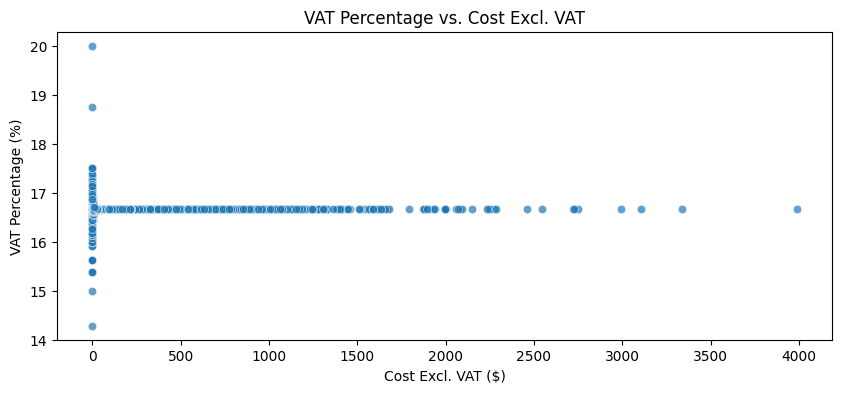

In [368]:
# Set plot size
plt.figure(figsize=(10, 4))

# Scatter plot
sns.scatterplot(x=VAT["costPrice"], y=VAT["Cost_VAT_Percentage"], alpha=0.7)

# Titles and labels
plt.xlabel("Cost Excl. VAT ($)")
plt.ylabel("VAT Percentage (%)")
plt.title("VAT Percentage vs. Cost Excl. VAT")

# Show the plot
plt.show()

###### Cost VAT percentage does not depend on Cost, maybe it depends on some other factors, ie. type of products; area shipped from etc.

# Correlation analysis

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3865700278.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  product_correlations = filtered_data.groupby('salesproduct').apply(


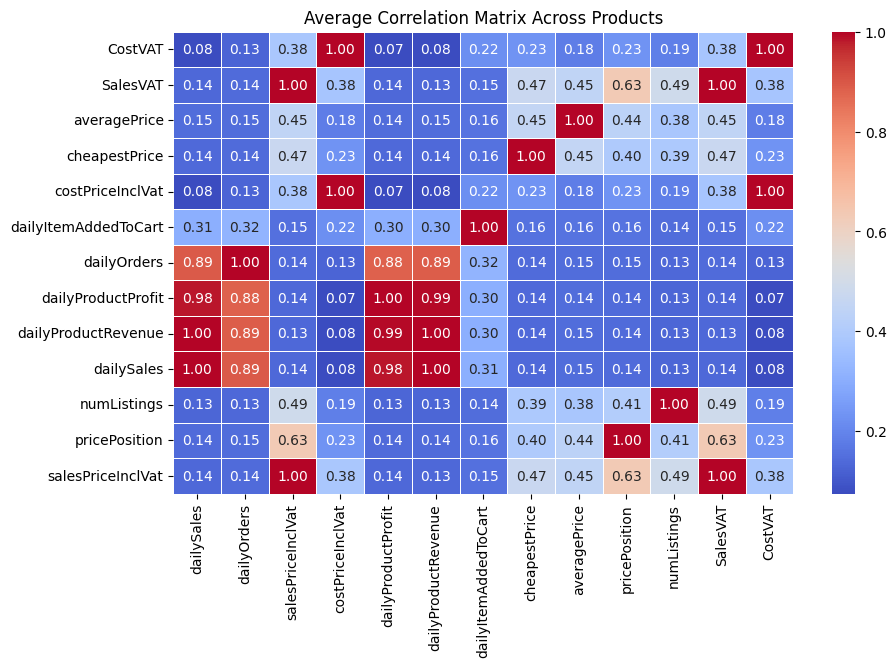

In [ ]:
columns_to_drop=['costPrice','salesPriceExclVat']

filtered_data = data.drop(columns=columns_to_drop, errors='ignore')  # 'errors=ignore' prevents errors if columns don't exist
# Group by 'salesproduct' and compute correlations for each group because the correlations are product relative
product_correlations = filtered_data.groupby('salesproduct').apply(
    lambda x: x.select_dtypes(include='number').corr().abs() #Taking absolute value such that positve and negate do not cancel each other out
)
# Average correlations across all products (ignoring NaN values)
average_corr = product_correlations.groupby(level=1).mean()
plt.figure(figsize=(10, 6))
sns.heatmap(
    average_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title('Average Correlation Matrix Across Products')
plt.show()

###### Orders and sales are almost aligned. This suggests that nearly every order converts to a sale, indicating minimal order cancellations issues.
###### Cart additions weakly correlate with sales. This suggests high cart abandonment rates or inefficiencies in converting cart additions to purchases.
###### Sales prices are directly proportional to cost prices. Higher sales prices correlate with less competitive price positions (e.g., premium pricing) and Higher costs lead to less competitive pricing likely due to passing costs to customers.
###### More competitors (numListings) correlate with less competitive pricing (pricePosition increases). This could indicate crowded markets where maintaining price competitiveness is challenging. The cheapest market price has almost no relationship with the average market price. This implies a fragmented market with both budget and premium competitors.
###### Profit is largely insensitive to cost changes, likely due to a rigid pricing strategy (e.g., fixed margins).

# Most/Least Expensive Products

In [447]:
 
most_expensive_product = data.groupby("salesproduct")["salesPriceInclVat"].mean().idxmax()
highest_avg_price = data.groupby("salesproduct")["salesPriceInclVat"].mean().max()

print(f"The most expensive sales product on average is {most_expensive_product} with an average price of {highest_avg_price:.2f}")

The most expensive sales product on average is A1791 with an average price of 8578.47


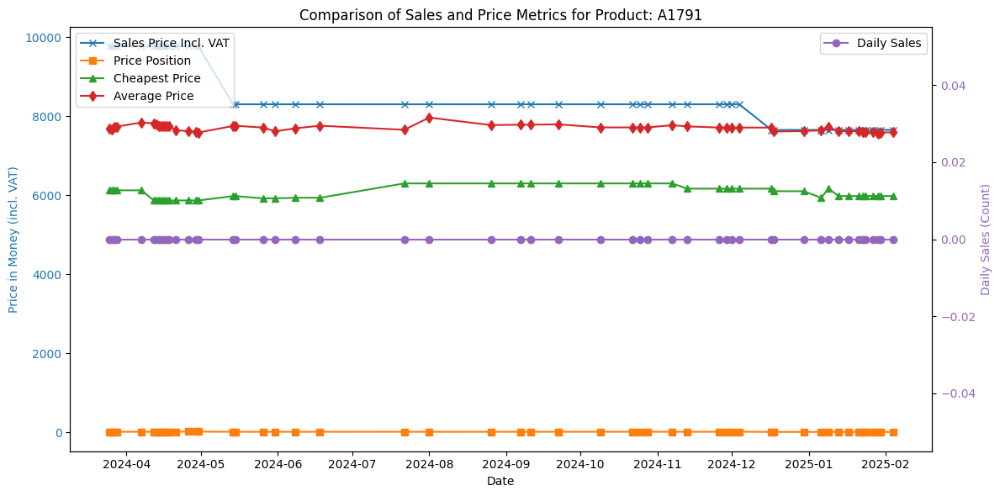

In [452]:
product_data = data[data["salesproduct"] == most_expensive_product]

# Step 3: Create a plot with two y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot price-related data (left axis)
ax1.plot(product_data['dailyDate'], product_data['salesPriceInclVat'], label='Sales Price Incl. VAT', marker='x', color='tab:blue')
ax1.plot(product_data['dailyDate'], product_data['pricePosition'], label='Price Position', marker='s', color='tab:orange')
ax1.plot(product_data['dailyDate'], product_data['cheapestPrice'], label='Cheapest Price', marker='^', color='tab:green')
ax1.plot(product_data['dailyDate'], product_data['averagePrice'], label='Average Price', marker='d', color='tab:red')

# Set labels and title for the left y-axis
ax1.set_xlabel('Date')
ax1.set_ylabel('Price in Money (incl. VAT)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a second y-axis for the dailySales (right axis)
ax2 = ax1.twinx()
ax2.plot(product_data['dailyDate'], product_data['dailySales'], label='Daily Sales', marker='o', color='tab:purple')

# Set labels for the right y-axis
ax2.set_ylabel('Daily Sales (Count)', color='tab:purple')
ax2.tick_params(axis='y', labelcolor='tab:purple')

# Rotate date labels for better readability
plt.xticks(rotation=45)

# Title
plt.title(f'Comparison of Sales and Price Metrics for Product: {most_expensive_product}')

# Add legends for both axes
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Display the plot
plt.tight_layout()
plt.show()


In [431]:
cheapest_product = data.groupby("salesproduct")["salesPriceInclVat"].mean().idxmin()
losest_avg_price = data.groupby("salesproduct")["salesPriceInclVat"].mean().min()

print(f"The cheapest sales product on average is {cheapest_product} with an average price of {losest_avg_price:.2f}")

The cheapest sales product on average is A1923 with an average price of 0.99


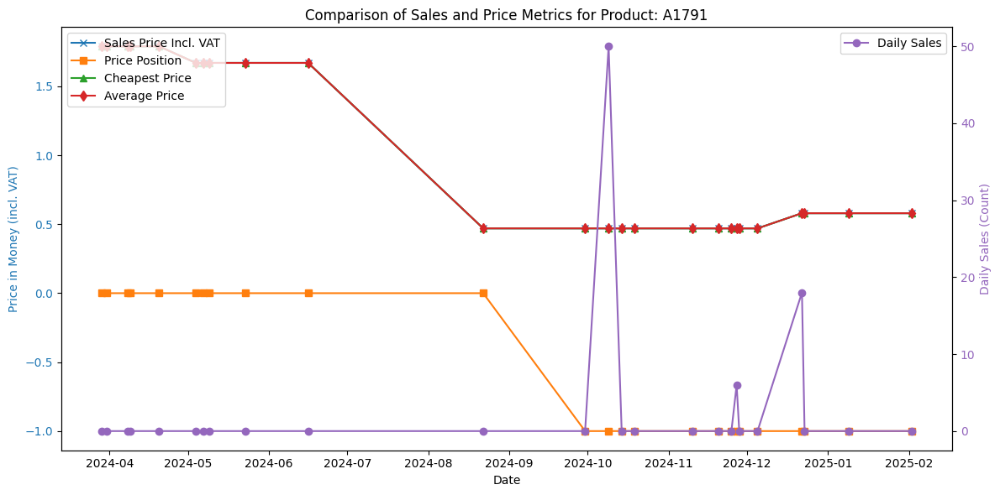

In [453]:
product_data = data[data["salesproduct"] == cheapest_product]

# Step 3: Create a plot with two y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot price-related data (left axis)
ax1.plot(product_data['dailyDate'], product_data['salesPriceInclVat'], label='Sales Price Incl. VAT', marker='x', color='tab:blue')
ax1.plot(product_data['dailyDate'], product_data['pricePosition'], label='Price Position', marker='s', color='tab:orange')
ax1.plot(product_data['dailyDate'], product_data['cheapestPrice'], label='Cheapest Price', marker='^', color='tab:green')
ax1.plot(product_data['dailyDate'], product_data['averagePrice'], label='Average Price', marker='d', color='tab:red')

# Set labels and title for the left y-axis
ax1.set_xlabel('Date')
ax1.set_ylabel('Price in Money (incl. VAT)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a second y-axis for the dailySales (right axis)
ax2 = ax1.twinx()
ax2.plot(product_data['dailyDate'], product_data['dailySales'], label='Daily Sales', marker='o', color='tab:purple')

# Set labels for the right y-axis
ax2.set_ylabel('Daily Sales (Count)', color='tab:purple')
ax2.tick_params(axis='y', labelcolor='tab:purple')

# Rotate date labels for better readability
plt.xticks(rotation=45)

# Title
plt.title(f'Comparison of Sales and Price Metrics for Product: {most_expensive_product}')

# Add legends for both axes
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Display the plot
plt.tight_layout()
plt.show()

# Price Group Labeling

###### As price here is heavily correlated with cost and vat prices are similar, we tag products with different price intervals with the same label

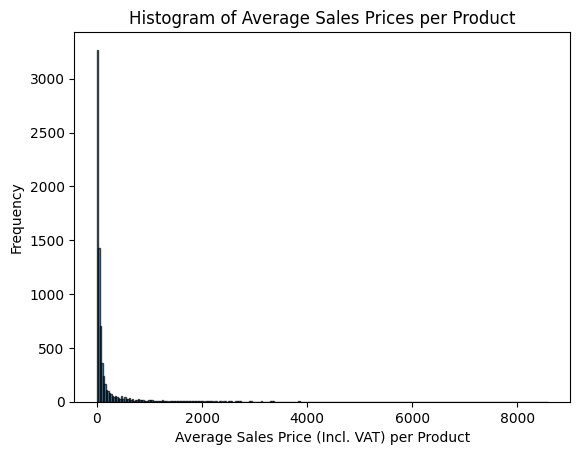

In [296]:
# Step 1: Aggregate data by sales product
sold_products = data.groupby("salesproduct")["salesPriceInclVat"].mean()  

# Step 2: Define number of bins
num_bins = 300

# Step 3: Plot histogram
plt.hist(sold_products, bins=num_bins, edgecolor='black', alpha=0.7)
plt.xlabel('Average Sales Price (Incl. VAT) per Product')
plt.ylabel('Frequency')
plt.title('Histogram of Average Sales Prices per Product')
plt.show()


###### I love histograms but the bins look very skewed. Where most of the products have relatively low prices, while a few have very high values. In this case, manually labeling price ranges requires adaptive binning that accounts for this skewness.

In [297]:
 # Step 1: Aggregate sales price per product
sold_products = data.groupby("salesproduct")["salesPriceInclVat"].mean()

# Step 2: Compute percentiles at every 10% (deciles)
percentile_values = np.percentile(sold_products, np.arange(0, 101, 10))

# Print the percentile price ranges
for i in range(len(percentile_values) - 1):
    print(f"Percentile {i*10}-{(i+1)*10}%: {percentile_values[i]:.2f} to {percentile_values[i+1]:.2f}")


Percentile 0-10%: 0.99 to 7.19
Percentile 10-20%: 7.19 to 12.50
Percentile 20-30%: 12.50 to 19.19
Percentile 30-40%: 19.19 to 27.03
Percentile 40-50%: 27.03 to 37.05
Percentile 50-60%: 37.05 to 53.99
Percentile 60-70%: 53.99 to 82.70
Percentile 70-80%: 82.70 to 158.93
Percentile 80-90%: 158.93 to 508.16
Percentile 90-100%: 508.16 to 8578.47


In [323]:
# Assuming 'data' is your original DataFrame
products = data.groupby("salesproduct")["salesPriceInclVat"].mean()

# Define the bins and labels
bins = [1, 10, 100, 500, 1000, 2000, 4000, float('inf')]
price_range_labels = ["0-10", "11-100", "101-500", "501-1000", "1001-2000", "2001-4000", "4000+"]

# Add a new column to the sold_products DataFrame for the labels
products_labels = pd.cut(products, bins=bins, labels=price_range_labels)

# Merge the labels back into the original 'data' DataFrame by mapping 'salesproduct' to the corresponding price range label
data['PriceGroup'] = data['salesproduct'].map(products_labels)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3954918870.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  aggregated_data = data.groupby('PriceGroup').agg(


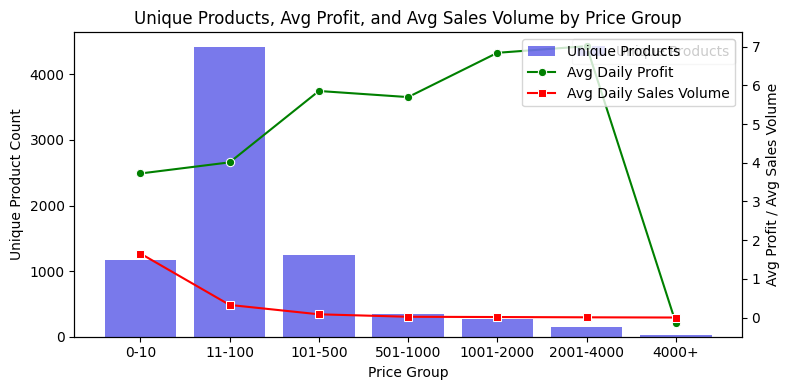

In [339]:
# Aggregate the data
aggregated_data = data.groupby('PriceGroup').agg(
    UniqueProductCount=('salesproduct', 'nunique'),  # Count unique products
    AvgProfit=('dailyProductProfit', 'mean'),                # Calculate average profit
    AvgSalesVolume=('dailySales', 'mean')       # Calculate average sales volume
).reset_index()

# Create the plot
plt.figure(figsize=(8, 4))

# Bar plot for unique product counts
ax1 = sns.barplot(data=aggregated_data, x='PriceGroup', y='UniqueProductCount', color='blue', alpha=0.6, label='Unique Products')

# Set labels and title
plt.title('Unique Products, Avg Profit, and Avg Sales Volume by Price Group')
plt.xlabel('Price Group')
plt.ylabel('Unique Product Count')

# Create a secondary y-axis for the line plots
ax2 = plt.twinx()

# Line plot for average profit
sns.lineplot(data=aggregated_data, x='PriceGroup', y='AvgProfit', color='green', marker='o', ax=ax2, label='Avg Daily Profit')

# Line plot for average sales volume
sns.lineplot(data=aggregated_data, x='PriceGroup', y='AvgSalesVolume', color='red', marker='s', ax=ax2, label='Avg Daily Sales Volume')

# Set secondary y-axis label
ax2.set_ylabel('Avg Profit / Avg Sales Volume')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\4184689720.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  aggregated_data = data.groupby('PriceGroup').agg(


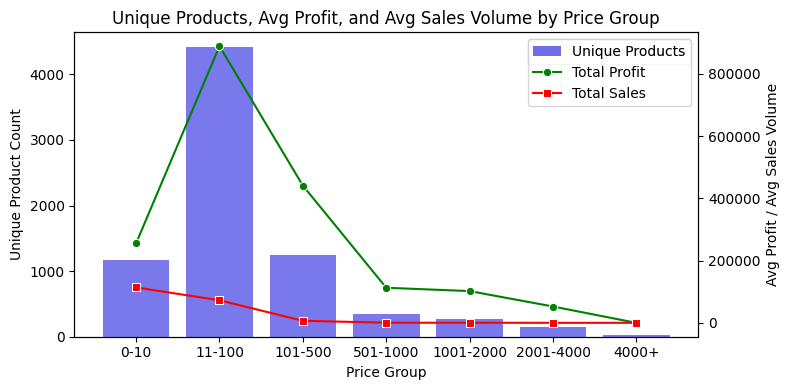

In [340]:
# Aggregate the data
aggregated_data = data.groupby('PriceGroup').agg(
    UniqueProductCount=('salesproduct', 'nunique'),  # Count unique products
    AvgProfit=('dailyProductProfit', 'sum'),                # Calculate average profit
    AvgSalesVolume=('dailySales', 'sum')       # Calculate average sales volume
).reset_index()

# Create the plot
plt.figure(figsize=(8, 4))

# Bar plot for unique product counts
ax1 = sns.barplot(data=aggregated_data, x='PriceGroup', y='UniqueProductCount', color='blue', alpha=0.6, label='Unique Products')

# Set labels and title
plt.title('Unique Products, Avg Profit, and Avg Sales Volume by Price Group')
plt.xlabel('Price Group')
plt.ylabel('Unique Product Count')

# Create a secondary y-axis for the line plots
ax2 = plt.twinx()

# Line plot for average profit
sns.lineplot(data=aggregated_data, x='PriceGroup', y='AvgProfit', color='green', marker='o', ax=ax2, label='Total Profit')

# Line plot for average sales volume
sns.lineplot(data=aggregated_data, x='PriceGroup', y='AvgSalesVolume', color='red', marker='s', ax=ax2, label='Total Sales')

# Set secondary y-axis label
ax2.set_ylabel('Avg Profit / Avg Sales Volume')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Competitiveness Labeling

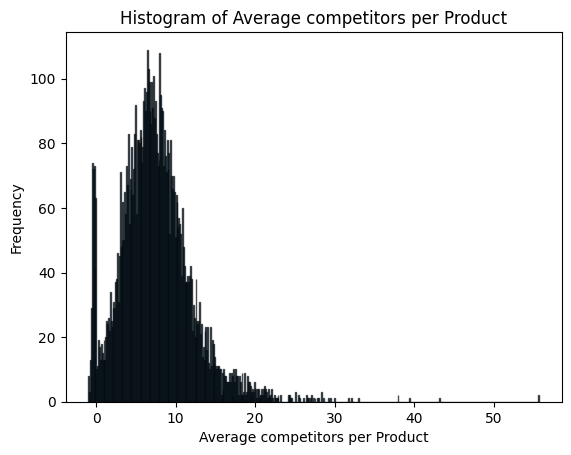

In [397]:
# Step 1: Aggregate data by competitions
sold_products = data.groupby("salesproduct")["pricePosition"].mean()  

# Step 2: Define number of bins
num_bins = 500

# Step 3: Plot histogram
plt.hist(sold_products, bins=num_bins, edgecolor='black', alpha=0.7)
plt.xlabel('Average competitors per Product')
plt.ylabel('Frequency')
plt.title('Histogram of Average competitors per Product')
plt.show()

###### Seems to be somewhere around 60 at best, We do 3 equal splits like least, moderate and high competition products separating zero competitor products firsthand.  

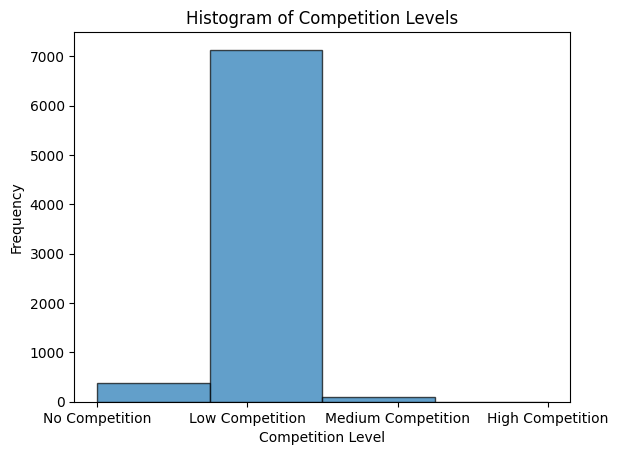

In [398]:
price_position_products = data.groupby("salesproduct")["pricePosition"].mean()

# Step 2: Define competition levels
bins = [-float('inf'), 0, 20, 40, float('inf')]
labels = ['No Competition', 'Low Competition', 'Medium Competition', 'High Competition']

# Step 3: Label the data (categorizing price position into competition levels)
positioned_products = pd.cut(price_position_products, bins=bins, labels=labels)

# Step 4: Plot histogram
plt.hist(positioned_products, bins=len(labels), edgecolor='black', alpha=0.7)
plt.xlabel('Competition Level')
plt.ylabel('Frequency')
plt.title('Histogram of Competition Levels')
plt.show()

# Step 5: Add competition level to the original data (assigning to all rows of each product)
data = data.merge(price_position_products.rename("pricePositionMean"), on="salesproduct")
data["Product_Competitiveness"] = pd.cut(data["pricePositionMean"], bins=bins, labels=labels)

###### Most of the products are low competition, a bunch of product have no competition, few are medium and very few are higly competitive.

##### Most Profitable Products

###### Lets look into the most profitable products, ie. products that can get us the highest profits per unit sale, first we need to split the dataframe in two, sold_products and never_sold_products to scale this, it's better to run in SQL/Spark; but given the size of the data pandas will do just fine.

In [400]:
sold_products = data.groupby("salesproduct")["dailySales"].sum()
sold_product_ids = sold_products[sold_products > 0].index  # salesproducts that have sales

# Spliting the dataset in two
sold_products_data = data[data["salesproduct"].isin(sold_product_ids)]      # Products that have sales
never_sold_products_data = data[~data["salesproduct"].isin(sold_product_ids)]  # Products that never sold

# Display the number of records in each
print(f"Total {sold_products_data['salesproduct'].nunique()} products were sold at least once")
print(f"Total {never_sold_products_data['salesproduct'].nunique()} sales products were never sold")

Total 5141 products were sold at least once
Total 2473 sales products were never sold


#### We are not interested in the unpopular/never sold products, because people does not seem interested in buying them for probably quality/performance/price issues thus they are not relevant . thus we will query from the sold products only, First let's look into the products that have the lowest cost price with respect to their respective selling price without considering their sales volume 


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\675488517.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\675488517.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(high_profit_products_per_unit_sold['salesproduct'], rotation=45)


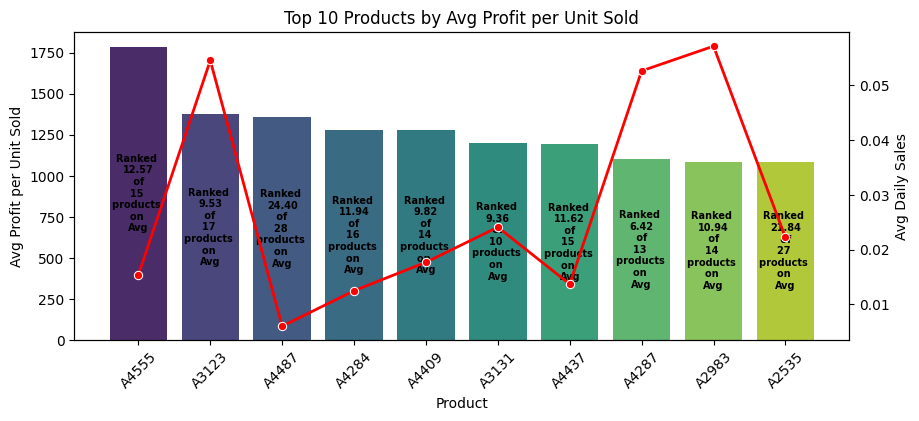

In [ ]:
 # Step 1: Convert columns to numeric and compute profit per unit sold
profit_data = sold_products_data.copy()
profit_data[['salesPriceExclVat', 'costPrice', 'dailySales', 'pricePosition', 'numListings']] = profit_data[
    ['salesPriceExclVat', 'costPrice', 'dailySales', 'pricePosition', 'numListings']
].apply(pd.to_numeric)

profit_data['calculatedProfit'] = profit_data['salesPriceExclVat'] - profit_data['costPrice']

# Step 2: Aggregate avg profit, price position, number of competitors, and avg daily sales
high_profit_products_per_unit_sold = profit_data.groupby('salesproduct').agg(
    avg_profit_per_unit=('calculatedProfit', 'mean'),
    avg_price_position=('pricePosition', 'mean'),
    avg_num_listings=('numListings', 'mean'),
    avg_daily_sales=('dailySales', 'mean')  # New column for daily sales
).reset_index()

# Step 3: Sort by highest profit per unit sold and select top 10
high_profit_products_per_unit_sold = high_profit_products_per_unit_sold.sort_values(
    by='avg_profit_per_unit', ascending=False
).head(10)

# Step 4: Create the bar chart
fig, ax1 = plt.subplots(figsize=(10, 4))

# Plot the bar chart (Profit per unit sold)
sns.barplot(
    x='salesproduct', 
    y='avg_profit_per_unit', 
    data=high_profit_products_per_unit_sold, 
    palette='viridis',
    ax=ax1
)

ax1.set_xlabel('Product')
ax1.set_ylabel('Avg Profit per Unit Sold', color='black')
ax1.set_title('Top 10 Products by Avg Profit per Unit Sold')
ax1.tick_params(axis='y', labelcolor='black')
ax1.set_xticklabels(high_profit_products_per_unit_sold['salesproduct'], rotation=45)

# Step 5: Add a second y-axis for avg daily sales
ax2 = ax1.twinx()
sns.lineplot(
    x='salesproduct', 
    y='avg_daily_sales', 
    data=high_profit_products_per_unit_sold, 
    marker='o', 
    color='red', 
    linewidth=2, 
    ax=ax2
)

ax2.set_ylabel('Avg Daily Sales', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Step 6: Annotate inside the bars
for i, bar in enumerate(ax1.patches):
    bar_x = bar.get_x() + bar.get_width() / 2
    bar_y = bar.get_height() / 2  

    avg_price_position = high_profit_products_per_unit_sold.iloc[i]["avg_price_position"]
    avg_competitors = high_profit_products_per_unit_sold.iloc[i]["avg_num_listings"]
    
    annotation = f"Ranked \n{avg_price_position:.2f}\n of \n{avg_competitors:.0f} \nproducts \non \nAvg"
    
    ax1.text(bar_x, bar_y, annotation, ha='center', va='center', 
             color='black', fontweight='bold', fontsize=7)

plt.show()


###### The most high profit margin products are often behind in their price position in comparisons to their competitions and the sales are pretty much down. Now lets include daily sales into the equation and find out what are the products that actually are driving the most profits and what their market positions look like. 

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3668660437.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3668660437.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(top_profit_products_by_sales['salesproduct'], rotation=45)


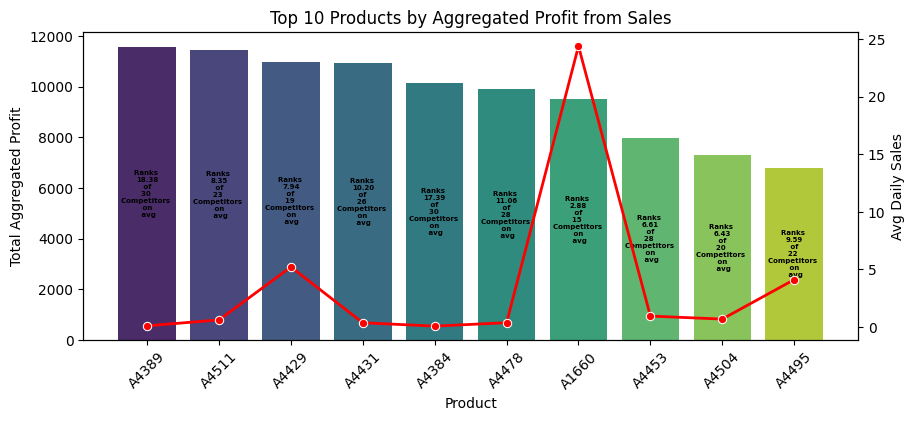

In [414]:
 
# Step 1: Aggregate total profit, avg daily sales, avg price position, and avg competitors
top_profit_products_by_sales = sold_products_data.groupby('salesproduct').agg(
    total_profit=('dailyProductProfit', 'sum'),
    avg_daily_sales=('dailySales', 'mean'),  
    avg_price_position=('pricePosition', 'mean'),  
    avg_num_listings=('numListings', 'mean')  # New column for competitor count
).reset_index()

# Step 2: Sort by highest total profit and select the top 10
top_profit_products_by_sales = top_profit_products_by_sales.sort_values(
    by='total_profit', ascending=False
).head(10)

# Step 3: Create figure and axes
fig, ax1 = plt.subplots(figsize=(10, 4))

# Bar chart for total profit
sns.barplot(
    x='salesproduct', 
    y='total_profit', 
    data=top_profit_products_by_sales, 
    palette='viridis',
    ax=ax1
)

ax1.set_xlabel('Product')
ax1.set_ylabel('Total Aggregated Profit', color='black')
ax1.set_title('Top 10 Products by Aggregated Profit from Sales')
ax1.tick_params(axis='y', labelcolor='black')
ax1.set_xticklabels(top_profit_products_by_sales['salesproduct'], rotation=45)

# Step 4: Add a second y-axis for avg daily sales
ax2 = ax1.twinx()
sns.lineplot(
    x='salesproduct', 
    y='avg_daily_sales', 
    data=top_profit_products_by_sales, 
    marker='o', 
    color='red', 
    linewidth=2, 
    ax=ax2
)

ax2.set_ylabel('Avg Daily Sales', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Step 5: Annotate market position and competitors inside the bars
for i, bar in enumerate(ax1.patches):
    bar_x = bar.get_x() + bar.get_width() / 2
    bar_y = bar.get_height() / 2  

    avg_price_position = top_profit_products_by_sales.iloc[i]["avg_price_position"]
    avg_competitors = top_profit_products_by_sales.iloc[i]["avg_num_listings"]
    
    annotation = f"Ranks \n{avg_price_position:.2f}\n of \n{avg_competitors:.0f} \nCompetitors \n on \n avg"
    
    ax1.text(bar_x, bar_y, annotation, ha='center', va='center', 
             color='black', fontweight='bold', fontsize=5)

plt.show()


###### These products are seemingly sold a lot more. None of the top 10 most profitable products is sold a lot actually driving the most profit in reality, hence raising price to achieve a higher profit margin  will actually not be helpful. In other words, luxery products are not surpassing the average products.An interesting thing would be to see where a product can position itself in the market so that it can make the most profit, a model could be built around that if there were further product details but lets see. Lets categorize the product and their price ranges

# Most Sold Products 
###### There will be a lot of products that has only 1 unit of sales, therefore omitting the least sold products

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3553219256.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


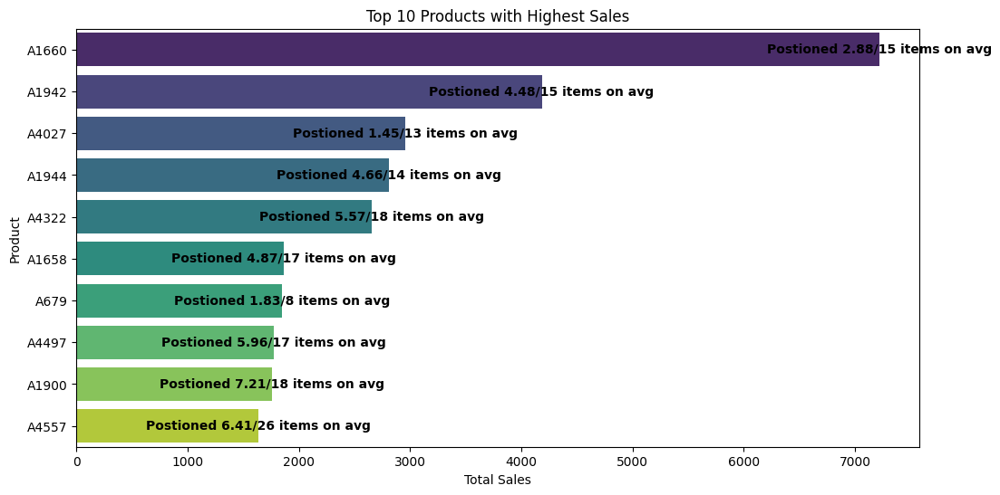

In [422]:

# --- Step 1: Aggregate the data ---
aggregated = data.groupby("salesproduct").agg(
    total_sales=("dailySales", "sum"),
    avg_price_position=("pricePosition", "mean"),
    avg_num_listings=("numListings", "mean")
).reset_index()

# --- Step 2: Filter for the top 10 products by total sales ---
top_products_by_sales_total = aggregated.sort_values("total_sales", ascending=False).head(10)

# --- Step 3: Plot the horizontal bar chart ---
plt.figure(figsize=(12, 6))
ax = sns.barplot(
    x="total_sales", 
    y="salesproduct", 
    data=top_products_by_sales_total, 
    palette="viridis"
)
plt.xlabel("Total Sales")
plt.ylabel("Product")
plt.title("Top 10 Products with Highest Sales")

# --- Step 4: Annotate each bar inside the bar ---
for i, bar in enumerate(ax.patches):
    # Calculate the center of the bar on the x-axis
    bar_x = bar.get_x()
    bar_width = bar.get_width()
    text_x = bar_x + bar_width 
    
    # Calculate the center on the y-axis
    text_y = bar.get_y() + bar.get_height() / 2
    
    # Retrieve corresponding values from the aggregated data
    avg_price = top_products_by_sales_total.iloc[i]["avg_price_position"]
    avg_competitors = top_products_by_sales_total.iloc[i]["avg_num_listings"]
    
    # Create the annotation text (e.g., "2.35 / 5")
    annotation = f"Postioned {avg_price:.2f}/{avg_competitors:.0f} items on avg"
    
    # Place the annotation in the middle of the bar
    ax.text(text_x, text_y, annotation, ha='center', va='center', 
            color='black', fontweight='bold')

plt.show()

# Loss Making Products

###### Lets try to diagnose why some products are making losses

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2792323184.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2792323184.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(worst_profit_products_by_sales['salesproduct'], rotation=45)


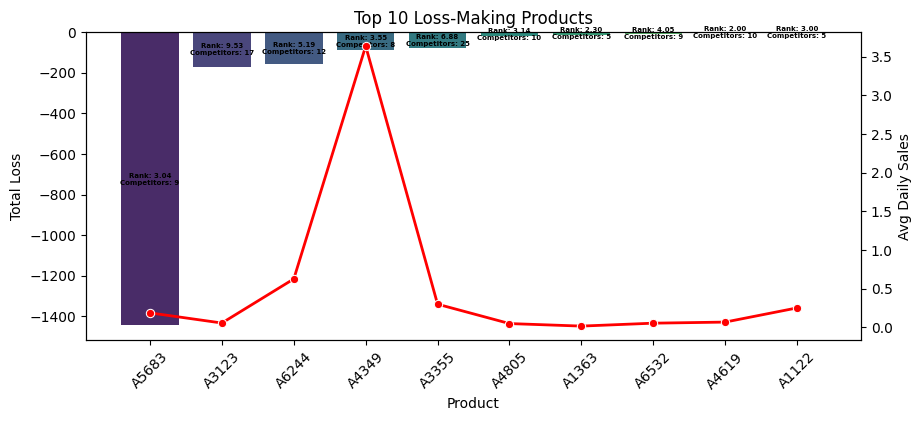

In [ ]:
# Step 1: Aggregate total loss, avg daily sales, avg price position, and avg competitors
worst_profit_products_by_sales = sold_products_data.groupby('salesproduct').agg(
    total_loss=('dailyProductProfit', 'sum'),  # Negative profits represent losses
    avg_daily_sales=('dailySales', 'mean'),  
    avg_price_position=('pricePosition', 'mean'),  
    avg_num_listings=('numListings', 'mean')  
).reset_index()

# Step 2: Sort by highest losses and select the top 10
worst_profit_products_by_sales = worst_profit_products_by_sales.sort_values(
    by='total_loss', ascending=True  # Sorting ascending to get most loss-making products
).head(10)

# Step 3: Create figure and axes
fig, ax1 = plt.subplots(figsize=(10, 4))

# Bar chart for total losses
sns.barplot(
    x='salesproduct', 
    y='total_loss', 
    data=worst_profit_products_by_sales, 
    palette='viridis',
    ax=ax1
)

ax1.set_xlabel('Product')
ax1.set_ylabel('Total Loss', color='black')
ax1.set_title('Top 10 Loss-Making Products')
ax1.tick_params(axis='y', labelcolor='black')
ax1.set_xticklabels(worst_profit_products_by_sales['salesproduct'], rotation=45)

# Step 4: Add a second y-axis for avg daily sales
ax2 = ax1.twinx()
sns.lineplot(
    x='salesproduct', 
    y='avg_daily_sales', 
    data=worst_profit_products_by_sales, 
    marker='o', 
    color='red', 
    linewidth=2, 
    ax=ax2
)

ax2.set_ylabel('Avg Daily Sales', color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Step 5: Annotate market position and competitors inside the bars
for i, bar in enumerate(ax1.patches):
    bar_x = bar.get_x() + bar.get_width() / 2
    bar_y = bar.get_height() / 2  

    avg_price_position = worst_profit_products_by_sales.iloc[i]["avg_price_position"]
    avg_competitors = worst_profit_products_by_sales.iloc[i]["avg_num_listings"]
    
    annotation = f"Rank: {avg_price_position:.2f}\nCompetitors: {avg_competitors:.0f}"
    
    ax1.text(bar_x, bar_y, annotation, ha='center', va='center', 
             color='black', fontweight='bold', fontsize=5)

plt.show()


#### Interesting!! these products have faced losses trying to place themselves forward in the market, still the sales are pretty low for most of them. Maybe these products are really bad in quality/performance. Also, lowering prices may increase sales volume but reduce profit per unit. The key is finding the optimal price that maximizes revenue and profitability. If substitutes are available, a price increase might push consumers toward competitors, reducing sales. Conversely, if a product is unique or has a strong brand, it may maintain sales despite price increases. In a strong economy, consumers may be less sensitive to price changes, while in economic downturns, they may prioritize affordability.

#### Considering all the factors, the most important question here is where should a product position itself in the market such that it can maximize profit from sales. It can be done by forecasting sales with dynamic pricing where the price will forecast the daily sale based on price. But as the correlation matrix denotes that the price does not correlate with the daily sales on average, so we need to find the products that has a minimum correlation threshold and can be used as exogenous information to predict daily sales.    

# Sales Forecasting based on Price

##### Elastic vs Inelastic. First from the sold products lets filter out the products that never changed their price because they are not interesting and as they never changed their prices, they are inelastic and probably stick to their price tags forever.

In [675]:
Static_products = sold_products_data.groupby('salesproduct')['salesPriceInclVat'].nunique()
len(static_products)
Dynamic_products = Static_products[Static_products != 1].index
Dynamic_products

# Filter the dataset for these products
dynamic_Products = sold_products_data[sold_products_data['salesproduct'].isin(Dynamic_products)]

dynamic_Products['salesproduct'].nunique() 

4609

##### That leaves us 4609 out of 5141 products, now lets furhter narrow down and find products in which sales and price are negatively correlated with a value of at least +0.5 or more or -0.5 or less. (We also took positive correlation into account because for premium or luxury products, higher prices may increase sales because they signal higher quality or exclusivity, or a higher brand value)

In [583]:
# Step 1: Group by 'salesproduct' and calculate correlation between 'dailySales' and 'salesPriceInclVat'
correlation_df = dynamic_Products.groupby('salesproduct').apply(
    lambda x: x[['dailySales', 'salesPriceInclVat']].corr().iloc[0, 1]
).reset_index(name='Sales_vs_price_correlation')

 

# Filter to keep only products with correlation ≤ -0.2 or ≥ 0.2
correlation_df = correlation_df.loc[
    (correlation_df['Sales_vs_price_correlation'] <= -0.5) | 
    (correlation_df['Sales_vs_price_correlation'] >= 0.5)
]

# Display the filtered DataFrame
print(len(correlation_df))


104


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1363053957.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  correlation_df = dynamic_Products.groupby('salesproduct').apply(


#### Now we are left with 104 products only that are price sensitive, Similarly something else like avg price or number of competitiors can be also used for exogenous regressor with an absolute correlation value of 0.2, but Price is the most relevant since we have full control over it. I set the correlation threshold to  0.5 because this is the minimum I found relevant in my research. I cannot back it up until my paper is published ;)     

In [584]:
Final_Products = dynamic_Products[dynamic_Products['salesproduct'].isin(correlation_df['salesproduct'])]

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3366006429.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  product_correlations = filtered_data.groupby('salesproduct').apply(


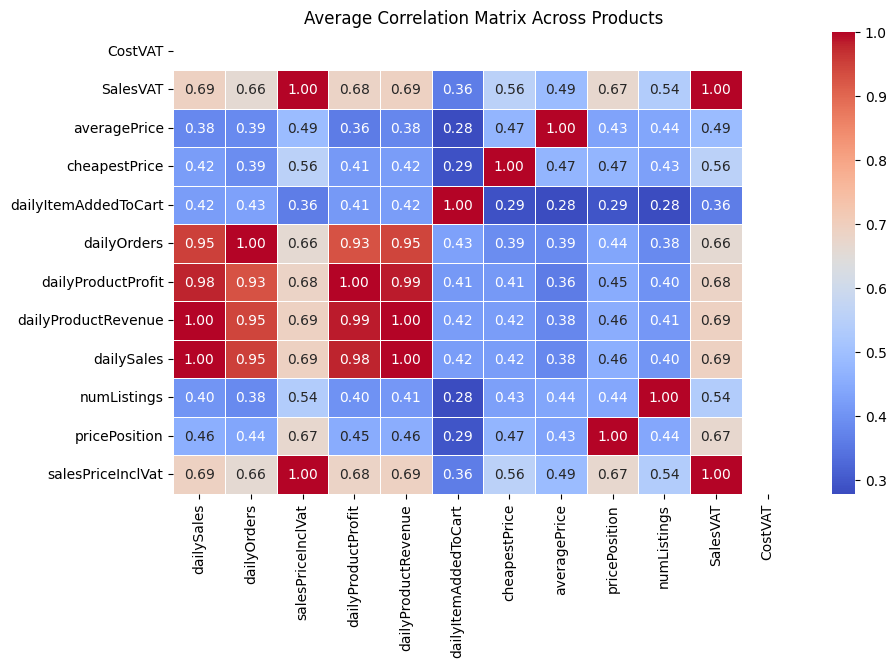

In [608]:
columns_to_drop=['costPrice','salesPriceExclVat','costPriceInclVat', 'pricePositionMean']

filtered_data = Final_Products.drop(columns=columns_to_drop, errors='ignore')  # 'errors=ignore' prevents errors if columns don't exist
# Group by 'salesproduct' and compute correlations for each group because the correlations are product relative
product_correlations = filtered_data.groupby('salesproduct').apply(
    lambda x: x.select_dtypes(include='number').corr().abs()
)
# Average correlations across all products (ignoring NaN values)
average_corr = product_correlations.groupby(level=1).mean()
plt.figure(figsize=(10, 6))
sns.heatmap(
    average_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title('Average Correlation Matrix Across Products')
plt.show()

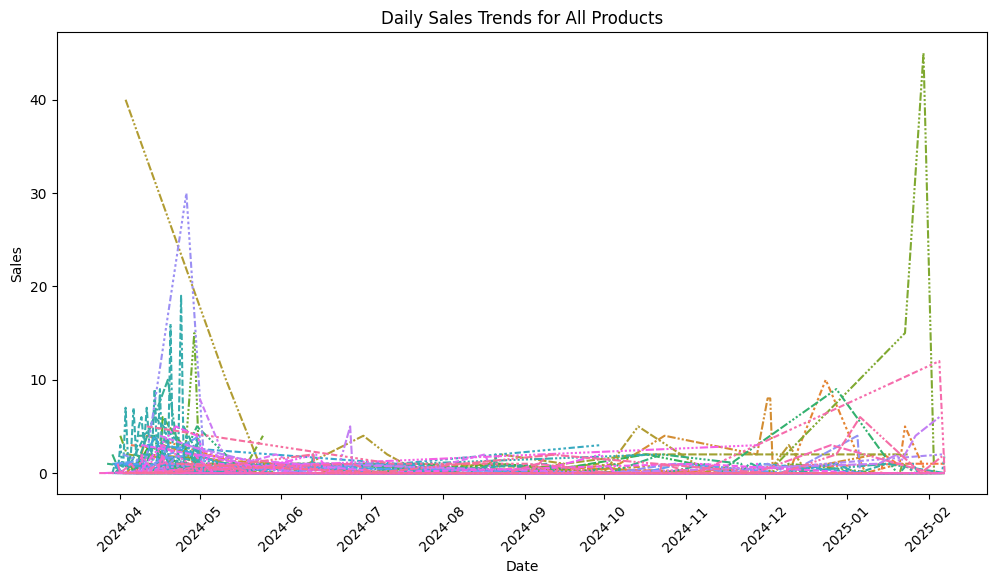

In [585]:
# Pivot the data to get sales trends for each product
sale_trend = Final_Products.pivot(index='dailyDate', columns='salesproduct', values='dailySales')

# Plot the sales trends
plt.figure(figsize=(12, 6))
sns.lineplot(data=sale_trend, dashes=True)

# Formatting the plot
plt.legend().remove()
plt.xlabel("Date")
plt.ylabel("Sales")
plt.title("Daily Sales Trends for All Products")
plt.xticks(rotation=45)

# Show plot
plt.show()

##### I have dealt with this kind of time series before and I know Prophet is the best model for this kind of time series with sudden spikes and structural breaks.

##### Let's try with univariate approach first

In [595]:
# Store results for each sales product
error_metrics = []

# Loop through each salesproduct
for product, group in Final_Products.groupby("salesproduct"):
    # Prepare data for Prophet
    group = group.rename(columns={"dailyDate": "ds", "dailySales": "y"}).sort_values("ds")

    # Train-Test Split (80:20)
    split_idx = int(len(group) * 0.8)
    if split_idx < 2:
        print(f"Skipping {product}: Not enough data for training.")
        continue
    train, test = group.iloc[:split_idx], group.iloc[split_idx:]

    # Fit Prophet model
    model = Prophet()
    model.fit(train)

    # Make future predictions for the test set
    future = test[["ds"]]
    forecast = model.predict(future)

    # Merge actual vs predicted
    test["yhat"] = forecast["yhat"].values

    # Calculate error metrics
    mae = mean_absolute_error(test["y"], test["yhat"])
    rmse = np.sqrt(mean_squared_error(test["y"], test["yhat"]))
    smape = 100 * np.mean(2 * np.abs(test["yhat"] - test["y"]) / (np.abs(test["y"]) + test["yhat"]))

    # Store results
    error_metrics.append({"salesproduct": product, "MAE": mae, "RMSE": rmse, "SMAPE": smape})

# Convert to DataFrame
results_df = pd.DataFrame(error_metrics)

# Display results
print(results_df)

03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:27:16 - cmdstanpy - INFO - Chain [1] start processing
03:27:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

Skipping A4222: Not enough data for training.


03:28:11 - cmdstanpy - INFO - Chain [1] start processing
03:28:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:28:12 - cmdstanpy - INFO - Chain [1] start processing
03:28:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

Skipping A5417: Not enough data for training.


03:28:29 - cmdstanpy - INFO - Chain [1] start processing
03:28:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:28:29 - cmdstanpy - INFO - Chain [1] start processing
03:28:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

Skipping A665: Not enough data for training.


03:28:39 - cmdstanpy - INFO - Chain [1] start processing
03:28:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:28:39 - cmdstanpy - INFO - Chain [1] start processing
03:28:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

    salesproduct       MAE      RMSE         SMAPE
0           A100  0.353066  0.409695   -200.000000
1           A103  0.066417  0.066417   -200.000000
2          A1122  1.000000  1.000000    200.000000
3          A1179  0.303358  0.345083   -200.000000
4           A120  1.982631  1.982631  22829.043100
..           ...       ...       ...           ...
96         A7453  4.000000  6.928203    200.000000
97           A78  2.034659  2.849545    110.291955
98          A788  0.673682  0.726068    -66.666667
99          A829  0.830953  0.895745    111.041383
100          A98  0.756954  0.810784    200.000000

[101 rows x 4 columns]


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3970773050.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


In [597]:
overall_metrics = {
    "salesproduct": "Overall Average",
    "MAE": results_df["MAE"].mean(),
    "RMSE": results_df["RMSE"].mean(),
    "SMAPE": results_df["SMAPE"].mean()
}

overall_metrics

{'salesproduct': 'Overall Average',
 'MAE': 2.648925896472086,
 'RMSE': 3.0264796947292507,
 'SMAPE': 179.7428139162635}

In [598]:
sorted_df=results_df.sort_values(by="MAE", ascending=False)
sorted_df.head(100)

,salesproduct,MAE,RMSE,SMAPE
88,A668,70.857291,70.857291,-200.000000
20,A1885,25.752348,29.759094,89.298676
11,A1547,11.860747,12.898077,-200.000000
69,A5414,8.598375,8.598375,-200.000000
30,A2698,8.571429,17.928429,200.000000
...,...,...,...,...
82,A6200,0.075020,0.075247,-200.000000
93,A6928,0.074089,0.075952,-66.666667
1,A103,0.066417,0.066417,-200.000000
37,A3414,0.034466,0.038665,-200.000000


##### Now lets check with the multivariate approach(inclusion of price) to see if it can surpass the univariate accuracy

In [ ]:
# Store results for each sales product
error_metrics = []

# Loop through each salesproduct
for product, group in Final_Products.groupby("salesproduct"):
    # Prepare data for Prophet
    group = group.rename(columns={"dailyDate": "ds", "dailySales": "y"}).sort_values("ds")

    # Train-Test Split (80:20)
    split_idx = int(len(group) * 0.8)
    if split_idx < 2:
        print(f"Skipping {product}: Not enough data for training.")
        continue
    train, test = group.iloc[:split_idx], group.iloc[split_idx:]

    # Include 'salesPriceExclVat' as a regressor
    model = Prophet()
    model.add_regressor('salesPriceExclVat',)  # Adding the regressor
    model.fit(train)

    # Prepare the future DataFrame, including the 'salesPriceExclVat' values for future dates
    future = test[["ds"]].copy()
    future["salesPriceExclVat"] = test["salesPriceExclVat"].values  # Add the future values of the regressor

    # Make future predictions for the test set
    forecast = model.predict(future)

    # Merge actual vs predicted
    test["yhat"] = forecast["yhat"].values

    # Calculate error metrics
    mae = mean_absolute_error(test["y"], test["yhat"])
    rmse = np.sqrt(mean_squared_error(test["y"], test["yhat"]))
    smape = 100 * np.mean(2 * np.abs(test["yhat"] - test["y"]) / (np.abs(test["y"]) + test["yhat"]))

    # Store results
    error_metrics.append({"salesproduct": product, "MAE": mae, "RMSE": rmse, "SMAPE": smape})

# Convert to DataFrame
results_df = pd.DataFrame(error_metrics)

# Display results
print(results_df)


03:30:54 - cmdstanpy - INFO - Chain [1] start processing
03:31:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:31:07 - cmdstanpy - INFO - Chain [1] start processing
03:31:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

Skipping A4222: Not enough data for training.


03:32:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:32:32 - cmdstanpy - INFO - Chain [1] start processing
03:32:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
C:\Users\ahasa\AppData\Local\Temp\ipyke

Skipping A5417: Not enough data for training.


03:32:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:32:44 - cmdstanpy - INFO - Chain [1] start processing
03:32:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:32:44 - cmdstanpy - INFO - Chain [1]

Skipping A665: Not enough data for training.


03:33:00 - cmdstanpy - INFO - Chain [1] start processing
03:33:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
03:33:01 - cmdstanpy - INFO - Chain [1] start processing
03:33:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

    salesproduct           MAE          RMSE        SMAPE
0           A100  3.807033e-01  6.593562e-01    66.666667
1           A103  4.022513e-07  4.022513e-07  -200.000000
2          A1122  1.000000e+00  1.000000e+00   200.000000
3          A1179  8.603344e-02  8.741718e-02  -200.000000
4           A120  1.937509e+00  1.937509e+00  6200.907117
..           ...           ...           ...          ...
96         A7453  4.000000e+00  6.928203e+00   200.000000
97           A78  2.394004e+00  2.945436e+00   140.091794
98          A788  1.004106e+00  1.004205e+00   -66.666667
99          A829  2.495910e+00  3.197165e+00 -1009.742687
100          A98  9.051610e+00  9.765774e+00     0.000000

[101 rows x 4 columns]


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\3247781142.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


In [600]:
overall_metrics = {
    "salesproduct": "Overall Average",
    "MAE": results_df["MAE"].mean(),
    "RMSE": results_df["RMSE"].mean(),
    "SMAPE": results_df["SMAPE"].mean()
}

overall_metrics

{'salesproduct': 'Overall Average',
 'MAE': 2.0745468614896865,
 'RMSE': 2.6917561059937416,
 'SMAPE': 71.17546138605779}

# Bingo !! Reduced Forecast Error by 20% in MAE

In [ ]:
# Assuming 'model' is your trained Prophet model
with open("prophet_model.pkl", "wb") as f:
    pickle.dump(model, f)

In [676]:
dynamic_Products['marketPosition']=dynamic_Products['pricePosition']/dynamic_Products['numListings']

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\52300088.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dynamic_Products['marketPosition']=dynamic_Products['pricePosition']/dynamic_Products['numListings']


In [679]:
dynamic_Products['marketPosition'] = dynamic_Products['marketPosition'].fillna(1)
dynamic_Products['marketPosition'].isna().sum()

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\4066644789.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dynamic_Products['marketPosition'] = dynamic_Products['marketPosition'].fillna(1)


0

In [653]:
# Define the columns for which you want to calculate correlations
correlation_columns = ['salesPriceInclVat', 'cheapestPrice', 'averagePrice', 'marketPosition']

# Calculate correlations for each group and store in separate columns
correlation_df = dynamic_Products.groupby('salesproduct').apply(
    lambda x: pd.Series({
        f'Sales_vs_{col}_correlation': x['dailySales'].corr(x[col])
        for col in correlation_columns
    })
).reset_index()

# Define the correlation columns
correlation_columns = [
    'Sales_vs_salesPriceInclVat_correlation',
    'Sales_vs_cheapestPrice_correlation',
    'Sales_vs_averagePrice_correlation',
    'Sales_vs_marketPosition_correlation'
]

# Filter rows where any correlation column meets the condition (≤ -0.5 or ≥ 0.5)
filtered_correlation_df = correlation_df.loc[
    (correlation_df[correlation_columns].abs() >= 0.5).any(axis=1)
]

 
len(filtered_correlation_df['salesproduct'])

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.t

230

In [670]:
columns_to_drop=['costPrice','salesPriceExclVat','costPriceInclVat', 'pricePositionMean']
Final_Products = dynamic_Products[dynamic_Products['salesproduct'].isin(filtered_correlation_df['salesproduct'])]

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1981577326.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  product_correlations = filtered_data.groupby('salesproduct').apply(


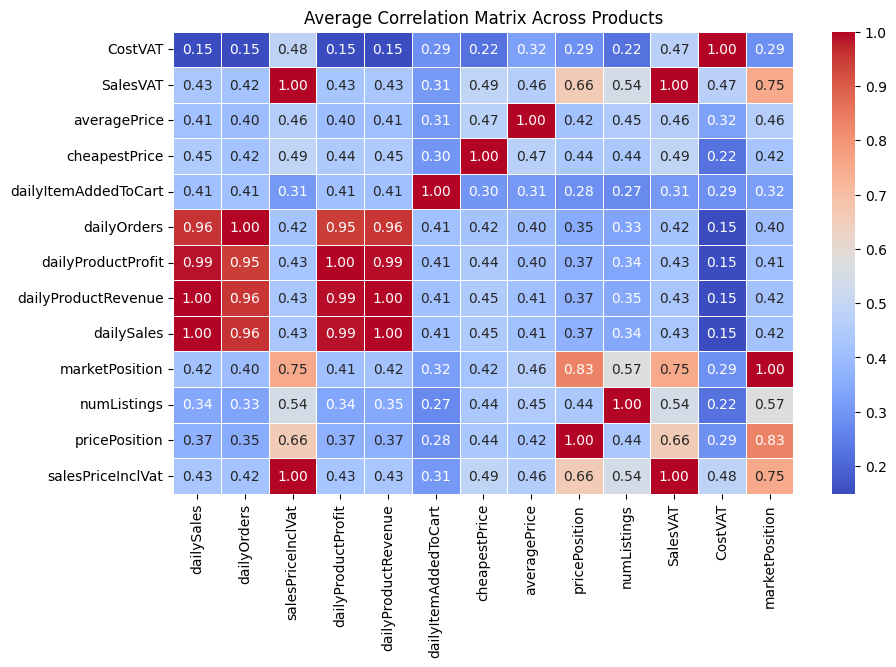

In [ ]:

filtered_data = Final_Products.drop(columns=columns_to_drop, errors='ignore')  # 'errors=ignore' prevents errors if columns don't exist
# Group by 'salesproduct' and compute correlations for each group because the correlations are product relative
product_correlations = filtered_data.groupby('salesproduct').apply(
    lambda x: x.select_dtypes(include='number').corr().abs()
)
# Average correlations across all products (ignoring NaN values)
average_corr = product_correlations.groupby(level=1).mean()
plt.figure(figsize=(10, 6))
sns.heatmap(
    average_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title('Average Correlation Matrix Across Products')
plt.show()

In [667]:
Final_Products = dynamic_Products[dynamic_Products['salesproduct'].isin(filtered_correlation_df['salesproduct'])]
Final_Products

,dailyDate,salesproduct,dailySales,dailyOrders,salesPriceInclVat,salesPriceExclVat,costPrice,costPriceInclVat,dailyProductProfit,dailyProductRevenue,dailyItemAddedToCart,cheapestPrice,averagePrice,pricePosition,numListings,SalesVAT,CostVAT,pricePositionMean,Product_Competitiveness,marketPosition
366,2024-06-30,A14,0,0,21.23,17.69,7.76,9.05,0.00,0.00,0,13.99,21.35,6,13,3.54,1.29,5.030303,Low Competition,0.461538
367,2024-07-02,A14,0,0,21.23,17.69,7.76,9.05,0.00,0.00,0,13.99,21.35,6,12,3.54,1.29,5.030303,Low Competition,0.500000
368,2024-07-03,A14,0,0,21.23,17.69,7.76,9.05,0.00,0.00,0,13.99,21.35,6,13,3.54,1.29,5.030303,Low Competition,0.461538
369,2024-07-04,A14,0,0,21.23,17.69,7.76,9.05,0.00,0.00,0,13.99,21.35,6,13,3.54,1.29,5.030303,Low Competition,0.461538
370,2024-07-05,A14,0,0,21.23,17.69,7.76,9.05,0.00,0.00,0,13.99,21.37,6,13,3.54,1.29,5.030303,Low Competition,0.461538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407211,2024-07-06,A7597,1,1,8.75,7.29,3.00,3.50,4.81,7.29,3,6.79,10.85,6,15,1.46,0.50,6.705882,Low Competition,0.400000
407212,2024-11-03,A7597,0,0,8.75,7.29,3.00,3.50,0.00,0.00,4,6.79,10.60,5,15,1.46,0.50,6.705882,Low Competition,0.333333
407213,2024-11-07,A7597,3,1,8.75,7.29,3.00,3.50,12.93,21.87,0,6.79,10.60,5,15,1.46,0.50,6.705882,Low Competition,0.333333
407214,2025-01-09,A7597,0,0,8.75,7.29,3.00,3.50,0.00,0.00,0,6.79,10.53,6,15,1.46,0.50,6.705882,Low Competition,0.400000


In [680]:
dynamic_Products['salesproduct'].nunique() 

4609

# Univariate

In [682]:
# Store results for each sales product
error_metrics = []

# Loop through each salesproduct
for product, group in dynamic_Products.groupby("salesproduct"):
    # Prepare data for Prophet
    group = group.rename(columns={"dailyDate": "ds", "dailySales": "y"}).sort_values("ds")

    # Train-Test Split (80:20)
    split_idx = int(len(group) * 0.8)
    if split_idx < 2:
        print(f"Skipping {product}: Not enough data for training.")
        continue
    train, test = group.iloc[:split_idx], group.iloc[split_idx:]

    # Fit Prophet model
    model = Prophet()
    model.fit(train)

    # Make future predictions for the test set
    future = test[["ds"]]
    forecast = model.predict(future)

    # Merge actual vs predicted
    test["yhat"] = forecast["yhat"].values

    # Calculate error metrics
    mae = mean_absolute_error(test["y"], test["yhat"])
    rmse = np.sqrt(mean_squared_error(test["y"], test["yhat"]))
    smape = 100 * np.mean(2 * np.abs(test["yhat"] - test["y"]) / (np.abs(test["y"]) + test["yhat"]))

    # Store results
    error_metrics.append({"salesproduct": product, "MAE": mae, "RMSE": rmse, "SMAPE": smape})

# Convert to DataFrame
results_df = pd.DataFrame(error_metrics)

# Display results
print(results_df)

06:53:08 - cmdstanpy - INFO - Chain [1] start processing
06:53:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
06:53:08 - cmdstanpy - INFO - Chain [1] start processing
06:53:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

Skipping A4222: Not enough data for training.


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:19:23 - cmdstanpy - INFO - Chain [1] start processing
07:19:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A v

Skipping A5417: Not enough data for training.


07:26:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:26:50 - cmdstanpy - INFO - Chain [1] start processing
07:26:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:26:51 - cmdstanpy - INFO - Chain [1]

Skipping A665: Not enough data for training.


07:33:35 - cmdstanpy - INFO - Chain [1] start processing
07:33:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:33:36 - cmdstanpy - INFO - Chain [1] start processing
07:33:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = foreca

     salesproduct       MAE       RMSE       SMAPE
0            A100  0.353066   0.409695 -200.000000
1           A1000  5.662110  15.701280   41.902589
2           A1001  0.963886   1.115364  195.822938
3           A1002  0.909413   0.933676  -46.153846
4           A1003  0.526608   1.175139   33.053424
...           ...       ...        ...         ...
4601         A992  0.280639   0.376106  189.120663
4602         A993  0.467093   0.782545   -5.247620
4603         A995  0.241204   0.243260  200.000000
4604         A997  5.666037   5.912784  187.726757
4605         A998  5.293976  13.910841  199.425775

[4606 rows x 4 columns]


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1346042480.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


In [683]:
overall_metrics = {
    "salesproduct": "Overall Average",
    "MAE": results_df["MAE"].mean(),
    "RMSE": results_df["RMSE"].mean(),
    "SMAPE": results_df["SMAPE"].mean()
}

overall_metrics

{'salesproduct': 'Overall Average',
 'MAE': 1.3425787183252302,
 'RMSE': 2.063423101281015,
 'SMAPE': 100.22145951413263}

# Multivariate

In [684]:
error_metrics = []

for product, group in dynamic_Products.groupby("salesproduct"):
    # Rename columns and sort the data
    group = group.rename(columns={"dailyDate": "ds", "dailySales": "y"}).sort_values("ds")
    
    # Define potential regressors
    regressors = ['salesPriceExclVat', 'cheapestPrice', 'averagePrice', 'dailyItemAddedToCart','marketPosition']
    
    # Check correlation on the entire group
    valid_regressors = []
    for regressor in regressors:
        corr = abs(group['y'].corr(group[regressor]))
        if corr >= 0.5:
            valid_regressors.append(regressor)
            print(f"Product {product}: Added regressor '{regressor}' (|corr| = {corr:.2f})")
        else:
            print(f"Product {product}: Skipped regressor '{regressor}' (|corr| = {corr:.2f})")
    
    # Train-test split
    split_idx = int(len(group) * 0.8)
    if split_idx < 2:
        print(f"Skipping {product}: Not enough data for training.")
        continue
    train, test = group.iloc[:split_idx], group.iloc[split_idx:]
    
    # Initialize Prophet and add only valid regressors
    model = Prophet()
    for regressor in valid_regressors:
        model.add_regressor(regressor)
        
    # Optionally, skip fitting if no valid regressors are found
    if not valid_regressors:
        print(f"Product {product}: No valid regressors found. Skipping model fitting.")
        continue

    # Fit the model
    model.fit(train)
    
    # Prepare the future DataFrame (include only valid regressors)
    future = test[["ds"] + valid_regressors].copy()
    
    # Predict and compute forecast errors
    forecast = model.predict(future)
    test["yhat"] = forecast["yhat"].values
    
    mae = mean_absolute_error(test["y"], test["yhat"])
    rmse = np.sqrt(mean_squared_error(test["y"], test["yhat"]))
    smape = 100 * np.mean(2 * np.abs(test["yhat"] - test["y"]) / (np.abs(test["y"]) + test["yhat"]))
    
    error_metrics.append({
        "salesproduct": product,
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE": smape
    })

results_df = pd.DataFrame(error_metrics)
print(results_df)


Product A100: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A100: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A100: Added regressor 'averagePrice' (|corr| = 0.55)
Product A100: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A100: Added regressor 'marketPosition' (|corr| = 0.56)


07:40:25 - cmdstanpy - INFO - Chain [1] start processing
07:40:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1000: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1000: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1000: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1000: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1000: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1000: No valid regressors found. Skipping model fitting.
Product A1001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1001: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1001: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1001: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1001: No valid regressors found. Skipping model fitting.
Product A1002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1002: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1002: Skipped regressor 'averagePrice' (|corr| = 0.24)


07:40:30 - cmdstanpy - INFO - Chain [1] start processing
07:40:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1004: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1004: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1004: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A1004: Skipped regressor 'marketPosition' (|corr| = 0.14)


07:40:30 - cmdstanpy - INFO - Chain [1] start processing
07:40:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1005: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1005: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1005: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1005: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1005: No valid regressors found. Skipping model fitting.
Product A1006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1006: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1006: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1006: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1006: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1006: No valid regressors found. Skipping model fitting.
Product A1008: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1008: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1008: Skipped regressor 'averagePrice' (|corr| = 0.13)


07:40:31 - cmdstanpy - INFO - Chain [1] start processing
07:40:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1009: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1009: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1009: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1009: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1009: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:32 - cmdstanpy - INFO - Chain [1] start processing
07:40:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1010: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1010: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1010: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1010: No valid regressors found. Skipping model fitting.
Product A1011: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1011: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1011: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1011: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1011: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1011: No valid regressors found. Skipping model fitting.
Product A1013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1013: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1013: Skipped regressor 'averagePrice' (|corr| = 0.02)

07:40:33 - cmdstanpy - INFO - Chain [1] start processing
07:40:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1015: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1015: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1015: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1015: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A1015: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:34 - cmdstanpy - INFO - Chain [1] start processing
07:40:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1016: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1016: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1016: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1016: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A1016: No valid regressors found. Skipping model fitting.
Product A1017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1017: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1017: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1017: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1017: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1017: No valid regressors found. Skipping model fitting.
Product A102: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A102: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A102: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A102: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A102: Skipped regressor 'marketPosition' (|corr| = 0.07)


07:40:35 - cmdstanpy - INFO - Chain [1] start processing
07:40:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1021: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1021: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1021: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1021: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1021: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1021: No valid regressors found. Skipping model fitting.
Product A1022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1022: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A1022: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1022: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1022: No valid regressors found. Skipping model fitting.
Product A1023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1023: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A1023: Skipped regressor 'averagePrice' (|corr| = 0.02)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
07:40:39 - cmdstanpy - INFO - Chain [1] start processing
07:40:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1030: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1030: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1030: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1030: No valid regressors found. Skipping model fitting.
Product A1035: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1035: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1035: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1035: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1035: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A1035: No valid regressors found. Skipping model fitting.
Product A1037: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1037: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1037: Skipped regressor 'averagePrice' (|corr| = 0.12

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1038: No valid regressors found. Skipping model fitting.
Product A1039: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A1039: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1039: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1039: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1039: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A1039: No valid regressors found. Skipping model fitting.
Product A104: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A104: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A104: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A104: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A104: Skipped regressor 'marketPosition' (|corr| = 0.25)


07:40:41 - cmdstanpy - INFO - Chain [1] start processing
07:40:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1040: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1040: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1040: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1040: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1040: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1040: No valid regressors found. Skipping model fitting.
Product A1045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1045: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1045: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1045: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1045: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1049: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1049: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1049: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1049: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1049: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1049: No valid regressors found. Skipping model fitting.
Product A105: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A105: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A105: Added regressor 'averagePrice' (|corr| = 0.73)
Product A105: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A105: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:40:42 - cmdstanpy - INFO - Chain [1] start processing
07:40:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A1050: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1050: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1050: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1050: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1050: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1050: No valid regressors found. Skipping model fitting.
Product A1053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1053: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1053: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A1053: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1053: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A1053: No valid regressors found. Skipping model fitting.
Product A1054: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1054: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Product A1054: Skipped regressor 'averagePrice' (|corr| = 0.31)


07:40:44 - cmdstanpy - INFO - Chain [1] start processing
07:40:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1063: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1063: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1063: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1063: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1063: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1063: No valid regressors found. Skipping model fitting.
Product A1065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1065: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1065: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1065: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A1065: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:40:46 - cmdstanpy - INFO - Chain [1] start processing
07:40:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1066: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1066: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1066: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1066: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1066: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1066: No valid regressors found. Skipping model fitting.
Product A1069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1069: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1069: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1069: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1069: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1069: No valid regressors found. Skipping model fitting.
Product A1070: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1070: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1070: Skipped regressor 'averagePrice' (|corr| = 0.22)


07:40:47 - cmdstanpy - INFO - Chain [1] start processing
07:40:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1073: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1073: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1073: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1073: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1073: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1073: No valid regressors found. Skipping model fitting.
Product A1074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1074: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1074: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1074: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1074: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A1074: No valid regressors found. Skipping model fitting.
Product A1076: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A1076: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1076: Skipped regressor 'averagePrice' (|corr| = 0.37)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
07:40:51 - cmdstanpy - INFO - Chain [1] start processing
07:40:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1091: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1091: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1091: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1091: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1091: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1091: No valid regressors found. Skipping model fitting.
Product A1092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1092: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1092: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1092: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1092: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1092: No valid regressors found. Skipping model fitting.
Product A1093: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1093: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1093: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1093: No valid regressors found. Skipping model fitting.
Product A1094: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1094: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1094: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1094: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1094: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:52 - cmdstanpy - INFO - Chain [1] start processing
07:40:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A11: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A11: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A11: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A11: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A11: Skipped regressor 'marketPosition' (|corr| = nan)
Product A11: No valid regressors found. Skipping model fitting.
Product A1101: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1101: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1101: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1101: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1101: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1101: No valid regressors found. Skipping model fitting.
Product A1103: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A1103: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A1103: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A110

07:40:54 - cmdstanpy - INFO - Chain [1] start processing
07:40:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1105: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1105: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1105: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1105: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1105: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:55 - cmdstanpy - INFO - Chain [1] start processing
07:40:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1106: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1106: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1106: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A1106: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:56 - cmdstanpy - INFO - Chain [1] start processing
07:40:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1107: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1107: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1107: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A1107: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:57 - cmdstanpy - INFO - Chain [1] start processing
07:40:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1109: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1109: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1109: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1109: Skipped regressor 'marketPosition' (|corr| = nan)


07:40:57 - cmdstanpy - INFO - Chain [1] start processing
07:40:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1110: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1110: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1110: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1110: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1110: No valid regressors found. Skipping model fitting.
Product A1111: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1111: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1111: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1111: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1111: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A1111: No valid regressors found. Skipping model fitting.
Product A1112: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1112: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1112: Skipped regressor 'averagePrice' (|corr| = 0.02)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: inv

Product A1123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1123: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A1123: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1123: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1123: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A1123: No valid regressors found. Skipping model fitting.
Product A1128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1128: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1128: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1128: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1128: No valid regressors found. Skipping model fitting.
Product A114: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A114: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A114: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A114: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A114: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A114: No valid regressors found. Skipping model fitting.
Product A1143: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1143: Skipped regressor 'cheapestPrice' (|corr| = 0.41)
Product A1143: Added regressor 'averagePrice' (|corr| = 0.61)
Product A1143: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1143: Skipped regressor 'marketPosition' (|corr| = 0.46)


07:41:00 - cmdstanpy - INFO - Chain [1] start processing
07:41:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1147: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1147: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1147: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1147: No valid regressors found. Skipping model fitting.
Product A1148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1148: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1148: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A1148: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1148: Added regressor 'marketPosition' (|corr| = 0.74)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
07:41:01 - cmdstanpy - INFO - Chain [1] start processing
07:41:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1149: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A1149: Skipped regressor 'cheapestPrice' (|corr| = 0.48)
Product A1149: Added regressor 'averagePrice' (|corr| = 0.63)
Product A1149: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1149: Skipped regressor 'marketPosition' (|corr| = 0.08)


07:41:07 - cmdstanpy - INFO - Chain [1] start processing
07:41:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1150: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1150: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A1150: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A1150: Skipped regressor 'marketPosition' (|corr| = 0.27)


07:41:08 - cmdstanpy - INFO - Chain [1] start processing
07:41:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1153: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1153: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1153: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1153: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A1153: No valid regressors found. Skipping model fitting.
Product A1154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1154: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A1154: Added regressor 'averagePrice' (|corr| = 0.62)
Product A1154: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1154: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:41:19 - cmdstanpy - INFO - Chain [1] start processing
07:41:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1155: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A1155: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A1155: Added regressor 'averagePrice' (|corr| = 0.61)
Product A1155: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1155: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:41:20 - cmdstanpy - INFO - Chain [1] start processing
07:41:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1158: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1158: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1158: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1158: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1158: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1158: No valid regressors found. Skipping model fitting.
Product A1159: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1159: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1159: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1159: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1159: Skipped regressor 'marketPosition' (|corr| = nan)


07:41:21 - cmdstanpy - INFO - Chain [1] start processing


Product A1159: No valid regressors found. Skipping model fitting.
Product A116: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A116: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A116: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A116: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A116: Skipped regressor 'marketPosition' (|corr| = 0.27)


07:41:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1160: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1160: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1160: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1160: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1160: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1160: No valid regressors found. Skipping model fitting.
Product A1176: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1176: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1176: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1176: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1176: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1176: No valid regressors found. Skipping model fitting.
Product A1177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1177: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1177: Skipped regressor 'averagePrice' (|corr| = 0.13)

07:41:22 - cmdstanpy - INFO - Chain [1] start processing
07:41:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1179: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A1179: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A1179: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1179: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1179: Added regressor 'marketPosition' (|corr| = 0.60)


07:41:22 - cmdstanpy - INFO - Chain [1] start processing
07:41:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1181: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1181: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1181: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1181: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1181: No valid regressors found. Skipping model fitting.
Product A1182: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1182: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1182: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1182: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A1182: Skipped regressor 'marketPosition' (|corr| = 0.05)


07:41:23 - cmdstanpy - INFO - Chain [1] start processing
07:41:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1183: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1183: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1183: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1183: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1183: No valid regressors found. Skipping model fitting.
Product A1185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1185: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1185: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1185: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1185: Skipped regressor 'marketPosition' (|corr| = 0.00)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1185: No valid regressors found. Skipping model fitting.
Product A1186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1186: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1186: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1186: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1186: Skipped regressor 'marketPosition' (|corr| = 0.18)


07:41:24 - cmdstanpy - INFO - Chain [1] start processing
07:41:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1187: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A1187: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1187: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1187: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1187: No valid regressors found. Skipping model fitting.
Product A1188: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1188: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1188: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1188: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1188: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A1188: No valid regressors found. Skipping model fitting.
Product A1189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1189: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1189: Skipped regressor 'averagePrice' (|corr| = 0.09

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:41:37 - cmdstanpy - INFO - Chain [1] start processing
07:41:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1193: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1193: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1193: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1193: Skipped regressor 'marketPosition' (|corr| = 0.12)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:41:38 - cmdstanpy - INFO - Chain [1] start processing


Product A1193: No valid regressors found. Skipping model fitting.
Product A1194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1194: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1194: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1194: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1194: Skipped regressor 'marketPosition' (|corr| = nan)


07:41:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1195: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1195: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1195: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1195: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1195: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1195: No valid regressors found. Skipping model fitting.
Product A1199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1199: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1199: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A1199: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1199: Skipped regressor 'marketPosition' (|corr| = 0.24)
Product A1199: No valid regressors found. Skipping model fitting.
Product A12: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A12: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A12: Skipped regressor 'averagePrice' (|corr| = 0.18)
Produ

07:41:39 - cmdstanpy - INFO - Chain [1] start processing
07:41:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1200: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1200: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1200: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1200: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1200: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1200: No valid regressors found. Skipping model fitting.
Product A1206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1206: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1206: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1206: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1206: No valid regressors found. Skipping model fitting.
Product A1207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1207: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1207: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1207: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1207: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1207: No valid regressors found. Skipping model fitting.
Product A1208: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1208: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A1208: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1208: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A1208: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A1208: No valid regressors found. Skipping model fitting.
Product A1209: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1209: Skipped regressor 'cheapestPrice' (|corr| = 0.1

07:41:41 - cmdstanpy - INFO - Chain [1] start processing
07:41:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1210: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1210: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1210: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1210: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1210: No valid regressors found. Skipping model fitting.
Product A1213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1213: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1213: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1213: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1213: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1213: No valid regressors found. Skipping model fitting.
Product A1215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1215: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1215: Skipped regressor 'averagePrice' (|corr| = 0.21)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1215: No valid regressors found. Skipping model fitting.
Product A122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A122: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A122: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A122: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A122: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A122: No valid regressors found. Skipping model fitting.
Product A1220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A1220: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A1220: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A1220: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A1220: Skipped regressor 'marketPosition' (|corr| = 0.33)


07:41:42 - cmdstanpy - INFO - Chain [1] start processing
07:41:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1221: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1221: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1221: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1221: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1221: No valid regressors found. Skipping model fitting.
Product A1222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1222: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1222: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1222: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1222: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1222: No valid regressors found. Skipping model fitting.
Product A1224: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1224: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A1224: Skipped regressor 'averagePrice' (|corr| = 0.06)

07:41:44 - cmdstanpy - INFO - Chain [1] start processing
07:41:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1227: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1227: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1227: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1227: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1227: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1227: No valid regressors found. Skipping model fitting.
Product A123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A123: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A123: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A123: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A123: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A123: No valid regressors found. Skipping model fitting.
Product A1230: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1230: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1230: Skipped regressor 'averagePrice' (|corr| = 0.29)
Produ

07:41:46 - cmdstanpy - INFO - Chain [1] start processing
07:41:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1237: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1237: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1237: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1237: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1237: No valid regressors found. Skipping model fitting.
Product A1238: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A1238: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A1238: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1238: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1238: Added regressor 'marketPosition' (|corr| = 0.89)


07:41:47 - cmdstanpy - INFO - Chain [1] start processing
07:41:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1239: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1239: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1239: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1239: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1239: No valid regressors found. Skipping model fitting.
Product A124: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A124: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A124: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A124: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A124: Added regressor 'marketPosition' (|corr| = 0.60)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1241: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1241: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1241: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1241: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1241: No valid regressors found. Skipping model fitting.
Product A1242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1242: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1242: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1242: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1242: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A1242: No valid regressors found. Skipping model fitting.
Product A1243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1243: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1243: Skipped regressor 'averagePrice' (|corr| = 0.07)

07:41:49 - cmdstanpy - INFO - Chain [1] start processing
07:41:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1245: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1245: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1245: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1245: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1245: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1245: No valid regressors found. Skipping model fitting.
Product A1246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1246: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1246: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1246: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1246: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1246: No valid regressors found. Skipping model fitting.
Product A1247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1247: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1247: Skipped regressor 'averagePrice' (|corr| = 0.01)


07:41:51 - cmdstanpy - INFO - Chain [1] start processing
07:41:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1251: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1251: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1251: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A1251: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1251: No valid regressors found. Skipping model fitting.
Product A1252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1252: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1252: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1252: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1252: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1252: No valid regressors found. Skipping model fitting.
Product A1253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A1253: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A1253: Skipped regressor 'averagePrice' (|corr| = 0.36)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1253: No valid regressors found. Skipping model fitting.
Product A1254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1254: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1254: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1254: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1254: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1254: No valid regressors found. Skipping model fitting.
Product A1255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1255: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1255: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1255: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1255: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1255: No valid regressors found. Skipping model fitting.
Product A1256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1256: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:41:57 - cmdstanpy - INFO - Chain [1] start processing
07:41:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1279: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1279: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1279: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1279: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1279: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1279: No valid regressors found. Skipping model fitting.
Product A128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A128: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A128: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A128: Skipped regressor 'marketPosition' (|corr| = nan)
Product A128: No valid regressors found. Skipping model fitting.
Product A1280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1280: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1280: Skipped regressor 'averagePrice' (|corr| = 0.15)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1286: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1286: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1286: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1286: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1286: No valid regressors found. Skipping model fitting.
Product A1287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1287: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1287: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1287: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1287: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1287: No valid regressors found. Skipping model fitting.
Product A1288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1288: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1288: Skipped regressor 'averagePrice' (|corr| = 0.03

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1290: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1290: No valid regressors found. Skipping model fitting.
Product A1291: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1291: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1291: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1291: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1291: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1291: No valid regressors found. Skipping model fitting.
Product A1292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1292: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1292: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1292: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1292: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1292: No valid regressors found. Skipping model fitting.
Product A1293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.2

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1294: No valid regressors found. Skipping model fitting.
Product A1295: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1295: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1295: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1295: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1295: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1295: No valid regressors found. Skipping model fitting.
Product A1296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1296: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1296: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1296: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A1296: No valid regressors found. Skipping model fitting.
Product A1298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1298: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:42:04 - cmdstanpy - INFO - Chain [1] start processing
07:42:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1302: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1302: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1302: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A1302: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A1302: No valid regressors found. Skipping model fitting.
Product A1303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1303: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1303: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1303: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1303: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1303: No valid regressors found. Skipping model fitting.
Product A1304: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1304: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1304: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1304: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1304: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1304: No valid regressors found. Skipping model fitting.
Product A1306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1306: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1306: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1306: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1306: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1306: No valid regressors found. Skipping model fitting.
Product A1307: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1307: Skipped regressor 'cheapestPrice' (|corr| = 0.2

07:42:08 - cmdstanpy - INFO - Chain [1] start processing
07:42:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1319: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1319: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1319: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1319: Skipped regressor 'marketPosition' (|corr| = nan)


07:42:19 - cmdstanpy - INFO - Chain [1] start processing
07:42:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A132: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A132: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A132: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A132: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A132: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A132: No valid regressors found. Skipping model fitting.
Product A1323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1323: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1323: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A1323: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1323: Skipped regressor 'marketPosition' (|corr| = 0.07)


07:42:20 - cmdstanpy - INFO - Chain [1] start processing
07:42:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1324: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1324: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1324: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1324: No valid regressors found. Skipping model fitting.
Product A1327: Added regressor 'salesPriceExclVat' (|corr| = 0.67)
Product A1327: Skipped regressor 'cheapestPrice' (|corr| = 0.43)
Product A1327: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A1327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1327: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:42:20 - cmdstanpy - INFO - Chain [1] start processing
07:42:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1331: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1331: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1331: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1331: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1331: No valid regressors found. Skipping model fitting.
Product A1332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1332: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1332: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1332: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1332: No valid regressors found. Skipping model fitting.
Product A1333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1333: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1333: Skipped regressor 'averagePrice' (|corr| = 0.07)

07:42:22 - cmdstanpy - INFO - Chain [1] start processing
07:42:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1337: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1337: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1337: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1337: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1337: No valid regressors found. Skipping model fitting.
Product A1338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1338: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1338: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1338: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1338: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A1338: No valid regressors found. Skipping model fitting.
Product A1339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1339: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1339: Skipped regressor 'averagePrice' (|corr| = 0.26)

07:42:24 - cmdstanpy - INFO - Chain [1] start processing
07:42:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1351: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A1351: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1351: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1351: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1351: No valid regressors found. Skipping model fitting.
Product A1356: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A1356: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1356: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A1356: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1356: Added regressor 'marketPosition' (|corr| = 0.56)


07:42:32 - cmdstanpy - INFO - Chain [1] start processing
07:42:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1357: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1357: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1357: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A1357: No valid regressors found. Skipping model fitting.
Product A1359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1359: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1359: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A1359: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1359: Skipped regressor 'marketPosition' (|corr| = 0.26)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1359: No valid regressors found. Skipping model fitting.
Product A136: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A136: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A136: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A136: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A136: Skipped regressor 'marketPosition' (|corr| = 0.22)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1360: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1360: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1360: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1360: No valid regressors found. Skipping model fitting.
Product A1362: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1362: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1362: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1362: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1362: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1362: No valid regressors found. Skipping model fitting.
Product A1363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1363: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1363: Skipped regressor 'averagePrice' (|corr| = 0.03)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1363: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1363: Skipped regressor 'marketPosition' (|corr| = nan)


07:42:35 - cmdstanpy - INFO - Chain [1] start processing
07:42:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1365: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1365: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1365: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1365: No valid regressors found. Skipping model fitting.
Product A1369: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1369: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1369: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1369: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1369: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1369: No valid regressors found. Skipping model fitting.
Product A137: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A137: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A137: Skipped regressor 'averagePrice' (|corr| = 0.06)
Pr

07:42:36 - cmdstanpy - INFO - Chain [1] start processing
07:42:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1371: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1371: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1371: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A1371: Skipped regressor 'marketPosition' (|corr| = 0.17)


07:42:37 - cmdstanpy - INFO - Chain [1] start processing
07:42:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A1372: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Product A1372: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1372: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1372: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1372: No valid regressors found. Skipping model fitting.
Product A1373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1373: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1373: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1373: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1373: No valid regressors found. Skipping model fitting.
Product A1374: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A1374: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1374: Skipped regressor 'averagePrice' (|corr| = 0.33

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1379: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1379: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1379: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1379: Skipped regressor 'marketPosition' (|corr| = nan)


07:42:39 - cmdstanpy - INFO - Chain [1] start processing
07:42:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A138: Skipped regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A138: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A138: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A138: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A138: Added regressor 'marketPosition' (|corr| = 0.62)


07:42:40 - cmdstanpy - INFO - Chain [1] start processing
07:42:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1380: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1380: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1380: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1380: Skipped regressor 'marketPosition' (|corr| = 0.06)


07:42:41 - cmdstanpy - INFO - Chain [1] start processing
07:42:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1381: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1381: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1381: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1381: No valid regressors found. Skipping model fitting.
Product A1382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1382: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1382: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1382: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1382: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1382: No valid regressors found. Skipping model fitting.
Product A1383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1383: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A1383: Skipped regressor 'averagePrice' (|corr| = 0.08)


07:42:42 - cmdstanpy - INFO - Chain [1] start processing
07:42:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1389: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1389: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1389: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1389: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1389: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1389: No valid regressors found. Skipping model fitting.
Product A139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A139: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A139: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A139: Skipped regressor 'marketPosition' (|corr| = nan)
Product A139: No valid regressors found. Skipping model fitting.
Product A1390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1390: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1390: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

07:42:44 - cmdstanpy - INFO - Chain [1] start processing
07:42:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1395: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1395: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1395: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A1395: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1395: Skipped regressor 'marketPosition' (|corr| = 0.39)


07:42:45 - cmdstanpy - INFO - Chain [1] start processing
07:42:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1396: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A1396: Added regressor 'averagePrice' (|corr| = 1.00)
Product A1396: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1396: Skipped regressor 'marketPosition' (|corr| = nan)


07:42:45 - cmdstanpy - INFO - Chain [1] start processing
07:42:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1397: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1397: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A1397: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1397: Skipped regressor 'marketPosition' (|corr| = 0.43)


07:42:46 - cmdstanpy - INFO - Chain [1] start processing
07:42:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1399: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1399: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1399: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1399: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1399: No valid regressors found. Skipping model fitting.
Product A14: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A14: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A14: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A14: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A14: Skipped regressor 'marketPosition' (|corr| = 0.48)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1400: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1400: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1400: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1400: No valid regressors found. Skipping model fitting.
Product A1401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1401: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1401: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1401: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1401: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1401: No valid regressors found. Skipping model fitting.
Product A1402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1402: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1402: Skipped regressor 'averagePrice' (|corr| = 0.03)


07:42:49 - cmdstanpy - INFO - Chain [1] start processing
07:42:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1407: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1407: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A1407: Added regressor 'dailyItemAddedToCart' (|corr| = 0.84)
Product A1407: Skipped regressor 'marketPosition' (|corr| = nan)


07:42:50 - cmdstanpy - INFO - Chain [1] start processing
07:42:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1408: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1408: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1408: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1408: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1408: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1408: No valid regressors found. Skipping model fitting.
Product A1409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1409: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A1409: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1409: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1409: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A1409: No valid regressors found. Skipping model fitting.
Product A1410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1410: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1410: Skipped regressor 'averagePrice' (|corr| = 0.07)

07:42:52 - cmdstanpy - INFO - Chain [1] start processing
07:42:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1419: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1419: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1419: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1419: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1419: Skipped regressor 'marketPosition' (|corr| = nan)


07:42:53 - cmdstanpy - INFO - Chain [1] start processing
07:42:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1422: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1422: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1422: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1422: No valid regressors found. Skipping model fitting.
Product A1423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1423: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A1423: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1423: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1423: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A1423: No valid regressors found. Skipping model fitting.
Product A1424: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1424: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1424: Skipped regressor 'averagePrice' (|corr| = 0.07)

07:42:55 - cmdstanpy - INFO - Chain [1] start processing
07:43:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1426: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1426: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1426: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1426: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:02 - cmdstanpy - INFO - Chain [1] start processing
07:43:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1427: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1427: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1427: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1427: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:02 - cmdstanpy - INFO - Chain [1] start processing
07:43:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1428: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1428: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1428: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1428: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1428: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1428: No valid regressors found. Skipping model fitting.
Product A1430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1430: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1430: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1430: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A1430: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A1430: No valid regressors found. Skipping model fitting.
Product A1431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1431: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A1431: Skipped regressor 'averagePrice' (|corr| = 0.03)

07:43:22 - cmdstanpy - INFO - Chain [1] start processing
07:43:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1434: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1434: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1434: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1434: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1434: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:23 - cmdstanpy - INFO - Chain [1] start processing
07:43:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1435: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1435: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1435: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1435: No valid regressors found. Skipping model fitting.
Product A1436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1436: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1436: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1436: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1436: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:43:24 - cmdstanpy - INFO - Chain [1] start processing
07:43:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1437: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1437: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1437: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1437: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1437: No valid regressors found. Skipping model fitting.
Product A1438: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1438: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1438: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1438: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1438: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:25 - cmdstanpy - INFO - Chain [1] start processing


Product A1438: No valid regressors found. Skipping model fitting.
Product A1439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1439: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1439: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1439: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A1439: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A144: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A144: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A144: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A144: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A144: Skipped regressor 'marketPosition' (|corr| = nan)
Product A144: No valid regressors found. Skipping model fitting.
Product A1442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1442: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1442: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1442: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A1442: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:26 - cmdstanpy - INFO - Chain [1] start processing
07:43:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1444: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1444: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1444: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1444: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1444: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:43:27 - cmdstanpy - INFO - Chain [1] start processing
07:43:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1445: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1445: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1445: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1445: Skipped regressor 'marketPosition' (|corr| = 0.00)


07:43:27 - cmdstanpy - INFO - Chain [1] start processing
07:43:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A145: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A145: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A145: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A145: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A145: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A145: No valid regressors found. Skipping model fitting.
Product A1450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1450: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1450: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1450: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1450: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A1450: No valid regressors found. Skipping model fitting.
Product A1452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1452: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1452: Skipped regressor 'averagePrice' (|corr| = 0.04)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1452: No valid regressors found. Skipping model fitting.
Product A1453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1453: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1453: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1453: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1453: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1453: No valid regressors found. Skipping model fitting.
Product A1454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1454: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1454: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1454: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1454: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A1454: No valid regressors found. Skipping model fitting.
Product A1457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1457: Skipped regressor 'cheapestPrice' (|corr| = 0.

07:43:32 - cmdstanpy - INFO - Chain [1] start processing
07:43:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1484: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1484: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1484: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A1484: Skipped regressor 'marketPosition' (|corr| = 0.04)


07:43:33 - cmdstanpy - INFO - Chain [1] start processing
07:43:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1485: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1485: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1485: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1485: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A1485: No valid regressors found. Skipping model fitting.
Product A1486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1486: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1486: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1486: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1486: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1486: No valid regressors found. Skipping model fitting.
Product A1487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1487: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A1487: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1487: Skipped regressor 'marketPosition' (|corr| = 0.29)


07:43:34 - cmdstanpy - INFO - Chain [1] start processing
07:43:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1488: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1488: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1488: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:43:35 - cmdstanpy - INFO - Chain [1] start processing
07:43:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1489: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1489: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1489: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1489: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A1489: No valid regressors found. Skipping model fitting.
Product A149: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A149: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A149: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A149: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A149: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A149: No valid regressors found. Skipping model fitting.
Product A1490: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1490: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A1490: Skipped regressor 'averagePrice' (|corr| = 0.48)
Product A1490: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A1490: Skipped regressor 'marketPosition' (|corr| = 0.43)


07:43:36 - cmdstanpy - INFO - Chain [1] start processing
07:43:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1491: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1491: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1491: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1491: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1491: No valid regressors found. Skipping model fitting.
Product A1492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1492: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1492: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1492: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A1492: No valid regressors found. Skipping model fitting.
Product A1493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1493: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1493: Skipped regressor 'averagePrice' (|corr| = 0.11

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1493: No valid regressors found. Skipping model fitting.
Product A1494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1494: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1494: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1494: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A1494: No valid regressors found. Skipping model fitting.
Product A1496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1496: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1496: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A1496: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1496: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A1496: No valid regressors found. Skipping model fitting.
Product A1498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1498: Skipped regressor 'cheapestPrice' (|corr| = 0.

07:43:39 - cmdstanpy - INFO - Chain [1] start processing
07:43:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1505: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1505: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1505: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1505: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1505: No valid regressors found. Skipping model fitting.
Product A1507: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1507: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A1507: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1507: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1507: Skipped regressor 'marketPosition' (|corr| = nan)


07:43:40 - cmdstanpy - INFO - Chain [1] start processing
07:43:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1508: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1508: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1508: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1508: Skipped regressor 'marketPosition' (|corr| = 0.27)
Product A1508: No valid regressors found. Skipping model fitting.
Product A1509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1509: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A1509: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1509: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1509: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A1509: No valid regressors found. Skipping model fitting.
Product A151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A151: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A151: Skipped regressor 'averagePrice' (|corr| = 0.05)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:43:55 - cmdstanpy - INFO - Chain [1] start processing
07:43:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1513: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1513: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1513: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A1513: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1515: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1515: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1515: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1515: No valid regressors found. Skipping model fitting.
Product A1516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1516: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1516: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1516: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1516: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1516: No valid regressors found. Skipping model fitting.
Product A1517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1517: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1517: Skipped regressor 'averagePrice' (|corr| = 0.12)


07:43:57 - cmdstanpy - INFO - Chain [1] start processing
07:43:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1522: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1522: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1522: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1522: No valid regressors found. Skipping model fitting.
Product A1523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1523: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1523: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1523: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1523: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1523: No valid regressors found. Skipping model fitting.
Product A1524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1524: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1524: Skipped regressor 'averagePrice' (|corr| = 0.07)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1524: No valid regressors found. Skipping model fitting.
Product A1525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1525: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A1525: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1525: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1525: No valid regressors found. Skipping model fitting.
Product A1526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1526: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A1526: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1526: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1526: No valid regressors found. Skipping model fitting.
Product A1528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1528: Skipped regressor 'cheapestPrice' (|corr| = 0.

07:43:59 - cmdstanpy - INFO - Chain [1] start processing
07:43:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1532: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1532: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1532: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1532: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1532: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1532: No valid regressors found. Skipping model fitting.
Product A1533: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1533: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1533: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1533: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1533: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1533: No valid regressors found. Skipping model fitting.
Product A1534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1534: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1534: Skipped regressor 'averagePrice' (|corr| = 0.07)


07:44:00 - cmdstanpy - INFO - Chain [1] start processing
07:44:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1535: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1535: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1535: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A1535: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1535: No valid regressors found. Skipping model fitting.
Product A1536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1536: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1536: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1536: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1536: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1536: No valid regressors found. Skipping model fitting.
Product A1545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1545: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A1545: Skipped regressor 'averagePrice' (|corr| = 0.06)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
07:44:02 - cmdstanpy - INFO - Chain [1] start processing
07:44:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1548: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1548: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1548: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1548: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1548: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A1548: No valid regressors found. Skipping model fitting.
Product A155: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A155: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A155: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A155: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A155: Skipped regressor 'marketPosition' (|corr| = nan)
Product A155: No valid regressors found. Skipping model fitting.
Product A1550: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1550: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A1550: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1550: No valid regressors found. Skipping model fitting.
Product A1551: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1551: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1551: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1551: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1551: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1551: No valid regressors found. Skipping model fitting.
Product A1552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1552: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1552: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1552: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1552: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1552: No valid regressors found. Skipping model fitting.
Product A1553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1553: Skipped regressor 'cheapestPrice' (|corr| = 0.11

07:44:04 - cmdstanpy - INFO - Chain [1] start processing
07:44:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1556: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1556: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1556: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1556: No valid regressors found. Skipping model fitting.
Product A1557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1557: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1557: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1557: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1557: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1557: No valid regressors found. Skipping model fitting.
Product A1558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1558: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1558: Skipped regressor 'averagePrice' (|corr| = 0.08)


07:44:08 - cmdstanpy - INFO - Chain [1] start processing
07:44:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A157: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A157: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A157: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A157: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A157: Skipped regressor 'marketPosition' (|corr| = nan)
Product A157: No valid regressors found. Skipping model fitting.
Product A1573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1573: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1573: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1573: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1573: No valid regressors found. Skipping model fitting.
Product A1574: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1574: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1574: Skipped regressor 'averagePrice' (|corr| = 0.15)
Produc

07:44:12 - cmdstanpy - INFO - Chain [1] start processing
07:44:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1576: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1576: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1576: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A1576: Skipped regressor 'marketPosition' (|corr| = 0.13)


07:44:12 - cmdstanpy - INFO - Chain [1] start processing
07:44:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1577: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1577: Added regressor 'averagePrice' (|corr| = 0.55)
Product A1577: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1577: Skipped regressor 'marketPosition' (|corr| = 0.18)


07:44:13 - cmdstanpy - INFO - Chain [1] start processing
07:44:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1578: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1578: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1578: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1578: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1578: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1578: No valid regressors found. Skipping model fitting.
Product A1579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1579: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A1579: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1579: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1579: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1579: No valid regressors found. Skipping model fitting.
Product A158: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A158: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A158: Skipped regressor 'averagePrice' (|corr| = 0.11)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:44:14 - cmdstanpy - INFO - Chain [1] start processing
07:44:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1580: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A1580: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1580: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A1580: Skipped regressor 'marketPosition' (|corr| = nan)


07:44:15 - cmdstanpy - INFO - Chain [1] start processing
07:44:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1581: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1581: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1581: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A1581: No valid regressors found. Skipping model fitting.
Product A1582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1582: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1582: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1582: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1582: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1582: No valid regressors found. Skipping model fitting.
Product A1583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1583: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1583: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1583: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1583: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1583: No valid regressors found. Skipping model fitting.
Product A1585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1585: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1585: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1585: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1585: Skipped regressor 'marketPosition' (|corr| = nan)


07:44:17 - cmdstanpy - INFO - Chain [1] start processing
07:44:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1586: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1586: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1586: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1586: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1586: No valid regressors found. Skipping model fitting.
Product A1587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1587: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1587: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1587: Skipped regressor 'marketPosition' (|corr| = nan)


07:44:18 - cmdstanpy - INFO - Chain [1] start processing
07:44:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1588: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A1588: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1588: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1588: Skipped regressor 'marketPosition' (|corr| = nan)


07:44:18 - cmdstanpy - INFO - Chain [1] start processing
07:44:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1589: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1589: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A1589: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1589: No valid regressors found. Skipping model fitting.
Product A159: Added regressor 'salesPriceExclVat' (|corr| = 0.57)
Product A159: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A159: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A159: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A159: Added regressor 'marketPosition' (|corr| = 0.51)


07:44:20 - cmdstanpy - INFO - Chain [1] start processing
07:44:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1590: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1590: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1590: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1590: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1590: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1590: No valid regressors found. Skipping model fitting.
Product A1591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1591: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1591: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1591: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1591: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1591: No valid regressors found. Skipping model fitting.
Product A1592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1592: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1592: Skipped regressor 'averagePrice' (|corr| = 0.03)


07:44:22 - cmdstanpy - INFO - Chain [1] start processing
07:44:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1596: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1596: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1596: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1596: Skipped regressor 'marketPosition' (|corr| = 0.09)


07:44:22 - cmdstanpy - INFO - Chain [1] start processing
07:44:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1597: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1597: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1597: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1597: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1597: No valid regressors found. Skipping model fitting.
Product A1598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1598: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1598: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1598: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1598: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A1598: No valid regressors found. Skipping model fitting.
Product A1599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1599: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1599: Skipped regressor 'averagePrice' (|corr| = 0.21)

07:44:24 - cmdstanpy - INFO - Chain [1] start processing
07:44:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1600: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1600: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1600: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A1600: Skipped regressor 'marketPosition' (|corr| = 0.02)


07:44:25 - cmdstanpy - INFO - Chain [1] start processing
07:44:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1601: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1601: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1601: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1601: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1601: No valid regressors found. Skipping model fitting.
Product A1602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1602: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1602: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1602: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A1602: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1602: No valid regressors found. Skipping model fitting.
Product A1603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1603: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1603: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:44:26 - cmdstanpy - INFO - Chain [1] start processing
07:44:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1606: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1606: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1606: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1606: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1606: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1606: No valid regressors found. Skipping model fitting.
Product A1607: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1607: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1607: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1607: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1607: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1607: No valid regressors found. Skipping model fitting.
Product A1608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1608: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1608: Skipped regressor 'averagePrice' (|corr| = 0.10)


07:44:28 - cmdstanpy - INFO - Chain [1] start processing
07:44:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1612: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1612: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1612: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1612: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1612: No valid regressors found. Skipping model fitting.
Product A1613: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1613: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1613: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1613: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1613: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1613: No valid regressors found. Skipping model fitting.
Product A1614: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1614: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1614: Skipped regressor 'averagePrice' (|corr| = 0.09)


07:44:29 - cmdstanpy - INFO - Chain [1] start processing
07:44:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1615: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1615: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1615: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A1615: Skipped regressor 'marketPosition' (|corr| = 0.22)


07:44:30 - cmdstanpy - INFO - Chain [1] start processing
07:44:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1616: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1616: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1616: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1616: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1616: No valid regressors found. Skipping model fitting.
Product A1617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1617: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1617: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1617: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1617: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1617: No valid regressors found. Skipping model fitting.
Product A1618: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1618: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1618: Skipped regressor 'averagePrice' (|corr| = 0.07)


07:44:31 - cmdstanpy - INFO - Chain [1] start processing
07:44:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1621: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1621: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1621: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1621: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1621: No valid regressors found. Skipping model fitting.
Product A1623: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1623: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A1623: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A1623: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1623: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A1623: No valid regressors found. Skipping model fitting.
Product A1624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1624: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A1624: Skipped regressor 'averagePrice' (|corr| = 0.03)

07:44:33 - cmdstanpy - INFO - Chain [1] start processing
07:44:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1626: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1626: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1626: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1626: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1626: No valid regressors found. Skipping model fitting.
Product A1627: Added regressor 'salesPriceExclVat' (|corr| = 0.88)
Product A1627: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A1627: Added regressor 'averagePrice' (|corr| = 0.64)
Product A1627: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1627: Added regressor 'marketPosition' (|corr| = 0.69)


07:44:44 - cmdstanpy - INFO - Chain [1] start processing
07:44:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1628: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A1628: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1628: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A1628: No valid regressors found. Skipping model fitting.
Product A1629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1629: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1629: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1629: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1629: No valid regressors found. Skipping model fitting.
Product A163: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A163: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A163: Skipped regressor 'averagePrice' (|corr| = 0.00)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:44:52 - cmdstanpy - INFO - Chain [1] start processing
07:44:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1630: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1630: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1630: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1630: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1630: No valid regressors found. Skipping model fitting.
Product A1631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1631: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1631: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1631: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1631: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1631: No valid regressors found. Skipping model fitting.
Product A1632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A1632: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1632: Skipped regressor 'averagePrice' (|corr| = 0.29)


07:44:55 - cmdstanpy - INFO - Chain [1] start processing
07:44:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1636: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1636: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1636: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1636: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A1636: Skipped regressor 'marketPosition' (|corr| = nan)


07:44:56 - cmdstanpy - INFO - Chain [1] start processing
07:44:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1637: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1637: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1637: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1637: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1637: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1637: No valid regressors found. Skipping model fitting.
Product A1638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1638: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1638: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1638: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1638: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1638: No valid regressors found. Skipping model fitting.
Product A1639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1639: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1639: Skipped regressor 'averagePrice' (|corr| = 0.24)


07:44:58 - cmdstanpy - INFO - Chain [1] start processing
07:44:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A164: Added regressor 'salesPriceExclVat' (|corr| = 0.63)
Product A164: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A164: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A164: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A164: Skipped regressor 'marketPosition' (|corr| = 0.49)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1640: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1640: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1640: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1640: No valid regressors found. Skipping model fitting.
Product A1641: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1641: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1641: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A1641: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1641: Skipped regressor 'marketPosition' (|corr| = 0.37)
Product A1641: No valid regressors found. Skipping model fitting.
Product A1642: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1642: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1642: Skipped regressor 'averagePrice' (|corr| = 0.05)

07:45:00 - cmdstanpy - INFO - Chain [1] start processing
07:45:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1647: Added regressor 'salesPriceExclVat' (|corr| = 0.59)
Product A1647: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1647: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A1647: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1647: Skipped regressor 'marketPosition' (|corr| = 0.39)


07:45:01 - cmdstanpy - INFO - Chain [1] start processing
07:45:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1649: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A1649: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A1649: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A1649: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1649: Skipped regressor 'marketPosition' (|corr| = 0.02)


07:45:02 - cmdstanpy - INFO - Chain [1] start processing
07:45:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A165: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A165: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A165: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A165: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A165: Skipped regressor 'marketPosition' (|corr| = nan)
Product A165: No valid regressors found. Skipping model fitting.
Product A1650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1650: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1650: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1650: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A1650: Skipped regressor 'marketPosition' (|corr| = nan)


07:45:03 - cmdstanpy - INFO - Chain [1] start processing
07:45:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1651: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1651: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1651: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1651: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1651: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1651: No valid regressors found. Skipping model fitting.
Product A1652: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A1652: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1652: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1652: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1652: Skipped regressor 'marketPosition' (|corr| = 0.32)
Product A1652: No valid regressors found. Skipping model fitting.
Product A1653: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1653: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1653: Skipped regressor 'averagePrice' (|corr| = 0.04)

07:45:04 - cmdstanpy - INFO - Chain [1] start processing
07:45:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1654: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1654: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1654: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1654: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1654: No valid regressors found. Skipping model fitting.
Product A1655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1655: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1655: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1655: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1655: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1655: No valid regressors found. Skipping model fitting.
Product A1656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1656: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1656: Skipped regressor 'averagePrice' (|corr| = 0.14)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1670: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1670: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1670: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1670: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1670: No valid regressors found. Skipping model fitting.
Product A1671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1671: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A1671: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1671: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1671: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A1671: No valid regressors found. Skipping model fitting.
Product A1672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1672: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A1672: Skipped regressor 'averagePrice' (|corr| = 0.00

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:45:09 - cmdstanpy - INFO - Chain [1] start processing
07:45:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1675: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1675: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1675: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1675: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A1675: No valid regressors found. Skipping model fitting.
Product A1677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1677: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1677: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1677: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1677: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1677: No valid regressors found. Skipping model fitting.
Product A1679: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1679: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1679: Skipped regressor 'averagePrice' (|corr| = 0.03)

07:45:11 - cmdstanpy - INFO - Chain [1] start processing
07:45:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1682: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1682: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1682: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A1682: Skipped regressor 'marketPosition' (|corr| = 0.00)


07:45:32 - cmdstanpy - INFO - Chain [1] start processing
07:45:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1683: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1683: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1683: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A1683: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:45:33 - cmdstanpy - INFO - Chain [1] start processing
07:45:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1684: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1684: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1684: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1684: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1684: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1684: No valid regressors found. Skipping model fitting.
Product A1686: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1686: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1686: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1686: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1686: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A1686: No valid regressors found. Skipping model fitting.
Product A1687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1687: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1687: Skipped regressor 'averagePrice' (|corr| = 0.16)

07:45:35 - cmdstanpy - INFO - Chain [1] start processing
07:45:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A1694: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1694: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A1694: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1694: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1694: No valid regressors found. Skipping model fitting.
Product A1695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1695: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1695: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A1695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1695: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A1695: No valid regressors found. Skipping model fitting.
Product A1696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1696: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A1696: Skipped regressor 'averagePrice' (|corr| = 0.01)

07:45:37 - cmdstanpy - INFO - Chain [1] start processing
07:45:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1702: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1702: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1702: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1702: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1702: No valid regressors found. Skipping model fitting.
Product A1703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1703: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1703: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1703: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1703: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1703: No valid regressors found. Skipping model fitting.
Product A1705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1705: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1705: Skipped regressor 'averagePrice' (|corr| = 0.08)


07:45:41 - cmdstanpy - INFO - Chain [1] start processing
07:45:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1729: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1729: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1729: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1729: No valid regressors found. Skipping model fitting.
Product A1731: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1731: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1731: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1731: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1731: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1731: No valid regressors found. Skipping model fitting.
Product A1732: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1732: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1732: Skipped regressor 'averagePrice' (|corr| = 0.16)


07:45:43 - cmdstanpy - INFO - Chain [1] start processing
07:45:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1737: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1737: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1737: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1737: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1737: Skipped regressor 'marketPosition' (|corr| = nan)


07:45:43 - cmdstanpy - INFO - Chain [1] start processing
07:45:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1738: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1738: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1738: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1738: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1738: No valid regressors found. Skipping model fitting.
Product A1739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1739: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1739: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A1739: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A1739: Skipped regressor 'marketPosition' (|corr| = 0.06)


07:45:45 - cmdstanpy - INFO - Chain [1] start processing
07:45:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A174: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A174: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A174: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A174: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A174: Skipped regressor 'marketPosition' (|corr| = nan)
Product A174: No valid regressors found. Skipping model fitting.
Product A1740: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1740: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1740: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1740: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A1740: Skipped regressor 'marketPosition' (|corr| = nan)


07:45:46 - cmdstanpy - INFO - Chain [1] start processing
07:45:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1746: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1746: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1746: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1746: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1746: Skipped regressor 'marketPosition' (|corr| = nan)


07:45:47 - cmdstanpy - INFO - Chain [1] start processing
07:45:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1751: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1751: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1751: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1751: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A1751: No valid regressors found. Skipping model fitting.
Product A1753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1753: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1753: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1753: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1753: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A1753: No valid regressors found. Skipping model fitting.
Product A177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A177: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A177: Skipped regressor 'averagePrice' (|corr| = 0.03)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1780: No valid regressors found. Skipping model fitting.
Product A1795: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1795: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1795: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1795: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A1795: Skipped regressor 'marketPosition' (|corr| = nan)


07:46:01 - cmdstanpy - INFO - Chain [1] start processing
07:46:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1798: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1798: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1798: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1798: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1798: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1798: No valid regressors found. Skipping model fitting.
Product A1799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1799: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1799: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1799: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1799: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1799: No valid regressors found. Skipping model fitting.
Product A18: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A18: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A18: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A18: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A18: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A18: No valid regressors found. Skipping model fitting.
Product A180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A180: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A180: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A180: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A180: Skipped regressor 'marketPosition' (|corr| = nan)
Product A180: No valid regressors found. Skipping model fitting.
Product A1800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1800: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1800: 

07:46:03 - cmdstanpy - INFO - Chain [1] start processing
07:46:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1804: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1804: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1804: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1804: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1804: No valid regressors found. Skipping model fitting.
Product A1808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1808: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1808: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1808: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1808: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1808: No valid regressors found. Skipping model fitting.
Product A1809: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1809: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1809: Skipped regressor 'averagePrice' (|corr| = 0.06)


07:46:06 - cmdstanpy - INFO - Chain [1] start processing
07:46:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1816: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1816: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1816: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A1816: Skipped regressor 'marketPosition' (|corr| = 0.05)


07:46:07 - cmdstanpy - INFO - Chain [1] start processing
07:46:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1817: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1817: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1817: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1817: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1817: Skipped regressor 'marketPosition' (|corr| = nan)


07:46:07 - cmdstanpy - INFO - Chain [1] start processing
07:46:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1818: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1818: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1818: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A1818: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A1818: No valid regressors found. Skipping model fitting.
Product A182: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A182: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A182: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A182: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A182: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A182: No valid regressors found. Skipping model fitting.
Product A1820: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1820: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A1820: Skipped regressor 'averagePrice' (|corr| = 0.43)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:46:09 - cmdstanpy - INFO - Chain [1] start processing
07:46:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1823: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1823: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1823: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1823: No valid regressors found. Skipping model fitting.
Product A1825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1825: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1825: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1825: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1825: Skipped regressor 'marketPosition' (|corr| = 0.27)
Product A1825: No valid regressors found. Skipping model fitting.
Product A1826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A1826: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A1826: Skipped regressor 'averagePrice' (|corr| = 0.43)

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1829: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1829: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A1829: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1829: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A1829: No valid regressors found. Skipping model fitting.
Product A183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A183: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A183: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A183: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A183: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A183: No valid regressors found. Skipping model fitting.
Product A1830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1830: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A1830: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A1830: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1830: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1830: No valid regressors found. Skipping model fitting.
Product A1831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1831: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1831: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1831: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1831: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1831: No valid regressors found. Skipping model fitting.
Product A1832: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1832: Skipped regressor 'cheapestPrice' (|corr| = 0.17

07:46:13 - cmdstanpy - INFO - Chain [1] start processing
07:46:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1835: Added regressor 'salesPriceExclVat' (|corr| = 0.68)
Product A1835: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1835: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A1835: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1835: Added regressor 'marketPosition' (|corr| = 0.68)


07:46:26 - cmdstanpy - INFO - Chain [1] start processing
07:46:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1836: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A1836: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A1836: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1836: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1836: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1836: No valid regressors found. Skipping model fitting.
Product A1837: Added regressor 'salesPriceExclVat' (|corr| = 0.95)
Product A1837: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A1837: Added regressor 'averagePrice' (|corr| = 0.51)
Product A1837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1837: Added regressor 'marketPosition' (|corr| = 0.64)


07:46:32 - cmdstanpy - INFO - Chain [1] start processing
07:46:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A184: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A184: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A184: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A184: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A184: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:46:32 - cmdstanpy - INFO - Chain [1] start processing
07:46:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1841: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1841: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1841: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1841: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1841: No valid regressors found. Skipping model fitting.
Product A1844: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1844: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1844: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1844: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A1844: Skipped regressor 'marketPosition' (|corr| = 0.11)


07:46:33 - cmdstanpy - INFO - Chain [1] start processing
07:46:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1845: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1845: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1845: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1845: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1845: No valid regressors found. Skipping model fitting.
Product A1847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1847: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1847: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1847: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1847: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1847: No valid regressors found. Skipping model fitting.
Product A1848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1848: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1848: Skipped regressor 'averagePrice' (|corr| = 0.06)


07:46:34 - cmdstanpy - INFO - Chain [1] start processing
07:46:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1850: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1850: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1850: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A1850: Skipped regressor 'marketPosition' (|corr| = 0.12)


07:46:36 - cmdstanpy - INFO - Chain [1] start processing
07:46:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1851: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1851: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1851: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A1851: Skipped regressor 'marketPosition' (|corr| = nan)


07:46:37 - cmdstanpy - INFO - Chain [1] start processing
07:46:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1852: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1852: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1852: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1852: Skipped regressor 'marketPosition' (|corr| = nan)


07:46:37 - cmdstanpy - INFO - Chain [1] start processing
07:46:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A186: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A186: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A186: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A186: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A186: No valid regressors found. Skipping model fitting.
Product A1862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1862: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1862: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A1862: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1862: Skipped regressor 'marketPosition' (|corr| = 0.01)


07:46:38 - cmdstanpy - INFO - Chain [1] start processing
07:46:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1864: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1864: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1864: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1864: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1864: No valid regressors found. Skipping model fitting.
Product A1865: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1865: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1865: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1865: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1865: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1865: No valid regressors found. Skipping model fitting.
Product A1866: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1866: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1866: Skipped regressor 'averagePrice' (|corr| = 0.25)


07:46:58 - cmdstanpy - INFO - Chain [1] start processing
07:46:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1876: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1876: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1876: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1876: Skipped regressor 'marketPosition' (|corr| = nan)


07:46:58 - cmdstanpy - INFO - Chain [1] start processing
07:46:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A1877: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1877: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1877: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1877: Skipped regressor 'marketPosition' (|corr| = nan)


07:46:59 - cmdstanpy - INFO - Chain [1] start processing
07:46:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1878: Skipped regressor 'cheapestPrice' (|corr| = 0.44)
Product A1878: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A1878: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1878: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:00 - cmdstanpy - INFO - Chain [1] start processing
07:47:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1879: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1879: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1879: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1879: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1879: No valid regressors found. Skipping model fitting.
Product A1880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1880: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1880: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1880: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1880: No valid regressors found. Skipping model fitting.
Product A1881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1881: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1881: Skipped regressor 'averagePrice' (|corr| = 0.16)


07:47:01 - cmdstanpy - INFO - Chain [1] start processing
07:47:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1882: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1882: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1882: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A1882: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:01 - cmdstanpy - INFO - Chain [1] start processing
07:47:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1883: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1883: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1883: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1883: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1883: No valid regressors found. Skipping model fitting.
Product A1884: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1884: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1884: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1884: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1884: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1884: No valid regressors found. Skipping model fitting.
Product A1885: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A1885: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A1885: Skipped regressor 'averagePrice' (|corr| = 0.37)
Prod

07:47:03 - cmdstanpy - INFO - Chain [1] start processing
07:47:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1886: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1886: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A1886: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1886: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1886: No valid regressors found. Skipping model fitting.
Product A1887: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1887: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1887: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1887: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1887: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1887: No valid regressors found. Skipping model fitting.
Product A189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A189: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A189: Skipped regressor 'averagePrice' (|corr| = 0.24)
Pro

07:47:04 - cmdstanpy - INFO - Chain [1] start processing
07:47:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1893: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1893: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1893: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1893: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1893: No valid regressors found. Skipping model fitting.
Product A1894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1894: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1894: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1894: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1894: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:12 - cmdstanpy - INFO - Chain [1] start processing
07:47:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1895: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1895: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1895: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1895: No valid regressors found. Skipping model fitting.
Product A1896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1896: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1896: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1896: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1896: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1896: No valid regressors found. Skipping model fitting.
Product A1897: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1897: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1897: Skipped regressor 'averagePrice' (|corr| = 0.10)


07:47:21 - cmdstanpy - INFO - Chain [1] start processing
07:47:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1936: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A1936: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1936: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1936: No valid regressors found. Skipping model fitting.
Product A1937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1937: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1937: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1937: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1937: No valid regressors found. Skipping model fitting.
Product A1938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1938: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1938: Skipped regressor 'averagePrice' (|corr| = 0.12)


07:47:25 - cmdstanpy - INFO - Chain [1] start processing
07:47:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1951: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1951: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1951: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1951: No valid regressors found. Skipping model fitting.
Product A1952: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1952: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1952: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1952: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1952: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1952: No valid regressors found. Skipping model fitting.
Product A1953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1953: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1953: Skipped regressor 'averagePrice' (|corr| = 0.02)


07:47:26 - cmdstanpy - INFO - Chain [1] start processing
07:47:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1954: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1954: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1954: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1954: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:27 - cmdstanpy - INFO - Chain [1] start processing
07:47:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1955: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1955: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1955: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1955: No valid regressors found. Skipping model fitting.
Product A1956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1956: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1956: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1956: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1956: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1956: No valid regressors found. Skipping model fitting.
Product A1957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1957: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1957: Skipped regressor 'averagePrice' (|corr| = 0.02)


07:47:29 - cmdstanpy - INFO - Chain [1] start processing
07:47:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1958: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1958: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1958: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1958: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1958: No valid regressors found. Skipping model fitting.
Product A1959: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1959: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1959: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1959: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A1959: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1959: No valid regressors found. Skipping model fitting.
Product A196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A196: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A196: Skipped regressor 'averagePrice' (|corr| = 0.20)
Pro

07:47:42 - cmdstanpy - INFO - Chain [1] start processing
07:47:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1964: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1964: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1964: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1964: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A1964: Skipped regressor 'marketPosition' (|corr| = 0.11)


07:47:43 - cmdstanpy - INFO - Chain [1] start processing
07:47:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1966: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1966: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A1966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1966: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1966: No valid regressors found. Skipping model fitting.
Product A1967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1967: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1967: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1967: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1967: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A1967: No valid regressors found. Skipping model fitting.
Product A1968: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1968: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1968: Skipped regressor 'averagePrice' (|corr| = 0.20

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:47:44 - cmdstanpy - INFO - Chain [1] start processing
07:47:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1972: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1972: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1972: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1972: Added regressor 'dailyItemAddedToCart' (|corr| = 0.84)
Product A1972: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:45 - cmdstanpy - INFO - Chain [1] start processing
07:47:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1973: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1973: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1973: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1973: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1973: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1973: No valid regressors found. Skipping model fitting.
Product A1974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1974: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1974: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1974: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A1974: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:46 - cmdstanpy - INFO - Chain [1] start processing
07:47:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A1975: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1975: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1975: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1975: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1975: No valid regressors found. Skipping model fitting.
Product A1976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1976: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1976: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1976: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A1976: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:47:48 - cmdstanpy - INFO - Chain [1] start processing
07:47:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1977: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1977: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1977: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1977: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1977: No valid regressors found. Skipping model fitting.
Product A1978: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1978: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A1978: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A1978: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A1978: Skipped regressor 'marketPosition' (|corr| = 0.26)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1979: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1979: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1979: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1979: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A1979: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:49 - cmdstanpy - INFO - Chain [1] start processing
07:47:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A198: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A198: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A198: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A198: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A198: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A198: No valid regressors found. Skipping model fitting.
Product A1980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1980: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1980: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A1980: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1980: No valid regressors found. Skipping model fitting.
Product A1981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1981: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1981: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1981: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1981: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A1981: No valid regressors found. Skipping model fitting.
Product A1982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1982: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1982: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1982: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1982: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1982: No valid regressors found. Skipping model fitting.
Product A1983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1983: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:47:54 - cmdstanpy - INFO - Chain [1] start processing
07:47:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1999: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A1999: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1999: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1999: Skipped regressor 'marketPosition' (|corr| = 0.35)
Product A1999: No valid regressors found. Skipping model fitting.
Product A2: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2: No valid regressors found. Skipping model fitting.
Product A20: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A20: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A20: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A20: Skipped r

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2002: No valid regressors found. Skipping model fitting.
Product A2003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2003: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2003: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2003: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2003: Skipped regressor 'marketPosition' (|corr| = nan)


07:47:56 - cmdstanpy - INFO - Chain [1] start processing
07:47:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A2004: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2004: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2004: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2004: Skipped regressor 'marketPosition' (|corr| = 0.36)
Product A2004: No valid regressors found. Skipping model fitting.
Product A2005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2005: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2005: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2005: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2005: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2005: No valid regressors found. Skipping model fitting.
Product A2007: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2007: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2007: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2007: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2007: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2007: No valid regressors found. Skipping model fitting.
Product A2008: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2008: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2008: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2008: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2008: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2008: No valid regressors found. Skipping model fitting.
Product A201: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A201: Skipped regressor 'cheapestPrice' (|corr| = 0.41)

07:47:58 - cmdstanpy - INFO - Chain [1] start processing
07:48:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2010: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2010: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2010: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2010: No valid regressors found. Skipping model fitting.
Product A2018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2018: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2018: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2018: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2018: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2018: No valid regressors found. Skipping model fitting.
Product A2022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2022: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A2022: Skipped regressor 'averagePrice' (|corr| = 0.08)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2043: No valid regressors found. Skipping model fitting.
Product A2044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2044: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2044: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2044: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2044: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2044: No valid regressors found. Skipping model fitting.
Product A2047: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2047: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2047: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2047: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2047: Skipped regressor 'marketPosition' (|corr| = 0.27)
Product A2047: No valid regressors found. Skipping model fitting.
Product A2053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2053: Skipped regressor 'cheapestPrice' (|corr| = 0.09)

07:48:13 - cmdstanpy - INFO - Chain [1] start processing
07:48:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2062: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2062: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2062: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2062: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2062: No valid regressors found. Skipping model fitting.
Product A2065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2065: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2065: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2065: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2065: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:48:14 - cmdstanpy - INFO - Chain [1] start processing
07:48:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2066: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A2066: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A2066: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2066: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2066: Skipped regressor 'marketPosition' (|corr| = 0.33)
Product A2066: No valid regressors found. Skipping model fitting.
Product A2067: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2067: Skipped regressor 'cheapestPrice' (|corr| = 0.39)
Product A2067: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2067: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2067: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2067: No valid regressors found. Skipping model fitting.
Product A2068: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2068: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2068: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2068: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2068: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2068: No valid regressors found. Skipping model fitting.
Product A207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A207: Skipped regressor 'cheapestPrice' (|corr| = 0.47)
Product A207: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A207: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A207: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A207: No valid regressors found. Skipping model fitting.
Product A2072: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2072: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Pro

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2074: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2074: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2074: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2074: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A2074: No valid regressors found. Skipping model fitting.
Product A2075: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2075: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2075: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2075: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2075: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A2075: No valid regressors found. Skipping model fitting.
Product A2077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2077: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2077: Skipped regressor 'averagePrice' (|corr| = 0.16

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:48:18 - cmdstanpy - INFO - Chain [1] start processing
07:48:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2079: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2079: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2079: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2079: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2079: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2079: No valid regressors found. Skipping model fitting.
Product A2080: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2080: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2080: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2080: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2080: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2080: No valid regressors found. Skipping model fitting.
Product A2081: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2081: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2081: Skipped regressor 'averagePrice' (|corr| = 0.05)

07:48:20 - cmdstanpy - INFO - Chain [1] start processing
07:48:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2086: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A2086: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2086: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2086: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2086: No valid regressors found. Skipping model fitting.
Product A2087: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2087: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2087: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2087: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A2087: Skipped regressor 'marketPosition' (|corr| = 0.06)


07:48:21 - cmdstanpy - INFO - Chain [1] start processing
07:48:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2088: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2088: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2088: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A2088: Skipped regressor 'marketPosition' (|corr| = 0.01)


07:48:22 - cmdstanpy - INFO - Chain [1] start processing
07:48:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2089: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2089: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2089: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2089: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2089: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2089: No valid regressors found. Skipping model fitting.
Product A2090: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2090: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A2090: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2090: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2090: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2090: No valid regressors found. Skipping model fitting.
Product A2091: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2091: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2091: Skipped regressor 'averagePrice' (|corr| = 0.22

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:48:24 - cmdstanpy - INFO - Chain [1] start processing
07:48:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2098: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2098: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2098: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A2098: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2098: Skipped regressor 'marketPosition' (|corr| = 0.36)


07:48:25 - cmdstanpy - INFO - Chain [1] start processing
07:48:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2106: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2106: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2106: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2106: Skipped regressor 'marketPosition' (|corr| = 0.29)


07:48:26 - cmdstanpy - INFO - Chain [1] start processing
07:48:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2107: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2107: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2107: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2107: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A2107: No valid regressors found. Skipping model fitting.
Product A2109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2109: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2109: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2109: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2109: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2109: No valid regressors found. Skipping model fitting.
Product A211: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A211: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A211: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A211: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A211: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A211: No valid regressors found. Skipping model fitting.
Product A2110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2110: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2110: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2110: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2110: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2110: No valid regressors found. Skipping model fitting.
Product A2111: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2111: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Pr

07:48:39 - cmdstanpy - INFO - Chain [1] start processing
07:48:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2117: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2117: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2117: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2117: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2117: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2117: No valid regressors found. Skipping model fitting.
Product A2118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2118: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2118: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2118: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2118: No valid regressors found. Skipping model fitting.
Product A212: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A212: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A212: Skipped regressor 'averagePrice' (|corr| = 0.09)
Pro

07:48:41 - cmdstanpy - INFO - Chain [1] start processing
07:48:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2123: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2123: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2123: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2123: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2123: No valid regressors found. Skipping model fitting.
Product A2126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2126: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2126: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2126: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2126: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2126: No valid regressors found. Skipping model fitting.
Product A2127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2127: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A2127: Skipped regressor 'averagePrice' (|corr| = 0.24)

07:48:43 - cmdstanpy - INFO - Chain [1] start processing
07:48:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2130: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2130: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2130: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2130: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2130: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2130: No valid regressors found. Skipping model fitting.
Product A2132: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2132: Skipped regressor 'cheapestPrice' (|corr| = 0.50)
Product A2132: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2132: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2132: Skipped regressor 'marketPosition' (|corr| = 0.03)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2132: No valid regressors found. Skipping model fitting.
Product A2133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2133: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2133: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A2133: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A2133: Skipped regressor 'marketPosition' (|corr| = nan)


07:48:44 - cmdstanpy - INFO - Chain [1] start processing
07:48:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2134: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2134: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2134: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2134: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2134: No valid regressors found. Skipping model fitting.
Product A2135: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2135: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2135: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2135: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2135: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A2135: No valid regressors found. Skipping model fitting.
Product A2137: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2137: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2137: Skipped regressor 'averagePrice' (|corr| = 0.07

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2137: No valid regressors found. Skipping model fitting.
Product A2139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2139: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2139: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2139: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2139: No valid regressors found. Skipping model fitting.
Product A214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A214: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A214: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A214: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A214: Skipped regressor 'marketPosition' (|corr| = nan)
Product A214: No valid regressors found. Skipping model fitting.
Product A2140: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2140: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Pro

07:48:47 - cmdstanpy - INFO - Chain [1] start processing
07:48:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2148: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2148: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2148: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2148: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2148: No valid regressors found. Skipping model fitting.
Product A215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A215: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A215: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A215: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A215: Skipped regressor 'marketPosition' (|corr| = nan)
Product A215: No valid regressors found. Skipping model fitting.
Product A2150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2150: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2150: Skipped regressor 'averagePrice' (|corr| = 0.12)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2159: No valid regressors found. Skipping model fitting.
Product A216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A216: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A216: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A216: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A216: Skipped regressor 'marketPosition' (|corr| = nan)
Product A216: No valid regressors found. Skipping model fitting.
Product A2160: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2160: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2160: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2160: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2160: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A2160: No valid regressors found. Skipping model fitting.
Product A2161: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2161: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Pro

07:48:50 - cmdstanpy - INFO - Chain [1] start processing
07:48:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2165: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2165: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2165: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2165: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A2165: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A2165: No valid regressors found. Skipping model fitting.
Product A2166: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2166: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2166: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2166: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2166: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2166: No valid regressors found. Skipping model fitting.
Product A2168: Added regressor 'salesPriceExclVat' (|corr| = 0.67)
Product A2168: Skipped regressor 'cheapestPrice' (|corr| = 0.44)
Product A2168: Skipped regressor 'averagePrice' (|corr| = 0.32)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:48:52 - cmdstanpy - INFO - Chain [1] start processing
07:48:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A217: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A217: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A217: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A217: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A217: No valid regressors found. Skipping model fitting.
Product A2170: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A2170: Skipped regressor 'cheapestPrice' (|corr| = 0.46)
Product A2170: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2170: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2170: Added regressor 'marketPosition' (|corr| = 0.56)


07:48:53 - cmdstanpy - INFO - Chain [1] start processing
07:49:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2172: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2172: Skipped regressor 'averagePrice' (|corr| = 0.48)
Product A2172: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2172: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2172: No valid regressors found. Skipping model fitting.
Product A2175: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2175: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2175: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2175: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2175: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2175: No valid regressors found. Skipping model fitting.
Product A2177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2177: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2177: Skipped regressor 'averagePrice' (|corr| = 0.09)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A218: No valid regressors found. Skipping model fitting.
Product A2181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2181: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2181: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A2181: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2181: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2181: No valid regressors found. Skipping model fitting.
Product A2182: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2182: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2182: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2182: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A2182: Skipped regressor 'marketPosition' (|corr| = nan)


07:49:04 - cmdstanpy - INFO - Chain [1] start processing
07:49:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2185: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2185: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2185: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2185: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2185: No valid regressors found. Skipping model fitting.
Product A2186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2186: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2186: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2186: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2186: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2186: No valid regressors found. Skipping model fitting.
Product A2189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2189: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2189: Skipped regressor 'averagePrice' (|corr| = 0.03)


07:49:08 - cmdstanpy - INFO - Chain [1] start processing
07:49:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A2199: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2199: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2199: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2199: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2199: No valid regressors found. Skipping model fitting.
Product A22: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A22: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A22: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A22: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A22: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:49:08 - cmdstanpy - INFO - Chain [1] start processing
07:49:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2200: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2200: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2200: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A2200: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2200: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2200: No valid regressors found. Skipping model fitting.
Product A2202: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2202: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Product A2202: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2202: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2202: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A2202: No valid regressors found. Skipping model fitting.
Product A2203: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2203: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2203: Skipped regressor 'averagePrice' (|corr| = 0.25)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2203: No valid regressors found. Skipping model fitting.
Product A2205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2205: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2205: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2205: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2205: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2205: No valid regressors found. Skipping model fitting.
Product A2206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2206: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2206: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2206: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2206: No valid regressors found. Skipping model fitting.
Product A2207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A2207: Skipped regressor 'cheapestPrice' (|corr| = 0.1

07:49:12 - cmdstanpy - INFO - Chain [1] start processing


Product A2214: No valid regressors found. Skipping model fitting.
Product A2215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2215: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2215: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2215: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A2215: Skipped regressor 'marketPosition' (|corr| = 0.14)


07:49:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2216: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A2216: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2216: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2216: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A2216: No valid regressors found. Skipping model fitting.
Product A2217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2217: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A2217: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2217: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2217: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A2217: No valid regressors found. Skipping model fitting.
Product A2218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2218: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2218: Skipped regressor 'averagePrice' (|corr| = 0.02)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:49:14 - cmdstanpy - INFO - Chain [1] start processing
07:49:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2221: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2221: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2221: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2221: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A2221: No valid regressors found. Skipping model fitting.
Product A2222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2222: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2222: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2222: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2222: Skipped regressor 'marketPosition' (|corr| = 0.24)
Product A2222: No valid regressors found. Skipping model fitting.
Product A2225: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2225: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2225: Skipped regressor 'averagePrice' (|corr| = 0.05

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2225: No valid regressors found. Skipping model fitting.
Product A2233: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2233: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2233: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2233: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A2233: Skipped regressor 'marketPosition' (|corr| = 0.03)


07:49:15 - cmdstanpy - INFO - Chain [1] start processing
07:49:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2235: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2235: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2235: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2235: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2235: No valid regressors found. Skipping model fitting.
Product A2236: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2236: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2236: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2236: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2236: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2236: No valid regressors found. Skipping model fitting.
Product A2237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2237: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2237: Skipped regressor 'averagePrice' (|corr| = 0.05)


07:49:17 - cmdstanpy - INFO - Chain [1] start processing
07:49:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2241: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2241: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2241: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2241: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2241: No valid regressors found. Skipping model fitting.
Product A2247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2247: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2247: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2247: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2247: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A2247: No valid regressors found. Skipping model fitting.
Product A2248: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2248: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2248: Skipped regressor 'averagePrice' (|corr| = 0.07

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2251: No valid regressors found. Skipping model fitting.
Product A2252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2252: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2252: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A2252: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2252: Skipped regressor 'marketPosition' (|corr| = 0.35)
Product A2252: No valid regressors found. Skipping model fitting.
Product A2253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2253: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2253: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2253: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A2253: No valid regressors found. Skipping model fitting.
Product A2254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2254: Added regressor 'cheapestPrice' (|corr| = 0.51

07:49:20 - cmdstanpy - INFO - Chain [1] start processing
07:49:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2255: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2255: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2255: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2255: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2255: No valid regressors found. Skipping model fitting.
Product A2256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2256: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2256: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2256: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2256: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2256: No valid regressors found. Skipping model fitting.
Product A2257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2257: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2257: Skipped regressor 'averagePrice' (|corr| = 0.04)


07:49:21 - cmdstanpy - INFO - Chain [1] start processing
07:49:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2258: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2258: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2258: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2258: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2258: No valid regressors found. Skipping model fitting.
Product A2259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2259: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2259: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2259: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2259: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A2259: No valid regressors found. Skipping model fitting.
Product A2260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2260: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2260: Skipped regressor 'averagePrice' (|corr| = 0.00

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2260: No valid regressors found. Skipping model fitting.
Product A2261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2261: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2261: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2261: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2261: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2261: No valid regressors found. Skipping model fitting.
Product A2264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2264: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2264: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2264: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2264: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2264: No valid regressors found. Skipping model fitting.
Product A2265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2265: Skipped regressor 'cheapestPrice' (|corr| = 0.1

07:49:24 - cmdstanpy - INFO - Chain [1] start processing
07:49:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2271: Skipped regressor 'cheapestPrice' (|corr| = 0.50)
Product A2271: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2271: Skipped regressor 'marketPosition' (|corr| = 0.37)
Product A2271: No valid regressors found. Skipping model fitting.
Product A2272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2272: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A2272: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2272: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A2272: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:49:25 - cmdstanpy - INFO - Chain [1] start processing
07:49:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2274: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2274: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2274: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2274: Skipped regressor 'marketPosition' (|corr| = nan)


07:49:26 - cmdstanpy - INFO - Chain [1] start processing


Product A2274: No valid regressors found. Skipping model fitting.
Product A2277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2277: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2277: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A2277: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2277: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:49:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2278: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A2278: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A2278: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2278: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2278: No valid regressors found. Skipping model fitting.
Product A2279: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2279: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A2279: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A2279: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2279: Skipped regressor 'marketPosition' (|corr| = 0.29)
Product A2279: No valid regressors found. Skipping model fitting.
Product A2282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2282: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2282: Skipped regressor 'averagePrice' (|corr| = 0.16)

07:49:27 - cmdstanpy - INFO - Chain [1] start processing
07:49:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2289: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A2289: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A2289: Added regressor 'averagePrice' (|corr| = 0.60)
Product A2289: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2289: Added regressor 'marketPosition' (|corr| = 0.95)


07:49:28 - cmdstanpy - INFO - Chain [1] start processing
07:49:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:49:29 - cmdstanpy - INFO - Chain [1] start processing


Product A2291: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2291: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2291: Added regressor 'averagePrice' (|corr| = 0.54)
Product A2291: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2291: Skipped regressor 'marketPosition' (|corr| = 0.38)


07:49:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2293: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A2293: Skipped regressor 'averagePrice' (|corr| = 0.45)
Product A2293: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2293: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A2293: No valid regressors found. Skipping model fitting.
Product A2295: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2295: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2295: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2295: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2295: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2295: No valid regressors found. Skipping model fitting.
Product A2296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2296: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2296: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2296: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2296: No valid regressors found. Skipping model fitting.
Product A2297: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2297: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2297: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2297: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2297: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2297: No valid regressors found. Skipping model fitting.
Product A2298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2298: Skipped regressor 'cheapestPrice' (|corr| = 0.0

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2303: No valid regressors found. Skipping model fitting.
Product A2305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2305: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2305: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2305: Skipped regressor 'marketPosition' (|corr| = 0.29)
Product A2305: No valid regressors found. Skipping model fitting.
Product A2306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2306: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2306: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2306: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2306: Skipped regressor 'marketPosition' (|corr| = 0.19)


07:49:31 - cmdstanpy - INFO - Chain [1] start processing
07:49:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2308: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2308: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A2308: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2308: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2308: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A2308: No valid regressors found. Skipping model fitting.
Product A2310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2310: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2310: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2310: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2310: Skipped regressor 'marketPosition' (|corr| = 0.18)


07:49:43 - cmdstanpy - INFO - Chain [1] start processing
07:49:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2311: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2311: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2311: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2311: Skipped regressor 'marketPosition' (|corr| = 0.22)


07:49:44 - cmdstanpy - INFO - Chain [1] start processing
07:49:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2312: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2312: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2312: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2312: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2312: No valid regressors found. Skipping model fitting.
Product A2313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2313: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2313: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2313: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2313: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2313: No valid regressors found. Skipping model fitting.
Product A2315: Skipped regressor 'salesPriceExclVat' (|corr| = 0.49)
Product A2315: Added regressor 'cheapestPrice' (|corr| = 0.85)
Product A2315: Added regressor 'averagePrice' (|corr| = 0.72)
Prod

07:49:53 - cmdstanpy - INFO - Chain [1] start processing
07:50:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2316: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2316: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A2316: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2316: Skipped regressor 'marketPosition' (|corr| = 0.49)
Product A2316: No valid regressors found. Skipping model fitting.
Product A2320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2320: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2320: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2320: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2320: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2320: No valid regressors found. Skipping model fitting.
Product A2321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2321: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2321: Skipped regressor 'averagePrice' (|corr| = 0.17)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:50:06 - cmdstanpy - INFO - Chain [1] start processing


Product A2321: No valid regressors found. Skipping model fitting.
Product A2322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2322: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2322: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2322: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2322: Skipped regressor 'marketPosition' (|corr| = 0.11)


07:50:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2324: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2324: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2324: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2324: No valid regressors found. Skipping model fitting.
Product A2325: Added regressor 'salesPriceExclVat' (|corr| = 0.83)
Product A2325: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2325: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2325: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2325: Added regressor 'marketPosition' (|corr| = 0.96)


07:50:07 - cmdstanpy - INFO - Chain [1] start processing
07:50:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2326: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2326: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A2326: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2326: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2326: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A2326: No valid regressors found. Skipping model fitting.
Product A2327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2327: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2327: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2327: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A2327: No valid regressors found. Skipping model fitting.
Product A2328: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2328: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2328: Skipped regressor 'averagePrice' (|corr| = 0.10

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:50:08 - cmdstanpy - INFO - Chain [1] start processing
07:50:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2329: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2329: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2329: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2329: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2329: No valid regressors found. Skipping model fitting.
Product A2330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2330: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2330: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2330: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2330: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2330: No valid regressors found. Skipping model fitting.
Product A2331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2331: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2331: Skipped regressor 'averagePrice' (|corr| = 0.09)

07:50:09 - cmdstanpy - INFO - Chain [1] start processing


Product A2333: No valid regressors found. Skipping model fitting.
Product A2334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2334: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2334: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2334: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A2334: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2335: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2335: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2335: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2335: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2335: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2335: No valid regressors found. Skipping model fitting.
Product A2336: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2336: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2336: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2336: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2336: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2336: No valid regressors found. Skipping model fitting.
Product A2337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2337: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2337: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2337: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2337: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A2337: No valid regressors found. Skipping model fitting.
Product A2338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2338: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2338: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2338: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2338: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2338: No valid regressors found. Skipping model fitting.
Product A2339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2339: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:50:10 - cmdstanpy - INFO - Chain [1] start processing
07:50:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2341: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2341: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2341: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:11 - cmdstanpy - INFO - Chain [1] start processing


Product A2341: No valid regressors found. Skipping model fitting.
Product A2342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2342: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2342: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2342: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A2342: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2343: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2343: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2343: Skipped regressor 'marketPosition' (|corr| = 0.27)
Product A2343: No valid regressors found. Skipping model fitting.
Product A2344: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2344: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2344: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2344: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2344: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A2344: No valid regressors found. Skipping model fitting.
Product A2345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2345: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A2345: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2346: No valid regressors found. Skipping model fitting.
Product A2347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2347: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2347: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2347: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2347: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2347: No valid regressors found. Skipping model fitting.
Product A2348: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2348: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2348: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2348: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2348: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2348: No valid regressors found. Skipping model fitting.
Product A2349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2349: Skipped regressor 'cheapestPrice' (|corr| = 0.09

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
07:50:13 - cmdstanpy - INFO - Chain [1] start processing
07:50:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A2353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A2353: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2353: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2353: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2353: No valid regressors found. Skipping model fitting.
Product A2354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2354: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2354: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2354: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2354: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2354: No valid regressors found. Skipping model fitting.
Product A2355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2355: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2355: Skipped regressor 'averagePrice' (|corr| = 0.16)

07:50:15 - cmdstanpy - INFO - Chain [1] start processing
07:50:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:50:15 - cmdstanpy - INFO - Chain [1] start processing


Product A2358: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2358: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2358: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A2358: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A2358: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2359: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A2359: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2359: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A2359: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:16 - cmdstanpy - INFO - Chain [1] start processing
07:50:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2360: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2360: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2360: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2360: No valid regressors found. Skipping model fitting.
Product A2363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2363: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2363: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A2363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2363: Skipped regressor 'marketPosition' (|corr| = 0.35)
Product A2363: No valid regressors found. Skipping model fitting.
Product A2366: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2366: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2366: Skipped regressor 'averagePrice' (|corr| = 0.06)

07:50:18 - cmdstanpy - INFO - Chain [1] start processing
07:50:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2379: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2379: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2379: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2379: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2379: No valid regressors found. Skipping model fitting.
Product A238: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A238: Added regressor 'cheapestPrice' (|corr| = 0.85)
Product A238: Added regressor 'averagePrice' (|corr| = 0.74)
Product A238: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A238: Added regressor 'marketPosition' (|corr| = 0.86)


07:50:18 - cmdstanpy - INFO - Chain [1] start processing
07:50:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2381: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2381: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2381: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A2381: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:50:30 - cmdstanpy - INFO - Chain [1] start processing
07:50:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2383: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2383: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2383: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2383: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2383: No valid regressors found. Skipping model fitting.
Product A2384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2384: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2384: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2384: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A2384: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:31 - cmdstanpy - INFO - Chain [1] start processing
07:50:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2385: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2385: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2385: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2385: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2385: No valid regressors found. Skipping model fitting.
Product A2386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2386: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2386: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2386: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2386: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2386: No valid regressors found. Skipping model fitting.
Product A2387: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2387: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2387: Skipped regressor 'averagePrice' (|corr| = 0.18)


07:50:33 - cmdstanpy - INFO - Chain [1] start processing
07:50:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A2410: Added regressor 'cheapestPrice' (|corr| = 0.92)
Product A2410: Added regressor 'averagePrice' (|corr| = 0.50)
Product A2410: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2410: Skipped regressor 'marketPosition' (|corr| = 0.46)


07:50:34 - cmdstanpy - INFO - Chain [1] start processing
07:50:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2412: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2412: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2412: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2412: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2412: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2412: No valid regressors found. Skipping model fitting.
Product A2413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2413: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2413: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2413: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A2413: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:50:35 - cmdstanpy - INFO - Chain [1] start processing
07:50:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2414: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2414: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2414: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2414: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2414: Skipped regressor 'marketPosition' (|corr| = 0.18)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2416: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2416: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2416: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A2416: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A2416: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:36 - cmdstanpy - INFO - Chain [1] start processing
07:50:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2417: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2417: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2417: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2417: No valid regressors found. Skipping model fitting.
Product A2418: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2418: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2418: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2418: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A2418: Skipped regressor 'marketPosition' (|corr| = 0.08)


07:50:36 - cmdstanpy - INFO - Chain [1] start processing
07:50:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2419: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2419: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2419: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A2419: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2419: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A2419: No valid regressors found. Skipping model fitting.
Product A2420: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A2420: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A2420: Skipped regressor 'averagePrice' (|corr| = 0.44)
Product A2420: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2420: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A2420: No valid regressors found. Skipping model fitting.
Product A2421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2421: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2421: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2429: No valid regressors found. Skipping model fitting.
Product A2431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2431: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2431: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2431: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2431: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2431: No valid regressors found. Skipping model fitting.
Product A2433: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2433: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A2433: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A2433: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2433: Skipped regressor 'marketPosition' (|corr| = 0.15)


07:50:38 - cmdstanpy - INFO - Chain [1] start processing
07:50:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2434: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2434: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2434: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2434: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2434: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2434: No valid regressors found. Skipping model fitting.
Product A2435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2435: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2435: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2435: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2435: No valid regressors found. Skipping model fitting.
Product A2436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2436: Skipped regressor 'cheapestPrice' (|corr| = 0.46)
Product A2436: Skipped regressor 'averagePrice' (|corr| = 0.12)

07:50:39 - cmdstanpy - INFO - Chain [1] start processing
07:50:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2442: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2442: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2442: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2442: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2442: No valid regressors found. Skipping model fitting.
Product A2443: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2443: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2443: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2443: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2443: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:54 - cmdstanpy - INFO - Chain [1] start processing
07:50:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2445: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2445: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2445: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A2445: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:55 - cmdstanpy - INFO - Chain [1] start processing
07:50:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2450: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2450: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2450: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2450: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A2450: No valid regressors found. Skipping model fitting.
Product A2451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2451: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2451: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2451: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2451: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2451: No valid regressors found. Skipping model fitting.
Product A2452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2452: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2452: Skipped regressor 'averagePrice' (|corr| = 0.06)

07:50:56 - cmdstanpy - INFO - Chain [1] start processing
07:50:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2457: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2457: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A2457: Skipped regressor 'marketPosition' (|corr| = nan)


07:50:57 - cmdstanpy - INFO - Chain [1] start processing
07:50:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2458: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2458: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2458: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A2458: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2458: No valid regressors found. Skipping model fitting.
Product A2459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2459: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2459: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2459: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2459: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2459: No valid regressors found. Skipping model fitting.
Product A2460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2460: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2460: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:50:58 - cmdstanpy - INFO - Chain [1] start processing
07:50:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2470: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2470: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2470: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2470: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2470: No valid regressors found. Skipping model fitting.
Product A2472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2472: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2472: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2472: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2472: No valid regressors found. Skipping model fitting.
Product A2473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2473: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2473: Skipped regressor 'averagePrice' (|corr| = 0.01)

07:51:01 - cmdstanpy - INFO - Chain [1] start processing
07:51:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2482: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2482: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2482: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2482: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2482: No valid regressors found. Skipping model fitting.
Product A2483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2483: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2483: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2483: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2483: Skipped regressor 'marketPosition' (|corr| = 0.06)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2484: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A2484: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2484: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A2484: Skipped regressor 'marketPosition' (|corr| = nan)


07:51:02 - cmdstanpy - INFO - Chain [1] start processing
07:51:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2486: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2486: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2486: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2486: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2486: No valid regressors found. Skipping model fitting.
Product A2488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2488: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2488: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2488: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2488: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2488: No valid regressors found. Skipping model fitting.
Product A2489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2489: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2489: Skipped regressor 'averagePrice' (|corr| = 0.09)


07:51:04 - cmdstanpy - INFO - Chain [1] start processing
07:51:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2495: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2495: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2495: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2495: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2495: No valid regressors found. Skipping model fitting.
Product A2497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2497: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2497: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2497: No valid regressors found. Skipping model fitting.
Product A2498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2498: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2498: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:51:06 - cmdstanpy - INFO - Chain [1] start processing
07:51:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A250: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A250: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A250: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A250: No valid regressors found. Skipping model fitting.
Product A2500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2500: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2500: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2500: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2500: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2500: No valid regressors found. Skipping model fitting.
Product A2501: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2501: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2501: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2501: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2501: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2501: No valid regressors found. Skipping model fitting.
Product A2503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2503: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2503: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2503: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2503: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2503: No valid regressors found. Skipping model fitting.
Product A2505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2505: Skipped regressor 'cheapestPrice' (|corr| = 0.08

07:51:07 - cmdstanpy - INFO - Chain [1] start processing
07:51:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2508: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2508: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2508: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2508: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2508: No valid regressors found. Skipping model fitting.
Product A2509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2509: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2509: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2509: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2509: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2509: No valid regressors found. Skipping model fitting.
Product A2510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2510: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2510: Skipped regressor 'averagePrice' (|corr| = 0.02)

07:51:17 - cmdstanpy - INFO - Chain [1] start processing


Product A2511: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2511: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2511: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A2511: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A2511: Skipped regressor 'marketPosition' (|corr| = nan)


07:51:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2512: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2512: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2512: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2512: No valid regressors found. Skipping model fitting.
Product A2513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2513: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2513: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2513: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2513: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2513: No valid regressors found. Skipping model fitting.
Product A2514: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2514: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2514: Skipped regressor 'averagePrice' (|corr| = 0.30)

07:51:18 - cmdstanpy - INFO - Chain [1] start processing
07:51:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2516: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2516: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2516: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2516: Skipped regressor 'marketPosition' (|corr| = nan)


07:51:19 - cmdstanpy - INFO - Chain [1] start processing
07:51:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2517: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2517: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2517: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2517: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2517: No valid regressors found. Skipping model fitting.
Product A2518: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A2518: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2518: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2518: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2518: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2518: No valid regressors found. Skipping model fitting.
Product A2519: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2519: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2519: Skipped regressor 'averagePrice' (|corr| = 0.43)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2522: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2522: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2522: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2522: No valid regressors found. Skipping model fitting.
Product A2524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2524: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2524: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2524: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2524: No valid regressors found. Skipping model fitting.
Product A2525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2525: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2525: Skipped regressor 'averagePrice' (|corr| = 0.23)

07:51:21 - cmdstanpy - INFO - Chain [1] start processing
07:51:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2527: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2527: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2527: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A2527: No valid regressors found. Skipping model fitting.
Product A2528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2528: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2528: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2528: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2528: No valid regressors found. Skipping model fitting.
Product A2529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A2529: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2529: Skipped regressor 'averagePrice' (|corr| = 0.10)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2529: No valid regressors found. Skipping model fitting.
Product A253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A253: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A253: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A253: Skipped regressor 'marketPosition' (|corr| = nan)
Product A253: No valid regressors found. Skipping model fitting.
Product A2530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2530: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2530: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2530: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2530: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2530: No valid regressors found. Skipping model fitting.
Product A2531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2531: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Prod

07:51:25 - cmdstanpy - INFO - Chain [1] start processing
07:51:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2544: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2544: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2544: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2544: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2544: Skipped regressor 'marketPosition' (|corr| = nan)


07:51:25 - cmdstanpy - INFO - Chain [1] start processing
07:51:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2545: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2545: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2545: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2545: No valid regressors found. Skipping model fitting.
Product A2546: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2546: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2546: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2546: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2546: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2546: No valid regressors found. Skipping model fitting.
Product A2547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2547: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2547: Skipped regressor 'averagePrice' (|corr| = 0.16)


07:51:27 - cmdstanpy - INFO - Chain [1] start processing
07:51:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2554: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A2554: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2554: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2554: Skipped regressor 'marketPosition' (|corr| = nan)


07:51:28 - cmdstanpy - INFO - Chain [1] start processing
07:51:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2556: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2556: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2556: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2556: No valid regressors found. Skipping model fitting.
Product A2557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2557: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2557: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2557: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A2557: Skipped regressor 'marketPosition' (|corr| = 0.25)


07:51:43 - cmdstanpy - INFO - Chain [1] start processing
07:51:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2558: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2558: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2558: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2558: No valid regressors found. Skipping model fitting.
Product A2559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2559: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2559: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2559: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2559: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A2559: No valid regressors found. Skipping model fitting.
Product A256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A256: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A256: Skipped regressor 'averagePrice' (|corr| = 0.20)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2560: No valid regressors found. Skipping model fitting.
Product A2561: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2561: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2561: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2561: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2561: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2561: No valid regressors found. Skipping model fitting.
Product A2562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2562: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2562: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2562: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2562: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2562: No valid regressors found. Skipping model fitting.
Product A2563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2563: Skipped regressor 'cheapestPrice' (|corr| = 0.1

07:51:45 - cmdstanpy - INFO - Chain [1] start processing
07:51:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2564: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2564: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2564: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2564: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2564: No valid regressors found. Skipping model fitting.
Product A2565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2565: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2565: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2565: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2565: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2565: No valid regressors found. Skipping model fitting.
Product A2566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2566: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2566: Skipped regressor 'averagePrice' (|corr| = 0.15)

07:51:47 - cmdstanpy - INFO - Chain [1] start processing
07:51:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2570: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2570: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2570: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2570: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2570: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2570: No valid regressors found. Skipping model fitting.
Product A2572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2572: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2572: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2572: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A2572: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2572: No valid regressors found. Skipping model fitting.
Product A2575: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2575: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2575: Skipped regressor 'averagePrice' (|corr| = 0.07)


07:51:48 - cmdstanpy - INFO - Chain [1] start processing
07:51:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2576: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2576: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2576: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A2576: Skipped regressor 'marketPosition' (|corr| = nan)


07:51:49 - cmdstanpy - INFO - Chain [1] start processing
07:51:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2577: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A2577: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2577: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2577: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A2577: No valid regressors found. Skipping model fitting.
Product A2579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2579: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2579: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2579: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2579: Skipped regressor 'marketPosition' (|corr| = 0.37)
Product A2579: No valid regressors found. Skipping model fitting.
Product A258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A258: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A258: Skipped regressor 'averagePrice' (|corr| = 0.10)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:51:50 - cmdstanpy - INFO - Chain [1] start processing
07:52:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2580: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2580: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2580: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A2580: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2580: No valid regressors found. Skipping model fitting.
Product A2581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2581: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A2581: Skipped regressor 'averagePrice' (|corr| = 0.43)
Product A2581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2581: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2581: No valid regressors found. Skipping model fitting.
Product A2582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2582: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2582: Skipped regressor 'averagePrice' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2584: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2584: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2584: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2584: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2584: No valid regressors found. Skipping model fitting.
Product A2585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2585: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2585: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2585: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2585: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2585: No valid regressors found. Skipping model fitting.
Product A2586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2586: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2586: Skipped regressor 'averagePrice' (|corr| = 0.10)

07:52:07 - cmdstanpy - INFO - Chain [1] start processing
07:52:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2588: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2588: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2588: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2588: No valid regressors found. Skipping model fitting.
Product A2589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2589: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2589: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2589: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A2589: Skipped regressor 'marketPosition' (|corr| = 0.08)


07:52:08 - cmdstanpy - INFO - Chain [1] start processing
07:52:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A259: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A259: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A259: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A259: Skipped regressor 'marketPosition' (|corr| = nan)
Product A259: No valid regressors found. Skipping model fitting.
Product A2590: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2590: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2590: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2590: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2590: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2590: No valid regressors found. Skipping model fitting.
Product A2591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2591: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2591: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

07:52:10 - cmdstanpy - INFO - Chain [1] start processing
07:52:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2595: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2595: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2595: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2595: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2595: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2595: No valid regressors found. Skipping model fitting.
Product A2597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2597: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2597: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2597: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2597: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2597: No valid regressors found. Skipping model fitting.
Product A2598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2598: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2598: Skipped regressor 'averagePrice' (|corr| = 0.06)


07:52:13 - cmdstanpy - INFO - Chain [1] start processing
07:52:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2609: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2609: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2609: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A2609: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A2609: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:14 - cmdstanpy - INFO - Chain [1] start processing
07:52:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2610: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2610: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2610: No valid regressors found. Skipping model fitting.
Product A2611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2611: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2611: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2611: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2611: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2611: No valid regressors found. Skipping model fitting.
Product A2612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2612: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2612: Skipped regressor 'averagePrice' (|corr| = 0.01)

07:52:17 - cmdstanpy - INFO - Chain [1] start processing
07:52:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2622: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2622: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2622: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2622: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2622: No valid regressors found. Skipping model fitting.
Product A2624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2624: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2624: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2624: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2624: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2624: No valid regressors found. Skipping model fitting.
Product A2625: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2625: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2625: Skipped regressor 'averagePrice' (|corr| = 0.02)


07:52:18 - cmdstanpy - INFO - Chain [1] start processing
07:52:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2628: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2628: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2628: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2628: No valid regressors found. Skipping model fitting.
Product A2629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2629: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2629: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2629: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2629: No valid regressors found. Skipping model fitting.
Product A2630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2630: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2630: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:52:20 - cmdstanpy - INFO - Chain [1] start processing
07:52:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2631: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2631: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2631: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A2631: Skipped regressor 'marketPosition' (|corr| = 0.19)


07:52:20 - cmdstanpy - INFO - Chain [1] start processing
07:52:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2632: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2632: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2632: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2632: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2632: No valid regressors found. Skipping model fitting.
Product A2633: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2633: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2633: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2633: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2633: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A2633: No valid regressors found. Skipping model fitting.
Product A2634: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2634: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2634: Skipped regressor 'averagePrice' (|corr| = 0.02)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2636: No valid regressors found. Skipping model fitting.
Product A2637: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2637: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2637: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2637: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2637: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:22 - cmdstanpy - INFO - Chain [1] start processing
07:52:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2638: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2638: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2638: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2638: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2638: No valid regressors found. Skipping model fitting.
Product A264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A264: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A264: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A264: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A264: Skipped regressor 'marketPosition' (|corr| = 0.09)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2640: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2640: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2640: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2640: No valid regressors found. Skipping model fitting.
Product A2641: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2641: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2641: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2641: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2641: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2641: No valid regressors found. Skipping model fitting.
Product A2642: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2642: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2642: Skipped regressor 'averagePrice' (|corr| = 0.05)


07:52:25 - cmdstanpy - INFO - Chain [1] start processing
07:52:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A265: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A265: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A265: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A265: Skipped regressor 'marketPosition' (|corr| = nan)
Product A265: No valid regressors found. Skipping model fitting.
Product A2650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2650: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2650: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2650: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2650: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2650: No valid regressors found. Skipping model fitting.
Product A2651: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A2651: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2651: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product 

07:52:26 - cmdstanpy - INFO - Chain [1] start processing
07:52:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2652: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A2652: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2652: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A2652: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2652: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A2652: No valid regressors found. Skipping model fitting.
Product A2653: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2653: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2653: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2653: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2653: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2653: No valid regressors found. Skipping model fitting.
Product A2654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2654: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2654: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2654: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2654: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2654: No valid regressors found. Skipping model fitting.
Product A2655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2655: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2655: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2655: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2655: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:27 - cmdstanpy - INFO - Chain [1] start processing


Product A2655: No valid regressors found. Skipping model fitting.
Product A2657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2657: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2657: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2657: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A2657: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2658: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2658: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2658: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2658: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2658: No valid regressors found. Skipping model fitting.
Product A2660: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2660: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2660: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2660: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2660: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:28 - cmdstanpy - INFO - Chain [1] start processing
07:52:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2661: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2661: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2661: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2661: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2661: No valid regressors found. Skipping model fitting.
Product A2662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2662: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2662: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2662: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2662: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2662: No valid regressors found. Skipping model fitting.
Product A2663: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2663: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2663: Skipped regressor 'averagePrice' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:52:29 - cmdstanpy - INFO - Chain [1] start processing


Product A2667: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2667: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2667: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2667: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2667: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2669: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2669: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2669: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2669: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A2669: No valid regressors found. Skipping model fitting.
Product A267: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A267: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A267: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A267: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A267: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A267: No valid regressors found. Skipping model fitting.
Product A2670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2670: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2670: Skipped regressor 'averagePrice' (|corr| = 0.02)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2670: No valid regressors found. Skipping model fitting.
Product A2671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2671: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2671: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2671: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2671: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2671: No valid regressors found. Skipping model fitting.
Product A2672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2672: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2672: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2672: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2672: No valid regressors found. Skipping model fitting.
Product A2676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2676: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:52:32 - cmdstanpy - INFO - Chain [1] start processing
07:52:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2681: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2681: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2681: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2681: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2681: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2681: No valid regressors found. Skipping model fitting.
Product A2682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2682: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2682: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2682: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2682: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2682: No valid regressors found. Skipping model fitting.
Product A2683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2683: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2683: Skipped regressor 'averagePrice' (|corr| = 0.05)


07:52:34 - cmdstanpy - INFO - Chain [1] start processing
07:52:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A269: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A269: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A269: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A269: Skipped regressor 'marketPosition' (|corr| = nan)
Product A269: No valid regressors found. Skipping model fitting.
Product A2690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2690: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2690: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2690: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2690: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2690: No valid regressors found. Skipping model fitting.
Product A2693: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2693: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2693: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2699: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2699: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2699: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2699: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2699: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A2699: No valid regressors found. Skipping model fitting.
Product A27: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A27: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A27: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A27: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A27: Skipped regressor 'marketPosition' (|corr| = nan)
Product A27: No valid regressors found. Skipping model fitting.
Product A270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A270: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A270: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A270: S

07:52:44 - cmdstanpy - INFO - Chain [1] start processing
07:52:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2702: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2702: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2702: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2702: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2702: No valid regressors found. Skipping model fitting.
Product A2703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2703: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2703: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2703: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2703: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2703: No valid regressors found. Skipping model fitting.
Product A2706: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2706: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2706: Skipped regressor 'averagePrice' (|corr| = 0.13)


07:52:52 - cmdstanpy - INFO - Chain [1] start processing
07:52:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2708: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2708: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2708: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2708: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2708: No valid regressors found. Skipping model fitting.
Product A2709: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2709: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2709: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2709: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2709: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2709: No valid regressors found. Skipping model fitting.
Product A271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A271: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A271: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

07:52:53 - cmdstanpy - INFO - Chain [1] start processing


Product A2710: No valid regressors found. Skipping model fitting.
Product A2711: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2711: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2711: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2711: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2711: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A2713: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2713: Skipped regressor 'averagePrice' (|corr| = 0.39)
Product A2713: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2713: Skipped regressor 'marketPosition' (|corr| = nan)


07:52:54 - cmdstanpy - INFO - Chain [1] start processing
07:52:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2714: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A2714: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A2714: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A2714: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2714: Skipped regressor 'marketPosition' (|corr| = 0.16)


07:52:54 - cmdstanpy - INFO - Chain [1] start processing
07:52:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2715: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2715: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2715: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2715: No valid regressors found. Skipping model fitting.
Product A2716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2716: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2716: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2716: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2716: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A2716: No valid regressors found. Skipping model fitting.
Product A2718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2718: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A2718: Skipped regressor 'averagePrice' (|corr| = 0.39)
P

07:52:55 - cmdstanpy - INFO - Chain [1] start processing
07:52:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2719: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2719: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2719: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2719: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2719: No valid regressors found. Skipping model fitting.
Product A272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A272: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A272: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A272: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A272: Skipped regressor 'marketPosition' (|corr| = nan)
Product A272: No valid regressors found. Skipping model fitting.
Product A2720: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2720: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2720: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

07:52:56 - cmdstanpy - INFO - Chain [1] start processing
07:52:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2722: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A2722: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2722: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2722: No valid regressors found. Skipping model fitting.
Product A2723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2723: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2723: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2723: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2723: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2723: No valid regressors found. Skipping model fitting.
Product A2724: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2724: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2724: Skipped regressor 'averagePrice' (|corr| = 0.25)

07:53:02 - cmdstanpy - INFO - Chain [1] start processing
07:53:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2736: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2736: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2736: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2736: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2736: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2736: No valid regressors found. Skipping model fitting.
Product A2737: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2737: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2737: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2737: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2737: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2737: No valid regressors found. Skipping model fitting.
Product A2738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2738: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2738: Skipped regressor 'averagePrice' (|corr| = 0.13

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2739: No valid regressors found. Skipping model fitting.
Product A274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A274: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A274: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A274: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A274: Skipped regressor 'marketPosition' (|corr| = nan)
Product A274: No valid regressors found. Skipping model fitting.
Product A2740: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2740: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2740: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2740: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2740: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2740: No valid regressors found. Skipping model fitting.
Product A2741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2741: Skipped regressor 'cheapestPrice' (|corr| = 0.44)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2749: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2749: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2749: No valid regressors found. Skipping model fitting.
Product A275: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A275: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A275: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A275: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A275: Skipped regressor 'marketPosition' (|corr| = 0.32)
Product A275: No valid regressors found. Skipping model fitting.
Product A2750: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2750: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2750: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2750: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2750: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2751: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2751: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2751: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2751: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2751: No valid regressors found. Skipping model fitting.
Product A2752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2752: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2752: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2752: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2752: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2752: No valid regressors found. Skipping model fitting.
Product A2753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2753: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2753: Skipped regressor 'averagePrice' (|corr| = 0.10)


07:53:06 - cmdstanpy - INFO - Chain [1] start processing
07:53:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2754: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2754: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2754: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2754: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2754: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2754: No valid regressors found. Skipping model fitting.
Product A2755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2755: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2755: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2755: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2755: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2755: No valid regressors found. Skipping model fitting.
Product A2756: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2756: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2756: Skipped regressor 'averagePrice' (|corr| = 0.03)


07:53:07 - cmdstanpy - INFO - Chain [1] start processing
07:53:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2758: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2758: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2758: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2758: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2758: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A2758: No valid regressors found. Skipping model fitting.
Product A2759: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2759: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2759: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2759: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2759: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2759: No valid regressors found. Skipping model fitting.
Product A276: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A276: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A276: Skipped regressor 'averagePrice' (|corr| = 0.14)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A276: No valid regressors found. Skipping model fitting.
Product A2763: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2763: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2763: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2763: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2763: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2763: No valid regressors found. Skipping model fitting.
Product A2764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2764: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2764: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2764: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2764: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2764: No valid regressors found. Skipping model fitting.
Product A2766: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2766: Skipped regressor 'cheapestPrice' (|corr| = 0.01)

07:53:09 - cmdstanpy - INFO - Chain [1] start processing
07:53:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2772: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2772: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2772: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2772: Skipped regressor 'marketPosition' (|corr| = nan)


07:53:10 - cmdstanpy - INFO - Chain [1] start processing
07:53:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2773: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2773: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2773: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2773: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2773: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2773: No valid regressors found. Skipping model fitting.
Product A2776: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2776: Added regressor 'cheapestPrice' (|corr| = 0.63)
Product A2776: Skipped regressor 'averagePrice' (|corr| = 0.39)
Product A2776: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2776: Skipped regressor 'marketPosition' (|corr| = 0.34)


07:53:11 - cmdstanpy - INFO - Chain [1] start processing
07:53:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2778: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A2778: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2778: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A2778: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2778: Added regressor 'marketPosition' (|corr| = 0.56)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:53:12 - cmdstanpy - INFO - Chain [1] start processing


Product A2779: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2779: Added regressor 'cheapestPrice' (|corr| = 0.69)
Product A2779: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2779: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2779: Added regressor 'marketPosition' (|corr| = 0.73)


07:53:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A278: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A278: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A278: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A278: Skipped regressor 'marketPosition' (|corr| = nan)
Product A278: No valid regressors found. Skipping model fitting.
Product A2781: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2781: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2781: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2781: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2781: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2781: No valid regressors found. Skipping model fitting.
Product A2783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2783: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2783: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produ

07:53:13 - cmdstanpy - INFO - Chain [1] start processing
07:53:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2787: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2787: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2787: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2787: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2787: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2787: No valid regressors found. Skipping model fitting.
Product A2788: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2788: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2788: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2788: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2788: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2788: No valid regressors found. Skipping model fitting.
Product A2789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2789: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2789: Skipped regressor 'averagePrice' (|corr| = 0.16)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2792: No valid regressors found. Skipping model fitting.
Product A2795: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2795: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2795: Added regressor 'averagePrice' (|corr| = 0.75)
Product A2795: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A2795: Added regressor 'marketPosition' (|corr| = 0.58)


07:53:15 - cmdstanpy - INFO - Chain [1] start processing
07:53:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2796: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2796: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2796: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2796: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A2796: Skipped regressor 'marketPosition' (|corr| = 0.20)


07:53:16 - cmdstanpy - INFO - Chain [1] start processing
07:53:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2797: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2797: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2797: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2797: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2797: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A2797: No valid regressors found. Skipping model fitting.
Product A2799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2799: Skipped regressor 'cheapestPrice' (|corr| = 0.49)
Product A2799: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2799: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2799: Skipped regressor 'marketPosition' (|corr| = 0.08)


07:53:26 - cmdstanpy - INFO - Chain [1] start processing
07:53:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A28: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A28: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A28: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A28: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A28: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A28: No valid regressors found. Skipping model fitting.
Product A280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A280: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A280: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A280: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A280: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A280: No valid regressors found. Skipping model fitting.
Product A2800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2800: Added regressor 'cheapestPrice' (|corr| = 0.68)
Product A2800: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2800: Ski

07:53:27 - cmdstanpy - INFO - Chain [1] start processing
07:53:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2802: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2802: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2802: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2802: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2802: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2802: No valid regressors found. Skipping model fitting.
Product A2803: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2803: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2803: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2803: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A2803: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:53:40 - cmdstanpy - INFO - Chain [1] start processing
07:53:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A2804: Skipped regressor 'cheapestPrice' (|corr| = 0.49)
Product A2804: Added regressor 'averagePrice' (|corr| = 0.72)
Product A2804: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2804: Skipped regressor 'marketPosition' (|corr| = nan)


07:53:41 - cmdstanpy - INFO - Chain [1] start processing
07:53:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2805: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2805: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2805: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2805: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2805: No valid regressors found. Skipping model fitting.
Product A2806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2806: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2806: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2806: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2806: No valid regressors found. Skipping model fitting.
Product A2807: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2807: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2807: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:53:43 - cmdstanpy - INFO - Chain [1] start processing
07:53:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2810: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2810: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2810: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2810: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A2810: Skipped regressor 'marketPosition' (|corr| = 0.01)


07:53:43 - cmdstanpy - INFO - Chain [1] start processing
07:53:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2811: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2811: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2811: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2811: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2811: No valid regressors found. Skipping model fitting.
Product A2814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2814: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2814: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2814: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2814: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2814: No valid regressors found. Skipping model fitting.
Product A2818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2818: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2818: Skipped regressor 'averagePrice' (|corr| = 0.08)


07:53:45 - cmdstanpy - INFO - Chain [1] start processing
07:54:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2822: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2822: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2822: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2822: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2822: No valid regressors found. Skipping model fitting.
Product A2823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2823: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A2823: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2823: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2823: No valid regressors found. Skipping model fitting.
Product A2824: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2824: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2824: Skipped regressor 'averagePrice' (|corr| = 0.08)


07:54:08 - cmdstanpy - INFO - Chain [1] start processing
07:54:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2826: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2826: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2826: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2826: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2826: No valid regressors found. Skipping model fitting.
Product A2827: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2827: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2827: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2827: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2827: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2827: No valid regressors found. Skipping model fitting.
Product A2828: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2828: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2828: Skipped regressor 'averagePrice' (|corr| = 0.15)


07:54:09 - cmdstanpy - INFO - Chain [1] start processing
07:54:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A283: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A283: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A283: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A283: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A283: Skipped regressor 'marketPosition' (|corr| = nan)
Product A283: No valid regressors found. Skipping model fitting.
Product A2831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2831: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2831: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2831: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2831: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2831: No valid regressors found. Skipping model fitting.
Product A2832: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2832: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2832: Skipped regressor 'averagePrice' (|corr| = 0.11)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2833: No valid regressors found. Skipping model fitting.
Product A2834: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2834: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2834: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2834: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A2834: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2834: No valid regressors found. Skipping model fitting.
Product A2835: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2835: Skipped regressor 'cheapestPrice' (|corr| = 0.48)
Product A2835: Added regressor 'averagePrice' (|corr| = 0.65)
Product A2835: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2835: Added regressor 'marketPosition' (|corr| = 0.66)


07:54:11 - cmdstanpy - INFO - Chain [1] start processing
07:54:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2837: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2837: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2837: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2837: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2837: No valid regressors found. Skipping model fitting.
Product A2838: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2838: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A2838: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2838: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2838: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A2838: No valid regressors found. Skipping model fitting.
Product A284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A284: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A284: Skipped regressor 'averagePrice' (|corr| = 0.03)
Pr

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2847: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2847: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2847: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A2847: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2847: No valid regressors found. Skipping model fitting.
Product A2848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2848: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2848: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2848: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2848: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2848: No valid regressors found. Skipping model fitting.
Product A2849: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2849: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2849: Skipped regressor 'averagePrice' (|corr| = 0.03)


07:54:13 - cmdstanpy - INFO - Chain [1] start processing
07:54:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2850: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2850: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2850: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2850: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2850: No valid regressors found. Skipping model fitting.
Product A2851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2851: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2851: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2851: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2851: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2851: No valid regressors found. Skipping model fitting.
Product A2852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2852: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2852: Skipped regressor 'averagePrice' (|corr| = 0.22)


07:54:14 - cmdstanpy - INFO - Chain [1] start processing
07:54:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2854: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2854: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2854: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2854: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2854: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2854: No valid regressors found. Skipping model fitting.
Product A2855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2855: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2855: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2855: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2855: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2855: No valid regressors found. Skipping model fitting.
Product A2856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2856: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2856: Skipped regressor 'averagePrice' (|corr| = 0.00)


07:54:19 - cmdstanpy - INFO - Chain [1] start processing


Product A2873: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A2873: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A2873: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2873: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2873: Skipped regressor 'marketPosition' (|corr| = nan)


07:54:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2875: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2875: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2875: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2875: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2875: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2875: No valid regressors found. Skipping model fitting.
Product A2876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2876: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2876: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2876: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2876: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2876: No valid regressors found. Skipping model fitting.
Product A2878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2878: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2878: Skipped regressor 'averagePrice' (|corr| = 0.04)


07:54:21 - cmdstanpy - INFO - Chain [1] start processing
07:54:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2883: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2883: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2883: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A2883: Skipped regressor 'marketPosition' (|corr| = 0.17)


07:54:21 - cmdstanpy - INFO - Chain [1] start processing
07:54:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2888: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2888: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2888: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A2888: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2888: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2888: No valid regressors found. Skipping model fitting.
Product A2889: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2889: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2889: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2889: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2889: Skipped regressor 'marketPosition' (|corr| = 0.37)


07:54:22 - cmdstanpy - INFO - Chain [1] start processing
07:54:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2890: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2890: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2890: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2890: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2890: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2890: No valid regressors found. Skipping model fitting.
Product A2891: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2891: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2891: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2891: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2891: Skipped regressor 'marketPosition' (|corr| = nan)


07:54:23 - cmdstanpy - INFO - Chain [1] start processing
07:54:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2892: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2892: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2892: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2892: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A2892: Skipped regressor 'marketPosition' (|corr| = nan)


07:54:23 - cmdstanpy - INFO - Chain [1] start processing
07:54:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2893: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2893: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2893: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2893: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A2893: No valid regressors found. Skipping model fitting.
Product A2895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A2895: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2895: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2895: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2895: No valid regressors found. Skipping model fitting.
Product A2896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2896: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2896: Skipped regressor 'averagePrice' (|corr| = 0.09)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2896: No valid regressors found. Skipping model fitting.
Product A2897: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2897: Added regressor 'cheapestPrice' (|corr| = 0.73)
Product A2897: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2897: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2897: Skipped regressor 'marketPosition' (|corr| = 0.41)


07:54:24 - cmdstanpy - INFO - Chain [1] start processing
07:54:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2898: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2898: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2898: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A2898: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2898: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2898: No valid regressors found. Skipping model fitting.
Product A29: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A29: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A29: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A29: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A29: Skipped regressor 'marketPosition' (|corr| = nan)
Product A29: No valid regressors found. Skipping model fitting.
Product A290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A290: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A290: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A290: S

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2902: No valid regressors found. Skipping model fitting.
Product A2903: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2903: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2903: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2903: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2903: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A2903: No valid regressors found. Skipping model fitting.
Product A2904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2904: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2904: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2904: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2904: No valid regressors found. Skipping model fitting.
Product A2905: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2905: Skipped regressor 'cheapestPrice' (|corr| = 0.0

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2918: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2918: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2918: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A2918: Skipped regressor 'marketPosition' (|corr| = nan)


07:54:28 - cmdstanpy - INFO - Chain [1] start processing
07:54:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:54:29 - cmdstanpy - INFO - Chain [1] start processing


Product A292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A292: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A292: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A292: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A292: Skipped regressor 'marketPosition' (|corr| = 0.08)


07:54:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2921: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2921: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2921: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2921: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2921: No valid regressors found. Skipping model fitting.
Product A2922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2922: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2922: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2922: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2922: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A2922: No valid regressors found. Skipping model fitting.
Product A2923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2923: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2923: Skipped regressor 'averagePrice' (|corr| = 0.33)

07:54:30 - cmdstanpy - INFO - Chain [1] start processing
07:54:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2924: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2924: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A2924: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2924: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:54:31 - cmdstanpy - INFO - Chain [1] start processing
07:54:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A293: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A293: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A293: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A293: Skipped regressor 'marketPosition' (|corr| = 0.22)


07:54:42 - cmdstanpy - INFO - Chain [1] start processing
07:54:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2931: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A2931: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A2931: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2931: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2931: Skipped regressor 'marketPosition' (|corr| = 0.07)


07:54:43 - cmdstanpy - INFO - Chain [1] start processing
07:54:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2932: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2932: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2932: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2932: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2932: No valid regressors found. Skipping model fitting.
Product A2933: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2933: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2933: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2933: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2933: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2933: No valid regressors found. Skipping model fitting.
Product A2934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2934: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2934: Skipped regressor 'averagePrice' (|corr| = 0.08)

07:54:44 - cmdstanpy - INFO - Chain [1] start processing
07:55:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2938: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2938: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2938: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2938: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A2938: No valid regressors found. Skipping model fitting.
Product A294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A294: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A294: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A294: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A294: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:55:11 - cmdstanpy - INFO - Chain [1] start processing
07:55:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2941: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A2941: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2941: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2941: Skipped regressor 'marketPosition' (|corr| = 0.29)


07:55:12 - cmdstanpy - INFO - Chain [1] start processing
07:55:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2942: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2942: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2942: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2942: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2942: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2942: No valid regressors found. Skipping model fitting.
Product A2944: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2944: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2944: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2944: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2944: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2944: No valid regressors found. Skipping model fitting.
Product A2945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2945: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2945: Skipped regressor 'averagePrice' (|corr| = 0.09)


07:55:13 - cmdstanpy - INFO - Chain [1] start processing
07:55:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2948: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2948: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A2948: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A2948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2948: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2948: No valid regressors found. Skipping model fitting.
Product A2949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2949: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A2949: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2949: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2949: Skipped regressor 'marketPosition' (|corr| = 0.33)
Product A2949: No valid regressors found. Skipping model fitting.
Product A2954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2954: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A2954: Skipped regressor 'averagePrice' (|corr| = 0.17

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2957: No valid regressors found. Skipping model fitting.
Product A296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A296: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A296: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A296: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A296: No valid regressors found. Skipping model fitting.
Product A2962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2962: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2962: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2962: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2962: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2962: No valid regressors found. Skipping model fitting.
Product A2965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2965: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Pro

07:55:15 - cmdstanpy - INFO - Chain [1] start processing
07:55:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2966: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2966: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2966: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A2966: No valid regressors found. Skipping model fitting.
Product A2969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2969: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A2969: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A2969: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2969: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A298: Added regressor 'cheapestPrice' (|corr| = 0.73)
Product A298: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A298: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A298: Skipped regressor 'marketPosition' (|corr| = 0.45)


07:55:17 - cmdstanpy - INFO - Chain [1] start processing
07:55:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2983: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2983: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2983: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2983: Skipped regressor 'marketPosition' (|corr| = 0.02)


07:55:17 - cmdstanpy - INFO - Chain [1] start processing
07:55:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2987: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2987: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A2987: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2987: Skipped regressor 'marketPosition' (|corr| = 0.23)


07:55:27 - cmdstanpy - INFO - Chain [1] start processing
07:55:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3: No valid regressors found. Skipping model fitting.
Product A30: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A30: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A30: Skipped regressor 'averagePrice' (|corr| = 0.49)
Product A30: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A30: Skipped regressor 'marketPosition' (|corr| = nan)
Product A30: No valid regressors found. Skipping model fitting.
Product A300: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A300: Skipped regressor 'cheapestPrice' (|corr| = 0.48)
Product A300: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A300: Skipped regressor '

07:55:41 - cmdstanpy - INFO - Chain [1] start processing
07:55:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3006: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3006: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3006: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3006: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3006: No valid regressors found. Skipping model fitting.
Product A3007: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3007: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3007: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3007: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3007: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3007: No valid regressors found. Skipping model fitting.
Product A3009: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3009: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3009: Skipped regressor 'averagePrice' (|corr| = 0.07)

07:55:42 - cmdstanpy - INFO - Chain [1] start processing
07:55:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3015: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3015: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A3015: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3015: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3015: Skipped regressor 'marketPosition' (|corr| = nan)


07:55:49 - cmdstanpy - INFO - Chain [1] start processing
07:55:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3016: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3016: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3016: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3016: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3016: No valid regressors found. Skipping model fitting.
Product A3017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3017: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3017: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3017: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3017: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3017: No valid regressors found. Skipping model fitting.
Product A3018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3018: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3018: Skipped regressor 'averagePrice' (|corr| = 0.21)

07:55:59 - cmdstanpy - INFO - Chain [1] start processing


Product A3018: No valid regressors found. Skipping model fitting.
Product A3019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3019: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3019: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3019: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3019: Skipped regressor 'marketPosition' (|corr| = 0.07)


07:56:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A302: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A302: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A302: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A302: Skipped regressor 'marketPosition' (|corr| = nan)
Product A302: No valid regressors found. Skipping model fitting.
Product A3020: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3020: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3020: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3020: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3020: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3020: No valid regressors found. Skipping model fitting.
Product A3021: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3021: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3021: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

07:56:12 - cmdstanpy - INFO - Chain [1] start processing
07:56:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3022: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A3022: Skipped regressor 'cheapestPrice' (|corr| = 0.39)
Product A3022: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3022: Added regressor 'marketPosition' (|corr| = 0.53)


07:56:12 - cmdstanpy - INFO - Chain [1] start processing
07:56:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3023: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3023: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3023: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3023: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3023: No valid regressors found. Skipping model fitting.
Product A3024: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3024: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3024: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3024: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3024: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3024: No valid regressors found. Skipping model fitting.
Product A3025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3025: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3025: Skipped regressor 'averagePrice' (|corr| = 0.07)


07:56:14 - cmdstanpy - INFO - Chain [1] start processing
07:56:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3028: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3028: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3028: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3028: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3028: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3028: No valid regressors found. Skipping model fitting.
Product A3029: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3029: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3029: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3029: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A3029: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3029: No valid regressors found. Skipping model fitting.
Product A303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A303: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A303: Skipped regressor 'averagePrice' (|corr| = 0.10)
Pro

07:56:16 - cmdstanpy - INFO - Chain [1] start processing
07:56:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3044: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3044: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3044: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3044: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3044: No valid regressors found. Skipping model fitting.
Product A3045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3045: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A3045: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3045: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3045: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3045: No valid regressors found. Skipping model fitting.
Product A3046: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3046: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3046: Skipped regressor 'averagePrice' (|corr| = 0.03)

07:56:17 - cmdstanpy - INFO - Chain [1] start processing
07:56:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3047: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3047: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3047: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3047: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3047: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3047: No valid regressors found. Skipping model fitting.
Product A3048: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3048: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3048: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3048: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3048: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3048: No valid regressors found. Skipping model fitting.
Product A3049: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3049: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3049: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:56:20 - cmdstanpy - INFO - Chain [1] start processing
07:56:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3060: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3060: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3060: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3060: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3060: Skipped regressor 'marketPosition' (|corr| = 0.05)


07:56:21 - cmdstanpy - INFO - Chain [1] start processing
07:56:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3061: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3061: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3061: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3061: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3061: No valid regressors found. Skipping model fitting.
Product A3062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3062: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3062: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3062: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3062: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3062: No valid regressors found. Skipping model fitting.
Product A3063: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3063: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3063: Skipped regressor 'averagePrice' (|corr| = 0.01)


07:56:23 - cmdstanpy - INFO - Chain [1] start processing


Product A3070: Skipped regressor 'marketPosition' (|corr| = 0.20)


07:56:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3071: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3071: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3071: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3071: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3071: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3071: No valid regressors found. Skipping model fitting.
Product A3073: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3073: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3073: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3073: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3073: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3073: No valid regressors found. Skipping model fitting.
Product A3074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3074: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3074: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3074: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3074: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3074: No valid regressors found. Skipping model fitting.
Product A3075: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3075: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3075: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3075: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3075: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3075: No valid regressors found. Skipping model fitting.
Product A3090: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3090: Skipped regressor 'cheapestPrice' (|corr| = 0.16

07:56:25 - cmdstanpy - INFO - Chain [1] start processing
07:56:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A311: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A311: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A311: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A311: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A311: No valid regressors found. Skipping model fitting.
Product A312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A312: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A312: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A312: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A312: Skipped regressor 'marketPosition' (|corr| = nan)
Product A312: No valid regressors found. Skipping model fitting.
Product A3122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3122: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3122: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A31

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A313: No valid regressors found. Skipping model fitting.
Product A3131: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3131: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3131: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3131: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3131: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3131: No valid regressors found. Skipping model fitting.
Product A3133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3133: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3133: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3133: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3133: Skipped regressor 'marketPosition' (|corr| = nan)


07:56:27 - cmdstanpy - INFO - Chain [1] start processing


Product A3133: No valid regressors found. Skipping model fitting.
Product A3134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3134: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3134: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A3134: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3134: Skipped regressor 'marketPosition' (|corr| = 0.30)


07:56:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3138: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3138: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3138: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3138: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3138: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3138: No valid regressors found. Skipping model fitting.
Product A3139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3139: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3139: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3139: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A3139: No valid regressors found. Skipping model fitting.
Product A314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A314: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A314: Skipped regressor 'averagePrice' (|corr| = 0.25)
Pr

07:56:39 - cmdstanpy - INFO - Chain [1] start processing
07:56:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3147: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3147: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3147: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3147: No valid regressors found. Skipping model fitting.
Product A3148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3148: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A3148: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3148: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3148: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3153: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3153: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3153: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3153: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3153: No valid regressors found. Skipping model fitting.
Product A3154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3154: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3154: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3154: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3154: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3154: No valid regressors found. Skipping model fitting.
Product A3162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3162: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A3162: Skipped regressor 'averagePrice' (|corr| = 0.03)

07:56:40 - cmdstanpy - INFO - Chain [1] start processing
07:56:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3168: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3168: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3168: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3168: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3168: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3168: No valid regressors found. Skipping model fitting.
Product A3169: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3169: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3169: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3169: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3169: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3169: No valid regressors found. Skipping model fitting.
Product A3170: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3170: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3170: Skipped regressor 'averagePrice' (|corr| = 0.11)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3171: No valid regressors found. Skipping model fitting.
Product A3172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A3172: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3172: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3172: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3172: Skipped regressor 'marketPosition' (|corr| = 0.40)
Product A3172: No valid regressors found. Skipping model fitting.
Product A3185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3185: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A3185: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3185: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3185: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3185: No valid regressors found. Skipping model fitting.
Product A319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A319: Skipped regressor 'cheapestPrice' (|corr| = 0.06)

07:56:58 - cmdstanpy - INFO - Chain [1] start processing


Product A319: No valid regressors found. Skipping model fitting.
Product A3191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3191: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3191: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3191: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A3191: Skipped regressor 'marketPosition' (|corr| = nan)


07:56:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:56:59 - cmdstanpy - INFO - Chain [1] start processing


Product A3194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3194: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3194: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3194: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3194: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3196: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A3196: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3196: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3196: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3197: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3197: Skipped regressor 'cheapestPrice' (|corr| = 0.49)
Product A3197: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3197: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A3197: Skipped regressor 'marketPosition' (|corr| = 0.00)


07:57:10 - cmdstanpy - INFO - Chain [1] start processing
07:57:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A32: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A32: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A32: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A32: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A32: Skipped regressor 'marketPosition' (|corr| = nan)
Product A32: No valid regressors found. Skipping model fitting.
Product A320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A320: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A320: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A320: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A320: Skipped regressor 'marketPosition' (|corr| = 0.03)


07:57:21 - cmdstanpy - INFO - Chain [1] start processing
07:57:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3206: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3206: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3206: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3206: No valid regressors found. Skipping model fitting.
Product A321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A321: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A321: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A321: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A321: Skipped regressor 'marketPosition' (|corr| = nan)
Product A321: No valid regressors found. Skipping model fitting.
Product A3212: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3212: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3212: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

07:57:22 - cmdstanpy - INFO - Chain [1] start processing


Product A3212: No valid regressors found. Skipping model fitting.
Product A3213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3213: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3213: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A3213: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3214: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3214: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3214: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3214: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3214: No valid regressors found. Skipping model fitting.
Product A3222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3222: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3222: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3222: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3222: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:23 - cmdstanpy - INFO - Chain [1] start processing


Product A3222: No valid regressors found. Skipping model fitting.
Product A323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A323: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A323: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A323: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A323: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3230: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3230: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3230: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3230: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3230: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:24 - cmdstanpy - INFO - Chain [1] start processing
07:57:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
07:57:24 - cmdstanpy - INFO - Chain [1] start processing


Product A3232: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3232: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3232: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A3232: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A3232: Skipped regressor 'marketPosition' (|corr| = 0.21)


07:57:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3233: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3233: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3233: Skipped regressor 'averagePrice' (|corr| = 0.39)
Product A3233: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3233: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:25 - cmdstanpy - INFO - Chain [1] start processing
07:57:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3234: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3234: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A3234: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A3234: Skipped regressor 'marketPosition' (|corr| = 0.29)


07:57:32 - cmdstanpy - INFO - Chain [1] start processing
07:57:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3235: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3235: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3235: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3235: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:32 - cmdstanpy - INFO - Chain [1] start processing
07:57:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3236: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A3236: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A3236: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A3236: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3236: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3236: No valid regressors found. Skipping model fitting.
Product A3237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3237: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3237: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A3237: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3237: Added regressor 'marketPosition' (|corr| = 0.65)


07:57:33 - cmdstanpy - INFO - Chain [1] start processing
07:57:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3238: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A3238: Skipped regressor 'cheapestPrice' (|corr| = 0.41)
Product A3238: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A3238: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3238: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3238: No valid regressors found. Skipping model fitting.
Product A324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A324: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A324: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A324: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A324: No valid regressors found. Skipping model fitting.
Product A3240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3240: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3240: Skipped regressor 'averagePrice' (|corr| = 0.14)
Produ

07:57:34 - cmdstanpy - INFO - Chain [1] start processing
07:57:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3242: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3242: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3242: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3242: Skipped regressor 'marketPosition' (|corr| = 0.31)


07:57:35 - cmdstanpy - INFO - Chain [1] start processing
07:57:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3243: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3243: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3243: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3243: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3243: No valid regressors found. Skipping model fitting.
Product A3244: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3244: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3244: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3244: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3244: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A3244: No valid regressors found. Skipping model fitting.
Product A3246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3246: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3246: Skipped regressor 'averagePrice' (|corr| = 0.13)

07:57:40 - cmdstanpy - INFO - Chain [1] start processing
07:57:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3248: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3248: Added regressor 'cheapestPrice' (|corr| = 0.56)
Product A3248: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3248: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A3248: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:41 - cmdstanpy - INFO - Chain [1] start processing
07:57:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3249: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3249: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3249: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3249: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3249: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3249: No valid regressors found. Skipping model fitting.
Product A3250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3250: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3250: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A3250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3250: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:42 - cmdstanpy - INFO - Chain [1] start processing


Product A3250: No valid regressors found. Skipping model fitting.
Product A3252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3252: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3252: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3252: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A3252: Skipped regressor 'marketPosition' (|corr| = nan)


07:57:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3256: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3256: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3256: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3256: Skipped regressor 'marketPosition' (|corr| = 0.03)


07:57:42 - cmdstanpy - INFO - Chain [1] start processing
07:57:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3257: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3257: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3257: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3257: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3257: No valid regressors found. Skipping model fitting.
Product A3258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3258: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3258: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3258: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3258: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3258: No valid regressors found. Skipping model fitting.
Product A3259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3259: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3259: Skipped regressor 'averagePrice' (|corr| = 0.11)


07:57:44 - cmdstanpy - INFO - Chain [1] start processing


Product A3263: No valid regressors found. Skipping model fitting.
Product A3265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3265: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3265: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3265: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3265: Skipped regressor 'marketPosition' (|corr| = 0.19)


07:57:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3266: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3266: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3266: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3266: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3266: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3266: No valid regressors found. Skipping model fitting.
Product A3268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3268: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3268: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3268: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3268: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3268: No valid regressors found. Skipping model fitting.
Product A3269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3269: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3269: Skipped regressor 'averagePrice' (|corr| = 0.09)


07:57:45 - cmdstanpy - INFO - Chain [1] start processing
07:57:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A327: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A327: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A327: Skipped regressor 'marketPosition' (|corr| = nan)
Product A327: No valid regressors found. Skipping model fitting.
Product A3270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3270: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3270: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3270: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3270: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3270: No valid regressors found. Skipping model fitting.
Product A3272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3272: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3272: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

07:57:47 - cmdstanpy - INFO - Chain [1] start processing
07:57:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A328: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A328: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A328: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A328: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A328: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A328: No valid regressors found. Skipping model fitting.
Product A3280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3280: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3280: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A3280: Skipped regressor 'marketPosition' (|corr| = 0.18)


07:57:47 - cmdstanpy - INFO - Chain [1] start processing
07:57:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3282: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3282: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3282: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3282: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A3282: No valid regressors found. Skipping model fitting.
Product A3285: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3285: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3285: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3285: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3285: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3285: No valid regressors found. Skipping model fitting.
Product A3286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3286: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3286: Skipped regressor 'averagePrice' (|corr| = 0.26

07:57:50 - cmdstanpy - INFO - Chain [1] start processing
07:57:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A329: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A329: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A329: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A329: Skipped regressor 'marketPosition' (|corr| = nan)
Product A329: No valid regressors found. Skipping model fitting.
Product A3290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3290: Skipped regressor 'cheapestPrice' (|corr| = 0.39)
Product A3290: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A3290: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A3290: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3290: No valid regressors found. Skipping model fitting.
Product A3291: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3291: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3291: Skipped regressor 'averagePrice' (|corr| = 0.12)
Produc

07:57:51 - cmdstanpy - INFO - Chain [1] start processing
07:57:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3292: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3292: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A3292: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3292: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3292: No valid regressors found. Skipping model fitting.
Product A3293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3293: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A3293: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3293: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3293: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A3293: No valid regressors found. Skipping model fitting.
Product A3295: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3295: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3295: Skipped regressor 'averagePrice' (|corr| = 0.15)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3309: No valid regressors found. Skipping model fitting.
Product A331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A331: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A331: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A331: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A331: Skipped regressor 'marketPosition' (|corr| = nan)
Product A331: No valid regressors found. Skipping model fitting.
Product A3311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3311: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3311: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3311: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3311: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3311: No valid regressors found. Skipping model fitting.
Product A3313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3313: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Pro

07:57:54 - cmdstanpy - INFO - Chain [1] start processing
07:58:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3314: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A3314: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3314: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3314: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3314: No valid regressors found. Skipping model fitting.
Product A3315: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3315: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3315: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3315: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3315: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3315: No valid regressors found. Skipping model fitting.
Product A3316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3316: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A3316: Skipped regressor 'averagePrice' (|corr| = 0.45)

07:58:05 - cmdstanpy - INFO - Chain [1] start processing
07:58:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3317: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3317: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3317: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3317: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3317: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3317: No valid regressors found. Skipping model fitting.
Product A3318: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3318: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3318: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A3318: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3318: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3318: No valid regressors found. Skipping model fitting.
Product A332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A332: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A332: Skipped regressor 'averagePrice' (|corr| = 0.10)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3321: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3321: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3321: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3321: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3321: No valid regressors found. Skipping model fitting.
Product A3322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3322: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3322: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3322: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3322: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A3322: No valid regressors found. Skipping model fitting.
Product A3323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3323: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A3323: Skipped regressor 'averagePrice' (|corr| = 0.11

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3323: No valid regressors found. Skipping model fitting.
Product A3324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3324: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3324: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3324: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A3324: No valid regressors found. Skipping model fitting.
Product A3325: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3325: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3325: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3325: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3325: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3325: No valid regressors found. Skipping model fitting.
Product A3326: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3326: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:58:23 - cmdstanpy - INFO - Chain [1] start processing
07:58:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3329: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3329: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3329: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3329: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A3329: No valid regressors found. Skipping model fitting.
Product A333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A333: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A333: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A333: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A333: Skipped regressor 'marketPosition' (|corr| = 0.00)


07:58:34 - cmdstanpy - INFO - Chain [1] start processing
07:58:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3330: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3330: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3330: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A3330: Skipped regressor 'marketPosition' (|corr| = nan)


07:58:35 - cmdstanpy - INFO - Chain [1] start processing
07:58:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3335: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3335: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3335: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3335: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3335: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3335: No valid regressors found. Skipping model fitting.
Product A3336: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3336: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3336: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3336: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3336: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3336: No valid regressors found. Skipping model fitting.
Product A334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A334: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A334: Skipped regressor 'averagePrice' (|corr| = 0.30)
Pro

07:58:37 - cmdstanpy - INFO - Chain [1] start processing
07:58:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3354: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3354: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3354: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A3354: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3354: No valid regressors found. Skipping model fitting.
Product A3355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3355: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3355: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3355: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3355: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3355: No valid regressors found. Skipping model fitting.
Product A3358: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3358: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3358: Skipped regressor 'averagePrice' (|corr| = 0.01)


07:58:38 - cmdstanpy - INFO - Chain [1] start processing
07:58:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3361: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3361: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A3361: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3361: Skipped regressor 'marketPosition' (|corr| = 0.27)
Product A3361: No valid regressors found. Skipping model fitting.
Product A3362: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A3362: Skipped regressor 'cheapestPrice' (|corr| = 0.48)
Product A3362: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A3362: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3362: Added regressor 'marketPosition' (|corr| = 0.53)


07:58:39 - cmdstanpy - INFO - Chain [1] start processing
07:58:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3363: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3363: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A3363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3363: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3363: No valid regressors found. Skipping model fitting.
Product A3364: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3364: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3364: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3364: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3364: Skipped regressor 'marketPosition' (|corr| = 0.19)


07:58:40 - cmdstanpy - INFO - Chain [1] start processing
07:58:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3365: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3365: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A3365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3365: Skipped regressor 'marketPosition' (|corr| = 0.24)
Product A3365: No valid regressors found. Skipping model fitting.
Product A3366: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3366: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3366: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3366: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3366: Skipped regressor 'marketPosition' (|corr| = 0.18)


07:58:41 - cmdstanpy - INFO - Chain [1] start processing
07:58:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3370: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3370: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3370: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3370: No valid regressors found. Skipping model fitting.
Product A3371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3371: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3371: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3371: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A3371: Skipped regressor 'marketPosition' (|corr| = 0.09)


07:58:42 - cmdstanpy - INFO - Chain [1] start processing
07:58:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3372: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3372: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3372: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3372: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A3372: No valid regressors found. Skipping model fitting.
Product A3373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3373: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A3373: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3373: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3373: No valid regressors found. Skipping model fitting.
Product A3374: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3374: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A3374: Skipped regressor 'averagePrice' (|corr| = 0.33)


07:58:42 - cmdstanpy - INFO - Chain [1] start processing
07:58:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3375: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3375: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A3375: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3375: Skipped regressor 'marketPosition' (|corr| = nan)


07:58:59 - cmdstanpy - INFO - Chain [1] start processing
07:58:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3377: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3377: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3377: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A3377: Skipped regressor 'marketPosition' (|corr| = nan)


07:59:00 - cmdstanpy - INFO - Chain [1] start processing
07:59:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3378: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3378: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3378: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3378: Skipped regressor 'marketPosition' (|corr| = 0.13)


07:59:04 - cmdstanpy - INFO - Chain [1] start processing
07:59:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3379: Added regressor 'cheapestPrice' (|corr| = 0.95)
Product A3379: Added regressor 'averagePrice' (|corr| = 0.98)
Product A3379: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A3379: Added regressor 'marketPosition' (|corr| = 0.55)


07:59:05 - cmdstanpy - INFO - Chain [1] start processing
07:59:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A338: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A338: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A338: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A338: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A338: No valid regressors found. Skipping model fitting.
Product A3380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A3380: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3380: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A3380: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3380: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3380: No valid regressors found. Skipping model fitting.
Product A3381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3381: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3381: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A3381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3381: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3381: No valid regressors found. Skipping model fitting.
Product A3382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3382: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A3382: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3382: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3382: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3382: No valid regressors found. Skipping model fitting.
Product A3383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3383: Skipped regressor 'cheapestPrice' (|corr| = 0.0

07:59:25 - cmdstanpy - INFO - Chain [1] start processing


Product A3393: No valid regressors found. Skipping model fitting.
Product A3395: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3395: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3395: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3395: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A3395: Skipped regressor 'marketPosition' (|corr| = 0.36)


07:59:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3396: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3396: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3396: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3396: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3396: No valid regressors found. Skipping model fitting.
Product A3397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3397: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3397: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3397: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3397: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3397: No valid regressors found. Skipping model fitting.
Product A3398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3398: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3398: Skipped regressor 'averagePrice' (|corr| = 0.33

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A34: Skipped regressor 'marketPosition' (|corr| = nan)
Product A34: No valid regressors found. Skipping model fitting.
Product A340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A340: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A340: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A340: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A340: Skipped regressor 'marketPosition' (|corr| = nan)
Product A340: No valid regressors found. Skipping model fitting.
Product A3400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3400: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3400: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3400: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3400: No valid regressors found. Skipping model fitting.
Product A3401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product 

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3407: Skipped regressor 'cheapestPrice' (|corr| = 0.44)
Product A3407: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3407: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3407: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A3407: No valid regressors found. Skipping model fitting.
Product A3409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3409: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3409: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3409: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3409: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3409: No valid regressors found. Skipping model fitting.
Product A341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A341: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A341: Skipped regressor 'averagePrice' (|corr| = 0.06)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:59:28 - cmdstanpy - INFO - Chain [1] start processing


Product A3410: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A3410: Added regressor 'averagePrice' (|corr| = 0.79)
Product A3410: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3410: Skipped regressor 'marketPosition' (|corr| = 0.11)


07:59:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3412: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3412: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3412: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3412: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3412: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3412: No valid regressors found. Skipping model fitting.
Product A3414: Added regressor 'salesPriceExclVat' (|corr| = 0.68)
Product A3414: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3414: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3414: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3414: Added regressor 'marketPosition' (|corr| = 0.63)


07:59:28 - cmdstanpy - INFO - Chain [1] start processing
07:59:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3415: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3415: Skipped regressor 'cheapestPrice' (|corr| = 0.49)
Product A3415: Added regressor 'averagePrice' (|corr| = 0.57)
Product A3415: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A3415: Skipped regressor 'marketPosition' (|corr| = 0.30)


07:59:41 - cmdstanpy - INFO - Chain [1] start processing
07:59:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3420: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3420: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3420: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3420: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3420: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3420: No valid regressors found. Skipping model fitting.
Product A3422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3422: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3422: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3422: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3422: No valid regressors found. Skipping model fitting.
Product A343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A343: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A343: Skipped regressor 'averagePrice' (|corr| = 0.14)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:59:42 - cmdstanpy - INFO - Chain [1] start processing
07:59:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3448: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3448: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3448: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3448: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A3448: Skipped regressor 'marketPosition' (|corr| = nan)


07:59:43 - cmdstanpy - INFO - Chain [1] start processing
07:59:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3449: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3449: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3449: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3449: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3449: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3449: No valid regressors found. Skipping model fitting.
Product A345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A345: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A345: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A345: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A345: Skipped regressor 'marketPosition' (|corr| = nan)
Product A345: No valid regressors found. Skipping model fitting.
Product A3451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3451: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3451: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

07:59:44 - cmdstanpy - INFO - Chain [1] start processing
07:59:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3453: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3453: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3453: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3453: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3453: No valid regressors found. Skipping model fitting.
Product A3456: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3456: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3456: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3456: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3456: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3456: No valid regressors found. Skipping model fitting.
Product A3457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3457: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3457: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3457: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3457: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3457: No valid regressors found. Skipping model fitting.
Product A3458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3458: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3458: Skipped regressor 'averagePrice' (|corr| = 0.41)
Product A3458: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3458: Skipped regressor 'marketPosition' (|corr| = 0.14)


07:59:45 - cmdstanpy - INFO - Chain [1] start processing
07:59:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A346: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A346: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A346: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A346: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A346: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A346: No valid regressors found. Skipping model fitting.
Product A3463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3463: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3463: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3463: Skipped regressor 'marketPosition' (|corr| = 0.38)
Product A3463: No valid regressors found. Skipping model fitting.
Product A3466: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3466: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3466: Skipped regressor 'averagePrice' (|corr| = 0.05)
Prod

07:59:46 - cmdstanpy - INFO - Chain [1] start processing
07:59:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3468: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A3468: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3468: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3468: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3468: Skipped regressor 'marketPosition' (|corr| = 0.49)


07:59:47 - cmdstanpy - INFO - Chain [1] start processing
07:59:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3469: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3469: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A3469: Skipped regressor 'marketPosition' (|corr| = nan)


07:59:47 - cmdstanpy - INFO - Chain [1] start processing
07:59:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A347: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A347: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A347: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A347: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A347: No valid regressors found. Skipping model fitting.
Product A3471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3471: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3471: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A3471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3471: Skipped regressor 'marketPosition' (|corr| = 0.33)
Product A3471: No valid regressors found. Skipping model fitting.
Product A3473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3473: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3473: Skipped regressor 'averagePrice' (|corr| = 0.20)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
07:59:49 - cmdstanpy - INFO - Chain [1] start processing
07:59:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3476: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3476: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3476: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3476: Skipped regressor 'marketPosition' (|corr| = 0.10)


07:59:50 - cmdstanpy - INFO - Chain [1] start processing
07:59:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3477: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3477: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3477: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3477: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3477: No valid regressors found. Skipping model fitting.
Product A3478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3478: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3478: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3478: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3478: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A3478: No valid regressors found. Skipping model fitting.
Product A3479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3479: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3479: Skipped regressor 'averagePrice' (|corr| = 0.16)

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3481: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3481: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3481: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3481: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3481: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3481: No valid regressors found. Skipping model fitting.
Product A3482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3482: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3482: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3482: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A3482: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3482: No valid regressors found. Skipping model fitting.
Product A3483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3483: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3483: Skipped regressor 'averagePrice' (|corr| = 0.04)


07:59:51 - cmdstanpy - INFO - Chain [1] start processing
07:59:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3485: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3485: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3485: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A3485: Skipped regressor 'marketPosition' (|corr| = nan)


07:59:52 - cmdstanpy - INFO - Chain [1] start processing
07:59:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3486: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3486: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A3486: Skipped regressor 'marketPosition' (|corr| = nan)


07:59:53 - cmdstanpy - INFO - Chain [1] start processing
07:59:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3487: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3487: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3487: Skipped regressor 'marketPosition' (|corr| = 0.19)


07:59:54 - cmdstanpy - INFO - Chain [1] start processing
07:59:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3489: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3489: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3489: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3489: Skipped regressor 'marketPosition' (|corr| = 0.29)


07:59:54 - cmdstanpy - INFO - Chain [1] start processing
07:59:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A349: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A349: Added regressor 'averagePrice' (|corr| = 0.60)
Product A349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A349: Skipped regressor 'marketPosition' (|corr| = 0.32)


07:59:54 - cmdstanpy - INFO - Chain [1] start processing
07:59:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3491: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3491: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3491: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3491: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A3491: No valid regressors found. Skipping model fitting.
Product A3492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3492: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A3492: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A3492: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3492: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3493: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3493: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3493: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3493: No valid regressors found. Skipping model fitting.
Product A3494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3494: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3494: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3494: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A3494: No valid regressors found. Skipping model fitting.
Product A3496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3496: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3496: Skipped regressor 'averagePrice' (|corr| = 0.05

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3497: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3497: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3497: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3497: No valid regressors found. Skipping model fitting.
Product A3498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A3498: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3498: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3498: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3498: Skipped regressor 'marketPosition' (|corr| = 0.38)
Product A3498: No valid regressors found. Skipping model fitting.
Product A3499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3499: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3499: Skipped regressor 'averagePrice' (|corr| = 0.06

07:59:57 - cmdstanpy - INFO - Chain [1] start processing
08:00:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A350: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A350: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A350: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A350: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A350: No valid regressors found. Skipping model fitting.
Product A3500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3500: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3500: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3500: Added regressor 'dailyItemAddedToCart' (|corr| = 0.96)
Product A3500: Skipped regressor 'marketPosition' (|corr| = 0.01)


08:00:15 - cmdstanpy - INFO - Chain [1] start processing
08:00:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3502: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3502: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3502: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3502: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3502: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3502: No valid regressors found. Skipping model fitting.
Product A3503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3503: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3503: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3503: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A3503: Skipped regressor 'marketPosition' (|corr| = nan)


08:00:16 - cmdstanpy - INFO - Chain [1] start processing
08:00:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3504: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3504: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3504: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3504: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3504: No valid regressors found. Skipping model fitting.
Product A3508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3508: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3508: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3508: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A3508: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:00:17 - cmdstanpy - INFO - Chain [1] start processing
08:00:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3509: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3509: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A3509: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3509: Skipped regressor 'marketPosition' (|corr| = 0.36)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A351: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A351: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A351: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A351: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A351: No valid regressors found. Skipping model fitting.
Product A3511: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A3511: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3511: Added regressor 'averagePrice' (|corr| = 0.54)
Product A3511: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3511: Added regressor 'marketPosition' (|corr| = 0.54)


08:00:18 - cmdstanpy - INFO - Chain [1] start processing
08:00:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3515: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3515: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3515: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A3515: No valid regressors found. Skipping model fitting.
Product A352: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A352: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A352: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A352: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A352: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A352: No valid regressors found. Skipping model fitting.
Product A3520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3520: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3520: Skipped regressor 'averagePrice' (|corr| = 0.23)
Prod

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:00:19 - cmdstanpy - INFO - Chain [1] start processing


Product A3523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3523: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A3523: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A3523: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A3523: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:00:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3524: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A3524: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A3524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3524: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A3524: No valid regressors found. Skipping model fitting.
Product A3525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3525: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3525: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3525: Added regressor 'marketPosition' (|corr| = 0.51)


08:00:20 - cmdstanpy - INFO - Chain [1] start processing
08:00:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3526: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3526: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3526: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A3526: Skipped regressor 'marketPosition' (|corr| = 0.02)


08:00:20 - cmdstanpy - INFO - Chain [1] start processing
08:00:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A3527: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3527: Skipped regressor 'averagePrice' (|corr| = 0.40)
Product A3527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3527: Skipped regressor 'marketPosition' (|corr| = 0.33)
Product A3527: No valid regressors found. Skipping model fitting.
Product A3528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3528: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A3528: Added regressor 'averagePrice' (|corr| = 0.51)
Product A3528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3528: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A3529: Added regressor 'cheapestPrice' (|corr| = 0.60)
Product A3529: Added regressor 'averagePrice' (|corr| = 0.50)
Product A3529: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3529: Skipped regressor 'marketPosition' (|corr| = 0.48)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A353: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A353: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A353: Skipped regressor 'marketPosition' (|corr| = nan)
Product A353: No valid regressors found. Skipping model fitting.
Product A3530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3530: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3530: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3530: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3530: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3530: No valid regressors found. Skipping model fitting.
Product A3531: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A3531: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Product A3531: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product

08:00:22 - cmdstanpy - INFO - Chain [1] start processing
08:00:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3533: Skipped regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A3533: Skipped regressor 'cheapestPrice' (|corr| = 0.41)
Product A3533: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3533: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3533: Skipped regressor 'marketPosition' (|corr| = 0.45)
Product A3533: No valid regressors found. Skipping model fitting.
Product A3534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3534: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A3534: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3534: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3534: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A3534: No valid regressors found. Skipping model fitting.
Product A3535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3535: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A3535: Skipped regressor 'averagePrice' (|corr| = 0.13

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3535: No valid regressors found. Skipping model fitting.
Product A3536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3536: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3536: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3536: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3536: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3536: No valid regressors found. Skipping model fitting.
Product A3537: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3537: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3537: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3537: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3537: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3537: No valid regressors found. Skipping model fitting.
Product A3538: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3538: Skipped regressor 'cheapestPrice' (|corr| = 0.0

08:00:32 - cmdstanpy - INFO - Chain [1] start processing
08:00:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3542: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A3542: Skipped regressor 'averagePrice' (|corr| = 0.39)
Product A3542: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3542: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A3542: No valid regressors found. Skipping model fitting.
Product A3543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3543: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3543: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A3543: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3543: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3543: No valid regressors found. Skipping model fitting.
Product A3544: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A3544: Added regressor 'cheapestPrice' (|corr| = 0.72)
Product A3544: Added regressor 'averagePrice' (|corr| = 0.55)
Produ

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3545: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3545: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3545: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A3545: No valid regressors found. Skipping model fitting.
Product A3546: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3546: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3546: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3546: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A3546: Skipped regressor 'marketPosition' (|corr| = 0.20)


08:00:33 - cmdstanpy - INFO - Chain [1] start processing
08:00:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3547: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3547: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3547: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3547: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3547: No valid regressors found. Skipping model fitting.
Product A3548: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A3548: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3548: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A3548: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A3548: Skipped regressor 'marketPosition' (|corr| = 0.29)
Product A3548: No valid regressors found. Skipping model fitting.
Product A3549: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3549: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3549: Skipped regressor 'averagePrice' (|corr| = 0.04)

08:00:35 - cmdstanpy - INFO - Chain [1] start processing
08:00:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3550: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3550: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3550: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A3550: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3550: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3550: No valid regressors found. Skipping model fitting.
Product A3555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3555: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3555: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3555: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3555: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3555: No valid regressors found. Skipping model fitting.
Product A3556: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A3556: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3556: Added regressor 'averagePrice' (|corr| = 0.68)
Pr

08:00:36 - cmdstanpy - INFO - Chain [1] start processing
08:00:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3558: Skipped regressor 'cheapestPrice' (|corr| = 0.48)
Product A3558: Added regressor 'averagePrice' (|corr| = 0.51)
Product A3558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3558: Skipped regressor 'marketPosition' (|corr| = nan)


08:00:36 - cmdstanpy - INFO - Chain [1] start processing
08:00:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A356: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A356: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A356: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A356: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A356: Skipped regressor 'marketPosition' (|corr| = nan)


08:00:37 - cmdstanpy - INFO - Chain [1] start processing
08:00:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3560: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3560: Added regressor 'cheapestPrice' (|corr| = 0.64)
Product A3560: Added regressor 'averagePrice' (|corr| = 0.51)
Product A3560: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3560: Skipped regressor 'marketPosition' (|corr| = 0.31)


08:00:41 - cmdstanpy - INFO - Chain [1] start processing
08:00:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3563: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A3563: Added regressor 'averagePrice' (|corr| = 0.54)
Product A3563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A3563: Skipped regressor 'marketPosition' (|corr| = nan)


08:00:47 - cmdstanpy - INFO - Chain [1] start processing
08:00:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3564: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3564: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3564: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3564: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3564: No valid regressors found. Skipping model fitting.
Product A3569: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3569: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3569: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3569: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3569: Skipped regressor 'marketPosition' (|corr| = 0.28)


08:00:48 - cmdstanpy - INFO - Chain [1] start processing
08:00:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A357: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A357: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A357: Skipped regressor 'marketPosition' (|corr| = nan)
Product A357: No valid regressors found. Skipping model fitting.
Product A3571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3571: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3571: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3571: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A3571: Skipped regressor 'marketPosition' (|corr| = 0.32)


08:00:49 - cmdstanpy - INFO - Chain [1] start processing
08:00:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A3572: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3572: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3572: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3572: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3572: No valid regressors found. Skipping model fitting.
Product A3573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3573: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3573: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3573: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3573: No valid regressors found. Skipping model fitting.
Product A3574: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3574: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3574: Skipped regressor 'averagePrice' (|corr| = 0.10)


08:00:52 - cmdstanpy - INFO - Chain [1] start processing
08:00:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3583: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3583: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3583: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3583: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A3583: No valid regressors found. Skipping model fitting.
Product A3584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3584: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A3584: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3584: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3584: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3584: No valid regressors found. Skipping model fitting.
Product A3585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3585: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3585: Skipped regressor 'averagePrice' (|corr| = 0.19)

08:00:53 - cmdstanpy - INFO - Chain [1] start processing
08:01:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3587: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A3587: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A3587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3587: Skipped regressor 'marketPosition' (|corr| = nan)


08:01:07 - cmdstanpy - INFO - Chain [1] start processing
08:01:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3588: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3588: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3588: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3588: No valid regressors found. Skipping model fitting.
Product A3589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3589: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3589: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3589: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3589: No valid regressors found. Skipping model fitting.
Product A3592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3592: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3592: Skipped regressor 'averagePrice' (|corr| = 0.05)

08:01:09 - cmdstanpy - INFO - Chain [1] start processing
08:01:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3598: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3598: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A3598: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3598: Skipped regressor 'marketPosition' (|corr| = 0.12)


08:01:10 - cmdstanpy - INFO - Chain [1] start processing
08:01:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3599: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3599: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3599: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3599: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3599: No valid regressors found. Skipping model fitting.
Product A360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A360: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A360: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A360: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A360: No valid regressors found. Skipping model fitting.
Product A3600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3600: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3600: Skipped regressor 'averagePrice' (|corr| = 0.34)
Produ

08:01:24 - cmdstanpy - INFO - Chain [1] start processing


Product A3610: No valid regressors found. Skipping model fitting.
Product A3611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3611: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3611: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3611: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3611: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:01:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3612: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3612: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3612: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3612: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A3612: No valid regressors found. Skipping model fitting.
Product A3614: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A3614: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A3614: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A3614: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3614: Skipped regressor 'marketPosition' (|corr| = nan)


08:01:33 - cmdstanpy - INFO - Chain [1] start processing
08:01:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3615: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3615: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3615: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3615: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3615: No valid regressors found. Skipping model fitting.
Product A3616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3616: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3616: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3616: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3616: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3616: No valid regressors found. Skipping model fitting.
Product A3617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3617: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3617: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3617: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3617: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3617: No valid regressors found. Skipping model fitting.
Product A3618: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3618: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3618: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3618: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3618: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3618: No valid regressors found. Skipping model fitting.
Product A3619: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A3619: Skipped regressor 'cheapestPrice' (|corr| = 0.16)

08:01:35 - cmdstanpy - INFO - Chain [1] start processing
08:01:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A362: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A362: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A362: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A362: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A362: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A362: No valid regressors found. Skipping model fitting.
Product A3620: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A3620: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3620: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3620: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3620: Skipped regressor 'marketPosition' (|corr| = nan)


08:01:35 - cmdstanpy - INFO - Chain [1] start processing
08:01:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3621: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3621: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3621: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3621: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3621: No valid regressors found. Skipping model fitting.
Product A3622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3622: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3622: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3622: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3622: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:01:36 - cmdstanpy - INFO - Chain [1] start processing
08:01:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3623: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A3623: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A3623: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A3623: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3623: Skipped regressor 'marketPosition' (|corr| = nan)


08:01:37 - cmdstanpy - INFO - Chain [1] start processing
08:01:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3624: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3624: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3624: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3624: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3624: No valid regressors found. Skipping model fitting.
Product A3625: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3625: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3625: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A3625: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3625: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3625: No valid regressors found. Skipping model fitting.
Product A3626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3626: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3626: Skipped regressor 'averagePrice' (|corr| = 0.42)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3626: No valid regressors found. Skipping model fitting.
Product A3627: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A3627: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3627: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3627: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A3627: Skipped regressor 'marketPosition' (|corr| = nan)


08:01:38 - cmdstanpy - INFO - Chain [1] start processing
08:01:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A363: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A363: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A363: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A363: No valid regressors found. Skipping model fitting.
Product A3630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3630: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3630: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3630: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3630: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3630: No valid regressors found. Skipping model fitting.
Product A3631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A3631: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3631: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produ

08:01:39 - cmdstanpy - INFO - Chain [1] start processing
08:01:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3632: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3632: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3632: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3632: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3632: No valid regressors found. Skipping model fitting.
Product A3633: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3633: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3633: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3633: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3633: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3633: No valid regressors found. Skipping model fitting.
Product A3634: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3634: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3634: Skipped regressor 'averagePrice' (|corr| = 0.00)


08:01:53 - cmdstanpy - INFO - Chain [1] start processing
08:01:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A365: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A365: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A365: Skipped regressor 'marketPosition' (|corr| = nan)
Product A365: No valid regressors found. Skipping model fitting.
Product A3650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3650: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3650: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3650: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3650: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3650: No valid regressors found. Skipping model fitting.
Product A3651: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3651: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3651: Skipped regressor 'averagePrice' (|corr| = 0.11)
Produ

08:01:54 - cmdstanpy - INFO - Chain [1] start processing
08:01:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:01:55 - cmdstanpy - INFO - Chain [1] start processing


Product A3656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3656: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3656: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3656: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3656: Skipped regressor 'marketPosition' (|corr| = nan)


08:01:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3657: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3657: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3657: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3657: No valid regressors found. Skipping model fitting.
Product A3658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3658: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3658: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3658: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3658: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3658: No valid regressors found. Skipping model fitting.
Product A3659: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3659: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3659: Skipped regressor 'averagePrice' (|corr| = 0.01)


08:01:57 - cmdstanpy - INFO - Chain [1] start processing


Product A3662: No valid regressors found. Skipping model fitting.
Product A3663: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3663: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3663: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3663: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A3663: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:01:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3664: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3664: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3664: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3664: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3664: No valid regressors found. Skipping model fitting.
Product A3665: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3665: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3665: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3665: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3665: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3665: No valid regressors found. Skipping model fitting.
Product A3666: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3666: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3666: Skipped regressor 'averagePrice' (|corr| = 0.04)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A3668: No valid regressors found. Skipping model fitting.
Product A3669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3669: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3669: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3669: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3669: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3669: No valid regressors found. Skipping model fitting.
Product A367: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A367: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A367: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A367: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A367: Skipped regressor 'marketPosition' (|corr| = nan)
Product A367: No valid regressors found. Skipping model fitting.
Product A3670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3670: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Prod

08:01:59 - cmdstanpy - INFO - Chain [1] start processing
08:01:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3673: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A3673: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A3673: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3673: Skipped regressor 'marketPosition' (|corr| = 0.21)


08:01:59 - cmdstanpy - INFO - Chain [1] start processing
08:01:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3674: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3674: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3674: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3674: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3674: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3674: No valid regressors found. Skipping model fitting.
Product A3675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3675: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3675: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3675: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3675: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3675: No valid regressors found. Skipping model fitting.
Product A3676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3676: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3676: Skipped regressor 'averagePrice' (|corr| = 0.14)


08:02:02 - cmdstanpy - INFO - Chain [1] start processing
08:02:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3683: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A3683: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3683: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3683: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3683: No valid regressors found. Skipping model fitting.
Product A3684: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3684: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A3684: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A3684: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3684: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3684: No valid regressors found. Skipping model fitting.
Product A3685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3685: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3685: Skipped regressor 'averagePrice' (|corr| = 0.14)


08:02:20 - cmdstanpy - INFO - Chain [1] start processing
08:02:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:02:21 - cmdstanpy - INFO - Chain [1] start processing


Product A3687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A3687: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3687: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A3687: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3687: Skipped regressor 'marketPosition' (|corr| = 0.03)


08:02:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3688: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3688: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A3688: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3688: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3688: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:02:21 - cmdstanpy - INFO - Chain [1] start processing
08:02:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A3689: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A3689: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A3689: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3689: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3689: No valid regressors found. Skipping model fitting.
Product A369: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A369: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A369: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A369: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A369: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A369: No valid regressors found. Skipping model fitting.
Product A3690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3690: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3690: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produ

08:02:23 - cmdstanpy - INFO - Chain [1] start processing
08:02:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3695: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A3695: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3695: Skipped regressor 'marketPosition' (|corr| = 0.27)
Product A3695: No valid regressors found. Skipping model fitting.
Product A3696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3696: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3696: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3696: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3696: No valid regressors found. Skipping model fitting.
Product A3698: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3698: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3698: Skipped regressor 'averagePrice' (|corr| = 0.07)

08:02:24 - cmdstanpy - INFO - Chain [1] start processing
08:02:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A370: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A370: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A370: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A370: No valid regressors found. Skipping model fitting.
Product A3700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3700: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3700: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3700: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3700: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A3700: No valid regressors found. Skipping model fitting.
Product A3701: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3701: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3701: Skipped regressor 'averagePrice' (|corr| = 0.02)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3702: No valid regressors found. Skipping model fitting.
Product A3703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3703: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3703: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A3703: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A3703: Skipped regressor 'marketPosition' (|corr| = 0.27)


08:02:25 - cmdstanpy - INFO - Chain [1] start processing
08:02:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3704: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3704: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3704: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3704: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3704: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3704: No valid regressors found. Skipping model fitting.
Product A3705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3705: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3705: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3705: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A3705: Skipped regressor 'marketPosition' (|corr| = 0.22)


08:02:27 - cmdstanpy - INFO - Chain [1] start processing
08:02:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3706: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3706: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3706: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3706: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3706: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3706: No valid regressors found. Skipping model fitting.
Product A3707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3707: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3707: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3707: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3707: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3707: No valid regressors found. Skipping model fitting.
Product A3708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3708: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3708: Skipped regressor 'averagePrice' (|corr| = 0.04)


08:02:28 - cmdstanpy - INFO - Chain [1] start processing
08:02:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3710: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3710: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3710: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3710: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3710: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3710: No valid regressors found. Skipping model fitting.
Product A3711: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3711: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3711: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3711: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3711: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A3711: No valid regressors found. Skipping model fitting.
Product A3712: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3712: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3712: Skipped regressor 'averagePrice' (|corr| = 0.31)

08:02:30 - cmdstanpy - INFO - Chain [1] start processing
08:02:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3717: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3717: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3717: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3717: No valid regressors found. Skipping model fitting.
Product A3718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3718: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3718: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3718: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3718: Skipped regressor 'marketPosition' (|corr| = nan)


08:02:31 - cmdstanpy - INFO - Chain [1] start processing
08:02:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3719: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3719: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3719: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3719: Skipped regressor 'marketPosition' (|corr| = nan)


08:02:32 - cmdstanpy - INFO - Chain [1] start processing
08:02:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3720: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3720: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A3720: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3720: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3720: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A3720: No valid regressors found. Skipping model fitting.
Product A3721: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3721: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3721: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3721: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A3721: Skipped regressor 'marketPosition' (|corr| = 0.31)


08:02:32 - cmdstanpy - INFO - Chain [1] start processing
08:02:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3722: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3722: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3722: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3722: No valid regressors found. Skipping model fitting.
Product A3723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3723: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3723: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3723: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3723: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3723: No valid regressors found. Skipping model fitting.
Product A3724: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3724: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3724: Skipped regressor 'averagePrice' (|corr| = 0.27

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3725: No valid regressors found. Skipping model fitting.
Product A3726: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3726: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3726: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3726: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3726: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3726: No valid regressors found. Skipping model fitting.
Product A3727: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A3727: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3727: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3727: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3727: Skipped regressor 'marketPosition' (|corr| = 0.45)
Product A3727: No valid regressors found. Skipping model fitting.
Product A3728: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3728: Skipped regressor 'cheapestPrice' (|corr| = 0.

08:02:35 - cmdstanpy - INFO - Chain [1] start processing
08:02:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3729: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3729: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3729: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A3729: No valid regressors found. Skipping model fitting.
Product A373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A373: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A373: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A373: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A373: No valid regressors found. Skipping model fitting.
Product A3731: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3731: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A3731: Skipped regressor 'averagePrice' (|corr| = 0.00)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3731: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3731: No valid regressors found. Skipping model fitting.
Product A3732: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A3732: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A3732: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A3732: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3732: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3732: No valid regressors found. Skipping model fitting.
Product A3733: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3733: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3733: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3733: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3733: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3733: No valid regressors found. Skipping model fitting.
Product A3734: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04

08:02:36 - cmdstanpy - INFO - Chain [1] start processing
08:02:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3736: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3736: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3736: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3736: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3736: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3736: No valid regressors found. Skipping model fitting.
Product A3737: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3737: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3737: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3737: Added regressor 'dailyItemAddedToCart' (|corr| = 0.92)
Product A3737: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:02:37 - cmdstanpy - INFO - Chain [1] start processing
08:02:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3738: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3738: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3738: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3738: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A3738: No valid regressors found. Skipping model fitting.
Product A3739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3739: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3739: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3739: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3739: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A3739: No valid regressors found. Skipping model fitting.
Product A374: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A374: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A374: Skipped regressor 'averagePrice' (|corr| = 0.17)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3740: No valid regressors found. Skipping model fitting.
Product A3741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3741: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3741: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3741: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3741: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3741: No valid regressors found. Skipping model fitting.
Product A3742: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3742: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3742: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3742: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A3742: Skipped regressor 'marketPosition' (|corr| = 0.37)


08:02:45 - cmdstanpy - INFO - Chain [1] start processing
08:02:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3743: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3743: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3743: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A3743: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3743: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3743: No valid regressors found. Skipping model fitting.
Product A3744: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3744: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3744: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3744: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3744: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3744: No valid regressors found. Skipping model fitting.
Product A3745: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3745: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3745: Skipped regressor 'averagePrice' (|corr| = 0.17)


08:02:47 - cmdstanpy - INFO - Chain [1] start processing
08:02:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3746: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3746: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3746: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3746: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3746: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3746: No valid regressors found. Skipping model fitting.
Product A3747: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3747: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A3747: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3747: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3747: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A3747: No valid regressors found. Skipping model fitting.
Product A3748: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3748: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3748: Skipped regressor 'averagePrice' (|corr| = 0.01)

08:02:48 - cmdstanpy - INFO - Chain [1] start processing


Product A3748: No valid regressors found. Skipping model fitting.
Product A3749: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3749: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3749: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3749: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A3749: Skipped regressor 'marketPosition' (|corr| = nan)


08:02:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A375: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A375: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A375: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A375: Skipped regressor 'marketPosition' (|corr| = nan)


08:02:48 - cmdstanpy - INFO - Chain [1] start processing
08:02:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3750: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3750: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3750: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3750: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3750: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3750: No valid regressors found. Skipping model fitting.
Product A3751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3751: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3751: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3751: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3751: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3751: No valid regressors found. Skipping model fitting.
Product A3752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3752: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3752: Skipped regressor 'averagePrice' (|corr| = 0.17)

08:02:52 - cmdstanpy - INFO - Chain [1] start processing
08:02:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3766: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A3766: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3766: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A3766: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3766: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A3766: No valid regressors found. Skipping model fitting.
Product A3767: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3767: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A3767: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3767: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A3767: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3767: No valid regressors found. Skipping model fitting.
Product A3768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3768: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3768: Skipped regressor 'averagePrice' (|corr| = 0.07

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A377: No valid regressors found. Skipping model fitting.
Product A3770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3770: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3770: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3770: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3770: No valid regressors found. Skipping model fitting.
Product A3772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3772: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3772: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3772: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3772: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3772: No valid regressors found. Skipping model fitting.
Product A3776: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3776: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3776: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3776: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3776: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3776: No valid regressors found. Skipping model fitting.
Product A3777: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3777: Skipped regressor 'cheapestPrice' (|corr| = 0.12

08:02:54 - cmdstanpy - INFO - Chain [1] start processing


Product A3777: No valid regressors found. Skipping model fitting.
Product A3778: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3778: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3778: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3778: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3778: Skipped regressor 'marketPosition' (|corr| = nan)


08:02:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3779: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3779: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3779: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3779: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3779: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3779: No valid regressors found. Skipping model fitting.
Product A378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A378: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A378: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A378: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A378: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A378: No valid regressors found. Skipping model fitting.
Product A3780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3780: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3780: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

08:02:56 - cmdstanpy - INFO - Chain [1] start processing
08:02:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3782: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3782: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3782: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3782: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3782: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A3782: No valid regressors found. Skipping model fitting.
Product A3784: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3784: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3784: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3784: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A3784: No valid regressors found. Skipping model fitting.
Product A3785: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3785: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3785: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3786: No valid regressors found. Skipping model fitting.
Product A3787: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3787: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A3787: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A3787: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3787: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3787: No valid regressors found. Skipping model fitting.
Product A3788: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3788: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3788: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3788: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3788: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3788: No valid regressors found. Skipping model fitting.
Product A3789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3789: Skipped regressor 'cheapestPrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:02:58 - cmdstanpy - INFO - Chain [1] start processing
08:03:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3792: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3792: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3792: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3792: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3792: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3792: No valid regressors found. Skipping model fitting.
Product A3793: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3793: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3793: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3793: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3793: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3793: No valid regressors found. Skipping model fitting.
Product A3794: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3794: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3794: Skipped regressor 'averagePrice' (|corr| = 0.09

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3796: No valid regressors found. Skipping model fitting.
Product A3797: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3797: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3797: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3797: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3797: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:03:11 - cmdstanpy - INFO - Chain [1] start processing
08:03:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3798: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3798: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3798: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3798: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3798: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3798: No valid regressors found. Skipping model fitting.
Product A3799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3799: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3799: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3799: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3799: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3799: No valid regressors found. Skipping model fitting.
Product A380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A380: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A380: Skipped regressor 'averagePrice' (|corr| = 0.06)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A380: Skipped regressor 'marketPosition' (|corr| = nan)
Product A380: No valid regressors found. Skipping model fitting.
Product A3800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3800: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3800: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3800: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3800: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3800: No valid regressors found. Skipping model fitting.
Product A3801: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3801: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3801: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A3801: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3801: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A3801: No valid regressors found. Skipping model fitting.
Product A3802: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)

08:03:14 - cmdstanpy - INFO - Chain [1] start processing
08:03:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3814: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3814: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3814: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3814: Skipped regressor 'marketPosition' (|corr| = 0.36)
Product A3814: No valid regressors found. Skipping model fitting.
Product A3816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3816: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3816: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3816: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3816: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3816: No valid regressors found. Skipping model fitting.
Product A3817: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3817: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3817: Skipped regressor 'averagePrice' (|corr| = 0.14)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:03:15 - cmdstanpy - INFO - Chain [1] start processing
08:03:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3818: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3818: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3818: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3818: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3818: No valid regressors found. Skipping model fitting.
Product A382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A382: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A382: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A382: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A382: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A382: No valid regressors found. Skipping model fitting.
Product A3820: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3820: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3820: Skipped regressor 'averagePrice' (|corr| = 0.16)
Produ

08:03:16 - cmdstanpy - INFO - Chain [1] start processing
08:03:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3821: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3821: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3821: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A3821: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A3821: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:03:17 - cmdstanpy - INFO - Chain [1] start processing
08:03:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3822: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3822: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3822: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3822: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3822: No valid regressors found. Skipping model fitting.
Product A3823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3823: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A3823: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3823: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3823: No valid regressors found. Skipping model fitting.
Product A3824: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3824: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3824: Skipped regressor 'averagePrice' (|corr| = 0.14)


08:03:19 - cmdstanpy - INFO - Chain [1] start processing
08:03:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3829: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A3829: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A3829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3829: Skipped regressor 'marketPosition' (|corr| = nan)


08:03:20 - cmdstanpy - INFO - Chain [1] start processing
08:03:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A383: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A383: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A383: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A383: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A383: No valid regressors found. Skipping model fitting.
Product A3830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3830: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3830: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3830: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3830: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3830: No valid regressors found. Skipping model fitting.
Product A3831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3831: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A3831: Added regressor 'averagePrice' (|corr| = 0.54)
Product A

08:03:21 - cmdstanpy - INFO - Chain [1] start processing
08:03:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3832: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3832: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3832: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3832: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3832: Skipped regressor 'marketPosition' (|corr| = nan)


08:03:21 - cmdstanpy - INFO - Chain [1] start processing
08:03:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3833: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3833: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3833: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3833: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3833: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3833: No valid regressors found. Skipping model fitting.
Product A3834: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3834: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3834: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3834: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A3834: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:03:22 - cmdstanpy - INFO - Chain [1] start processing
08:03:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3835: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3835: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3835: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3835: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3835: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3835: No valid regressors found. Skipping model fitting.
Product A3836: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3836: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3836: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3836: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3836: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3836: No valid regressors found. Skipping model fitting.
Product A3837: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3837: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3837: Skipped regressor 'averagePrice' (|corr| = 0.06)


08:03:26 - cmdstanpy - INFO - Chain [1] start processing
08:03:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A385: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A385: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A385: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A385: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A385: No valid regressors found. Skipping model fitting.
Product A3850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3850: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3850: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3850: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3850: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3850: No valid regressors found. Skipping model fitting.
Product A3851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3851: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3851: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produ

08:03:28 - cmdstanpy - INFO - Chain [1] start processing
08:03:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3859: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3859: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3859: Skipped regressor 'averagePrice' (|corr| = 0.39)
Product A3859: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3859: Skipped regressor 'marketPosition' (|corr| = 0.41)
Product A3859: No valid regressors found. Skipping model fitting.
Product A386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A386: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A386: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A386: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A386: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A386: No valid regressors found. Skipping model fitting.
Product A3861: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3861: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3861: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:03:29 - cmdstanpy - INFO - Chain [1] start processing
08:03:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3862: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3862: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3862: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3862: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3862: No valid regressors found. Skipping model fitting.
Product A3863: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3863: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3863: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3863: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3863: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3863: No valid regressors found. Skipping model fitting.
Product A3864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3864: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3864: Skipped regressor 'averagePrice' (|corr| = 0.20)

08:03:32 - cmdstanpy - INFO - Chain [1] start processing
08:03:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3877: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3877: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3877: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3877: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3877: No valid regressors found. Skipping model fitting.
Product A3878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3878: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3878: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3878: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3878: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3878: No valid regressors found. Skipping model fitting.
Product A3879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3879: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3879: Skipped regressor 'averagePrice' (|corr| = 0.13)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3880: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3880: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3880: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3880: No valid regressors found. Skipping model fitting.
Product A3881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3881: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3881: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3881: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3881: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3881: No valid regressors found. Skipping model fitting.
Product A3882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3882: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3882: Skipped regressor 'averagePrice' (|corr| = 0.01)


08:03:35 - cmdstanpy - INFO - Chain [1] start processing
08:03:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3886: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3886: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3886: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A3886: Skipped regressor 'marketPosition' (|corr| = 0.15)


08:03:36 - cmdstanpy - INFO - Chain [1] start processing
08:03:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3887: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3887: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3887: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3887: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3887: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3887: No valid regressors found. Skipping model fitting.
Product A389: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A389: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A389: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A389: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A389: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A389: No valid regressors found. Skipping model fitting.
Product A3894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3894: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A3894: Skipped regressor 'averagePrice' (|corr| = 0.22)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3896: No valid regressors found. Skipping model fitting.
Product A3897: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3897: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3897: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3897: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A3897: Skipped regressor 'marketPosition' (|corr| = nan)


08:03:37 - cmdstanpy - INFO - Chain [1] start processing
08:03:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3898: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3898: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3898: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3898: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3898: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3898: No valid regressors found. Skipping model fitting.
Product A3899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3899: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3899: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3899: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A3899: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3899: No valid regressors found. Skipping model fitting.
Product A390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A390: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A390: Skipped regressor 'averagePrice' (|corr| = 0.16)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A390: No valid regressors found. Skipping model fitting.
Product A3900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3900: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3900: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3900: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3900: Skipped regressor 'marketPosition' (|corr| = nan)


08:03:38 - cmdstanpy - INFO - Chain [1] start processing
08:03:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3901: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3901: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3901: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3901: No valid regressors found. Skipping model fitting.
Product A3902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3902: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3902: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3902: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3902: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3902: No valid regressors found. Skipping model fitting.
Product A3903: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3903: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3903: Skipped regressor 'averagePrice' (|corr| = 0.04)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3903: No valid regressors found. Skipping model fitting.
Product A3904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3904: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3904: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3904: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A3904: No valid regressors found. Skipping model fitting.
Product A3905: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3905: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3905: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3905: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3905: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3905: No valid regressors found. Skipping model fitting.
Product A3906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3906: Skipped regressor 'cheapestPrice' (|corr| = 0.

08:03:40 - cmdstanpy - INFO - Chain [1] start processing
08:03:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3909: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3909: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3909: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3909: Skipped regressor 'marketPosition' (|corr| = 0.13)


08:03:41 - cmdstanpy - INFO - Chain [1] start processing
08:03:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A391: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A391: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A391: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A391: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A391: Skipped regressor 'marketPosition' (|corr| = nan)
Product A391: No valid regressors found. Skipping model fitting.
Product A3910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3910: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3910: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3910: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3910: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:03:48 - cmdstanpy - INFO - Chain [1] start processing
08:03:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3911: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3911: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3911: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3911: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3911: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3911: No valid regressors found. Skipping model fitting.
Product A3912: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3912: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3912: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3912: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3912: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3912: No valid regressors found. Skipping model fitting.
Product A3914: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3914: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3914: Skipped regressor 'averagePrice' (|corr| = 0.11)

08:03:49 - cmdstanpy - INFO - Chain [1] start processing
08:03:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3917: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3917: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3917: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A3917: Skipped regressor 'marketPosition' (|corr| = 0.07)


08:03:50 - cmdstanpy - INFO - Chain [1] start processing
08:03:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3918: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3918: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3918: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3918: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3918: No valid regressors found. Skipping model fitting.
Product A3919: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3919: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3919: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3919: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3919: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3919: No valid regressors found. Skipping model fitting.
Product A392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A392: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A392: Skipped regressor 'averagePrice' (|corr| = 0.08)
Pro

08:03:52 - cmdstanpy - INFO - Chain [1] start processing
08:03:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3921: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A3921: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3921: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3921: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:03:52 - cmdstanpy - INFO - Chain [1] start processing
08:03:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3924: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3924: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3924: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3924: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3924: No valid regressors found. Skipping model fitting.
Product A3925: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3925: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3925: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3925: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3925: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3925: No valid regressors found. Skipping model fitting.
Product A3926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3926: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3926: Skipped regressor 'averagePrice' (|corr| = 0.03)


08:03:54 - cmdstanpy - INFO - Chain [1] start processing
08:03:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A393: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A393: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A393: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A393: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A393: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A393: No valid regressors found. Skipping model fitting.
Product A3930: Added regressor 'salesPriceExclVat' (|corr| = 0.91)
Product A3930: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A3930: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A3930: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3930: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:03:55 - cmdstanpy - INFO - Chain [1] start processing
08:03:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3931: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3931: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3931: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3931: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3931: No valid regressors found. Skipping model fitting.
Product A3932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3932: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3932: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3932: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3932: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3932: No valid regressors found. Skipping model fitting.
Product A3934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3934: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A3934: Skipped regressor 'averagePrice' (|corr| = 0.50)
P

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3936: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3936: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3936: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3936: No valid regressors found. Skipping model fitting.
Product A3937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A3937: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3937: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A3937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3937: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A3937: No valid regressors found. Skipping model fitting.
Product A3938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3938: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3938: Skipped regressor 'averagePrice' (|corr| = 0.11)

08:04:03 - cmdstanpy - INFO - Chain [1] start processing
08:04:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3974: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3974: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3974: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A3974: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3974: No valid regressors found. Skipping model fitting.
Product A3975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3975: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3975: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3975: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3975: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3975: No valid regressors found. Skipping model fitting.
Product A3976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3976: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3976: Skipped regressor 'averagePrice' (|corr| = 0.03)


08:04:04 - cmdstanpy - INFO - Chain [1] start processing


Product A3979: No valid regressors found. Skipping model fitting.
Product A398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A398: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A398: Added regressor 'averagePrice' (|corr| = 0.50)
Product A398: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A398: Skipped regressor 'marketPosition' (|corr| = nan)


08:04:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3980: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3980: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3980: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3980: No valid regressors found. Skipping model fitting.
Product A3981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3981: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3981: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3981: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A3981: Skipped regressor 'marketPosition' (|corr| = 0.12)


08:04:05 - cmdstanpy - INFO - Chain [1] start processing
08:04:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3982: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3982: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3982: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3982: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3982: No valid regressors found. Skipping model fitting.
Product A3983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3983: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3983: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3983: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3983: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3983: No valid regressors found. Skipping model fitting.
Product A3984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3984: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3984: Skipped regressor 'averagePrice' (|corr| = 0.08)

08:04:07 - cmdstanpy - INFO - Chain [1] start processing
08:04:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3990: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3990: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3990: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3990: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A3990: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A3990: No valid regressors found. Skipping model fitting.
Product A3991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3991: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3991: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3991: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3991: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3991: No valid regressors found. Skipping model fitting.
Product A3992: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3992: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A3992: Skipped regressor 'averagePrice' (|corr| = 0.07)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3993: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3993: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A3993: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3993: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3993: No valid regressors found. Skipping model fitting.
Product A3994: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3994: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3994: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3994: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3994: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3994: No valid regressors found. Skipping model fitting.
Product A3996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3996: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3996: Skipped regressor 'averagePrice' (|corr| = 0.11)


08:04:12 - cmdstanpy - INFO - Chain [1] start processing
08:04:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4003: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4003: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4003: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4003: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4004: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4004: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4004: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4004: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4004: No valid regressors found. Skipping model fitting.
Product A4005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4005: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4005: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4005: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4005: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4005: No valid regressors found. Skipping model fitting.
Product A4006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4006: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4006: Skipped regressor 'averagePrice' (|corr| = 0.21)


08:04:14 - cmdstanpy - INFO - Chain [1] start processing
08:04:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4007: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A4007: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4007: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4007: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4007: Skipped regressor 'marketPosition' (|corr| = 0.32)
Product A4007: No valid regressors found. Skipping model fitting.
Product A4008: Added regressor 'salesPriceExclVat' (|corr| = 0.59)
Product A4008: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A4008: Added regressor 'averagePrice' (|corr| = 0.60)
Product A4008: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4008: Skipped regressor 'marketPosition' (|corr| = 0.27)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4009: Added regressor 'salesPriceExclVat' (|corr| = 0.67)
Product A4009: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4009: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4009: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4009: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4010: Skipped regressor 'cheapestPrice' (|corr| = 0.44)
Product A4010: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4010: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A4010: No valid regressors found. Skipping model fitting.
Product A4011: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4011: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4011: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4011: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4011: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4011: No valid regressors found. Skipping model fitting.
Product A4012: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4012: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4012: Skipped regressor 'averagePrice' (|corr| = 0.03)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:04:15 - cmdstanpy - INFO - Chain [1] start processing
08:04:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4013: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4013: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4013: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4013: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4013: No valid regressors found. Skipping model fitting.
Product A4014: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4014: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4014: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4014: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4014: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4014: No valid regressors found. Skipping model fitting.
Product A4015: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4015: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4015: Skipped regressor 'averagePrice' (|corr| = 0.05)

08:04:16 - cmdstanpy - INFO - Chain [1] start processing
08:04:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4016: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4016: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4016: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4016: Skipped regressor 'marketPosition' (|corr| = nan)


08:04:17 - cmdstanpy - INFO - Chain [1] start processing
08:04:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4017: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4017: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4017: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4017: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4017: No valid regressors found. Skipping model fitting.
Product A4018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4018: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4018: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4018: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4018: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4018: No valid regressors found. Skipping model fitting.
Product A4019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4019: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4019: Skipped regressor 'averagePrice' (|corr| = 0.09)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4036: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4036: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4036: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4036: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4036: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A4036: No valid regressors found. Skipping model fitting.
Product A4037: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4037: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4037: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4037: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4037: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4037: No valid regressors found. Skipping model fitting.
Product A4038: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4038: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4038: Skipped regressor 'averagePrice' (|corr| = 0.21)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4039: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4039: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4039: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A4039: No valid regressors found. Skipping model fitting.
Product A404: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A404: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A404: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A404: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A404: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A404: No valid regressors found. Skipping model fitting.
Product A4040: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4040: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4040: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4040: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4040: Skipped regressor 'marketPosition' (|corr| = nan)
P

08:04:25 - cmdstanpy - INFO - Chain [1] start processing
08:04:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4049: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4049: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4049: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4049: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4049: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A4049: No valid regressors found. Skipping model fitting.
Product A405: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A405: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A405: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A405: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A405: Skipped regressor 'marketPosition' (|corr| = nan)
Product A405: No valid regressors found. Skipping model fitting.
Product A4050: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4050: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4050: Skipped regressor 'averagePrice' (|corr| = 0.27)
Produ

08:04:26 - cmdstanpy - INFO - Chain [1] start processing
08:04:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4051: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4051: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4051: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4051: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4051: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A4051: No valid regressors found. Skipping model fitting.
Product A4052: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4052: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4052: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4052: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4052: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4052: No valid regressors found. Skipping model fitting.
Product A4053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4053: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4053: Skipped regressor 'averagePrice' (|corr| = 0.22)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4053: No valid regressors found. Skipping model fitting.
Product A4054: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4054: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4054: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4054: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4054: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4054: No valid regressors found. Skipping model fitting.
Product A4055: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4055: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4055: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4055: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4055: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A4055: No valid regressors found. Skipping model fitting.
Product A4056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4056: Skipped regressor 'cheapestPrice' (|corr| = 0.1

08:04:27 - cmdstanpy - INFO - Chain [1] start processing
08:04:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4057: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4057: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4057: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4057: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4057: No valid regressors found. Skipping model fitting.
Product A4058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4058: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4058: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4058: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4058: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4058: No valid regressors found. Skipping model fitting.
Product A4059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4059: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4059: Skipped regressor 'averagePrice' (|corr| = 0.04)


08:04:29 - cmdstanpy - INFO - Chain [1] start processing


Product A4063: Skipped regressor 'marketPosition' (|corr| = nan)


08:04:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4064: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4064: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4064: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4064: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4064: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4064: No valid regressors found. Skipping model fitting.
Product A4065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4065: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A4065: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4065: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4065: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A4065: No valid regressors found. Skipping model fitting.
Product A4066: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4066: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4066: Skipped regressor 'averagePrice' (|corr| = 0.24)

08:04:32 - cmdstanpy - INFO - Chain [1] start processing
08:04:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4075: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A4075: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4075: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4075: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A4075: Skipped regressor 'marketPosition' (|corr| = 0.11)


08:04:32 - cmdstanpy - INFO - Chain [1] start processing
08:04:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4077: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4077: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4077: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4077: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4077: No valid regressors found. Skipping model fitting.
Product A4082: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4082: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4082: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4082: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A4082: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4082: No valid regressors found. Skipping model fitting.
Product A4083: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4083: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4083: Skipped regressor 'averagePrice' (|corr| = 0.26)


08:04:34 - cmdstanpy - INFO - Chain [1] start processing
08:04:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4087: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4087: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A4087: Added regressor 'averagePrice' (|corr| = 0.56)
Product A4087: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4087: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4088: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4088: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4088: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4088: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4088: No valid regressors found. Skipping model fitting.
Product A409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A409: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A409: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A409: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A409: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A409: No valid regressors found. Skipping model fitting.
Product A4090: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4090: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4090: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4090: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4090: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4090: No valid regressors found. Skipping model fitting.
Product A4091: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4091: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4091: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4091: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4091: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4091: No valid regressors found. Skipping model fitting.
Product A4092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4092: Skipped regressor 'cheapestPrice' (|corr| = 0.02

08:04:37 - cmdstanpy - INFO - Chain [1] start processing
08:04:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4098: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4098: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4098: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4098: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A4098: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A4098: No valid regressors found. Skipping model fitting.
Product A4099: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4099: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4099: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4099: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4099: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A4099: No valid regressors found. Skipping model fitting.
Product A41: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A41: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A41: Skipped regressor 'averagePrice' (|corr| = 0.09)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A41: No valid regressors found. Skipping model fitting.
Product A410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A410: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A410: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A410: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A410: Skipped regressor 'marketPosition' (|corr| = nan)
Product A410: No valid regressors found. Skipping model fitting.
Product A4100: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4100: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4100: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4100: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4100: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4100: No valid regressors found. Skipping model fitting.
Product A4101: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4101: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Produc

08:04:40 - cmdstanpy - INFO - Chain [1] start processing
08:04:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4113: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4113: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4113: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4113: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4113: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4113: No valid regressors found. Skipping model fitting.
Product A4114: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4114: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4114: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4114: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4114: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4114: No valid regressors found. Skipping model fitting.
Product A4115: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4115: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4115: Skipped regressor 'averagePrice' (|corr| = 0.26)


08:04:47 - cmdstanpy - INFO - Chain [1] start processing
08:04:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4149: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4149: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A4149: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4149: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4149: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A4149: No valid regressors found. Skipping model fitting.
Product A415: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A415: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A415: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A415: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A415: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A415: No valid regressors found. Skipping model fitting.
Product A4150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4150: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4150: Skipped regressor 'averagePrice' (|corr| = 0.21)
Prod

08:04:49 - cmdstanpy - INFO - Chain [1] start processing
08:04:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4153: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4153: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A4153: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4153: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4154: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4154: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4154: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4154: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4154: No valid regressors found. Skipping model fitting.
Product A4155: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4155: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4155: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4155: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4155: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A4155: No valid regressors found. Skipping model fitting.
Product A4157: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4157: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4157: Skipped regressor 'averagePrice' (|corr| = 0.14)

08:04:51 - cmdstanpy - INFO - Chain [1] start processing
08:04:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4164: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4164: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4164: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4164: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4164: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:04:51 - cmdstanpy - INFO - Chain [1] start processing
08:04:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4166: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A4166: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4166: Skipped regressor 'averagePrice' (|corr| = 0.41)
Product A4166: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4166: Skipped regressor 'marketPosition' (|corr| = 0.36)


08:04:52 - cmdstanpy - INFO - Chain [1] start processing
08:05:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4167: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4167: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A4167: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A4167: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A4167: Skipped regressor 'marketPosition' (|corr| = 0.17)


08:05:03 - cmdstanpy - INFO - Chain [1] start processing
08:05:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4169: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4169: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4169: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4169: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4169: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4169: No valid regressors found. Skipping model fitting.
Product A417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A417: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A417: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A417: Skipped regressor 'marketPosition' (|corr| = nan)
Product A417: No valid regressors found. Skipping model fitting.
Product A4172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4172: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4172: Skipped regressor 'averagePrice' (|corr| = 0.11)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4172: No valid regressors found. Skipping model fitting.
Product A4177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4177: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4177: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4177: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4177: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4177: No valid regressors found. Skipping model fitting.
Product A4178: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4178: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4178: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4178: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4178: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4178: No valid regressors found. Skipping model fitting.
Product A4179: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A4179: Added regressor 'cheapestPrice' (|corr| = 0.53)

08:05:05 - cmdstanpy - INFO - Chain [1] start processing
08:05:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A418: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A418: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A418: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A418: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A418: Skipped regressor 'marketPosition' (|corr| = nan)
Product A418: No valid regressors found. Skipping model fitting.
Product A4180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4180: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A4180: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A4180: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4180: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A4180: No valid regressors found. Skipping model fitting.
Product A4181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4181: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4181: Skipped regressor 'averagePrice' (|corr| = 0.49)
Produ

08:05:06 - cmdstanpy - INFO - Chain [1] start processing
08:05:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4183: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4183: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4183: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A4183: Skipped regressor 'marketPosition' (|corr| = 0.29)
Product A4183: No valid regressors found. Skipping model fitting.
Product A4184: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4184: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4184: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4184: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4184: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4184: No valid regressors found. Skipping model fitting.
Product A4185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4185: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4185: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4185: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4185: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4185: No valid regressors found. Skipping model fitting.
Product A4186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4186: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4186: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4186: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4186: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4186: No valid regressors found. Skipping model fitting.
Product A4187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4187: Skipped regressor 'cheapestPrice' (|corr| = 0.03

08:05:07 - cmdstanpy - INFO - Chain [1] start processing
08:05:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4188: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4188: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4188: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4188: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4188: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4188: No valid regressors found. Skipping model fitting.
Product A4189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4189: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4189: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4189: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4189: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4189: No valid regressors found. Skipping model fitting.
Product A419: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A419: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A419: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

08:05:09 - cmdstanpy - INFO - Chain [1] start processing
08:05:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4192: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4192: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4192: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4192: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4192: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4192: No valid regressors found. Skipping model fitting.
Product A4193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4193: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A4193: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4193: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4193: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4193: No valid regressors found. Skipping model fitting.
Product A4194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4194: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4194: Skipped regressor 'averagePrice' (|corr| = 0.08)

08:05:10 - cmdstanpy - INFO - Chain [1] start processing
08:05:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4196: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4196: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4196: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4196: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4196: No valid regressors found. Skipping model fitting.
Product A4199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4199: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4199: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4199: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4199: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4199: No valid regressors found. Skipping model fitting.
Product A42: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A42: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A42: Skipped regressor 'averagePrice' (|corr| = 0.14)
Produc

08:05:11 - cmdstanpy - INFO - Chain [1] start processing
08:05:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4201: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4201: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4201: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4201: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A4201: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4202: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4202: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4202: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4202: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A4202: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4202: No valid regressors found. Skipping model fitting.
Product A4203: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4203: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4203: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4203: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4203: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4203: No valid regressors found. Skipping model fitting.
Product A4206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4206: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4206: Skipped regressor 'averagePrice' (|corr| = 0.01)


08:05:13 - cmdstanpy - INFO - Chain [1] start processing
08:05:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A421: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A421: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A421: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A421: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A421: No valid regressors found. Skipping model fitting.
Product A4210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4210: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4210: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4210: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4210: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4210: No valid regressors found. Skipping model fitting.
Product A4214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4214: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4214: Skipped regressor 'averagePrice' (|corr| = 0.13)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4219: No valid regressors found. Skipping model fitting.
Product A422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A422: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A422: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A422: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A422: No valid regressors found. Skipping model fitting.
Product A4220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4220: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4220: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A4220: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A4220: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4220: No valid regressors found. Skipping model fitting.
Product A4222: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A4222: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4226: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4226: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4226: Added regressor 'averagePrice' (|corr| = 0.89)
Product A4226: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4226: Skipped regressor 'marketPosition' (|corr| = 0.31)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4229: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A4229: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4229: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4229: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4229: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:16 - cmdstanpy - INFO - Chain [1] start processing
08:05:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A423: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A423: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A423: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A423: Skipped regressor 'marketPosition' (|corr| = nan)
Product A423: No valid regressors found. Skipping model fitting.
Product A4231: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4231: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4231: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4231: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4231: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:05:17 - cmdstanpy - INFO - Chain [1] start processing
08:05:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4237: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4237: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4237: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4237: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:05:17 - cmdstanpy - INFO - Chain [1] start processing
08:05:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4238: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4238: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4238: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4238: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4238: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4238: No valid regressors found. Skipping model fitting.
Product A4239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4239: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A4239: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4239: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A4239: Skipped regressor 'marketPosition' (|corr| = 0.24)


08:05:18 - cmdstanpy - INFO - Chain [1] start processing
08:05:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4240: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A4240: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4240: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4240: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4240: No valid regressors found. Skipping model fitting.
Product A4241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4241: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4241: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4241: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4241: Skipped regressor 'marketPosition' (|corr| = 0.27)


08:05:19 - cmdstanpy - INFO - Chain [1] start processing
08:05:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:05:19 - cmdstanpy - INFO - Chain [1] start processing


Product A4242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4242: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4242: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4242: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4242: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4245: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4245: Added regressor 'cheapestPrice' (|corr| = 0.98)
Product A4245: Added regressor 'averagePrice' (|corr| = 0.82)
Product A4245: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4245: Skipped regressor 'marketPosition' (|corr| = 0.23)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4247: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4247: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4247: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4247: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4247: No valid regressors found. Skipping model fitting.
Product A4249: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4249: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4249: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4249: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A4249: Skipped regressor 'marketPosition' (|corr| = 0.22)


08:05:20 - cmdstanpy - INFO - Chain [1] start processing
08:05:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A425: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A425: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A425: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A425: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A425: Skipped regressor 'marketPosition' (|corr| = nan)
Product A425: No valid regressors found. Skipping model fitting.
Product A4250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4250: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4250: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4250: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4250: No valid regressors found. Skipping model fitting.
Product A4251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4251: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A4251: Added regressor 'averagePrice' (|corr| = 0.57)
Product 

08:05:29 - cmdstanpy - INFO - Chain [1] start processing
08:05:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A4252: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4252: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A4252: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4252: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4252: No valid regressors found. Skipping model fitting.
Product A4253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4253: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4253: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4253: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4253: No valid regressors found. Skipping model fitting.
Product A4254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A4254: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A4254: Skipped regressor 'averagePrice' (|corr| = 0.47)


08:05:32 - cmdstanpy - INFO - Chain [1] start processing
08:05:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4268: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4268: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4268: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4268: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A4268: No valid regressors found. Skipping model fitting.
Product A427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A427: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A427: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A427: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A427: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A427: No valid regressors found. Skipping model fitting.
Product A4270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4270: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4270: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4270: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4270: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4270: No valid regressors found. Skipping model fitting.
Product A4271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4271: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4271: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A4271: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A4271: No valid regressors found. Skipping model fitting.
Product A4277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4277: Skipped regressor 'cheapestPrice' (|corr| = 0.28

08:05:33 - cmdstanpy - INFO - Chain [1] start processing
08:05:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4278: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4278: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4278: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4278: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:34 - cmdstanpy - INFO - Chain [1] start processing
08:05:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A428: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A428: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A428: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A428: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A428: Skipped regressor 'marketPosition' (|corr| = nan)
Product A428: No valid regressors found. Skipping model fitting.
Product A4280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4280: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4280: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A4280: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:35 - cmdstanpy - INFO - Chain [1] start processing
08:05:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4281: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4281: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4281: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4281: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4281: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4281: No valid regressors found. Skipping model fitting.
Product A4284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4284: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4284: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4284: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4284: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4284: No valid regressors found. Skipping model fitting.
Product A4286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4286: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4286: Skipped regressor 'averagePrice' (|corr| = 0.06)


08:05:37 - cmdstanpy - INFO - Chain [1] start processing
08:05:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4298: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4298: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4298: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4298: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:05:38 - cmdstanpy - INFO - Chain [1] start processing
08:05:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4299: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4299: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4299: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4299: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4299: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4299: No valid regressors found. Skipping model fitting.
Product A43: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A43: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A43: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A43: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A43: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A43: No valid regressors found. Skipping model fitting.
Product A430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A430: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A430: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A430: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A430: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A430: No valid regressors found. Skipping model fitting.
Product A4301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4301: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4301: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4301: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4301: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4301: No valid regressors found. Skipping model fitting.
Product A4302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4302: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Produ

08:05:40 - cmdstanpy - INFO - Chain [1] start processing
08:05:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4303: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4303: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4303: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A4303: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:40 - cmdstanpy - INFO - Chain [1] start processing
08:05:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4304: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4304: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4304: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A4304: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4304: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4304: No valid regressors found. Skipping model fitting.
Product A4305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4305: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4305: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A4305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4305: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A4305: No valid regressors found. Skipping model fitting.
Product A4306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4306: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4306: Skipped regressor 'averagePrice' (|corr| = 0.04)

08:05:43 - cmdstanpy - INFO - Chain [1] start processing


Product A4311: No valid regressors found. Skipping model fitting.
Product A4312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4312: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4312: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4312: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4312: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4313: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4313: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4313: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4313: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4313: No valid regressors found. Skipping model fitting.
Product A4314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4314: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A4314: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4314: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4314: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4314: No valid regressors found. Skipping model fitting.
Product A4315: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4315: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4315: Skipped regressor 'averagePrice' (|corr| = 0.04)


08:05:44 - cmdstanpy - INFO - Chain [1] start processing
08:05:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4318: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A4318: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4318: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4318: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4318: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A4318: No valid regressors found. Skipping model fitting.
Product A4319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4319: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4319: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4319: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4319: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A4319: No valid regressors found. Skipping model fitting.
Product A4320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4320: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4320: Skipped regressor 'averagePrice' (|corr| = 0.22

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4323: No valid regressors found. Skipping model fitting.
Product A4324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4324: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4324: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4324: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A4324: No valid regressors found. Skipping model fitting.
Product A4325: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4325: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4325: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4325: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4325: Skipped regressor 'marketPosition' (|corr| = 0.11)


08:05:47 - cmdstanpy - INFO - Chain [1] start processing


Product A4325: No valid regressors found. Skipping model fitting.
Product A4328: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A4328: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4328: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4328: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4328: Skipped regressor 'marketPosition' (|corr| = nan)


08:05:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4329: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4329: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A4329: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A4329: Skipped regressor 'marketPosition' (|corr| = 0.23)


08:05:47 - cmdstanpy - INFO - Chain [1] start processing
08:05:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A433: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A433: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A433: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A433: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A433: Skipped regressor 'marketPosition' (|corr| = nan)
Product A433: No valid regressors found. Skipping model fitting.
Product A4330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4330: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4330: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4330: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4330: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A4330: No valid regressors found. Skipping model fitting.
Product A4332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4332: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4332: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produ

08:05:49 - cmdstanpy - INFO - Chain [1] start processing
08:05:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4339: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4339: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4339: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A4339: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:05:50 - cmdstanpy - INFO - Chain [1] start processing
08:05:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A434: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A434: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A434: Added regressor 'averagePrice' (|corr| = 0.67)
Product A434: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A434: Added regressor 'marketPosition' (|corr| = 0.53)


08:05:50 - cmdstanpy - INFO - Chain [1] start processing
08:05:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4340: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4340: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4340: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4340: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:05:51 - cmdstanpy - INFO - Chain [1] start processing
08:06:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4341: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4341: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4341: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A4341: No valid regressors found. Skipping model fitting.
Product A4343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4343: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4343: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4343: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4343: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:06:01 - cmdstanpy - INFO - Chain [1] start processing
08:06:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4344: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4344: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4344: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4344: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A4344: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4344: No valid regressors found. Skipping model fitting.
Product A4345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4345: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4345: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4345: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4345: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4345: No valid regressors found. Skipping model fitting.
Product A4347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A4347: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Product A4347: Skipped regressor 'averagePrice' (|corr| = 0.02)


08:06:03 - cmdstanpy - INFO - Chain [1] start processing
08:06:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4349: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4349: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4349: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A4349: No valid regressors found. Skipping model fitting.
Product A435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A435: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A435: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A435: Skipped regressor 'marketPosition' (|corr| = nan)
Product A435: No valid regressors found. Skipping model fitting.
Product A4350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4350: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4350: Skipped regressor 'averagePrice' (|corr| = 0.05)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4350: No valid regressors found. Skipping model fitting.
Product A4351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4351: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4351: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4351: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4351: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A4351: No valid regressors found. Skipping model fitting.
Product A4352: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4352: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4352: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4352: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4352: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A4352: No valid regressors found. Skipping model fitting.
Product A4353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4353: Skipped regressor 'cheapestPrice' (|corr| = 0.

08:06:05 - cmdstanpy - INFO - Chain [1] start processing
08:06:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4357: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4357: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4357: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4357: No valid regressors found. Skipping model fitting.
Product A4359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4359: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4359: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4359: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4359: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4359: No valid regressors found. Skipping model fitting.
Product A4360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4360: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4360: Skipped regressor 'averagePrice' (|corr| = 0.19)


08:06:06 - cmdstanpy - INFO - Chain [1] start processing
08:06:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4363: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4363: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4363: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4363: No valid regressors found. Skipping model fitting.
Product A4364: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4364: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4364: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4364: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A4364: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A4364: No valid regressors found. Skipping model fitting.
Product A4365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A4365: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A4365: Skipped regressor 'averagePrice' (|corr| = 0.32)

08:06:10 - cmdstanpy - INFO - Chain [1] start processing
08:06:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4381: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4381: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4381: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4381: No valid regressors found. Skipping model fitting.
Product A4383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4383: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4383: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4383: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4383: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A4383: No valid regressors found. Skipping model fitting.
Product A4384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4384: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4384: Skipped regressor 'averagePrice' (|corr| = 0.18)

08:06:12 - cmdstanpy - INFO - Chain [1] start processing
08:06:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4388: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4388: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4388: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4388: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4388: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4388: No valid regressors found. Skipping model fitting.
Product A4389: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A4389: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4389: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A4389: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4389: Skipped regressor 'marketPosition' (|corr| = nan)


08:06:12 - cmdstanpy - INFO - Chain [1] start processing
08:06:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A439: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A439: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A439: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A439: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A439: No valid regressors found. Skipping model fitting.
Product A4390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4390: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4390: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4390: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4390: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4390: No valid regressors found. Skipping model fitting.
Product A4391: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4391: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4391: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produ

08:06:15 - cmdstanpy - INFO - Chain [1] start processing
08:06:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4401: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4401: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4401: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4401: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4401: No valid regressors found. Skipping model fitting.
Product A4402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4402: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4402: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4402: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4402: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4402: No valid regressors found. Skipping model fitting.
Product A4403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4403: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4403: Skipped regressor 'averagePrice' (|corr| = 0.05)


08:06:18 - cmdstanpy - INFO - Chain [1] start processing
08:06:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A441: Added regressor 'salesPriceExclVat' (|corr| = 0.80)
Product A441: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A441: Added regressor 'averagePrice' (|corr| = 0.79)
Product A441: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A441: Added regressor 'marketPosition' (|corr| = 0.63)


08:06:20 - cmdstanpy - INFO - Chain [1] start processing
08:06:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4413: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4413: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4413: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4413: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4413: No valid regressors found. Skipping model fitting.
Product A4414: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4414: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4414: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4414: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4414: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4414: No valid regressors found. Skipping model fitting.
Product A4415: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A4415: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4415: Skipped regressor 'averagePrice' (|corr| = 0.17)
P

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A4417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4417: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4417: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4417: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4417: No valid regressors found. Skipping model fitting.
Product A442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A442: Skipped regressor 'cheapestPrice' (|corr| = 0.46)
Product A442: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A442: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A442: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A442: No valid regressors found. Skipping model fitting.
Product A4421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4421: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4421: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:06:33 - cmdstanpy - INFO - Chain [1] start processing
08:06:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4424: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4424: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4424: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4424: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4424: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4424: No valid regressors found. Skipping model fitting.
Product A4426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4426: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4426: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4426: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A4426: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4426: No valid regressors found. Skipping model fitting.
Product A4427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4427: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4427: Skipped regressor 'averagePrice' (|corr| = 0.14)


08:06:36 - cmdstanpy - INFO - Chain [1] start processing
08:06:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4445: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4445: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4445: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4445: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4445: No valid regressors found. Skipping model fitting.
Product A4446: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4446: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4446: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4446: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4446: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4446: No valid regressors found. Skipping model fitting.
Product A4447: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4447: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4447: Skipped regressor 'averagePrice' (|corr| = 0.03)


08:06:38 - cmdstanpy - INFO - Chain [1] start processing


Product A4450: No valid regressors found. Skipping model fitting.
Product A4451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4451: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4451: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4451: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4451: Skipped regressor 'marketPosition' (|corr| = nan)


08:06:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4452: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4452: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4452: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4452: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4452: No valid regressors found. Skipping model fitting.
Product A4453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4453: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A4453: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4453: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4453: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4453: No valid regressors found. Skipping model fitting.
Product A4454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4454: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4454: Skipped regressor 'averagePrice' (|corr| = 0.04)


08:06:51 - cmdstanpy - INFO - Chain [1] start processing
08:06:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A446: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A446: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A446: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A446: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A446: Skipped regressor 'marketPosition' (|corr| = nan)
Product A446: No valid regressors found. Skipping model fitting.
Product A4460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4460: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4460: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4460: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A4460: Skipped regressor 'marketPosition' (|corr| = nan)


08:06:51 - cmdstanpy - INFO - Chain [1] start processing
08:06:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4461: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4461: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4461: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4461: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4461: No valid regressors found. Skipping model fitting.
Product A4462: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4462: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4462: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4462: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4462: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4462: No valid regressors found. Skipping model fitting.
Product A4464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4464: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4464: Skipped regressor 'averagePrice' (|corr| = 0.07)


08:06:53 - cmdstanpy - INFO - Chain [1] start processing
08:06:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4470: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4470: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4470: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4470: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4470: No valid regressors found. Skipping model fitting.
Product A4471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4471: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4471: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4471: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4471: No valid regressors found. Skipping model fitting.
Product A4472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4472: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4472: Skipped regressor 'averagePrice' (|corr| = 0.05)


08:06:54 - cmdstanpy - INFO - Chain [1] start processing
08:06:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4473: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4473: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A4473: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4473: No valid regressors found. Skipping model fitting.
Product A4474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4474: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4474: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4474: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4474: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4474: No valid regressors found. Skipping model fitting.
Product A4476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4476: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4476: Skipped regressor 'averagePrice' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4477: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4477: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4477: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4477: Skipped regressor 'marketPosition' (|corr| = nan)


08:06:55 - cmdstanpy - INFO - Chain [1] start processing
08:06:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4478: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4478: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4478: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4478: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4478: No valid regressors found. Skipping model fitting.
Product A4479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4479: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4479: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4479: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4479: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4479: No valid regressors found. Skipping model fitting.
Product A448: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A448: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A448: Skipped regressor 'averagePrice' (|corr| = 0.02)
Pro

08:06:57 - cmdstanpy - INFO - Chain [1] start processing
08:06:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4480: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4480: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4480: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4480: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4480: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4480: No valid regressors found. Skipping model fitting.
Product A4484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A4484: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4484: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4484: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4484: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4484: No valid regressors found. Skipping model fitting.
Product A4485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4485: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4485: Skipped regressor 'averagePrice' (|corr| = 0.15)


08:06:59 - cmdstanpy - INFO - Chain [1] start processing
08:06:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4493: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4493: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4493: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4493: No valid regressors found. Skipping model fitting.
Product A4495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4495: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4495: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4495: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A4495: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4495: No valid regressors found. Skipping model fitting.
Product A4496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4496: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4496: Skipped regressor 'averagePrice' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A450: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A450: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A450: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A450: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:07:01 - cmdstanpy - INFO - Chain [1] start processing
08:07:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4500: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4500: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4500: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A4500: Skipped regressor 'marketPosition' (|corr| = nan)


08:07:02 - cmdstanpy - INFO - Chain [1] start processing
08:07:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4501: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4501: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4501: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4501: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4501: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4501: No valid regressors found. Skipping model fitting.
Product A4502: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4502: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4502: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4502: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4502: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4502: No valid regressors found. Skipping model fitting.
Product A4503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4503: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4503: Skipped regressor 'averagePrice' (|corr| = 0.06)


08:07:05 - cmdstanpy - INFO - Chain [1] start processing
08:07:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4518: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4518: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4518: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4518: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4518: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4518: No valid regressors found. Skipping model fitting.
Product A452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A452: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A452: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A452: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A452: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A452: No valid regressors found. Skipping model fitting.
Product A4522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4522: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4522: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produ

08:07:06 - cmdstanpy - INFO - Chain [1] start processing
08:07:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4525: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4525: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4525: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4525: No valid regressors found. Skipping model fitting.
Product A4526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4526: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4526: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4526: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4526: No valid regressors found. Skipping model fitting.
Product A4527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4527: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4527: Skipped regressor 'averagePrice' (|corr| = 0.07)


08:07:15 - cmdstanpy - INFO - Chain [1] start processing
08:07:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4556: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A4556: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4556: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A4556: No valid regressors found. Skipping model fitting.
Product A4557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4557: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4557: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4557: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4557: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4557: No valid regressors found. Skipping model fitting.
Product A4558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4558: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4558: Skipped regressor 'averagePrice' (|corr| = 0.01)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4558: No valid regressors found. Skipping model fitting.
Product A4559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4559: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4559: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4559: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4559: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4559: No valid regressors found. Skipping model fitting.
Product A456: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A456: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A456: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A456: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A456: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A456: No valid regressors found. Skipping model fitting.
Product A4562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4562: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Pro

08:07:44 - cmdstanpy - INFO - Chain [1] start processing


Product A4563: No valid regressors found. Skipping model fitting.
Product A4565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4565: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4565: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4565: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4565: Skipped regressor 'marketPosition' (|corr| = 0.07)


08:07:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4566: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4566: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4566: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4566: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4566: No valid regressors found. Skipping model fitting.
Product A4567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4567: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4567: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4567: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4567: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4567: No valid regressors found. Skipping model fitting.
Product A4568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4568: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4568: Skipped regressor 'averagePrice' (|corr| = 0.07)


08:07:45 - cmdstanpy - INFO - Chain [1] start processing
08:07:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4569: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4569: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4569: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4569: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4569: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4569: No valid regressors found. Skipping model fitting.
Product A457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A457: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A457: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A457: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A457: Skipped regressor 'marketPosition' (|corr| = nan)
Product A457: No valid regressors found. Skipping model fitting.
Product A4571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4571: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4571: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

08:07:47 - cmdstanpy - INFO - Chain [1] start processing
08:07:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4578: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4578: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4578: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4578: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4578: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4578: No valid regressors found. Skipping model fitting.
Product A4579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4579: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4579: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4579: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4579: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4579: No valid regressors found. Skipping model fitting.
Product A458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A458: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A458: Skipped regressor 'averagePrice' (|corr| = 0.03)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
08:07:49 - cmdstanpy - INFO - Chain [1] start processing
08:07:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4587: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4587: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4587: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4587: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4587: No valid regressors found. Skipping model fitting.
Product A4589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4589: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4589: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4589: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A4589: Skipped regressor 'marketPosition' (|corr| = nan)


08:07:50 - cmdstanpy - INFO - Chain [1] start processing
08:07:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:07:51 - cmdstanpy - INFO - Chain [1] start processing


Product A459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A459: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A459: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A459: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A459: Skipped regressor 'marketPosition' (|corr| = nan)


08:07:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4593: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4593: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4593: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4593: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4593: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4593: No valid regressors found. Skipping model fitting.
Product A4599: Added regressor 'salesPriceExclVat' (|corr| = 0.76)
Product A4599: Added regressor 'cheapestPrice' (|corr| = 0.94)
Product A4599: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4599: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A4599: Added regressor 'marketPosition' (|corr| = 0.85)


08:07:52 - cmdstanpy - INFO - Chain [1] start processing
08:07:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A46: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A46: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A46: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A46: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A46: Skipped regressor 'marketPosition' (|corr| = nan)


08:07:52 - cmdstanpy - INFO - Chain [1] start processing
08:07:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A460: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A460: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A460: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A460: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A460: No valid regressors found. Skipping model fitting.
Product A4602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4602: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4602: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4602: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4602: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4602: No valid regressors found. Skipping model fitting.
Product A4604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4604: Added regressor 'cheapestPrice' (|corr| = 0.68)
Product A4604: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

08:07:53 - cmdstanpy - INFO - Chain [1] start processing
08:07:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4608: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A4608: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4608: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4608: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4608: No valid regressors found. Skipping model fitting.
Product A4609: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4609: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A4609: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A4609: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A4609: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A461: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A461: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A461: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A461: Skipped regressor 'marketPosition' (|corr| = nan)
Product A461: No valid regressors found. Skipping model fitting.
Product A4610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4610: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4610: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4610: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A4610: No valid regressors found. Skipping model fitting.
Product A4612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A4612: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A4612: Skipped regressor 'averagePrice' (|corr| = 0.32)
Produ

08:07:56 - cmdstanpy - INFO - Chain [1] start processing
08:07:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4626: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4626: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4626: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A4626: Skipped regressor 'marketPosition' (|corr| = nan)


08:07:57 - cmdstanpy - INFO - Chain [1] start processing
08:07:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4627: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4627: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4627: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4627: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4627: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4627: No valid regressors found. Skipping model fitting.
Product A4628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A4628: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4628: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4628: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4628: No valid regressors found. Skipping model fitting.
Product A463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A463: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A463: Skipped regressor 'averagePrice' (|corr| = 0.10)
Pr

08:07:58 - cmdstanpy - INFO - Chain [1] start processing
08:07:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A464: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A464: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A464: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A464: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A464: No valid regressors found. Skipping model fitting.
Product A4644: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4644: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4644: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A4644: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A4644: Skipped regressor 'marketPosition' (|corr| = 0.13)


08:07:59 - cmdstanpy - INFO - Chain [1] start processing
08:07:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A4647: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4647: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4647: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4647: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4647: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4647: No valid regressors found. Skipping model fitting.
Product A4650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4650: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4650: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4650: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4650: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A4650: No valid regressors found. Skipping model fitting.
Product A4652: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4652: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4652: Skipped regressor 'averagePrice' (|corr| = 0.07)


08:08:00 - cmdstanpy - INFO - Chain [1] start processing
08:08:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4655: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4655: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4655: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4655: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A4655: No valid regressors found. Skipping model fitting.
Product A4656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4656: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4656: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4656: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4656: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4656: No valid regressors found. Skipping model fitting.
Product A466: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A466: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A466: Skipped regressor 'averagePrice' (|corr| = 0.17)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:08:01 - cmdstanpy - INFO - Chain [1] start processing
08:08:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A4662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4662: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4662: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A4662: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4662: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A4662: No valid regressors found. Skipping model fitting.
Product A4664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4664: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4664: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4664: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4664: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4664: No valid regressors found. Skipping model fitting.
Product A4669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4669: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4669: Skipped regressor 'averagePrice' (|corr| = 0.04)

08:08:02 - cmdstanpy - INFO - Chain [1] start processing
08:08:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A467: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A467: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A467: No valid regressors found. Skipping model fitting.
Product A4672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A4672: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4672: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A4672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4672: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4672: No valid regressors found. Skipping model fitting.
Product A4673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4673: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4673: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4676: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A4676: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4676: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4676: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4676: No valid regressors found. Skipping model fitting.
Product A4678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4678: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A4678: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4678: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4678: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4678: No valid regressors found. Skipping model fitting.
Product A468: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A468: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A468: Skipped regressor 'averagePrice' (|corr| = 0.24)
Prod

08:08:04 - cmdstanpy - INFO - Chain [1] start processing
08:08:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A4680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4680: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A4680: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4680: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4680: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4680: No valid regressors found. Skipping model fitting.
Product A4682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4682: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4682: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A4682: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4682: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4682: No valid regressors found. Skipping model fitting.
Product A4683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4683: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4683: Skipped regressor 'averagePrice' (|corr| = 0.06)


08:08:05 - cmdstanpy - INFO - Chain [1] start processing
08:08:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4685: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4685: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A4685: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4685: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4685: No valid regressors found. Skipping model fitting.
Product A4687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4687: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4687: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4687: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4687: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4687: No valid regressors found. Skipping model fitting.
Product A4689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4689: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4689: Skipped regressor 'averagePrice' (|corr| = 0.25)


08:08:11 - cmdstanpy - INFO - Chain [1] start processing
08:08:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A469: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A469: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A469: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A469: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A469: No valid regressors found. Skipping model fitting.
Product A4690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4690: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4690: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4690: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4690: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4690: No valid regressors found. Skipping model fitting.
Product A4694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A4694: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4694: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4694: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4694: Skipped regressor 'marketPosition' (|corr| = 0.49)


08:08:25 - cmdstanpy - INFO - Chain [1] start processing
08:08:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4695: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4695: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4695: No valid regressors found. Skipping model fitting.
Product A4696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4696: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4696: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4696: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4696: No valid regressors found. Skipping model fitting.
Product A4697: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A4697: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A4697: Skipped regressor 'averagePrice' (|corr| = 0.41)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4697: No valid regressors found. Skipping model fitting.
Product A4698: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A4698: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4698: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A4698: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4698: Skipped regressor 'marketPosition' (|corr| = nan)


08:08:30 - cmdstanpy - INFO - Chain [1] start processing
08:08:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A47: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A47: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A47: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A47: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A47: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A47: No valid regressors found. Skipping model fitting.
Product A4700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4700: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4700: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4700: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4700: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4700: No valid regressors found. Skipping model fitting.
Product A4707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4707: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4707: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A4707: Skipped regressor 'marketPosition' (|corr| = 0.22)


08:08:49 - cmdstanpy - INFO - Chain [1] start processing
08:08:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A471: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A471: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A471: Skipped regressor 'marketPosition' (|corr| = nan)
Product A471: No valid regressors found. Skipping model fitting.
Product A4713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4713: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A4713: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4713: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A4713: Skipped regressor 'marketPosition' (|corr| = 0.26)


08:08:50 - cmdstanpy - INFO - Chain [1] start processing
08:08:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4715: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4715: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4715: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A4715: No valid regressors found. Skipping model fitting.
Product A4717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4717: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4717: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A4717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4717: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4717: No valid regressors found. Skipping model fitting.
Product A472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A472: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A472: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A472: Skipped regressor 'marketPosition' (|corr| = nan)
Product A472: No valid regressors found. Skipping model fitting.
Product A4722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4722: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A4722: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A4722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4722: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4722: No valid regressors found. Skipping model fitting.
Product A4727: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4727: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:08:53 - cmdstanpy - INFO - Chain [1] start processing


Product A4734: No valid regressors found. Skipping model fitting.
Product A4735: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4735: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4735: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4735: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4735: Skipped regressor 'marketPosition' (|corr| = 0.03)


08:08:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4736: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4736: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4736: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4736: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4736: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4736: No valid regressors found. Skipping model fitting.
Product A474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A474: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A474: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A474: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A474: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A474: No valid regressors found. Skipping model fitting.
Product A4742: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4742: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4742: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produ

08:08:54 - cmdstanpy - INFO - Chain [1] start processing
08:09:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A475: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A475: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A475: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A475: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A475: No valid regressors found. Skipping model fitting.
Product A4751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4751: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4751: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4751: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4751: Skipped regressor 'marketPosition' (|corr| = nan)


08:09:05 - cmdstanpy - INFO - Chain [1] start processing
08:09:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4753: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4753: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4753: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4753: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4753: No valid regressors found. Skipping model fitting.
Product A4755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4755: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4755: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4755: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4755: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4755: No valid regressors found. Skipping model fitting.
Product A476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A476: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A476: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

08:09:07 - cmdstanpy - INFO - Chain [1] start processing
08:09:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4812: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4812: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4812: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4812: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4812: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A4812: No valid regressors found. Skipping model fitting.
Product A4815: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4815: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4815: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A4815: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A4815: Skipped regressor 'marketPosition' (|corr| = 0.17)


08:09:16 - cmdstanpy - INFO - Chain [1] start processing
08:09:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4819: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4819: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4819: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4819: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4819: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4819: No valid regressors found. Skipping model fitting.
Product A482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A482: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A482: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A482: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A482: Skipped regressor 'marketPosition' (|corr| = nan)
Product A482: No valid regressors found. Skipping model fitting.
Product A4822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4822: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4822: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:09:18 - cmdstanpy - INFO - Chain [1] start processing
08:09:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4829: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A4829: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4829: Added regressor 'averagePrice' (|corr| = 0.56)
Product A4829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A4829: Added regressor 'marketPosition' (|corr| = 0.53)


08:09:19 - cmdstanpy - INFO - Chain [1] start processing
08:09:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A483: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A483: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A483: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A483: Skipped regressor 'marketPosition' (|corr| = nan)
Product A483: No valid regressors found. Skipping model fitting.
Product A4830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4830: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4830: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4830: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A4830: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4830: No valid regressors found. Skipping model fitting.
Product A4838: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A4838: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4838: Skipped regressor 'averagePrice' (|corr| = 0.20)
Produc

08:09:20 - cmdstanpy - INFO - Chain [1] start processing
08:09:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4839: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4839: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4839: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4839: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4839: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4839: No valid regressors found. Skipping model fitting.
Product A4840: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4840: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4840: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4840: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4840: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4840: No valid regressors found. Skipping model fitting.
Product A4841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4841: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4841: Skipped regressor 'averagePrice' (|corr| = 0.24)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4850: No valid regressors found. Skipping model fitting.
Product A4854: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4854: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4854: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4854: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4854: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4854: No valid regressors found. Skipping model fitting.
Product A4855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4855: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4855: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4855: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4855: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4855: No valid regressors found. Skipping model fitting.
Product A4856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A4856: Skipped regressor 'cheapestPrice' (|corr| = 0.32

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4864: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4864: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4864: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4864: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:09:25 - cmdstanpy - INFO - Chain [1] start processing
08:09:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A487: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A487: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A487: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A487: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A487: No valid regressors found. Skipping model fitting.
Product A4870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4870: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4870: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A4870: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4870: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A4870: No valid regressors found. Skipping model fitting.
Product A4871: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4871: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4871: Skipped regressor 'averagePrice' (|corr| = 0.04)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:09:32 - cmdstanpy - INFO - Chain [1] start processing
08:09:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A488: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A488: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A488: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A488: Skipped regressor 'marketPosition' (|corr| = nan)
Product A488: No valid regressors found. Skipping model fitting.
Product A4881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4881: Skipped regressor 'cheapestPrice' (|corr| = 0.39)
Product A4881: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A4881: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4881: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4881: No valid regressors found. Skipping model fitting.
Product A4885: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4885: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4885: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4885: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4885: Skipped regressor 'marketPosition' (|corr| = nan)


08:09:33 - cmdstanpy - INFO - Chain [1] start processing
08:09:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4886: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4886: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4886: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4886: Skipped regressor 'marketPosition' (|corr| = nan)


08:09:33 - cmdstanpy - INFO - Chain [1] start processing
08:09:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4889: Added regressor 'salesPriceExclVat' (|corr| = 0.94)
Product A4889: Added regressor 'cheapestPrice' (|corr| = 0.94)
Product A4889: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4889: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4889: Added regressor 'marketPosition' (|corr| = 0.73)


08:09:34 - cmdstanpy - INFO - Chain [1] start processing
08:09:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A489: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A489: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A489: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A489: Skipped regressor 'marketPosition' (|corr| = nan)
Product A489: No valid regressors found. Skipping model fitting.
Product A4891: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4891: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4891: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4891: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4891: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4891: No valid regressors found. Skipping model fitting.
Product A4895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4895: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4895: Skipped regressor 'averagePrice' (|corr| = 0.38)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4895: No valid regressors found. Skipping model fitting.
Product A4899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4899: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4899: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4899: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4899: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4899: No valid regressors found. Skipping model fitting.
Product A49: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A49: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A49: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A49: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A49: Skipped regressor 'marketPosition' (|corr| = nan)
Product A49: No valid regressors found. Skipping model fitting.
Product A4901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A4901: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A4

08:09:44 - cmdstanpy - INFO - Chain [1] start processing
08:09:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4908: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A4908: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4908: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4908: Skipped regressor 'marketPosition' (|corr| = nan)


08:09:45 - cmdstanpy - INFO - Chain [1] start processing
08:09:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4909: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4909: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4909: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A4909: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4909: No valid regressors found. Skipping model fitting.
Product A491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A491: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A491: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A491: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A491: Skipped regressor 'marketPosition' (|corr| = nan)


08:09:46 - cmdstanpy - INFO - Chain [1] start processing
08:09:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A4910: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4910: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4910: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4910: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4910: No valid regressors found. Skipping model fitting.
Product A4911: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A4911: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4911: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4911: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4911: Skipped regressor 'marketPosition' (|corr| = 0.27)


08:09:47 - cmdstanpy - INFO - Chain [1] start processing
08:09:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4912: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4912: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A4912: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4912: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4912: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4912: No valid regressors found. Skipping model fitting.
Product A4913: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4913: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4913: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4913: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A4913: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4913: No valid regressors found. Skipping model fitting.
Product A4916: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4916: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4916: Skipped regressor 'averagePrice' (|corr| = 0.17)


08:09:48 - cmdstanpy - INFO - Chain [1] start processing
08:09:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4917: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4917: Added regressor 'averagePrice' (|corr| = 0.71)
Product A4917: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4917: Skipped regressor 'marketPosition' (|corr| = 0.05)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4918: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4918: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A4918: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4918: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4918: No valid regressors found. Skipping model fitting.
Product A492: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A492: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A492: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A492: Added regressor 'marketPosition' (|corr| = 0.56)


08:09:49 - cmdstanpy - INFO - Chain [1] start processing
08:09:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4921: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4921: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4921: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4921: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4921: No valid regressors found. Skipping model fitting.
Product A4922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4922: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4922: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4922: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4922: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4922: No valid regressors found. Skipping model fitting.
Product A4923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4923: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4923: Skipped regressor 'averagePrice' (|corr| = 0.11)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4925: No valid regressors found. Skipping model fitting.
Product A4926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4926: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4926: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4926: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4926: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4926: No valid regressors found. Skipping model fitting.
Product A4928: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4928: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4928: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4928: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4928: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A4928: No valid regressors found. Skipping model fitting.
Product A4929: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4929: Skipped regressor 'cheapestPrice' (|corr| = 0.0

08:09:52 - cmdstanpy - INFO - Chain [1] start processing
08:09:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4935: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4935: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4935: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4935: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A4935: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4935: No valid regressors found. Skipping model fitting.
Product A4936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4936: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4936: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4936: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4936: No valid regressors found. Skipping model fitting.
Product A4937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4937: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4937: Skipped regressor 'averagePrice' (|corr| = 0.05)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:09:55 - cmdstanpy - INFO - Chain [1] start processing
08:09:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A495: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A495: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A495: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A495: Skipped regressor 'marketPosition' (|corr| = 0.19)


08:09:55 - cmdstanpy - INFO - Chain [1] start processing
08:09:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4950: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4950: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4950: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4950: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4950: No valid regressors found. Skipping model fitting.
Product A4951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4951: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4951: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4951: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4951: No valid regressors found. Skipping model fitting.
Product A4952: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4952: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4952: Skipped regressor 'averagePrice' (|corr| = 0.08)


08:09:57 - cmdstanpy - INFO - Chain [1] start processing
08:10:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4957: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4957: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4957: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A4957: Skipped regressor 'marketPosition' (|corr| = 0.03)


08:10:02 - cmdstanpy - INFO - Chain [1] start processing
08:10:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4959: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4959: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4959: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4959: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4959: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4959: No valid regressors found. Skipping model fitting.
Product A496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A496: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A496: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A496: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A496: Skipped regressor 'marketPosition' (|corr| = 0.28)


08:10:02 - cmdstanpy - INFO - Chain [1] start processing
08:10:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4960: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4960: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4960: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A4960: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:03 - cmdstanpy - INFO - Chain [1] start processing
08:10:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4964: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4964: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4964: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4964: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4964: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4964: No valid regressors found. Skipping model fitting.
Product A4965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4965: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A4965: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4965: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4965: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4965: No valid regressors found. Skipping model fitting.
Product A4966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4966: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4966: Skipped regressor 'averagePrice' (|corr| = 0.33)


08:10:04 - cmdstanpy - INFO - Chain [1] start processing
08:10:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4970: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4970: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4970: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4970: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4970: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4970: No valid regressors found. Skipping model fitting.
Product A4971: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4971: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4971: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4971: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4971: Skipped regressor 'marketPosition' (|corr| = 0.45)
Product A4971: No valid regressors found. Skipping model fitting.
Product A4972: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4972: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4972: Skipped regressor 'averagePrice' (|corr| = 0.12)

08:10:11 - cmdstanpy - INFO - Chain [1] start processing
08:10:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A4974: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4974: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4974: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A4974: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4974: No valid regressors found. Skipping model fitting.
Product A4976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A4976: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4976: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A4976: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4976: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4976: No valid regressors found. Skipping model fitting.
Product A4977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4977: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4977: Skipped regressor 'averagePrice' (|corr| = 0.28)


08:10:13 - cmdstanpy - INFO - Chain [1] start processing
08:10:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4980: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4980: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A4980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4980: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A4980: No valid regressors found. Skipping model fitting.
Product A4982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4982: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4982: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4982: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4982: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:10:15 - cmdstanpy - INFO - Chain [1] start processing
08:10:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4986: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4986: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A4986: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4986: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4986: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4986: No valid regressors found. Skipping model fitting.
Product A4987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4987: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4987: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4987: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4987: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:16 - cmdstanpy - INFO - Chain [1] start processing
08:10:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4988: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4988: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4988: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4988: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A4988: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:17 - cmdstanpy - INFO - Chain [1] start processing
08:10:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4989: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4989: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A4989: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4989: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4989: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4989: No valid regressors found. Skipping model fitting.
Product A4991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A4991: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A4991: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A4991: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4991: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:10:17 - cmdstanpy - INFO - Chain [1] start processing
08:10:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4996: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4996: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4996: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4996: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4996: No valid regressors found. Skipping model fitting.
Product A4997: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4997: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4997: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4997: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A4997: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:18 - cmdstanpy - INFO - Chain [1] start processing
08:10:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:10:19 - cmdstanpy - INFO - Chain [1] start processing


Product A4999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4999: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4999: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4999: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4999: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A50: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A50: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A50: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A50: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A50: Skipped regressor 'marketPosition' (|corr| = nan)
Product A50: No valid regressors found. Skipping model fitting.
Product A5001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5001: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5001: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5001: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5001: No valid regressors found. Skipping model fitting.
Product A5002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5002: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5002: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A500

08:10:21 - cmdstanpy - INFO - Chain [1] start processing
08:10:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5011: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5011: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5011: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5011: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5011: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A5011: No valid regressors found. Skipping model fitting.
Product A5012: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5012: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5012: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5012: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A5012: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5012: No valid regressors found. Skipping model fitting.
Product A5014: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5014: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5014: Skipped regressor 'averagePrice' (|corr| = 0.19)

08:10:22 - cmdstanpy - INFO - Chain [1] start processing
08:10:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5022: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5022: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5022: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5022: No valid regressors found. Skipping model fitting.
Product A5023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5023: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5023: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5023: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A5023: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:23 - cmdstanpy - INFO - Chain [1] start processing
08:10:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5024: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5024: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5024: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5024: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5024: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5024: No valid regressors found. Skipping model fitting.
Product A5025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5025: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5025: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5025: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5025: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5025: No valid regressors found. Skipping model fitting.
Product A5027: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5027: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5027: Skipped regressor 'averagePrice' (|corr| = 0.06)


08:10:24 - cmdstanpy - INFO - Chain [1] start processing


Product A5027: No valid regressors found. Skipping model fitting.
Product A503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A503: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A503: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A503: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A503: Skipped regressor 'marketPosition' (|corr| = 0.11)


08:10:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5030: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5030: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5030: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5030: No valid regressors found. Skipping model fitting.
Product A5032: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5032: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5032: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A5032: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A5032: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:25 - cmdstanpy - INFO - Chain [1] start processing
08:10:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5038: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5038: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5038: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5038: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5038: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:26 - cmdstanpy - INFO - Chain [1] start processing
08:10:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A504: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A504: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A504: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A504: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A504: No valid regressors found. Skipping model fitting.
Product A5043: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5043: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5043: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5043: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5043: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:26 - cmdstanpy - INFO - Chain [1] start processing
08:10:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5044: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5044: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5044: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5044: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5044: No valid regressors found. Skipping model fitting.
Product A5045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5045: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5045: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5045: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5045: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:10:27 - cmdstanpy - INFO - Chain [1] start processing
08:10:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5046: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5046: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5046: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5046: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5046: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:28 - cmdstanpy - INFO - Chain [1] start processing
08:10:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A505: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A505: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A505: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A505: Skipped regressor 'marketPosition' (|corr| = nan)
Product A505: No valid regressors found. Skipping model fitting.
Product A5051: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5051: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5051: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5051: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5051: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5051: No valid regressors found. Skipping model fitting.
Product A5054: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5054: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5054: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5056: No valid regressors found. Skipping model fitting.
Product A5057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5057: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5057: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5057: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5057: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5057: No valid regressors found. Skipping model fitting.
Product A5058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5058: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5058: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5058: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5058: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5058: No valid regressors found. Skipping model fitting.
Product A5059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A5059: Skipped regressor 'cheapestPrice' (|corr| = 0.41

08:10:30 - cmdstanpy - INFO - Chain [1] start processing
08:10:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A506: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A506: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A506: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A506: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A506: Skipped regressor 'marketPosition' (|corr| = nan)
Product A506: No valid regressors found. Skipping model fitting.
Product A5061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5061: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5061: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5061: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5061: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5061: No valid regressors found. Skipping model fitting.
Product A5062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5062: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5062: Skipped regressor 'averagePrice' (|corr| = 0.11)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:10:32 - cmdstanpy - INFO - Chain [1] start processing
08:10:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, No

Product A5076: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5076: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A5076: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5076: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5076: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A5076: No valid regressors found. Skipping model fitting.
Product A5077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5077: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5077: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5077: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5077: Skipped regressor 'marketPosition' (|corr| = 0.00)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:10:33 - cmdstanpy - INFO - Chain [1] start processing


Product A5077: No valid regressors found. Skipping model fitting.
Product A5079: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5079: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5079: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5079: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A5079: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A508: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A508: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A508: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A508: Skipped regressor 'marketPosition' (|corr| = nan)
Product A508: No valid regressors found. Skipping model fitting.
Product A5080: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5080: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5080: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5080: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A5080: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:34 - cmdstanpy - INFO - Chain [1] start processing
08:10:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5081: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5081: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5081: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A5081: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5081: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A5081: No valid regressors found. Skipping model fitting.
Product A5083: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5083: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5083: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A5083: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5083: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A5083: No valid regressors found. Skipping model fitting.
Product A5084: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5084: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5084: Skipped regressor 'averagePrice' (|corr| = 0.10

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5084: No valid regressors found. Skipping model fitting.
Product A5086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5086: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5086: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5086: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5086: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:35 - cmdstanpy - INFO - Chain [1] start processing
08:10:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5087: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5087: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5087: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5087: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5087: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:36 - cmdstanpy - INFO - Chain [1] start processing
08:10:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A509: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A509: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A509: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A509: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A509: No valid regressors found. Skipping model fitting.
Product A5092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5092: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5092: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5092: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5092: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5092: No valid regressors found. Skipping model fitting.
Product A5093: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5093: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5093: Skipped regressor 'averagePrice' (|corr| = 0.10)
Produ

08:10:38 - cmdstanpy - INFO - Chain [1] start processing


Product A5104: No valid regressors found. Skipping model fitting.
Product A5110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5110: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5110: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5110: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A5110: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:10:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5115: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5115: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5115: Added regressor 'averagePrice' (|corr| = 0.52)
Product A5115: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A5115: Skipped regressor 'marketPosition' (|corr| = 0.39)


08:10:39 - cmdstanpy - INFO - Chain [1] start processing
08:10:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5116: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5116: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5116: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5116: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5116: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A5116: No valid regressors found. Skipping model fitting.
Product A5118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5118: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5118: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5118: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5118: No valid regressors found. Skipping model fitting.
Product A5119: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5119: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5119: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5119: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5119: Skipped regressor 'marketPosition' (|corr| = 0.02)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5119: No valid regressors found. Skipping model fitting.
Product A512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A512: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A512: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A512: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A512: No valid regressors found. Skipping model fitting.
Product A5120: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A5120: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A5120: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A5120: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5120: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:40 - cmdstanpy - INFO - Chain [1] start processing
08:10:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5121: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5121: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5121: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5121: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5121: No valid regressors found. Skipping model fitting.
Product A5122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5122: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5122: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5122: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5122: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5122: No valid regressors found. Skipping model fitting.
Product A5123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5123: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5123: Skipped regressor 'averagePrice' (|corr| = 0.04)


08:10:42 - cmdstanpy - INFO - Chain [1] start processing
08:10:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5127: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5127: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5127: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5127: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5127: No valid regressors found. Skipping model fitting.
Product A5128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5128: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5128: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5128: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5128: No valid regressors found. Skipping model fitting.
Product A5129: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5129: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5129: Skipped regressor 'averagePrice' (|corr| = 0.36)


08:10:43 - cmdstanpy - INFO - Chain [1] start processing
08:10:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5131: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5131: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5131: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5131: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A5131: Skipped regressor 'marketPosition' (|corr| = 0.15)


08:10:44 - cmdstanpy - INFO - Chain [1] start processing
08:10:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5132: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5132: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5132: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5132: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5132: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5132: No valid regressors found. Skipping model fitting.
Product A5133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5133: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5133: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5133: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5133: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5133: No valid regressors found. Skipping model fitting.
Product A5134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5134: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5134: Skipped regressor 'averagePrice' (|corr| = 0.13)


08:10:45 - cmdstanpy - INFO - Chain [1] start processing
08:10:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5141: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5141: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5141: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5141: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5141: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A5141: No valid regressors found. Skipping model fitting.
Product A5146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5146: Added regressor 'cheapestPrice' (|corr| = 0.99)
Product A5146: Added regressor 'averagePrice' (|corr| = 0.99)
Product A5146: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5146: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:10:47 - cmdstanpy - INFO - Chain [1] start processing


Product A5149: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A5149: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A5149: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5149: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5149: Skipped regressor 'marketPosition' (|corr| = 0.25)


08:10:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A515: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A515: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A515: Skipped regressor 'marketPosition' (|corr| = nan)
Product A515: No valid regressors found. Skipping model fitting.
Product A5150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5150: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5150: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5150: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5150: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5150: No valid regressors found. Skipping model fitting.
Product A5151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5151: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5151: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5156: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5156: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5156: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5156: No valid regressors found. Skipping model fitting.
Product A5157: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5157: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5157: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5157: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5157: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:49 - cmdstanpy - INFO - Chain [1] start processing
08:10:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5159: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5159: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5159: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5159: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5159: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5159: No valid regressors found. Skipping model fitting.
Product A516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A516: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A516: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A516: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A516: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:56 - cmdstanpy - INFO - Chain [1] start processing


Product A516: No valid regressors found. Skipping model fitting.
Product A5161: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5161: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5161: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5161: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5161: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5162: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5162: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5162: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5162: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A5162: No valid regressors found. Skipping model fitting.
Product A5163: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5163: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5163: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5163: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A5163: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:10:57 - cmdstanpy - INFO - Chain [1] start processing
08:10:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5169: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5169: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5169: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5169: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A5169: Skipped regressor 'marketPosition' (|corr| = nan)


08:10:58 - cmdstanpy - INFO - Chain [1] start processing
08:10:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A517: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A517: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A517: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A517: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A517: No valid regressors found. Skipping model fitting.
Product A5170: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5170: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5170: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5170: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5170: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5170: No valid regressors found. Skipping model fitting.
Product A5172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5172: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5172: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5172: No valid regressors found. Skipping model fitting.
Product A5173: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5173: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5173: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5173: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5173: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5173: No valid regressors found. Skipping model fitting.
Product A5174: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5174: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5174: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5174: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A5174: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5174: No valid regressors found. Skipping model fitting.
Product A5177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5177: Skipped regressor 'cheapestPrice' (|corr| = 0.0

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5180: No valid regressors found. Skipping model fitting.
Product A5181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A5181: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5181: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5181: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5181: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A5181: No valid regressors found. Skipping model fitting.
Product A5183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5183: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5183: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A5183: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5183: Skipped regressor 'marketPosition' (|corr| = nan)


08:11:01 - cmdstanpy - INFO - Chain [1] start processing
08:11:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5194: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5194: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5194: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5194: Skipped regressor 'marketPosition' (|corr| = 0.23)


08:11:08 - cmdstanpy - INFO - Chain [1] start processing
08:11:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5199: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5199: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5199: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5199: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A5199: No valid regressors found. Skipping model fitting.
Product A52: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A52: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A52: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A52: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A52: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A52: No valid regressors found. Skipping model fitting.
Product A520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A520: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A520: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A520:

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:11:14 - cmdstanpy - INFO - Chain [1] start processing
08:11:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5205: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5205: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5205: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A5205: Skipped regressor 'marketPosition' (|corr| = 0.00)


08:11:15 - cmdstanpy - INFO - Chain [1] start processing
08:11:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5208: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5208: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A5208: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A5208: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5208: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5208: No valid regressors found. Skipping model fitting.
Product A521: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A521: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A521: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A521: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A521: Skipped regressor 'marketPosition' (|corr| = nan)
Product A521: No valid regressors found. Skipping model fitting.
Product A5210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5210: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5210: Skipped regressor 'averagePrice' (|corr| = 0.34)
Produc

08:11:16 - cmdstanpy - INFO - Chain [1] start processing
08:11:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5212: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5212: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5212: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5212: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A5212: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5212: No valid regressors found. Skipping model fitting.
Product A5213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5213: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5213: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5213: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5213: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5213: No valid regressors found. Skipping model fitting.
Product A5214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5214: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5214: Skipped regressor 'averagePrice' (|corr| = 0.16)


08:11:17 - cmdstanpy - INFO - Chain [1] start processing
08:11:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5215: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A5215: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5215: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A5215: Skipped regressor 'marketPosition' (|corr| = 0.41)


08:11:20 - cmdstanpy - INFO - Chain [1] start processing
08:11:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5216: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5216: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5216: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5216: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5216: No valid regressors found. Skipping model fitting.
Product A5217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5217: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5217: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5217: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5217: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5217: No valid regressors found. Skipping model fitting.
Product A5218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5218: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5218: Skipped regressor 'averagePrice' (|corr| = 0.05)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5218: No valid regressors found. Skipping model fitting.
Product A5219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5219: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5219: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5219: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5219: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5219: No valid regressors found. Skipping model fitting.
Product A522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A522: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A522: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A522: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A522: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A522: No valid regressors found. Skipping model fitting.
Product A5220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5220: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5220: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5220: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A5220: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A5220: No valid regressors found. Skipping model fitting.
Product A5221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5221: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5221: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5221: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A5221: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5221: No valid regressors found. Skipping model fitting.
Product A5222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5222: Skipped regressor 'cheapestPrice' (|corr| = nan)

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5228: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5228: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5228: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5228: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5228: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A5228: No valid regressors found. Skipping model fitting.
Product A5229: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5229: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5229: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5229: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5229: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5229: No valid regressors found. Skipping model fitting.
Product A523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A523: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A523: Skipped regressor 'averagePrice' (|corr| = 0.04)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A523: No valid regressors found. Skipping model fitting.
Product A5230: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5230: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5230: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5230: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A5230: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5230: No valid regressors found. Skipping model fitting.
Product A5231: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5231: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5231: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5231: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5231: Skipped regressor 'marketPosition' (|corr| = 0.29)


08:11:24 - cmdstanpy - INFO - Chain [1] start processing
08:11:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5232: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5232: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5232: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5232: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5232: Skipped regressor 'marketPosition' (|corr| = 0.07)


08:11:25 - cmdstanpy - INFO - Chain [1] start processing
08:11:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5234: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A5234: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5234: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5234: Skipped regressor 'marketPosition' (|corr| = 0.46)


08:11:25 - cmdstanpy - INFO - Chain [1] start processing
08:11:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5235: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5235: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5235: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5235: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5235: No valid regressors found. Skipping model fitting.
Product A5236: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A5236: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5236: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5236: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5236: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5236: No valid regressors found. Skipping model fitting.
Product A5237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5237: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5237: Skipped regressor 'averagePrice' (|corr| = 0.16)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:11:26 - cmdstanpy - INFO - Chain [1] start processing
08:11:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A524: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A524: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A524: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A524: No valid regressors found. Skipping model fitting.
Product A5241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5241: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5241: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5241: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5241: Skipped regressor 'marketPosition' (|corr| = 0.25)


08:11:27 - cmdstanpy - INFO - Chain [1] start processing
08:11:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5242: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5242: Skipped regressor 'averagePrice' (|corr| = 0.49)
Product A5242: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5242: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5242: No valid regressors found. Skipping model fitting.
Product A5243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5243: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5243: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5243: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5243: Skipped regressor 'marketPosition' (|corr| = nan)


08:11:39 - cmdstanpy - INFO - Chain [1] start processing
08:11:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5244: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5244: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5244: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5244: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5244: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5244: No valid regressors found. Skipping model fitting.
Product A5245: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5245: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5245: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5245: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A5245: Skipped regressor 'marketPosition' (|corr| = nan)


08:11:40 - cmdstanpy - INFO - Chain [1] start processing
08:11:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5246: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5246: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5246: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5246: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5246: No valid regressors found. Skipping model fitting.
Product A5247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5247: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5247: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A5247: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5247: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A525: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A525: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A525: Skipped regressor 'marketPosition' (|corr| = nan)
Product A525: No valid regressors found. Skipping model fitting.
Product A5250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5250: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5250: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5250: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A5250: No valid regressors found. Skipping model fitting.
Product A5251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5251: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5251: Skipped regressor 'averagePrice' (|corr| = 0.32)
Produ

08:11:41 - cmdstanpy - INFO - Chain [1] start processing
08:11:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5255: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A5255: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5255: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A5255: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5255: No valid regressors found. Skipping model fitting.
Product A5256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5256: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5256: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5256: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5256: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5256: No valid regressors found. Skipping model fitting.
Product A5257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5257: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5257: Skipped regressor 'averagePrice' (|corr| = 0.07)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5262: No valid regressors found. Skipping model fitting.
Product A5263: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5263: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5263: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5263: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5263: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A5263: No valid regressors found. Skipping model fitting.
Product A5264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5264: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5264: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5264: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A5264: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:11:44 - cmdstanpy - INFO - Chain [1] start processing
08:11:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A527: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A527: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A527: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A527: No valid regressors found. Skipping model fitting.
Product A5272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5272: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5272: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5272: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A5272: Skipped regressor 'marketPosition' (|corr| = nan)


08:11:45 - cmdstanpy - INFO - Chain [1] start processing
08:11:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5274: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5274: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5274: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5274: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5274: No valid regressors found. Skipping model fitting.
Product A5277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5277: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5277: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5277: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A5277: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5277: No valid regressors found. Skipping model fitting.
Product A5278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5278: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5278: Skipped regressor 'averagePrice' (|corr| = 0.04)


08:11:46 - cmdstanpy - INFO - Chain [1] start processing
08:11:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A528: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A528: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A528: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A528: No valid regressors found. Skipping model fitting.
Product A5280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5280: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5280: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5280: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A5280: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A5280: No valid regressors found. Skipping model fitting.
Product A5284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5284: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5284: Skipped regressor 'averagePrice' (|corr| = 0.06)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A529: No valid regressors found. Skipping model fitting.
Product A5293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5293: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5293: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5293: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A5293: Skipped regressor 'marketPosition' (|corr| = nan)


08:11:50 - cmdstanpy - INFO - Chain [1] start processing
08:11:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5294: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5294: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5294: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A5294: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A53: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A53: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A53: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A53: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A53: Skipped regressor 'marketPosition' (|corr| = nan)
Product A53: No valid regressors found. Skipping model fitting.
Product A530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A530: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A530: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A530: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A530: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A530: No valid regressors found. Skipping model fitting.
Product A5302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5302: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5302: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5302: Sk

08:11:51 - cmdstanpy - INFO - Chain [1] start processing
08:11:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5305: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A5305: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5305: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5305: No valid regressors found. Skipping model fitting.
Product A5306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5306: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5306: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5306: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5306: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5306: No valid regressors found. Skipping model fitting.
Product A5307: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A5307: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A5307: Skipped regressor 'averagePrice' (|corr| = 0.21)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5308: No valid regressors found. Skipping model fitting.
Product A531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A531: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A531: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A531: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A531: Skipped regressor 'marketPosition' (|corr| = nan)


08:11:53 - cmdstanpy - INFO - Chain [1] start processing
08:12:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5311: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A5311: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5311: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5311: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5311: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:09 - cmdstanpy - INFO - Chain [1] start processing
08:12:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5313: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A5313: Skipped regressor 'averagePrice' (|corr| = 0.42)
Product A5313: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5313: Skipped regressor 'marketPosition' (|corr| = 0.34)


08:12:15 - cmdstanpy - INFO - Chain [1] start processing
08:12:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5314: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5314: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5314: Added regressor 'dailyItemAddedToCart' (|corr| = 0.92)
Product A5314: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:12:23 - cmdstanpy - INFO - Chain [1] start processing
08:12:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5319: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5319: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5319: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5319: Skipped regressor 'marketPosition' (|corr| = 0.21)


08:12:24 - cmdstanpy - INFO - Chain [1] start processing
08:12:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A532: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A532: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A532: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A532: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A532: Skipped regressor 'marketPosition' (|corr| = nan)
Product A532: No valid regressors found. Skipping model fitting.
Product A5322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5322: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5322: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5322: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5322: Skipped regressor 'marketPosition' (|corr| = 0.01)


08:12:25 - cmdstanpy - INFO - Chain [1] start processing
08:12:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5324: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5324: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5324: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5324: No valid regressors found. Skipping model fitting.
Product A5327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5327: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5327: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5327: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5327: No valid regressors found. Skipping model fitting.
Product A5329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5329: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5329: Skipped regressor 'averagePrice' (|corr| = 0.05)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5330: No valid regressors found. Skipping model fitting.
Product A5332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5332: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5332: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5332: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5332: No valid regressors found. Skipping model fitting.
Product A5333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5333: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5333: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5333: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5333: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5333: No valid regressors found. Skipping model fitting.
Product A5334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5334: Skipped regressor 'cheapestPrice' (|corr| = 0.02

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5337: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5337: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5337: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5337: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A5337: No valid regressors found. Skipping model fitting.
Product A5338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5338: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5338: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5338: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A5338: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:28 - cmdstanpy - INFO - Chain [1] start processing
08:12:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5339: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5339: Skipped regressor 'averagePrice' (|corr| = 0.43)
Product A5339: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5339: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A5339: No valid regressors found. Skipping model fitting.
Product A5340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5340: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5340: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A5340: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5340: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:12:29 - cmdstanpy - INFO - Chain [1] start processing
08:12:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5341: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A5341: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5341: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5341: No valid regressors found. Skipping model fitting.
Product A5342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5342: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5342: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5342: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A5342: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:12:30 - cmdstanpy - INFO - Chain [1] start processing
08:12:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5343: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5343: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A5343: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5343: No valid regressors found. Skipping model fitting.
Product A5345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5345: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5345: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5345: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5345: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5345: No valid regressors found. Skipping model fitting.
Product A5349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5349: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5349: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5349: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5349: No valid regressors found. Skipping model fitting.
Product A535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A535: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A535: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A535: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A535: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A535: No valid regressors found. Skipping model fitting.
Product A5350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5350: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Pro

08:12:32 - cmdstanpy - INFO - Chain [1] start processing
08:12:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5356: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5356: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5356: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5356: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5356: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5356: No valid regressors found. Skipping model fitting.
Product A5357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5357: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A5357: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5357: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A5357: No valid regressors found. Skipping model fitting.
Product A5358: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5358: Added regressor 'cheapestPrice' (|corr| = 0.68)
Product A5358: Skipped regressor 'averagePrice' (|corr| = 0.33)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:12:33 - cmdstanpy - INFO - Chain [1] start processing
08:12:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5359: Skipped regressor 'cheapestPrice' (|corr| = 0.49)
Product A5359: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5359: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A5359: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A5359: No valid regressors found. Skipping model fitting.
Product A5360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5360: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5360: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5360: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5360: Skipped regressor 'marketPosition' (|corr| = 0.05)


08:12:34 - cmdstanpy - INFO - Chain [1] start processing
08:12:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5361: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5361: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A5361: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5361: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:35 - cmdstanpy - INFO - Chain [1] start processing
08:12:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5363: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5363: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5363: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A5363: No valid regressors found. Skipping model fitting.
Product A5367: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5367: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5367: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5367: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5367: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5367: No valid regressors found. Skipping model fitting.
Product A5368: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A5368: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A5368: Skipped regressor 'averagePrice' (|corr| = 0.17

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A537: No valid regressors found. Skipping model fitting.
Product A5370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5370: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5370: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5370: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A5370: No valid regressors found. Skipping model fitting.
Product A5371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5371: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5371: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5371: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5371: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5371: No valid regressors found. Skipping model fitting.
Product A5372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A5372: Skipped regressor 'cheapestPrice' (|corr| = 0.03

08:12:38 - cmdstanpy - INFO - Chain [1] start processing
08:12:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5376: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5376: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5376: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A5376: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:38 - cmdstanpy - INFO - Chain [1] start processing
08:12:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5377: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5377: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5377: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5377: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5377: No valid regressors found. Skipping model fitting.
Product A538: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A538: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A538: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A538: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A538: Skipped regressor 'marketPosition' (|corr| = nan)
Product A538: No valid regressors found. Skipping model fitting.
Product A5382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5382: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5382: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5384: No valid regressors found. Skipping model fitting.
Product A5386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5386: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5386: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5386: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A5386: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A5386: No valid regressors found. Skipping model fitting.
Product A539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A539: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A539: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A539: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A539: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:40 - cmdstanpy - INFO - Chain [1] start processing
08:12:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5396: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5396: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5396: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A5396: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:40 - cmdstanpy - INFO - Chain [1] start processing
08:12:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5397: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5397: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5397: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5397: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A5397: No valid regressors found. Skipping model fitting.
Product A5398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5398: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5398: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5398: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5398: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A5398: No valid regressors found. Skipping model fitting.
Product A5399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5399: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5399: Skipped regressor 'averagePrice' (|corr| = 0.12

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A540: No valid regressors found. Skipping model fitting.
Product A5401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5401: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5401: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5401: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5401: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A5401: No valid regressors found. Skipping model fitting.
Product A5402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5402: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5402: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A5402: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5402: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A5402: No valid regressors found. Skipping model fitting.
Product A5403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5403: Skipped regressor 'cheapestPrice' (|corr| = 0.0

08:12:44 - cmdstanpy - INFO - Chain [1] start processing
08:12:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A5413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5413: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5413: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A5413: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5413: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5413: No valid regressors found. Skipping model fitting.
Product A5414: Added regressor 'salesPriceExclVat' (|corr| = 0.61)
Product A5414: Added regressor 'cheapestPrice' (|corr| = 0.61)
Product A5414: Added regressor 'averagePrice' (|corr| = 0.61)
Product A5414: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5414: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:45 - cmdstanpy - INFO - Chain [1] start processing
08:12:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5417: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A5417: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A5417: Added regressor 'averagePrice' (|corr| = 1.00)
Product A5417: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5417: Skipped regressor 'marketPosition' (|corr| = nan)
Skipping A5417: Not enough data for training.
Product A5418: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A5418: Skipped regressor 'cheapestPrice' (|corr| = 0.48)
Product A5418: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5418: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5418: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5418: No valid regressors found. Skipping model fitting.
Product A542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A542: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A542: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A542: Skipped regresso

08:12:46 - cmdstanpy - INFO - Chain [1] start processing
08:12:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5422: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5422: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5422: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5422: No valid regressors found. Skipping model fitting.
Product A5423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5423: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A5423: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5423: Added regressor 'dailyItemAddedToCart' (|corr| = 0.86)
Product A5423: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:47 - cmdstanpy - INFO - Chain [1] start processing
08:12:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5425: Skipped regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A5425: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5425: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5425: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5425: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5425: No valid regressors found. Skipping model fitting.
Product A5426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5426: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5426: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5426: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5426: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5426: No valid regressors found. Skipping model fitting.
Product A5427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5427: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5427: Skipped regressor 'averagePrice' (|corr| = 0.16)

08:12:48 - cmdstanpy - INFO - Chain [1] start processing
08:12:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5429: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5429: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5429: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5429: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A5429: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5429: No valid regressors found. Skipping model fitting.
Product A543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A543: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A543: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A543: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A543: Skipped regressor 'marketPosition' (|corr| = nan)
Product A543: No valid regressors found. Skipping model fitting.
Product A5434: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5434: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5434: Skipped regressor 'averagePrice' (|corr| = 0.14)
Produc

08:12:49 - cmdstanpy - INFO - Chain [1] start processing
08:12:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5439: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5439: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A5439: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5439: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5439: No valid regressors found. Skipping model fitting.
Product A5441: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5441: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5441: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A5441: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A5441: Skipped regressor 'marketPosition' (|corr| = 0.23)


08:12:50 - cmdstanpy - INFO - Chain [1] start processing


Product A5441: No valid regressors found. Skipping model fitting.
Product A5442: Added regressor 'salesPriceExclVat' (|corr| = 0.70)
Product A5442: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5442: Added regressor 'averagePrice' (|corr| = 0.55)
Product A5442: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5442: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5443: Added regressor 'salesPriceExclVat' (|corr| = 0.68)
Product A5443: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A5443: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5443: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5443: Skipped regressor 'marketPosition' (|corr| = 0.33)


08:12:51 - cmdstanpy - INFO - Chain [1] start processing
08:12:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5448: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5448: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5448: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5448: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5448: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A5448: No valid regressors found. Skipping model fitting.
Product A5450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A5450: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5450: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5450: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A5450: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A5450: No valid regressors found. Skipping model fitting.
Product A5451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5451: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5451: Skipped regressor 'averagePrice' (|corr| = 0.05

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5451: No valid regressors found. Skipping model fitting.
Product A5454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5454: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5454: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5454: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5454: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5454: No valid regressors found. Skipping model fitting.
Product A5456: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5456: Skipped regressor 'cheapestPrice' (|corr| = 0.41)
Product A5456: Skipped regressor 'averagePrice' (|corr| = 0.48)
Product A5456: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5456: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5456: No valid regressors found. Skipping model fitting.
Product A5457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5457: Skipped regressor 'cheapestPrice' (|corr| = 0.14

08:12:53 - cmdstanpy - INFO - Chain [1] start processing
08:12:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5463: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5463: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5463: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5463: No valid regressors found. Skipping model fitting.
Product A5464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5464: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5464: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5464: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5464: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5464: No valid regressors found. Skipping model fitting.
Product A5465: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5465: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5465: Skipped regressor 'averagePrice' (|corr| = 0.15)


08:12:55 - cmdstanpy - INFO - Chain [1] start processing
08:12:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5467: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5467: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5467: No valid regressors found. Skipping model fitting.
Product A5469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5469: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A5469: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A5469: Skipped regressor 'marketPosition' (|corr| = nan)


08:12:55 - cmdstanpy - INFO - Chain [1] start processing
08:12:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A547: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A547: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A547: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A547: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A547: No valid regressors found. Skipping model fitting.
Product A5472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5472: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5472: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A5472: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A5472: No valid regressors found. Skipping model fitting.
Product A5473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5473: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5473: Skipped regressor 'averagePrice' (|corr| = 0.15)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5475: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5475: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5475: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5475: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5475: No valid regressors found. Skipping model fitting.
Product A5476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5476: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5476: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5476: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5476: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5476: No valid regressors found. Skipping model fitting.
Product A5477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5477: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5477: Skipped regressor 'averagePrice' (|corr| = 0.06)


08:12:58 - cmdstanpy - INFO - Chain [1] start processing
08:13:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5483: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5483: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5483: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5483: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5483: No valid regressors found. Skipping model fitting.
Product A5485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5485: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5485: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5485: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5485: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5485: No valid regressors found. Skipping model fitting.
Product A5486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5486: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5486: Skipped regressor 'averagePrice' (|corr| = 0.02)


08:13:02 - cmdstanpy - INFO - Chain [1] start processing
08:13:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5488: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5488: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A5488: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:13:03 - cmdstanpy - INFO - Chain [1] start processing
08:13:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A549: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A549: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A549: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A549: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A549: Skipped regressor 'marketPosition' (|corr| = nan)
Product A549: No valid regressors found. Skipping model fitting.
Product A5490: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5490: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5490: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5490: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5490: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5490: No valid regressors found. Skipping model fitting.
Product A5491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5491: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5491: Skipped regressor 'averagePrice' (|corr| = 0.19)
Produc

08:13:04 - cmdstanpy - INFO - Chain [1] start processing
08:13:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5492: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5492: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5492: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5492: No valid regressors found. Skipping model fitting.
Product A5494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5494: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5494: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5494: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5494: No valid regressors found. Skipping model fitting.
Product A5495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5495: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5495: Skipped regressor 'averagePrice' (|corr| = 0.16)


08:13:09 - cmdstanpy - INFO - Chain [1] start processing


Product A5499: No valid regressors found. Skipping model fitting.
Product A55: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A55: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A55: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A55: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A55: Skipped regressor 'marketPosition' (|corr| = nan)


08:13:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A550: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A550: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A550: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A550: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A550: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A550: No valid regressors found. Skipping model fitting.
Product A5500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5500: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5500: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5500: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5500: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5500: No valid regressors found. Skipping model fitting.
Product A551: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A551: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A551: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product 

08:13:12 - cmdstanpy - INFO - Chain [1] start processing
08:13:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5519: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5519: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5519: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5519: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5519: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5519: No valid regressors found. Skipping model fitting.
Product A552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A552: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A552: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A552: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A552: Skipped regressor 'marketPosition' (|corr| = nan)
Product A552: No valid regressors found. Skipping model fitting.
Product A5520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5520: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5520: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produc

08:13:13 - cmdstanpy - INFO - Chain [1] start processing


Product A5520: No valid regressors found. Skipping model fitting.
Product A5521: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5521: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5521: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5521: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A5521: Skipped regressor 'marketPosition' (|corr| = 0.11)


08:13:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5522: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5522: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5522: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5522: No valid regressors found. Skipping model fitting.
Product A5523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5523: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A5523: Skipped regressor 'averagePrice' (|corr| = 0.44)
Product A5523: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A5523: Skipped regressor 'marketPosition' (|corr| = 0.11)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5524: Added regressor 'salesPriceExclVat' (|corr| = 0.87)
Product A5524: Added regressor 'cheapestPrice' (|corr| = 0.62)
Product A5524: Added regressor 'averagePrice' (|corr| = 0.60)
Product A5524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A5524: Added regressor 'marketPosition' (|corr| = 0.83)


08:13:14 - cmdstanpy - INFO - Chain [1] start processing
08:13:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A5525: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A5525: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5525: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A5525: Skipped regressor 'marketPosition' (|corr| = nan)


08:13:15 - cmdstanpy - INFO - Chain [1] start processing
08:13:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5526: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5526: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5526: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5526: No valid regressors found. Skipping model fitting.
Product A5527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5527: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5527: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5527: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5527: No valid regressors found. Skipping model fitting.
Product A5528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.48)
Product A5528: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5528: Skipped regressor 'averagePrice' (|corr| = 0.11)


08:13:16 - cmdstanpy - INFO - Chain [1] start processing
08:13:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5534: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5534: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5534: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A5534: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:13:17 - cmdstanpy - INFO - Chain [1] start processing
08:13:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5536: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5536: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5536: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5536: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5536: No valid regressors found. Skipping model fitting.
Product A5539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5539: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5539: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5539: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5539: Skipped regressor 'marketPosition' (|corr| = 0.19)


08:13:18 - cmdstanpy - INFO - Chain [1] start processing
08:13:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A554: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A554: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A554: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A554: Skipped regressor 'marketPosition' (|corr| = nan)
Product A554: No valid regressors found. Skipping model fitting.
Product A5547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5547: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5547: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5547: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5547: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A5547: No valid regressors found. Skipping model fitting.
Product A555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A555: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A555: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product 

08:13:31 - cmdstanpy - INFO - Chain [1] start processing
08:13:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5556: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A5556: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A5556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5556: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A5556: No valid regressors found. Skipping model fitting.
Product A5557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5557: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A5557: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A5557: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5557: Skipped regressor 'marketPosition' (|corr| = 0.33)
Product A5557: No valid regressors found. Skipping model fitting.
Product A5558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5558: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5558: Skipped regressor 'averagePrice' (|corr| = 0.14

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A556: No valid regressors found. Skipping model fitting.
Product A5562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5562: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5562: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5562: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5562: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5562: No valid regressors found. Skipping model fitting.
Product A5563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5563: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5563: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5563: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5563: No valid regressors found. Skipping model fitting.
Product A5564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5564: Skipped regressor 'cheapestPrice' (|corr| = 0.34)

08:13:32 - cmdstanpy - INFO - Chain [1] start processing
08:13:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5565: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5565: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5565: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5565: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5565: No valid regressors found. Skipping model fitting.
Product A5566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5566: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5566: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5566: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5566: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5566: No valid regressors found. Skipping model fitting.
Product A5567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5567: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5567: Skipped regressor 'averagePrice' (|corr| = 0.20)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5575: No valid regressors found. Skipping model fitting.
Product A5577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5577: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5577: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5577: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5577: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A5577: No valid regressors found. Skipping model fitting.
Product A5578: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5578: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5578: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5578: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5578: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A5578: No valid regressors found. Skipping model fitting.
Product A5579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5579: Skipped regressor 'cheapestPrice' (|corr| = 0.0

08:13:53 - cmdstanpy - INFO - Chain [1] start processing
08:14:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5588: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5588: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A5588: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A5588: Skipped regressor 'marketPosition' (|corr| = 0.13)


08:14:04 - cmdstanpy - INFO - Chain [1] start processing
08:14:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5589: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5589: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A5589: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5589: No valid regressors found. Skipping model fitting.
Product A559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A559: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A559: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A559: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A559: Skipped regressor 'marketPosition' (|corr| = nan)
Product A559: No valid regressors found. Skipping model fitting.
Product A5593: Added regressor 'salesPriceExclVat' (|corr| = 0.70)
Product A5593: Added regressor 'cheapestPrice' (|corr| = 0.81)
Product A5593: Skipped regressor 'averagePrice' (|corr| = 0.49)
Product A

08:14:05 - cmdstanpy - INFO - Chain [1] start processing
08:14:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5595: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5595: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A5595: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5595: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A5595: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:05 - cmdstanpy - INFO - Chain [1] start processing
08:14:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:14:06 - cmdstanpy - INFO - Chain [1] start processing


Product A5597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A5597: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5597: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5597: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5597: Skipped regressor 'marketPosition' (|corr| = 0.00)


08:14:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A56: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A56: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A56: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A56: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A56: Skipped regressor 'marketPosition' (|corr| = 0.02)


08:14:07 - cmdstanpy - INFO - Chain [1] start processing
08:14:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A560: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A560: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A560: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A560: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A560: Skipped regressor 'marketPosition' (|corr| = nan)
Product A560: No valid regressors found. Skipping model fitting.
Product A5601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5601: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5601: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5601: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5601: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5601: No valid regressors found. Skipping model fitting.
Product A5602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5602: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A5602: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product 

08:14:08 - cmdstanpy - INFO - Chain [1] start processing
08:14:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5603: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5603: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5603: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5603: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5603: No valid regressors found. Skipping model fitting.
Product A561: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A561: Skipped regressor 'cheapestPrice' (|corr| = 0.39)
Product A561: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A561: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A561: Skipped regressor 'marketPosition' (|corr| = 0.34)


08:14:08 - cmdstanpy - INFO - Chain [1] start processing
08:14:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5610: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5610: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5610: No valid regressors found. Skipping model fitting.
Product A5613: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A5613: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5613: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A5613: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A5613: Skipped regressor 'marketPosition' (|corr| = 0.28)


08:14:09 - cmdstanpy - INFO - Chain [1] start processing
08:14:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5616: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5616: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5616: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5616: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5616: No valid regressors found. Skipping model fitting.
Product A5617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5617: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A5617: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5617: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5617: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5617: No valid regressors found. Skipping model fitting.
Product A5618: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5618: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5618: Skipped regressor 'averagePrice' (|corr| = 0.14)

08:14:11 - cmdstanpy - INFO - Chain [1] start processing
08:14:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5624: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5624: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A5624: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5624: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A5624: No valid regressors found. Skipping model fitting.
Product A5628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A5628: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A5628: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5628: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5628: Added regressor 'marketPosition' (|corr| = 0.58)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5629: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5629: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5629: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5629: No valid regressors found. Skipping model fitting.
Product A563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A563: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A563: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A563: Skipped regressor 'marketPosition' (|corr| = nan)
Product A563: No valid regressors found. Skipping model fitting.
Product A5630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5630: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5630: Skipped regressor 'averagePrice' (|corr| = 0.05)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5639: Added regressor 'cheapestPrice' (|corr| = 0.58)
Product A5639: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A5639: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5639: Skipped regressor 'marketPosition' (|corr| = 0.13)


08:14:14 - cmdstanpy - INFO - Chain [1] start processing
08:14:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A564: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A564: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A564: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A564: Skipped regressor 'marketPosition' (|corr| = nan)
Product A564: No valid regressors found. Skipping model fitting.
Product A5640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5640: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5640: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A5640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5640: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5640: No valid regressors found. Skipping model fitting.
Product A5643: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5643: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5643: Skipped regressor 'averagePrice' (|corr| = 0.05)
Produc

08:14:16 - cmdstanpy - INFO - Chain [1] start processing
08:14:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5652: Added regressor 'salesPriceExclVat' (|corr| = 0.55)
Product A5652: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A5652: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5652: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5652: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:17 - cmdstanpy - INFO - Chain [1] start processing
08:14:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5657: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5657: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5657: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5657: No valid regressors found. Skipping model fitting.
Product A5659: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5659: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5659: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5659: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5659: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5659: No valid regressors found. Skipping model fitting.
Product A566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A566: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A566: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5665: No valid regressors found. Skipping model fitting.
Product A5667: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5667: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5667: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5667: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5667: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:14:19 - cmdstanpy - INFO - Chain [1] start processing
08:14:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5668: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5668: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5668: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5668: Added regressor 'dailyItemAddedToCart' (|corr| = 0.99)
Product A5668: Skipped regressor 'marketPosition' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A567: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A567: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A567: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A567: Skipped regressor 'marketPosition' (|corr| = nan)
Product A567: No valid regressors found. Skipping model fitting.
Product A5672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5672: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5672: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5672: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5672: No valid regressors found. Skipping model fitting.
Product A5673: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A5673: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A5673: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product 

08:14:21 - cmdstanpy - INFO - Chain [1] start processing
08:14:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5675: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5675: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5675: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5675: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5675: No valid regressors found. Skipping model fitting.
Product A5678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5678: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5678: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A5678: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5678: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A5678: No valid regressors found. Skipping model fitting.
Product A568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A568: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A568: Skipped regressor 'averagePrice' (|corr| = 0.03)
Pro

08:14:22 - cmdstanpy - INFO - Chain [1] start processing
08:14:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5683: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5683: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5683: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5683: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A5683: No valid regressors found. Skipping model fitting.
Product A5685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5685: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5685: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5685: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5685: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A5685: No valid regressors found. Skipping model fitting.
Product A5687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5687: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5687: Skipped regressor 'averagePrice' (|corr| = 0.15

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5688: No valid regressors found. Skipping model fitting.
Product A5689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5689: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5689: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5689: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5689: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5689: No valid regressors found. Skipping model fitting.
Product A5690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5690: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5690: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5690: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A5690: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5690: No valid regressors found. Skipping model fitting.
Product A5692: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5692: Skipped regressor 'cheapestPrice' (|corr| = 0.0

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:14:24 - cmdstanpy - INFO - Chain [1] start processing


Product A5693: No valid regressors found. Skipping model fitting.
Product A5694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5694: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5694: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5694: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5694: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5695: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5695: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5695: No valid regressors found. Skipping model fitting.
Product A5696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5696: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A5696: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5696: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5696: No valid regressors found. Skipping model fitting.
Product A5697: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5697: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5697: Skipped regressor 'averagePrice' (|corr| = 0.25)


08:14:27 - cmdstanpy - INFO - Chain [1] start processing
08:14:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5707: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5707: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5707: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:28 - cmdstanpy - INFO - Chain [1] start processing
08:14:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A571: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A571: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A571: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A571: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A571: No valid regressors found. Skipping model fitting.
Product A5712: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A5712: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A5712: Added regressor 'averagePrice' (|corr| = 0.54)
Product A5712: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5712: Added regressor 'marketPosition' (|corr| = 0.58)


08:14:28 - cmdstanpy - INFO - Chain [1] start processing
08:14:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5713: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5713: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5713: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5713: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:31 - cmdstanpy - INFO - Chain [1] start processing
08:14:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5715: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5715: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A5715: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5715: No valid regressors found. Skipping model fitting.
Product A5717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5717: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5717: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5717: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A5717: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:32 - cmdstanpy - INFO - Chain [1] start processing
08:14:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5718: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5718: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5718: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A5718: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5718: No valid regressors found. Skipping model fitting.
Product A5719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5719: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5719: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5719: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A5719: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:33 - cmdstanpy - INFO - Chain [1] start processing
08:14:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A572: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A572: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A572: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A572: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:34 - cmdstanpy - INFO - Chain [1] start processing
08:14:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5721: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5721: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5721: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5721: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5721: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:35 - cmdstanpy - INFO - Chain [1] start processing
08:14:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5722: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5722: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A5722: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5722: No valid regressors found. Skipping model fitting.
Product A5725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5725: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5725: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A5725: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A5725: Skipped regressor 'marketPosition' (|corr| = 0.29)


08:14:36 - cmdstanpy - INFO - Chain [1] start processing
08:14:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5729: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5729: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5729: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A5729: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:36 - cmdstanpy - INFO - Chain [1] start processing
08:14:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5732: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5732: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5732: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5732: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5732: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A5732: No valid regressors found. Skipping model fitting.
Product A5738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5738: Skipped regressor 'cheapestPrice' (|corr| = 0.44)
Product A5738: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5738: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A5738: Skipped regressor 'marketPosition' (|corr| = 0.43)


08:14:37 - cmdstanpy - INFO - Chain [1] start processing
08:14:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5739: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5739: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5739: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A5739: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:14:38 - cmdstanpy - INFO - Chain [1] start processing
08:14:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5741: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5741: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5741: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5741: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5741: No valid regressors found. Skipping model fitting.
Product A5745: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5745: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5745: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5745: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5745: Skipped regressor 'marketPosition' (|corr| = 0.21)


08:14:49 - cmdstanpy - INFO - Chain [1] start processing
08:14:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5747: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5747: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5747: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5747: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5747: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5747: No valid regressors found. Skipping model fitting.
Product A5749: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5749: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5749: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5749: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5749: Skipped regressor 'marketPosition' (|corr| = 0.28)
Product A5749: No valid regressors found. Skipping model fitting.
Product A5751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5751: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5751: Skipped regressor 'averagePrice' (|corr| = 0.14

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5752: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A5752: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A5752: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5752: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5752: No valid regressors found. Skipping model fitting.
Product A5753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5753: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5753: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5753: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5753: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A5753: No valid regressors found. Skipping model fitting.
Product A5754: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A5754: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A5754: Skipped regressor 'averagePrice' (|corr| = 0.35)


08:14:52 - cmdstanpy - INFO - Chain [1] start processing
08:14:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5767: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5767: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5767: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5767: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5767: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5767: No valid regressors found. Skipping model fitting.
Product A5768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5768: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5768: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5768: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A5768: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:53 - cmdstanpy - INFO - Chain [1] start processing
08:14:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A577: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A577: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A577: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A577: Skipped regressor 'marketPosition' (|corr| = nan)
Product A577: No valid regressors found. Skipping model fitting.
Product A5772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5772: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5772: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5772: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5772: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A5772: No valid regressors found. Skipping model fitting.
Product A5773: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5773: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5773: Skipped regressor 'averagePrice' (|corr| = 0.05)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5784: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A5784: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A5784: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5784: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A5784: No valid regressors found. Skipping model fitting.
Product A5787: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5787: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A5787: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A5787: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5787: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5787: No valid regressors found. Skipping model fitting.
Product A5789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5789: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5789: Skipped regressor 'averagePrice' (|corr| = 0.09)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:14:55 - cmdstanpy - INFO - Chain [1] start processing
08:14:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5791: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5791: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5791: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5791: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A5791: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:56 - cmdstanpy - INFO - Chain [1] start processing
08:14:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5792: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5792: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5792: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5792: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5792: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5792: No valid regressors found. Skipping model fitting.
Product A5796: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5796: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5796: Skipped regressor 'averagePrice' (|corr| = 0.38)
Product A5796: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A5796: Skipped regressor 'marketPosition' (|corr| = 0.29)


08:14:57 - cmdstanpy - INFO - Chain [1] start processing
08:14:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5797: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5797: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5797: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5797: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5797: Skipped regressor 'marketPosition' (|corr| = nan)


08:14:58 - cmdstanpy - INFO - Chain [1] start processing
08:15:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5799: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5799: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5799: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5799: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:15:18 - cmdstanpy - INFO - Chain [1] start processing
08:15:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A58: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A58: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A58: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A58: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A58: Skipped regressor 'marketPosition' (|corr| = nan)
Product A58: No valid regressors found. Skipping model fitting.
Product A580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A580: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A580: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A580: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A580: Skipped regressor 'marketPosition' (|corr| = nan)
Product A580: No valid regressors found. Skipping model fitting.
Product A5800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5800: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5800: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5800: Ski

08:15:20 - cmdstanpy - INFO - Chain [1] start processing


Product A5803: No valid regressors found. Skipping model fitting.
Product A5804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5804: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A5804: Added regressor 'averagePrice' (|corr| = 0.51)
Product A5804: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5804: Skipped regressor 'marketPosition' (|corr| = 0.22)


08:15:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5805: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5805: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5805: Added regressor 'dailyItemAddedToCart' (|corr| = 0.99)
Product A5805: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:35 - cmdstanpy - INFO - Chain [1] start processing
08:15:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5806: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5806: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5806: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5806: No valid regressors found. Skipping model fitting.
Product A5808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5808: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A5808: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A5808: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A5808: Skipped regressor 'marketPosition' (|corr| = 0.22)


08:15:36 - cmdstanpy - INFO - Chain [1] start processing
08:15:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A581: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A581: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A581: Skipped regressor 'marketPosition' (|corr| = nan)
Product A581: No valid regressors found. Skipping model fitting.
Product A5810: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5810: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5810: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5810: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5810: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5810: No valid regressors found. Skipping model fitting.
Product A5811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5811: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5811: Skipped regressor 'averagePrice' (|corr| = 0.09)
Produc

08:15:38 - cmdstanpy - INFO - Chain [1] start processing
08:15:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5817: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A5817: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A5817: Added regressor 'averagePrice' (|corr| = 1.00)
Product A5817: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5817: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A582: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A582: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A582: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A582: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:39 - cmdstanpy - INFO - Chain [1] start processing
08:15:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5823: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5823: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5823: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5823: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:39 - cmdstanpy - INFO - Chain [1] start processing
08:15:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5824: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5824: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5824: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5824: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5824: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5824: No valid regressors found. Skipping model fitting.
Product A5825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5825: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5825: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5825: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5825: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A5825: No valid regressors found. Skipping model fitting.
Product A5826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5826: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5826: Skipped regressor 'averagePrice' (|corr| = 0.18)

08:15:41 - cmdstanpy - INFO - Chain [1] start processing
08:15:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A583: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A583: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A583: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A583: Skipped regressor 'marketPosition' (|corr| = nan)
Product A583: No valid regressors found. Skipping model fitting.
Product A5836: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5836: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5836: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5836: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5836: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5836: No valid regressors found. Skipping model fitting.
Product A5838: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5838: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5838: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5838: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A5838: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5838: No valid regressors found. Skipping model fitting.
Product A5839: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5839: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5839: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5839: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5839: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5839: No valid regressors found. Skipping model fitting.
Product A584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A584: Skipped regressor 'cheapestPrice' (|corr| = 0.00)

08:15:43 - cmdstanpy - INFO - Chain [1] start processing
08:15:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5841: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5841: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5841: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5841: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5841: No valid regressors found. Skipping model fitting.
Product A5842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5842: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5842: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5842: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5842: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:44 - cmdstanpy - INFO - Chain [1] start processing
08:15:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5844: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5844: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5844: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5844: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5844: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:45 - cmdstanpy - INFO - Chain [1] start processing
08:15:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5845: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5845: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5845: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5845: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5845: No valid regressors found. Skipping model fitting.
Product A5846: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5846: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5846: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5846: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5846: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5846: No valid regressors found. Skipping model fitting.
Product A5847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5847: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5847: Skipped regressor 'averagePrice' (|corr| = 0.01)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5847: No valid regressors found. Skipping model fitting.
Product A5848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5848: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5848: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5848: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5848: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:47 - cmdstanpy - INFO - Chain [1] start processing
08:15:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5849: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5849: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5849: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5849: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5849: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5849: No valid regressors found. Skipping model fitting.
Product A585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A585: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A585: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A585: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A585: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A585: No valid regressors found. Skipping model fitting.
Product A5850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5850: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5850: Skipped regressor 'averagePrice' (|corr| = 0.05)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5850: No valid regressors found. Skipping model fitting.
Product A5851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5851: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5851: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5851: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5851: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5851: No valid regressors found. Skipping model fitting.
Product A5852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5852: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5852: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5852: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A5852: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5852: No valid regressors found. Skipping model fitting.
Product A5853: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5853: Skipped regressor 'cheapestPrice' (|corr| = 0.08

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5858: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5858: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5858: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5858: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A5858: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5858: No valid regressors found. Skipping model fitting.
Product A5859: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5859: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5859: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5859: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5859: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5859: No valid regressors found. Skipping model fitting.
Product A586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A586: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A586: Skipped regressor 'averagePrice' (|corr| = 0.05)
Pro

08:15:52 - cmdstanpy - INFO - Chain [1] start processing
08:15:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5870: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5870: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5870: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5870: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5870: No valid regressors found. Skipping model fitting.
Product A5872: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5872: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5872: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5872: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A5872: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5872: No valid regressors found. Skipping model fitting.
Product A5874: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5874: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5874: Skipped regressor 'averagePrice' (|corr| = 0.05)


08:15:54 - cmdstanpy - INFO - Chain [1] start processing
08:15:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A588: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A588: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A588: Skipped regressor 'marketPosition' (|corr| = nan)
Product A588: No valid regressors found. Skipping model fitting.
Product A5880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5880: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5880: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5880: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5880: No valid regressors found. Skipping model fitting.
Product A5883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5883: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5883: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5894: No valid regressors found. Skipping model fitting.
Product A5895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5895: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5895: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5895: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5895: No valid regressors found. Skipping model fitting.
Product A5896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5896: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5896: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5896: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5896: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A5896: No valid regressors found. Skipping model fitting.
Product A5899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5899: Skipped regressor 'cheapestPrice' (|corr| = 0.1

08:15:57 - cmdstanpy - INFO - Chain [1] start processing
08:15:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5901: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5901: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5901: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A5901: No valid regressors found. Skipping model fitting.
Product A5902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5902: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5902: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5902: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5902: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:58 - cmdstanpy - INFO - Chain [1] start processing
08:15:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5903: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5903: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5903: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5903: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5903: Skipped regressor 'marketPosition' (|corr| = nan)


08:15:59 - cmdstanpy - INFO - Chain [1] start processing
08:15:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5904: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5904: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5904: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A5904: No valid regressors found. Skipping model fitting.
Product A5905: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5905: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5905: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A5905: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5905: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5905: No valid regressors found. Skipping model fitting.
Product A5906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5906: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5906: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5906: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A5906: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A5906: No valid regressors found. Skipping model fitting.
Product A5907: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5907: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5907: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5907: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5907: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5907: No valid regressors found. Skipping model fitting.
Product A591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A591: Skipped regressor 'cheapestPrice' (|corr| = 0.12)

08:16:02 - cmdstanpy - INFO - Chain [1] start processing


Product A5916: No valid regressors found. Skipping model fitting.
Product A5917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5917: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5917: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5917: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A5917: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:16:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5918: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5918: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5918: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5918: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5918: No valid regressors found. Skipping model fitting.
Product A5919: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5919: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5919: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5919: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5919: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5919: No valid regressors found. Skipping model fitting.
Product A592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A592: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A592: Skipped regressor 'averagePrice' (|corr| = 0.25)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A592: No valid regressors found. Skipping model fitting.
Product A5921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A5921: Skipped regressor 'cheapestPrice' (|corr| = 0.41)
Product A5921: Skipped regressor 'averagePrice' (|corr| = 0.41)
Product A5921: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5921: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5921: No valid regressors found. Skipping model fitting.
Product A5922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5922: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5922: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5922: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5922: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5922: No valid regressors found. Skipping model fitting.
Product A593: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A593: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A593: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A593: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A593: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A593: No valid regressors found. Skipping model fitting.
Product A5931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5931: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5931: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5931: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5931: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5931: No valid regressors found. Skipping model fitting.
Product A5937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A5937: Skipped regressor 'cheapestPrice' (|corr| = nan)
Prod

08:16:04 - cmdstanpy - INFO - Chain [1] start processing
08:16:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5943: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5943: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5943: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5943: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5943: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A5943: No valid regressors found. Skipping model fitting.
Product A5945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5945: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5945: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5945: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5945: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5945: No valid regressors found. Skipping model fitting.
Product A5947: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A5947: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5947: Skipped regressor 'averagePrice' (|corr| = 0.40)
Product A5947: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5947: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5947: No valid regressors found. Skipping model fitting.
Product A5949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5949: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5949: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A5949: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5949: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5949: No valid regressors found. Skipping model fitting.
Product A5950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5950: Skipped regressor 'cheapestPrice' (|corr| = 0.04

08:16:06 - cmdstanpy - INFO - Chain [1] start processing
08:16:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5953: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5953: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5953: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5953: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A5953: No valid regressors found. Skipping model fitting.
Product A5955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5955: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5955: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5955: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A5955: No valid regressors found. Skipping model fitting.
Product A5956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5956: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5956: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5956: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5956: Skipped regressor 'marketPosition' (|corr| = 0.26)
Product A5956: No valid regressors found. Skipping model fitting.
Product A5957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5957: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5957: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5957: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A5957: Skipped regressor 'marketPosition' (|corr| = 0.12)


08:16:08 - cmdstanpy - INFO - Chain [1] start processing
08:16:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5958: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5958: Skipped regressor 'averagePrice' (|corr| = 0.41)
Product A5958: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5958: Skipped regressor 'marketPosition' (|corr| = 0.33)
Product A5958: No valid regressors found. Skipping model fitting.
Product A596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A596: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A596: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A596: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A596: Skipped regressor 'marketPosition' (|corr| = 0.13)


08:16:18 - cmdstanpy - INFO - Chain [1] start processing
08:16:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5960: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A5960: Skipped regressor 'averagePrice' (|corr| = 0.35)
Product A5960: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A5960: Skipped regressor 'marketPosition' (|corr| = 0.36)
Product A5960: No valid regressors found. Skipping model fitting.
Product A5961: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5961: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5961: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5961: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5961: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5961: No valid regressors found. Skipping model fitting.
Product A5962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5962: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5962: Skipped regressor 'averagePrice' (|corr| = 0.14)

08:16:19 - cmdstanpy - INFO - Chain [1] start processing
08:16:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5973: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5973: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5973: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A5973: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5973: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A5973: No valid regressors found. Skipping model fitting.
Product A5974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5974: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5974: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5974: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5974: Skipped regressor 'marketPosition' (|corr| = 0.44)
Product A5974: No valid regressors found. Skipping model fitting.
Product A5975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5975: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5975: Skipped regressor 'averagePrice' (|corr| = 0.25

08:16:20 - cmdstanpy - INFO - Chain [1] start processing
08:16:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5977: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5977: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5977: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5977: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5977: No valid regressors found. Skipping model fitting.
Product A598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A598: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A598: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A598: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A598: Skipped regressor 'marketPosition' (|corr| = 0.15)


08:16:21 - cmdstanpy - INFO - Chain [1] start processing
08:16:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5980: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5980: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5980: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5980: No valid regressors found. Skipping model fitting.
Product A5981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5981: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5981: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5981: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5981: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5981: No valid regressors found. Skipping model fitting.
Product A5982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5982: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5982: Skipped regressor 'averagePrice' (|corr| = 0.11)


08:16:24 - cmdstanpy - INFO - Chain [1] start processing
08:16:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A5991: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5991: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5991: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5991: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5991: No valid regressors found. Skipping model fitting.
Product A5993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5993: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5993: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5993: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5993: Skipped regressor 'marketPosition' (|corr| = nan)


08:16:24 - cmdstanpy - INFO - Chain [1] start processing
08:16:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5994: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5994: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5994: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5994: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5994: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5994: No valid regressors found. Skipping model fitting.
Product A5996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5996: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5996: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5996: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A5996: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5996: No valid regressors found. Skipping model fitting.
Product A5999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5999: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5999: Skipped regressor 'averagePrice' (|corr| = 0.09)


08:16:26 - cmdstanpy - INFO - Chain [1] start processing
08:16:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6001: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6001: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A6001: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6001: No valid regressors found. Skipping model fitting.
Product A6004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6004: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6004: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6004: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A6004: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:16:46 - cmdstanpy - INFO - Chain [1] start processing
08:16:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6006: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6006: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6006: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6006: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6006: No valid regressors found. Skipping model fitting.
Product A601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A601: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A601: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A601: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A601: Skipped regressor 'marketPosition' (|corr| = nan)
Product A601: No valid regressors found. Skipping model fitting.
Product A6016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6016: Added regressor 'cheapestPrice' (|corr| = 0.58)
Product A6016: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product 

08:16:47 - cmdstanpy - INFO - Chain [1] start processing
08:16:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6018: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6018: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6018: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6018: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6018: No valid regressors found. Skipping model fitting.
Product A6019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6019: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6019: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6019: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6019: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6019: No valid regressors found. Skipping model fitting.
Product A602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A602: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A602: Skipped regressor 'averagePrice' (|corr| = 0.04)
Pr

08:16:49 - cmdstanpy - INFO - Chain [1] start processing
08:17:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6023: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6023: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6023: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6023: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6023: No valid regressors found. Skipping model fitting.
Product A6025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6025: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6025: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6025: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A6025: Skipped regressor 'marketPosition' (|corr| = nan)


08:17:03 - cmdstanpy - INFO - Chain [1] start processing
08:17:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6026: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A6026: Added regressor 'cheapestPrice' (|corr| = 0.60)
Product A6026: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6026: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6026: Added regressor 'marketPosition' (|corr| = 0.58)


08:17:04 - cmdstanpy - INFO - Chain [1] start processing
08:17:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6027: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6027: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6027: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6027: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6027: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6027: No valid regressors found. Skipping model fitting.
Product A6029: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6029: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6029: Skipped regressor 'averagePrice' (|corr| = 0.44)
Product A6029: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6029: Skipped regressor 'marketPosition' (|corr| = 0.37)
Product A6029: No valid regressors found. Skipping model fitting.
Product A603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A603: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A603: Skipped regressor 'averagePrice' (|corr| = 0.15)
Pr

08:17:06 - cmdstanpy - INFO - Chain [1] start processing
08:17:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A604: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A604: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A604: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A604: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A604: No valid regressors found. Skipping model fitting.
Product A6043: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6043: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6043: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6043: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6043: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6043: No valid regressors found. Skipping model fitting.
Product A6047: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A6047: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6047: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product

08:17:12 - cmdstanpy - INFO - Chain [1] start processing
08:17:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6062: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6062: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6062: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6062: Skipped regressor 'marketPosition' (|corr| = nan)


08:17:19 - cmdstanpy - INFO - Chain [1] start processing


Product A6062: No valid regressors found. Skipping model fitting.
Product A6063: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A6063: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6063: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A6063: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A6063: Skipped regressor 'marketPosition' (|corr| = 0.32)


08:17:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6065: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6065: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6065: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6065: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A6065: No valid regressors found. Skipping model fitting.
Product A6066: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6066: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6066: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6066: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6066: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6066: No valid regressors found. Skipping model fitting.
Product A6067: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6067: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6067: Skipped regressor 'averagePrice' (|corr| = 0.04)

08:17:24 - cmdstanpy - INFO - Chain [1] start processing
08:17:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6068: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6068: Skipped regressor 'cheapestPrice' (|corr| = 0.46)
Product A6068: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6068: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6068: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:17:25 - cmdstanpy - INFO - Chain [1] start processing
08:17:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6069: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6069: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6069: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6069: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6069: No valid regressors found. Skipping model fitting.
Product A607: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A607: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A607: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A607: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A607: Skipped regressor 'marketPosition' (|corr| = nan)
Product A607: No valid regressors found. Skipping model fitting.
Product A6070: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6070: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6070: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produc

08:17:35 - cmdstanpy - INFO - Chain [1] start processing
08:17:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6095: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6095: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6095: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6095: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A6095: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:17:35 - cmdstanpy - INFO - Chain [1] start processing
08:17:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6096: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6096: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6096: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A6096: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6096: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A6096: No valid regressors found. Skipping model fitting.
Product A6097: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6097: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6097: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6097: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6097: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6097: No valid regressors found. Skipping model fitting.
Product A6098: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6098: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6098: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6098: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6098: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6098: No valid regressors found. Skipping model fitting.
Product A6099: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6099: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6099: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6099: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6099: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6099: No valid regressors found. Skipping model fitting.
Product A61: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A61: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Pr

08:17:37 - cmdstanpy - INFO - Chain [1] start processing


Product A6101: No valid regressors found. Skipping model fitting.
Product A6103: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6103: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6103: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A6103: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A6103: Skipped regressor 'marketPosition' (|corr| = 0.17)


08:17:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6104: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6104: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6104: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6104: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6104: Skipped regressor 'marketPosition' (|corr| = nan)


08:17:38 - cmdstanpy - INFO - Chain [1] start processing
08:17:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6106: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6106: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6106: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6106: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6106: No valid regressors found. Skipping model fitting.
Product A6107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6107: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6107: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6107: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6107: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6107: No valid regressors found. Skipping model fitting.
Product A6109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6109: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6109: Skipped regressor 'averagePrice' (|corr| = 0.10)


08:17:51 - cmdstanpy - INFO - Chain [1] start processing
08:17:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6116: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6116: Added regressor 'cheapestPrice' (|corr| = 0.82)
Product A6116: Added regressor 'averagePrice' (|corr| = 0.58)
Product A6116: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6116: Skipped regressor 'marketPosition' (|corr| = 0.16)


08:17:52 - cmdstanpy - INFO - Chain [1] start processing
08:17:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6118: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6118: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6118: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6118: No valid regressors found. Skipping model fitting.
Product A612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A612: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A612: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A612: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A612: Skipped regressor 'marketPosition' (|corr| = nan)
Product A612: No valid regressors found. Skipping model fitting.
Product A6120: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A6120: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A6120: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product 

08:17:53 - cmdstanpy - INFO - Chain [1] start processing
08:17:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6122: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A6122: Added regressor 'averagePrice' (|corr| = 1.00)
Product A6122: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6122: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6123: Added regressor 'cheapestPrice' (|corr| = 0.56)
Product A6123: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6123: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6123: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:17:54 - cmdstanpy - INFO - Chain [1] start processing
08:17:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6125: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6125: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6125: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6125: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6125: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6125: No valid regressors found. Skipping model fitting.
Product A6126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6126: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6126: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6126: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6126: Skipped regressor 'marketPosition' (|corr| = nan)


08:17:54 - cmdstanpy - INFO - Chain [1] start processing
08:18:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6127: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6127: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6127: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6127: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6127: No valid regressors found. Skipping model fitting.
Product A6128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6128: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6128: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6128: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6128: No valid regressors found. Skipping model fitting.
Product A6129: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6129: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6129: Skipped regressor 'averagePrice' (|corr| = 0.09)


08:18:06 - cmdstanpy - INFO - Chain [1] start processing


Product A6131: No valid regressors found. Skipping model fitting.
Product A6132: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A6132: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6132: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A6132: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6132: Skipped regressor 'marketPosition' (|corr| = 0.29)


08:18:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6133: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A6133: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6133: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6133: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:18:07 - cmdstanpy - INFO - Chain [1] start processing
08:18:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A6134: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6134: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6134: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A6134: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A6134: No valid regressors found. Skipping model fitting.
Product A6138: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6138: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6138: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6138: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A6138: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6138: No valid regressors found. Skipping model fitting.
Product A6139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6139: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6139: Skipped regressor 'averagePrice' (|corr| = 0.19)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6140: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6140: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6140: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6140: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6140: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6140: No valid regressors found. Skipping model fitting.
Product A6141: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6141: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6141: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6141: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6141: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6141: No valid regressors found. Skipping model fitting.
Product A6142: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6142: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6142: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6142: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A6142: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:18:09 - cmdstanpy - INFO - Chain [1] start processing
08:18:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6144: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6144: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6144: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6144: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A6144: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6144: No valid regressors found. Skipping model fitting.
Product A6145: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6145: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6145: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6145: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6145: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6146: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6146: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6146: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6146: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6146: No valid regressors found. Skipping model fitting.
Product A6147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6147: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6147: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6147: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6147: No valid regressors found. Skipping model fitting.
Product A6148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6148: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6148: Skipped regressor 'averagePrice' (|corr| = 0.12)
P

08:18:10 - cmdstanpy - INFO - Chain [1] start processing
08:18:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6151: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6151: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6151: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6151: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6151: No valid regressors found. Skipping model fitting.
Product A6156: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6156: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6156: Skipped regressor 'averagePrice' (|corr| = 0.39)
Product A6156: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A6156: Skipped regressor 'marketPosition' (|corr| = 0.31)


08:18:11 - cmdstanpy - INFO - Chain [1] start processing
08:18:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6158: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6158: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6158: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A6158: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6158: Skipped regressor 'marketPosition' (|corr| = 0.36)
Product A6158: No valid regressors found. Skipping model fitting.
Product A6161: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6161: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6161: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6161: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6161: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6161: No valid regressors found. Skipping model fitting.
Product A6162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6162: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6162: Skipped regressor 'averagePrice' (|corr| = 0.01)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:18:23 - cmdstanpy - INFO - Chain [1] start processing
08:18:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6165: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6165: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6165: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6165: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A6165: Skipped regressor 'marketPosition' (|corr| = nan)


08:18:24 - cmdstanpy - INFO - Chain [1] start processing
08:18:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6173: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6173: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6173: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6173: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6173: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:18:25 - cmdstanpy - INFO - Chain [1] start processing
08:18:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6175: Skipped regressor 'salesPriceExclVat' (|corr| = 0.49)
Product A6175: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6175: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A6175: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6175: Skipped regressor 'marketPosition' (|corr| = 0.24)
Product A6175: No valid regressors found. Skipping model fitting.
Product A6176: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6176: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6176: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6176: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6176: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6176: No valid regressors found. Skipping model fitting.
Product A6185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A6185: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6185: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6185: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6185: Skipped regressor 'marketPosition' (|corr| = 0.28)


08:18:26 - cmdstanpy - INFO - Chain [1] start processing
08:18:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:18:39 - cmdstanpy - INFO - Chain [1] start processing


Product A6186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6186: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6186: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6186: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A6186: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:18:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:18:40 - cmdstanpy - INFO - Chain [1] start processing


Product A6187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6187: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6187: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6187: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6187: Skipped regressor 'marketPosition' (|corr| = nan)


08:18:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6188: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6188: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6188: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6188: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6188: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A6188: No valid regressors found. Skipping model fitting.
Product A6189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6189: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6189: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6189: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6189: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6189: No valid regressors found. Skipping model fitting.
Product A619: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A619: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A619: Skipped regressor 'averagePrice' (|corr| = 0.07)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6190: No valid regressors found. Skipping model fitting.
Product A6191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6191: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6191: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6191: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6191: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A6191: No valid regressors found. Skipping model fitting.
Product A6192: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6192: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6192: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6192: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6192: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6192: No valid regressors found. Skipping model fitting.
Product A6193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6193: Skipped regressor 'cheapestPrice' (|corr| = 0.0

08:18:42 - cmdstanpy - INFO - Chain [1] start processing
08:18:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6205: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6205: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6205: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A6205: Skipped regressor 'marketPosition' (|corr| = 0.12)


08:18:46 - cmdstanpy - INFO - Chain [1] start processing
08:18:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6207: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6207: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A6207: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A6207: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6207: No valid regressors found. Skipping model fitting.
Product A6209: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6209: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6209: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6209: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A6209: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:18:46 - cmdstanpy - INFO - Chain [1] start processing
08:18:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6213: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6213: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A6213: Skipped regressor 'marketPosition' (|corr| = 0.05)


08:18:47 - cmdstanpy - INFO - Chain [1] start processing
08:18:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6214: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6214: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6214: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6214: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A6214: No valid regressors found. Skipping model fitting.
Product A6215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6215: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6215: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6215: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6215: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A6215: No valid regressors found. Skipping model fitting.
Product A6216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6216: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6216: Skipped regressor 'averagePrice' (|corr| = 0.12

08:18:48 - cmdstanpy - INFO - Chain [1] start processing
08:18:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6218: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A6218: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A6218: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6218: Skipped regressor 'marketPosition' (|corr| = 0.11)


08:18:49 - cmdstanpy - INFO - Chain [1] start processing
08:18:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A6219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6219: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6219: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6219: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6219: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6219: No valid regressors found. Skipping model fitting.
Product A622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A622: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A622: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A622: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A622: Skipped regressor 'marketPosition' (|corr| = nan)


08:18:50 - cmdstanpy - INFO - Chain [1] start processing
08:19:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6220: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6220: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6220: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A6220: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A6220: No valid regressors found. Skipping model fitting.
Product A6221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6221: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6221: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6221: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A6221: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:04 - cmdstanpy - INFO - Chain [1] start processing
08:19:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6222: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6222: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6222: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6222: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6222: No valid regressors found. Skipping model fitting.
Product A6223: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6223: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6223: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6223: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6223: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6223: No valid regressors found. Skipping model fitting.
Product A6224: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6224: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6224: Skipped regressor 'averagePrice' (|corr| = 0.47

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:19:05 - cmdstanpy - INFO - Chain [1] start processing
08:19:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A6227: Skipped regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A6227: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A6227: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6227: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A6227: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:06 - cmdstanpy - INFO - Chain [1] start processing
08:19:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6228: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6228: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6228: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6228: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A6228: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:06 - cmdstanpy - INFO - Chain [1] start processing
08:19:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A623: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A623: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A623: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A623: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A623: Skipped regressor 'marketPosition' (|corr| = nan)
Product A623: No valid regressors found. Skipping model fitting.
Product A6232: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A6232: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6232: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6232: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6232: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A6232: No valid regressors found. Skipping model fitting.
Product A6233: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6233: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A6233: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produ

08:19:07 - cmdstanpy - INFO - Chain [1] start processing
08:19:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6234: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6234: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6234: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6234: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6234: No valid regressors found. Skipping model fitting.
Product A6235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6235: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6235: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6235: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6235: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:09 - cmdstanpy - INFO - Chain [1] start processing


Product A6235: No valid regressors found. Skipping model fitting.
Product A6237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6237: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6237: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6237: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6237: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:19:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6238: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6238: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6238: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6238: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6238: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6238: No valid regressors found. Skipping model fitting.
Product A6239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6239: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6239: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6239: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A6239: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:20 - cmdstanpy - INFO - Chain [1] start processing
08:19:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6240: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6240: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6240: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6240: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:21 - cmdstanpy - INFO - Chain [1] start processing
08:19:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6241: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6241: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6241: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6241: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6241: No valid regressors found. Skipping model fitting.
Product A6242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6242: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6242: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6242: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6242: Skipped regressor 'marketPosition' (|corr| = nan)


08:19:56 - cmdstanpy - INFO - Chain [1] start processing
08:19:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6243: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6243: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6243: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6243: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6243: No valid regressors found. Skipping model fitting.
Product A6244: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6244: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6244: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6244: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6244: Skipped regressor 'marketPosition' (|corr| = 0.28)


08:19:57 - cmdstanpy - INFO - Chain [1] start processing
08:19:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6246: Skipped regressor 'cheapestPrice' (|corr| = 0.41)
Product A6246: Added regressor 'averagePrice' (|corr| = 0.59)
Product A6246: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A6246: Added regressor 'marketPosition' (|corr| = 0.51)


08:19:58 - cmdstanpy - INFO - Chain [1] start processing
08:19:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6248: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6248: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6248: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6248: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6248: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6248: No valid regressors found. Skipping model fitting.
Product A625: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A625: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A625: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A625: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A625: Skipped regressor 'marketPosition' (|corr| = nan)
Product A625: No valid regressors found. Skipping model fitting.
Product A6255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A6255: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6255: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

08:19:59 - cmdstanpy - INFO - Chain [1] start processing
08:20:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A626: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A626: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A626: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A626: Skipped regressor 'marketPosition' (|corr| = nan)
Product A626: No valid regressors found. Skipping model fitting.
Product A6260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6260: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6260: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6260: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A6260: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:20:00 - cmdstanpy - INFO - Chain [1] start processing
08:20:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6261: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6261: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6261: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A6261: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:01 - cmdstanpy - INFO - Chain [1] start processing
08:20:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6263: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6263: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6263: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6263: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6263: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:20:01 - cmdstanpy - INFO - Chain [1] start processing
08:20:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6264: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6264: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6264: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6264: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:20:02 - cmdstanpy - INFO - Chain [1] start processing
08:20:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6265: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6265: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6265: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6265: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6265: No valid regressors found. Skipping model fitting.
Product A6268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6268: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6268: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6268: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6268: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A6268: No valid regressors found. Skipping model fitting.
Product A6269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6269: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6269: Skipped regressor 'averagePrice' (|corr| = 0.07)

08:20:03 - cmdstanpy - INFO - Chain [1] start processing
08:20:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6271: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6271: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A6271: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A6271: No valid regressors found. Skipping model fitting.
Product A6272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6272: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6272: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6272: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6272: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A6272: No valid regressors found. Skipping model fitting.
Product A6273: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6273: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A6273: Skipped regressor 'averagePrice' (|corr| = 0.14

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:20:05 - cmdstanpy - INFO - Chain [1] start processing


Product A628: Added regressor 'salesPriceExclVat' (|corr| = 0.79)
Product A628: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A628: Added regressor 'averagePrice' (|corr| = 0.83)
Product A628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A628: Skipped regressor 'marketPosition' (|corr| = 0.29)


08:20:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6281: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6281: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6281: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6281: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6281: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6281: No valid regressors found. Skipping model fitting.
Product A6282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6282: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6282: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6282: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A6282: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6282: No valid regressors found. Skipping model fitting.
Product A6284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6284: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A6284: Skipped regressor 'averagePrice' (|corr| = 0.28)


08:20:06 - cmdstanpy - INFO - Chain [1] start processing
08:20:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6287: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A6287: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A6287: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A6287: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:07 - cmdstanpy - INFO - Chain [1] start processing
08:20:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6288: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6288: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6288: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6288: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A6288: No valid regressors found. Skipping model fitting.
Product A629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A629: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A629: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A629: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A629: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:07 - cmdstanpy - INFO - Chain [1] start processing
08:20:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6290: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A6290: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6290: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A6290: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6290: No valid regressors found. Skipping model fitting.
Product A6292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6292: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6292: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6292: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6292: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6292: No valid regressors found. Skipping model fitting.
Product A6293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6293: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6293: Skipped regressor 'averagePrice' (|corr| = 0.22)


08:20:09 - cmdstanpy - INFO - Chain [1] start processing
08:20:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
08:20:09 - cmdstanpy - INFO - Chain [1] start processing


Product A6297: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6297: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6297: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6297: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A6297: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:20:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6299: Skipped regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A6299: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A6299: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A6299: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6299: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6299: No valid regressors found. Skipping model fitting.
Product A630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A630: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A630: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A630: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A630: Skipped regressor 'marketPosition' (|corr| = nan)
Product A630: No valid regressors found. Skipping model fitting.
Product A6301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6301: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6301: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6303: No valid regressors found. Skipping model fitting.
Product A6308: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6308: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6308: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6308: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6308: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6308: No valid regressors found. Skipping model fitting.
Product A631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A631: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A631: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A631: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A631: Skipped regressor 'marketPosition' (|corr| = nan)
Product A631: No valid regressors found. Skipping model fitting.
Product A6310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6310: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Prod

08:20:21 - cmdstanpy - INFO - Chain [1] start processing
08:20:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6311: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6311: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6311: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6311: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:29 - cmdstanpy - INFO - Chain [1] start processing
08:20:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A6314: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6314: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6314: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6314: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A6314: No valid regressors found. Skipping model fitting.
Product A6316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6316: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6316: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6316: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6316: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6316: No valid regressors found. Skipping model fitting.
Product A632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A632: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A632: Skipped regressor 'averagePrice' (|corr| = 0.23)
Pr

08:20:38 - cmdstanpy - INFO - Chain [1] start processing
08:20:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A633: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A633: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A633: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A633: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A633: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A633: No valid regressors found. Skipping model fitting.
Product A6331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6331: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6331: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6331: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6331: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6331: No valid regressors found. Skipping model fitting.
Product A6332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6332: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6332: Skipped regressor 'averagePrice' (|corr| = 0.09)
Produ

08:20:39 - cmdstanpy - INFO - Chain [1] start processing
08:20:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6343: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6343: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6343: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6343: No valid regressors found. Skipping model fitting.
Product A6346: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6346: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6346: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6346: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6346: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6346: No valid regressors found. Skipping model fitting.
Product A635: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A635: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A635: Skipped regressor 'averagePrice' (|corr| = 0.04)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6354: No valid regressors found. Skipping model fitting.
Product A6355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6355: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6355: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6355: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6355: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6355: No valid regressors found. Skipping model fitting.
Product A636: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A636: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A636: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A636: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A636: Skipped regressor 'marketPosition' (|corr| = nan)
Product A636: No valid regressors found. Skipping model fitting.
Product A6360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6360: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Prod

08:20:43 - cmdstanpy - INFO - Chain [1] start processing
08:20:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6376: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6376: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6376: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6376: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:44 - cmdstanpy - INFO - Chain [1] start processing
08:20:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6377: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A6377: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A6377: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6377: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A6377: No valid regressors found. Skipping model fitting.
Product A6378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6378: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6378: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6378: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6378: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6378: No valid regressors found. Skipping model fitting.
Product A6379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6379: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6379: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6379: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6379: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6379: No valid regressors found. Skipping model fitting.
Product A638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A638: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A638: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A638: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A638: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:45 - cmdstanpy - INFO - Chain [1] start processing
08:20:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6380: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A6380: Added regressor 'averagePrice' (|corr| = 0.56)
Product A6380: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A6380: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6381: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6381: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6381: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A6381: No valid regressors found. Skipping model fitting.
Product A6382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6382: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6382: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6382: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6382: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A6382: No valid regressors found. Skipping model fitting.
Product A6383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6383: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6383: Skipped regressor 'averagePrice' (|corr| = 0.19

08:20:47 - cmdstanpy - INFO - Chain [1] start processing
08:20:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6384: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6384: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6384: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6384: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6384: No valid regressors found. Skipping model fitting.
Product A6385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6385: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6385: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6385: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A6385: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6385: No valid regressors found. Skipping model fitting.
Product A6386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6386: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6386: Skipped regressor 'averagePrice' (|corr| = 0.25)


08:20:48 - cmdstanpy - INFO - Chain [1] start processing
08:20:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A639: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A639: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A639: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A639: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A639: No valid regressors found. Skipping model fitting.
Product A6390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6390: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6390: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6390: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6390: Skipped regressor 'marketPosition' (|corr| = 0.02)


08:20:49 - cmdstanpy - INFO - Chain [1] start processing
08:20:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6392: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6392: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6392: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6392: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:49 - cmdstanpy - INFO - Chain [1] start processing
08:20:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6398: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6398: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6398: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6398: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A6398: No valid regressors found. Skipping model fitting.
Product A64: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A64: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A64: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A64: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A64: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A64: No valid regressors found. Skipping model fitting.
Product A640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A640: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A640: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A640: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A640: No valid regressors found. Skipping model fitting.
Product A6400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6400: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6400: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6400: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6400: No valid regressors found. Skipping model fitting.
Product A6403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6403: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:20:51 - cmdstanpy - INFO - Chain [1] start processing
08:20:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A641: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A641: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A641: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A641: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A641: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A641: No valid regressors found. Skipping model fitting.
Product A6410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6410: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6410: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A6410: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A6410: Skipped regressor 'marketPosition' (|corr| = nan)


08:20:57 - cmdstanpy - INFO - Chain [1] start processing
08:21:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6412: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6412: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A6412: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A6412: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A6412: Skipped regressor 'marketPosition' (|corr| = nan)


08:21:01 - cmdstanpy - INFO - Chain [1] start processing
08:21:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6413: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6413: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6413: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6413: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6413: No valid regressors found. Skipping model fitting.
Product A6415: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6415: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6415: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6415: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6415: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6415: No valid regressors found. Skipping model fitting.
Product A6417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A6417: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A6417: Skipped regressor 'averagePrice' (|corr| = 0.02)


08:21:02 - cmdstanpy - INFO - Chain [1] start processing
08:21:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6430: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6430: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A6430: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6430: Skipped regressor 'marketPosition' (|corr| = 0.24)


08:21:03 - cmdstanpy - INFO - Chain [1] start processing
08:21:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A6431: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A6431: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6431: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6431: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6431: No valid regressors found. Skipping model fitting.
Product A6435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6435: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6435: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6435: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6435: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:21:15 - cmdstanpy - INFO - Chain [1] start processing
08:21:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6437: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6437: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6437: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A6437: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6437: No valid regressors found. Skipping model fitting.
Product A6439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6439: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6439: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6439: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6439: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6439: No valid regressors found. Skipping model fitting.
Product A6440: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6440: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6440: Skipped regressor 'averagePrice' (|corr| = 0.13)


08:21:28 - cmdstanpy - INFO - Chain [1] start processing
08:21:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6442: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6442: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6442: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6442: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6442: No valid regressors found. Skipping model fitting.
Product A6443: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6443: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6443: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6443: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6443: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6443: No valid regressors found. Skipping model fitting.
Product A6444: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6444: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6444: Skipped regressor 'averagePrice' (|corr| = 0.12)


08:21:30 - cmdstanpy - INFO - Chain [1] start processing
08:21:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6445: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A6445: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6445: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6445: Skipped regressor 'marketPosition' (|corr| = 0.49)
Product A6445: No valid regressors found. Skipping model fitting.
Product A645: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A645: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A645: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A645: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A645: Skipped regressor 'marketPosition' (|corr| = nan)
Product A645: No valid regressors found. Skipping model fitting.
Product A6451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6451: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A6451: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produ

08:21:32 - cmdstanpy - INFO - Chain [1] start processing
08:21:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6463: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6463: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6463: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A6463: No valid regressors found. Skipping model fitting.
Product A6464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6464: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6464: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6464: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6464: Skipped regressor 'marketPosition' (|corr| = 0.41)
Product A6464: No valid regressors found. Skipping model fitting.
Product A6465: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6465: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6465: Skipped regressor 'averagePrice' (|corr| = 0.06

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6465: No valid regressors found. Skipping model fitting.
Product A6466: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6466: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6466: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6466: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6466: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6466: No valid regressors found. Skipping model fitting.
Product A6467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6467: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6467: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6467: No valid regressors found. Skipping model fitting.
Product A6468: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6468: Skipped regressor 'cheapestPrice' (|corr| = 0.11

08:21:35 - cmdstanpy - INFO - Chain [1] start processing
08:21:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6470: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6470: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6470: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6470: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A6470: No valid regressors found. Skipping model fitting.
Product A6471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6471: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6471: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A6471: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6471: No valid regressors found. Skipping model fitting.
Product A6472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6472: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A6472: Skipped regressor 'averagePrice' (|corr| = 0.48)
P

08:21:36 - cmdstanpy - INFO - Chain [1] start processing
08:21:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6473: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6473: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6473: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6473: No valid regressors found. Skipping model fitting.
Product A6474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6474: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6474: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6474: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6474: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A6474: No valid regressors found. Skipping model fitting.
Product A6475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6475: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6475: Skipped regressor 'averagePrice' (|corr| = 0.38

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:21:37 - cmdstanpy - INFO - Chain [1] start processing
08:21:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A6478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6478: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6478: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6478: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6478: Skipped regressor 'marketPosition' (|corr| = nan)


08:21:37 - cmdstanpy - INFO - Chain [1] start processing
08:21:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6479: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6479: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6479: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6479: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6479: No valid regressors found. Skipping model fitting.
Product A648: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A648: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A648: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A648: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A648: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:21:38 - cmdstanpy - INFO - Chain [1] start processing
08:21:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6480: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6480: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6480: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6480: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6480: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6480: No valid regressors found. Skipping model fitting.
Product A6482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6482: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6482: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6482: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A6482: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6482: No valid regressors found. Skipping model fitting.
Product A6483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6483: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6483: Skipped regressor 'averagePrice' (|corr| = 0.06)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6490: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6490: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A6490: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A6490: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A6490: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A6490: No valid regressors found. Skipping model fitting.
Product A6491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6491: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6491: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6491: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6491: Skipped regressor 'marketPosition' (|corr| = nan)


08:21:52 - cmdstanpy - INFO - Chain [1] start processing
08:21:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6492: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6492: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6492: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6492: No valid regressors found. Skipping model fitting.
Product A6493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6493: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6493: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6493: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6493: No valid regressors found. Skipping model fitting.
Product A6494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6494: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6494: Skipped regressor 'averagePrice' (|corr| = 0.10)


08:21:59 - cmdstanpy - INFO - Chain [1] start processing
08:21:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6497: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6497: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6497: No valid regressors found. Skipping model fitting.
Product A6498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6498: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6498: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6498: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6498: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6498: No valid regressors found. Skipping model fitting.
Product A6499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6499: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6499: Skipped regressor 'averagePrice' (|corr| = 0.19)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:22:00 - cmdstanpy - INFO - Chain [1] start processing
08:22:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6510: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A6510: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6510: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6510: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:01 - cmdstanpy - INFO - Chain [1] start processing
08:22:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6512: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6512: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6512: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A6512: No valid regressors found. Skipping model fitting.
Product A6517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6517: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6517: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6517: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A6517: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6517: No valid regressors found. Skipping model fitting.
Product A652: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A652: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A652: Skipped regressor 'averagePrice' (|corr| = 0.10)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A652: No valid regressors found. Skipping model fitting.
Product A6523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6523: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6523: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6523: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6523: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A6523: No valid regressors found. Skipping model fitting.
Product A6525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6525: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6525: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6525: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A6525: Skipped regressor 'marketPosition' (|corr| = 0.01)


08:22:02 - cmdstanpy - INFO - Chain [1] start processing
08:22:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6526: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6526: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A6526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6526: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6526: No valid regressors found. Skipping model fitting.
Product A6527: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A6527: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6527: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A6527: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A6527: Added regressor 'marketPosition' (|corr| = 0.50)


08:22:03 - cmdstanpy - INFO - Chain [1] start processing
08:22:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6528: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6528: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6528: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6528: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:04 - cmdstanpy - INFO - Chain [1] start processing
08:22:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6529: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6529: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6529: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6529: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6529: No valid regressors found. Skipping model fitting.
Product A653: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A653: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A653: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A653: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A653: Skipped regressor 'marketPosition' (|corr| = nan)
Product A653: No valid regressors found. Skipping model fitting.
Product A6531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6531: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6531: Skipped regressor 'averagePrice' (|corr| = 0.39)
Produc

08:22:06 - cmdstanpy - INFO - Chain [1] start processing
08:22:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6535: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6535: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6535: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6535: Skipped regressor 'marketPosition' (|corr| = 0.01)


08:22:06 - cmdstanpy - INFO - Chain [1] start processing
08:22:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A654: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A654: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A654: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A654: Skipped regressor 'marketPosition' (|corr| = nan)
Product A654: No valid regressors found. Skipping model fitting.
Product A6540: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6540: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6540: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6540: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6540: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6540: No valid regressors found. Skipping model fitting.
Product A6542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6542: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6542: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product

08:22:07 - cmdstanpy - INFO - Chain [1] start processing
08:22:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6543: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6543: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6543: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6543: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6543: No valid regressors found. Skipping model fitting.
Product A6545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6545: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6545: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6545: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6545: No valid regressors found. Skipping model fitting.
Product A6549: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6549: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6549: Skipped regressor 'averagePrice' (|corr| = 0.25)


08:22:09 - cmdstanpy - INFO - Chain [1] start processing
08:22:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A655: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A655: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A655: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A655: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A655: No valid regressors found. Skipping model fitting.
Product A6553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6553: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6553: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6553: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A6553: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6553: No valid regressors found. Skipping model fitting.
Product A6555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6555: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6555: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produc

08:22:10 - cmdstanpy - INFO - Chain [1] start processing
08:22:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6560: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6560: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6560: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6560: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6560: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A6560: No valid regressors found. Skipping model fitting.
Product A6563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6563: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6563: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6563: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6563: No valid regressors found. Skipping model fitting.
Product A6564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6564: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6564: Skipped regressor 'averagePrice' (|corr| = 0.06)

08:22:11 - cmdstanpy - INFO - Chain [1] start processing
08:22:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6566: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6566: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6566: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6566: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6566: No valid regressors found. Skipping model fitting.
Product A6567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6567: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6567: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6567: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6567: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A6567: No valid regressors found. Skipping model fitting.
Product A6568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6568: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6568: Skipped regressor 'averagePrice' (|corr| = 0.14)


08:22:13 - cmdstanpy - INFO - Chain [1] start processing
08:22:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A658: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A658: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A658: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A658: Skipped regressor 'marketPosition' (|corr| = nan)
Product A658: No valid regressors found. Skipping model fitting.
Product A6580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6580: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6580: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6580: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6580: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6580: No valid regressors found. Skipping model fitting.
Product A6581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6581: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6581: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produ

08:22:14 - cmdstanpy - INFO - Chain [1] start processing
08:22:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6584: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6584: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6584: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6584: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:25 - cmdstanpy - INFO - Chain [1] start processing
08:22:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6585: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6585: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6585: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A6585: Skipped regressor 'marketPosition' (|corr| = 0.22)


08:22:36 - cmdstanpy - INFO - Chain [1] start processing
08:22:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6587: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6587: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6587: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6587: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6587: No valid regressors found. Skipping model fitting.
Product A6588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6588: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6588: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A6588: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6588: No valid regressors found. Skipping model fitting.
Product A6589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6589: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A6589: Skipped regressor 'averagePrice' (|corr| = 0.19)
P

08:22:38 - cmdstanpy - INFO - Chain [1] start processing
08:22:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6594: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6594: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6594: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6594: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6594: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6594: No valid regressors found. Skipping model fitting.
Product A6596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6596: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6596: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6596: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6596: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6596: No valid regressors found. Skipping model fitting.
Product A6598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6598: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6598: Skipped regressor 'averagePrice' (|corr| = 0.12)
P

08:22:39 - cmdstanpy - INFO - Chain [1] start processing
08:22:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6600: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6600: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6600: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A6600: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6600: No valid regressors found. Skipping model fitting.
Product A6601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6601: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6601: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6601: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A6601: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:40 - cmdstanpy - INFO - Chain [1] start processing
08:22:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6603: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6603: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6603: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A6603: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:40 - cmdstanpy - INFO - Chain [1] start processing
08:22:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6608: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6608: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6608: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A6608: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6608: No valid regressors found. Skipping model fitting.
Product A6609: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6609: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6609: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6609: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6609: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6609: No valid regressors found. Skipping model fitting.
Product A661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A661: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A661: Skipped regressor 'averagePrice' (|corr| = 0.14)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A661: No valid regressors found. Skipping model fitting.
Product A6610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6610: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6610: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6610: No valid regressors found. Skipping model fitting.
Product A6611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6611: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6611: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6611: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6611: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A6611: No valid regressors found. Skipping model fitting.
Product A6612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6612: Skipped regressor 'cheapestPrice' (|corr| = 0.10)

08:22:44 - cmdstanpy - INFO - Chain [1] start processing
08:22:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A662: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A662: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A662: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A662: Skipped regressor 'marketPosition' (|corr| = nan)
Product A662: No valid regressors found. Skipping model fitting.
Product A6621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6621: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6621: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6621: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6621: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6621: No valid regressors found. Skipping model fitting.
Product A6622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6622: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6622: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6627: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6627: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6627: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6627: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A6627: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6627: No valid regressors found. Skipping model fitting.
Product A6628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6628: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6628: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A6628: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6628: No valid regressors found. Skipping model fitting.
Product A6629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6629: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A6629: Skipped regressor 'averagePrice' (|corr| = 0.01

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6629: No valid regressors found. Skipping model fitting.
Product A663: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A663: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A663: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A663: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A663: Skipped regressor 'marketPosition' (|corr| = nan)
Product A663: No valid regressors found. Skipping model fitting.
Product A6630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6630: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6630: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6630: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A6630: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6630: No valid regressors found. Skipping model fitting.
Product A6632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6632: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Prod

08:22:47 - cmdstanpy - INFO - Chain [1] start processing
08:22:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A664: Skipped regressor 'cheapestPrice' (|corr| = 0.33)
Product A664: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A664: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A664: Skipped regressor 'marketPosition' (|corr| = 0.29)
Product A664: No valid regressors found. Skipping model fitting.
Product A6643: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6643: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6643: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6643: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6643: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6643: No valid regressors found. Skipping model fitting.
Product A6645: Added regressor 'salesPriceExclVat' (|corr| = 0.78)
Product A6645: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A6645: Added regressor 'averagePrice' (|corr| = 0.61)
Product A664

08:22:48 - cmdstanpy - INFO - Chain [1] start processing
08:22:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A665: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A665: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A665: Added regressor 'averagePrice' (|corr| = 1.00)
Product A665: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A665: Added regressor 'marketPosition' (|corr| = 1.00)
Skipping A665: Not enough data for training.
Product A6654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6654: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6654: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6654: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6654: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6654: No valid regressors found. Skipping model fitting.
Product A6655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6655: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6655: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6655: Skipped regressor 'd

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6656: No valid regressors found. Skipping model fitting.
Product A6657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6657: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6657: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6657: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A6657: No valid regressors found. Skipping model fitting.
Product A666: Skipped regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A666: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A666: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A666: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A666: Skipped regressor 'marketPosition' (|corr| = 0.03)


08:22:50 - cmdstanpy - INFO - Chain [1] start processing
08:22:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6660: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6660: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6660: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6660: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6660: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6660: No valid regressors found. Skipping model fitting.
Product A6661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6661: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6661: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6661: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6661: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6661: No valid regressors found. Skipping model fitting.
Product A6666: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6666: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6666: Skipped regressor 'averagePrice' (|corr| = 0.05)


08:22:52 - cmdstanpy - INFO - Chain [1] start processing
08:22:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6670: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6670: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6670: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A6670: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:59 - cmdstanpy - INFO - Chain [1] start processing
08:22:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A6671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6671: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6671: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6671: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A6671: Skipped regressor 'marketPosition' (|corr| = nan)


08:22:59 - cmdstanpy - INFO - Chain [1] start processing
08:22:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6673: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6673: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6673: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6673: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6673: No valid regressors found. Skipping model fitting.
Product A6677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6677: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6677: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6677: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6677: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:23:00 - cmdstanpy - INFO - Chain [1] start processing
08:23:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6678: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6678: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6678: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6678: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6678: No valid regressors found. Skipping model fitting.
Product A668: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A668: Added regressor 'cheapestPrice' (|corr| = 0.83)
Product A668: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A668: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A668: Added regressor 'marketPosition' (|corr| = 0.50)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:23:17 - cmdstanpy - INFO - Chain [1] start processing
08:23:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6680: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6680: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6680: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6680: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A6680: No valid regressors found. Skipping model fitting.
Product A6683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6683: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6683: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6683: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6683: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A669: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A669: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A669: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A669: Skipped regressor 'marketPosition' (|corr| = nan)
Product A669: No valid regressors found. Skipping model fitting.
Product A67: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A67: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A67: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A67: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A67: Skipped regressor 'marketPosition' (|corr| = nan)
Product A67: No valid regressors found. Skipping model fitting.
Product A6700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A6700: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6700: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6700: Ski

08:23:20 - cmdstanpy - INFO - Chain [1] start processing


Product A6715: No valid regressors found. Skipping model fitting.
Product A6716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6716: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6716: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6716: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6716: Skipped regressor 'marketPosition' (|corr| = nan)


08:23:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6717: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A6717: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A6717: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6717: No valid regressors found. Skipping model fitting.
Product A6718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6718: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6718: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6718: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A6718: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A6718: No valid regressors found. Skipping model fitting.
Product A6719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6719: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6719: Skipped regressor 'averagePrice' (|corr| = 0.20)

08:23:30 - cmdstanpy - INFO - Chain [1] start processing
08:23:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6721: Added regressor 'salesPriceExclVat' (|corr| = 0.78)
Product A6721: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A6721: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A6721: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6721: Added regressor 'marketPosition' (|corr| = 0.58)


08:23:47 - cmdstanpy - INFO - Chain [1] start processing
08:23:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6722: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6722: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6722: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6722: No valid regressors found. Skipping model fitting.
Product A6724: Added regressor 'salesPriceExclVat' (|corr| = 0.51)
Product A6724: Added regressor 'cheapestPrice' (|corr| = 0.50)
Product A6724: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6724: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6724: Skipped regressor 'marketPosition' (|corr| = 0.48)


08:23:48 - cmdstanpy - INFO - Chain [1] start processing
08:23:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A6725: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6725: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6725: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6725: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6725: No valid regressors found. Skipping model fitting.
Product A6726: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A6726: Skipped regressor 'cheapestPrice' (|corr| = 0.46)
Product A6726: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6726: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6726: Skipped regressor 'marketPosition' (|corr| = 0.41)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:23:49 - cmdstanpy - INFO - Chain [1] start processing
08:23:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A6729: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A6729: Skipped regressor 'averagePrice' (|corr| = 0.37)
Product A6729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6729: Skipped regressor 'marketPosition' (|corr| = 0.31)
Product A6729: No valid regressors found. Skipping model fitting.
Product A674: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A674: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A674: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A674: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A674: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A674: No valid regressors found. Skipping model fitting.
Product A6741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6741: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6741: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6741: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6741: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6741: No valid regressors found. Skipping model fitting.
Product A6742: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6742: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6742: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6742: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6742: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6742: No valid regressors found. Skipping model fitting.
Product A6743: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6743: Skipped regressor 'cheapestPrice' (|corr| = 0.21)

08:23:55 - cmdstanpy - INFO - Chain [1] start processing
08:23:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6746: Skipped regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A6746: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A6746: Skipped regressor 'averagePrice' (|corr| = 0.49)
Product A6746: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6746: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6748: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6748: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A6748: Skipped regressor 'averagePrice' (|corr| = 0.40)
Product A6748: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6748: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6748: No valid regressors found. Skipping model fitting.
Product A6749: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6749: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6749: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6749: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6749: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6749: No valid regressors found. Skipping model fitting.
Product A675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A675: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A675: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

08:23:57 - cmdstanpy - INFO - Chain [1] start processing
08:23:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6750: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6750: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6750: Skipped regressor 'averagePrice' (|corr| = 0.26)
Product A6750: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6750: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6750: No valid regressors found. Skipping model fitting.
Product A6752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6752: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6752: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6752: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A6752: Skipped regressor 'marketPosition' (|corr| = nan)


08:23:59 - cmdstanpy - INFO - Chain [1] start processing
08:24:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6756: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A6756: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A6756: Added regressor 'averagePrice' (|corr| = 0.56)
Product A6756: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6756: Skipped regressor 'marketPosition' (|corr| = nan)


08:24:15 - cmdstanpy - INFO - Chain [1] start processing
08:24:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A676: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A676: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A676: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A676: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:24:30 - cmdstanpy - INFO - Chain [1] start processing
08:24:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6760: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6760: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6760: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6760: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6760: Added regressor 'marketPosition' (|corr| = 0.71)


08:24:31 - cmdstanpy - INFO - Chain [1] start processing
08:24:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6761: Skipped regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A6761: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A6761: Skipped regressor 'averagePrice' (|corr| = 0.44)
Product A6761: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6761: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6761: No valid regressors found. Skipping model fitting.
Product A6762: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6762: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6762: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A6762: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6762: Skipped regressor 'marketPosition' (|corr| = 0.11)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:24:32 - cmdstanpy - INFO - Chain [1] start processing


Product A6764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A6764: Added regressor 'cheapestPrice' (|corr| = 0.59)
Product A6764: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6764: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6764: Skipped regressor 'marketPosition' (|corr| = 0.23)


08:24:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6765: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6765: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6765: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6765: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6765: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A6765: No valid regressors found. Skipping model fitting.
Product A6766: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6766: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6766: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6766: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6766: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:24:33 - cmdstanpy - INFO - Chain [1] start processing
08:24:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6767: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6767: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6767: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6767: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A6767: Skipped regressor 'marketPosition' (|corr| = 0.05)


08:24:34 - cmdstanpy - INFO - Chain [1] start processing
08:24:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6768: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6768: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6768: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A6768: Skipped regressor 'marketPosition' (|corr| = 0.27)


08:24:35 - cmdstanpy - INFO - Chain [1] start processing
08:24:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A677: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A677: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A677: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A677: Skipped regressor 'marketPosition' (|corr| = nan)


08:24:36 - cmdstanpy - INFO - Chain [1] start processing
08:24:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6770: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6770: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6770: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6770: No valid regressors found. Skipping model fitting.
Product A6772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6772: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6772: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A6772: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6772: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6772: No valid regressors found. Skipping model fitting.
Product A6775: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6775: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6775: Skipped regressor 'averagePrice' (|corr| = 0.11)

08:24:43 - cmdstanpy - INFO - Chain [1] start processing


Product A6775: No valid regressors found. Skipping model fitting.
Product A6777: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6777: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6777: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6777: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6777: Skipped regressor 'marketPosition' (|corr| = 0.14)


08:24:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6778: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6778: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6778: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6778: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6778: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6778: No valid regressors found. Skipping model fitting.
Product A678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A678: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A678: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A678: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A678: Skipped regressor 'marketPosition' (|corr| = nan)


08:24:43 - cmdstanpy - INFO - Chain [1] start processing
08:24:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6780: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6780: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6780: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A6780: Skipped regressor 'marketPosition' (|corr| = nan)


08:24:53 - cmdstanpy - INFO - Chain [1] start processing
08:24:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6781: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6781: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6781: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6781: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6781: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6781: No valid regressors found. Skipping model fitting.
Product A6783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6783: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6783: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6783: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6783: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6783: No valid regressors found. Skipping model fitting.
Product A6784: Skipped regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A6784: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A6784: Skipped regressor 'averagePrice' (|corr| = 0.18)


08:24:55 - cmdstanpy - INFO - Chain [1] start processing
08:24:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6785: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6785: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6785: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6785: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A6785: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A6785: No valid regressors found. Skipping model fitting.
Product A6788: Skipped regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A6788: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6788: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6788: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6788: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6788: No valid regressors found. Skipping model fitting.
Product A6789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6789: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6789: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6789: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6789: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6789: No valid regressors found. Skipping model fitting.
Product A679: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A679: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A679: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A679: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A679: Skipped regressor 'marketPosition' (|corr| = nan)
Product A679: No valid regressors found. Skipping model fitting.
Product A6790: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6790: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Prod

08:24:56 - cmdstanpy - INFO - Chain [1] start processing


Product A6790: No valid regressors found. Skipping model fitting.
Product A6791: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6791: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6791: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6791: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6791: Skipped regressor 'marketPosition' (|corr| = nan)


08:24:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6793: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6793: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6793: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6793: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6793: Skipped regressor 'marketPosition' (|corr| = nan)


08:24:57 - cmdstanpy - INFO - Chain [1] start processing
08:25:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6795: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A6795: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6795: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6795: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6795: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A6795: No valid regressors found. Skipping model fitting.
Product A6799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6799: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6799: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6799: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6799: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6799: No valid regressors found. Skipping model fitting.
Product A68: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A68: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A68: Skipped regressor 'averagePrice' (|corr| = 0.00)
Produ

08:25:07 - cmdstanpy - INFO - Chain [1] start processing
08:25:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6803: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6803: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6803: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6803: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6803: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6803: No valid regressors found. Skipping model fitting.
Product A6804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6804: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6804: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6804: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6804: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:08 - cmdstanpy - INFO - Chain [1] start processing
08:25:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6806: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6806: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6806: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6806: No valid regressors found. Skipping model fitting.
Product A6807: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6807: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6807: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6807: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6807: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6807: No valid regressors found. Skipping model fitting.
Product A6808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6808: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6808: Skipped regressor 'averagePrice' (|corr| = 0.07)


08:25:10 - cmdstanpy - INFO - Chain [1] start processing


Product A6811: No valid regressors found. Skipping model fitting.
Product A6812: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A6812: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A6812: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6812: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A6812: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6813: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6813: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6813: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6813: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6813: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6813: No valid regressors found. Skipping model fitting.
Product A6814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6814: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6814: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6814: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A6814: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:11 - cmdstanpy - INFO - Chain [1] start processing
08:25:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6815: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6815: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6815: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6815: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6815: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:25:12 - cmdstanpy - INFO - Chain [1] start processing
08:25:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6816: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6816: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6816: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6816: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6816: No valid regressors found. Skipping model fitting.
Product A682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A682: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A682: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A682: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A682: Skipped regressor 'marketPosition' (|corr| = nan)
Product A682: No valid regressors found. Skipping model fitting.
Product A6821: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6821: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6821: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6823: No valid regressors found. Skipping model fitting.
Product A6828: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6828: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6828: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6828: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A6828: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6828: No valid regressors found. Skipping model fitting.
Product A6829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6829: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6829: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A6829: Skipped regressor 'marketPosition' (|corr| = 0.24)


08:25:22 - cmdstanpy - INFO - Chain [1] start processing
08:25:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A683: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A683: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A683: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A683: Skipped regressor 'marketPosition' (|corr| = nan)
Product A683: No valid regressors found. Skipping model fitting.
Product A6830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6830: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6830: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6830: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A6830: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:23 - cmdstanpy - INFO - Chain [1] start processing
08:25:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6831: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6831: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6831: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6831: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:23 - cmdstanpy - INFO - Chain [1] start processing
08:25:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A684: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A684: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A684: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A684: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A684: Skipped regressor 'marketPosition' (|corr| = nan)
Product A684: No valid regressors found. Skipping model fitting.
Product A6841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6841: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6841: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6841: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A6841: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6841: No valid regressors found. Skipping model fitting.
Product A6842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6842: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6842: Skipped regressor 'averagePrice' (|corr| = 0.12)
Produc

08:25:25 - cmdstanpy - INFO - Chain [1] start processing


Product A6844: No valid regressors found. Skipping model fitting.
Product A6845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6845: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6845: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6845: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6845: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6846: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6846: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6846: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6846: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A6846: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6846: No valid regressors found. Skipping model fitting.
Product A6847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6847: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6847: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6847: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6847: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6847: No valid regressors found. Skipping model fitting.
Product A6848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6848: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6848: Skipped regressor 'averagePrice' (|corr| = 0.08)


08:25:27 - cmdstanpy - INFO - Chain [1] start processing
08:25:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6854: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A6854: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A6854: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6854: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A6854: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:25:28 - cmdstanpy - INFO - Chain [1] start processing
08:25:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6856: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6856: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6856: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6856: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6856: No valid regressors found. Skipping model fitting.
Product A6858: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6858: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6858: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6858: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6858: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6858: No valid regressors found. Skipping model fitting.
Product A686: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A686: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A686: Skipped regressor 'averagePrice' (|corr| = 0.09)
Pro

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6869: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6869: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6869: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6869: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6869: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6869: No valid regressors found. Skipping model fitting.
Product A687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A687: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A687: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A687: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A687: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A687: No valid regressors found. Skipping model fitting.
Product A6870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6870: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6870: Skipped regressor 'averagePrice' (|corr| = 0.43)
Produ

08:25:30 - cmdstanpy - INFO - Chain [1] start processing
08:25:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6871: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6871: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6871: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6871: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6871: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A6871: No valid regressors found. Skipping model fitting.
Product A6872: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6872: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6872: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6872: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A6872: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6872: No valid regressors found. Skipping model fitting.
Product A6873: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A6873: Skipped regressor 'cheapestPrice' (|corr| = 0.42)
Product A6873: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6873: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6873: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6873: No valid regressors found. Skipping model fitting.
Product A6874: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6874: Skipped regressor 'cheapestPrice' (|corr| = 0.34)
Product A6874: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A6874: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6874: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6874: No valid regressors found. Skipping model fitting.
Product A6875: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6875: Skipped regressor 'cheapestPrice' (|corr| = 0.01

08:25:33 - cmdstanpy - INFO - Chain [1] start processing
08:25:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6879: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6879: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6879: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6879: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6879: No valid regressors found. Skipping model fitting.
Product A688: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A688: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A688: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A688: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A688: Skipped regressor 'marketPosition' (|corr| = nan)
Product A688: No valid regressors found. Skipping model fitting.
Product A6880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6880: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6880: Skipped regressor 'averagePrice' (|corr| = 0.14)
Produc

08:25:34 - cmdstanpy - INFO - Chain [1] start processing
08:25:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6881: Skipped regressor 'cheapestPrice' (|corr| = 0.47)
Product A6881: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6881: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A6881: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:35 - cmdstanpy - INFO - Chain [1] start processing
08:25:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6882: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6882: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A6882: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6882: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6882: No valid regressors found. Skipping model fitting.
Product A6883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A6883: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6883: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6883: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A6883: Skipped regressor 'marketPosition' (|corr| = 0.44)
Product A6883: No valid regressors found. Skipping model fitting.
Product A6884: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6884: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6884: Skipped regressor 'averagePrice' (|corr| = 0.31)
P

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6900: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6900: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6900: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6900: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6900: No valid regressors found. Skipping model fitting.
Product A6902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6902: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6902: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6902: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6902: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6902: No valid regressors found. Skipping model fitting.
Product A6904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6904: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6904: Skipped regressor 'averagePrice' (|corr| = 0.05)

08:25:39 - cmdstanpy - INFO - Chain [1] start processing
08:25:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6909: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A6909: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A6909: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6909: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6909: No valid regressors found. Skipping model fitting.
Product A691: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A691: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A691: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A691: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A691: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:40 - cmdstanpy - INFO - Chain [1] start processing
08:25:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6914: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6914: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6914: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6914: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6914: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6914: No valid regressors found. Skipping model fitting.
Product A6916: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6916: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6916: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6916: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6916: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:41 - cmdstanpy - INFO - Chain [1] start processing
08:25:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6919: Skipped regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A6919: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6919: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6919: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6919: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:41 - cmdstanpy - INFO - Chain [1] start processing
08:25:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A692: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A692: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A692: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A692: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A692: Skipped regressor 'marketPosition' (|corr| = nan)
Product A692: No valid regressors found. Skipping model fitting.
Product A6923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6923: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6923: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6923: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6923: Skipped regressor 'marketPosition' (|corr| = 0.12)


08:25:43 - cmdstanpy - INFO - Chain [1] start processing
08:25:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6926: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6926: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A6926: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6926: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6926: No valid regressors found. Skipping model fitting.
Product A6927: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6927: Skipped regressor 'cheapestPrice' (|corr| = 0.36)
Product A6927: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6927: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6927: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6927: No valid regressors found. Skipping model fitting.
Product A6928: Added regressor 'salesPriceExclVat' (|corr| = 0.56)
Product A6928: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A6928: Skipped regressor 'averagePrice' (|corr| = 0.14)
Pr

08:25:44 - cmdstanpy - INFO - Chain [1] start processing
08:25:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6929: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A6929: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6929: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A6929: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6929: Skipped regressor 'marketPosition' (|corr| = 0.37)
Product A6929: No valid regressors found. Skipping model fitting.
Product A6930: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6930: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6930: Skipped regressor 'averagePrice' (|corr| = 0.48)
Product A6930: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6930: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A6930: No valid regressors found. Skipping model fitting.
Product A6931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6931: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6931: Skipped regressor 'averagePrice' (|corr| = 0.13

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6933: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6933: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6933: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6933: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6933: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6933: No valid regressors found. Skipping model fitting.
Product A6934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6934: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6934: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6934: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6934: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6934: No valid regressors found. Skipping model fitting.
Product A6936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6936: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A6936: Skipped regressor 'averagePrice' (|corr| = 0.30)

08:25:46 - cmdstanpy - INFO - Chain [1] start processing
08:25:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A694: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A694: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A694: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A694: Skipped regressor 'marketPosition' (|corr| = 0.00)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6940: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6940: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6940: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6940: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6940: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6941: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6941: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6941: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A6941: Skipped regressor 'marketPosition' (|corr| = 0.17)


08:25:48 - cmdstanpy - INFO - Chain [1] start processing
08:25:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6944: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6944: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6944: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6944: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6944: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6944: No valid regressors found. Skipping model fitting.
Product A6945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6945: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6945: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6945: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6945: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A6945: No valid regressors found. Skipping model fitting.
Product A6947: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6947: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6947: Skipped regressor 'averagePrice' (|corr| = 0.24

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6948: No valid regressors found. Skipping model fitting.
Product A695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A695: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A695: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A695: No valid regressors found. Skipping model fitting.
Product A6950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6950: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A6950: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6950: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6950: Skipped regressor 'marketPosition' (|corr| = nan)


08:25:50 - cmdstanpy - INFO - Chain [1] start processing
08:26:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6951: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6951: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6951: Skipped regressor 'marketPosition' (|corr| = 0.39)
Product A6951: No valid regressors found. Skipping model fitting.
Product A6953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A6953: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6953: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6953: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6953: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A6953: No valid regressors found. Skipping model fitting.
Product A6954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A6954: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6954: Skipped regressor 'averagePrice' (|corr| = 0.14

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:26:06 - cmdstanpy - INFO - Chain [1] start processing
08:26:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A6958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6958: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A6958: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A6958: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6958: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6958: No valid regressors found. Skipping model fitting.
Product A696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A696: Skipped regressor 'cheapestPrice' (|corr| = 0.26)
Product A696: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A696: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A696: Skipped regressor 'marketPosition' (|corr| = nan)


08:26:07 - cmdstanpy - INFO - Chain [1] start processing
08:26:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6962: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6962: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6962: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6962: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6962: No valid regressors found. Skipping model fitting.
Product A6963: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6963: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6963: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6963: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6963: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6963: No valid regressors found. Skipping model fitting.
Product A6965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6965: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6965: Skipped regressor 'averagePrice' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6969: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6969: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6969: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6969: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:26:08 - cmdstanpy - INFO - Chain [1] start processing
08:26:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A697: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A697: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A697: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A697: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A697: Skipped regressor 'marketPosition' (|corr| = nan)
Product A697: No valid regressors found. Skipping model fitting.
Product A6970: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6970: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6970: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6970: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6970: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A6970: No valid regressors found. Skipping model fitting.
Product A6975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6975: Skipped regressor 'cheapestPrice' (|corr| = 0.40)
Product A6975: Skipped regressor 'averagePrice' (|corr| = 0.46)
Produ

08:26:43 - cmdstanpy - INFO - Chain [1] start processing
08:26:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6982: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6982: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6982: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6982: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6982: No valid regressors found. Skipping model fitting.
Product A6984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6984: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6984: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6984: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6984: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6984: No valid regressors found. Skipping model fitting.
Product A6985: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A6985: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6985: Added regressor 'averagePrice' (|corr| = 0.51)
Pr

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A699: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A699: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A699: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A699: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A699: Skipped regressor 'marketPosition' (|corr| = 0.13)


08:26:44 - cmdstanpy - INFO - Chain [1] start processing
08:26:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A6992: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6992: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6992: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6992: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6992: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6992: No valid regressors found. Skipping model fitting.
Product A6993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6993: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6993: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6993: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6993: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6993: No valid regressors found. Skipping model fitting.
Product A6994: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6994: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6994: Skipped regressor 'averagePrice' (|corr| = 0.10)
Pr

08:26:46 - cmdstanpy - INFO - Chain [1] start processing
08:26:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6996: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6996: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6996: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6996: Skipped regressor 'marketPosition' (|corr| = nan)


08:26:46 - cmdstanpy - INFO - Chain [1] start processing
08:26:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6998: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6998: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6998: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6998: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6998: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6998: No valid regressors found. Skipping model fitting.
Product A6999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6999: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6999: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6999: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A6999: Skipped regressor 'marketPosition' (|corr| = nan)


08:26:50 - cmdstanpy - INFO - Chain [1] start processing
08:26:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7: No valid regressors found. Skipping model fitting.
Product A70: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A70: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A70: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A70: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A70: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A70: No valid regressors found. Skipping model fitting.
Product A700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A700: Skipped regressor 'cheapestPrice' (|corr| = 0.30)
Product A700: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A700: Added regressor 'd

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7000: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7000: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7000: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7000: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A7000: Skipped regressor 'marketPosition' (|corr| = nan)


08:26:51 - cmdstanpy - INFO - Chain [1] start processing
08:26:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7001: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7001: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7001: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7001: No valid regressors found. Skipping model fitting.
Product A7002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7002: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7002: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7002: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A7002: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A7002: No valid regressors found. Skipping model fitting.
Product A7003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7003: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A7003: Skipped regressor 'averagePrice' (|corr| = 0.04)

08:26:53 - cmdstanpy - INFO - Chain [1] start processing
08:26:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A701: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A701: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A701: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A701: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A701: Skipped regressor 'marketPosition' (|corr| = nan)


08:26:53 - cmdstanpy - INFO - Chain [1] start processing
08:26:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7010: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7010: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7010: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7010: No valid regressors found. Skipping model fitting.
Product A7012: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7012: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7012: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A7012: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A7012: Skipped regressor 'marketPosition' (|corr| = 0.03)


08:26:54 - cmdstanpy - INFO - Chain [1] start processing
08:27:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7013: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7013: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7013: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7013: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A7013: No valid regressors found. Skipping model fitting.
Product A7017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7017: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7017: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7017: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A7017: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: inval

Product A7018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7018: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7018: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7018: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A7018: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7018: No valid regressors found. Skipping model fitting.
Product A7019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7019: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7019: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7019: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7019: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7019: No valid regressors found. Skipping model fitting.
Product A702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A702: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A702: Skipped regressor 'averagePrice' (|corr| = 0.03)
Prod

08:27:07 - cmdstanpy - INFO - Chain [1] start processing
08:27:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7028: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7028: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7028: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7028: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7028: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7028: No valid regressors found. Skipping model fitting.
Product A7029: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7029: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7029: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7029: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7029: Skipped regressor 'marketPosition' (|corr| = nan)


08:27:18 - cmdstanpy - INFO - Chain [1] start processing
08:27:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A703: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A703: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A703: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A703: Skipped regressor 'marketPosition' (|corr| = nan)
Product A703: No valid regressors found. Skipping model fitting.
Product A7030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7030: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7030: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7030: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7030: No valid regressors found. Skipping model fitting.
Product A7031: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A7031: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A7031: Skipped regressor 'averagePrice' (|corr| = 0.21)
Produc

08:27:19 - cmdstanpy - INFO - Chain [1] start processing
08:27:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7033: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7033: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7033: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7033: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7033: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7033: No valid regressors found. Skipping model fitting.
Product A704: Skipped regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A704: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A704: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A704: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A704: Skipped regressor 'marketPosition' (|corr| = 0.41)
Product A704: No valid regressors found. Skipping model fitting.
Product A7040: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A7040: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7040: Skipped regressor 'averagePrice' (|corr| = 0.36)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:27:33 - cmdstanpy - INFO - Chain [1] start processing
08:27:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A7048: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7048: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A7048: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7048: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A7048: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7048: No valid regressors found. Skipping model fitting.
Product A705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A705: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A705: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A705: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A705: Skipped regressor 'marketPosition' (|corr| = nan)
Product A705: No valid regressors found. Skipping model fitting.
Product A7055: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7055: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7055: Skipped regressor 'averagePrice' (|corr| = 0.21)
Produc

08:27:33 - cmdstanpy - INFO - Chain [1] start processing
08:27:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7056: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7056: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7056: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A7056: Skipped regressor 'marketPosition' (|corr| = nan)


08:27:39 - cmdstanpy - INFO - Chain [1] start processing
08:27:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A7058: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7058: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7058: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A7058: Skipped regressor 'marketPosition' (|corr| = 0.42)
Product A7058: No valid regressors found. Skipping model fitting.
Product A7059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A7059: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7059: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A7059: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7059: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7059: No valid regressors found. Skipping model fitting.
Product A7061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7061: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7061: Skipped regressor 'averagePrice' (|corr| = 0.09)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7061: No valid regressors found. Skipping model fitting.
Product A7069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7069: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7069: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7069: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A7069: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7069: No valid regressors found. Skipping model fitting.
Product A707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A707: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A707: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A707: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:27:40 - cmdstanpy - INFO - Chain [1] start processing
08:27:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A708: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A708: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A708: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A708: Skipped regressor 'marketPosition' (|corr| = nan)
Product A708: No valid regressors found. Skipping model fitting.
Product A7086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7086: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7086: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7086: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A7086: Skipped regressor 'marketPosition' (|corr| = 0.02)


08:27:41 - cmdstanpy - INFO - Chain [1] start processing
08:27:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7088: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7088: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A7088: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7088: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7088: No valid regressors found. Skipping model fitting.
Product A709: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A709: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A709: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A709: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A709: Skipped regressor 'marketPosition' (|corr| = nan)
Product A709: No valid regressors found. Skipping model fitting.
Product A7097: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A7097: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7097: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7121: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7121: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7121: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A7121: Skipped regressor 'marketPosition' (|corr| = 0.07)


08:27:45 - cmdstanpy - INFO - Chain [1] start processing
08:27:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7123: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7123: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7123: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7123: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7123: No valid regressors found. Skipping model fitting.
Product A7124: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7124: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A7124: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7124: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7124: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A7124: No valid regressors found. Skipping model fitting.
Product A7125: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7125: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7125: Skipped regressor 'averagePrice' (|corr| = 0.07)

08:27:47 - cmdstanpy - INFO - Chain [1] start processing
08:27:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A714: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A714: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A714: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A714: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A714: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A714: No valid regressors found. Skipping model fitting.
Product A7146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7146: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7146: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7146: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7146: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A7146: No valid regressors found. Skipping model fitting.
Product A715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A715: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A715: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7151: No valid regressors found. Skipping model fitting.
Product A7156: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7156: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7156: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7156: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7156: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7156: No valid regressors found. Skipping model fitting.
Product A716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A716: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A716: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A716: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A716: Skipped regressor 'marketPosition' (|corr| = nan)
Product A716: No valid regressors found. Skipping model fitting.
Product A7160: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A7160: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Prod

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7167: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A7167: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7167: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7167: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7167: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7167: No valid regressors found. Skipping model fitting.
Product A717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A717: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A717: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A717: Skipped regressor 'marketPosition' (|corr| = nan)
Product A717: No valid regressors found. Skipping model fitting.
Product A7171: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A7171: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A7171: Skipped regressor 'averagePrice' (|corr| = 0.26)
Produc

08:27:49 - cmdstanpy - INFO - Chain [1] start processing
08:27:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7179: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7179: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7179: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7179: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A7179: Skipped regressor 'marketPosition' (|corr| = nan)


08:27:50 - cmdstanpy - INFO - Chain [1] start processing
08:27:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A718: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A718: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A718: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A718: Skipped regressor 'marketPosition' (|corr| = nan)
Product A718: No valid regressors found. Skipping model fitting.
Product A7180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7180: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7180: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7180: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7180: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A7180: No valid regressors found. Skipping model fitting.
Product A719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A719: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A719: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product 

08:27:52 - cmdstanpy - INFO - Chain [1] start processing
08:27:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7194: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7194: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7194: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7194: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A7194: No valid regressors found. Skipping model fitting.
Product A7197: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7197: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7197: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7197: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7197: Skipped regressor 'marketPosition' (|corr| = nan)


08:27:53 - cmdstanpy - INFO - Chain [1] start processing
08:27:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7199: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7199: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7199: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A7199: Skipped regressor 'marketPosition' (|corr| = nan)


08:27:53 - cmdstanpy - INFO - Chain [1] start processing
08:28:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A72: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A72: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A72: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A72: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A72: Skipped regressor 'marketPosition' (|corr| = 0.24)


08:28:36 - cmdstanpy - INFO - Chain [1] start processing
08:28:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A720: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A720: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A720: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A720: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A720: Skipped regressor 'marketPosition' (|corr| = nan)


08:28:37 - cmdstanpy - INFO - Chain [1] start processing
08:28:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7200: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7200: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7200: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7200: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A7200: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7200: No valid regressors found. Skipping model fitting.
Product A7201: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7201: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7201: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7201: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7201: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7201: No valid regressors found. Skipping model fitting.
Product A7202: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7202: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7202: Skipped regressor 'averagePrice' (|corr| = 0.07)


08:28:38 - cmdstanpy - INFO - Chain [1] start processing
08:28:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7204: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7204: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7204: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7204: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7204: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:28:39 - cmdstanpy - INFO - Chain [1] start processing
08:28:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7205: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7205: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7205: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A7205: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7205: No valid regressors found. Skipping model fitting.
Product A721: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A721: Skipped regressor 'cheapestPrice' (|corr| = 0.37)
Product A721: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A721: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A721: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A721: No valid regressors found. Skipping model fitting.
Product A7213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7213: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7213: Skipped regressor 'averagePrice' (|corr| = 0.26)
Produ

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A7218: No valid regressors found. Skipping model fitting.
Product A7219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7219: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7219: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7219: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A7219: Skipped regressor 'marketPosition' (|corr| = 0.08)


08:28:42 - cmdstanpy - INFO - Chain [1] start processing
08:28:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A722: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A722: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A722: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A722: No valid regressors found. Skipping model fitting.
Product A7220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7220: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7220: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7220: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A7220: Skipped regressor 'marketPosition' (|corr| = nan)


08:28:43 - cmdstanpy - INFO - Chain [1] start processing
08:28:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7221: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7221: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7221: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7221: Skipped regressor 'marketPosition' (|corr| = nan)


08:28:43 - cmdstanpy - INFO - Chain [1] start processing
08:28:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7225: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7225: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7225: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7225: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A7225: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7225: No valid regressors found. Skipping model fitting.
Product A7227: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7227: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7227: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7227: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7227: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7227: No valid regressors found. Skipping model fitting.
Product A723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A723: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A723: Skipped regressor 'averagePrice' (|corr| = 0.06)
Pro

08:28:45 - cmdstanpy - INFO - Chain [1] start processing
08:28:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A7242: Skipped regressor 'cheapestPrice' (|corr| = 0.45)
Product A7242: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A7242: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7242: Added regressor 'marketPosition' (|corr| = 0.52)


08:28:46 - cmdstanpy - INFO - Chain [1] start processing
08:28:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A725: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A725: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A725: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A725: Skipped regressor 'marketPosition' (|corr| = nan)
Product A725: No valid regressors found. Skipping model fitting.
Product A7254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7254: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7254: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7254: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7254: Skipped regressor 'marketPosition' (|corr| = nan)


08:28:47 - cmdstanpy - INFO - Chain [1] start processing


Product A7254: No valid regressors found. Skipping model fitting.
Product A7260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7260: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7260: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7260: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A7260: Skipped regressor 'marketPosition' (|corr| = 0.05)


08:29:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7261: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7261: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7261: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7261: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7261: No valid regressors found. Skipping model fitting.
Product A7262: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7262: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A7262: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A7262: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7262: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A7262: No valid regressors found. Skipping model fitting.
Product A7265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7265: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7265: Skipped regressor 'averagePrice' (|corr| = 0.21)

08:29:12 - cmdstanpy - INFO - Chain [1] start processing
08:29:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A728: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A728: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A728: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A728: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A728: Skipped regressor 'marketPosition' (|corr| = 0.18)


08:29:12 - cmdstanpy - INFO - Chain [1] start processing
08:29:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7280: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A7280: Skipped regressor 'averagePrice' (|corr| = 0.40)
Product A7280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A7280: Skipped regressor 'marketPosition' (|corr| = nan)


08:29:13 - cmdstanpy - INFO - Chain [1] start processing
08:29:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7281: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7281: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7281: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7281: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A7281: Skipped regressor 'marketPosition' (|corr| = nan)


08:29:14 - cmdstanpy - INFO - Chain [1] start processing
08:29:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7285: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7285: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7285: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7285: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A7285: Skipped regressor 'marketPosition' (|corr| = nan)


08:29:14 - cmdstanpy - INFO - Chain [1] start processing
08:29:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7286: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7286: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7286: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A7286: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A7286: No valid regressors found. Skipping model fitting.
Product A7287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7287: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A7287: Skipped regressor 'averagePrice' (|corr| = 0.36)
Product A7287: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7287: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A7287: No valid regressors found. Skipping model fitting.
Product A7288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7288: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7288: Skipped regressor 'averagePrice' (|corr| = 0.26

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:29:16 - cmdstanpy - INFO - Chain [1] start processing
08:29:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A729: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A729: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A729: Skipped regressor 'marketPosition' (|corr| = nan)
Product A729: No valid regressors found. Skipping model fitting.
Product A7294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7294: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7294: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7294: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7294: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7294: No valid regressors found. Skipping model fitting.
Product A7296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7296: Skipped regressor 'cheapestPrice' (|corr| = 0.43)
Product A7296: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7299: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7299: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7299: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7299: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7299: Skipped regressor 'marketPosition' (|corr| = 0.05)


08:29:17 - cmdstanpy - INFO - Chain [1] start processing
08:29:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A730: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A730: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A730: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A730: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A730: Skipped regressor 'marketPosition' (|corr| = nan)
Product A730: No valid regressors found. Skipping model fitting.
Product A731: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A731: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A731: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A731: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A731: Skipped regressor 'marketPosition' (|corr| = nan)
Product A731: No valid regressors found. Skipping model fitting.
Product A7310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7310: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7310: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A731

08:29:21 - cmdstanpy - INFO - Chain [1] start processing
08:29:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7340: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7340: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7340: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A7340: Skipped regressor 'marketPosition' (|corr| = nan)


08:29:22 - cmdstanpy - INFO - Chain [1] start processing
08:29:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7342: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7342: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7342: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A7342: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A7342: No valid regressors found. Skipping model fitting.
Product A7343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7343: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7343: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7343: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7343: No valid regressors found. Skipping model fitting.
Product A7345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A7345: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7345: Skipped regressor 'averagePrice' (|corr| = 0.34)

08:29:23 - cmdstanpy - INFO - Chain [1] start processing
08:29:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7351: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A7351: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7351: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A7351: Skipped regressor 'marketPosition' (|corr| = 0.05)


08:29:24 - cmdstanpy - INFO - Chain [1] start processing
08:29:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A7353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7353: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7353: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7353: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A7353: No valid regressors found. Skipping model fitting.
Product A7356: Skipped regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A7356: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A7356: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A7356: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7356: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7356: No valid regressors found. Skipping model fitting.
Product A7357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7357: Skipped regressor 'cheapestPrice' (|corr| = 0.29)
Product A7357: Skipped regressor 'averagePrice' (|corr| = 0.30)


08:29:35 - cmdstanpy - INFO - Chain [1] start processing
08:29:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7392: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7392: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7392: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A7392: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:29:36 - cmdstanpy - INFO - Chain [1] start processing
08:29:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7393: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7393: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7393: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7393: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7393: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7393: No valid regressors found. Skipping model fitting.
Product A7394: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7394: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7394: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A7394: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7394: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A7394: No valid regressors found. Skipping model fitting.
Product A7396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7396: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7396: Skipped regressor 'averagePrice' (|corr| = 0.35)

08:29:39 - cmdstanpy - INFO - Chain [1] start processing
08:29:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7404: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7404: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7404: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7404: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A7404: Skipped regressor 'marketPosition' (|corr| = 0.03)


08:29:39 - cmdstanpy - INFO - Chain [1] start processing
08:29:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7405: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7405: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7405: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7405: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7405: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7405: No valid regressors found. Skipping model fitting.
Product A7406: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7406: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7406: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7406: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7406: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7406: No valid regressors found. Skipping model fitting.
Product A7407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7407: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7407: Skipped regressor 'averagePrice' (|corr| = 0.17)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A7425: No valid regressors found. Skipping model fitting.
Product A7435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7435: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7435: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7435: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A7435: No valid regressors found. Skipping model fitting.
Product A7436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7436: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7436: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7436: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7436: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7436: No valid regressors found. Skipping model fitting.
Product A7437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7437: Skipped regressor 'cheapestPrice' (|corr| = 0.0

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A7455: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7455: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A7455: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A7455: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7455: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A7455: No valid regressors found. Skipping model fitting.
Product A7457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7457: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7457: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7457: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7457: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A7457: No valid regressors found. Skipping model fitting.
Product A7458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7458: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A7458: Added regressor 'averagePrice' (|corr| = 0.52)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:29:44 - cmdstanpy - INFO - Chain [1] start processing
08:29:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7461: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7461: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7461: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7461: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7461: No valid regressors found. Skipping model fitting.
Product A7462: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7462: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7462: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7462: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7462: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A7462: No valid regressors found. Skipping model fitting.
Product A7465: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7465: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7465: Skipped regressor 'averagePrice' (|corr| = 0.20)

08:29:45 - cmdstanpy - INFO - Chain [1] start processing
08:29:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7467: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7467: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A7467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7467: No valid regressors found. Skipping model fitting.
Product A7468: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7468: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7468: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7468: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A7468: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:29:46 - cmdstanpy - INFO - Chain [1] start processing
08:29:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7469: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7469: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7469: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7469: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7469: No valid regressors found. Skipping model fitting.
Product A7470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7470: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A7470: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A7470: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A7470: Skipped regressor 'marketPosition' (|corr| = 0.30)


08:29:47 - cmdstanpy - INFO - Chain [1] start processing
08:29:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7471: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7471: Skipped regressor 'averagePrice' (|corr| = 0.27)
Product A7471: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A7471: Skipped regressor 'marketPosition' (|corr| = nan)


08:29:48 - cmdstanpy - INFO - Chain [1] start processing
08:29:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7472: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7472: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A7472: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7472: No valid regressors found. Skipping model fitting.
Product A7473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7473: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7473: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7473: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7473: No valid regressors found. Skipping model fitting.
Product A7474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7474: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7474: Skipped regressor 'averagePrice' (|corr| = 0.16)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A7480: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7480: No valid regressors found. Skipping model fitting.
Product A7484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A7484: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A7484: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A7484: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A7484: Skipped regressor 'marketPosition' (|corr| = 0.32)


08:29:50 - cmdstanpy - INFO - Chain [1] start processing
08:30:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7494: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7494: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7494: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7494: No valid regressors found. Skipping model fitting.
Product A7496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7496: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7496: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7496: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A7496: Skipped regressor 'marketPosition' (|corr| = 0.19)


08:30:01 - cmdstanpy - INFO - Chain [1] start processing
08:30:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7497: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7497: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7497: No valid regressors found. Skipping model fitting.
Product A7498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7498: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7498: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7498: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7498: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7498: No valid regressors found. Skipping model fitting.
Product A7499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7499: Skipped regressor 'cheapestPrice' (|corr| = 0.31)
Product A7499: Skipped regressor 'averagePrice' (|corr| = 0.28)


08:30:04 - cmdstanpy - INFO - Chain [1] start processing
08:30:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7512: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7512: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7512: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A7512: No valid regressors found. Skipping model fitting.
Product A7513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A7513: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7513: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7513: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A7513: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A7513: No valid regressors found. Skipping model fitting.
Product A7519: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7519: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7519: Skipped regressor 'averagePrice' (|corr| = 0.15

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:30:05 - cmdstanpy - INFO - Chain [1] start processing
08:30:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7520: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7520: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A7520: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7520: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A7520: No valid regressors found. Skipping model fitting.
Product A7521: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7521: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A7521: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A7521: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7521: Skipped regressor 'marketPosition' (|corr| = 0.30)
Product A7521: No valid regressors found. Skipping model fitting.
Product A7522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7522: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7522: Skipped regressor 'averagePrice' (|corr| = 0.27

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7522: No valid regressors found. Skipping model fitting.
Product A7524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7524: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7524: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A7524: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A7524: No valid regressors found. Skipping model fitting.
Product A7525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7525: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7525: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7525: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A7525: No valid regressors found. Skipping model fitting.
Product A7526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7526: Skipped regressor 'cheapestPrice' (|corr| = 0.

08:30:09 - cmdstanpy - INFO - Chain [1] start processing
08:30:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7537: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7537: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7537: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7537: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7537: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7537: No valid regressors found. Skipping model fitting.
Product A7538: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7538: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7538: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7538: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7538: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7538: No valid regressors found. Skipping model fitting.
Product A7539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7539: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A7539: Skipped regressor 'averagePrice' (|corr| = 0.13)


08:30:12 - cmdstanpy - INFO - Chain [1] start processing
08:30:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7552: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7552: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7552: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7552: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7552: No valid regressors found. Skipping model fitting.
Product A7553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7553: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7553: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7553: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7553: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7553: No valid regressors found. Skipping model fitting.
Product A7554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7554: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7554: Skipped regressor 'averagePrice' (|corr| = 0.25)


08:30:13 - cmdstanpy - INFO - Chain [1] start processing
08:30:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7555: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7555: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7555: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7555: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7555: No valid regressors found. Skipping model fitting.
Product A7556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7556: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7556: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A7556: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7556: No valid regressors found. Skipping model fitting.
Product A7557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7557: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7557: Skipped regressor 'averagePrice' (|corr| = 0.09)


08:30:14 - cmdstanpy - INFO - Chain [1] start processing
08:30:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A756: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A756: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A756: Skipped regressor 'averagePrice' (|corr| = 0.34)
Product A756: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A756: Skipped regressor 'marketPosition' (|corr| = 0.00)


08:30:15 - cmdstanpy - INFO - Chain [1] start processing
08:30:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7565: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7565: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7565: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7565: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7565: No valid regressors found. Skipping model fitting.
Product A757: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A757: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A757: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A757: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A757: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:30:16 - cmdstanpy - INFO - Chain [1] start processing
08:30:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7572: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7572: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7572: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7572: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7572: No valid regressors found. Skipping model fitting.
Product A7573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7573: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7573: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A7573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7573: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7573: No valid regressors found. Skipping model fitting.
Product A7576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7576: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7576: Skipped regressor 'averagePrice' (|corr| = 0.01)


08:30:17 - cmdstanpy - INFO - Chain [1] start processing
08:30:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7581: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7581: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7581: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A7581: No valid regressors found. Skipping model fitting.
Product A7585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7585: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A7585: Skipped regressor 'averagePrice' (|corr| = 0.47)
Product A7585: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A7585: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
08:30:18 - cmdstanpy - INFO - Chain [1] start processing
08:30:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7586: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7586: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7586: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A7586: Skipped regressor 'marketPosition' (|corr| = 0.11)


08:30:28 - cmdstanpy - INFO - Chain [1] start processing
08:30:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A7587: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7587: Skipped regressor 'averagePrice' (|corr| = 0.33)
Product A7587: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7587: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A7587: No valid regressors found. Skipping model fitting.
Product A7588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A7588: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7588: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7588: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A7588: No valid regressors found. Skipping model fitting.
Product A7589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7589: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7589: Skipped regressor 'averagePrice' (|corr| = 0.18

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7589: No valid regressors found. Skipping model fitting.
Product A7590: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A7590: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A7590: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7590: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7590: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7590: No valid regressors found. Skipping model fitting.
Product A7592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A7592: Added regressor 'cheapestPrice' (|corr| = 0.78)
Product A7592: Added regressor 'averagePrice' (|corr| = 0.62)
Product A7592: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A7592: Skipped regressor 'marketPosition' (|corr| = 0.49)


08:30:30 - cmdstanpy - INFO - Chain [1] start processing
08:30:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7595: Skipped regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A7595: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7595: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7595: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7595: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7595: No valid regressors found. Skipping model fitting.
Product A7596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7596: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7596: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7596: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7596: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7596: No valid regressors found. Skipping model fitting.
Product A7597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A7597: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7597: Skipped regressor 'averagePrice' (|corr| = 0.44)


08:30:34 - cmdstanpy - INFO - Chain [1] start processing
08:30:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A7598: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7598: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7598: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7598: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A7598: No valid regressors found. Skipping model fitting.
Product A7599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A7599: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7599: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7599: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7599: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7599: No valid regressors found. Skipping model fitting.
Product A76: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A76: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A76: Skipped regressor 'averagePrice' (|corr| = 0.15)
Produ

08:30:46 - cmdstanpy - INFO - Chain [1] start processing
08:30:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7615: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7615: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7615: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7615: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7615: No valid regressors found. Skipping model fitting.
Product A762: Skipped regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A762: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A762: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A762: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A762: Skipped regressor 'marketPosition' (|corr| = nan)
Product A762: No valid regressors found. Skipping model fitting.
Product A764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A764: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A764: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A

08:30:48 - cmdstanpy - INFO - Chain [1] start processing
08:30:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A770: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A770: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A770: Skipped regressor 'marketPosition' (|corr| = nan)
Product A770: No valid regressors found. Skipping model fitting.
Product A771: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A771: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A771: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A771: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A771: Skipped regressor 'marketPosition' (|corr| = nan)
Product A771: No valid regressors found. Skipping model fitting.
Product A772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A772: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A772: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A772: S

08:30:50 - cmdstanpy - INFO - Chain [1] start processing
08:30:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A777: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A777: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A777: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A777: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A777: Skipped regressor 'marketPosition' (|corr| = nan)
Product A777: No valid regressors found. Skipping model fitting.
Product A78: Added regressor 'salesPriceExclVat' (|corr| = 0.56)
Product A78: Skipped regressor 'cheapestPrice' (|corr| = 0.47)
Product A78: Skipped regressor 'averagePrice' (|corr| = 0.46)
Product A78: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A78: Skipped regressor 'marketPosition' (|corr| = nan)


08:30:51 - cmdstanpy - INFO - Chain [1] start processing
08:30:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A780: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A780: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A780: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A780: Skipped regressor 'marketPosition' (|corr| = nan)
Product A780: No valid regressors found. Skipping model fitting.
Product A781: Skipped regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A781: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A781: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A781: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A781: Skipped regressor 'marketPosition' (|corr| = nan)


08:30:52 - cmdstanpy - INFO - Chain [1] start processing


Product A781: No valid regressors found. Skipping model fitting.
Product A782: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A782: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A782: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A782: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A782: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:30:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A783: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A783: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A783: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A783: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A783: No valid regressors found. Skipping model fitting.
Product A784: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A784: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A784: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A784: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A784: No valid regressors found. Skipping model fitting.
Product A785: Skipped regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A785: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A785: Skipped regressor 'averagePrice' (|corr| = 0.32)
Product A785: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A785: Skipped regressor 'marketPosition' (|corr| = nan)
Product A785: No valid regressors found. Skipping model fitting.
Product A786: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A786: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A786: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A786: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A786: Skipped regressor 'marketPosition' (|corr| = nan)
Product A786: No valid regressors found. Skipping model fitting.
Product A787: Skipped regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A787: Skipped regressor 'cheapestPrice' (|corr| = 0.38)
Product A787:

08:30:54 - cmdstanpy - INFO - Chain [1] start processing
08:31:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A789: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A789: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A789: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A789: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A789: No valid regressors found. Skipping model fitting.
Product A79: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A79: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A79: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A79: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A79: Skipped regressor 'marketPosition' (|corr| = nan)
Product A79: No valid regressors found. Skipping model fitting.
Product A790: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A790: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A790: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A790: Skippe

08:31:07 - cmdstanpy - INFO - Chain [1] start processing
08:31:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A80: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A80: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A80: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A80: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A80: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A80: No valid regressors found. Skipping model fitting.
Product A805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A805: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A805: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A805: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A805: Skipped regressor 'marketPosition' (|corr| = 0.09)


08:31:08 - cmdstanpy - INFO - Chain [1] start processing
08:31:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A806: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A806: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A806: Skipped regressor 'marketPosition' (|corr| = nan)
Product A806: No valid regressors found. Skipping model fitting.
Product A807: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A807: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A807: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A807: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A807: Skipped regressor 'marketPosition' (|corr| = 0.01)


08:31:21 - cmdstanpy - INFO - Chain [1] start processing
08:31:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A808: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A808: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A808: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A808: Skipped regressor 'marketPosition' (|corr| = nan)
Product A808: No valid regressors found. Skipping model fitting.
Product A809: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A809: Skipped regressor 'cheapestPrice' (|corr| = 0.28)
Product A809: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A809: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A809: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A809: No valid regressors found. Skipping model fitting.
Product A81: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A81: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A81: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A81: Skip

08:31:22 - cmdstanpy - INFO - Chain [1] start processing
08:31:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A814: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A814: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A814: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A814: Skipped regressor 'marketPosition' (|corr| = nan)
Product A814: No valid regressors found. Skipping model fitting.
Product A815: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A815: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A815: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A815: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A815: Skipped regressor 'marketPosition' (|corr| = nan)
Product A815: No valid regressors found. Skipping model fitting.
Product A816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A816: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A816: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A816: S

08:31:26 - cmdstanpy - INFO - Chain [1] start processing


Product A828: No valid regressors found. Skipping model fitting.
Product A829: Added regressor 'salesPriceExclVat' (|corr| = 0.62)
Product A829: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A829: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A829: Skipped regressor 'marketPosition' (|corr| = nan)


08:31:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A830: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A830: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A830: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A830: Skipped regressor 'marketPosition' (|corr| = nan)
Product A830: No valid regressors found. Skipping model fitting.
Product A831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A831: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A831: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A831: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A831: Skipped regressor 'marketPosition' (|corr| = nan)
Product A831: No valid regressors found. Skipping model fitting.
Product A834: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A834: Skipped regressor 'cheapestPrice' (|corr| = 0.32)
Product A834: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A834: S

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A835: No valid regressors found. Skipping model fitting.
Product A837: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A837: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A837: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A837: Skipped regressor 'marketPosition' (|corr| = nan)
Product A837: No valid regressors found. Skipping model fitting.
Product A839: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A839: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A839: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A839: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A839: Skipped regressor 'marketPosition' (|corr| = 0.10)


08:31:40 - cmdstanpy - INFO - Chain [1] start processing
08:31:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A842: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A842: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A842: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A842: Skipped regressor 'marketPosition' (|corr| = nan)
Product A842: No valid regressors found. Skipping model fitting.
Product A843: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A843: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A843: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A843: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A843: Skipped regressor 'marketPosition' (|corr| = nan)
Product A843: No valid regressors found. Skipping model fitting.
Product A845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A845: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A845: Skipped regressor 'averagePrice' (|corr| = 0.29)
Product A845: S

08:31:42 - cmdstanpy - INFO - Chain [1] start processing
08:31:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A853: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A853: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A853: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A853: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A853: Skipped regressor 'marketPosition' (|corr| = nan)


08:31:42 - cmdstanpy - INFO - Chain [1] start processing
08:31:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A854: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A854: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A854: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A854: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A854: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A854: No valid regressors found. Skipping model fitting.
Product A855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A855: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A855: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A855: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A855: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A855: No valid regressors found. Skipping model fitting.
Product A856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A856: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A856: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A856: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A856: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A856: No valid regressors found. Skipping model fitting.
Product A859: Skipped regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A859: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A859: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A859: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A859: Skipped regressor 'marketPosition' (|corr| = 0.15)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A859: No valid regressors found. Skipping model fitting.
Product A860: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A860: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A860: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A860: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A860: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A860: No valid regressors found. Skipping model fitting.
Product A862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A862: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A862: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A862: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A862: Skipped regressor 'marketPosition' (|corr| = nan)
Product A862: No valid regressors found. Skipping model fitting.
Product A867: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A867: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A867

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A868: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A868: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A868: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A868: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A868: Skipped regressor 'marketPosition' (|corr| = nan)
Product A868: No valid regressors found. Skipping model fitting.
Product A869: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A869: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A869: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A869: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A869: Skipped regressor 'marketPosition' (|corr| = nan)
Product A869: No valid regressors found. Skipping model fitting.
Product A870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A870: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A870: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A870: S

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A874: No valid regressors found. Skipping model fitting.
Product A875: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A875: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A875: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A875: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A875: Skipped regressor 'marketPosition' (|corr| = nan)
Product A875: No valid regressors found. Skipping model fitting.
Product A876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A876: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A876: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A876: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A876: Skipped regressor 'marketPosition' (|corr| = nan)
Product A876: No valid regressors found. Skipping model fitting.
Product A877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A877: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A877:

08:31:50 - cmdstanpy - INFO - Chain [1] start processing
08:32:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A892: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A892: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A892: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A892: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A892: Skipped regressor 'marketPosition' (|corr| = nan)
Product A892: No valid regressors found. Skipping model fitting.
Product A893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A893: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A893: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A893: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A893: Skipped regressor 'marketPosition' (|corr| = nan)
Product A893: No valid regressors found. Skipping model fitting.
Product A894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A894: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A894: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A894: S

08:32:03 - cmdstanpy - INFO - Chain [1] start processing


Product A899: No valid regressors found. Skipping model fitting.
Product A9: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A9: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A9: Skipped regressor 'averagePrice' (|corr| = 0.31)
Product A9: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A9: Skipped regressor 'marketPosition' (|corr| = 0.42)


08:32:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A900: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A900: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A900: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A900: Skipped regressor 'marketPosition' (|corr| = nan)
Product A900: No valid regressors found. Skipping model fitting.
Product A901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A901: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A901: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A901: Skipped regressor 'marketPosition' (|corr| = 0.34)
Product A901: No valid regressors found. Skipping model fitting.
Product A902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A902: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A902: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A902: 

08:32:08 - cmdstanpy - INFO - Chain [1] start processing
08:32:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A908: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A908: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A908: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A908: Skipped regressor 'marketPosition' (|corr| = nan)
Product A908: No valid regressors found. Skipping model fitting.
Product A909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A909: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A909: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A909: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A909: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A909: No valid regressors found. Skipping model fitting.
Product A910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A910: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A910: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A910: 

08:32:11 - cmdstanpy - INFO - Chain [1] start processing
08:32:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A923: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A923: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A923: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A923: Skipped regressor 'marketPosition' (|corr| = nan)
Product A923: No valid regressors found. Skipping model fitting.
Product A924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A924: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A924: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A924: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A924: Skipped regressor 'marketPosition' (|corr| = nan)
Product A924: No valid regressors found. Skipping model fitting.
Product A925: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A925: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A925: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A925: S

08:32:14 - cmdstanpy - INFO - Chain [1] start processing
08:32:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A936: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A936: Skipped regressor 'averagePrice' (|corr| = 0.28)
Product A936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A936: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A936: No valid regressors found. Skipping model fitting.
Product A937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A937: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A937: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A937: Skipped regressor 'marketPosition' (|corr| = 0.07)


08:32:27 - cmdstanpy - INFO - Chain [1] start processing


Product A937: No valid regressors found. Skipping model fitting.
Product A938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A938: Skipped regressor 'cheapestPrice' (|corr| = 0.49)
Product A938: Skipped regressor 'averagePrice' (|corr| = 0.30)
Product A938: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A938: Skipped regressor 'marketPosition' (|corr| = 0.02)


08:32:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A939: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A939: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A939: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A939: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A939: Skipped regressor 'marketPosition' (|corr| = nan)
Product A939: No valid regressors found. Skipping model fitting.
Product A940: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A940: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A940: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A940: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A940: Skipped regressor 'marketPosition' (|corr| = nan)
Product A940: No valid regressors found. Skipping model fitting.
Product A941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A941: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A941: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A941: S

08:32:40 - cmdstanpy - INFO - Chain [1] start processing
08:32:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A947: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A947: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A947: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A947: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A947: Skipped regressor 'marketPosition' (|corr| = nan)
Product A947: No valid regressors found. Skipping model fitting.
Product A948: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A948: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A948: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A948: Skipped regressor 'marketPosition' (|corr| = nan)
Product A948: No valid regressors found. Skipping model fitting.
Product A949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A949: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A949: Skipped regressor 'averagePrice' (|corr| = 0.40)
Product A949: A

08:32:41 - cmdstanpy - INFO - Chain [1] start processing
08:32:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A95: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A95: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A95: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A95: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A95: Skipped regressor 'marketPosition' (|corr| = 0.12)


08:32:41 - cmdstanpy - INFO - Chain [1] start processing
08:32:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A950: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A950: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A950: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A950: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A950: No valid regressors found. Skipping model fitting.
Product A952: Skipped regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A952: Skipped regressor 'cheapestPrice' (|corr| = 0.35)
Product A952: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A952: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A952: Skipped regressor 'marketPosition' (|corr| = 0.29)
Product A952: No valid regressors found. Skipping model fitting.
Product A953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A953: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A953: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A953:

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A953: Skipped regressor 'marketPosition' (|corr| = nan)


08:32:43 - cmdstanpy - INFO - Chain [1] start processing
08:32:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A954: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A954: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A954: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A954: Skipped regressor 'marketPosition' (|corr| = nan)
Product A954: No valid regressors found. Skipping model fitting.
Product A955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A955: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A955: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A955: Skipped regressor 'marketPosition' (|corr| = nan)
Product A955: No valid regressors found. Skipping model fitting.
Product A956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A956: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A956: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A956: S

08:32:44 - cmdstanpy - INFO - Chain [1] start processing
08:32:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A961: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A961: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A961: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A961: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A961: Skipped regressor 'marketPosition' (|corr| = nan)
Product A961: No valid regressors found. Skipping model fitting.
Product A965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A965: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A965: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A965: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A965: Skipped regressor 'marketPosition' (|corr| = 0.06)


08:32:45 - cmdstanpy - INFO - Chain [1] start processing
08:32:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A966: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A966: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A966: Skipped regressor 'marketPosition' (|corr| = nan)
Product A966: No valid regressors found. Skipping model fitting.
Product A967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A967: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A967: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A967: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A967: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A967: No valid regressors found. Skipping model fitting.
Product A969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A969: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A969: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A969: 

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
08:32:48 - cmdstanpy - INFO - Chain [1] start processing
08:32:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A980: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A980: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A980: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A980: Skipped regressor 'marketPosition' (|corr| = 0.23)


08:32:49 - cmdstanpy - INFO - Chain [1] start processing
08:32:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A981: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A981: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A981: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A981: Skipped regressor 'marketPosition' (|corr| = nan)


08:32:49 - cmdstanpy - INFO - Chain [1] start processing
08:32:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A983: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A983: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A983: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A983: Skipped regressor 'marketPosition' (|corr| = nan)
Product A983: No valid regressors found. Skipping model fitting.
Product A984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A984: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A984: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A984: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A984: Skipped regressor 'marketPosition' (|corr| = nan)
Product A984: No valid regressors found. Skipping model fitting.
Product A985: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A985: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A985: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A985: S

08:32:52 - cmdstanpy - INFO - Chain [1] start processing
08:32:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A99: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A99: Skipped regressor 'cheapestPrice' (|corr| = 0.27)
Product A99: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A99: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A99: Skipped regressor 'marketPosition' (|corr| = 0.39)
Product A99: No valid regressors found. Skipping model fitting.
Product A990: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A990: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A990: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A990: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A990: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A990: No valid regressors found. Skipping model fitting.
Product A991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A991: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A991: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A991: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A991: Skipped regressor 'marketPosition' (|corr| = nan)
Product A991: No valid regressors found. Skipping model fitting.
Product A992: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A992: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A992: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A992: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A992: Skipped regressor 'marketPosition' (|corr| = nan)
Product A992: No valid regressors found. Skipping model fitting.
Product A993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A993: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A993:

08:32:54 - cmdstanpy - INFO - Chain [1] start processing


Product A993: No valid regressors found. Skipping model fitting.
Product A995: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A995: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A995: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A995: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A995: Skipped regressor 'marketPosition' (|corr| = 0.04)


08:33:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\2834964624.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A997: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A997: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A997: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A997: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A997: Skipped regressor 'marketPosition' (|corr| = nan)
Product A997: No valid regressors found. Skipping model fitting.
Product A998: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A998: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A998: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A998: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A998: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A998: No valid regressors found. Skipping model fitting.
     salesproduct       MAE      RMSE       SMAPE
0            A100  0.616164  0.986942 -200.000000
1           A1003  0.492221  1.021893   25.936838
2           A1004  0.087502  0.236241 -155.555556
3        

In [685]:
overall_metrics = {
    "salesproduct": "Overall Average",
    "MAE": results_df["MAE"].mean(),
    "RMSE": results_df["RMSE"].mean(),
    "SMAPE": results_df["SMAPE"].mean()
}

overall_metrics

{'salesproduct': 'Overall Average',
 'MAE': 1.3643279639707264,
 'RMSE': 1.912865037341373,
 'SMAPE': 33.59611891945418}

In [688]:
error_metrics = []

for product, group in dynamic_Products.groupby("salesproduct"):
    # Rename columns and sort the data
    group = group.rename(columns={"dailyDate": "ds", "dailySales": "y"}).sort_values("ds")
    
    # Define potential regressors
    regressors = ['salesPriceExclVat', 'cheapestPrice', 'averagePrice', 'dailyItemAddedToCart','marketPosition']
    
    # Check correlation on the entire group
    valid_regressors = []
    for regressor in regressors:
        corr = abs(group['y'].corr(group[regressor]))
        if corr >= 0.25:
            valid_regressors.append(regressor)
            print(f"Product {product}: Added regressor '{regressor}' (|corr| = {corr:.2f})")
        else:
            print(f"Product {product}: Skipped regressor '{regressor}' (|corr| = {corr:.2f})")
    
    # Train-test split
    split_idx = int(len(group) * 0.8)
    if split_idx < 2:
        print(f"Skipping {product}: Not enough data for training.")
        continue
    train, test = group.iloc[:split_idx], group.iloc[split_idx:]
    
    # Initialize Prophet and add only valid regressors
    model = Prophet()
    for regressor in valid_regressors:
        model.add_regressor(regressor)
        
    # Optionally, skip fitting if no valid regressors are found
    if not valid_regressors:
        print(f"Product {product}: No valid regressors found. Skipping model fitting.")
        continue

    # Fit the model
    model.fit(train)
    
    # Prepare the future DataFrame (include only valid regressors)
    future = test[["ds"] + valid_regressors].copy()
    
    # Predict and compute forecast errors
    forecast = model.predict(future)
    test["yhat"] = forecast["yhat"].values
    
    mae = mean_absolute_error(test["y"], test["yhat"])
    rmse = np.sqrt(mean_squared_error(test["y"], test["yhat"]))
    smape = 100 * np.mean(2 * np.abs(test["yhat"] - test["y"]) / (np.abs(test["y"]) + test["yhat"]))
    
    error_metrics.append({
        "salesproduct": product,
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE": smape
    })

results_df = pd.DataFrame(error_metrics)
print(results_df)


Product A100: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A100: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A100: Added regressor 'averagePrice' (|corr| = 0.55)
Product A100: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A100: Added regressor 'marketPosition' (|corr| = 0.56)


10:10:18 - cmdstanpy - INFO - Chain [1] start processing
10:10:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1000: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1000: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1000: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1000: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1000: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1000: No valid regressors found. Skipping model fitting.
Product A1001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1001: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1001: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1001: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1001: No valid regressors found. Skipping model fitting.
Product A1002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1002: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1002: Skipped regressor 'averagePrice' (|corr| = 0.24)


10:10:19 - cmdstanpy - INFO - Chain [1] start processing
10:10:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1003: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1003: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1003: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1003: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:10:20 - cmdstanpy - INFO - Chain [1] start processing
10:10:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1004: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1004: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1004: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A1004: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:10:21 - cmdstanpy - INFO - Chain [1] start processing
10:10:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1005: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1005: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1005: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1005: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:21 - cmdstanpy - INFO - Chain [1] start processing
10:10:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1006: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1006: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1006: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1006: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:22 - cmdstanpy - INFO - Chain [1] start processing
10:10:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1008: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1008: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1008: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1008: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1008: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:10:22 - cmdstanpy - INFO - Chain [1] start processing
10:10:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1009: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1009: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1009: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1009: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1009: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:23 - cmdstanpy - INFO - Chain [1] start processing
10:10:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1010: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1010: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1010: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1010: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:24 - cmdstanpy - INFO - Chain [1] start processing
10:10:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1011: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1011: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1011: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1011: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1011: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1011: No valid regressors found. Skipping model fitting.
Product A1013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1013: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1013: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1013: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1013: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1013: No valid regressors found. Skipping model fitting.
Product A1014: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1014: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1014: Added regressor 'averagePrice' (|corr| = 0.25)
Product A1014: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1014: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:10:25 - cmdstanpy - INFO - Chain [1] start processing
10:10:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1015: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1015: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1015: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1015: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A1015: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:25 - cmdstanpy - INFO - Chain [1] start processing
10:10:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1016: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1016: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1016: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1016: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A1016: No valid regressors found. Skipping model fitting.
Product A1017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1017: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1017: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1017: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1017: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:10:26 - cmdstanpy - INFO - Chain [1] start processing
10:10:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A102: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A102: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A102: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A102: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A102: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:10:27 - cmdstanpy - INFO - Chain [1] start processing
10:10:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1021: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1021: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1021: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1021: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1021: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:29 - cmdstanpy - INFO - Chain [1] start processing
10:10:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1022: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A1022: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1022: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:30 - cmdstanpy - INFO - Chain [1] start processing
10:10:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1023: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A1023: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1023: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1023: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:31 - cmdstanpy - INFO - Chain [1] start processing
10:10:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1024: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1024: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1024: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1024: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1024: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1024: No valid regressors found. Skipping model fitting.
Product A1025: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1025: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1025: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1025: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1025: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:10:32 - cmdstanpy - INFO - Chain [1] start processing
10:10:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1026: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1026: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1026: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1026: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1026: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:10:32 - cmdstanpy - INFO - Chain [1] start processing
10:10:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1027: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1027: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1027: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1027: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1027: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1027: No valid regressors found. Skipping model fitting.
Product A103: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A103: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A103: Added regressor 'averagePrice' (|corr| = 0.96)
Product A103: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A103: Added regressor 'marketPosition' (|corr| = 1.00)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:10:33 - cmdstanpy - INFO - Chain [1] start processing
10:10:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1030: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1030: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1030: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1030: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:10:34 - cmdstanpy - INFO - Chain [1] start processing
10:10:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1035: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1035: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1035: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1035: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1035: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A1035: No valid regressors found. Skipping model fitting.
Product A1037: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1037: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1037: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1037: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A1037: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:10:35 - cmdstanpy - INFO - Chain [1] start processing
10:10:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1038: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1038: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1038: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1038: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1038: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:36 - cmdstanpy - INFO - Chain [1] start processing
10:10:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1039: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A1039: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1039: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1039: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1039: Added regressor 'marketPosition' (|corr| = 0.30)


10:10:36 - cmdstanpy - INFO - Chain [1] start processing
10:10:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A104: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A104: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A104: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A104: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A104: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:10:37 - cmdstanpy - INFO - Chain [1] start processing
10:10:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1040: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1040: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1040: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1040: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1040: Skipped regressor 'marketPosition' (|corr| = nan)


10:10:49 - cmdstanpy - INFO - Chain [1] start processing
10:10:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1045: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1045: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1045: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1045: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1049: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1049: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1049: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1049: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1049: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1049: No valid regressors found. Skipping model fitting.
Product A105: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A105: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A105: Added regressor 'averagePrice' (|corr| = 0.73)
Product A105: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A105: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:10:50 - cmdstanpy - INFO - Chain [1] start processing
10:10:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A1050: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1050: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1050: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1050: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1050: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1050: No valid regressors found. Skipping model fitting.
Product A1053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1053: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1053: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1053: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1053: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:10:51 - cmdstanpy - INFO - Chain [1] start processing
10:10:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1054: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1054: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A1054: Added regressor 'averagePrice' (|corr| = 0.31)
Product A1054: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1054: Added regressor 'marketPosition' (|corr| = 0.28)


10:10:52 - cmdstanpy - INFO - Chain [1] start processing
10:10:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1056: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1056: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1056: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1056: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A1056: No valid regressors found. Skipping model fitting.
Product A1057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1057: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1057: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1057: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1057: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1057: No valid regressors found. Skipping model fitting.
Product A1058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1058: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A1058: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1058: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1058: Skipped regressor 'marketPosition' (|corr| = 0.24)
Product A1058: No valid regressors found. Skipping model fitting.
Product A1059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1059: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1059: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1059: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1059: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1059: No valid regressors found. Skipping model fitting.
Product A1062: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1062: Skipped regressor 'cheapestPrice' (|corr| = 0.14)

10:10:54 - cmdstanpy - INFO - Chain [1] start processing
10:10:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1063: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1063: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1063: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1063: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1063: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:10:59 - cmdstanpy - INFO - Chain [1] start processing
10:10:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1065: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1065: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1065: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A1065: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:00 - cmdstanpy - INFO - Chain [1] start processing
10:11:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1066: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1066: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1066: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1066: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1066: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1066: No valid regressors found. Skipping model fitting.
Product A1069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1069: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1069: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1069: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1069: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:01 - cmdstanpy - INFO - Chain [1] start processing
10:11:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1070: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1070: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1070: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1070: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1070: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1070: No valid regressors found. Skipping model fitting.
Product A1071: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1071: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1071: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1071: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1071: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1071: No valid regressors found. Skipping model fitting.
Product A1072: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1072: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1072: Skipped regressor 'averagePrice' (|corr| = 0.05)

10:11:02 - cmdstanpy - INFO - Chain [1] start processing
10:11:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1073: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1073: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1073: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1073: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1073: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:03 - cmdstanpy - INFO - Chain [1] start processing
10:11:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1074: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1074: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1074: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1074: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:11:03 - cmdstanpy - INFO - Chain [1] start processing
10:11:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1076: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A1076: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1076: Added regressor 'averagePrice' (|corr| = 0.37)
Product A1076: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1076: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:04 - cmdstanpy - INFO - Chain [1] start processing
10:11:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1077: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1077: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1077: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1077: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A1077: No valid regressors found. Skipping model fitting.
Product A1078: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1078: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1078: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1078: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1078: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1078: No valid regressors found. Skipping model fitting.
Product A1079: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1079: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1079: Skipped regressor 'averagePrice' (|corr| = 0.01)

10:11:07 - cmdstanpy - INFO - Chain [1] start processing
10:11:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1084: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1084: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1084: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1084: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1084: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1084: No valid regressors found. Skipping model fitting.
Product A1085: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1085: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1085: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1085: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1085: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A1085: No valid regressors found. Skipping model fitting.
Product A1086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1086: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1086: Skipped regressor 'averagePrice' (|corr| = 0.01)

10:11:08 - cmdstanpy - INFO - Chain [1] start processing
10:11:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1088: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1088: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1088: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1088: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:09 - cmdstanpy - INFO - Chain [1] start processing
10:11:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1089: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1089: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1089: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1089: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1089: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1089: No valid regressors found. Skipping model fitting.
Product A109: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A109: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A109: Added regressor 'averagePrice' (|corr| = 0.59)
Product A109: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A109: Skipped regressor 'marketPosition' (|corr| = 0.22)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:11:10 - cmdstanpy - INFO - Chain [1] start processing
10:11:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1091: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1091: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1091: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1091: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1091: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1091: No valid regressors found. Skipping model fitting.
Product A1092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1092: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1092: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1092: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1092: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1092: No valid regressors found. Skipping model fitting.
Product A1093: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1093: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1093: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1093: No valid regressors found. Skipping model fitting.
Product A1094: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1094: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1094: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1094: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1094: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:11 - cmdstanpy - INFO - Chain [1] start processing
10:11:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A11: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A11: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A11: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A11: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A11: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:12 - cmdstanpy - INFO - Chain [1] start processing
10:11:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1101: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1101: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1101: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1101: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1101: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:13 - cmdstanpy - INFO - Chain [1] start processing
10:11:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1103: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A1103: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A1103: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1103: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1103: Added regressor 'marketPosition' (|corr| = 0.41)


10:11:14 - cmdstanpy - INFO - Chain [1] start processing
10:11:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1105: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1105: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1105: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1105: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1105: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:15 - cmdstanpy - INFO - Chain [1] start processing
10:11:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1106: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1106: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1106: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A1106: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:16 - cmdstanpy - INFO - Chain [1] start processing
10:11:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1107: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1107: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1107: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A1107: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:17 - cmdstanpy - INFO - Chain [1] start processing
10:11:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1109: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1109: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1109: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1109: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:18 - cmdstanpy - INFO - Chain [1] start processing
10:11:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1110: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1110: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1110: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1110: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1110: No valid regressors found. Skipping model fitting.
Product A1111: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1111: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1111: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1111: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1111: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A1111: No valid regressors found. Skipping model fitting.
Product A1112: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1112: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1112: Skipped regressor 'averagePrice' (|corr| = 0.02)

10:11:20 - cmdstanpy - INFO - Chain [1] start processing
10:11:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1114: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1114: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1114: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1114: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1114: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1114: No valid regressors found. Skipping model fitting.
Product A1122: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A1122: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A1122: Added regressor 'averagePrice' (|corr| = 0.74)
Product A1122: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1122: Added regressor 'marketPosition' (|corr| = 0.68)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: inv

Product A1123: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1123: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A1123: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1123: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1123: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:11:21 - cmdstanpy - INFO - Chain [1] start processing
10:11:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1128: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1128: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1128: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1128: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:22 - cmdstanpy - INFO - Chain [1] start processing
10:11:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A114: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A114: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A114: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A114: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A114: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:11:23 - cmdstanpy - INFO - Chain [1] start processing
10:11:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1143: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1143: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A1143: Added regressor 'averagePrice' (|corr| = 0.61)
Product A1143: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1143: Added regressor 'marketPosition' (|corr| = 0.46)


10:11:24 - cmdstanpy - INFO - Chain [1] start processing
10:11:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1147: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1147: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1147: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1147: No valid regressors found. Skipping model fitting.
Product A1148: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1148: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1148: Added regressor 'averagePrice' (|corr| = 0.28)
Product A1148: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1148: Added regressor 'marketPosition' (|corr| = 0.74)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:11:30 - cmdstanpy - INFO - Chain [1] start processing
10:11:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1149: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A1149: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A1149: Added regressor 'averagePrice' (|corr| = 0.63)
Product A1149: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1149: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:11:32 - cmdstanpy - INFO - Chain [1] start processing
10:11:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1150: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1150: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1150: Added regressor 'averagePrice' (|corr| = 0.32)
Product A1150: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A1150: Added regressor 'marketPosition' (|corr| = 0.27)


10:11:33 - cmdstanpy - INFO - Chain [1] start processing
10:11:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1153: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1153: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1153: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1153: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:11:34 - cmdstanpy - INFO - Chain [1] start processing
10:11:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1154: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A1154: Added regressor 'averagePrice' (|corr| = 0.62)
Product A1154: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1154: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:11:43 - cmdstanpy - INFO - Chain [1] start processing
10:11:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1155: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A1155: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A1155: Added regressor 'averagePrice' (|corr| = 0.61)
Product A1155: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1155: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:11:46 - cmdstanpy - INFO - Chain [1] start processing
10:11:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1158: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1158: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1158: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1158: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1158: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1158: No valid regressors found. Skipping model fitting.
Product A1159: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1159: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1159: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1159: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1159: Skipped regressor 'marketPosition' (|corr| = nan)


10:11:53 - cmdstanpy - INFO - Chain [1] start processing
10:11:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A116: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A116: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A116: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A116: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A116: Added regressor 'marketPosition' (|corr| = 0.27)


10:11:54 - cmdstanpy - INFO - Chain [1] start processing
10:11:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1160: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1160: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1160: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1160: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1160: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1160: No valid regressors found. Skipping model fitting.
Product A1176: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1176: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1176: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1176: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1176: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1176: No valid regressors found. Skipping model fitting.
Product A1177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1177: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1177: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1177: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1177: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1177: No valid regressors found. Skipping model fitting.
Product A1178: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1178: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1178: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1178: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A1178: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:11:56 - cmdstanpy - INFO - Chain [1] start processing
10:11:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1179: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A1179: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A1179: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1179: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1179: Added regressor 'marketPosition' (|corr| = 0.60)


10:11:56 - cmdstanpy - INFO - Chain [1] start processing
10:11:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1181: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1181: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1181: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1181: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1181: No valid regressors found. Skipping model fitting.
Product A1182: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1182: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1182: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1182: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A1182: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:11:57 - cmdstanpy - INFO - Chain [1] start processing
10:11:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1183: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1183: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1183: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1183: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:11:58 - cmdstanpy - INFO - Chain [1] start processing
10:11:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1185: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1185: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1185: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1185: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A1185: No valid regressors found. Skipping model fitting.
Product A1186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1186: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1186: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1186: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1186: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:11:59 - cmdstanpy - INFO - Chain [1] start processing
10:12:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1187: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A1187: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1187: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1187: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:12:09 - cmdstanpy - INFO - Chain [1] start processing
10:12:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1188: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1188: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1188: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1188: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1188: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:12:10 - cmdstanpy - INFO - Chain [1] start processing
10:12:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1189: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1189: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1189: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1189: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1189: No valid regressors found. Skipping model fitting.
Product A1190: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1190: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1190: Added regressor 'averagePrice' (|corr| = 0.28)
Product A1190: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1190: Added regressor 'marketPosition' (|corr| = 0.45)


10:12:11 - cmdstanpy - INFO - Chain [1] start processing
10:12:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1191: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1191: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1191: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A1191: Skipped regressor 'marketPosition' (|corr| = nan)


10:12:12 - cmdstanpy - INFO - Chain [1] start processing
10:12:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1192: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A1192: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A1192: Added regressor 'averagePrice' (|corr| = 0.35)
Product A1192: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1192: Added regressor 'marketPosition' (|corr| = 0.42)


10:12:12 - cmdstanpy - INFO - Chain [1] start processing
10:12:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1193: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1193: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1193: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1193: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:12:14 - cmdstanpy - INFO - Chain [1] start processing
10:12:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1194: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1194: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1194: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1194: Skipped regressor 'marketPosition' (|corr| = nan)


10:12:14 - cmdstanpy - INFO - Chain [1] start processing
10:12:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1195: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1195: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1195: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1195: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1195: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1195: No valid regressors found. Skipping model fitting.
Product A1199: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1199: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1199: Added regressor 'averagePrice' (|corr| = 0.25)
Product A1199: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1199: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:12:15 - cmdstanpy - INFO - Chain [1] start processing
10:12:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A12: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A12: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A12: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A12: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A12: Added regressor 'marketPosition' (|corr| = 0.35)


10:12:16 - cmdstanpy - INFO - Chain [1] start processing
10:12:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A120: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A120: Added regressor 'cheapestPrice' (|corr| = 0.81)
Product A120: Added regressor 'averagePrice' (|corr| = 0.75)
Product A120: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A120: Added regressor 'marketPosition' (|corr| = 0.61)


10:12:17 - cmdstanpy - INFO - Chain [1] start processing
10:12:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1200: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1200: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1200: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1200: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1200: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1200: No valid regressors found. Skipping model fitting.
Product A1206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1206: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1206: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1206: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1206: No valid regressors found. Skipping model fitting.
Product A1207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1207: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1207: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1207: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1207: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1207: No valid regressors found. Skipping model fitting.
Product A1208: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1208: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A1208: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1208: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A1208: Skipped regressor 'marketPosition' (|corr| = 0.06)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1209: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1209: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1209: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1209: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1209: Skipped regressor 'marketPosition' (|corr| = nan)


10:12:19 - cmdstanpy - INFO - Chain [1] start processing
10:12:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A121: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A121: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A121: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A121: Added regressor 'marketPosition' (|corr| = 0.47)


10:12:20 - cmdstanpy - INFO - Chain [1] start processing
10:12:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1210: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1210: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1210: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1210: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1210: No valid regressors found. Skipping model fitting.
Product A1213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1213: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1213: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1213: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:12:32 - cmdstanpy - INFO - Chain [1] start processing
10:12:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1215: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1215: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1215: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1215: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1215: No valid regressors found. Skipping model fitting.
Product A122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A122: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A122: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A122: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A122: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:12:33 - cmdstanpy - INFO - Chain [1] start processing
10:12:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1220: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A1220: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A1220: Added regressor 'averagePrice' (|corr| = 0.36)
Product A1220: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A1220: Added regressor 'marketPosition' (|corr| = 0.33)


10:12:34 - cmdstanpy - INFO - Chain [1] start processing
10:12:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1221: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1221: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1221: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1221: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1221: No valid regressors found. Skipping model fitting.
Product A1222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1222: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1222: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1222: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1222: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1222: No valid regressors found. Skipping model fitting.
Product A1224: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1224: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A1224: Skipped regressor 'averagePrice' (|corr| = 0.06)
P

10:12:35 - cmdstanpy - INFO - Chain [1] start processing
10:12:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1225: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1225: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1225: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1225: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1225: Skipped regressor 'marketPosition' (|corr| = nan)


10:12:36 - cmdstanpy - INFO - Chain [1] start processing
10:12:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1226: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1226: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1226: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1226: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A1226: Skipped regressor 'marketPosition' (|corr| = nan)


10:12:37 - cmdstanpy - INFO - Chain [1] start processing
10:12:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1227: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1227: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1227: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1227: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1227: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1227: No valid regressors found. Skipping model fitting.
Product A123: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A123: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A123: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A123: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A123: Added regressor 'marketPosition' (|corr| = 0.34)


10:12:38 - cmdstanpy - INFO - Chain [1] start processing
10:12:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1230: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1230: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1230: Added regressor 'averagePrice' (|corr| = 0.29)
Product A1230: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1230: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:12:39 - cmdstanpy - INFO - Chain [1] start processing
10:12:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1231: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1231: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1231: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1231: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1231: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1231: No valid regressors found. Skipping model fitting.
Product A1232: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1232: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1232: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1232: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1232: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1232: No valid regressors found. Skipping model fitting.
Product A1233: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1233: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1233: Skipped regressor 'averagePrice' (|corr| = 0.17)


10:12:50 - cmdstanpy - INFO - Chain [1] start processing
10:12:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1237: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1237: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1237: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1237: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1237: No valid regressors found. Skipping model fitting.
Product A1238: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A1238: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A1238: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1238: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1238: Added regressor 'marketPosition' (|corr| = 0.89)


10:12:51 - cmdstanpy - INFO - Chain [1] start processing
10:12:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1239: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1239: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1239: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1239: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1239: No valid regressors found. Skipping model fitting.
Product A124: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A124: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A124: Added regressor 'averagePrice' (|corr| = 0.46)
Product A124: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A124: Added regressor 'marketPosition' (|corr| = 0.60)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1241: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1241: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1241: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1241: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1241: No valid regressors found. Skipping model fitting.
Product A1242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1242: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1242: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1242: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1242: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A1242: No valid regressors found. Skipping model fitting.
Product A1243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1243: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1243: Skipped regressor 'averagePrice' (|corr| = 0.07)

10:12:55 - cmdstanpy - INFO - Chain [1] start processing
10:12:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1245: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1245: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1245: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1245: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1245: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1245: No valid regressors found. Skipping model fitting.
Product A1246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1246: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1246: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1246: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1246: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1246: No valid regressors found. Skipping model fitting.
Product A1247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1247: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1247: Skipped regressor 'averagePrice' (|corr| = 0.01)


10:12:56 - cmdstanpy - INFO - Chain [1] start processing
10:12:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1249: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1249: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1249: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1249: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1249: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1249: No valid regressors found. Skipping model fitting.
Product A125: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A125: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A125: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A125: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A125: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A125: No valid regressors found. Skipping model fitting.
Product A1250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1250: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1250: Added regressor 'averagePrice' (|corr| = 0.26)
Product

10:12:57 - cmdstanpy - INFO - Chain [1] start processing
10:12:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1251: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1251: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1251: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A1251: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:12:58 - cmdstanpy - INFO - Chain [1] start processing
10:12:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1252: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1252: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1252: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1252: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1252: No valid regressors found. Skipping model fitting.
Product A1253: Added regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A1253: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A1253: Added regressor 'averagePrice' (|corr| = 0.36)
Product A1253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1253: Skipped regressor 'marketPosition' (|corr| = nan)


10:12:59 - cmdstanpy - INFO - Chain [1] start processing
10:12:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1254: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1254: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1254: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1254: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1254: No valid regressors found. Skipping model fitting.
Product A1255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1255: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1255: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1255: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1255: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1255: No valid regressors found. Skipping model fitting.
Product A1256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1256: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1256: Skipped regressor 'averagePrice' (|corr| = 0.07)

10:13:00 - cmdstanpy - INFO - Chain [1] start processing
10:13:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1257: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1257: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1257: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1257: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:01 - cmdstanpy - INFO - Chain [1] start processing
10:13:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1258: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1258: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1258: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1258: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1258: Added regressor 'marketPosition' (|corr| = 0.31)


10:13:02 - cmdstanpy - INFO - Chain [1] start processing
10:13:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1259: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A1259: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1259: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1259: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:03 - cmdstanpy - INFO - Chain [1] start processing
10:13:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A126: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A126: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A126: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A126: Skipped regressor 'marketPosition' (|corr| = nan)
Product A126: No valid regressors found. Skipping model fitting.
Product A1261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1261: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1261: Added regressor 'averagePrice' (|corr| = 0.46)
Product A1261: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1261: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:13:04 - cmdstanpy - INFO - Chain [1] start processing
10:13:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1262: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A1262: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1262: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1262: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1262: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:05 - cmdstanpy - INFO - Chain [1] start processing
10:13:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1263: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A1263: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A1263: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1263: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1263: Added regressor 'marketPosition' (|corr| = 0.39)


10:13:05 - cmdstanpy - INFO - Chain [1] start processing
10:13:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1264: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A1264: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1264: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1264: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1264: Added regressor 'marketPosition' (|corr| = 0.26)


10:13:12 - cmdstanpy - INFO - Chain [1] start processing
10:13:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1265: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1265: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1265: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A1265: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:14 - cmdstanpy - INFO - Chain [1] start processing
10:13:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1266: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1266: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1266: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1266: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1266: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:14 - cmdstanpy - INFO - Chain [1] start processing
10:13:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1267: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A1267: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A1267: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1267: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1267: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:13:15 - cmdstanpy - INFO - Chain [1] start processing
10:13:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1269: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1269: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1269: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1269: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A1269: No valid regressors found. Skipping model fitting.
Product A127: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A127: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A127: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A127: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A127: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:13:16 - cmdstanpy - INFO - Chain [1] start processing
10:13:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1270: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1270: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1270: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1270: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:13:17 - cmdstanpy - INFO - Chain [1] start processing
10:13:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1271: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A1271: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1271: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:13:18 - cmdstanpy - INFO - Chain [1] start processing
10:13:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1272: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1272: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1272: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1272: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1272: No valid regressors found. Skipping model fitting.
Product A1273: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1273: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1273: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1273: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1273: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1273: No valid regressors found. Skipping model fitting.
Product A1274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1274: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1274: Skipped regressor 'averagePrice' (|corr| = 0.03)


10:13:20 - cmdstanpy - INFO - Chain [1] start processing
10:13:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1276: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1276: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1276: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1276: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1276: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:20 - cmdstanpy - INFO - Chain [1] start processing
10:13:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1277: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1277: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1277: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1277: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1277: No valid regressors found. Skipping model fitting.
Product A1278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1278: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1278: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1278: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A1278: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:13:21 - cmdstanpy - INFO - Chain [1] start processing
10:13:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1279: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1279: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1279: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1279: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1279: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1279: No valid regressors found. Skipping model fitting.
Product A128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A128: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A128: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A128: Skipped regressor 'marketPosition' (|corr| = nan)
Product A128: No valid regressors found. Skipping model fitting.
Product A1280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1280: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1280: Skipped regressor 'averagePrice' (|corr| = 0.15)
Produc

10:13:24 - cmdstanpy - INFO - Chain [1] start processing
10:13:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1285: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1285: Added regressor 'cheapestPrice' (|corr| = 0.67)
Product A1285: Added regressor 'averagePrice' (|corr| = 0.31)
Product A1285: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1285: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1286: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1286: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1286: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1286: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1286: No valid regressors found. Skipping model fitting.
Product A1287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1287: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1287: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1287: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1287: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1287: No valid regressors found. Skipping model fitting.
Product A1288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1288: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1288: Skipped regressor 'averagePrice' (|corr| = 0.03

10:13:26 - cmdstanpy - INFO - Chain [1] start processing
10:13:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A129: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A129: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A129: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A129: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A129: Added regressor 'marketPosition' (|corr| = 0.45)


10:13:27 - cmdstanpy - INFO - Chain [1] start processing
10:13:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1290: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1290: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1290: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1290: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1290: No valid regressors found. Skipping model fitting.
Product A1291: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1291: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1291: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1291: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1291: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1291: No valid regressors found. Skipping model fitting.
Product A1292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1292: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1292: Skipped regressor 'averagePrice' (|corr| = 0.20)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1294: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A1294: Added regressor 'averagePrice' (|corr| = 0.32)
Product A1294: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1294: Skipped regressor 'marketPosition' (|corr| = 0.07)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1295: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1295: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1295: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1295: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1295: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:30 - cmdstanpy - INFO - Chain [1] start processing
10:13:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1296: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1296: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1296: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A1296: No valid regressors found. Skipping model fitting.
Product A1298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1298: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1298: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1298: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1298: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1298: No valid regressors found. Skipping model fitting.
Product A1299: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1299: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1299: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1299: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1299: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1299: No valid regressors found. Skipping model fitting.
Product A13: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A13: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A13: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A13: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A13: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:32 - cmdstanpy - INFO - Chain [1] start processing
10:13:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A130: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A130: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A130: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A130: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A130: Added regressor 'marketPosition' (|corr| = 0.45)


10:13:33 - cmdstanpy - INFO - Chain [1] start processing
10:13:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1300: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1300: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1300: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1300: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1300: Skipped regressor 'marketPosition' (|corr| = 0.08)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1301: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1301: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1301: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1301: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:35 - cmdstanpy - INFO - Chain [1] start processing
10:13:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1302: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1302: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1302: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A1302: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:13:35 - cmdstanpy - INFO - Chain [1] start processing
10:13:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1303: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1303: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1303: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1303: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:36 - cmdstanpy - INFO - Chain [1] start processing
10:13:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1304: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1304: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1304: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1304: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1304: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1304: No valid regressors found. Skipping model fitting.
Product A1306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1306: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1306: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1306: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1306: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1306: No valid regressors found. Skipping model fitting.
Product A1307: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1307: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A1307: Skipped regressor 'averagePrice' (|corr| = 0.18)
P

10:13:38 - cmdstanpy - INFO - Chain [1] start processing
10:13:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1308: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1308: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A1308: Added regressor 'averagePrice' (|corr| = 0.28)
Product A1308: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1308: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:13:38 - cmdstanpy - INFO - Chain [1] start processing
10:13:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A131: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A131: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A131: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A131: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A131: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A131: No valid regressors found. Skipping model fitting.
Product A1310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1310: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1310: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1310: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1310: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:13:39 - cmdstanpy - INFO - Chain [1] start processing
10:13:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1311: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1311: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1311: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A1311: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:13:40 - cmdstanpy - INFO - Chain [1] start processing
10:13:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1312: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A1312: Added regressor 'averagePrice' (|corr| = 0.41)
Product A1312: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1312: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:13:41 - cmdstanpy - INFO - Chain [1] start processing
10:13:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1313: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1313: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1313: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1313: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A1313: No valid regressors found. Skipping model fitting.
Product A1314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1314: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1314: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1314: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1314: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1314: No valid regressors found. Skipping model fitting.
Product A1315: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1315: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1315: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1315: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1315: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:42 - cmdstanpy - INFO - Chain [1] start processing
10:13:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1316: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1316: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1316: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1316: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1316: No valid regressors found. Skipping model fitting.
Product A1317: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1317: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1317: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1317: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1317: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A1317: No valid regressors found. Skipping model fitting.
Product A1318: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1318: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A1318: Skipped regressor 'averagePrice' (|corr| = 0.21)
Pro

10:13:44 - cmdstanpy - INFO - Chain [1] start processing
10:13:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1319: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1319: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1319: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1319: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:56 - cmdstanpy - INFO - Chain [1] start processing
10:13:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A132: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A132: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A132: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A132: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A132: Added regressor 'marketPosition' (|corr| = 0.34)


10:13:57 - cmdstanpy - INFO - Chain [1] start processing
10:13:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1323: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1323: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1323: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1323: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:13:57 - cmdstanpy - INFO - Chain [1] start processing
10:13:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1324: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1324: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1324: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1324: No valid regressors found. Skipping model fitting.
Product A1327: Added regressor 'salesPriceExclVat' (|corr| = 0.67)
Product A1327: Added regressor 'cheapestPrice' (|corr| = 0.43)
Product A1327: Added regressor 'averagePrice' (|corr| = 0.42)
Product A1327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1327: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:13:59 - cmdstanpy - INFO - Chain [1] start processing
10:13:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1331: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1331: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1331: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1331: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1331: Skipped regressor 'marketPosition' (|corr| = nan)


10:13:59 - cmdstanpy - INFO - Chain [1] start processing
10:14:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1332: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1332: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1332: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1332: No valid regressors found. Skipping model fitting.
Product A1333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1333: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1333: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1333: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1333: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1333: No valid regressors found. Skipping model fitting.
Product A1334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1334: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1334: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1334: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1334: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A1334: No valid regressors found. Skipping model fitting.
Product A1335: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1335: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1335: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1335: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1335: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A1335: No valid regressors found. Skipping model fitting.
Product A1336: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1336: Added regressor 'cheapestPrice' (|corr| = 0.31

10:14:02 - cmdstanpy - INFO - Chain [1] start processing
10:14:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1337: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1337: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1337: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1337: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1337: No valid regressors found. Skipping model fitting.
Product A1338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1338: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1338: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1338: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1338: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:14:03 - cmdstanpy - INFO - Chain [1] start processing
10:14:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1339: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1339: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1339: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1339: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:14:04 - cmdstanpy - INFO - Chain [1] start processing
10:14:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1340: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1340: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1340: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1340: Skipped regressor 'marketPosition' (|corr| = nan)


10:14:05 - cmdstanpy - INFO - Chain [1] start processing
10:14:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1341: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A1341: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1341: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1341: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A1341: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:14:06 - cmdstanpy - INFO - Chain [1] start processing
10:14:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1346: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1346: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1346: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A1346: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A1346: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:14:07 - cmdstanpy - INFO - Chain [1] start processing
10:14:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1351: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A1351: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1351: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1351: Skipped regressor 'marketPosition' (|corr| = nan)


10:14:16 - cmdstanpy - INFO - Chain [1] start processing
10:14:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1356: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A1356: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1356: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1356: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1356: Added regressor 'marketPosition' (|corr| = 0.56)


10:14:17 - cmdstanpy - INFO - Chain [1] start processing
10:14:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1357: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1357: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1357: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1357: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:14:26 - cmdstanpy - INFO - Chain [1] start processing
10:14:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1359: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1359: Added regressor 'averagePrice' (|corr| = 0.35)
Product A1359: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1359: Added regressor 'marketPosition' (|corr| = 0.26)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A136: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A136: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A136: Added regressor 'averagePrice' (|corr| = 0.42)
Product A136: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A136: Skipped regressor 'marketPosition' (|corr| = 0.22)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1360: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1360: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1360: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1360: No valid regressors found. Skipping model fitting.
Product A1362: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1362: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1362: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1362: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1362: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1362: No valid regressors found. Skipping model fitting.
Product A1363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1363: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1363: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1363: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1363: Skipped regressor 'marketPosition' (|corr| = nan)


10:14:29 - cmdstanpy - INFO - Chain [1] start processing
10:14:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1365: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1365: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1365: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1365: No valid regressors found. Skipping model fitting.
Product A1369: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1369: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1369: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1369: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1369: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:14:31 - cmdstanpy - INFO - Chain [1] start processing
10:14:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A137: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A137: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A137: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A137: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A137: Skipped regressor 'marketPosition' (|corr| = nan)
Product A137: No valid regressors found. Skipping model fitting.
Product A1370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1370: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1370: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1370: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A1370: Skipped regressor 'marketPosition' (|corr| = nan)


10:14:32 - cmdstanpy - INFO - Chain [1] start processing
10:14:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1371: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1371: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1371: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A1371: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:14:34 - cmdstanpy - INFO - Chain [1] start processing
10:14:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A1372: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A1372: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1372: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1372: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:14:35 - cmdstanpy - INFO - Chain [1] start processing
10:14:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1373: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1373: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1373: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1373: No valid regressors found. Skipping model fitting.
Product A1374: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A1374: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1374: Added regressor 'averagePrice' (|corr| = 0.33)
Product A1374: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1374: Added regressor 'marketPosition' (|corr| = 0.32)


10:14:47 - cmdstanpy - INFO - Chain [1] start processing
10:14:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1375: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1375: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1375: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1375: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:14:48 - cmdstanpy - INFO - Chain [1] start processing
10:14:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1376: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1376: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1376: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1376: Skipped regressor 'marketPosition' (|corr| = 0.19)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1376: No valid regressors found. Skipping model fitting.
Product A1378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1378: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1378: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1378: Added regressor 'dailyItemAddedToCart' (|corr| = 0.92)
Product A1378: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1379: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1379: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1379: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1379: Skipped regressor 'marketPosition' (|corr| = nan)


10:14:51 - cmdstanpy - INFO - Chain [1] start processing
10:14:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A138: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A138: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A138: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A138: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A138: Added regressor 'marketPosition' (|corr| = 0.62)


10:14:52 - cmdstanpy - INFO - Chain [1] start processing
10:14:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1380: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1380: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1380: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1380: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:14:52 - cmdstanpy - INFO - Chain [1] start processing
10:14:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1381: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1381: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1381: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1381: No valid regressors found. Skipping model fitting.
Product A1382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1382: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1382: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1382: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1382: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1382: No valid regressors found. Skipping model fitting.
Product A1383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1383: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A1383: Skipped regressor 'averagePrice' (|corr| = 0.08)
Pr

10:14:54 - cmdstanpy - INFO - Chain [1] start processing
10:14:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1384: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1384: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1384: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1384: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:14:55 - cmdstanpy - INFO - Chain [1] start processing
10:14:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1385: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1385: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1385: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A1385: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:14:56 - cmdstanpy - INFO - Chain [1] start processing
10:14:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1389: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1389: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1389: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1389: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1389: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1389: No valid regressors found. Skipping model fitting.
Product A139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A139: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A139: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A139: Skipped regressor 'marketPosition' (|corr| = nan)
Product A139: No valid regressors found. Skipping model fitting.
Product A1390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1390: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1390: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

10:14:58 - cmdstanpy - INFO - Chain [1] start processing
10:14:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1395: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1395: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1395: Added regressor 'averagePrice' (|corr| = 0.33)
Product A1395: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1395: Added regressor 'marketPosition' (|corr| = 0.39)


10:14:59 - cmdstanpy - INFO - Chain [1] start processing
10:15:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1396: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A1396: Added regressor 'averagePrice' (|corr| = 1.00)
Product A1396: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1396: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:04 - cmdstanpy - INFO - Chain [1] start processing
10:15:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1397: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1397: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1397: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1397: Added regressor 'marketPosition' (|corr| = 0.43)


10:15:07 - cmdstanpy - INFO - Chain [1] start processing
10:15:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1399: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1399: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1399: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1399: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:08 - cmdstanpy - INFO - Chain [1] start processing
10:15:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A14: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A14: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A14: Added regressor 'averagePrice' (|corr| = 0.27)
Product A14: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A14: Added regressor 'marketPosition' (|corr| = 0.48)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1400: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1400: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1400: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1400: No valid regressors found. Skipping model fitting.
Product A1401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1401: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1401: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1401: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1401: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1401: No valid regressors found. Skipping model fitting.
Product A1402: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1402: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1402: Skipped regressor 'averagePrice' (|corr| = 0.03)
Pr

10:15:10 - cmdstanpy - INFO - Chain [1] start processing
10:15:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1403: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1403: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1403: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1403: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1403: No valid regressors found. Skipping model fitting.
Product A1404: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1404: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1404: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1404: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1404: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1404: No valid regressors found. Skipping model fitting.
Product A1405: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1405: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1405: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1405: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1405: Added regressor 'marketPosition' (|corr| = 0.32)


10:15:11 - cmdstanpy - INFO - Chain [1] start processing
10:15:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1406: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1406: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1406: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1406: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A1406: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:12 - cmdstanpy - INFO - Chain [1] start processing
10:15:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1407: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1407: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1407: Added regressor 'dailyItemAddedToCart' (|corr| = 0.84)
Product A1407: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:13 - cmdstanpy - INFO - Chain [1] start processing
10:15:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1408: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1408: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1408: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1408: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1408: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1408: No valid regressors found. Skipping model fitting.
Product A1409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1409: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A1409: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1409: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1409: Added regressor 'marketPosition' (|corr| = 0.28)


10:15:14 - cmdstanpy - INFO - Chain [1] start processing
10:15:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1410: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1410: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1410: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1410: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1410: No valid regressors found. Skipping model fitting.
Product A1411: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1411: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1411: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1411: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1411: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A1411: No valid regressors found. Skipping model fitting.
Product A1413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1413: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A1413: Skipped regressor 'averagePrice' (|corr| = 0.17)


10:15:16 - cmdstanpy - INFO - Chain [1] start processing
10:15:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1414: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1414: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1414: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1414: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1414: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1414: No valid regressors found. Skipping model fitting.
Product A1415: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1415: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1415: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1415: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1415: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1415: No valid regressors found. Skipping model fitting.
Product A1416: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1416: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1416: Skipped regressor 'averagePrice' (|corr| = 0.08)


10:15:17 - cmdstanpy - INFO - Chain [1] start processing
10:15:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1417: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1417: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1417: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1417: No valid regressors found. Skipping model fitting.
Product A1418: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1418: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1418: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1418: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1418: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:19 - cmdstanpy - INFO - Chain [1] start processing
10:15:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1419: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1419: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1419: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1419: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1419: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:20 - cmdstanpy - INFO - Chain [1] start processing
10:15:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1422: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1422: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1422: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1422: No valid regressors found. Skipping model fitting.
Product A1423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1423: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A1423: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1423: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1423: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:15:21 - cmdstanpy - INFO - Chain [1] start processing
10:15:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1424: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1424: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1424: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1424: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1424: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1424: No valid regressors found. Skipping model fitting.
Product A1425: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1425: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1425: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1425: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1425: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:15:22 - cmdstanpy - INFO - Chain [1] start processing
10:15:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1426: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1426: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1426: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1426: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:28 - cmdstanpy - INFO - Chain [1] start processing
10:15:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1427: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1427: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1427: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1427: Skipped regressor 'marketPosition' (|corr| = nan)


10:15:29 - cmdstanpy - INFO - Chain [1] start processing
10:15:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1428: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1428: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1428: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1428: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1428: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1428: No valid regressors found. Skipping model fitting.
Product A1430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1430: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1430: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1430: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A1430: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:15:49 - cmdstanpy - INFO - Chain [1] start processing
10:15:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1431: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A1431: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1431: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A1431: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:15:59 - cmdstanpy - INFO - Chain [1] start processing
10:15:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1434: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1434: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1434: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1434: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1434: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:00 - cmdstanpy - INFO - Chain [1] start processing
10:16:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1435: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1435: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A1435: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1435: No valid regressors found. Skipping model fitting.
Product A1436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1436: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1436: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1436: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1436: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:16:02 - cmdstanpy - INFO - Chain [1] start processing
10:16:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1437: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1437: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1437: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1437: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:02 - cmdstanpy - INFO - Chain [1] start processing
10:16:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1438: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1438: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1438: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1438: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1438: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1438: No valid regressors found. Skipping model fitting.
Product A1439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1439: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1439: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1439: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A1439: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:04 - cmdstanpy - INFO - Chain [1] start processing
10:16:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A144: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A144: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A144: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A144: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A144: Skipped regressor 'marketPosition' (|corr| = nan)
Product A144: No valid regressors found. Skipping model fitting.
Product A1442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1442: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1442: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1442: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A1442: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:05 - cmdstanpy - INFO - Chain [1] start processing
10:16:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1444: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1444: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1444: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1444: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1444: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:16:06 - cmdstanpy - INFO - Chain [1] start processing
10:16:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1445: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1445: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1445: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1445: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:16:07 - cmdstanpy - INFO - Chain [1] start processing
10:16:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A145: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A145: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A145: Added regressor 'averagePrice' (|corr| = 0.25)
Product A145: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A145: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:16:08 - cmdstanpy - INFO - Chain [1] start processing
10:16:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1450: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1450: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1450: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1450: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1450: Skipped regressor 'marketPosition' (|corr| = 0.19)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1452: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1452: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1452: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A1452: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:09 - cmdstanpy - INFO - Chain [1] start processing
10:16:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1453: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1453: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1453: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1453: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A1453: No valid regressors found. Skipping model fitting.
Product A1454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1454: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1454: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1454: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1454: Added regressor 'marketPosition' (|corr| = 0.26)


10:16:10 - cmdstanpy - INFO - Chain [1] start processing
10:16:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1457: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1457: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1457: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:11 - cmdstanpy - INFO - Chain [1] start processing
10:16:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1458: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1458: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1458: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1458: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:12 - cmdstanpy - INFO - Chain [1] start processing
10:16:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1459: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1459: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1459: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1459: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1459: No valid regressors found. Skipping model fitting.
Product A146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A146: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A146: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A146: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A146: Skipped regressor 'marketPosition' (|corr| = nan)
Product A146: No valid regressors found. Skipping model fitting.
Product A1460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1460: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1460: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

10:16:14 - cmdstanpy - INFO - Chain [1] start processing
10:16:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1469: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1469: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1469: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:16:19 - cmdstanpy - INFO - Chain [1] start processing
10:16:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A147: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A147: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A147: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A147: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:16:20 - cmdstanpy - INFO - Chain [1] start processing
10:16:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1470: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1470: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1470: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1470: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:21 - cmdstanpy - INFO - Chain [1] start processing
10:16:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1471: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1471: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1471: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:22 - cmdstanpy - INFO - Chain [1] start processing
10:16:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1472: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1472: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1472: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A1472: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:23 - cmdstanpy - INFO - Chain [1] start processing
10:16:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1484: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1484: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1484: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A1484: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:16:23 - cmdstanpy - INFO - Chain [1] start processing
10:16:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1485: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1485: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1485: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1485: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A1485: No valid regressors found. Skipping model fitting.
Product A1486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1486: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1486: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1486: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1486: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1486: No valid regressors found. Skipping model fitting.
Product A1487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1487: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A1487: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1487: Added regressor 'marketPosition' (|corr| = 0.29)


10:16:25 - cmdstanpy - INFO - Chain [1] start processing
10:16:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1488: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1488: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1488: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:16:26 - cmdstanpy - INFO - Chain [1] start processing
10:16:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1489: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1489: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1489: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1489: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A1489: No valid regressors found. Skipping model fitting.
Product A149: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A149: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A149: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A149: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A149: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A149: No valid regressors found. Skipping model fitting.
Product A1490: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1490: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A1490: Added regressor 'averagePrice' (|corr| = 0.48)
Product A1490: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A1490: Added regressor 'marketPosition' (|corr| = 0.43)


10:16:28 - cmdstanpy - INFO - Chain [1] start processing
10:16:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1491: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1491: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1491: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1491: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:16:29 - cmdstanpy - INFO - Chain [1] start processing
10:16:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1492: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1492: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1492: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A1492: No valid regressors found. Skipping model fitting.
Product A1493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1493: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1493: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1493: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1493: No valid regressors found. Skipping model fitting.
Product A1494: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1494: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1494: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1494: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:16:30 - cmdstanpy - INFO - Chain [1] start processing
10:16:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1496: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1496: Added regressor 'averagePrice' (|corr| = 0.36)
Product A1496: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1496: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:16:31 - cmdstanpy - INFO - Chain [1] start processing
10:16:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1498: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1498: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1498: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A1498: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:32 - cmdstanpy - INFO - Chain [1] start processing
10:16:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1499: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1499: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1499: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1499: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1499: No valid regressors found. Skipping model fitting.
Product A15: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A15: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A15: Added regressor 'averagePrice' (|corr| = 0.45)
Product A15: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A15: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:16:33 - cmdstanpy - INFO - Chain [1] start processing
10:16:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A150: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A150: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A150: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A150: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A150: No valid regressors found. Skipping model fitting.
Product A1501: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1501: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1501: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1501: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1501: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1501: No valid regressors found. Skipping model fitting.
Product A1504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1504: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1504: Skipped regressor 'averagePrice' (|corr| = 0.20)
Prod

10:16:34 - cmdstanpy - INFO - Chain [1] start processing
10:16:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1505: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1505: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1505: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1505: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1505: No valid regressors found. Skipping model fitting.
Product A1507: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1507: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A1507: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1507: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1507: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:36 - cmdstanpy - INFO - Chain [1] start processing
10:16:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1508: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1508: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1508: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1508: Added regressor 'marketPosition' (|corr| = 0.27)


10:16:41 - cmdstanpy - INFO - Chain [1] start processing
10:16:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1509: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A1509: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1509: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1509: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:16:42 - cmdstanpy - INFO - Chain [1] start processing
10:16:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A151: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A151: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A151: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A151: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A151: No valid regressors found. Skipping model fitting.
Product A1510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1510: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1510: Added regressor 'averagePrice' (|corr| = 0.30)
Product A1510: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1510: Added regressor 'marketPosition' (|corr| = 0.36)


10:16:43 - cmdstanpy - INFO - Chain [1] start processing
10:16:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1511: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1511: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1511: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1511: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1511: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1511: No valid regressors found. Skipping model fitting.
Product A1512: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A1512: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1512: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1512: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A1512: Added regressor 'marketPosition' (|corr| = 0.33)


10:16:44 - cmdstanpy - INFO - Chain [1] start processing
10:16:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1513: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1513: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1513: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A1513: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1515: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1515: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1515: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1515: No valid regressors found. Skipping model fitting.
Product A1516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1516: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1516: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1516: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1516: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1516: No valid regressors found. Skipping model fitting.
Product A1517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1517: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1517: Skipped regressor 'averagePrice' (|corr| = 0.12)


10:16:47 - cmdstanpy - INFO - Chain [1] start processing
10:16:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1522: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1522: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1522: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1522: No valid regressors found. Skipping model fitting.
Product A1523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1523: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1523: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1523: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1523: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1523: No valid regressors found. Skipping model fitting.
Product A1524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1524: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1524: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1524: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A1524: No valid regressors found. Skipping model fitting.
Product A1525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1525: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A1525: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1525: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:16:49 - cmdstanpy - INFO - Chain [1] start processing
10:16:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1526: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1526: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A1526: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1526: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:16:50 - cmdstanpy - INFO - Chain [1] start processing
10:16:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1528: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1528: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1528: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A1528: No valid regressors found. Skipping model fitting.
Product A153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A153: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A153: Added regressor 'averagePrice' (|corr| = 0.28)
Product A153: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A153: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:16:52 - cmdstanpy - INFO - Chain [1] start processing
10:16:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1532: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1532: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1532: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1532: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1532: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1532: No valid regressors found. Skipping model fitting.
Product A1533: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1533: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1533: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1533: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1533: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:53 - cmdstanpy - INFO - Chain [1] start processing
10:16:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1534: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1534: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1534: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A1534: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:54 - cmdstanpy - INFO - Chain [1] start processing
10:16:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1535: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1535: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1535: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1535: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A1535: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:55 - cmdstanpy - INFO - Chain [1] start processing
10:16:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1536: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1536: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1536: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1536: Skipped regressor 'marketPosition' (|corr| = nan)


10:16:56 - cmdstanpy - INFO - Chain [1] start processing
10:16:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1545: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A1545: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1545: Added regressor 'marketPosition' (|corr| = 0.26)


10:16:57 - cmdstanpy - INFO - Chain [1] start processing
10:17:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1546: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1546: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A1546: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1546: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1546: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:01 - cmdstanpy - INFO - Chain [1] start processing
10:17:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1547: Added regressor 'salesPriceExclVat' (|corr| = 0.71)
Product A1547: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A1547: Added regressor 'averagePrice' (|corr| = 0.75)
Product A1547: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A1547: Added regressor 'marketPosition' (|corr| = 0.78)


10:17:02 - cmdstanpy - INFO - Chain [1] start processing
10:17:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1548: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1548: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1548: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1548: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1548: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A1548: No valid regressors found. Skipping model fitting.
Product A155: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A155: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A155: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A155: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A155: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A155: No valid regressors found. Skipping model fitting.
Product A1550: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1550: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A1550: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1550: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1550: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:17:05 - cmdstanpy - INFO - Chain [1] start processing
10:17:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1551: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1551: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1551: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1551: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1551: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1551: No valid regressors found. Skipping model fitting.
Product A1552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1552: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1552: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1552: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1552: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:16 - cmdstanpy - INFO - Chain [1] start processing
10:17:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1553: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1553: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1553: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1553: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1553: No valid regressors found. Skipping model fitting.
Product A1554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1554: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1554: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1554: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1554: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1554: No valid regressors found. Skipping model fitting.
Product A1555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1555: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1555: Skipped regressor 'averagePrice' (|corr| = 0.07)


10:17:18 - cmdstanpy - INFO - Chain [1] start processing
10:17:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1556: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1556: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1556: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1556: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:19 - cmdstanpy - INFO - Chain [1] start processing
10:17:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1557: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1557: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1557: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1557: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1557: No valid regressors found. Skipping model fitting.
Product A1558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1558: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1558: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1558: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:17:19 - cmdstanpy - INFO - Chain [1] start processing


Product A1558: No valid regressors found. Skipping model fitting.
Product A1560: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1560: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1560: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1560: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1560: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1561: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1561: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1561: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1561: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1561: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1561: No valid regressors found. Skipping model fitting.
Product A1562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1562: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1562: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1562: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1562: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:20 - cmdstanpy - INFO - Chain [1] start processing
10:17:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1563: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A1563: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1563: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1563: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:21 - cmdstanpy - INFO - Chain [1] start processing
10:17:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1564: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1564: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1564: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1564: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1564: No valid regressors found. Skipping model fitting.
Product A1565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1565: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1565: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1565: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1565: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1565: No valid regressors found. Skipping model fitting.
Product A1566: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A1566: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A1566: Skipped regressor 'averagePrice' (|corr| = 0.11)
Prod

10:17:22 - cmdstanpy - INFO - Chain [1] start processing
10:17:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A157: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A157: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A157: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A157: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A157: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:33 - cmdstanpy - INFO - Chain [1] start processing
10:17:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1573: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1573: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1573: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1573: No valid regressors found. Skipping model fitting.
Product A1574: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1574: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1574: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1574: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A1574: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:34 - cmdstanpy - INFO - Chain [1] start processing
10:17:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:17:34 - cmdstanpy - INFO - Chain [1] start processing


Product A1576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1576: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1576: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1576: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A1576: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:17:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1577: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1577: Added regressor 'averagePrice' (|corr| = 0.55)
Product A1577: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1577: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:17:35 - cmdstanpy - INFO - Chain [1] start processing
10:17:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1578: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1578: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1578: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1578: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1578: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:17:35 - cmdstanpy - INFO - Chain [1] start processing
10:17:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:17:36 - cmdstanpy - INFO - Chain [1] start processing


Product A1579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1579: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A1579: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1579: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1579: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:17:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:17:37 - cmdstanpy - INFO - Chain [1] start processing


Product A158: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A158: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A158: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A158: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A158: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1580: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A1580: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1580: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A1580: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:37 - cmdstanpy - INFO - Chain [1] start processing
10:17:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1581: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1581: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1581: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A1581: No valid regressors found. Skipping model fitting.
Product A1582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1582: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1582: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1582: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1582: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:38 - cmdstanpy - INFO - Chain [1] start processing
10:17:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1583: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1583: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1583: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1583: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:38 - cmdstanpy - INFO - Chain [1] start processing
10:17:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1585: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1585: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1585: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1585: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:38 - cmdstanpy - INFO - Chain [1] start processing
10:17:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1586: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1586: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1586: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1586: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:39 - cmdstanpy - INFO - Chain [1] start processing
10:17:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1587: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1587: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1587: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:39 - cmdstanpy - INFO - Chain [1] start processing
10:17:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1588: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A1588: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1588: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1588: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:40 - cmdstanpy - INFO - Chain [1] start processing
10:17:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1589: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1589: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1589: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A1589: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:40 - cmdstanpy - INFO - Chain [1] start processing
10:17:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A159: Added regressor 'salesPriceExclVat' (|corr| = 0.57)
Product A159: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A159: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A159: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A159: Added regressor 'marketPosition' (|corr| = 0.51)


10:17:41 - cmdstanpy - INFO - Chain [1] start processing
10:17:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1590: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1590: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1590: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1590: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1590: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:41 - cmdstanpy - INFO - Chain [1] start processing
10:17:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1591: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1591: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1591: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1591: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:42 - cmdstanpy - INFO - Chain [1] start processing
10:17:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1592: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1592: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1592: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1592: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1592: No valid regressors found. Skipping model fitting.
Product A1593: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1593: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1593: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1593: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1593: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:42 - cmdstanpy - INFO - Chain [1] start processing
10:17:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1594: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1594: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1594: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1594: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1594: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:43 - cmdstanpy - INFO - Chain [1] start processing
10:17:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1595: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1595: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1595: Added regressor 'averagePrice' (|corr| = 0.59)
Product A1595: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1595: Added regressor 'marketPosition' (|corr| = 0.40)


10:17:43 - cmdstanpy - INFO - Chain [1] start processing
10:17:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1596: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1596: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1596: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1596: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1596: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:17:44 - cmdstanpy - INFO - Chain [1] start processing
10:17:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1597: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1597: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1597: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1597: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:44 - cmdstanpy - INFO - Chain [1] start processing
10:17:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1598: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1598: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1598: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1598: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A1598: No valid regressors found. Skipping model fitting.
Product A1599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1599: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1599: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1599: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1599: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:17:45 - cmdstanpy - INFO - Chain [1] start processing
10:17:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A16: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A16: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A16: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A16: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A16: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A16: No valid regressors found. Skipping model fitting.
Product A160: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A160: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A160: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A160: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A160: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:46 - cmdstanpy - INFO - Chain [1] start processing
10:17:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:17:46 - cmdstanpy - INFO - Chain [1] start processing


Product A1600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1600: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1600: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1600: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A1600: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:17:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1601: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1601: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1601: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1601: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1601: No valid regressors found. Skipping model fitting.
Product A1602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1602: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1602: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1602: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A1602: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:47 - cmdstanpy - INFO - Chain [1] start processing
10:17:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1603: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1603: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1603: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1603: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:48 - cmdstanpy - INFO - Chain [1] start processing
10:17:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1606: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1606: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1606: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1606: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1606: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:48 - cmdstanpy - INFO - Chain [1] start processing
10:17:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1607: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1607: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1607: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1607: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A1607: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:48 - cmdstanpy - INFO - Chain [1] start processing
10:17:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1608: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1608: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1608: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A1608: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1608: No valid regressors found. Skipping model fitting.
Product A1609: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A1609: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1609: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1609: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1609: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:17:49 - cmdstanpy - INFO - Chain [1] start processing
10:17:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A161: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A161: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A161: Added regressor 'averagePrice' (|corr| = 0.28)
Product A161: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A161: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:17:49 - cmdstanpy - INFO - Chain [1] start processing
10:17:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1610: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1610: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1610: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1610: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:50 - cmdstanpy - INFO - Chain [1] start processing
10:17:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1612: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1612: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1612: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A1612: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:50 - cmdstanpy - INFO - Chain [1] start processing
10:17:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1613: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1613: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1613: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1613: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A1613: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:51 - cmdstanpy - INFO - Chain [1] start processing
10:17:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1614: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1614: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1614: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1614: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A1614: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:17:51 - cmdstanpy - INFO - Chain [1] start processing
10:17:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1615: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1615: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1615: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1615: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A1615: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:17:52 - cmdstanpy - INFO - Chain [1] start processing
10:17:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1616: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1616: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1616: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1616: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1616: No valid regressors found. Skipping model fitting.
Product A1617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1617: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1617: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1617: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1617: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1617: No valid regressors found. Skipping model fitting.
Product A1618: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1618: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1618: Skipped regressor 'averagePrice' (|corr| = 0.07)


10:17:53 - cmdstanpy - INFO - Chain [1] start processing
10:17:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A162: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A162: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A162: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A162: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:17:53 - cmdstanpy - INFO - Chain [1] start processing
10:17:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1620: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1620: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1620: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1620: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A1620: Skipped regressor 'marketPosition' (|corr| = nan)


10:17:54 - cmdstanpy - INFO - Chain [1] start processing
10:17:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1621: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1621: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1621: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1621: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1621: No valid regressors found. Skipping model fitting.
Product A1623: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1623: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A1623: Added regressor 'averagePrice' (|corr| = 0.46)
Product A1623: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1623: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:17:54 - cmdstanpy - INFO - Chain [1] start processing
10:18:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1624: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A1624: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1624: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1624: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1625: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A1625: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A1625: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1625: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1625: Added regressor 'marketPosition' (|corr| = 0.77)


10:18:06 - cmdstanpy - INFO - Chain [1] start processing
10:18:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1626: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1626: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1626: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1626: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1626: No valid regressors found. Skipping model fitting.
Product A1627: Added regressor 'salesPriceExclVat' (|corr| = 0.88)
Product A1627: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A1627: Added regressor 'averagePrice' (|corr| = 0.64)
Product A1627: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1627: Added regressor 'marketPosition' (|corr| = 0.69)


10:18:07 - cmdstanpy - INFO - Chain [1] start processing
10:18:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:18:13 - cmdstanpy - INFO - Chain [1] start processing


Product A1628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1628: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A1628: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1628: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:18:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1629: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1629: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1629: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1629: No valid regressors found. Skipping model fitting.
Product A163: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A163: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A163: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A163: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A163: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:13 - cmdstanpy - INFO - Chain [1] start processing
10:18:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1630: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1630: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1630: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1630: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1630: No valid regressors found. Skipping model fitting.
Product A1631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1631: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1631: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1631: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1631: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:14 - cmdstanpy - INFO - Chain [1] start processing


Product A1631: No valid regressors found. Skipping model fitting.
Product A1632: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A1632: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1632: Added regressor 'averagePrice' (|corr| = 0.29)
Product A1632: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1632: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1633: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A1633: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1633: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1633: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1633: Added regressor 'marketPosition' (|corr| = 0.35)


10:18:15 - cmdstanpy - INFO - Chain [1] start processing
10:18:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1635: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1635: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1635: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1635: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A1635: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:15 - cmdstanpy - INFO - Chain [1] start processing
10:18:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1636: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1636: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1636: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1636: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A1636: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:15 - cmdstanpy - INFO - Chain [1] start processing
10:18:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1637: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1637: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1637: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1637: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1637: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1637: No valid regressors found. Skipping model fitting.
Product A1638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1638: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1638: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1638: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1638: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:16 - cmdstanpy - INFO - Chain [1] start processing
10:18:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1639: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1639: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1639: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1639: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:16 - cmdstanpy - INFO - Chain [1] start processing
10:18:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A164: Added regressor 'salesPriceExclVat' (|corr| = 0.63)
Product A164: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A164: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A164: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A164: Added regressor 'marketPosition' (|corr| = 0.49)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1640: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1640: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1640: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1640: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:17 - cmdstanpy - INFO - Chain [1] start processing
10:18:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:18:18 - cmdstanpy - INFO - Chain [1] start processing


Product A1641: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1641: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1641: Added regressor 'averagePrice' (|corr| = 0.30)
Product A1641: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1641: Added regressor 'marketPosition' (|corr| = 0.37)


10:18:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1642: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1642: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1642: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1642: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1642: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:18 - cmdstanpy - INFO - Chain [1] start processing
10:18:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1643: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1643: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1643: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1643: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1643: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:19 - cmdstanpy - INFO - Chain [1] start processing
10:18:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1644: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1644: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1644: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1644: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1644: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1644: No valid regressors found. Skipping model fitting.
Product A1645: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1645: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1645: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1645: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1645: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:20 - cmdstanpy - INFO - Chain [1] start processing


Product A1645: No valid regressors found. Skipping model fitting.
Product A1646: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1646: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1646: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1646: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1646: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:18:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:18:20 - cmdstanpy - INFO - Chain [1] start processing


Product A1647: Added regressor 'salesPriceExclVat' (|corr| = 0.59)
Product A1647: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1647: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1647: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1647: Added regressor 'marketPosition' (|corr| = 0.39)


10:18:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A1649: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A1649: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A1649: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1649: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A1649: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:18:20 - cmdstanpy - INFO - Chain [1] start processing
10:18:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A165: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A165: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A165: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A165: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A165: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:21 - cmdstanpy - INFO - Chain [1] start processing
10:18:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1650: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1650: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1650: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A1650: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:21 - cmdstanpy - INFO - Chain [1] start processing
10:18:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1651: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1651: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1651: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1651: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A1651: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:22 - cmdstanpy - INFO - Chain [1] start processing


Product A1651: No valid regressors found. Skipping model fitting.
Product A1652: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A1652: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1652: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1652: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1652: Added regressor 'marketPosition' (|corr| = 0.32)


10:18:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1653: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1653: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1653: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1653: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A1653: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:18:23 - cmdstanpy - INFO - Chain [1] start processing
10:18:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1654: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1654: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1654: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A1654: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:23 - cmdstanpy - INFO - Chain [1] start processing
10:18:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1655: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1655: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1655: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1655: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:24 - cmdstanpy - INFO - Chain [1] start processing
10:18:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1656: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1656: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1656: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1656: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1656: No valid regressors found. Skipping model fitting.
Product A1657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1657: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1657: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1657: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1657: No valid regressors found. Skipping model fitting.
Product A1658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1658: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1658: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:18:25 - cmdstanpy - INFO - Chain [1] start processing
10:18:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A166: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A166: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A166: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A166: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A166: Skipped regressor 'marketPosition' (|corr| = nan)
Product A166: No valid regressors found. Skipping model fitting.
Product A1660: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1660: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1660: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1660: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1660: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1660: No valid regressors found. Skipping model fitting.
Product A1661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1661: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1661: Skipped regressor 'averagePrice' (|corr| = 0.21)
Produc

10:18:27 - cmdstanpy - INFO - Chain [1] start processing
10:18:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:18:27 - cmdstanpy - INFO - Chain [1] start processing


Product A1665: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1665: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1665: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1665: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A1665: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1669: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1669: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1669: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A1669: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:18:27 - cmdstanpy - INFO - Chain [1] start processing
10:18:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A167: Added regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A167: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A167: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A167: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A167: Added regressor 'marketPosition' (|corr| = 0.80)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1670: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1670: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1670: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A1670: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1670: No valid regressors found. Skipping model fitting.
Product A1671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1671: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A1671: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1671: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1671: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:18:29 - cmdstanpy - INFO - Chain [1] start processing
10:18:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1672: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A1672: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1672: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:18:41 - cmdstanpy - INFO - Chain [1] start processing
10:18:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1673: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A1673: Added regressor 'averagePrice' (|corr| = 0.45)
Product A1673: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1673: Added regressor 'marketPosition' (|corr| = 0.25)


10:18:41 - cmdstanpy - INFO - Chain [1] start processing
10:18:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:18:42 - cmdstanpy - INFO - Chain [1] start processing


Product A1674: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1674: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1674: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1674: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1674: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1675: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A1675: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1675: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1675: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1675: Added regressor 'marketPosition' (|corr| = 0.26)


10:18:42 - cmdstanpy - INFO - Chain [1] start processing
10:18:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1677: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1677: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1677: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A1677: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:43 - cmdstanpy - INFO - Chain [1] start processing
10:18:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1679: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1679: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1679: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1679: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1679: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1679: No valid regressors found. Skipping model fitting.
Product A168: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A168: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A168: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A168: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A168: Skipped regressor 'marketPosition' (|corr| = nan)


10:18:43 - cmdstanpy - INFO - Chain [1] start processing
10:19:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1682: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1682: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1682: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A1682: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:19:04 - cmdstanpy - INFO - Chain [1] start processing
10:19:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1683: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1683: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1683: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A1683: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:19:04 - cmdstanpy - INFO - Chain [1] start processing
10:19:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1684: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1684: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1684: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1684: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1684: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1684: No valid regressors found. Skipping model fitting.
Product A1686: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1686: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1686: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1686: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1686: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A1686: No valid regressors found. Skipping model fitting.
Product A1687: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A1687: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1687: Skipped regressor 'averagePrice' (|corr| = 0.16)
P

10:19:05 - cmdstanpy - INFO - Chain [1] start processing
10:19:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1688: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A1688: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A1688: Added regressor 'averagePrice' (|corr| = 0.34)
Product A1688: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1688: Added regressor 'marketPosition' (|corr| = 0.31)


10:19:05 - cmdstanpy - INFO - Chain [1] start processing
10:19:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1689: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1689: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1689: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1689: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A1689: No valid regressors found. Skipping model fitting.
Product A1691: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1691: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1691: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1691: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A1691: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:06 - cmdstanpy - INFO - Chain [1] start processing
10:19:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1694: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A1694: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1694: Added regressor 'averagePrice' (|corr| = 0.38)
Product A1694: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1694: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:06 - cmdstanpy - INFO - Chain [1] start processing
10:19:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1695: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1695: Added regressor 'averagePrice' (|corr| = 0.31)
Product A1695: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A1695: Added regressor 'marketPosition' (|corr| = 0.26)


10:19:07 - cmdstanpy - INFO - Chain [1] start processing
10:19:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1696: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A1696: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1696: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:19:07 - cmdstanpy - INFO - Chain [1] start processing
10:19:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1697: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1697: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A1697: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1697: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1697: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:19:08 - cmdstanpy - INFO - Chain [1] start processing
10:19:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1698: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1698: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1698: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1698: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1698: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:19:11 - cmdstanpy - INFO - Chain [1] start processing
10:19:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1699: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1699: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1699: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1699: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1699: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A1699: No valid regressors found. Skipping model fitting.
Product A1700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1700: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1700: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1700: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1700: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1700: No valid regressors found. Skipping model fitting.
Product A1701: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1701: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1701: Added regressor 'averagePrice' (|corr| = 0.28)
P

10:19:12 - cmdstanpy - INFO - Chain [1] start processing
10:19:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1702: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1702: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1702: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1702: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:13 - cmdstanpy - INFO - Chain [1] start processing
10:19:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1703: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1703: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1703: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1703: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:13 - cmdstanpy - INFO - Chain [1] start processing
10:19:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1705: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1705: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1705: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1705: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1705: No valid regressors found. Skipping model fitting.
Product A1708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1708: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1708: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1708: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A1708: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:19:14 - cmdstanpy - INFO - Chain [1] start processing
10:19:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1710: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1710: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1710: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1710: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1710: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1710: No valid regressors found. Skipping model fitting.
Product A1711: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1711: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1711: Added regressor 'averagePrice' (|corr| = 0.30)
Product A1711: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1711: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:19:14 - cmdstanpy - INFO - Chain [1] start processing
10:19:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1712: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1712: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1712: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1712: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1712: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1712: No valid regressors found. Skipping model fitting.
Product A1715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1715: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A1715: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1715: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:19:15 - cmdstanpy - INFO - Chain [1] start processing
10:19:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A172: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A172: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A172: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A172: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:19:16 - cmdstanpy - INFO - Chain [1] start processing
10:19:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1721: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1721: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1721: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1721: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1721: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1721: No valid regressors found. Skipping model fitting.
Product A1723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1723: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1723: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1723: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1723: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1723: No valid regressors found. Skipping model fitting.
Product A1725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1725: Added regressor 'cheapestPrice' (|corr| = 0.66)
Product A1725: Added regressor 'averagePrice' (|corr| = 0.67)
Pro

10:19:16 - cmdstanpy - INFO - Chain [1] start processing
10:19:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1729: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1729: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1729: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1729: No valid regressors found. Skipping model fitting.
Product A1731: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1731: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1731: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1731: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1731: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1731: No valid regressors found. Skipping model fitting.
Product A1732: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1732: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1732: Skipped regressor 'averagePrice' (|corr| = 0.16)


10:19:18 - cmdstanpy - INFO - Chain [1] start processing
10:19:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1737: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1737: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1737: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1737: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1737: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:18 - cmdstanpy - INFO - Chain [1] start processing
10:19:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1738: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1738: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1738: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1738: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1738: No valid regressors found. Skipping model fitting.
Product A1739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A1739: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1739: Added regressor 'averagePrice' (|corr| = 0.36)
Product A1739: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A1739: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:19:19 - cmdstanpy - INFO - Chain [1] start processing
10:19:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A174: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A174: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A174: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A174: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A174: Skipped regressor 'marketPosition' (|corr| = nan)
Product A174: No valid regressors found. Skipping model fitting.
Product A1740: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1740: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1740: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1740: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A1740: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:20 - cmdstanpy - INFO - Chain [1] start processing
10:19:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1746: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1746: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1746: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1746: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1746: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:21 - cmdstanpy - INFO - Chain [1] start processing
10:19:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:19:32 - cmdstanpy - INFO - Chain [1] start processing


Product A1751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1751: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1751: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1751: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1751: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:19:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:19:32 - cmdstanpy - INFO - Chain [1] start processing


Product A1753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1753: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1753: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1753: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1753: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:19:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A177: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A177: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A177: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A177: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A177: No valid regressors found. Skipping model fitting.
Product A1770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1770: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1770: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1770: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A1770: No valid regressors found. Skipping model fitting.
Product A1775: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1775: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1775: Skipped regressor 'averagePrice' (|corr| = 0.17)
Prod

10:19:33 - cmdstanpy - INFO - Chain [1] start processing
10:19:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A178: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A178: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A178: Added regressor 'averagePrice' (|corr| = 0.29)
Product A178: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A178: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1780: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A1780: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1780: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1780: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1780: No valid regressors found. Skipping model fitting.
Product A1795: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A1795: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1795: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1795: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A1795: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:34 - cmdstanpy - INFO - Chain [1] start processing
10:19:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1798: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1798: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1798: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1798: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1798: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A1798: No valid regressors found. Skipping model fitting.
Product A1799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1799: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1799: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1799: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1799: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:19:35 - cmdstanpy - INFO - Chain [1] start processing
10:19:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A18: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A18: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A18: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A18: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A18: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A18: No valid regressors found. Skipping model fitting.
Product A180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A180: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A180: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A180: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A180: Skipped regressor 'marketPosition' (|corr| = nan)
Product A180: No valid regressors found. Skipping model fitting.
Product A1800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A1800: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1800: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1800: Sk

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1800: No valid regressors found. Skipping model fitting.
Product A1801: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1801: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A1801: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1801: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1801: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:36 - cmdstanpy - INFO - Chain [1] start processing
10:19:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1804: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1804: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1804: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1804: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1804: No valid regressors found. Skipping model fitting.
Product A1808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1808: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1808: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1808: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A1808: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:37 - cmdstanpy - INFO - Chain [1] start processing
10:19:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1809: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1809: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1809: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1809: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1809: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A1809: No valid regressors found. Skipping model fitting.
Product A1810: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1810: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1810: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1810: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A1810: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1810: No valid regressors found. Skipping model fitting.
Product A1811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1811: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1811: Skipped regressor 'averagePrice' (|corr| = 0.17)

10:19:38 - cmdstanpy - INFO - Chain [1] start processing
10:19:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1816: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1816: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1816: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A1816: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:19:39 - cmdstanpy - INFO - Chain [1] start processing
10:19:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1817: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1817: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1817: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1817: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1817: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:39 - cmdstanpy - INFO - Chain [1] start processing
10:19:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1818: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1818: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1818: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A1818: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:19:40 - cmdstanpy - INFO - Chain [1] start processing
10:19:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A182: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A182: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A182: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A182: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A182: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A182: No valid regressors found. Skipping model fitting.
Product A1820: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1820: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A1820: Added regressor 'averagePrice' (|corr| = 0.43)
Product A1820: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A1820: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:40 - cmdstanpy - INFO - Chain [1] start processing
10:19:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1823: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1823: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1823: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1823: No valid regressors found. Skipping model fitting.
Product A1825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1825: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1825: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1825: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1825: Added regressor 'marketPosition' (|corr| = 0.27)


10:19:41 - cmdstanpy - INFO - Chain [1] start processing
10:19:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1826: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A1826: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A1826: Added regressor 'averagePrice' (|corr| = 0.43)
Product A1826: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1826: Skipped regressor 'marketPosition' (|corr| = nan)


10:19:42 - cmdstanpy - INFO - Chain [1] start processing
10:19:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1828: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1828: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1828: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1828: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A1828: Added regressor 'marketPosition' (|corr| = 0.28)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1829: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1829: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1829: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1829: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:19:42 - cmdstanpy - INFO - Chain [1] start processing
10:19:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A183: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A183: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A183: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A183: Skipped regressor 'marketPosition' (|corr| = nan)
Product A183: No valid regressors found. Skipping model fitting.
Product A1830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1830: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A1830: Added regressor 'averagePrice' (|corr| = 0.35)
Product A1830: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1830: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:19:43 - cmdstanpy - INFO - Chain [1] start processing
10:19:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1831: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1831: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1831: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A1831: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1831: No valid regressors found. Skipping model fitting.
Product A1832: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1832: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1832: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1832: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1832: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1832: No valid regressors found. Skipping model fitting.
Product A1833: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1833: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1833: Skipped regressor 'averagePrice' (|corr| = 0.23)


10:19:44 - cmdstanpy - INFO - Chain [1] start processing
10:19:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:19:56 - cmdstanpy - INFO - Chain [1] start processing


Product A1835: Added regressor 'salesPriceExclVat' (|corr| = 0.68)
Product A1835: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1835: Added regressor 'averagePrice' (|corr| = 0.36)
Product A1835: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A1835: Added regressor 'marketPosition' (|corr| = 0.68)


10:20:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1836: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A1836: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A1836: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1836: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1836: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:09 - cmdstanpy - INFO - Chain [1] start processing
10:20:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1837: Added regressor 'salesPriceExclVat' (|corr| = 0.95)
Product A1837: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A1837: Added regressor 'averagePrice' (|corr| = 0.51)
Product A1837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1837: Added regressor 'marketPosition' (|corr| = 0.64)


10:20:10 - cmdstanpy - INFO - Chain [1] start processing
10:20:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A184: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A184: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A184: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A184: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A184: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:20:10 - cmdstanpy - INFO - Chain [1] start processing
10:20:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A1841: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1841: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1841: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1841: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1841: No valid regressors found. Skipping model fitting.
Product A1844: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1844: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1844: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1844: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A1844: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:20:11 - cmdstanpy - INFO - Chain [1] start processing
10:20:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1845: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1845: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1845: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1845: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1845: No valid regressors found. Skipping model fitting.
Product A1847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1847: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1847: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1847: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A1847: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:12 - cmdstanpy - INFO - Chain [1] start processing
10:20:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:20:13 - cmdstanpy - INFO - Chain [1] start processing


Product A1848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1848: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1848: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1848: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1848: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1850: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1850: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1850: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A1850: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:20:13 - cmdstanpy - INFO - Chain [1] start processing
10:20:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1851: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1851: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1851: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A1851: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:14 - cmdstanpy - INFO - Chain [1] start processing
10:20:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A1852: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1852: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1852: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1852: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:14 - cmdstanpy - INFO - Chain [1] start processing
10:20:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A186: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A186: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A186: Added regressor 'averagePrice' (|corr| = 0.27)
Product A186: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A186: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:20:15 - cmdstanpy - INFO - Chain [1] start processing
10:20:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1862: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1862: Added regressor 'averagePrice' (|corr| = 0.30)
Product A1862: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1862: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:20:15 - cmdstanpy - INFO - Chain [1] start processing
10:20:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1864: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1864: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1864: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1864: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1864: No valid regressors found. Skipping model fitting.
Product A1865: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1865: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1865: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1865: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1865: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1865: No valid regressors found. Skipping model fitting.
Product A1866: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1866: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1866: Added regressor 'averagePrice' (|corr| = 0.25)
Pr

10:20:26 - cmdstanpy - INFO - Chain [1] start processing
10:20:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1868: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1868: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1868: Added regressor 'averagePrice' (|corr| = 0.41)
Product A1868: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1868: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:26 - cmdstanpy - INFO - Chain [1] start processing
10:20:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A187: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A187: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A187: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A187: Skipped regressor 'marketPosition' (|corr| = nan)
Product A187: No valid regressors found. Skipping model fitting.
Product A1873: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1873: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1873: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1873: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A1873: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:39 - cmdstanpy - INFO - Chain [1] start processing
10:20:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1875: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A1875: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A1875: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A1875: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1875: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:39 - cmdstanpy - INFO - Chain [1] start processing
10:20:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1876: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1876: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1876: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A1876: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:39 - cmdstanpy - INFO - Chain [1] start processing
10:20:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1877: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A1877: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1877: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1877: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A1877: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:40 - cmdstanpy - INFO - Chain [1] start processing
10:20:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1878: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A1878: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A1878: Added regressor 'averagePrice' (|corr| = 0.36)
Product A1878: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A1878: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:40 - cmdstanpy - INFO - Chain [1] start processing
10:20:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1879: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1879: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1879: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1879: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:41 - cmdstanpy - INFO - Chain [1] start processing
10:20:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1880: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1880: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1880: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1880: No valid regressors found. Skipping model fitting.
Product A1881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1881: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1881: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1881: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A1881: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:41 - cmdstanpy - INFO - Chain [1] start processing
10:20:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1882: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1882: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1882: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A1882: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:42 - cmdstanpy - INFO - Chain [1] start processing
10:20:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1883: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1883: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1883: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1883: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1883: No valid regressors found. Skipping model fitting.
Product A1884: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1884: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1884: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1884: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1884: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1884: No valid regressors found. Skipping model fitting.
Product A1885: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A1885: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A1885: Added regressor 'averagePrice' (|corr| = 0.37)
Produc

10:20:43 - cmdstanpy - INFO - Chain [1] start processing
10:20:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1886: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1886: Added regressor 'averagePrice' (|corr| = 0.27)
Product A1886: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A1886: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:43 - cmdstanpy - INFO - Chain [1] start processing
10:20:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1887: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1887: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A1887: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1887: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1887: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1887: No valid regressors found. Skipping model fitting.
Product A189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A189: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A189: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A189: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A189: Added regressor 'marketPosition' (|corr| = 0.28)


10:20:44 - cmdstanpy - INFO - Chain [1] start processing
10:20:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1890: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1890: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1890: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1890: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1890: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A1890: No valid regressors found. Skipping model fitting.
Product A1891: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A1891: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1891: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1891: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1891: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:45 - cmdstanpy - INFO - Chain [1] start processing
10:20:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1893: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1893: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1893: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1893: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1893: No valid regressors found. Skipping model fitting.
Product A1894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1894: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1894: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A1894: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A1894: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:49 - cmdstanpy - INFO - Chain [1] start processing
10:20:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1895: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1895: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1895: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1895: No valid regressors found. Skipping model fitting.
Product A1896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1896: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1896: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1896: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1896: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1896: No valid regressors found. Skipping model fitting.
Product A1897: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1897: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1897: Skipped regressor 'averagePrice' (|corr| = 0.10)


10:20:51 - cmdstanpy - INFO - Chain [1] start processing


Product A1905: No valid regressors found. Skipping model fitting.
Product A1906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1906: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1906: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1906: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A1906: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1907: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1907: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1907: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1907: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A1907: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A1907: No valid regressors found. Skipping model fitting.
Product A1909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1909: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A1909: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1909: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A1909: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:20:52 - cmdstanpy - INFO - Chain [1] start processing
10:20:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A191: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A191: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A191: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A191: Skipped regressor 'marketPosition' (|corr| = nan)
Product A191: No valid regressors found. Skipping model fitting.
Product A1910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1910: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1910: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1910: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1910: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A1910: No valid regressors found. Skipping model fitting.
Product A1911: Added regressor 'salesPriceExclVat' (|corr| = 0.48)
Product A1911: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A1911: Added regressor 'averagePrice' (|corr| = 0.26)
Product A

10:20:53 - cmdstanpy - INFO - Chain [1] start processing
10:20:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1913: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1913: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1913: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1913: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A1913: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1913: No valid regressors found. Skipping model fitting.
Product A1914: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1914: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1914: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A1914: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1914: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1914: No valid regressors found. Skipping model fitting.
Product A1915: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1915: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1915: Skipped regressor 'averagePrice' (|corr| = 0.06)


10:20:54 - cmdstanpy - INFO - Chain [1] start processing
10:20:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1918: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A1918: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A1918: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A1918: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:54 - cmdstanpy - INFO - Chain [1] start processing
10:20:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A192: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A192: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A192: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A192: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A192: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:20:55 - cmdstanpy - INFO - Chain [1] start processing
10:20:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1920: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1920: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1920: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1920: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A1920: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1920: No valid regressors found. Skipping model fitting.
Product A1921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1921: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1921: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1921: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1921: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1921: No valid regressors found. Skipping model fitting.
Product A1922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1922: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1922: Skipped regressor 'averagePrice' (|corr| = 0.07)


10:20:56 - cmdstanpy - INFO - Chain [1] start processing
10:20:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1924: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1924: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1924: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1924: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A1924: No valid regressors found. Skipping model fitting.
Product A1925: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1925: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1925: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1925: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1925: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:56 - cmdstanpy - INFO - Chain [1] start processing
10:20:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1926: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A1926: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A1926: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1926: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1926: No valid regressors found. Skipping model fitting.
Product A1927: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1927: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1927: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1927: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A1927: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:20:57 - cmdstanpy - INFO - Chain [1] start processing
10:20:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1928: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1928: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1928: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1928: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1928: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1928: No valid regressors found. Skipping model fitting.
Product A1929: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1929: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1929: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1929: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1929: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1929: No valid regressors found. Skipping model fitting.
Product A193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A193: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A193: Skipped regressor 'averagePrice' (|corr| = 0.16)
Pro

10:20:58 - cmdstanpy - INFO - Chain [1] start processing
10:20:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1931: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A1931: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1931: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A1931: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:20:59 - cmdstanpy - INFO - Chain [1] start processing
10:20:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A1932: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1932: Added regressor 'averagePrice' (|corr| = 0.32)
Product A1932: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A1932: Skipped regressor 'marketPosition' (|corr| = nan)


10:20:59 - cmdstanpy - INFO - Chain [1] start processing
10:20:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1933: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1933: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1933: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1933: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1933: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1933: No valid regressors found. Skipping model fitting.
Product A1934: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1934: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A1934: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A1934: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A1934: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:21:00 - cmdstanpy - INFO - Chain [1] start processing
10:21:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1935: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1935: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1935: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1935: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A1935: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:21:00 - cmdstanpy - INFO - Chain [1] start processing
10:21:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A1936: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A1936: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1936: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1936: No valid regressors found. Skipping model fitting.
Product A1937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1937: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1937: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A1937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1937: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1937: No valid regressors found. Skipping model fitting.
Product A1938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1938: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1938: Skipped regressor 'averagePrice' (|corr| = 0.12)


10:21:02 - cmdstanpy - INFO - Chain [1] start processing
10:21:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1941: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1941: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1941: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A1941: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1941: No valid regressors found. Skipping model fitting.
Product A1942: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1942: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1942: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A1942: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1942: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1942: No valid regressors found. Skipping model fitting.
Product A1943: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A1943: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1943: Skipped regressor 'averagePrice' (|corr| = 0.16)


10:21:04 - cmdstanpy - INFO - Chain [1] start processing
10:21:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1948: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1948: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A1948: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1948: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A1948: No valid regressors found. Skipping model fitting.
Product A1949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A1949: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1949: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1949: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1949: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1949: No valid regressors found. Skipping model fitting.
Product A195: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A195: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A195: Skipped regressor 'averagePrice' (|corr| = 0.19)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A195: No valid regressors found. Skipping model fitting.
Product A1950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1950: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A1950: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1950: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A1950: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:05 - cmdstanpy - INFO - Chain [1] start processing
10:21:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1951: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1951: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1951: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1951: No valid regressors found. Skipping model fitting.
Product A1952: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A1952: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A1952: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1952: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A1952: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1952: No valid regressors found. Skipping model fitting.
Product A1953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1953: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A1953: Skipped regressor 'averagePrice' (|corr| = 0.02)


10:21:06 - cmdstanpy - INFO - Chain [1] start processing
10:21:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A1954: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1954: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1954: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A1954: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:06 - cmdstanpy - INFO - Chain [1] start processing
10:21:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1955: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A1955: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A1955: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1955: No valid regressors found. Skipping model fitting.
Product A1956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1956: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1956: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1956: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A1956: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:07 - cmdstanpy - INFO - Chain [1] start processing
10:21:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1957: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A1957: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1957: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A1957: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:21:07 - cmdstanpy - INFO - Chain [1] start processing
10:21:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1958: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1958: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A1958: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A1958: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:19 - cmdstanpy - INFO - Chain [1] start processing
10:21:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1959: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1959: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1959: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1959: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A1959: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:20 - cmdstanpy - INFO - Chain [1] start processing
10:21:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A196: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A196: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A196: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A196: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:21:21 - cmdstanpy - INFO - Chain [1] start processing
10:21:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1960: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1960: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1960: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A1960: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1960: No valid regressors found. Skipping model fitting.
Product A1961: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A1961: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1961: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1961: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1961: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1961: No valid regressors found. Skipping model fitting.
Product A1962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1962: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1962: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:21:22 - cmdstanpy - INFO - Chain [1] start processing
10:21:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1964: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1964: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1964: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A1964: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A1964: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:21:22 - cmdstanpy - INFO - Chain [1] start processing
10:21:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1966: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1966: Added regressor 'averagePrice' (|corr| = 0.26)
Product A1966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A1966: Skipped regressor 'marketPosition' (|corr| = 0.12)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1967: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A1967: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1967: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A1967: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:21:23 - cmdstanpy - INFO - Chain [1] start processing
10:21:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1968: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1968: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1968: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A1968: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A1968: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:21:24 - cmdstanpy - INFO - Chain [1] start processing
10:21:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1971: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1971: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A1971: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A1971: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A1971: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:24 - cmdstanpy - INFO - Chain [1] start processing
10:21:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1972: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1972: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A1972: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1972: Added regressor 'dailyItemAddedToCart' (|corr| = 0.84)
Product A1972: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:25 - cmdstanpy - INFO - Chain [1] start processing
10:21:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1973: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1973: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A1973: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A1973: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A1973: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:25 - cmdstanpy - INFO - Chain [1] start processing
10:21:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A1974: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1974: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A1974: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A1974: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:26 - cmdstanpy - INFO - Chain [1] start processing
10:21:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A1975: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A1975: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A1975: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A1975: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A1975: No valid regressors found. Skipping model fitting.
Product A1976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1976: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1976: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A1976: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A1976: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:21:27 - cmdstanpy - INFO - Chain [1] start processing
10:21:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A1977: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1977: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A1977: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1977: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A1977: No valid regressors found. Skipping model fitting.
Product A1978: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A1978: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A1978: Added regressor 'averagePrice' (|corr| = 0.31)
Product A1978: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A1978: Added regressor 'marketPosition' (|corr| = 0.26)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1979: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A1979: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A1979: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A1979: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A1979: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:28 - cmdstanpy - INFO - Chain [1] start processing
10:21:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A198: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A198: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A198: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A198: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A198: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:21:29 - cmdstanpy - INFO - Chain [1] start processing
10:21:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A1980: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1980: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1980: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A1980: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:29 - cmdstanpy - INFO - Chain [1] start processing
10:21:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1981: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1981: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A1981: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A1981: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A1981: No valid regressors found. Skipping model fitting.
Product A1982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A1982: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1982: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A1982: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A1982: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:30 - cmdstanpy - INFO - Chain [1] start processing


Product A1982: No valid regressors found. Skipping model fitting.
Product A1983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A1983: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1983: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1983: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A1983: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A1984: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A1984: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A1984: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A1984: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1984: No valid regressors found. Skipping model fitting.
Product A1985: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1985: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A1985: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A1985: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A1985: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A1985: No valid regressors found. Skipping model fitting.
Product A1986: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A1986: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A1986: Skipped regressor 'averagePrice' (|corr| = 0.19)

10:21:31 - cmdstanpy - INFO - Chain [1] start processing
10:21:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A1987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A1987: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A1987: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A1987: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A1987: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A1987: No valid regressors found. Skipping model fitting.
Product A1988: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A1988: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A1988: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A1988: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A1988: Skipped regressor 'marketPosition' (|corr| = nan)
Product A1988: No valid regressors found. Skipping model fitting.
Product A1989: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A1989: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A1989: Skipped regressor 'averagePrice' (|corr| = 0.16)

10:21:33 - cmdstanpy - INFO - Chain [1] start processing
10:21:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A1999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A1999: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A1999: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A1999: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A1999: Added regressor 'marketPosition' (|corr| = 0.35)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2: No valid regressors found. Skipping model fitting.
Product A20: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A20: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A20: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A20: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A20: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:21:34 - cmdstanpy - INFO - Chain [1] start processing
10:21:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2000: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A2000: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A2000: Added regressor 'averagePrice' (|corr| = 0.28)
Product A2000: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2000: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:21:35 - cmdstanpy - INFO - Chain [1] start processing
10:21:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2001: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2001: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2001: Added regressor 'averagePrice' (|corr| = 0.46)
Product A2001: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2001: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:21:35 - cmdstanpy - INFO - Chain [1] start processing
10:21:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2002: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A2002: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2002: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2002: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:36 - cmdstanpy - INFO - Chain [1] start processing
10:21:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2003: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2003: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2003: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2003: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:36 - cmdstanpy - INFO - Chain [1] start processing
10:21:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2004: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A2004: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2004: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2004: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2004: Added regressor 'marketPosition' (|corr| = 0.36)


10:21:36 - cmdstanpy - INFO - Chain [1] start processing
10:21:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2005: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2005: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2005: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2005: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:37 - cmdstanpy - INFO - Chain [1] start processing
10:21:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2007: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2007: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2007: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2007: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2007: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:21:38 - cmdstanpy - INFO - Chain [1] start processing
10:21:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2008: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2008: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2008: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2008: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2008: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:38 - cmdstanpy - INFO - Chain [1] start processing
10:21:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:21:39 - cmdstanpy - INFO - Chain [1] start processing


Product A201: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A201: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A201: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A201: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A201: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:21:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2010: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2010: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2010: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2010: No valid regressors found. Skipping model fitting.
Product A2018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2018: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2018: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2018: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2018: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:47 - cmdstanpy - INFO - Chain [1] start processing
10:21:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2022: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A2022: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2022: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:21:48 - cmdstanpy - INFO - Chain [1] start processing
10:21:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2023: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2023: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2023: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2023: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:21:48 - cmdstanpy - INFO - Chain [1] start processing
10:21:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2036: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2036: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A2036: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2036: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2036: Added regressor 'marketPosition' (|corr| = 0.31)


10:21:49 - cmdstanpy - INFO - Chain [1] start processing
10:21:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:21:49 - cmdstanpy - INFO - Chain [1] start processing


Product A2043: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2043: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2043: Added regressor 'averagePrice' (|corr| = 0.26)
Product A2043: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2043: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:21:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2044: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2044: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2044: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2044: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2044: No valid regressors found. Skipping model fitting.
Product A2047: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2047: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2047: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2047: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2047: Added regressor 'marketPosition' (|corr| = 0.27)


10:21:50 - cmdstanpy - INFO - Chain [1] start processing
10:21:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2053: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2053: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2053: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2053: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:54 - cmdstanpy - INFO - Chain [1] start processing
10:21:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2056: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2056: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2056: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2056: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2056: No valid regressors found. Skipping model fitting.
Product A2057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2057: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2057: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2057: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2057: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A2057: No valid regressors found. Skipping model fitting.
Product A2058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2058: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2058: Skipped regressor 'averagePrice' (|corr| = 0.09)

10:21:55 - cmdstanpy - INFO - Chain [1] start processing
10:21:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:21:56 - cmdstanpy - INFO - Chain [1] start processing


Product A2059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2059: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A2059: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2059: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2059: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:21:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:21:56 - cmdstanpy - INFO - Chain [1] start processing


Product A206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A206: Added regressor 'cheapestPrice' (|corr| = 0.77)
Product A206: Added regressor 'averagePrice' (|corr| = 0.34)
Product A206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A206: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:21:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2062: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2062: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2062: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2062: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2062: No valid regressors found. Skipping model fitting.
Product A2065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2065: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2065: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2065: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2065: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:21:57 - cmdstanpy - INFO - Chain [1] start processing
10:21:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2066: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A2066: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2066: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2066: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2066: Added regressor 'marketPosition' (|corr| = 0.33)


10:21:57 - cmdstanpy - INFO - Chain [1] start processing
10:21:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2067: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2067: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A2067: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2067: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2067: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:58 - cmdstanpy - INFO - Chain [1] start processing
10:21:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:21:58 - cmdstanpy - INFO - Chain [1] start processing


Product A2068: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2068: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2068: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2068: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2068: Skipped regressor 'marketPosition' (|corr| = nan)


10:21:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A207: Added regressor 'cheapestPrice' (|corr| = 0.47)
Product A207: Added regressor 'averagePrice' (|corr| = 0.33)
Product A207: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A207: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:21:59 - cmdstanpy - INFO - Chain [1] start processing
10:21:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2072: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2072: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2072: Added regressor 'averagePrice' (|corr| = 0.69)
Product A2072: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2072: Added regressor 'marketPosition' (|corr| = 0.29)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2074: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2074: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2074: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2074: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A2074: No valid regressors found. Skipping model fitting.
Product A2075: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2075: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2075: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2075: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2075: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A2075: No valid regressors found. Skipping model fitting.
Product A2077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2077: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2077: Skipped regressor 'averagePrice' (|corr| = 0.16

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2078: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:00 - cmdstanpy - INFO - Chain [1] start processing
10:22:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2079: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2079: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2079: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2079: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2079: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2079: No valid regressors found. Skipping model fitting.
Product A2080: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2080: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2080: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2080: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2080: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:22:01 - cmdstanpy - INFO - Chain [1] start processing


Product A2080: No valid regressors found. Skipping model fitting.
Product A2081: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2081: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2081: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2081: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2081: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:22:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2082: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2082: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2082: Added regressor 'averagePrice' (|corr| = 0.28)
Product A2082: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2082: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:22:01 - cmdstanpy - INFO - Chain [1] start processing
10:22:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2083: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2083: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2083: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2083: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2083: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2083: No valid regressors found. Skipping model fitting.
Product A2084: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2084: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2084: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2084: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2084: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:22:02 - cmdstanpy - INFO - Chain [1] start processing
10:22:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2085: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2085: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2085: Added regressor 'averagePrice' (|corr| = 0.34)
Product A2085: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A2085: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:22:03 - cmdstanpy - INFO - Chain [1] start processing
10:22:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2086: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2086: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2086: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2086: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:22:03 - cmdstanpy - INFO - Chain [1] start processing
10:22:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:22:04 - cmdstanpy - INFO - Chain [1] start processing


Product A2087: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2087: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2087: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2087: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A2087: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:22:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2088: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2088: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2088: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A2088: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:22:04 - cmdstanpy - INFO - Chain [1] start processing
10:22:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2089: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2089: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2089: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2089: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2089: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2089: No valid regressors found. Skipping model fitting.
Product A2090: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2090: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2090: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2090: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2090: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:22:05 - cmdstanpy - INFO - Chain [1] start processing
10:22:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2091: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2091: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2091: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2091: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2091: Added regressor 'marketPosition' (|corr| = 0.31)


10:22:05 - cmdstanpy - INFO - Chain [1] start processing
10:22:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:22:06 - cmdstanpy - INFO - Chain [1] start processing


Product A2092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2092: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A2092: Added regressor 'averagePrice' (|corr| = 0.36)
Product A2092: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2092: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:22:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2095: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2095: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2095: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2095: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A2095: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:06 - cmdstanpy - INFO - Chain [1] start processing
10:22:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2098: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2098: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2098: Added regressor 'averagePrice' (|corr| = 0.33)
Product A2098: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2098: Added regressor 'marketPosition' (|corr| = 0.36)


10:22:07 - cmdstanpy - INFO - Chain [1] start processing
10:22:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2106: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2106: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2106: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2106: Added regressor 'marketPosition' (|corr| = 0.29)


10:22:07 - cmdstanpy - INFO - Chain [1] start processing
10:22:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2107: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2107: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2107: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2107: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A2107: No valid regressors found. Skipping model fitting.
Product A2109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2109: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2109: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2109: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2109: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:22:19 - cmdstanpy - INFO - Chain [1] start processing
10:22:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A211: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A211: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A211: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A211: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A211: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:22:20 - cmdstanpy - INFO - Chain [1] start processing
10:22:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2110: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2110: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2110: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2110: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2110: No valid regressors found. Skipping model fitting.
Product A2111: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2111: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2111: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2111: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2111: Added regressor 'marketPosition' (|corr| = 0.44)


10:22:20 - cmdstanpy - INFO - Chain [1] start processing
10:22:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2112: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2112: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2112: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2112: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2112: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2112: No valid regressors found. Skipping model fitting.
Product A2113: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2113: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2113: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2113: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A2113: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:25 - cmdstanpy - INFO - Chain [1] start processing
10:22:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2116: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2116: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A2116: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2116: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A2116: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:22:25 - cmdstanpy - INFO - Chain [1] start processing
10:22:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2117: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2117: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2117: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2117: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2117: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:28 - cmdstanpy - INFO - Chain [1] start processing
10:22:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2118: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2118: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2118: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:29 - cmdstanpy - INFO - Chain [1] start processing


Product A2118: No valid regressors found. Skipping model fitting.
Product A212: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A212: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A212: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A212: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A212: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2121: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2121: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2121: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2121: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:22:30 - cmdstanpy - INFO - Chain [1] start processing
10:22:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2122: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2122: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2122: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A2122: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:22:30 - cmdstanpy - INFO - Chain [1] start processing
10:22:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2123: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2123: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2123: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2123: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2123: No valid regressors found. Skipping model fitting.
Product A2126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2126: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2126: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2126: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2126: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:31 - cmdstanpy - INFO - Chain [1] start processing
10:22:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2127: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2127: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A2127: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2127: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A2127: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:31 - cmdstanpy - INFO - Chain [1] start processing
10:22:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2128: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2128: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2128: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2128: No valid regressors found. Skipping model fitting.
Product A2129: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2129: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2129: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2129: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2129: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2129: No valid regressors found. Skipping model fitting.
Product A213: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A213: Added regressor 'cheapestPrice' (|corr| = 0.60)
Product A213: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

10:22:32 - cmdstanpy - INFO - Chain [1] start processing
10:22:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A2130: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2130: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2130: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2130: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2130: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2130: No valid regressors found. Skipping model fitting.
Product A2132: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2132: Added regressor 'cheapestPrice' (|corr| = 0.50)
Product A2132: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2132: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2132: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:22:33 - cmdstanpy - INFO - Chain [1] start processing
10:22:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2133: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2133: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2133: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2133: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A2133: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:36 - cmdstanpy - INFO - Chain [1] start processing
10:22:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2134: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2134: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2134: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2134: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:22:37 - cmdstanpy - INFO - Chain [1] start processing
10:22:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2135: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2135: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2135: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2135: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2135: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A2135: No valid regressors found. Skipping model fitting.
Product A2137: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2137: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2137: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2137: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2137: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:22:37 - cmdstanpy - INFO - Chain [1] start processing
10:22:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2139: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2139: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2139: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2139: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:22:38 - cmdstanpy - INFO - Chain [1] start processing
10:22:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A214: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A214: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A214: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A214: Skipped regressor 'marketPosition' (|corr| = nan)
Product A214: No valid regressors found. Skipping model fitting.
Product A2140: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2140: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2140: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2140: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2140: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:22:39 - cmdstanpy - INFO - Chain [1] start processing
10:22:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:22:39 - cmdstanpy - INFO - Chain [1] start processing


Product A2147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2147: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2147: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2147: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2147: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2148: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2148: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2148: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2148: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:40 - cmdstanpy - INFO - Chain [1] start processing
10:22:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A215: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A215: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A215: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A215: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:40 - cmdstanpy - INFO - Chain [1] start processing
10:22:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2150: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2150: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2150: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2150: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2150: No valid regressors found. Skipping model fitting.
Product A2156: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2156: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2156: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2156: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2156: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2156: No valid regressors found. Skipping model fitting.
Product A2159: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2159: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2159: Added regressor 'averagePrice' (|corr| = 0.32)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:22:41 - cmdstanpy - INFO - Chain [1] start processing
10:22:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A216: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A216: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A216: Added regressor 'averagePrice' (|corr| = 0.25)
Product A216: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A216: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:52 - cmdstanpy - INFO - Chain [1] start processing
10:22:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2160: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2160: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2160: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2160: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2160: Added regressor 'marketPosition' (|corr| = 0.26)


10:22:52 - cmdstanpy - INFO - Chain [1] start processing
10:22:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2161: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2161: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2161: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2161: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2161: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:22:52 - cmdstanpy - INFO - Chain [1] start processing
10:22:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2163: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2163: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A2163: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2163: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2163: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:22:53 - cmdstanpy - INFO - Chain [1] start processing
10:22:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2165: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2165: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2165: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2165: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A2165: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:22:54 - cmdstanpy - INFO - Chain [1] start processing
10:22:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2166: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2166: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2166: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2166: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2166: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2166: No valid regressors found. Skipping model fitting.
Product A2168: Added regressor 'salesPriceExclVat' (|corr| = 0.67)
Product A2168: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A2168: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2168: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2168: Added regressor 'marketPosition' (|corr| = 0.63)


10:22:54 - cmdstanpy - INFO - Chain [1] start processing
10:22:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A217: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A217: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A217: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A217: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A217: No valid regressors found. Skipping model fitting.
Product A2170: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A2170: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A2170: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2170: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2170: Added regressor 'marketPosition' (|corr| = 0.56)


10:22:55 - cmdstanpy - INFO - Chain [1] start processing
10:22:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:22:56 - cmdstanpy - INFO - Chain [1] start processing


Product A2172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2172: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2172: Added regressor 'averagePrice' (|corr| = 0.48)
Product A2172: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2172: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2175: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2175: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2175: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2175: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2175: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:56 - cmdstanpy - INFO - Chain [1] start processing
10:22:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2177: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2177: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2177: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2177: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2177: No valid regressors found. Skipping model fitting.
Product A2178: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2178: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2178: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2178: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2178: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2178: No valid regressors found. Skipping model fitting.
Product A2179: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2179: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2179: Skipped regressor 'averagePrice' (|corr| = 0.19)


10:22:57 - cmdstanpy - INFO - Chain [1] start processing
10:22:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A218: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A218: Added regressor 'averagePrice' (|corr| = 0.40)
Product A218: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A218: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:58 - cmdstanpy - INFO - Chain [1] start processing
10:22:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2181: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2181: Added regressor 'averagePrice' (|corr| = 0.46)
Product A2181: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2181: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:22:58 - cmdstanpy - INFO - Chain [1] start processing
10:22:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2182: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2182: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2182: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2182: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A2182: Skipped regressor 'marketPosition' (|corr| = nan)


10:22:59 - cmdstanpy - INFO - Chain [1] start processing
10:22:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2185: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2185: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2185: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2185: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:00 - cmdstanpy - INFO - Chain [1] start processing
10:23:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2186: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2186: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2186: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2186: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2186: No valid regressors found. Skipping model fitting.
Product A2189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2189: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2189: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2189: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2189: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:01 - cmdstanpy - INFO - Chain [1] start processing
10:23:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A219: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A219: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A219: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A219: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A219: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2190: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2190: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2190: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2190: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2190: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:02 - cmdstanpy - INFO - Chain [1] start processing
10:23:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2192: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2192: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2192: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2192: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2192: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2192: No valid regressors found. Skipping model fitting.
Product A2193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2193: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2193: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2193: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2193: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2193: No valid regressors found. Skipping model fitting.
Product A2194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2194: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2194: Skipped regressor 'averagePrice' (|corr| = 0.20)

10:23:03 - cmdstanpy - INFO - Chain [1] start processing


Product A2195: No valid regressors found. Skipping model fitting.
Product A2196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2196: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2196: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2196: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2196: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2198: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2198: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2198: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2198: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2198: Added regressor 'marketPosition' (|corr| = 0.28)


10:23:03 - cmdstanpy - INFO - Chain [1] start processing
10:23:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2199: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A2199: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2199: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2199: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2199: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:23:10 - cmdstanpy - INFO - Chain [1] start processing
10:23:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A22: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A22: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A22: Added regressor 'averagePrice' (|corr| = 0.34)
Product A22: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A22: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:10 - cmdstanpy - INFO - Chain [1] start processing
10:23:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2200: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2200: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2200: Added regressor 'averagePrice' (|corr| = 0.29)
Product A2200: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2200: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:11 - cmdstanpy - INFO - Chain [1] start processing
10:23:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2202: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2202: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A2202: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2202: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2202: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:23:11 - cmdstanpy - INFO - Chain [1] start processing
10:23:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A2203: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2203: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2203: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2203: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2203: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A2203: No valid regressors found. Skipping model fitting.
Product A2205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2205: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2205: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2205: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2205: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2205: No valid regressors found. Skipping model fitting.
Product A2206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2206: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2206: Skipped regressor 'averagePrice' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:23:12 - cmdstanpy - INFO - Chain [1] start processing


Product A2209: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2209: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2209: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2209: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2209: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:23:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:23:13 - cmdstanpy - INFO - Chain [1] start processing


Product A221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A221: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A221: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A221: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A221: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:23:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2210: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2210: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2210: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2210: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:13 - cmdstanpy - INFO - Chain [1] start processing
10:23:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2211: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2211: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A2211: Added regressor 'averagePrice' (|corr| = 0.37)
Product A2211: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2211: Added regressor 'marketPosition' (|corr| = 0.31)


10:23:14 - cmdstanpy - INFO - Chain [1] start processing
10:23:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2214: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2214: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2214: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2214: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A2214: No valid regressors found. Skipping model fitting.
Product A2215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2215: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2215: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2215: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A2215: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:23:15 - cmdstanpy - INFO - Chain [1] start processing
10:23:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2216: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A2216: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2216: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2216: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:23:15 - cmdstanpy - INFO - Chain [1] start processing
10:23:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2217: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A2217: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2217: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2217: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:23:16 - cmdstanpy - INFO - Chain [1] start processing
10:23:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2218: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2218: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2218: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A2218: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:16 - cmdstanpy - INFO - Chain [1] start processing
10:23:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2221: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2221: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2221: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2221: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2221: Added regressor 'marketPosition' (|corr| = 0.31)


10:23:16 - cmdstanpy - INFO - Chain [1] start processing
10:23:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2222: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2222: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2222: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2222: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2222: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:23:17 - cmdstanpy - INFO - Chain [1] start processing
10:23:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2225: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2225: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2225: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2225: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2225: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2225: No valid regressors found. Skipping model fitting.
Product A2233: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2233: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2233: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2233: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A2233: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:23:18 - cmdstanpy - INFO - Chain [1] start processing
10:23:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2235: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2235: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2235: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2235: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2235: No valid regressors found. Skipping model fitting.
Product A2236: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2236: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2236: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2236: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2236: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2236: No valid regressors found. Skipping model fitting.
Product A2237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2237: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2237: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:23:18 - cmdstanpy - INFO - Chain [1] start processing
10:23:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2239: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2239: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2239: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A2239: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:19 - cmdstanpy - INFO - Chain [1] start processing
10:23:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2241: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2241: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2241: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2241: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2241: No valid regressors found. Skipping model fitting.
Product A2247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2247: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2247: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2247: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2247: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A2247: No valid regressors found. Skipping model fitting.
Product A2248: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2248: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2248: Skipped regressor 'averagePrice' (|corr| = 0.07

10:23:20 - cmdstanpy - INFO - Chain [1] start processing
10:23:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2250: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2250: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2250: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2250: No valid regressors found. Skipping model fitting.
Product A2251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2251: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2251: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2251: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2251: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2251: No valid regressors found. Skipping model fitting.
Product A2252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2252: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2252: Added regressor 'averagePrice' (|corr| = 0.34)
P

10:23:21 - cmdstanpy - INFO - Chain [1] start processing
10:23:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2253: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2253: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2253: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A2253: No valid regressors found. Skipping model fitting.
Product A2254: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2254: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A2254: Added regressor 'averagePrice' (|corr| = 0.59)
Product A2254: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2254: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:21 - cmdstanpy - INFO - Chain [1] start processing
10:23:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2255: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2255: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2255: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2255: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:22 - cmdstanpy - INFO - Chain [1] start processing
10:23:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2256: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2256: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2256: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2256: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2256: No valid regressors found. Skipping model fitting.
Product A2257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2257: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2257: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2257: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2257: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:23 - cmdstanpy - INFO - Chain [1] start processing
10:23:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2258: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2258: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2258: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2258: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2258: No valid regressors found. Skipping model fitting.
Product A2259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2259: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2259: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2259: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2259: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:23:24 - cmdstanpy - INFO - Chain [1] start processing
10:23:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2260: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2260: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2260: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2260: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:24 - cmdstanpy - INFO - Chain [1] start processing
10:23:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2261: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2261: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2261: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2261: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2261: No valid regressors found. Skipping model fitting.
Product A2264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2264: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2264: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2264: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2264: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2264: No valid regressors found. Skipping model fitting.
Product A2265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2265: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2265: Skipped regressor 'averagePrice' (|corr| = 0.17)

10:23:25 - cmdstanpy - INFO - Chain [1] start processing
10:23:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2266: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2266: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2266: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2266: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A2266: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:26 - cmdstanpy - INFO - Chain [1] start processing
10:23:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2267: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2267: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2267: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2267: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2267: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:23:27 - cmdstanpy - INFO - Chain [1] start processing
10:23:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2270: Added regressor 'salesPriceExclVat' (|corr| = 0.62)
Product A2270: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A2270: Added regressor 'averagePrice' (|corr| = 0.43)
Product A2270: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2270: Added regressor 'marketPosition' (|corr| = 0.64)


10:23:27 - cmdstanpy - INFO - Chain [1] start processing
10:23:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2271: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2271: Added regressor 'cheapestPrice' (|corr| = 0.50)
Product A2271: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2271: Added regressor 'marketPosition' (|corr| = 0.37)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:23:29 - cmdstanpy - INFO - Chain [1] start processing


Product A2272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2272: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2272: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2272: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A2272: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:23:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2274: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2274: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2274: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2274: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2274: No valid regressors found. Skipping model fitting.
Product A2277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2277: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2277: Added regressor 'averagePrice' (|corr| = 0.31)
Product A2277: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2277: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:23:29 - cmdstanpy - INFO - Chain [1] start processing
10:23:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2278: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2278: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A2278: Added regressor 'averagePrice' (|corr| = 0.28)
Product A2278: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2278: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:30 - cmdstanpy - INFO - Chain [1] start processing
10:23:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2279: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2279: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2279: Added regressor 'averagePrice' (|corr| = 0.26)
Product A2279: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2279: Added regressor 'marketPosition' (|corr| = 0.29)


10:23:30 - cmdstanpy - INFO - Chain [1] start processing
10:23:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2282: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2282: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2282: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2282: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2282: No valid regressors found. Skipping model fitting.
Product A2283: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2283: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A2283: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2283: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2283: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:31 - cmdstanpy - INFO - Chain [1] start processing
10:23:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2284: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A2284: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2284: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2284: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:23:31 - cmdstanpy - INFO - Chain [1] start processing
10:23:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2286: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2286: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2286: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2286: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:23:32 - cmdstanpy - INFO - Chain [1] start processing
10:23:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2287: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2287: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2287: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2287: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:23:32 - cmdstanpy - INFO - Chain [1] start processing
10:23:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2288: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2288: Added regressor 'averagePrice' (|corr| = 0.55)
Product A2288: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2288: Skipped regressor 'marketPosition' (|corr| = nan)


10:23:33 - cmdstanpy - INFO - Chain [1] start processing
10:23:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2289: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A2289: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A2289: Added regressor 'averagePrice' (|corr| = 0.60)
Product A2289: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2289: Added regressor 'marketPosition' (|corr| = 0.95)


10:23:33 - cmdstanpy - INFO - Chain [1] start processing
10:23:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:23:40 - cmdstanpy - INFO - Chain [1] start processing


Product A2291: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2291: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A2291: Added regressor 'averagePrice' (|corr| = 0.54)
Product A2291: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2291: Added regressor 'marketPosition' (|corr| = 0.38)


10:23:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2293: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2293: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2293: Added regressor 'averagePrice' (|corr| = 0.45)
Product A2293: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2293: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:23:40 - cmdstanpy - INFO - Chain [1] start processing
10:23:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2295: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2295: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2295: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2295: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2295: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2295: No valid regressors found. Skipping model fitting.
Product A2296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2296: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2296: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2296: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2296: No valid regressors found. Skipping model fitting.
Product A2297: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2297: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2297: Skipped regressor 'averagePrice' (|corr| = 0.06)

10:23:42 - cmdstanpy - INFO - Chain [1] start processing
10:23:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2301: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2301: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2301: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2301: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2301: No valid regressors found. Skipping model fitting.
Product A2302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2302: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2302: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2302: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2302: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2302: No valid regressors found. Skipping model fitting.
Product A2303: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2303: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A2303: Added regressor 'averagePrice' (|corr| = 0.33)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:23:42 - cmdstanpy - INFO - Chain [1] start processing
10:23:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2305: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2305: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2305: Added regressor 'marketPosition' (|corr| = 0.29)


10:23:43 - cmdstanpy - INFO - Chain [1] start processing
10:23:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2306: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2306: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2306: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2306: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:23:43 - cmdstanpy - INFO - Chain [1] start processing
10:23:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2308: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2308: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A2308: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2308: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2308: Added regressor 'marketPosition' (|corr| = 0.26)


10:23:53 - cmdstanpy - INFO - Chain [1] start processing
10:24:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:24:04 - cmdstanpy - INFO - Chain [1] start processing


Product A2310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2310: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2310: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2310: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2310: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:24:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2311: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2311: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2311: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2311: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:24:04 - cmdstanpy - INFO - Chain [1] start processing
10:24:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:24:11 - cmdstanpy - INFO - Chain [1] start processing


Product A2312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2312: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2312: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2312: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2312: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2313: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2313: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2313: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2313: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2313: No valid regressors found. Skipping model fitting.
Product A2315: Added regressor 'salesPriceExclVat' (|corr| = 0.49)
Product A2315: Added regressor 'cheapestPrice' (|corr| = 0.85)
Product A2315: Added regressor 'averagePrice' (|corr| = 0.72)
Product A2315: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2315: Added regressor 'marketPosition' (|corr| = 0.38)


10:24:12 - cmdstanpy - INFO - Chain [1] start processing
10:24:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2316: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2316: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2316: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2316: Added regressor 'marketPosition' (|corr| = 0.49)


10:24:24 - cmdstanpy - INFO - Chain [1] start processing
10:24:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2320: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2320: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2320: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2320: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:24 - cmdstanpy - INFO - Chain [1] start processing
10:24:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2321: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2321: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2321: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2321: Added regressor 'marketPosition' (|corr| = 0.39)


10:24:25 - cmdstanpy - INFO - Chain [1] start processing
10:24:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:24:25 - cmdstanpy - INFO - Chain [1] start processing


Product A2322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2322: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2322: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2322: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2322: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:24:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2324: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2324: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2324: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2324: No valid regressors found. Skipping model fitting.
Product A2325: Added regressor 'salesPriceExclVat' (|corr| = 0.83)
Product A2325: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2325: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2325: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2325: Added regressor 'marketPosition' (|corr| = 0.96)


10:24:26 - cmdstanpy - INFO - Chain [1] start processing
10:24:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2326: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2326: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2326: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2326: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2326: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:24:26 - cmdstanpy - INFO - Chain [1] start processing
10:24:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2327: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2327: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2327: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A2327: No valid regressors found. Skipping model fitting.
Product A2328: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2328: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2328: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2328: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A2328: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:27 - cmdstanpy - INFO - Chain [1] start processing
10:24:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2329: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2329: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2329: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2329: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:27 - cmdstanpy - INFO - Chain [1] start processing
10:24:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2330: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2330: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2330: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2330: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A2330: No valid regressors found. Skipping model fitting.
Product A2331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2331: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2331: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2331: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2331: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2331: No valid regressors found. Skipping model fitting.
Product A2332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2332: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2332: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2332: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2332: No valid regressors found. Skipping model fitting.
Product A2333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2333: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2333: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2333: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2333: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:28 - cmdstanpy - INFO - Chain [1] start processing
10:24:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2334: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2334: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2334: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A2334: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:29 - cmdstanpy - INFO - Chain [1] start processing
10:24:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2335: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2335: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2335: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2335: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2335: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2335: No valid regressors found. Skipping model fitting.
Product A2336: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2336: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2336: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2336: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2336: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2336: No valid regressors found. Skipping model fitting.
Product A2337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2337: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2337: Skipped regressor 'averagePrice' (|corr| = 0.04)

10:24:30 - cmdstanpy - INFO - Chain [1] start processing
10:24:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:24:31 - cmdstanpy - INFO - Chain [1] start processing


Product A2340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2340: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2340: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2340: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A2340: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2341: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2341: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2341: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2341: No valid regressors found. Skipping model fitting.
Product A2342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2342: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2342: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2342: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A2342: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:32 - cmdstanpy - INFO - Chain [1] start processing
10:24:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2343: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2343: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2343: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2343: Added regressor 'marketPosition' (|corr| = 0.27)


10:24:33 - cmdstanpy - INFO - Chain [1] start processing
10:24:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2344: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2344: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2344: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2344: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2344: Added regressor 'marketPosition' (|corr| = 0.30)


10:24:33 - cmdstanpy - INFO - Chain [1] start processing
10:24:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2345: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2345: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2345: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2345: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2345: Added regressor 'marketPosition' (|corr| = 0.26)


10:24:34 - cmdstanpy - INFO - Chain [1] start processing
10:24:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2346: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2346: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2346: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2346: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2346: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2346: No valid regressors found. Skipping model fitting.
Product A2347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2347: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2347: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2347: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2347: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2347: No valid regressors found. Skipping model fitting.
Product A2348: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2348: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2348: Skipped regressor 'averagePrice' (|corr| = 0.02)


10:24:34 - cmdstanpy - INFO - Chain [1] start processing
10:24:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2349: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2349: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2349: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2349: No valid regressors found. Skipping model fitting.
Product A2350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2350: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2350: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2350: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2350: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2350: No valid regressors found. Skipping model fitting.
Product A2351: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A2351: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2351: Added regressor 'averagePrice' (|corr| = 0.45)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:24:35 - cmdstanpy - INFO - Chain [1] start processing
10:24:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A2353: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A2353: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2353: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2353: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:36 - cmdstanpy - INFO - Chain [1] start processing
10:24:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2354: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2354: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2354: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2354: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:24:37 - cmdstanpy - INFO - Chain [1] start processing
10:24:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2355: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2355: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2355: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2355: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A2355: No valid regressors found. Skipping model fitting.
Product A2356: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2356: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2356: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2356: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2356: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:24:37 - cmdstanpy - INFO - Chain [1] start processing
10:24:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:24:38 - cmdstanpy - INFO - Chain [1] start processing


Product A2357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2357: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2357: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2357: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A2357: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2358: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2358: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2358: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2358: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A2358: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:38 - cmdstanpy - INFO - Chain [1] start processing
10:24:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:24:39 - cmdstanpy - INFO - Chain [1] start processing


Product A2359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2359: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2359: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2359: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A2359: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2360: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2360: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2360: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2360: No valid regressors found. Skipping model fitting.
Product A2363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2363: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2363: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2363: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2363: Added regressor 'marketPosition' (|corr| = 0.35)


10:24:40 - cmdstanpy - INFO - Chain [1] start processing
10:24:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2366: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2366: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2366: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2366: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A2366: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2367: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2367: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2367: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2367: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2367: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:24:40 - cmdstanpy - INFO - Chain [1] start processing
10:24:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2370: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2370: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2370: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2370: No valid regressors found. Skipping model fitting.
Product A2371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2371: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2371: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2371: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A2371: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:41 - cmdstanpy - INFO - Chain [1] start processing
10:24:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2379: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2379: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2379: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2379: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:42 - cmdstanpy - INFO - Chain [1] start processing
10:24:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A238: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A238: Added regressor 'cheapestPrice' (|corr| = 0.85)
Product A238: Added regressor 'averagePrice' (|corr| = 0.74)
Product A238: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A238: Added regressor 'marketPosition' (|corr| = 0.86)


10:24:42 - cmdstanpy - INFO - Chain [1] start processing
10:24:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2381: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2381: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2381: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A2381: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:24:55 - cmdstanpy - INFO - Chain [1] start processing
10:24:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2383: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2383: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2383: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2383: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2383: No valid regressors found. Skipping model fitting.
Product A2384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2384: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2384: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2384: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A2384: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:56 - cmdstanpy - INFO - Chain [1] start processing
10:24:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2385: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2385: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2385: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2385: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:56 - cmdstanpy - INFO - Chain [1] start processing
10:24:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2386: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2386: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2386: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2386: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2386: No valid regressors found. Skipping model fitting.
Product A2387: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2387: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2387: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2387: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2387: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2387: No valid regressors found. Skipping model fitting.
Product A2388: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2388: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2388: Skipped regressor 'averagePrice' (|corr| = 0.06)


10:24:58 - cmdstanpy - INFO - Chain [1] start processing
10:24:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2391: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2391: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2391: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2391: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2391: Skipped regressor 'marketPosition' (|corr| = nan)


10:24:59 - cmdstanpy - INFO - Chain [1] start processing
10:24:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2396: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2396: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2396: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2396: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2396: No valid regressors found. Skipping model fitting.
Product A2399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2399: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2399: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2399: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2399: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2399: No valid regressors found. Skipping model fitting.
Product A24: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A24: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A24: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A24: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A24: Skipped regressor 'marketPosition' (|corr| = nan)
Product A24: No valid regressors found. Skipping model fitting.
Product A2400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2400: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2400: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2400: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2400: No valid regressors found. Skipping model fitting.
Product A2401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2401: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2

10:25:01 - cmdstanpy - INFO - Chain [1] start processing
10:25:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2408: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2408: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2408: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2408: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A2408: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:25:01 - cmdstanpy - INFO - Chain [1] start processing
10:25:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2410: Added regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A2410: Added regressor 'cheapestPrice' (|corr| = 0.92)
Product A2410: Added regressor 'averagePrice' (|corr| = 0.50)
Product A2410: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2410: Added regressor 'marketPosition' (|corr| = 0.46)


10:25:02 - cmdstanpy - INFO - Chain [1] start processing
10:25:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2412: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2412: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2412: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2412: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2412: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:25:02 - cmdstanpy - INFO - Chain [1] start processing
10:25:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2413: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2413: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2413: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A2413: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:03 - cmdstanpy - INFO - Chain [1] start processing
10:25:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2414: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2414: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2414: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2414: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2414: Skipped regressor 'marketPosition' (|corr| = 0.18)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2416: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2416: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2416: Added regressor 'averagePrice' (|corr| = 0.34)
Product A2416: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A2416: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:04 - cmdstanpy - INFO - Chain [1] start processing
10:25:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2417: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2417: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2417: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2417: No valid regressors found. Skipping model fitting.
Product A2418: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2418: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2418: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2418: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A2418: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:25:05 - cmdstanpy - INFO - Chain [1] start processing
10:25:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2419: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2419: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2419: Added regressor 'averagePrice' (|corr| = 0.30)
Product A2419: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2419: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:25:06 - cmdstanpy - INFO - Chain [1] start processing
10:25:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2420: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A2420: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A2420: Added regressor 'averagePrice' (|corr| = 0.44)
Product A2420: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2420: Added regressor 'marketPosition' (|corr| = 0.25)


10:25:06 - cmdstanpy - INFO - Chain [1] start processing
10:25:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2421: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2421: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2421: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2421: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2421: No valid regressors found. Skipping model fitting.
Product A2429: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2429: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2429: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2429: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2429: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:08 - cmdstanpy - INFO - Chain [1] start processing
10:25:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2431: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2431: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2431: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2431: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2431: No valid regressors found. Skipping model fitting.
Product A2433: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2433: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A2433: Added regressor 'averagePrice' (|corr| = 0.31)
Product A2433: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2433: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:25:08 - cmdstanpy - INFO - Chain [1] start processing
10:25:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2434: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2434: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2434: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2434: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2434: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2434: No valid regressors found. Skipping model fitting.
Product A2435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2435: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2435: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2435: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2435: No valid regressors found. Skipping model fitting.
Product A2436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2436: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A2436: Skipped regressor 'averagePrice' (|corr| = 0.12)
P

10:25:09 - cmdstanpy - INFO - Chain [1] start processing
10:25:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2440: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2440: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2440: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2440: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2440: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:10 - cmdstanpy - INFO - Chain [1] start processing
10:25:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2442: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2442: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2442: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2442: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2442: No valid regressors found. Skipping model fitting.
Product A2443: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2443: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2443: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2443: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2443: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:27 - cmdstanpy - INFO - Chain [1] start processing
10:25:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2445: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2445: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2445: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A2445: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:27 - cmdstanpy - INFO - Chain [1] start processing
10:25:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2450: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2450: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2450: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2450: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:25:28 - cmdstanpy - INFO - Chain [1] start processing
10:25:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2451: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2451: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2451: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2451: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2451: No valid regressors found. Skipping model fitting.
Product A2452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2452: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2452: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2452: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2452: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2452: No valid regressors found. Skipping model fitting.
Product A2453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2453: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2453: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:25:29 - cmdstanpy - INFO - Chain [1] start processing
10:25:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2456: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2456: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2456: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2456: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A2456: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:29 - cmdstanpy - INFO - Chain [1] start processing
10:25:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2457: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2457: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A2457: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:30 - cmdstanpy - INFO - Chain [1] start processing
10:25:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2458: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2458: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2458: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A2458: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:30 - cmdstanpy - INFO - Chain [1] start processing
10:25:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2459: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2459: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2459: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2459: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2459: No valid regressors found. Skipping model fitting.
Product A2460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2460: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2460: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2460: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2460: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:31 - cmdstanpy - INFO - Chain [1] start processing
10:25:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2461: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2461: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2461: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2461: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2461: No valid regressors found. Skipping model fitting.
Product A2467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2467: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2467: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2467: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A2467: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:25:32 - cmdstanpy - INFO - Chain [1] start processing
10:25:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2470: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2470: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2470: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2470: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2470: No valid regressors found. Skipping model fitting.
Product A2472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2472: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2472: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2472: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2472: No valid regressors found. Skipping model fitting.
Product A2473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2473: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2473: Skipped regressor 'averagePrice' (|corr| = 0.01)

10:25:33 - cmdstanpy - INFO - Chain [1] start processing
10:25:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2475: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2475: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2475: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2475: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:33 - cmdstanpy - INFO - Chain [1] start processing
10:25:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2476: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A2476: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2476: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2476: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:25:34 - cmdstanpy - INFO - Chain [1] start processing
10:25:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2477: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2477: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2477: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2477: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2477: No valid regressors found. Skipping model fitting.
Product A2478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2478: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2478: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2478: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2478: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A2478: No valid regressors found. Skipping model fitting.
Product A2479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2479: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2479: Skipped regressor 'averagePrice' (|corr| = 0.01)

10:25:35 - cmdstanpy - INFO - Chain [1] start processing
10:25:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2482: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2482: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2482: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2482: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2482: No valid regressors found. Skipping model fitting.
Product A2483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2483: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2483: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2483: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2483: Skipped regressor 'marketPosition' (|corr| = 0.06)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2484: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A2484: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2484: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A2484: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:36 - cmdstanpy - INFO - Chain [1] start processing
10:25:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2486: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2486: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2486: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:37 - cmdstanpy - INFO - Chain [1] start processing
10:25:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2488: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2488: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2488: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:38 - cmdstanpy - INFO - Chain [1] start processing
10:25:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2489: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2489: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2489: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2489: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A2489: No valid regressors found. Skipping model fitting.
Product A2490: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2490: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2490: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2490: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2490: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:38 - cmdstanpy - INFO - Chain [1] start processing
10:25:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2491: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2491: Added regressor 'averagePrice' (|corr| = 0.29)
Product A2491: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A2491: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:39 - cmdstanpy - INFO - Chain [1] start processing
10:25:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2492: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2492: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2492: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2492: No valid regressors found. Skipping model fitting.
Product A2493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2493: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2493: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2493: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2493: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:25:40 - cmdstanpy - INFO - Chain [1] start processing
10:25:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2494: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2494: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2494: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A2494: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:25:41 - cmdstanpy - INFO - Chain [1] start processing
10:25:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2495: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2495: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2495: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2495: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2495: No valid regressors found. Skipping model fitting.
Product A2497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2497: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2497: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2497: No valid regressors found. Skipping model fitting.
Product A2498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2498: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2498: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:25:42 - cmdstanpy - INFO - Chain [1] start processing
10:25:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A25: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A25: Added regressor 'cheapestPrice' (|corr| = 0.67)
Product A25: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A25: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A25: Added regressor 'marketPosition' (|corr| = 0.56)


10:25:42 - cmdstanpy - INFO - Chain [1] start processing
10:25:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A250: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A250: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A250: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A250: No valid regressors found. Skipping model fitting.
Product A2500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2500: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2500: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2500: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2500: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:43 - cmdstanpy - INFO - Chain [1] start processing
10:25:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2501: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2501: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2501: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2501: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2501: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2501: No valid regressors found. Skipping model fitting.
Product A2503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2503: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2503: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2503: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2503: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2503: No valid regressors found. Skipping model fitting.
Product A2505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2505: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2505: Skipped regressor 'averagePrice' (|corr| = 0.04)


10:25:44 - cmdstanpy - INFO - Chain [1] start processing
10:25:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2508: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2508: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2508: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2508: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:25:52 - cmdstanpy - INFO - Chain [1] start processing
10:25:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2509: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2509: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2509: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2509: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2509: No valid regressors found. Skipping model fitting.
Product A2510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2510: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2510: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2510: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2510: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:53 - cmdstanpy - INFO - Chain [1] start processing
10:25:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2511: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2511: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2511: Added regressor 'averagePrice' (|corr| = 0.29)
Product A2511: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A2511: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:54 - cmdstanpy - INFO - Chain [1] start processing
10:25:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2512: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2512: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2512: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2512: No valid regressors found. Skipping model fitting.
Product A2513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2513: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2513: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2513: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2513: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:25:54 - cmdstanpy - INFO - Chain [1] start processing


Product A2513: No valid regressors found. Skipping model fitting.
Product A2514: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2514: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2514: Added regressor 'averagePrice' (|corr| = 0.30)
Product A2514: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2514: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2515: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2515: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2515: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A2515: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:55 - cmdstanpy - INFO - Chain [1] start processing
10:25:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2516: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2516: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2516: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2516: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2516: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:56 - cmdstanpy - INFO - Chain [1] start processing
10:25:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2517: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2517: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2517: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2517: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2517: No valid regressors found. Skipping model fitting.
Product A2518: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A2518: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2518: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2518: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2518: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:25:57 - cmdstanpy - INFO - Chain [1] start processing


Product A2519: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2519: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2519: Added regressor 'averagePrice' (|corr| = 0.43)
Product A2519: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2519: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A252: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A252: Added regressor 'averagePrice' (|corr| = 0.87)
Product A252: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A252: Added regressor 'marketPosition' (|corr| = 0.46)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:25:57 - cmdstanpy - INFO - Chain [1] start processing


Product A2522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2522: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2522: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2522: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2522: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2524: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2524: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2524: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A2524: No valid regressors found. Skipping model fitting.
Product A2525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2525: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2525: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2525: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2525: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:58 - cmdstanpy - INFO - Chain [1] start processing
10:25:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:25:59 - cmdstanpy - INFO - Chain [1] start processing


Product A2526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2526: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2526: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2526: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A2526: Skipped regressor 'marketPosition' (|corr| = nan)


10:25:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2527: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2527: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2527: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2527: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:25:59 - cmdstanpy - INFO - Chain [1] start processing
10:25:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2528: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2528: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2528: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2528: No valid regressors found. Skipping model fitting.
Product A2529: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A2529: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2529: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2529: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A2529: Added regressor 'marketPosition' (|corr| = 0.30)


10:26:00 - cmdstanpy - INFO - Chain [1] start processing
10:26:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A253: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A253: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A253: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:00 - cmdstanpy - INFO - Chain [1] start processing
10:26:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2530: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2530: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2530: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2530: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2530: No valid regressors found. Skipping model fitting.
Product A2531: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2531: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A2531: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2531: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2531: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:01 - cmdstanpy - INFO - Chain [1] start processing
10:26:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2532: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2532: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2532: Added regressor 'averagePrice' (|corr| = 0.28)
Product A2532: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2532: Added regressor 'marketPosition' (|corr| = 0.25)


10:26:02 - cmdstanpy - INFO - Chain [1] start processing
10:26:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2533: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2533: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2533: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2533: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2533: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2534: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2534: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2534: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2534: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2534: No valid regressors found. Skipping model fitting.
Product A2535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2535: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2535: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2535: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2535: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2535: No valid regressors found. Skipping model fitting.
Product A254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A254: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A254: Skipped regressor 'averagePrice' (|corr| = 0.17)
Pro

10:26:14 - cmdstanpy - INFO - Chain [1] start processing
10:26:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2542: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2542: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2542: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2542: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:14 - cmdstanpy - INFO - Chain [1] start processing
10:26:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2543: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2543: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2543: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A2543: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:14 - cmdstanpy - INFO - Chain [1] start processing
10:26:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2544: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2544: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2544: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2544: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2544: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:15 - cmdstanpy - INFO - Chain [1] start processing
10:26:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2545: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2545: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2545: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2545: No valid regressors found. Skipping model fitting.
Product A2546: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2546: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2546: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2546: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2546: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2546: No valid regressors found. Skipping model fitting.
Product A2547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2547: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2547: Skipped regressor 'averagePrice' (|corr| = 0.16)


10:26:16 - cmdstanpy - INFO - Chain [1] start processing
10:26:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2554: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A2554: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2554: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2554: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:17 - cmdstanpy - INFO - Chain [1] start processing
10:26:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2556: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2556: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2556: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2556: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:21 - cmdstanpy - INFO - Chain [1] start processing
10:26:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2557: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2557: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2557: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A2557: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:26:21 - cmdstanpy - INFO - Chain [1] start processing
10:26:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2558: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2558: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2558: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2558: No valid regressors found. Skipping model fitting.
Product A2559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2559: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2559: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2559: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2559: Added regressor 'marketPosition' (|corr| = 0.25)


10:26:22 - cmdstanpy - INFO - Chain [1] start processing
10:26:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A256: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A256: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A256: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A256: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A256: No valid regressors found. Skipping model fitting.
Product A2560: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2560: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2560: Added regressor 'averagePrice' (|corr| = 0.34)
Product A2560: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2560: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:23 - cmdstanpy - INFO - Chain [1] start processing
10:26:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2561: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2561: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2561: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2561: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2561: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2561: No valid regressors found. Skipping model fitting.
Product A2562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2562: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2562: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2562: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2562: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:26:24 - cmdstanpy - INFO - Chain [1] start processing


Product A2562: No valid regressors found. Skipping model fitting.
Product A2563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2563: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2563: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A2563: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A2563: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2564: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2564: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2564: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2564: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2564: No valid regressors found. Skipping model fitting.
Product A2565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2565: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2565: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2565: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2565: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:26:25 - cmdstanpy - INFO - Chain [1] start processing
10:26:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2566: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2566: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2566: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2566: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2566: No valid regressors found. Skipping model fitting.
Product A2567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2567: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2567: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2567: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2567: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:25 - cmdstanpy - INFO - Chain [1] start processing
10:26:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2568: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A2568: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2568: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2568: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2568: No valid regressors found. Skipping model fitting.
Product A2569: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2569: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2569: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2569: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2569: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2569: No valid regressors found. Skipping model fitting.
Product A257: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A257: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A257: Skipped regressor 'averagePrice' (|corr| = 0.15)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:26:26 - cmdstanpy - INFO - Chain [1] start processing
10:26:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2570: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2570: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2570: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2570: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2570: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2570: No valid regressors found. Skipping model fitting.
Product A2572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2572: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2572: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2572: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A2572: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:27 - cmdstanpy - INFO - Chain [1] start processing
10:26:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:26:27 - cmdstanpy - INFO - Chain [1] start processing


Product A2575: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2575: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2575: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2575: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2575: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:26:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2576: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2576: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2576: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A2576: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:28 - cmdstanpy - INFO - Chain [1] start processing
10:26:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2577: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2577: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2577: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2577: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:26:28 - cmdstanpy - INFO - Chain [1] start processing
10:26:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2579: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2579: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2579: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2579: Added regressor 'marketPosition' (|corr| = 0.37)


10:26:29 - cmdstanpy - INFO - Chain [1] start processing
10:26:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A258: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A258: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A258: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A258: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:30 - cmdstanpy - INFO - Chain [1] start processing
10:26:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2580: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2580: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2580: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2580: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A2580: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:44 - cmdstanpy - INFO - Chain [1] start processing
10:26:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:26:44 - cmdstanpy - INFO - Chain [1] start processing


Product A2581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2581: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2581: Added regressor 'averagePrice' (|corr| = 0.43)
Product A2581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2581: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2582: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2582: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2582: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2582: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2582: No valid regressors found. Skipping model fitting.
Product A2583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2583: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2583: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2583: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A2583: Added regressor 'marketPosition' (|corr| = 0.26)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2584: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2584: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2584: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2584: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:45 - cmdstanpy - INFO - Chain [1] start processing
10:26:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2585: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2585: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2585: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2585: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2585: No valid regressors found. Skipping model fitting.
Product A2586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2586: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2586: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2586: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A2586: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:26:46 - cmdstanpy - INFO - Chain [1] start processing
10:26:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2587: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2587: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2587: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:26:47 - cmdstanpy - INFO - Chain [1] start processing
10:26:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2588: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2588: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2588: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2588: No valid regressors found. Skipping model fitting.
Product A2589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2589: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2589: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2589: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A2589: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:26:48 - cmdstanpy - INFO - Chain [1] start processing
10:26:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A259: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A259: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A259: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A259: Skipped regressor 'marketPosition' (|corr| = nan)
Product A259: No valid regressors found. Skipping model fitting.
Product A2590: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2590: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2590: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2590: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2590: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:49 - cmdstanpy - INFO - Chain [1] start processing


Product A2590: No valid regressors found. Skipping model fitting.
Product A2591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2591: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2591: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2591: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2591: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:26:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2592: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A2592: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2592: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2592: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A2592: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:26:49 - cmdstanpy - INFO - Chain [1] start processing
10:26:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:26:50 - cmdstanpy - INFO - Chain [1] start processing


Product A2594: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2594: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2594: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2594: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A2594: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:26:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2595: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2595: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2595: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2595: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2595: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2595: No valid regressors found. Skipping model fitting.
Product A2597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2597: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2597: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2597: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2597: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:51 - cmdstanpy - INFO - Chain [1] start processing
10:26:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2598: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2598: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2598: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2598: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A2598: No valid regressors found. Skipping model fitting.
Product A2599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2599: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2599: Added regressor 'averagePrice' (|corr| = 0.36)
Product A2599: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2599: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:26:51 - cmdstanpy - INFO - Chain [1] start processing
10:26:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A26: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A26: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A26: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A26: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A26: Skipped regressor 'marketPosition' (|corr| = nan)
Product A26: No valid regressors found. Skipping model fitting.
Product A260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A260: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A260: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A260: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A260: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:52 - cmdstanpy - INFO - Chain [1] start processing
10:26:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2600: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2600: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2600: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2600: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2600: No valid regressors found. Skipping model fitting.
Product A2601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2601: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2601: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2601: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2601: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2601: No valid regressors found. Skipping model fitting.
Product A2603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2603: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2603: Added regressor 'averagePrice' (|corr| = 0.31)
P

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2604: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2604: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2604: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2604: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2604: No valid regressors found. Skipping model fitting.
Product A2605: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A2605: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2605: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2605: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2605: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:26:54 - cmdstanpy - INFO - Chain [1] start processing
10:26:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2606: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2606: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2606: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2606: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A2606: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:54 - cmdstanpy - INFO - Chain [1] start processing
10:26:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:26:54 - cmdstanpy - INFO - Chain [1] start processing


Product A2608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2608: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2608: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2608: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A2608: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:26:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2609: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2609: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2609: Added regressor 'averagePrice' (|corr| = 0.37)
Product A2609: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A2609: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:55 - cmdstanpy - INFO - Chain [1] start processing
10:26:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2610: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2610: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2610: No valid regressors found. Skipping model fitting.
Product A2611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2611: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2611: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2611: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2611: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:26:56 - cmdstanpy - INFO - Chain [1] start processing
10:26:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2612: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2612: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2612: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2612: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2612: No valid regressors found. Skipping model fitting.
Product A2613: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2613: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2613: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2613: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2613: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:56 - cmdstanpy - INFO - Chain [1] start processing
10:26:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2614: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2614: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2614: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2614: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2614: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2614: No valid regressors found. Skipping model fitting.
Product A2615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2615: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2615: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2615: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2615: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2615: No valid regressors found. Skipping model fitting.
Product A2616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2616: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2616: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:26:57 - cmdstanpy - INFO - Chain [1] start processing
10:26:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2617: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2617: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2617: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2617: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2617: No valid regressors found. Skipping model fitting.
Product A2618: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2618: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2618: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2618: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2618: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2618: No valid regressors found. Skipping model fitting.
Product A2619: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2619: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2619: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:26:59 - cmdstanpy - INFO - Chain [1] start processing
10:26:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2620: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2620: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2620: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2620: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2620: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2620: No valid regressors found. Skipping model fitting.
Product A2621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2621: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2621: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2621: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A2621: Skipped regressor 'marketPosition' (|corr| = nan)


10:26:59 - cmdstanpy - INFO - Chain [1] start processing
10:27:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2622: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2622: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2622: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2622: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2622: No valid regressors found. Skipping model fitting.
Product A2624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2624: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2624: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2624: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2624: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:00 - cmdstanpy - INFO - Chain [1] start processing
10:27:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2625: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2625: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2625: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2625: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2625: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2625: No valid regressors found. Skipping model fitting.
Product A2626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2626: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2626: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2626: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A2626: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:01 - cmdstanpy - INFO - Chain [1] start processing
10:27:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:27:01 - cmdstanpy - INFO - Chain [1] start processing


Product A2628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2628: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2628: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2628: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2628: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2629: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2629: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2629: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2629: No valid regressors found. Skipping model fitting.
Product A2630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2630: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2630: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2630: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A2630: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:27:02 - cmdstanpy - INFO - Chain [1] start processing
10:27:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2631: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2631: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2631: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A2631: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:27:02 - cmdstanpy - INFO - Chain [1] start processing
10:27:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2632: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2632: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2632: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2632: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2632: No valid regressors found. Skipping model fitting.
Product A2633: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2633: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2633: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2633: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2633: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A2633: No valid regressors found. Skipping model fitting.
Product A2634: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2634: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2634: Skipped regressor 'averagePrice' (|corr| = 0.02)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2635: No valid regressors found. Skipping model fitting.
Product A2636: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2636: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2636: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2636: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2636: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2636: No valid regressors found. Skipping model fitting.
Product A2637: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2637: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2637: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2637: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2637: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:04 - cmdstanpy - INFO - Chain [1] start processing
10:27:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2638: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2638: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2638: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2638: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:05 - cmdstanpy - INFO - Chain [1] start processing
10:27:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A264: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A264: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A264: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A264: Skipped regressor 'marketPosition' (|corr| = 0.09)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2640: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2640: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2640: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2640: No valid regressors found. Skipping model fitting.
Product A2641: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2641: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2641: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2641: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2641: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2641: No valid regressors found. Skipping model fitting.
Product A2642: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2642: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2642: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:27:06 - cmdstanpy - INFO - Chain [1] start processing


Product A2643: No valid regressors found. Skipping model fitting.
Product A2644: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2644: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2644: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2644: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2644: Added regressor 'marketPosition' (|corr| = 0.30)


10:27:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2645: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2645: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2645: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2645: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2645: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2645: No valid regressors found. Skipping model fitting.
Product A2646: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2646: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2646: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2646: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2646: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2646: No valid regressors found. Skipping model fitting.
Product A2647: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2647: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2647: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:27:07 - cmdstanpy - INFO - Chain [1] start processing
10:27:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:27:08 - cmdstanpy - INFO - Chain [1] start processing


Product A2648: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2648: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2648: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2648: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2648: Added regressor 'marketPosition' (|corr| = 0.41)


10:27:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A265: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A265: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A265: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A265: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:08 - cmdstanpy - INFO - Chain [1] start processing
10:27:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2650: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2650: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2650: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2650: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2650: No valid regressors found. Skipping model fitting.
Product A2651: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A2651: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2651: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A2651: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A2651: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:27:09 - cmdstanpy - INFO - Chain [1] start processing
10:27:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2652: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A2652: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2652: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2652: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2652: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:27:10 - cmdstanpy - INFO - Chain [1] start processing
10:27:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2653: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2653: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2653: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2653: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2653: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2653: No valid regressors found. Skipping model fitting.
Product A2654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2654: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2654: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2654: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2654: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:20 - cmdstanpy - INFO - Chain [1] start processing
10:27:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2655: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2655: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2655: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2655: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2655: No valid regressors found. Skipping model fitting.
Product A2657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2657: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2657: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2657: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A2657: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:21 - cmdstanpy - INFO - Chain [1] start processing
10:27:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2658: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2658: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2658: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2658: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:22 - cmdstanpy - INFO - Chain [1] start processing
10:27:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2660: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2660: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2660: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2660: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2660: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:22 - cmdstanpy - INFO - Chain [1] start processing
10:27:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2661: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2661: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2661: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2661: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:23 - cmdstanpy - INFO - Chain [1] start processing
10:27:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2662: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2662: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2662: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2662: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2662: No valid regressors found. Skipping model fitting.
Product A2663: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2663: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2663: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2663: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2663: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2663: No valid regressors found. Skipping model fitting.
Product A2664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2664: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2664: Skipped regressor 'averagePrice' (|corr| = 0.06)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2667: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2667: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2667: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2667: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A2667: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:24 - cmdstanpy - INFO - Chain [1] start processing
10:27:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2669: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2669: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2669: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2669: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2669: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:27:25 - cmdstanpy - INFO - Chain [1] start processing
10:27:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A267: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A267: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A267: Added regressor 'averagePrice' (|corr| = 0.33)
Product A267: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A267: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:27:26 - cmdstanpy - INFO - Chain [1] start processing
10:27:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2670: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2670: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2670: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2670: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2670: No valid regressors found. Skipping model fitting.
Product A2671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2671: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2671: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2671: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2671: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A2671: No valid regressors found. Skipping model fitting.
Product A2672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2672: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2672: Skipped regressor 'averagePrice' (|corr| = 0.19)

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:27:27 - cmdstanpy - INFO - Chain [1] start processing


Product A2676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2676: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2676: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2676: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2676: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2677: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2677: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2677: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2677: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:28 - cmdstanpy - INFO - Chain [1] start processing


Product A2677: No valid regressors found. Skipping model fitting.
Product A2679: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A2679: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2679: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2679: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2679: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:27:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A268: Added regressor 'cheapestPrice' (|corr| = 0.86)
Product A268: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A268: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A268: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:27:28 - cmdstanpy - INFO - Chain [1] start processing
10:27:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2681: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2681: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2681: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2681: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2681: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2681: No valid regressors found. Skipping model fitting.
Product A2682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2682: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2682: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2682: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2682: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2682: No valid regressors found. Skipping model fitting.
Product A2683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2683: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2683: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:27:29 - cmdstanpy - INFO - Chain [1] start processing
10:27:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2685: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2685: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2685: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A2685: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2685: No valid regressors found. Skipping model fitting.
Product A2686: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2686: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2686: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2686: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2686: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2686: No valid regressors found. Skipping model fitting.
Product A2687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2687: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2687: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:27:30 - cmdstanpy - INFO - Chain [1] start processing
10:27:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2688: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2688: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2688: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2688: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2688: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:31 - cmdstanpy - INFO - Chain [1] start processing
10:27:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:27:31 - cmdstanpy - INFO - Chain [1] start processing


Product A2689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A2689: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2689: Added regressor 'averagePrice' (|corr| = 0.50)
Product A2689: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A2689: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:27:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A269: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A269: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A269: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A269: Skipped regressor 'marketPosition' (|corr| = nan)
Product A269: No valid regressors found. Skipping model fitting.
Product A2690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2690: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2690: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2690: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2690: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2690: No valid regressors found. Skipping model fitting.
Product A2693: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2693: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2693: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

10:27:39 - cmdstanpy - INFO - Chain [1] start processing
10:27:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2694: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2694: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2694: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2694: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2694: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:40 - cmdstanpy - INFO - Chain [1] start processing
10:27:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2695: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2695: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2695: No valid regressors found. Skipping model fitting.
Product A2696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2696: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2696: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2696: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2696: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:27:41 - cmdstanpy - INFO - Chain [1] start processing
10:27:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2698: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A2698: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A2698: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2698: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2698: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2699: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2699: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2699: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2699: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2699: Added regressor 'marketPosition' (|corr| = 0.30)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A27: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A27: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A27: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A27: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A27: Skipped regressor 'marketPosition' (|corr| = nan)
Product A27: No valid regressors found. Skipping model fitting.
Product A270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A270: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A270: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A270: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A270: Skipped regressor 'marketPosition' (|corr| = nan)
Product A270: No valid regressors found. Skipping model fitting.
Product A2700: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A2700: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A2700: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2700: Added r

10:27:42 - cmdstanpy - INFO - Chain [1] start processing
10:27:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2702: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2702: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2702: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2702: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2702: No valid regressors found. Skipping model fitting.
Product A2703: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A2703: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2703: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2703: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2703: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:55 - cmdstanpy - INFO - Chain [1] start processing
10:27:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2706: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2706: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2706: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2706: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A2706: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:56 - cmdstanpy - INFO - Chain [1] start processing
10:27:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:27:56 - cmdstanpy - INFO - Chain [1] start processing


Product A2707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2707: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2707: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2707: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2708: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2708: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2708: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A2708: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:57 - cmdstanpy - INFO - Chain [1] start processing
10:27:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2709: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2709: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2709: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2709: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2709: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2709: No valid regressors found. Skipping model fitting.
Product A271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A271: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A271: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A271: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:27:58 - cmdstanpy - INFO - Chain [1] start processing


Product A271: No valid regressors found. Skipping model fitting.
Product A2710: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2710: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2710: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2710: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2710: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:27:58 - cmdstanpy - INFO - Chain [1] start processing


Product A2711: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2711: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2711: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2711: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2711: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2713: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A2713: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2713: Added regressor 'averagePrice' (|corr| = 0.39)
Product A2713: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2713: Skipped regressor 'marketPosition' (|corr| = nan)


10:27:58 - cmdstanpy - INFO - Chain [1] start processing
10:27:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2714: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A2714: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A2714: Added regressor 'averagePrice' (|corr| = 0.28)
Product A2714: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2714: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:27:59 - cmdstanpy - INFO - Chain [1] start processing
10:27:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2715: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2715: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2715: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2715: No valid regressors found. Skipping model fitting.
Product A2716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2716: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2716: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2716: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2716: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:28:00 - cmdstanpy - INFO - Chain [1] start processing
10:28:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2718: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A2718: Added regressor 'averagePrice' (|corr| = 0.39)
Product A2718: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A2718: Added regressor 'marketPosition' (|corr| = 0.26)


10:28:00 - cmdstanpy - INFO - Chain [1] start processing
10:28:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2719: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2719: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2719: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A2719: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:09 - cmdstanpy - INFO - Chain [1] start processing
10:28:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A272: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A272: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A272: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A272: Skipped regressor 'marketPosition' (|corr| = nan)
Product A272: No valid regressors found. Skipping model fitting.
Product A2720: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2720: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2720: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2720: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2720: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2720: No valid regressors found. Skipping model fitting.
Product A2721: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2721: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A2721: Added regressor 'averagePrice' (|corr| = 0.27)
Product A2

10:28:10 - cmdstanpy - INFO - Chain [1] start processing
10:28:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2722: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A2722: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2722: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:21 - cmdstanpy - INFO - Chain [1] start processing
10:28:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2723: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2723: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2723: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A2723: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:28:22 - cmdstanpy - INFO - Chain [1] start processing
10:28:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2724: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2724: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2724: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2724: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2724: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:28:22 - cmdstanpy - INFO - Chain [1] start processing


Product A2725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2725: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A2725: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2725: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2725: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:28:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2726: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2726: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2726: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2726: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2726: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2726: No valid regressors found. Skipping model fitting.
Product A2727: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2727: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2727: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2727: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2727: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2727: No valid regressors found. Skipping model fitting.
Product A2728: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2728: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2728: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:28:24 - cmdstanpy - INFO - Chain [1] start processing
10:28:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2732: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2732: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A2732: Added regressor 'averagePrice' (|corr| = 0.45)
Product A2732: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2732: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:28:24 - cmdstanpy - INFO - Chain [1] start processing
10:28:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2734: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2734: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2734: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2734: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2734: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2734: No valid regressors found. Skipping model fitting.
Product A2735: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2735: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2735: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2735: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A2735: Added regressor 'marketPosition' (|corr| = 0.25)


10:28:25 - cmdstanpy - INFO - Chain [1] start processing
10:28:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2736: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2736: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2736: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2736: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2736: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A2736: No valid regressors found. Skipping model fitting.
Product A2737: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2737: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2737: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2737: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2737: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2737: No valid regressors found. Skipping model fitting.
Product A2738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2738: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2738: Skipped regressor 'averagePrice' (|corr| = 0.13

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:28:26 - cmdstanpy - INFO - Chain [1] start processing
10:28:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:28:26 - cmdstanpy - INFO - Chain [1] start processing


Product A2739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2739: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2739: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2739: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A2739: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A274: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A274: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A274: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A274: Skipped regressor 'marketPosition' (|corr| = nan)
Product A274: No valid regressors found. Skipping model fitting.
Product A2740: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2740: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2740: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2740: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A2740: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:27 - cmdstanpy - INFO - Chain [1] start processing


Product A2740: No valid regressors found. Skipping model fitting.
Product A2741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2741: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A2741: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2741: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2741: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:28:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2742: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2742: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2742: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2742: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2742: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2742: No valid regressors found. Skipping model fitting.
Product A2746: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2746: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2746: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2746: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2746: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A2746: No valid regressors found. Skipping model fitting.
Product A2748: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2748: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2748: Skipped regressor 'averagePrice' (|corr| = 0.18)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2749: No valid regressors found. Skipping model fitting.
Product A275: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A275: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A275: Added regressor 'averagePrice' (|corr| = 0.33)
Product A275: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A275: Added regressor 'marketPosition' (|corr| = 0.32)


10:28:29 - cmdstanpy - INFO - Chain [1] start processing
10:28:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2750: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2750: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2750: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2750: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2750: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2751: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2751: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2751: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2751: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:39 - cmdstanpy - INFO - Chain [1] start processing
10:28:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2752: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2752: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2752: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A2752: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2752: No valid regressors found. Skipping model fitting.
Product A2753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2753: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2753: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2753: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A2753: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:40 - cmdstanpy - INFO - Chain [1] start processing
10:28:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2754: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2754: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2754: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2754: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2754: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2754: No valid regressors found. Skipping model fitting.
Product A2755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2755: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2755: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2755: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2755: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:40 - cmdstanpy - INFO - Chain [1] start processing
10:28:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2756: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2756: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2756: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2756: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2756: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:41 - cmdstanpy - INFO - Chain [1] start processing
10:28:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2758: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2758: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2758: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2758: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2758: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A2758: No valid regressors found. Skipping model fitting.
Product A2759: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2759: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2759: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2759: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2759: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2759: No valid regressors found. Skipping model fitting.
Product A276: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A276: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A276: Skipped regressor 'averagePrice' (|corr| = 0.14)
Pr

10:28:42 - cmdstanpy - INFO - Chain [1] start processing
10:28:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2763: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2763: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2763: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2763: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2763: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2763: No valid regressors found. Skipping model fitting.
Product A2764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2764: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2764: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2764: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A2764: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:43 - cmdstanpy - INFO - Chain [1] start processing
10:28:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2766: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2766: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2766: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2766: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2766: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2766: No valid regressors found. Skipping model fitting.
Product A277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A277: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A277: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A277: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A277: Added regressor 'marketPosition' (|corr| = 0.34)


10:28:43 - cmdstanpy - INFO - Chain [1] start processing
10:28:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2770: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2770: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2770: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2770: No valid regressors found. Skipping model fitting.
Product A2771: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2771: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2771: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2771: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A2771: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:45 - cmdstanpy - INFO - Chain [1] start processing
10:28:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2772: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2772: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2772: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2772: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:45 - cmdstanpy - INFO - Chain [1] start processing
10:28:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2773: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2773: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2773: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2773: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2773: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A2773: No valid regressors found. Skipping model fitting.
Product A2776: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2776: Added regressor 'cheapestPrice' (|corr| = 0.63)
Product A2776: Added regressor 'averagePrice' (|corr| = 0.39)
Product A2776: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2776: Added regressor 'marketPosition' (|corr| = 0.34)


10:28:46 - cmdstanpy - INFO - Chain [1] start processing
10:28:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2778: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A2778: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2778: Added regressor 'averagePrice' (|corr| = 0.37)
Product A2778: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2778: Added regressor 'marketPosition' (|corr| = 0.56)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2779: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2779: Added regressor 'cheapestPrice' (|corr| = 0.69)
Product A2779: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2779: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2779: Added regressor 'marketPosition' (|corr| = 0.73)


10:28:47 - cmdstanpy - INFO - Chain [1] start processing
10:28:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A278: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A278: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A278: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A278: Skipped regressor 'marketPosition' (|corr| = nan)
Product A278: No valid regressors found. Skipping model fitting.
Product A2781: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2781: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2781: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2781: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2781: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2781: No valid regressors found. Skipping model fitting.
Product A2783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2783: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2783: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produ

10:28:48 - cmdstanpy - INFO - Chain [1] start processing
10:28:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2784: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A2784: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2784: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2784: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:28:49 - cmdstanpy - INFO - Chain [1] start processing
10:28:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2786: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2786: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2786: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2786: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A2786: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:49 - cmdstanpy - INFO - Chain [1] start processing
10:28:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2787: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2787: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2787: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2787: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2787: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2787: No valid regressors found. Skipping model fitting.
Product A2788: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2788: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2788: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2788: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2788: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2788: No valid regressors found. Skipping model fitting.
Product A2789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2789: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2789: Skipped regressor 'averagePrice' (|corr| = 0.16)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A279: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A279: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A279: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A279: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A279: Skipped regressor 'marketPosition' (|corr| = nan)
Product A279: No valid regressors found. Skipping model fitting.
Product A2790: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2790: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2790: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2790: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2790: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:28:51 - cmdstanpy - INFO - Chain [1] start processing


Product A2790: No valid regressors found. Skipping model fitting.
Product A2792: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2792: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2792: Added regressor 'averagePrice' (|corr| = 0.26)
Product A2792: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2792: Skipped regressor 'marketPosition' (|corr| = nan)


10:28:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2795: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2795: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A2795: Added regressor 'averagePrice' (|corr| = 0.75)
Product A2795: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A2795: Added regressor 'marketPosition' (|corr| = 0.58)


10:28:51 - cmdstanpy - INFO - Chain [1] start processing
10:28:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:28:59 - cmdstanpy - INFO - Chain [1] start processing


Product A2796: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2796: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2796: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2796: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A2796: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:29:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2797: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2797: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2797: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2797: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2797: Added regressor 'marketPosition' (|corr| = 0.25)


10:29:09 - cmdstanpy - INFO - Chain [1] start processing
10:29:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:29:09 - cmdstanpy - INFO - Chain [1] start processing


Product A2799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2799: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A2799: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2799: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A2799: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:29:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A28: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A28: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A28: Added regressor 'averagePrice' (|corr| = 0.38)
Product A28: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A28: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:29:10 - cmdstanpy - INFO - Chain [1] start processing
10:29:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A280: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A280: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A280: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A280: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A280: No valid regressors found. Skipping model fitting.
Product A2800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2800: Added regressor 'cheapestPrice' (|corr| = 0.68)
Product A2800: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2800: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2800: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:29:11 - cmdstanpy - INFO - Chain [1] start processing
10:29:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2802: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2802: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2802: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2802: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A2802: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2802: No valid regressors found. Skipping model fitting.
Product A2803: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2803: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2803: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2803: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A2803: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:29:23 - cmdstanpy - INFO - Chain [1] start processing
10:29:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2804: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A2804: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A2804: Added regressor 'averagePrice' (|corr| = 0.72)
Product A2804: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2804: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:24 - cmdstanpy - INFO - Chain [1] start processing
10:29:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2805: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2805: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2805: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2805: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2805: No valid regressors found. Skipping model fitting.
Product A2806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2806: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2806: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2806: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2806: No valid regressors found. Skipping model fitting.
Product A2807: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2807: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2807: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:29:25 - cmdstanpy - INFO - Chain [1] start processing
10:29:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2810: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2810: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2810: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A2810: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A2810: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:29:26 - cmdstanpy - INFO - Chain [1] start processing
10:29:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2811: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2811: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2811: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2811: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:26 - cmdstanpy - INFO - Chain [1] start processing
10:29:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2814: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2814: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2814: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2814: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2814: No valid regressors found. Skipping model fitting.
Product A2818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2818: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2818: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2818: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2818: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:27 - cmdstanpy - INFO - Chain [1] start processing
10:29:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:29:28 - cmdstanpy - INFO - Chain [1] start processing


Product A2819: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A2819: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2819: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2819: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2819: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A282: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A282: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A282: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A282: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:28 - cmdstanpy - INFO - Chain [1] start processing
10:29:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:29:28 - cmdstanpy - INFO - Chain [1] start processing


Product A2820: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2820: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2820: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2820: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2820: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:29:29 - cmdstanpy - INFO - Chain [1] start processing


Product A2821: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2821: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2821: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2821: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2821: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2822: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2822: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2822: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2822: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:48 - cmdstanpy - INFO - Chain [1] start processing
10:29:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2823: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2823: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2823: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:49 - cmdstanpy - INFO - Chain [1] start processing
10:29:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2824: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2824: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2824: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2824: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2824: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2824: No valid regressors found. Skipping model fitting.
Product A2825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2825: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A2825: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2825: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A2825: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:50 - cmdstanpy - INFO - Chain [1] start processing
10:29:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2826: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2826: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2826: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2826: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:50 - cmdstanpy - INFO - Chain [1] start processing
10:29:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2827: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2827: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2827: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2827: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A2827: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:50 - cmdstanpy - INFO - Chain [1] start processing
10:29:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2828: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2828: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2828: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2828: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A2828: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:51 - cmdstanpy - INFO - Chain [1] start processing
10:29:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2829: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2829: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A2829: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:29:52 - cmdstanpy - INFO - Chain [1] start processing
10:29:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A283: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A283: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A283: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A283: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A283: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:52 - cmdstanpy - INFO - Chain [1] start processing
10:29:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2831: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2831: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2831: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A2831: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:53 - cmdstanpy - INFO - Chain [1] start processing
10:29:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2832: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2832: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2832: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2832: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A2832: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:29:53 - cmdstanpy - INFO - Chain [1] start processing
10:29:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A2833: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2833: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2833: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2833: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A2833: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2833: No valid regressors found. Skipping model fitting.
Product A2834: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2834: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2834: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2834: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A2834: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2834: No valid regressors found. Skipping model fitting.
Product A2835: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2835: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A2835: Added regressor 'averagePrice' (|corr| = 0.65)
Produ

10:29:54 - cmdstanpy - INFO - Chain [1] start processing
10:29:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2837: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A2837: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2837: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A2837: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2837: No valid regressors found. Skipping model fitting.
Product A2838: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2838: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A2838: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2838: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2838: Added regressor 'marketPosition' (|corr| = 0.26)


10:29:55 - cmdstanpy - INFO - Chain [1] start processing
10:29:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A284: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A284: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A284: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A284: Skipped regressor 'marketPosition' (|corr| = nan)
Product A284: No valid regressors found. Skipping model fitting.
Product A2840: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2840: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2840: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2840: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2840: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:29:56 - cmdstanpy - INFO - Chain [1] start processing
10:29:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2843: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2843: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2843: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2843: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2843: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A2843: No valid regressors found. Skipping model fitting.
Product A2844: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2844: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2844: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2844: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2844: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:56 - cmdstanpy - INFO - Chain [1] start processing
10:29:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2845: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2845: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2845: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A2845: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2847: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2847: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2847: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A2847: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:57 - cmdstanpy - INFO - Chain [1] start processing
10:29:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2848: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2848: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2848: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A2848: Skipped regressor 'marketPosition' (|corr| = nan)


10:29:58 - cmdstanpy - INFO - Chain [1] start processing
10:29:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2849: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2849: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2849: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2849: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2849: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2849: No valid regressors found. Skipping model fitting.
Product A285: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A285: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A285: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A285: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A285: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:29:58 - cmdstanpy - INFO - Chain [1] start processing
10:29:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2850: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2850: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A2850: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2850: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2850: No valid regressors found. Skipping model fitting.
Product A2851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2851: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2851: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2851: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2851: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2851: No valid regressors found. Skipping model fitting.
Product A2852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2852: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2852: Skipped regressor 'averagePrice' (|corr| = 0.22)


10:29:59 - cmdstanpy - INFO - Chain [1] start processing
10:29:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2854: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2854: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2854: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2854: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2854: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:00 - cmdstanpy - INFO - Chain [1] start processing
10:30:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A2855: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2855: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2855: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2855: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2855: No valid regressors found. Skipping model fitting.
Product A2856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2856: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2856: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A2856: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A2856: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:01 - cmdstanpy - INFO - Chain [1] start processing
10:30:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2857: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2857: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2857: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2857: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2857: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2857: No valid regressors found. Skipping model fitting.
Product A2858: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2858: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2858: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2858: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2858: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2858: No valid regressors found. Skipping model fitting.
Product A2859: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2859: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2859: Skipped regressor 'averagePrice' (|corr| = 0.00)

10:30:02 - cmdstanpy - INFO - Chain [1] start processing
10:30:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2863: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2863: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2863: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2863: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2863: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2863: No valid regressors found. Skipping model fitting.
Product A2864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2864: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2864: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2864: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A2864: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A2864: No valid regressors found. Skipping model fitting.
Product A2866: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A2866: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A2866: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

10:30:04 - cmdstanpy - INFO - Chain [1] start processing
10:30:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2867: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2867: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2867: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2867: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2867: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2867: No valid regressors found. Skipping model fitting.
Product A2868: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2868: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2868: Added regressor 'averagePrice' (|corr| = 0.25)
Product A2868: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2868: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:30:04 - cmdstanpy - INFO - Chain [1] start processing
10:30:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2869: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2869: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A2869: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2869: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2869: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2869: No valid regressors found. Skipping model fitting.
Product A2870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2870: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A2870: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2870: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2870: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:05 - cmdstanpy - INFO - Chain [1] start processing
10:30:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2871: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2871: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2871: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2871: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A2871: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A2871: No valid regressors found. Skipping model fitting.
Product A2872: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2872: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2872: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2872: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A2872: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2872: No valid regressors found. Skipping model fitting.
Product A2873: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A2873: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A2873: Skipped regressor 'averagePrice' (|corr| = 0.09)
Pro

10:30:06 - cmdstanpy - INFO - Chain [1] start processing
10:30:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2875: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2875: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2875: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2875: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2875: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:06 - cmdstanpy - INFO - Chain [1] start processing
10:30:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:30:07 - cmdstanpy - INFO - Chain [1] start processing


Product A2876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2876: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2876: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A2876: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A2876: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2878: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2878: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2878: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2878: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A2878: No valid regressors found. Skipping model fitting.
Product A2879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2879: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2879: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2879: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2879: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2879: No valid regressors found. Skipping model fitting.
Product A288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A288: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A288: Skipped regressor 'averagePrice' (|corr| = 0.07)
Pr

10:30:08 - cmdstanpy - INFO - Chain [1] start processing
10:30:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2880: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2880: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2880: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:30:09 - cmdstanpy - INFO - Chain [1] start processing


Product A2880: No valid regressors found. Skipping model fitting.
Product A2882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2882: Added regressor 'cheapestPrice' (|corr| = 0.50)
Product A2882: Added regressor 'averagePrice' (|corr| = 0.37)
Product A2882: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A2882: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:30:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2883: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A2883: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2883: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A2883: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:30:09 - cmdstanpy - INFO - Chain [1] start processing
10:30:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2888: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2888: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A2888: Added regressor 'averagePrice' (|corr| = 0.30)
Product A2888: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A2888: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:30:10 - cmdstanpy - INFO - Chain [1] start processing
10:30:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2889: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A2889: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2889: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2889: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A2889: Added regressor 'marketPosition' (|corr| = 0.37)


10:30:10 - cmdstanpy - INFO - Chain [1] start processing
10:30:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2890: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A2890: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2890: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2890: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2890: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2890: No valid regressors found. Skipping model fitting.
Product A2891: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A2891: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2891: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2891: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A2891: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:11 - cmdstanpy - INFO - Chain [1] start processing
10:30:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2892: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2892: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2892: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2892: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A2892: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:11 - cmdstanpy - INFO - Chain [1] start processing
10:30:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2893: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2893: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2893: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A2893: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:30:12 - cmdstanpy - INFO - Chain [1] start processing
10:30:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2895: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A2895: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2895: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2895: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:12 - cmdstanpy - INFO - Chain [1] start processing
10:30:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2896: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2896: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2896: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A2896: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:30:13 - cmdstanpy - INFO - Chain [1] start processing
10:30:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2897: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A2897: Added regressor 'cheapestPrice' (|corr| = 0.73)
Product A2897: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2897: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2897: Added regressor 'marketPosition' (|corr| = 0.41)


10:30:13 - cmdstanpy - INFO - Chain [1] start processing
10:30:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2898: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2898: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A2898: Added regressor 'averagePrice' (|corr| = 0.26)
Product A2898: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A2898: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:14 - cmdstanpy - INFO - Chain [1] start processing
10:30:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A29: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A29: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A29: Added regressor 'averagePrice' (|corr| = 0.31)
Product A29: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A29: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:14 - cmdstanpy - INFO - Chain [1] start processing
10:30:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A290: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A290: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A290: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A290: Skipped regressor 'marketPosition' (|corr| = nan)
Product A290: No valid regressors found. Skipping model fitting.
Product A2900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2900: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A2900: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2900: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2900: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:15 - cmdstanpy - INFO - Chain [1] start processing
10:30:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2901: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A2901: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A2901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2901: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2901: No valid regressors found. Skipping model fitting.
Product A2902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2902: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A2902: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A2902: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2902: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:30:16 - cmdstanpy - INFO - Chain [1] start processing
10:30:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A2903: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2903: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A2903: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2903: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A2903: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:30:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2904: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2904: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2904: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2904: No valid regressors found. Skipping model fitting.
Product A2905: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A2905: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2905: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A2905: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2905: Added regressor 'marketPosition' (|corr| = 0.26)


10:30:17 - cmdstanpy - INFO - Chain [1] start processing
10:30:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2906: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2906: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2906: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2906: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A2906: No valid regressors found. Skipping model fitting.
Product A2907: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2907: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2907: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A2907: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A2907: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:30:18 - cmdstanpy - INFO - Chain [1] start processing
10:30:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A2908: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2908: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2908: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2908: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2908: No valid regressors found. Skipping model fitting.
Product A291: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A291: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A291: Added regressor 'averagePrice' (|corr| = 0.29)
Product A291: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A291: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:30:19 - cmdstanpy - INFO - Chain [1] start processing
10:30:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2911: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2911: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2911: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2911: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A2911: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:19 - cmdstanpy - INFO - Chain [1] start processing
10:30:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:30:20 - cmdstanpy - INFO - Chain [1] start processing


Product A2915: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A2915: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2915: Added regressor 'averagePrice' (|corr| = 0.30)
Product A2915: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2915: Added regressor 'marketPosition' (|corr| = 0.36)


10:30:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2916: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A2916: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2916: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2916: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A2916: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:30:20 - cmdstanpy - INFO - Chain [1] start processing
10:30:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A2917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2917: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2917: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2917: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A2917: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2918: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2918: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A2918: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A2918: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:33 - cmdstanpy - INFO - Chain [1] start processing
10:30:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A292: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A292: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A292: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A292: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:30:34 - cmdstanpy - INFO - Chain [1] start processing
10:30:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A2921: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A2921: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2921: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A2921: Skipped regressor 'marketPosition' (|corr| = nan)


10:30:34 - cmdstanpy - INFO - Chain [1] start processing
10:30:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2922: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A2922: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A2922: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A2922: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:30:35 - cmdstanpy - INFO - Chain [1] start processing
10:30:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:30:35 - cmdstanpy - INFO - Chain [1] start processing


Product A2923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A2923: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A2923: Added regressor 'averagePrice' (|corr| = 0.33)
Product A2923: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A2923: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:30:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A2924: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2924: Added regressor 'averagePrice' (|corr| = 0.35)
Product A2924: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2924: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:30:36 - cmdstanpy - INFO - Chain [1] start processing
10:30:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A293: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A293: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A293: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A293: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:30:48 - cmdstanpy - INFO - Chain [1] start processing
10:30:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2931: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A2931: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A2931: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2931: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A2931: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:30:49 - cmdstanpy - INFO - Chain [1] start processing
10:30:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2932: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2932: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A2932: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A2932: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2932: No valid regressors found. Skipping model fitting.
Product A2933: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2933: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A2933: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2933: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2933: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A2933: No valid regressors found. Skipping model fitting.
Product A2934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A2934: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A2934: Skipped regressor 'averagePrice' (|corr| = 0.08)

10:30:50 - cmdstanpy - INFO - Chain [1] start processing
10:30:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2935: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2935: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A2935: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A2935: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A2935: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2935: No valid regressors found. Skipping model fitting.
Product A2936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2936: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A2936: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A2936: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A2936: No valid regressors found. Skipping model fitting.
Product A2937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2937: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A2937: Skipped regressor 'averagePrice' (|corr| = 0.03)

10:30:51 - cmdstanpy - INFO - Chain [1] start processing
10:31:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A2938: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A2938: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A2938: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A2938: Added regressor 'marketPosition' (|corr| = 0.30)


10:31:17 - cmdstanpy - INFO - Chain [1] start processing
10:31:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A294: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A294: Added regressor 'averagePrice' (|corr| = 0.42)
Product A294: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A294: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:17 - cmdstanpy - INFO - Chain [1] start processing
10:31:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2941: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A2941: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A2941: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A2941: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A2941: Added regressor 'marketPosition' (|corr| = 0.29)


10:31:27 - cmdstanpy - INFO - Chain [1] start processing
10:31:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2942: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A2942: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A2942: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2942: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2942: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2942: No valid regressors found. Skipping model fitting.
Product A2944: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A2944: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A2944: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2944: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A2944: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:28 - cmdstanpy - INFO - Chain [1] start processing
10:31:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2945: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A2945: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A2945: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A2945: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2945: No valid regressors found. Skipping model fitting.
Product A2946: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2946: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A2946: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A2946: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A2946: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:29 - cmdstanpy - INFO - Chain [1] start processing
10:31:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:31:30 - cmdstanpy - INFO - Chain [1] start processing


Product A2948: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2948: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2948: Added regressor 'averagePrice' (|corr| = 0.32)
Product A2948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2948: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:31:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A2949: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A2949: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A2949: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A2949: Added regressor 'marketPosition' (|corr| = 0.33)


10:31:30 - cmdstanpy - INFO - Chain [1] start processing
10:31:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A2954: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2954: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A2954: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A2954: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:31:31 - cmdstanpy - INFO - Chain [1] start processing
10:31:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A2955: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A2955: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A2955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A2955: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2955: No valid regressors found. Skipping model fitting.
Product A2957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A2957: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A2957: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A2957: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A2957: Added regressor 'marketPosition' (|corr| = 0.38)


10:31:31 - cmdstanpy - INFO - Chain [1] start processing
10:31:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A296: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A296: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A296: Added regressor 'marketPosition' (|corr| = 0.25)


10:31:32 - cmdstanpy - INFO - Chain [1] start processing
10:31:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A2962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A2962: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2962: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A2962: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A2962: Skipped regressor 'marketPosition' (|corr| = nan)
Product A2962: No valid regressors found. Skipping model fitting.
Product A2965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A2965: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A2965: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A2965: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A2965: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:32 - cmdstanpy - INFO - Chain [1] start processing
10:31:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A2966: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A2966: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A2966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A2966: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A2966: No valid regressors found. Skipping model fitting.
Product A2969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A2969: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A2969: Added regressor 'averagePrice' (|corr| = 0.34)
Product A2969: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2969: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:31:33 - cmdstanpy - INFO - Chain [1] start processing


Product A298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A298: Added regressor 'cheapestPrice' (|corr| = 0.73)
Product A298: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A298: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A298: Added regressor 'marketPosition' (|corr| = 0.45)


10:31:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A2983: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A2983: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A2983: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2983: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:31:35 - cmdstanpy - INFO - Chain [1] start processing
10:31:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A2987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A2987: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A2987: Added regressor 'averagePrice' (|corr| = 0.42)
Product A2987: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A2987: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:31:44 - cmdstanpy - INFO - Chain [1] start processing
10:31:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3: No valid regressors found. Skipping model fitting.
Product A30: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A30: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A30: Added regressor 'averagePrice' (|corr| = 0.49)
Product A30: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A30: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:56 - cmdstanpy - INFO - Chain [1] start processing
10:31:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A300: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A300: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A300: Added regressor 'averagePrice' (|corr| = 0.47)
Product A300: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A300: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:31:56 - cmdstanpy - INFO - Chain [1] start processing
10:31:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3005: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3005: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3005: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3005: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:57 - cmdstanpy - INFO - Chain [1] start processing
10:31:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3006: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3006: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3006: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3006: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3006: No valid regressors found. Skipping model fitting.
Product A3007: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3007: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3007: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3007: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3007: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3007: No valid regressors found. Skipping model fitting.
Product A3009: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3009: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3009: Skipped regressor 'averagePrice' (|corr| = 0.07)

10:31:58 - cmdstanpy - INFO - Chain [1] start processing
10:31:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:31:59 - cmdstanpy - INFO - Chain [1] start processing


Product A301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A301: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A301: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A301: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A301: Skipped regressor 'marketPosition' (|corr| = nan)


10:31:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3013: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3013: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3013: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3013: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:31:59 - cmdstanpy - INFO - Chain [1] start processing
10:32:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3015: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3015: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A3015: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3015: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3015: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:05 - cmdstanpy - INFO - Chain [1] start processing
10:32:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3016: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3016: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3016: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3016: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3016: No valid regressors found. Skipping model fitting.
Product A3017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3017: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3017: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3017: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3017: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3017: No valid regressors found. Skipping model fitting.
Product A3018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3018: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3018: Skipped regressor 'averagePrice' (|corr| = 0.21)

10:32:15 - cmdstanpy - INFO - Chain [1] start processing
10:32:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3019: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3019: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3019: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3019: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:32:15 - cmdstanpy - INFO - Chain [1] start processing
10:32:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A302: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A302: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A302: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A302: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:27 - cmdstanpy - INFO - Chain [1] start processing
10:32:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3020: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3020: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3020: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3020: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3020: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:27 - cmdstanpy - INFO - Chain [1] start processing
10:32:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:32:28 - cmdstanpy - INFO - Chain [1] start processing


Product A3021: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3021: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3021: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3021: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A3021: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:32:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3022: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A3022: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A3022: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3022: Added regressor 'marketPosition' (|corr| = 0.53)


10:32:28 - cmdstanpy - INFO - Chain [1] start processing
10:32:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:32:29 - cmdstanpy - INFO - Chain [1] start processing


Product A3023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3023: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3023: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3023: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3023: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3024: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3024: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3024: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3024: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3024: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:29 - cmdstanpy - INFO - Chain [1] start processing
10:32:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3025: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3025: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3025: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3025: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3025: No valid regressors found. Skipping model fitting.
Product A3026: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3026: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3026: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3026: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3026: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:32:30 - cmdstanpy - INFO - Chain [1] start processing
10:32:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3028: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3028: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3028: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3028: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3028: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3028: No valid regressors found. Skipping model fitting.
Product A3029: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3029: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3029: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3029: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A3029: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:31 - cmdstanpy - INFO - Chain [1] start processing
10:32:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A303: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A303: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A303: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A303: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A303: No valid regressors found. Skipping model fitting.
Product A3030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3030: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3030: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3030: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3030: No valid regressors found. Skipping model fitting.
Product A3031: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3031: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3031: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produ

10:32:33 - cmdstanpy - INFO - Chain [1] start processing


Product A3039: No valid regressors found. Skipping model fitting.
Product A3041: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3041: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3041: Added regressor 'averagePrice' (|corr| = 0.42)
Product A3041: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3041: Added regressor 'marketPosition' (|corr| = 0.34)


10:32:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3042: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3042: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3042: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3042: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A3042: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:32:33 - cmdstanpy - INFO - Chain [1] start processing
10:32:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3043: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3043: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3043: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3043: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A3043: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:32:34 - cmdstanpy - INFO - Chain [1] start processing
10:32:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3044: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3044: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3044: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3044: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3044: No valid regressors found. Skipping model fitting.
Product A3045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3045: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A3045: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3045: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3045: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:35 - cmdstanpy - INFO - Chain [1] start processing
10:32:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3046: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3046: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3046: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3046: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A3046: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:35 - cmdstanpy - INFO - Chain [1] start processing
10:32:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3047: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3047: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3047: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3047: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3047: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3047: No valid regressors found. Skipping model fitting.
Product A3048: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3048: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3048: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3048: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3048: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3048: No valid regressors found. Skipping model fitting.
Product A3049: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3049: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3049: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:32:37 - cmdstanpy - INFO - Chain [1] start processing
10:32:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A305: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A305: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A305: Skipped regressor 'marketPosition' (|corr| = nan)
Product A305: No valid regressors found. Skipping model fitting.
Product A3050: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3050: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3050: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3050: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3050: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3050: No valid regressors found. Skipping model fitting.
Product A3051: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3051: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3051: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produc

10:32:38 - cmdstanpy - INFO - Chain [1] start processing
10:32:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3052: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3052: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3052: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3052: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3052: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:39 - cmdstanpy - INFO - Chain [1] start processing
10:32:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3053: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3053: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3053: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3053: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:39 - cmdstanpy - INFO - Chain [1] start processing
10:32:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3055: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3055: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3055: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3055: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3055: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:40 - cmdstanpy - INFO - Chain [1] start processing
10:32:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3056: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3056: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3056: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3056: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3056: No valid regressors found. Skipping model fitting.
Product A3057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3057: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3057: Added regressor 'averagePrice' (|corr| = 0.34)
Product A3057: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3057: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:41 - cmdstanpy - INFO - Chain [1] start processing
10:32:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3058: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3058: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3058: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3058: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:42 - cmdstanpy - INFO - Chain [1] start processing
10:32:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3059: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3059: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3059: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3059: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:32:43 - cmdstanpy - INFO - Chain [1] start processing
10:32:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3060: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3060: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3060: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3060: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3060: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:32:44 - cmdstanpy - INFO - Chain [1] start processing
10:32:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3061: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3061: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3061: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3061: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3061: No valid regressors found. Skipping model fitting.
Product A3062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3062: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3062: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3062: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3062: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:45 - cmdstanpy - INFO - Chain [1] start processing
10:32:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3063: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3063: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3063: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3063: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3063: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:46 - cmdstanpy - INFO - Chain [1] start processing
10:32:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3064: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3064: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3064: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3064: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3064: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:46 - cmdstanpy - INFO - Chain [1] start processing
10:32:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3067: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3067: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3067: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3067: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3067: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:32:47 - cmdstanpy - INFO - Chain [1] start processing
10:32:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3069: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3069: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3069: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3069: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:48 - cmdstanpy - INFO - Chain [1] start processing
10:32:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A307: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A307: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A307: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A307: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A307: Skipped regressor 'marketPosition' (|corr| = nan)
Product A307: No valid regressors found. Skipping model fitting.
Product A3070: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3070: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3070: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3070: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3070: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:32:49 - cmdstanpy - INFO - Chain [1] start processing
10:32:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3071: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3071: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3071: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3071: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3071: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3071: No valid regressors found. Skipping model fitting.
Product A3073: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3073: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3073: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3073: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3073: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3073: No valid regressors found. Skipping model fitting.
Product A3074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3074: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3074: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3074: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3074: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3075: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3075: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3075: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3075: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3075: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3075: No valid regressors found. Skipping model fitting.
Product A3090: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3090: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3090: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3090: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3090: Skipped regressor 'marketPosition' (|corr| = nan)


10:32:51 - cmdstanpy - INFO - Chain [1] start processing
10:32:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:32:52 - cmdstanpy - INFO - Chain [1] start processing


Product A31: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A31: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A31: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A31: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A31: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:32:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A311: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A311: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A311: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A311: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A311: No valid regressors found. Skipping model fitting.
Product A312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A312: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A312: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A312: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A312: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A312: No valid regressors found. Skipping model fitting.
Product A3122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3122: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3122: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3122: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3122: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3122: No valid regressors found. Skipping model fitting.
Product A3123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3123: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3123: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3123: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3123: Skipped regressor 'marketPosition' (|corr| = 0.18)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3123: No valid regressors found. Skipping model fitting.
Product A313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A313: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A313: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A313: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A313: Skipped regressor 'marketPosition' (|corr| = nan)
Product A313: No valid regressors found. Skipping model fitting.
Product A3131: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3131: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3131: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3131: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3131: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3131: No valid regressors found. Skipping model fitting.
Product A3133: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3133: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Produ

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3134: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3134: Added regressor 'averagePrice' (|corr| = 0.36)
Product A3134: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3134: Added regressor 'marketPosition' (|corr| = 0.30)


10:32:55 - cmdstanpy - INFO - Chain [1] start processing
10:33:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3138: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3138: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3138: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3138: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3138: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3138: No valid regressors found. Skipping model fitting.
Product A3139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3139: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3139: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3139: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A3139: No valid regressors found. Skipping model fitting.
Product A314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A314: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A314: Skipped regressor 'averagePrice' (|corr| = 0.25)
Prod

10:33:08 - cmdstanpy - INFO - Chain [1] start processing
10:33:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3142: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3142: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3142: Added regressor 'averagePrice' (|corr| = 0.57)
Product A3142: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3142: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:33:09 - cmdstanpy - INFO - Chain [1] start processing
10:33:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3147: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3147: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3147: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3147: No valid regressors found. Skipping model fitting.
Product A3148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3148: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A3148: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3148: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3148: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3153: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3153: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3153: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3153: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3153: No valid regressors found. Skipping model fitting.
Product A3154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3154: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3154: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3154: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3154: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:10 - cmdstanpy - INFO - Chain [1] start processing
10:33:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:33:10 - cmdstanpy - INFO - Chain [1] start processing


Product A3162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3162: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3162: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3162: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3162: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:33:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3168: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3168: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3168: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3168: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3168: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3168: No valid regressors found. Skipping model fitting.
Product A3169: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3169: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3169: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3169: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3169: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:33:19 - cmdstanpy - INFO - Chain [1] start processing
10:33:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3170: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3170: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3170: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3170: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3170: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3170: No valid regressors found. Skipping model fitting.
Product A3171: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3171: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3171: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3171: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3171: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3171: No valid regressors found. Skipping model fitting.
Product A3172: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A3172: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3172: Skipped regressor 'averagePrice' (|corr| = 0.17)
Pr

10:33:20 - cmdstanpy - INFO - Chain [1] start processing
10:33:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3185: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A3185: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3185: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3185: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:21 - cmdstanpy - INFO - Chain [1] start processing
10:33:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A319: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A319: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A319: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A319: Skipped regressor 'marketPosition' (|corr| = nan)
Product A319: No valid regressors found. Skipping model fitting.
Product A3191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3191: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3191: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3191: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A3191: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:21 - cmdstanpy - INFO - Chain [1] start processing
10:33:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:33:22 - cmdstanpy - INFO - Chain [1] start processing


Product A3194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3194: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3194: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3194: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3194: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3196: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3196: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3196: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3196: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3197: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3197: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A3197: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3197: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A3197: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:33:33 - cmdstanpy - INFO - Chain [1] start processing
10:33:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A32: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A32: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A32: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A32: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A32: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:34 - cmdstanpy - INFO - Chain [1] start processing
10:33:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A320: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A320: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A320: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A320: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:33:34 - cmdstanpy - INFO - Chain [1] start processing
10:33:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3206: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3206: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3206: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3206: No valid regressors found. Skipping model fitting.
Product A321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A321: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A321: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A321: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A321: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:35 - cmdstanpy - INFO - Chain [1] start processing
10:33:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3212: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3212: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3212: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3212: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3212: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3212: No valid regressors found. Skipping model fitting.
Product A3213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3213: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3213: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A3213: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:36 - cmdstanpy - INFO - Chain [1] start processing
10:33:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3214: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3214: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3214: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3214: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3214: No valid regressors found. Skipping model fitting.
Product A3222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3222: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3222: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3222: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3222: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:37 - cmdstanpy - INFO - Chain [1] start processing
10:33:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A323: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A323: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A323: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A323: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:37 - cmdstanpy - INFO - Chain [1] start processing
10:33:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:33:38 - cmdstanpy - INFO - Chain [1] start processing


Product A3230: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3230: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3230: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3230: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3230: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3232: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3232: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3232: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3232: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A3232: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:33:38 - cmdstanpy - INFO - Chain [1] start processing
10:33:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3233: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3233: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3233: Added regressor 'averagePrice' (|corr| = 0.39)
Product A3233: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3233: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:39 - cmdstanpy - INFO - Chain [1] start processing
10:33:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3234: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3234: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3234: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A3234: Added regressor 'marketPosition' (|corr| = 0.29)


10:33:52 - cmdstanpy - INFO - Chain [1] start processing
10:33:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3235: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3235: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3235: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3235: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:52 - cmdstanpy - INFO - Chain [1] start processing
10:33:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3236: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A3236: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A3236: Added regressor 'averagePrice' (|corr| = 0.46)
Product A3236: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3236: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:53 - cmdstanpy - INFO - Chain [1] start processing
10:33:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3237: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3237: Added regressor 'averagePrice' (|corr| = 0.36)
Product A3237: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3237: Added regressor 'marketPosition' (|corr| = 0.65)


10:33:54 - cmdstanpy - INFO - Chain [1] start processing
10:33:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3238: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A3238: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A3238: Added regressor 'averagePrice' (|corr| = 0.47)
Product A3238: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3238: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:54 - cmdstanpy - INFO - Chain [1] start processing
10:33:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:33:54 - cmdstanpy - INFO - Chain [1] start processing


Product A324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A324: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A324: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A324: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A324: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:33:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3240: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3240: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3240: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3240: Skipped regressor 'marketPosition' (|corr| = nan)


10:33:55 - cmdstanpy - INFO - Chain [1] start processing
10:33:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3241: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3241: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3241: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A3241: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:33:56 - cmdstanpy - INFO - Chain [1] start processing
10:33:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3242: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3242: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3242: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3242: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3242: Added regressor 'marketPosition' (|corr| = 0.31)


10:33:56 - cmdstanpy - INFO - Chain [1] start processing
10:34:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3243: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3243: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3243: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3243: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3243: No valid regressors found. Skipping model fitting.
Product A3244: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3244: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3244: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3244: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3244: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:34:11 - cmdstanpy - INFO - Chain [1] start processing


Product A3244: No valid regressors found. Skipping model fitting.
Product A3246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3246: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3246: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3246: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3246: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:34:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:34:11 - cmdstanpy - INFO - Chain [1] start processing


Product A3248: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3248: Added regressor 'cheapestPrice' (|corr| = 0.56)
Product A3248: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3248: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A3248: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:34:11 - cmdstanpy - INFO - Chain [1] start processing


Product A3249: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3249: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3249: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3249: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3249: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3250: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3250: Added regressor 'averagePrice' (|corr| = 0.47)
Product A3250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3250: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:12 - cmdstanpy - INFO - Chain [1] start processing
10:34:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3252: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3252: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3252: Added regressor 'dailyItemAddedToCart' (|corr| = 0.93)
Product A3252: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:12 - cmdstanpy - INFO - Chain [1] start processing
10:34:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3256: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3256: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3256: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3256: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:34:13 - cmdstanpy - INFO - Chain [1] start processing
10:34:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3257: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3257: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3257: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3257: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3257: No valid regressors found. Skipping model fitting.
Product A3258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3258: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3258: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3258: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3258: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3258: No valid regressors found. Skipping model fitting.
Product A3259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3259: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3259: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:34:14 - cmdstanpy - INFO - Chain [1] start processing
10:34:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3262: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3262: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3262: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3262: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3262: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:14 - cmdstanpy - INFO - Chain [1] start processing
10:34:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3263: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3263: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3263: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3263: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3263: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:34:15 - cmdstanpy - INFO - Chain [1] start processing
10:34:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:34:15 - cmdstanpy - INFO - Chain [1] start processing


Product A3265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3265: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3265: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3265: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3265: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:34:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3266: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3266: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3266: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3266: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3266: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3266: No valid regressors found. Skipping model fitting.
Product A3268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3268: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3268: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3268: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3268: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3268: No valid regressors found. Skipping model fitting.
Product A3269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3269: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3269: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:34:16 - cmdstanpy - INFO - Chain [1] start processing
10:34:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A327: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A327: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A327: Skipped regressor 'marketPosition' (|corr| = nan)
Product A327: No valid regressors found. Skipping model fitting.
Product A3270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3270: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3270: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3270: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3270: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3270: No valid regressors found. Skipping model fitting.
Product A3272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3272: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3272: Skipped regressor 'averagePrice' (|corr| = 0.06)
Produc

10:34:18 - cmdstanpy - INFO - Chain [1] start processing
10:34:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A328: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A328: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A328: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A328: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A328: Added regressor 'marketPosition' (|corr| = 0.28)


10:34:18 - cmdstanpy - INFO - Chain [1] start processing
10:34:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3280: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3280: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A3280: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:34:19 - cmdstanpy - INFO - Chain [1] start processing
10:34:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3282: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3282: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3282: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3282: Added regressor 'marketPosition' (|corr| = 0.25)


10:34:19 - cmdstanpy - INFO - Chain [1] start processing
10:34:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3285: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3285: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3285: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3285: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3285: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3285: No valid regressors found. Skipping model fitting.
Product A3286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3286: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3286: Added regressor 'averagePrice' (|corr| = 0.26)
Product A3286: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3286: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:34:20 - cmdstanpy - INFO - Chain [1] start processing
10:34:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3287: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3287: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3287: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3287: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A3287: No valid regressors found. Skipping model fitting.
Product A3288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3288: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3288: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3288: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3288: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:34:21 - cmdstanpy - INFO - Chain [1] start processing


Product A3288: No valid regressors found. Skipping model fitting.
Product A3289: Added regressor 'salesPriceExclVat' (|corr| = 0.55)
Product A3289: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3289: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3289: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A3289: Added regressor 'marketPosition' (|corr| = 0.43)


10:34:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A329: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A329: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A329: Added regressor 'averagePrice' (|corr| = 0.29)
Product A329: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A329: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:21 - cmdstanpy - INFO - Chain [1] start processing
10:34:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3290: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A3290: Added regressor 'averagePrice' (|corr| = 0.34)
Product A3290: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A3290: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:22 - cmdstanpy - INFO - Chain [1] start processing
10:34:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3291: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3291: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3291: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3291: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3291: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:34 - cmdstanpy - INFO - Chain [1] start processing
10:34:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3292: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3292: Added regressor 'averagePrice' (|corr| = 0.25)
Product A3292: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3292: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:34 - cmdstanpy - INFO - Chain [1] start processing
10:34:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:34:35 - cmdstanpy - INFO - Chain [1] start processing


Product A3293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3293: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A3293: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3293: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3293: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:34:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3295: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3295: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3295: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3295: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3295: Skipped regressor 'marketPosition' (|corr| = 0.22)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3296: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3296: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3296: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3296: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3296: No valid regressors found. Skipping model fitting.
Product A3297: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3297: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3297: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3297: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3297: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A3297: No valid regressors found. Skipping model fitting.
Product A3298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3298: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3298: Skipped regressor 'averagePrice' (|corr| = 0.07)

10:34:37 - cmdstanpy - INFO - Chain [1] start processing
10:34:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A330: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A330: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A330: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A330: Skipped regressor 'marketPosition' (|corr| = nan)
Product A330: No valid regressors found. Skipping model fitting.
Product A3303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3303: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A3303: Added regressor 'averagePrice' (|corr| = 0.41)
Product A3303: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3303: Skipped regressor 'marketPosition' (|corr| = 0.22)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3309: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3309: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3309: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3309: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3309: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3309: No valid regressors found. Skipping model fitting.
Product A331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A331: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A331: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A331: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A331: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:38 - cmdstanpy - INFO - Chain [1] start processing
10:34:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3311: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3311: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3311: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3311: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3311: No valid regressors found. Skipping model fitting.
Product A3313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3313: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3313: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3313: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A3313: Added regressor 'marketPosition' (|corr| = 0.29)


10:34:38 - cmdstanpy - INFO - Chain [1] start processing
10:34:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3314: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A3314: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3314: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3314: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:34:39 - cmdstanpy - INFO - Chain [1] start processing
10:34:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3315: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3315: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3315: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3315: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3315: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3315: No valid regressors found. Skipping model fitting.
Product A3316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3316: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3316: Added regressor 'averagePrice' (|corr| = 0.45)
Product A3316: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3316: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:34:40 - cmdstanpy - INFO - Chain [1] start processing
10:34:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3317: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3317: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3317: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3317: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3317: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3317: No valid regressors found. Skipping model fitting.
Product A3318: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3318: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3318: Added regressor 'averagePrice' (|corr| = 0.26)
Product A3318: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3318: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:34:55 - cmdstanpy - INFO - Chain [1] start processing
10:34:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A332: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A332: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A332: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A332: No valid regressors found. Skipping model fitting.
Product A3320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3320: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3320: Added regressor 'averagePrice' (|corr| = 0.32)
Product A3320: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3320: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3321: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3321: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3321: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3321: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3321: No valid regressors found. Skipping model fitting.
Product A3322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3322: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3322: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3322: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3322: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A3322: No valid regressors found. Skipping model fitting.
Product A3323: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3323: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3323: Skipped regressor 'averagePrice' (|corr| = 0.11)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:34:56 - cmdstanpy - INFO - Chain [1] start processing
10:34:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3324: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3324: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3324: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3324: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A3324: No valid regressors found. Skipping model fitting.
Product A3325: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3325: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3325: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3325: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3325: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3325: No valid regressors found. Skipping model fitting.
Product A3326: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3326: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3326: Skipped regressor 'averagePrice' (|corr| = 0.16)

10:34:57 - cmdstanpy - INFO - Chain [1] start processing
10:34:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3328: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3328: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3328: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3328: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3328: Skipped regressor 'marketPosition' (|corr| = nan)


10:34:57 - cmdstanpy - INFO - Chain [1] start processing
10:35:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3329: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3329: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3329: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3329: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:35:08 - cmdstanpy - INFO - Chain [1] start processing
10:35:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A333: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A333: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A333: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A333: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:35:08 - cmdstanpy - INFO - Chain [1] start processing
10:35:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3330: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3330: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3330: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A3330: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:09 - cmdstanpy - INFO - Chain [1] start processing
10:35:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3335: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3335: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3335: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3335: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3335: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3335: No valid regressors found. Skipping model fitting.
Product A3336: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3336: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3336: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3336: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3336: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A334: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A334: Added regressor 'averagePrice' (|corr| = 0.30)
Product A334: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A334: Added regressor 'marketPosition' (|corr| = 0.27)


10:35:10 - cmdstanpy - INFO - Chain [1] start processing
10:35:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3342: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3342: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3342: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3342: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3342: No valid regressors found. Skipping model fitting.
Product A3343: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3343: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3343: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3343: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3343: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:11 - cmdstanpy - INFO - Chain [1] start processing
10:35:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3347: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3347: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3347: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3347: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3347: No valid regressors found. Skipping model fitting.
Product A335: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A335: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A335: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A335: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A335: Skipped regressor 'marketPosition' (|corr| = nan)
Product A335: No valid regressors found. Skipping model fitting.
Product A3351: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3351: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A3351: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3

10:35:11 - cmdstanpy - INFO - Chain [1] start processing
10:35:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3352: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3352: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3352: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3352: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A3352: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3353: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3353: Added regressor 'averagePrice' (|corr| = 0.25)
Product A3353: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A3353: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:12 - cmdstanpy - INFO - Chain [1] start processing
10:35:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3354: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3354: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3354: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A3354: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:13 - cmdstanpy - INFO - Chain [1] start processing
10:35:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3355: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3355: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3355: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3355: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3355: No valid regressors found. Skipping model fitting.
Product A3358: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3358: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3358: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3358: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A3358: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:35:14 - cmdstanpy - INFO - Chain [1] start processing
10:35:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3360: Added regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A3360: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3360: Added regressor 'averagePrice' (|corr| = 0.25)
Product A3360: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A3360: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:35:14 - cmdstanpy - INFO - Chain [1] start processing
10:35:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3361: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3361: Added regressor 'averagePrice' (|corr| = 0.37)
Product A3361: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3361: Added regressor 'marketPosition' (|corr| = 0.27)


10:35:25 - cmdstanpy - INFO - Chain [1] start processing
10:35:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3362: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A3362: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A3362: Added regressor 'averagePrice' (|corr| = 0.46)
Product A3362: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3362: Added regressor 'marketPosition' (|corr| = 0.53)


10:35:25 - cmdstanpy - INFO - Chain [1] start processing
10:35:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3363: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3363: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3363: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:35:26 - cmdstanpy - INFO - Chain [1] start processing
10:35:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:35:26 - cmdstanpy - INFO - Chain [1] start processing


Product A3364: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3364: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3364: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3364: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3364: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:35:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3365: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3365: Added regressor 'averagePrice' (|corr| = 0.36)
Product A3365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3365: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:35:27 - cmdstanpy - INFO - Chain [1] start processing
10:35:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3366: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3366: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3366: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3366: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3366: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:35:27 - cmdstanpy - INFO - Chain [1] start processing
10:35:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3370: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3370: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3370: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3370: No valid regressors found. Skipping model fitting.
Product A3371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3371: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3371: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3371: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A3371: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:35:28 - cmdstanpy - INFO - Chain [1] start processing
10:35:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3372: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3372: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3372: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3372: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:35:28 - cmdstanpy - INFO - Chain [1] start processing
10:35:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3373: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3373: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3373: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:35:29 - cmdstanpy - INFO - Chain [1] start processing
10:35:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3374: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3374: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A3374: Added regressor 'averagePrice' (|corr| = 0.33)
Product A3374: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A3374: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:35:29 - cmdstanpy - INFO - Chain [1] start processing
10:35:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:35:30 - cmdstanpy - INFO - Chain [1] start processing


Product A3375: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3375: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3375: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3375: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3377: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3377: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3377: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A3377: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:31 - cmdstanpy - INFO - Chain [1] start processing
10:35:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3378: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3378: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3378: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3378: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:35:34 - cmdstanpy - INFO - Chain [1] start processing
10:35:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3379: Added regressor 'cheapestPrice' (|corr| = 0.95)
Product A3379: Added regressor 'averagePrice' (|corr| = 0.98)
Product A3379: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A3379: Added regressor 'marketPosition' (|corr| = 0.55)


10:35:35 - cmdstanpy - INFO - Chain [1] start processing
10:35:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A338: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A338: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A338: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A338: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A338: No valid regressors found. Skipping model fitting.
Product A3380: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A3380: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3380: Added regressor 'averagePrice' (|corr| = 0.38)
Product A3380: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3380: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:47 - cmdstanpy - INFO - Chain [1] start processing
10:35:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3381: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3381: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3381: Skipped regressor 'marketPosition' (|corr| = 0.13)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3382: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3382: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3382: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3382: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:48 - cmdstanpy - INFO - Chain [1] start processing
10:35:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3383: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3383: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3383: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A3383: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:48 - cmdstanpy - INFO - Chain [1] start processing
10:35:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3384: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3384: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3384: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3384: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3384: No valid regressors found. Skipping model fitting.
Product A3385: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A3385: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3385: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3385: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3385: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:49 - cmdstanpy - INFO - Chain [1] start processing
10:35:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3386: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3386: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3386: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3386: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3386: No valid regressors found. Skipping model fitting.
Product A3388: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3388: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3388: Added regressor 'averagePrice' (|corr| = 0.43)
Product A3388: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3388: Added regressor 'marketPosition' (|corr| = 0.30)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3389: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3389: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3389: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3389: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3389: Skipped regressor 'marketPosition' (|corr| = nan)


10:35:50 - cmdstanpy - INFO - Chain [1] start processing
10:35:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A339: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A339: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A339: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A339: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:35:51 - cmdstanpy - INFO - Chain [1] start processing
10:35:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3390: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3390: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3390: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3390: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3390: No valid regressors found. Skipping model fitting.
Product A3391: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3391: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3391: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3391: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3391: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3391: No valid regressors found. Skipping model fitting.
Product A3392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3392: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3392: Skipped regressor 'averagePrice' (|corr| = 0.23)

10:35:52 - cmdstanpy - INFO - Chain [1] start processing


Product A3393: No valid regressors found. Skipping model fitting.
Product A3395: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3395: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3395: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3395: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A3395: Added regressor 'marketPosition' (|corr| = 0.36)


10:35:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3396: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3396: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3396: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3396: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3396: No valid regressors found. Skipping model fitting.
Product A3397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3397: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3397: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3397: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3397: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3397: No valid regressors found. Skipping model fitting.
Product A3398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3398: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3398: Added regressor 'averagePrice' (|corr| = 0.33)


10:35:53 - cmdstanpy - INFO - Chain [1] start processing
10:35:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3399: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3399: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3399: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3399: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3399: No valid regressors found. Skipping model fitting.
Product A34: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A34: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A34: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A34: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A34: Skipped regressor 'marketPosition' (|corr| = nan)
Product A34: No valid regressors found. Skipping model fitting.
Product A340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A340: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A340: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A340: 

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3407: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A3407: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3407: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3407: Skipped regressor 'marketPosition' (|corr| = 0.01)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3409: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3409: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3409: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3409: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:35:55 - cmdstanpy - INFO - Chain [1] start processing
10:35:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A341: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A341: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A341: Skipped regressor 'marketPosition' (|corr| = nan)
Product A341: No valid regressors found. Skipping model fitting.
Product A3410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3410: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3410: Added regressor 'averagePrice' (|corr| = 0.79)
Product A3410: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3410: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:35:56 - cmdstanpy - INFO - Chain [1] start processing
10:35:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3412: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3412: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3412: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3412: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3412: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3412: No valid regressors found. Skipping model fitting.
Product A3414: Added regressor 'salesPriceExclVat' (|corr| = 0.68)
Product A3414: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3414: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3414: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3414: Added regressor 'marketPosition' (|corr| = 0.63)


10:35:57 - cmdstanpy - INFO - Chain [1] start processing
10:36:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3415: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3415: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A3415: Added regressor 'averagePrice' (|corr| = 0.57)
Product A3415: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A3415: Added regressor 'marketPosition' (|corr| = 0.30)


10:36:09 - cmdstanpy - INFO - Chain [1] start processing
10:36:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3420: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3420: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3420: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3420: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3420: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3420: No valid regressors found. Skipping model fitting.
Product A3422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3422: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3422: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3422: Skipped regressor 'marketPosition' (|corr| = 0.04)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:36:20 - cmdstanpy - INFO - Chain [1] start processing


Product A3422: No valid regressors found. Skipping model fitting.
Product A343: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A343: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A343: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A343: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A344: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A344: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A344: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A344: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A344: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:21 - cmdstanpy - INFO - Chain [1] start processing
10:36:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3448: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3448: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3448: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3448: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A3448: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:21 - cmdstanpy - INFO - Chain [1] start processing
10:36:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3449: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3449: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3449: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3449: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3449: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:22 - cmdstanpy - INFO - Chain [1] start processing
10:36:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A345: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A345: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A345: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A345: Skipped regressor 'marketPosition' (|corr| = nan)
Product A345: No valid regressors found. Skipping model fitting.
Product A3451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3451: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3451: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3451: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3451: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3451: No valid regressors found. Skipping model fitting.
Product A3452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3452: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3452: Skipped regressor 'averagePrice' (|corr| = 0.10)
Produ

10:36:23 - cmdstanpy - INFO - Chain [1] start processing
10:36:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A3453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3453: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3453: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3453: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3453: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3453: No valid regressors found. Skipping model fitting.
Product A3456: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3456: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3456: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3456: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3456: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:24 - cmdstanpy - INFO - Chain [1] start processing
10:36:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3457: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3457: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3457: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:36:24 - cmdstanpy - INFO - Chain [1] start processing
10:36:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3458: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3458: Added regressor 'averagePrice' (|corr| = 0.41)
Product A3458: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3458: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:36:24 - cmdstanpy - INFO - Chain [1] start processing
10:36:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A346: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A346: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A346: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A346: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A346: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:36:25 - cmdstanpy - INFO - Chain [1] start processing
10:36:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3463: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3463: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3463: Added regressor 'marketPosition' (|corr| = 0.38)


10:36:26 - cmdstanpy - INFO - Chain [1] start processing
10:36:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3466: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3466: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3466: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3466: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A3466: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:36:26 - cmdstanpy - INFO - Chain [1] start processing
10:36:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3468: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A3468: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3468: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3468: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3468: Added regressor 'marketPosition' (|corr| = 0.49)


10:36:27 - cmdstanpy - INFO - Chain [1] start processing
10:36:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3469: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3469: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A3469: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:31 - cmdstanpy - INFO - Chain [1] start processing
10:36:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A347: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A347: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A347: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A347: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A347: No valid regressors found. Skipping model fitting.
Product A3471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3471: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3471: Added regressor 'averagePrice' (|corr| = 0.35)
Product A3471: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3471: Added regressor 'marketPosition' (|corr| = 0.33)


10:36:32 - cmdstanpy - INFO - Chain [1] start processing
10:36:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3473: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3473: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3473: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3473: No valid regressors found. Skipping model fitting.
Product A3474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3474: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3474: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3474: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A3474: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:36:33 - cmdstanpy - INFO - Chain [1] start processing
10:36:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3476: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3476: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3476: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3476: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3477: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3477: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3477: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3477: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3477: No valid regressors found. Skipping model fitting.
Product A3478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3478: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3478: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3478: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3478: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3479: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3479: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3479: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3479: Added regressor 'marketPosition' (|corr| = 0.28)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3481: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3481: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3481: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3481: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3481: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3481: No valid regressors found. Skipping model fitting.
Product A3482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3482: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3482: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3482: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A3482: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:36:35 - cmdstanpy - INFO - Chain [1] start processing
10:36:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:36:36 - cmdstanpy - INFO - Chain [1] start processing


Product A3483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3483: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3483: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3483: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A3483: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:36:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3485: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3485: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3485: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A3485: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:36 - cmdstanpy - INFO - Chain [1] start processing
10:36:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:36:37 - cmdstanpy - INFO - Chain [1] start processing


Product A3486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3486: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3486: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A3486: Skipped regressor 'marketPosition' (|corr| = nan)


10:36:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3487: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3487: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3487: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:36:38 - cmdstanpy - INFO - Chain [1] start processing
10:36:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3489: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3489: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3489: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3489: Added regressor 'marketPosition' (|corr| = 0.29)


10:36:38 - cmdstanpy - INFO - Chain [1] start processing
10:36:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A349: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A349: Added regressor 'averagePrice' (|corr| = 0.60)
Product A349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A349: Added regressor 'marketPosition' (|corr| = 0.32)


10:36:39 - cmdstanpy - INFO - Chain [1] start processing
10:36:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3491: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3491: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3491: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3491: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A3491: No valid regressors found. Skipping model fitting.
Product A3492: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3492: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A3492: Added regressor 'averagePrice' (|corr| = 0.30)
Product A3492: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3492: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3493: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3493: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3493: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3493: No valid regressors found. Skipping model fitting.
Product A3494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3494: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3494: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3494: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A3494: No valid regressors found. Skipping model fitting.
Product A3496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3496: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3496: Skipped regressor 'averagePrice' (|corr| = 0.05

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3497: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3497: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3497: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3497: No valid regressors found. Skipping model fitting.
Product A3498: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A3498: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3498: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3498: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3498: Added regressor 'marketPosition' (|corr| = 0.38)


10:36:42 - cmdstanpy - INFO - Chain [1] start processing
10:36:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3499: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3499: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3499: Added regressor 'dailyItemAddedToCart' (|corr| = 0.99)
Product A3499: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:36:42 - cmdstanpy - INFO - Chain [1] start processing
10:36:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A350: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A350: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A350: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A350: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A350: No valid regressors found. Skipping model fitting.
Product A3500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3500: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3500: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3500: Added regressor 'dailyItemAddedToCart' (|corr| = 0.96)
Product A3500: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:36:59 - cmdstanpy - INFO - Chain [1] start processing
10:36:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3502: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3502: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3502: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3502: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3502: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3502: No valid regressors found. Skipping model fitting.
Product A3503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3503: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3503: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3503: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A3503: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:00 - cmdstanpy - INFO - Chain [1] start processing
10:37:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3504: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3504: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3504: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3504: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3504: No valid regressors found. Skipping model fitting.
Product A3508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3508: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3508: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3508: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A3508: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:37:01 - cmdstanpy - INFO - Chain [1] start processing
10:37:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3509: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3509: Added regressor 'averagePrice' (|corr| = 0.37)
Product A3509: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3509: Added regressor 'marketPosition' (|corr| = 0.36)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A351: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A351: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A351: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A351: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A351: No valid regressors found. Skipping model fitting.
Product A3511: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A3511: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3511: Added regressor 'averagePrice' (|corr| = 0.54)
Product A3511: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3511: Added regressor 'marketPosition' (|corr| = 0.54)


10:37:02 - cmdstanpy - INFO - Chain [1] start processing
10:37:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3515: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3515: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3515: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A3515: No valid regressors found. Skipping model fitting.
Product A352: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A352: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A352: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A352: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A352: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A352: No valid regressors found. Skipping model fitting.
Product A3520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3520: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3520: Skipped regressor 'averagePrice' (|corr| = 0.23)
Prod

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:37:03 - cmdstanpy - INFO - Chain [1] start processing


Product A3523: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3523: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A3523: Added regressor 'averagePrice' (|corr| = 0.29)
Product A3523: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A3523: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:37:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3524: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3524: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3524: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:37:03 - cmdstanpy - INFO - Chain [1] start processing
10:37:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3525: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3525: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3525: Added regressor 'marketPosition' (|corr| = 0.51)


10:37:04 - cmdstanpy - INFO - Chain [1] start processing
10:37:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3526: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3526: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3526: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A3526: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:37:04 - cmdstanpy - INFO - Chain [1] start processing
10:37:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3527: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A3527: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3527: Added regressor 'averagePrice' (|corr| = 0.40)
Product A3527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3527: Added regressor 'marketPosition' (|corr| = 0.33)


10:37:05 - cmdstanpy - INFO - Chain [1] start processing
10:37:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3528: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3528: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A3528: Added regressor 'averagePrice' (|corr| = 0.51)
Product A3528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3528: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3529: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A3529: Added regressor 'cheapestPrice' (|corr| = 0.60)
Product A3529: Added regressor 'averagePrice' (|corr| = 0.50)
Product A3529: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3529: Added regressor 'marketPosition' (|corr| = 0.48)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A353: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A353: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A353: Skipped regressor 'marketPosition' (|corr| = nan)
Product A353: No valid regressors found. Skipping model fitting.
Product A3530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3530: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3530: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3530: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3530: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3530: No valid regressors found. Skipping model fitting.
Product A3531: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A3531: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A3531: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A

10:37:16 - cmdstanpy - INFO - Chain [1] start processing
10:37:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3533: Added regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A3533: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A3533: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3533: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3533: Added regressor 'marketPosition' (|corr| = 0.45)


10:37:17 - cmdstanpy - INFO - Chain [1] start processing
10:37:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:37:26 - cmdstanpy - INFO - Chain [1] start processing


Product A3534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3534: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3534: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3534: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3534: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:37:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3535: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A3535: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3535: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3535: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:26 - cmdstanpy - INFO - Chain [1] start processing
10:37:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3536: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3536: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3536: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3536: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3536: No valid regressors found. Skipping model fitting.
Product A3537: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3537: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3537: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3537: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3537: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A3537: No valid regressors found. Skipping model fitting.
Product A3538: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3538: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3538: Added regressor 'averagePrice' (|corr| = 0.29)
P

10:37:27 - cmdstanpy - INFO - Chain [1] start processing
10:37:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3539: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A3539: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3539: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3539: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3539: Skipped regressor 'marketPosition' (|corr| = 0.21)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A354: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A354: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A354: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A354: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:37:28 - cmdstanpy - INFO - Chain [1] start processing
10:37:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3541: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3541: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3541: Added regressor 'averagePrice' (|corr| = 0.38)
Product A3541: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A3541: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:37:28 - cmdstanpy - INFO - Chain [1] start processing
10:37:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3542: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A3542: Added regressor 'averagePrice' (|corr| = 0.39)
Product A3542: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3542: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:37:29 - cmdstanpy - INFO - Chain [1] start processing
10:37:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3543: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3543: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3543: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3543: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:29 - cmdstanpy - INFO - Chain [1] start processing
10:37:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3544: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A3544: Added regressor 'cheapestPrice' (|corr| = 0.72)
Product A3544: Added regressor 'averagePrice' (|corr| = 0.55)
Product A3544: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3544: Skipped regressor 'marketPosition' (|corr| = 0.23)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3545: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3545: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3545: Added regressor 'marketPosition' (|corr| = 0.28)


10:37:30 - cmdstanpy - INFO - Chain [1] start processing
10:37:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3546: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3546: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3546: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3546: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A3546: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:37:31 - cmdstanpy - INFO - Chain [1] start processing
10:37:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3547: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3547: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3547: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3547: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3547: No valid regressors found. Skipping model fitting.
Product A3548: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A3548: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3548: Added regressor 'averagePrice' (|corr| = 0.34)
Product A3548: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A3548: Added regressor 'marketPosition' (|corr| = 0.29)


10:37:32 - cmdstanpy - INFO - Chain [1] start processing
10:37:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3549: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3549: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3549: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3549: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3549: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:37:32 - cmdstanpy - INFO - Chain [1] start processing
10:37:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A355: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A355: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A355: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A355: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:33 - cmdstanpy - INFO - Chain [1] start processing
10:37:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3550: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3550: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3550: Added regressor 'averagePrice' (|corr| = 0.37)
Product A3550: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3550: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:37:33 - cmdstanpy - INFO - Chain [1] start processing
10:37:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3555: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3555: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3555: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3555: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3555: No valid regressors found. Skipping model fitting.
Product A3556: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A3556: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3556: Added regressor 'averagePrice' (|corr| = 0.68)
Product A3556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3556: Added regressor 'marketPosition' (|corr| = 0.79)


10:37:34 - cmdstanpy - INFO - Chain [1] start processing
10:37:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3558: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A3558: Added regressor 'averagePrice' (|corr| = 0.51)
Product A3558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3558: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:34 - cmdstanpy - INFO - Chain [1] start processing
10:37:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A356: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A356: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A356: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A356: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A356: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:35 - cmdstanpy - INFO - Chain [1] start processing
10:37:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3560: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3560: Added regressor 'cheapestPrice' (|corr| = 0.64)
Product A3560: Added regressor 'averagePrice' (|corr| = 0.51)
Product A3560: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3560: Added regressor 'marketPosition' (|corr| = 0.31)


10:37:40 - cmdstanpy - INFO - Chain [1] start processing
10:37:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3563: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A3563: Added regressor 'averagePrice' (|corr| = 0.54)
Product A3563: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A3563: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:41 - cmdstanpy - INFO - Chain [1] start processing
10:37:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3564: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3564: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3564: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3564: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:41 - cmdstanpy - INFO - Chain [1] start processing
10:37:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3569: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3569: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3569: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3569: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3569: Added regressor 'marketPosition' (|corr| = 0.28)


10:37:42 - cmdstanpy - INFO - Chain [1] start processing
10:37:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A357: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A357: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A357: Skipped regressor 'marketPosition' (|corr| = nan)
Product A357: No valid regressors found. Skipping model fitting.
Product A3571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3571: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3571: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3571: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A3571: Added regressor 'marketPosition' (|corr| = 0.32)


10:37:42 - cmdstanpy - INFO - Chain [1] start processing
10:37:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3572: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A3572: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3572: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3572: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3572: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:43 - cmdstanpy - INFO - Chain [1] start processing
10:37:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3573: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3573: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3573: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3573: No valid regressors found. Skipping model fitting.
Product A3574: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3574: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3574: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3574: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3574: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:44 - cmdstanpy - INFO - Chain [1] start processing
10:37:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3575: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3575: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3575: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3575: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3575: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3575: No valid regressors found. Skipping model fitting.
Product A3576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3576: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3576: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3576: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3576: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3576: No valid regressors found. Skipping model fitting.
Product A3577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3577: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3577: Skipped regressor 'averagePrice' (|corr| = 0.08)

10:37:46 - cmdstanpy - INFO - Chain [1] start processing
10:37:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3582: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3582: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3582: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A3582: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:46 - cmdstanpy - INFO - Chain [1] start processing
10:37:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3583: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3583: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3583: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3583: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:37:47 - cmdstanpy - INFO - Chain [1] start processing
10:37:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3584: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A3584: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3584: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3584: Skipped regressor 'marketPosition' (|corr| = nan)


10:37:48 - cmdstanpy - INFO - Chain [1] start processing
10:37:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3585: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3585: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3585: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3585: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:37:49 - cmdstanpy - INFO - Chain [1] start processing
10:38:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3587: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A3587: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3587: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:03 - cmdstanpy - INFO - Chain [1] start processing
10:38:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:38:04 - cmdstanpy - INFO - Chain [1] start processing


Product A3588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3588: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3588: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3588: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3588: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:38:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3589: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3589: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3589: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3589: No valid regressors found. Skipping model fitting.
Product A3592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3592: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3592: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3592: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3592: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3592: No valid regressors found. Skipping model fitting.
Product A3593: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3593: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3593: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:38:05 - cmdstanpy - INFO - Chain [1] start processing
10:38:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3598: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3598: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A3598: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3598: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:38:06 - cmdstanpy - INFO - Chain [1] start processing
10:38:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3599: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3599: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3599: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3599: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3599: No valid regressors found. Skipping model fitting.
Product A360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A360: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A360: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A360: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A360: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:38:17 - cmdstanpy - INFO - Chain [1] start processing
10:38:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3600: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A3600: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3600: Added regressor 'averagePrice' (|corr| = 0.34)
Product A3600: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A3600: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:38:18 - cmdstanpy - INFO - Chain [1] start processing
10:38:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3602: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3602: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3602: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3602: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3602: No valid regressors found. Skipping model fitting.
Product A3603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3603: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3603: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3603: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3603: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3603: No valid regressors found. Skipping model fitting.
Product A3604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3604: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3604: Skipped regressor 'averagePrice' (|corr| = 0.14)


10:38:19 - cmdstanpy - INFO - Chain [1] start processing
10:38:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:38:19 - cmdstanpy - INFO - Chain [1] start processing


Product A3606: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3606: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3606: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3606: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3606: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3608: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3608: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3608: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3608: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:38:20 - cmdstanpy - INFO - Chain [1] start processing
10:38:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A361: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A361: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A361: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A361: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:38:21 - cmdstanpy - INFO - Chain [1] start processing
10:38:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:38:21 - cmdstanpy - INFO - Chain [1] start processing


Product A3610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3610: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A3610: Added regressor 'averagePrice' (|corr| = 0.33)
Product A3610: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A3610: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3611: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3611: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3611: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3611: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:38:22 - cmdstanpy - INFO - Chain [1] start processing
10:38:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3612: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3612: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3612: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3612: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A3612: No valid regressors found. Skipping model fitting.
Product A3614: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A3614: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A3614: Added regressor 'averagePrice' (|corr| = 0.47)
Product A3614: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3614: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:30 - cmdstanpy - INFO - Chain [1] start processing
10:38:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3615: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3615: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3615: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3615: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3615: No valid regressors found. Skipping model fitting.
Product A3616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3616: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3616: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3616: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3616: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3616: No valid regressors found. Skipping model fitting.
Product A3617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3617: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3617: Skipped regressor 'averagePrice' (|corr| = 0.18)

10:38:32 - cmdstanpy - INFO - Chain [1] start processing
10:38:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3619: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A3619: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3619: Added regressor 'averagePrice' (|corr| = 0.49)
Product A3619: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3619: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:32 - cmdstanpy - INFO - Chain [1] start processing
10:38:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A362: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A362: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A362: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A362: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A362: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A362: No valid regressors found. Skipping model fitting.
Product A3620: Added regressor 'salesPriceExclVat' (|corr| = 0.66)
Product A3620: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3620: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3620: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3620: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:38:33 - cmdstanpy - INFO - Chain [1] start processing
10:38:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3621: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3621: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3621: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3621: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3621: No valid regressors found. Skipping model fitting.
Product A3622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3622: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3622: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3622: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3622: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:34 - cmdstanpy - INFO - Chain [1] start processing
10:38:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3623: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A3623: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A3623: Added regressor 'averagePrice' (|corr| = 0.37)
Product A3623: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3623: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:34 - cmdstanpy - INFO - Chain [1] start processing
10:38:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3624: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3624: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3624: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3624: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3624: No valid regressors found. Skipping model fitting.
Product A3625: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3625: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3625: Added regressor 'averagePrice' (|corr| = 0.26)
Product A3625: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3625: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:35 - cmdstanpy - INFO - Chain [1] start processing
10:38:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:38:36 - cmdstanpy - INFO - Chain [1] start processing


Product A3626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3626: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3626: Added regressor 'averagePrice' (|corr| = 0.42)
Product A3626: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3626: Added regressor 'marketPosition' (|corr| = 0.43)


10:38:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:38:45 - cmdstanpy - INFO - Chain [1] start processing


Product A3627: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A3627: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3627: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3627: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A3627: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A363: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A363: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A363: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A363: No valid regressors found. Skipping model fitting.
Product A3630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3630: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3630: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3630: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3630: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:46 - cmdstanpy - INFO - Chain [1] start processing
10:38:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3631: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A3631: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3631: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3631: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3631: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:46 - cmdstanpy - INFO - Chain [1] start processing
10:38:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3632: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3632: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3632: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3632: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:54 - cmdstanpy - INFO - Chain [1] start processing
10:38:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3633: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3633: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3633: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3633: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A3633: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:55 - cmdstanpy - INFO - Chain [1] start processing
10:38:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3634: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3634: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3634: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3634: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A3634: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:56 - cmdstanpy - INFO - Chain [1] start processing
10:38:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3636: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3636: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3636: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3636: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3636: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3636: No valid regressors found. Skipping model fitting.
Product A3638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3638: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3638: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3638: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3638: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3638: No valid regressors found. Skipping model fitting.
Product A3639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3639: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3639: Skipped regressor 'averagePrice' (|corr| = 0.22)


10:38:57 - cmdstanpy - INFO - Chain [1] start processing


Product A3639: No valid regressors found. Skipping model fitting.
Product A364: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A364: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A364: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A364: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A364: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:38:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3640: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3640: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3640: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3640: No valid regressors found. Skipping model fitting.
Product A3642: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3642: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3642: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3642: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3642: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3642: No valid regressors found. Skipping model fitting.
Product A3643: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3643: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3643: Skipped regressor 'averagePrice' (|corr| = 0.13)
Pr

10:38:58 - cmdstanpy - INFO - Chain [1] start processing
10:38:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3644: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3644: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3644: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3644: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3644: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3644: No valid regressors found. Skipping model fitting.
Product A3645: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3645: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3645: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3645: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3645: Skipped regressor 'marketPosition' (|corr| = nan)


10:38:58 - cmdstanpy - INFO - Chain [1] start processing
10:38:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3647: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3647: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3647: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3647: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3647: Added regressor 'marketPosition' (|corr| = 0.30)


10:38:59 - cmdstanpy - INFO - Chain [1] start processing
10:38:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3649: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A3649: Added regressor 'cheapestPrice' (|corr| = 0.70)
Product A3649: Added regressor 'averagePrice' (|corr| = 0.72)
Product A3649: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3649: Added regressor 'marketPosition' (|corr| = 0.38)


10:38:59 - cmdstanpy - INFO - Chain [1] start processing
10:39:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A365: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A365: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A365: Skipped regressor 'marketPosition' (|corr| = nan)
Product A365: No valid regressors found. Skipping model fitting.
Product A3650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3650: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3650: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3650: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3650: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3650: No valid regressors found. Skipping model fitting.
Product A3651: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3651: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3651: Skipped regressor 'averagePrice' (|corr| = 0.11)
Produ

10:39:01 - cmdstanpy - INFO - Chain [1] start processing
10:39:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3654: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3654: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3654: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A3654: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:01 - cmdstanpy - INFO - Chain [1] start processing
10:39:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3655: Added regressor 'salesPriceExclVat' (|corr| = 0.63)
Product A3655: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A3655: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3655: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A3655: Added regressor 'marketPosition' (|corr| = 0.60)


10:39:02 - cmdstanpy - INFO - Chain [1] start processing
10:39:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3656: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3656: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3656: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3656: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:03 - cmdstanpy - INFO - Chain [1] start processing
10:39:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3657: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3657: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3657: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3657: No valid regressors found. Skipping model fitting.
Product A3658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3658: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3658: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3658: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3658: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3658: No valid regressors found. Skipping model fitting.
Product A3659: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3659: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3659: Skipped regressor 'averagePrice' (|corr| = 0.01)


10:39:04 - cmdstanpy - INFO - Chain [1] start processing
10:39:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3661: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3661: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3661: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3661: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3661: No valid regressors found. Skipping model fitting.
Product A3662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3662: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3662: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3662: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3662: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:05 - cmdstanpy - INFO - Chain [1] start processing
10:39:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3663: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3663: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3663: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3663: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A3663: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:39:05 - cmdstanpy - INFO - Chain [1] start processing
10:39:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3664: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3664: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3664: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3664: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3664: No valid regressors found. Skipping model fitting.
Product A3665: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3665: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3665: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3665: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3665: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A3665: No valid regressors found. Skipping model fitting.
Product A3666: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3666: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3666: Skipped regressor 'averagePrice' (|corr| = 0.04)

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A3667: No valid regressors found. Skipping model fitting.
Product A3668: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3668: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3668: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3668: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3668: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3668: No valid regressors found. Skipping model fitting.
Product A3669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3669: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3669: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3669: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3669: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:07 - cmdstanpy - INFO - Chain [1] start processing
10:39:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A367: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A367: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A367: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A367: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A367: Skipped regressor 'marketPosition' (|corr| = nan)
Product A367: No valid regressors found. Skipping model fitting.
Product A3670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3670: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3670: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3670: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A3670: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3670: No valid regressors found. Skipping model fitting.
Product A3671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3671: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3671: Skipped regressor 'averagePrice' (|corr| = 0.09)
Produ

10:39:08 - cmdstanpy - INFO - Chain [1] start processing
10:39:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3672: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A3672: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A3672: Added regressor 'averagePrice' (|corr| = 0.26)
Product A3672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3672: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:09 - cmdstanpy - INFO - Chain [1] start processing
10:39:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3673: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A3673: Added regressor 'averagePrice' (|corr| = 0.36)
Product A3673: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3673: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:39:09 - cmdstanpy - INFO - Chain [1] start processing
10:39:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3674: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3674: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3674: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3674: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3674: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3674: No valid regressors found. Skipping model fitting.
Product A3675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3675: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3675: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3675: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3675: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:10 - cmdstanpy - INFO - Chain [1] start processing
10:39:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3676: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3676: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3676: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3676: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3676: No valid regressors found. Skipping model fitting.
Product A3677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3677: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3677: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3677: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A3677: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:39:10 - cmdstanpy - INFO - Chain [1] start processing
10:39:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:39:11 - cmdstanpy - INFO - Chain [1] start processing


Product A3678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3678: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3678: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3678: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3678: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3679: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3679: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3679: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3679: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3679: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:12 - cmdstanpy - INFO - Chain [1] start processing
10:39:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A368: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A368: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A368: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A368: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A368: Skipped regressor 'marketPosition' (|corr| = nan)
Product A368: No valid regressors found. Skipping model fitting.
Product A3680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3680: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3680: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3680: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3680: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3680: No valid regressors found. Skipping model fitting.
Product A3681: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3681: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3681: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

10:39:13 - cmdstanpy - INFO - Chain [1] start processing
10:39:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3682: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3682: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3682: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A3682: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:39:13 - cmdstanpy - INFO - Chain [1] start processing
10:39:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3683: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A3683: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3683: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3683: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:30 - cmdstanpy - INFO - Chain [1] start processing
10:39:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3684: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3684: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A3684: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3684: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3684: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:30 - cmdstanpy - INFO - Chain [1] start processing
10:39:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:39:31 - cmdstanpy - INFO - Chain [1] start processing


Product A3685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3685: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3685: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3685: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3685: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:39:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3686: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3686: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3686: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3686: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3686: Added regressor 'marketPosition' (|corr| = 0.35)


10:39:31 - cmdstanpy - INFO - Chain [1] start processing
10:39:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3687: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A3687: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3687: Added regressor 'averagePrice' (|corr| = 0.29)
Product A3687: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A3687: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:39:32 - cmdstanpy - INFO - Chain [1] start processing
10:39:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3688: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3688: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A3688: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3688: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A3688: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:39:32 - cmdstanpy - INFO - Chain [1] start processing
10:39:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3689: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A3689: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3689: Added regressor 'averagePrice' (|corr| = 0.29)
Product A3689: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3689: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:33 - cmdstanpy - INFO - Chain [1] start processing
10:39:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A369: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A369: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A369: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A369: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A369: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A369: No valid regressors found. Skipping model fitting.
Product A3690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3690: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3690: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3690: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3690: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:39:34 - cmdstanpy - INFO - Chain [1] start processing


Product A3690: No valid regressors found. Skipping model fitting.
Product A3691: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3691: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3691: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3691: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A3691: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:39:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3692: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3692: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3692: Added regressor 'averagePrice' (|corr| = 0.30)
Product A3692: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3692: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:35 - cmdstanpy - INFO - Chain [1] start processing
10:39:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3693: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3693: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3693: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3693: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3693: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:36 - cmdstanpy - INFO - Chain [1] start processing
10:39:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3694: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3694: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3694: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3694: Added regressor 'marketPosition' (|corr| = 0.29)


10:39:36 - cmdstanpy - INFO - Chain [1] start processing
10:39:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3695: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A3695: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3695: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3695: Added regressor 'marketPosition' (|corr| = 0.27)


10:39:37 - cmdstanpy - INFO - Chain [1] start processing
10:39:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3696: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3696: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3696: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3696: No valid regressors found. Skipping model fitting.
Product A3698: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3698: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3698: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3698: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3698: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3698: No valid regressors found. Skipping model fitting.
Product A3699: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3699: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3699: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:39:38 - cmdstanpy - INFO - Chain [1] start processing
10:39:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A370: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A370: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A370: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A370: No valid regressors found. Skipping model fitting.
Product A3700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3700: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3700: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3700: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3700: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A3700: No valid regressors found. Skipping model fitting.
Product A3701: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3701: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3701: Skipped regressor 'averagePrice' (|corr| = 0.02)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3702: No valid regressors found. Skipping model fitting.
Product A3703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3703: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3703: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3703: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A3703: Added regressor 'marketPosition' (|corr| = 0.27)


10:39:39 - cmdstanpy - INFO - Chain [1] start processing
10:39:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3704: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3704: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3704: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3704: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3704: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3704: No valid regressors found. Skipping model fitting.
Product A3705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3705: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3705: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3705: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A3705: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:39:40 - cmdstanpy - INFO - Chain [1] start processing
10:39:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3706: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3706: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3706: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3706: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3706: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3706: No valid regressors found. Skipping model fitting.
Product A3707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3707: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3707: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3707: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:41 - cmdstanpy - INFO - Chain [1] start processing
10:39:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3708: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3708: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3708: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3708: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3708: No valid regressors found. Skipping model fitting.
Product A3709: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3709: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3709: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3709: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A3709: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:39:42 - cmdstanpy - INFO - Chain [1] start processing
10:39:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A371: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A371: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A371: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A371: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:42 - cmdstanpy - INFO - Chain [1] start processing
10:39:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3710: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3710: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3710: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3710: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3710: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3710: No valid regressors found. Skipping model fitting.
Product A3711: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3711: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3711: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3711: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3711: Added regressor 'marketPosition' (|corr| = 0.30)


10:39:43 - cmdstanpy - INFO - Chain [1] start processing
10:39:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3712: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3712: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3712: Added regressor 'averagePrice' (|corr| = 0.31)
Product A3712: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3712: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:39:44 - cmdstanpy - INFO - Chain [1] start processing
10:39:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3713: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3713: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3713: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3713: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3713: No valid regressors found. Skipping model fitting.
Product A3714: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3714: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3714: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3714: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3714: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:44 - cmdstanpy - INFO - Chain [1] start processing
10:39:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3715: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3715: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3715: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3715: No valid regressors found. Skipping model fitting.
Product A3716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3716: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A3716: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3716: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A3716: Added regressor 'marketPosition' (|corr| = 0.27)


10:39:45 - cmdstanpy - INFO - Chain [1] start processing
10:39:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3717: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3717: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3717: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3717: No valid regressors found. Skipping model fitting.
Product A3718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3718: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3718: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3718: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3718: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:46 - cmdstanpy - INFO - Chain [1] start processing
10:39:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3719: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3719: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3719: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3719: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:46 - cmdstanpy - INFO - Chain [1] start processing
10:39:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3720: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3720: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3720: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3720: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3720: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:39:47 - cmdstanpy - INFO - Chain [1] start processing
10:39:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3721: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3721: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3721: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3721: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A3721: Added regressor 'marketPosition' (|corr| = 0.31)


10:39:47 - cmdstanpy - INFO - Chain [1] start processing
10:39:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3722: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3722: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3722: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3722: No valid regressors found. Skipping model fitting.
Product A3723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3723: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3723: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3723: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3723: Skipped regressor 'marketPosition' (|corr| = 0.09)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:39:48 - cmdstanpy - INFO - Chain [1] start processing


Product A3723: No valid regressors found. Skipping model fitting.
Product A3724: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3724: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3724: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3724: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3724: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3725: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3725: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3725: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3725: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3725: No valid regressors found. Skipping model fitting.
Product A3726: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3726: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3726: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3726: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3726: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A3726: No valid regressors found. Skipping model fitting.
Product A3727: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A3727: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3727: Skipped regressor 'averagePrice' (|corr| = 0.10)
P

10:39:49 - cmdstanpy - INFO - Chain [1] start processing
10:39:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3728: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3728: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A3728: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3728: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3728: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:50 - cmdstanpy - INFO - Chain [1] start processing
10:39:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3729: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3729: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3729: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3729: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:39:50 - cmdstanpy - INFO - Chain [1] start processing
10:39:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A373: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A373: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A373: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A373: No valid regressors found. Skipping model fitting.
Product A3731: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3731: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A3731: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3731: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3731: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:51 - cmdstanpy - INFO - Chain [1] start processing
10:39:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3732: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A3732: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A3732: Added regressor 'averagePrice' (|corr| = 0.29)
Product A3732: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3732: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:52 - cmdstanpy - INFO - Chain [1] start processing
10:39:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3733: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3733: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3733: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3733: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3733: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3733: No valid regressors found. Skipping model fitting.
Product A3734: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3734: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3734: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3734: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3734: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:53 - cmdstanpy - INFO - Chain [1] start processing


Product A3734: No valid regressors found. Skipping model fitting.
Product A3735: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3735: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3735: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3735: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A3735: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3736: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3736: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3736: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3736: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3736: Skipped regressor 'marketPosition' (|corr| = nan)


10:39:53 - cmdstanpy - INFO - Chain [1] start processing
10:39:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3737: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3737: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3737: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3737: Added regressor 'dailyItemAddedToCart' (|corr| = 0.92)
Product A3737: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:39:54 - cmdstanpy - INFO - Chain [1] start processing
10:40:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3738: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3738: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3738: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3738: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A3738: No valid regressors found. Skipping model fitting.
Product A3739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3739: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3739: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3739: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A3739: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:40:01 - cmdstanpy - INFO - Chain [1] start processing
10:40:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A374: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A374: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A374: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A374: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A374: Skipped regressor 'marketPosition' (|corr| = nan)
Product A374: No valid regressors found. Skipping model fitting.
Product A3740: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3740: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3740: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3740: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3740: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3740: No valid regressors found. Skipping model fitting.
Product A3741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3741: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3741: Skipped regressor 'averagePrice' (|corr| = 0.10)
Produc

10:40:03 - cmdstanpy - INFO - Chain [1] start processing
10:40:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3743: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3743: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3743: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3743: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3743: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:03 - cmdstanpy - INFO - Chain [1] start processing
10:40:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3744: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3744: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3744: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3744: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3744: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3744: No valid regressors found. Skipping model fitting.
Product A3745: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3745: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3745: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3745: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A3745: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:04 - cmdstanpy - INFO - Chain [1] start processing
10:40:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3746: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3746: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3746: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3746: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3746: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3746: No valid regressors found. Skipping model fitting.
Product A3747: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3747: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A3747: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3747: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3747: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:40:05 - cmdstanpy - INFO - Chain [1] start processing
10:40:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3748: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3748: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3748: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3748: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3748: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3748: No valid regressors found. Skipping model fitting.
Product A3749: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3749: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3749: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3749: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A3749: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:06 - cmdstanpy - INFO - Chain [1] start processing
10:40:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A375: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A375: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A375: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A375: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:06 - cmdstanpy - INFO - Chain [1] start processing
10:40:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3750: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3750: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3750: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3750: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3750: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:07 - cmdstanpy - INFO - Chain [1] start processing
10:40:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3751: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3751: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3751: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3751: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3751: No valid regressors found. Skipping model fitting.
Product A3752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3752: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3752: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3752: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A3752: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:08 - cmdstanpy - INFO - Chain [1] start processing
10:40:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3753: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3753: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3753: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3753: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3753: No valid regressors found. Skipping model fitting.
Product A3754: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3754: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3754: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3754: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3754: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3754: No valid regressors found. Skipping model fitting.
Product A3755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3755: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3755: Skipped regressor 'averagePrice' (|corr| = 0.13)


10:40:09 - cmdstanpy - INFO - Chain [1] start processing
10:40:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3757: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3757: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3757: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3757: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3757: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3757: No valid regressors found. Skipping model fitting.
Product A3758: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3758: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3758: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3758: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A3758: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3758: No valid regressors found. Skipping model fitting.
Product A3759: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A3759: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3759: Skipped regressor 'averagePrice' (|corr| = 0.10)
Pr

10:40:10 - cmdstanpy - INFO - Chain [1] start processing
10:40:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A376: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A376: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A376: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A376: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:40:10 - cmdstanpy - INFO - Chain [1] start processing
10:40:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3760: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3760: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3760: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3760: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3760: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3760: No valid regressors found. Skipping model fitting.
Product A3761: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3761: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3761: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3761: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3761: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3761: No valid regressors found. Skipping model fitting.
Product A3762: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3762: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3762: Skipped regressor 'averagePrice' (|corr| = 0.14)


10:40:11 - cmdstanpy - INFO - Chain [1] start processing
10:40:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3763: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3763: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3763: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3763: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3763: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A3763: No valid regressors found. Skipping model fitting.
Product A3764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3764: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3764: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3764: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3764: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3764: No valid regressors found. Skipping model fitting.
Product A3765: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3765: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3765: Skipped regressor 'averagePrice' (|corr| = 0.09)

10:40:12 - cmdstanpy - INFO - Chain [1] start processing
10:40:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:40:13 - cmdstanpy - INFO - Chain [1] start processing


Product A3766: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A3766: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3766: Added regressor 'averagePrice' (|corr| = 0.38)
Product A3766: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3766: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:40:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3767: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3767: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A3767: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3767: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A3767: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:40:13 - cmdstanpy - INFO - Chain [1] start processing
10:40:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3768: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3768: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3768: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3768: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3768: No valid regressors found. Skipping model fitting.
Product A3769: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3769: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3769: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3769: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3769: Skipped regressor 'marketPosition' (|corr| = 0.17)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A377: Added regressor 'cheapestPrice' (|corr| = 0.47)
Product A377: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A377: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A377: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:40:15 - cmdstanpy - INFO - Chain [1] start processing
10:40:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3770: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3770: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3770: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3770: No valid regressors found. Skipping model fitting.
Product A3772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3772: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3772: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3772: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3772: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3772: No valid regressors found. Skipping model fitting.
Product A3776: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3776: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3776: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:40:16 - cmdstanpy - INFO - Chain [1] start processing
10:40:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A3779: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3779: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3779: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3779: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3779: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3779: No valid regressors found. Skipping model fitting.
Product A378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A378: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A378: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A378: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A378: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:40:17 - cmdstanpy - INFO - Chain [1] start processing


Product A378: No valid regressors found. Skipping model fitting.
Product A3780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3780: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3780: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3780: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A3780: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3781: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A3781: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A3781: Added regressor 'averagePrice' (|corr| = 0.50)
Product A3781: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3781: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:40:18 - cmdstanpy - INFO - Chain [1] start processing
10:40:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3782: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3782: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3782: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3782: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3782: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A3782: No valid regressors found. Skipping model fitting.
Product A3784: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3784: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3784: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3784: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A3784: No valid regressors found. Skipping model fitting.
Product A3785: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3785: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3785: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3786: No valid regressors found. Skipping model fitting.
Product A3787: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A3787: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3787: Added regressor 'averagePrice' (|corr| = 0.28)
Product A3787: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3787: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:19 - cmdstanpy - INFO - Chain [1] start processing
10:40:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3788: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3788: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3788: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3788: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3788: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:20 - cmdstanpy - INFO - Chain [1] start processing
10:40:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3789: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3789: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3789: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3789: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:20 - cmdstanpy - INFO - Chain [1] start processing
10:40:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A379: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A379: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A379: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A379: Skipped regressor 'marketPosition' (|corr| = nan)
Product A379: No valid regressors found. Skipping model fitting.
Product A3790: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3790: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3790: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3790: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3790: Skipped regressor 'marketPosition' (|corr| = 0.09)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:40:21 - cmdstanpy - INFO - Chain [1] start processing
10:40:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A3791: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3791: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3791: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3791: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3791: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:22 - cmdstanpy - INFO - Chain [1] start processing
10:40:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3792: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3792: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3792: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3792: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3792: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3792: No valid regressors found. Skipping model fitting.
Product A3793: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3793: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3793: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3793: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3793: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3793: No valid regressors found. Skipping model fitting.
Product A3794: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A3794: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3794: Skipped regressor 'averagePrice' (|corr| = 0.09

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:40:33 - cmdstanpy - INFO - Chain [1] start processing
10:40:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A3796: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3796: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3796: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3796: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3796: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3796: No valid regressors found. Skipping model fitting.
Product A3797: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3797: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3797: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3797: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3797: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:34 - cmdstanpy - INFO - Chain [1] start processing
10:40:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3798: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3798: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3798: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3798: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3798: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A3798: No valid regressors found. Skipping model fitting.
Product A3799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3799: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3799: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3799: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3799: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3799: No valid regressors found. Skipping model fitting.
Product A380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A380: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A380: Skipped regressor 'averagePrice' (|corr| = 0.06)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3800: No valid regressors found. Skipping model fitting.
Product A3801: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3801: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3801: Added regressor 'averagePrice' (|corr| = 0.29)
Product A3801: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3801: Added regressor 'marketPosition' (|corr| = 0.28)


10:40:35 - cmdstanpy - INFO - Chain [1] start processing
10:40:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3802: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3802: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3802: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3802: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A3802: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:36 - cmdstanpy - INFO - Chain [1] start processing
10:40:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3803: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3803: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3803: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3803: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3803: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3803: No valid regressors found. Skipping model fitting.
Product A3804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3804: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3804: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3804: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3804: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3804: No valid regressors found. Skipping model fitting.
Product A3806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3806: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3806: Skipped regressor 'averagePrice' (|corr| = 0.12)

10:40:37 - cmdstanpy - INFO - Chain [1] start processing
10:40:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3808: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A3808: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3808: Added regressor 'averagePrice' (|corr| = 0.25)
Product A3808: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A3808: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:40:37 - cmdstanpy - INFO - Chain [1] start processing
10:40:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3810: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A3810: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3810: Added regressor 'averagePrice' (|corr| = 0.30)
Product A3810: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3810: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:40:38 - cmdstanpy - INFO - Chain [1] start processing
10:40:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3811: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A3811: Added regressor 'averagePrice' (|corr| = 0.31)
Product A3811: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3811: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:39 - cmdstanpy - INFO - Chain [1] start processing
10:40:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3813: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3813: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3813: Added regressor 'averagePrice' (|corr| = 0.34)
Product A3813: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3813: Added regressor 'marketPosition' (|corr| = 0.54)


10:40:39 - cmdstanpy - INFO - Chain [1] start processing
10:40:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3814: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3814: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3814: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3814: Added regressor 'marketPosition' (|corr| = 0.36)


10:40:50 - cmdstanpy - INFO - Chain [1] start processing
10:40:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3816: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3816: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A3816: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A3816: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A3816: No valid regressors found. Skipping model fitting.
Product A3817: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3817: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3817: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3817: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3817: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:55 - cmdstanpy - INFO - Chain [1] start processing
10:40:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3818: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3818: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3818: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3818: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3818: No valid regressors found. Skipping model fitting.
Product A382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A382: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A382: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A382: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A382: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:40:56 - cmdstanpy - INFO - Chain [1] start processing
10:40:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:40:56 - cmdstanpy - INFO - Chain [1] start processing


Product A3820: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3820: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3820: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3820: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3820: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3821: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3821: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A3821: Added regressor 'averagePrice' (|corr| = 0.25)
Product A3821: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A3821: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:40:57 - cmdstanpy - INFO - Chain [1] start processing
10:40:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3822: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3822: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3822: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3822: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3822: No valid regressors found. Skipping model fitting.
Product A3823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3823: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A3823: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3823: Skipped regressor 'marketPosition' (|corr| = nan)


10:40:58 - cmdstanpy - INFO - Chain [1] start processing
10:40:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3824: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3824: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3824: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3824: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3824: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3824: No valid regressors found. Skipping model fitting.
Product A3825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3825: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3825: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3825: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3825: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3825: No valid regressors found. Skipping model fitting.
Product A3826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3826: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A3826: Skipped regressor 'averagePrice' (|corr| = 0.16

10:40:59 - cmdstanpy - INFO - Chain [1] start processing
10:40:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:40:59 - cmdstanpy - INFO - Chain [1] start processing


Product A3829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3829: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A3829: Added regressor 'averagePrice' (|corr| = 0.38)
Product A3829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A3829: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A383: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A383: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A383: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A383: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A383: No valid regressors found. Skipping model fitting.
Product A3830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3830: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3830: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3830: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3830: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3830: No valid regressors found. Skipping model fitting.
Product A3831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3831: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A3831: Added regressor 'averagePrice' (|corr| = 0.54)
Product A3831: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3831: Added regressor 'marketPosition' (|corr| = 0.25)


10:41:01 - cmdstanpy - INFO - Chain [1] start processing
10:41:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3832: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3832: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3832: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3832: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A3832: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:01 - cmdstanpy - INFO - Chain [1] start processing
10:41:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3833: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3833: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3833: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3833: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3833: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:02 - cmdstanpy - INFO - Chain [1] start processing
10:41:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3834: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3834: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3834: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3834: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A3834: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:41:02 - cmdstanpy - INFO - Chain [1] start processing
10:41:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3835: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3835: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3835: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3835: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3835: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:03 - cmdstanpy - INFO - Chain [1] start processing
10:41:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3836: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3836: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3836: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3836: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3836: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3836: No valid regressors found. Skipping model fitting.
Product A3837: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3837: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3837: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3837: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3837: No valid regressors found. Skipping model fitting.
Product A3838: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3838: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A3838: Skipped regressor 'averagePrice' (|corr| = 0.06)
Prod

10:41:04 - cmdstanpy - INFO - Chain [1] start processing
10:41:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3839: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3839: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3839: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3839: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3839: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3839: No valid regressors found. Skipping model fitting.
Product A384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A384: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A384: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A384: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A384: Skipped regressor 'marketPosition' (|corr| = nan)
Product A384: No valid regressors found. Skipping model fitting.
Product A3840: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3840: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3840: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produc

10:41:05 - cmdstanpy - INFO - Chain [1] start processing
10:41:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3841: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3841: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3841: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A3841: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:06 - cmdstanpy - INFO - Chain [1] start processing
10:41:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3842: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3842: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3842: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3842: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3842: No valid regressors found. Skipping model fitting.
Product A3843: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3843: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3843: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3843: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3843: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3843: No valid regressors found. Skipping model fitting.
Product A3844: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3844: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3844: Skipped regressor 'averagePrice' (|corr| = 0.01)


10:41:08 - cmdstanpy - INFO - Chain [1] start processing
10:41:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A385: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A385: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A385: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A385: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A385: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:41:09 - cmdstanpy - INFO - Chain [1] start processing
10:41:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3850: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3850: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3850: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3850: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3850: No valid regressors found. Skipping model fitting.
Product A3851: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3851: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3851: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3851: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3851: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3851: No valid regressors found. Skipping model fitting.
Product A3852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3852: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3852: Skipped regressor 'averagePrice' (|corr| = 0.02)


10:41:10 - cmdstanpy - INFO - Chain [1] start processing


Product A3855: No valid regressors found. Skipping model fitting.
Product A3856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3856: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3856: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3856: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A3856: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3857: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3857: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3857: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3857: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A3857: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:11 - cmdstanpy - INFO - Chain [1] start processing
10:41:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3858: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A3858: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A3858: Added regressor 'averagePrice' (|corr| = 0.62)
Product A3858: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A3858: Added regressor 'marketPosition' (|corr| = 0.75)


10:41:12 - cmdstanpy - INFO - Chain [1] start processing
10:41:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3859: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3859: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3859: Added regressor 'averagePrice' (|corr| = 0.39)
Product A3859: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3859: Added regressor 'marketPosition' (|corr| = 0.41)


10:41:12 - cmdstanpy - INFO - Chain [1] start processing
10:41:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A386: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A386: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A386: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A386: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A386: No valid regressors found. Skipping model fitting.
Product A3861: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3861: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3861: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3861: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A3861: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:41:13 - cmdstanpy - INFO - Chain [1] start processing
10:41:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:41:13 - cmdstanpy - INFO - Chain [1] start processing


Product A3862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3862: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3862: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3862: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3862: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3863: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3863: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3863: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3863: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3863: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:41:14 - cmdstanpy - INFO - Chain [1] start processing
10:41:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3864: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3864: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3864: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A3864: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:15 - cmdstanpy - INFO - Chain [1] start processing
10:41:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3865: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3865: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3865: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3865: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3865: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3865: No valid regressors found. Skipping model fitting.
Product A3866: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3866: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3866: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3866: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3866: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3866: No valid regressors found. Skipping model fitting.
Product A3867: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3867: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3867: Skipped regressor 'averagePrice' (|corr| = 0.03)


10:41:16 - cmdstanpy - INFO - Chain [1] start processing


Product A3868: No valid regressors found. Skipping model fitting.
Product A3869: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3869: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3869: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3869: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3869: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A387: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A387: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A387: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A387: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A387: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:41:17 - cmdstanpy - INFO - Chain [1] start processing
10:41:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3870: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3870: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3870: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3870: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A3870: No valid regressors found. Skipping model fitting.
Product A3871: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3871: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3871: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3871: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3871: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A3871: No valid regressors found. Skipping model fitting.
Product A3872: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3872: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3872: Skipped regressor 'averagePrice' (|corr| = 0.08

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3873: No valid regressors found. Skipping model fitting.
Product A3874: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3874: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3874: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3874: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3874: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3874: No valid regressors found. Skipping model fitting.
Product A3875: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3875: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3875: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3875: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3875: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3875: No valid regressors found. Skipping model fitting.
Product A3876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3876: Skipped regressor 'cheapestPrice' (|corr| = 0.08

10:41:19 - cmdstanpy - INFO - Chain [1] start processing
10:41:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3877: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3877: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3877: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3877: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3877: No valid regressors found. Skipping model fitting.
Product A3878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3878: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3878: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3878: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3878: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:19 - cmdstanpy - INFO - Chain [1] start processing
10:41:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3879: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3879: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3879: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3879: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3879: No valid regressors found. Skipping model fitting.
Product A388: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A388: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A388: Added regressor 'averagePrice' (|corr| = 0.40)
Product A388: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A388: Skipped regressor 'marketPosition' (|corr| = 0.22)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3880: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3880: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3880: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3880: No valid regressors found. Skipping model fitting.
Product A3881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3881: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3881: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3881: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3881: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3881: No valid regressors found. Skipping model fitting.
Product A3882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3882: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A3882: Skipped regressor 'averagePrice' (|corr| = 0.01)


10:41:21 - cmdstanpy - INFO - Chain [1] start processing
10:41:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3885: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3885: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3885: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3885: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A3885: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:22 - cmdstanpy - INFO - Chain [1] start processing
10:41:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:41:23 - cmdstanpy - INFO - Chain [1] start processing


Product A3886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A3886: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3886: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A3886: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A3886: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:41:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A3887: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3887: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A3887: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3887: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A3887: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3887: No valid regressors found. Skipping model fitting.
Product A389: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A389: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A389: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A389: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A389: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A389: No valid regressors found. Skipping model fitting.
Product A3894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3894: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A3894: Skipped regressor 'averagePrice' (|corr| = 0.22)
Produc

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A3896: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3896: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3896: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3896: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3896: No valid regressors found. Skipping model fitting.
Product A3897: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3897: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3897: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3897: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A3897: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:25 - cmdstanpy - INFO - Chain [1] start processing
10:41:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3898: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3898: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3898: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3898: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3898: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:41:25 - cmdstanpy - INFO - Chain [1] start processing
10:41:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3899: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3899: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3899: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A3899: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:25 - cmdstanpy - INFO - Chain [1] start processing
10:41:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A390: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A390: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A390: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A390: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:41:26 - cmdstanpy - INFO - Chain [1] start processing
10:41:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3900: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3900: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3900: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3900: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:27 - cmdstanpy - INFO - Chain [1] start processing
10:41:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3901: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3901: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3901: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3901: No valid regressors found. Skipping model fitting.
Product A3902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A3902: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3902: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3902: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3902: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3902: No valid regressors found. Skipping model fitting.
Product A3903: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3903: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3903: Skipped regressor 'averagePrice' (|corr| = 0.04)

10:41:28 - cmdstanpy - INFO - Chain [1] start processing
10:41:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A3906: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3906: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3906: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3906: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A3906: No valid regressors found. Skipping model fitting.
Product A3908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3908: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3908: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3908: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A3908: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:29 - cmdstanpy - INFO - Chain [1] start processing
10:41:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3909: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3909: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3909: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A3909: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:41:29 - cmdstanpy - INFO - Chain [1] start processing
10:41:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A391: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A391: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A391: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A391: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A391: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:36 - cmdstanpy - INFO - Chain [1] start processing
10:41:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3910: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3910: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3910: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A3910: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:41:36 - cmdstanpy - INFO - Chain [1] start processing
10:41:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3911: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3911: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3911: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3911: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3911: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3911: No valid regressors found. Skipping model fitting.
Product A3912: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3912: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A3912: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A3912: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3912: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:41:37 - cmdstanpy - INFO - Chain [1] start processing


Product A3912: No valid regressors found. Skipping model fitting.
Product A3914: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3914: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3914: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3914: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A3914: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3917: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3917: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3917: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A3917: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:41:38 - cmdstanpy - INFO - Chain [1] start processing
10:41:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3918: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3918: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3918: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A3918: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:38 - cmdstanpy - INFO - Chain [1] start processing
10:41:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3919: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3919: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3919: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A3919: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3919: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3919: No valid regressors found. Skipping model fitting.
Product A392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A392: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A392: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A392: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A392: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:41:39 - cmdstanpy - INFO - Chain [1] start processing


Product A392: No valid regressors found. Skipping model fitting.
Product A3920: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3920: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3920: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3920: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A3920: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:41:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3921: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A3921: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3921: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A3921: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:41:40 - cmdstanpy - INFO - Chain [1] start processing
10:41:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:41:40 - cmdstanpy - INFO - Chain [1] start processing


Product A3924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3924: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3924: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3924: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A3924: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3925: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3925: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3925: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3925: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3925: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3925: No valid regressors found. Skipping model fitting.
Product A3926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A3926: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3926: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3926: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3926: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A3926: No valid regressors found. Skipping model fitting.
Product A3927: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A3927: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3927: Skipped regressor 'averagePrice' (|corr| = 0.14)

10:41:42 - cmdstanpy - INFO - Chain [1] start processing
10:41:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3928: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3928: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3928: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3928: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3928: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3928: No valid regressors found. Skipping model fitting.
Product A3929: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3929: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3929: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3929: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A3929: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:41:42 - cmdstanpy - INFO - Chain [1] start processing
10:41:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A393: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A393: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A393: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A393: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A393: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A393: No valid regressors found. Skipping model fitting.
Product A3930: Added regressor 'salesPriceExclVat' (|corr| = 0.91)
Product A3930: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3930: Added regressor 'averagePrice' (|corr| = 0.29)
Product A3930: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A3930: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:41:43 - cmdstanpy - INFO - Chain [1] start processing
10:41:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3931: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3931: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3931: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3931: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3931: No valid regressors found. Skipping model fitting.
Product A3932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3932: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3932: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A3932: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3932: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A3932: No valid regressors found. Skipping model fitting.
Product A3934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3934: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A3934: Added regressor 'averagePrice' (|corr| = 0.50)
Pro

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3936: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3936: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3936: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A3936: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:44 - cmdstanpy - INFO - Chain [1] start processing
10:41:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3937: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A3937: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3937: Added regressor 'averagePrice' (|corr| = 0.31)
Product A3937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A3937: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:41:45 - cmdstanpy - INFO - Chain [1] start processing
10:41:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A3938: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3938: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3938: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A3938: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:56 - cmdstanpy - INFO - Chain [1] start processing
10:41:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3939: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A3939: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A3939: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3939: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A3939: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:41:56 - cmdstanpy - INFO - Chain [1] start processing
10:41:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A394: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A394: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A394: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A394: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A394: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:57 - cmdstanpy - INFO - Chain [1] start processing
10:41:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3941: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3941: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3941: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A3941: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:57 - cmdstanpy - INFO - Chain [1] start processing
10:41:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3945: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A3945: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A3945: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3945: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3945: Added regressor 'marketPosition' (|corr| = 0.36)


10:41:58 - cmdstanpy - INFO - Chain [1] start processing
10:41:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3946: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3946: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3946: Added regressor 'averagePrice' (|corr| = 0.27)
Product A3946: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A3946: Skipped regressor 'marketPosition' (|corr| = nan)


10:41:59 - cmdstanpy - INFO - Chain [1] start processing
10:41:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3947: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3947: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A3947: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3947: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3947: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A3947: No valid regressors found. Skipping model fitting.
Product A3948: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3948: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A3948: Added regressor 'averagePrice' (|corr| = 0.26)
Product A3948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3948: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:42:00 - cmdstanpy - INFO - Chain [1] start processing
10:42:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3949: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A3949: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A3949: Added regressor 'averagePrice' (|corr| = 0.36)
Product A3949: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3949: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:01 - cmdstanpy - INFO - Chain [1] start processing
10:42:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A395: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A395: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A395: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A395: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A395: Added regressor 'marketPosition' (|corr| = 0.36)


10:42:01 - cmdstanpy - INFO - Chain [1] start processing
10:42:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3950: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3950: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A3950: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A3950: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3950: No valid regressors found. Skipping model fitting.
Product A3951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A3951: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A3951: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A3951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3951: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:42:02 - cmdstanpy - INFO - Chain [1] start processing


Product A3951: No valid regressors found. Skipping model fitting.
Product A3952: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A3952: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A3952: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A3952: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A3952: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3953: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3953: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3953: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A3953: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3953: No valid regressors found. Skipping model fitting.
Product A3954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A3954: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A3954: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3954: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3954: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:03 - cmdstanpy - INFO - Chain [1] start processing
10:42:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3955: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A3955: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A3955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A3955: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3955: No valid regressors found. Skipping model fitting.
Product A3956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3956: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3956: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A3956: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A3956: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A3956: No valid regressors found. Skipping model fitting.
Product A3958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3958: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3958: Skipped regressor 'averagePrice' (|corr| = 0.05)

10:42:04 - cmdstanpy - INFO - Chain [1] start processing
10:42:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A396: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A396: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A396: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A396: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A396: No valid regressors found. Skipping model fitting.
Product A3960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A3960: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A3960: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3960: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3960: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3960: No valid regressors found. Skipping model fitting.
Product A3961: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3961: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3961: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produ

10:42:05 - cmdstanpy - INFO - Chain [1] start processing
10:42:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3962: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A3962: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3962: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3962: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3962: No valid regressors found. Skipping model fitting.
Product A3964: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3964: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3964: Added regressor 'averagePrice' (|corr| = 0.32)
Product A3964: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A3964: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:06 - cmdstanpy - INFO - Chain [1] start processing
10:42:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A3965: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3965: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3965: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A3965: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3965: No valid regressors found. Skipping model fitting.
Product A3966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3966: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3966: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3966: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A3966: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:07 - cmdstanpy - INFO - Chain [1] start processing
10:42:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A3967: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3967: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A3967: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A3967: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3967: No valid regressors found. Skipping model fitting.
Product A3968: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3968: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3968: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3968: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A3968: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A3968: No valid regressors found. Skipping model fitting.
Product A3969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3969: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A3969: Skipped regressor 'averagePrice' (|corr| = 0.18)

10:42:09 - cmdstanpy - INFO - Chain [1] start processing
10:42:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3974: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A3974: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3974: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A3974: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:09 - cmdstanpy - INFO - Chain [1] start processing
10:42:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3975: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A3975: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3975: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3975: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3975: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:10 - cmdstanpy - INFO - Chain [1] start processing
10:42:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A3976: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3976: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3976: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A3976: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3976: No valid regressors found. Skipping model fitting.
Product A3978: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3978: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A3978: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A3978: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A3978: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3978: No valid regressors found. Skipping model fitting.
Product A3979: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A3979: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3979: Skipped regressor 'averagePrice' (|corr| = 0.12)


10:42:11 - cmdstanpy - INFO - Chain [1] start processing
10:42:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A3980: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3980: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A3980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A3980: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3980: No valid regressors found. Skipping model fitting.
Product A3981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3981: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3981: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A3981: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A3981: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:42:23 - cmdstanpy - INFO - Chain [1] start processing
10:42:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3982: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A3982: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A3982: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A3982: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A3982: No valid regressors found. Skipping model fitting.
Product A3983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3983: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A3983: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A3983: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A3983: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3983: No valid regressors found. Skipping model fitting.
Product A3984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3984: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A3984: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A3984: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A3984: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3984: No valid regressors found. Skipping model fitting.
Product A3985: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A3985: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A3985: Added regressor 'averagePrice' (|corr| = 0.35)
Product A3985: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A3985: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:25 - cmdstanpy - INFO - Chain [1] start processing
10:42:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3986: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3986: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3986: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A3986: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A3986: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:25 - cmdstanpy - INFO - Chain [1] start processing
10:42:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A3987: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3987: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A3987: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A3987: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3987: No valid regressors found. Skipping model fitting.
Product A3988: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3988: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A3988: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3988: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A3988: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:26 - cmdstanpy - INFO - Chain [1] start processing
10:42:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:42:27 - cmdstanpy - INFO - Chain [1] start processing


Product A3989: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A3989: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3989: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A3989: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A3989: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A399: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A399: Added regressor 'averagePrice' (|corr| = 0.39)
Product A399: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A399: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:42:27 - cmdstanpy - INFO - Chain [1] start processing
10:42:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A3990: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A3990: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A3990: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A3990: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A3990: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:42:38 - cmdstanpy - INFO - Chain [1] start processing
10:42:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A3991: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3991: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A3991: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A3991: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3991: No valid regressors found. Skipping model fitting.
Product A3992: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A3992: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A3992: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A3992: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A3992: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3993: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A3993: Added regressor 'averagePrice' (|corr| = 0.25)
Product A3993: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A3993: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:39 - cmdstanpy - INFO - Chain [1] start processing
10:42:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A3994: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A3994: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3994: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A3994: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A3994: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3994: No valid regressors found. Skipping model fitting.
Product A3996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A3996: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A3996: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A3996: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A3996: Skipped regressor 'marketPosition' (|corr| = nan)
Product A3996: No valid regressors found. Skipping model fitting.
Product A3998: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A3998: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A3998: Skipped regressor 'averagePrice' (|corr| = 0.22)


10:42:40 - cmdstanpy - INFO - Chain [1] start processing
10:42:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4000: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4000: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4000: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4000: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4000: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A4000: No valid regressors found. Skipping model fitting.
Product A4002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4002: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4002: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4002: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A4002: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:41 - cmdstanpy - INFO - Chain [1] start processing
10:42:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4003: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4003: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4003: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4003: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4004: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4004: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4004: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4004: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4004: No valid regressors found. Skipping model fitting.
Product A4005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4005: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4005: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4005: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4005: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:42 - cmdstanpy - INFO - Chain [1] start processing
10:42:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4006: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4006: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4006: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A4006: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:43 - cmdstanpy - INFO - Chain [1] start processing
10:42:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4007: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A4007: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4007: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4007: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4007: Added regressor 'marketPosition' (|corr| = 0.32)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4008: Added regressor 'salesPriceExclVat' (|corr| = 0.59)
Product A4008: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A4008: Added regressor 'averagePrice' (|corr| = 0.60)
Product A4008: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4008: Added regressor 'marketPosition' (|corr| = 0.27)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4009: Added regressor 'salesPriceExclVat' (|corr| = 0.67)
Product A4009: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4009: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4009: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4009: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4010: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A4010: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4010: Skipped regressor 'marketPosition' (|corr| = 0.02)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4011: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4011: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4011: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4011: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4011: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4011: No valid regressors found. Skipping model fitting.
Product A4012: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4012: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4012: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4012: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A4012: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:42:45 - cmdstanpy - INFO - Chain [1] start processing
10:42:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4013: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4013: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4013: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4013: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:46 - cmdstanpy - INFO - Chain [1] start processing
10:42:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4014: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4014: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4014: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4014: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4014: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4014: No valid regressors found. Skipping model fitting.
Product A4015: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4015: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4015: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4015: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4015: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:46 - cmdstanpy - INFO - Chain [1] start processing
10:42:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4016: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4016: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4016: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4016: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:47 - cmdstanpy - INFO - Chain [1] start processing
10:42:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4017: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4017: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4017: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4017: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4017: No valid regressors found. Skipping model fitting.
Product A4018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4018: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4018: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4018: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4018: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:48 - cmdstanpy - INFO - Chain [1] start processing
10:42:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4019: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4019: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4019: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4019: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4019: No valid regressors found. Skipping model fitting.
Product A402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A402: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A402: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A402: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A402: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A402: No valid regressors found. Skipping model fitting.
Product A4020: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4020: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4020: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product

10:42:49 - cmdstanpy - INFO - Chain [1] start processing
10:42:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4021: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4021: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4021: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4021: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4021: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4021: No valid regressors found. Skipping model fitting.
Product A4022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4022: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4022: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A4022: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A4022: No valid regressors found. Skipping model fitting.
Product A4023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4023: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4023: Skipped regressor 'averagePrice' (|corr| = 0.19

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:42:50 - cmdstanpy - INFO - Chain [1] start processing
10:42:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4024: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4024: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4024: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4024: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4024: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4024: No valid regressors found. Skipping model fitting.
Product A4025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4025: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4025: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4025: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A4025: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:51 - cmdstanpy - INFO - Chain [1] start processing
10:42:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4026: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4026: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4026: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4026: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4026: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4026: No valid regressors found. Skipping model fitting.
Product A4027: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4027: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4027: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4027: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4027: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4027: No valid regressors found. Skipping model fitting.
Product A4028: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4028: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A4028: Skipped regressor 'averagePrice' (|corr| = 0.19)

10:42:52 - cmdstanpy - INFO - Chain [1] start processing
10:42:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4030: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4030: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4030: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:52 - cmdstanpy - INFO - Chain [1] start processing
10:42:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4031: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4031: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4031: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4031: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4031: Added regressor 'marketPosition' (|corr| = 0.31)


10:42:53 - cmdstanpy - INFO - Chain [1] start processing
10:42:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4032: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4032: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4032: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4032: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4032: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4032: No valid regressors found. Skipping model fitting.
Product A4033: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4033: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4033: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4033: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4033: Skipped regressor 'marketPosition' (|corr| = nan)


10:42:53 - cmdstanpy - INFO - Chain [1] start processing
10:42:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4034: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4034: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4034: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4034: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4034: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4034: No valid regressors found. Skipping model fitting.
Product A4035: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4035: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4035: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4035: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A4035: Skipped regressor 'marketPosition' (|corr| = 0.05)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4036: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4036: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4036: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4036: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4036: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:42:55 - cmdstanpy - INFO - Chain [1] start processing
10:42:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A4037: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4037: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4037: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4037: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4037: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4037: No valid regressors found. Skipping model fitting.
Product A4038: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4038: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4038: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4038: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4038: Added regressor 'marketPosition' (|corr| = 0.34)


10:42:56 - cmdstanpy - INFO - Chain [1] start processing
10:42:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4039: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4039: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4039: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4039: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4039: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A4039: No valid regressors found. Skipping model fitting.
Product A404: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A404: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A404: Added regressor 'averagePrice' (|corr| = 0.31)
Product A404: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A404: Added regressor 'marketPosition' (|corr| = 0.34)


10:42:56 - cmdstanpy - INFO - Chain [1] start processing
10:42:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4040: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4040: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4040: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4040: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4040: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4040: No valid regressors found. Skipping model fitting.
Product A4042: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4042: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4042: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4042: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4042: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4042: No valid regressors found. Skipping model fitting.
Product A4043: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A4043: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A4043: Added regressor 'averagePrice' (|corr| = 0.26)
Produc

10:42:57 - cmdstanpy - INFO - Chain [1] start processing
10:43:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4044: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A4044: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4044: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A4044: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4044: No valid regressors found. Skipping model fitting.
Product A4045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4045: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4045: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4045: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4045: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4045: No valid regressors found. Skipping model fitting.
Product A4046: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4046: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4046: Skipped regressor 'averagePrice' (|corr| = 0.16)


10:43:03 - cmdstanpy - INFO - Chain [1] start processing
10:43:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4047: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4047: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4047: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4047: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4047: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4047: No valid regressors found. Skipping model fitting.
Product A4048: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A4048: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A4048: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4048: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4048: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:04 - cmdstanpy - INFO - Chain [1] start processing
10:43:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4049: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4049: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4049: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4049: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4049: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A4049: No valid regressors found. Skipping model fitting.
Product A405: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A405: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A405: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A405: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A405: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:43:05 - cmdstanpy - INFO - Chain [1] start processing
10:43:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4050: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4050: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4050: Added regressor 'averagePrice' (|corr| = 0.27)
Product A4050: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4050: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:05 - cmdstanpy - INFO - Chain [1] start processing
10:43:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4051: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4051: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4051: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4051: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4051: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A4051: No valid regressors found. Skipping model fitting.
Product A4052: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4052: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4052: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4052: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4052: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4052: No valid regressors found. Skipping model fitting.
Product A4053: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4053: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4053: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4053: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4053: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A4053: No valid regressors found. Skipping model fitting.
Product A4054: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4054: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4054: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4054: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4054: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4054: No valid regressors found. Skipping model fitting.
Product A4055: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4055: Skipped regressor 'cheapestPrice' (|corr| = 0.1

10:43:07 - cmdstanpy - INFO - Chain [1] start processing
10:43:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4057: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4057: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4057: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4057: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4057: No valid regressors found. Skipping model fitting.
Product A4058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4058: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4058: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4058: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4058: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4058: No valid regressors found. Skipping model fitting.
Product A4059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4059: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4059: Skipped regressor 'averagePrice' (|corr| = 0.04)


10:43:08 - cmdstanpy - INFO - Chain [1] start processing
10:43:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4060: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4060: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4060: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4060: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4060: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:43:09 - cmdstanpy - INFO - Chain [1] start processing
10:43:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4061: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4061: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4061: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4061: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A4061: No valid regressors found. Skipping model fitting.
Product A4063: Added regressor 'salesPriceExclVat' (|corr| = 0.76)
Product A4063: Added regressor 'cheapestPrice' (|corr| = 0.64)
Product A4063: Added regressor 'averagePrice' (|corr| = 0.40)
Product A4063: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4063: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:10 - cmdstanpy - INFO - Chain [1] start processing
10:43:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4064: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4064: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4064: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4064: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4064: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:20 - cmdstanpy - INFO - Chain [1] start processing
10:43:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4065: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A4065: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4065: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4065: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:43:21 - cmdstanpy - INFO - Chain [1] start processing
10:43:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4066: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4066: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4066: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4066: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4066: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:21 - cmdstanpy - INFO - Chain [1] start processing
10:43:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4067: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4067: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4067: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4067: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A4067: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4067: No valid regressors found. Skipping model fitting.
Product A4068: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4068: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4068: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4068: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4068: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4068: No valid regressors found. Skipping model fitting.
Product A4069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4069: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4069: Skipped regressor 'averagePrice' (|corr| = 0.07)

10:43:22 - cmdstanpy - INFO - Chain [1] start processing
10:43:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4070: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4070: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4070: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4070: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4070: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A4070: No valid regressors found. Skipping model fitting.
Product A4071: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4071: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A4071: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4071: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4071: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:43:23 - cmdstanpy - INFO - Chain [1] start processing
10:43:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4072: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4072: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4072: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4072: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4072: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4072: No valid regressors found. Skipping model fitting.
Product A4074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4074: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4074: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4074: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4074: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:24 - cmdstanpy - INFO - Chain [1] start processing
10:43:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:43:25 - cmdstanpy - INFO - Chain [1] start processing


Product A4075: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A4075: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4075: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4075: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A4075: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:43:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4077: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4077: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4077: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4077: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4077: No valid regressors found. Skipping model fitting.
Product A4082: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4082: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4082: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4082: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A4082: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:35 - cmdstanpy - INFO - Chain [1] start processing


Product A4082: No valid regressors found. Skipping model fitting.
Product A4083: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4083: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4083: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4083: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4083: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:43:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4084: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4084: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4084: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4084: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A4084: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:36 - cmdstanpy - INFO - Chain [1] start processing
10:43:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4085: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4085: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4085: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4085: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A4085: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:43:36 - cmdstanpy - INFO - Chain [1] start processing
10:43:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4087: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4087: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A4087: Added regressor 'averagePrice' (|corr| = 0.56)
Product A4087: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4087: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4088: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4088: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4088: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4088: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A4088: No valid regressors found. Skipping model fitting.
Product A409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A409: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A409: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A409: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A409: Skipped regressor 'marketPosition' (|corr| = nan)
Product A409: No valid regressors found. Skipping model fitting.
Product A4090: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4090: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4090: Skipped regressor 'averagePrice' (|corr| = 0.22)
Produ

10:43:38 - cmdstanpy - INFO - Chain [1] start processing
10:43:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4094: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4094: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A4094: Added regressor 'averagePrice' (|corr| = 0.25)
Product A4094: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4094: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:39 - cmdstanpy - INFO - Chain [1] start processing
10:43:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4095: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4095: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4095: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4095: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4095: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4095: No valid regressors found. Skipping model fitting.
Product A4096: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4096: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4096: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4096: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A4096: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4096: No valid regressors found. Skipping model fitting.
Product A4097: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4097: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4097: Skipped regressor 'averagePrice' (|corr| = 0.10)


10:43:40 - cmdstanpy - INFO - Chain [1] start processing
10:43:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4098: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4098: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4098: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4098: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A4098: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A4098: No valid regressors found. Skipping model fitting.
Product A4099: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4099: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4099: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4099: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4099: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A4099: No valid regressors found. Skipping model fitting.
Product A41: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A41: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A41: Skipped regressor 'averagePrice' (|corr| = 0.09)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:43:41 - cmdstanpy - INFO - Chain [1] start processing
10:43:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A410: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A410: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A410: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A410: Skipped regressor 'marketPosition' (|corr| = nan)
Product A410: No valid regressors found. Skipping model fitting.
Product A4100: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4100: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4100: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4100: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4100: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4100: No valid regressors found. Skipping model fitting.
Product A4101: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4101: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4101: Skipped regressor 'averagePrice' (|corr| = 0.05)
Produc

10:43:42 - cmdstanpy - INFO - Chain [1] start processing
10:43:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4103: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4103: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4103: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4103: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4103: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:43:42 - cmdstanpy - INFO - Chain [1] start processing
10:43:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4104: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4104: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4104: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4104: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A4104: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:43:43 - cmdstanpy - INFO - Chain [1] start processing
10:43:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4105: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A4105: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A4105: Added regressor 'averagePrice' (|corr| = 0.27)
Product A4105: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4105: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:43:44 - cmdstanpy - INFO - Chain [1] start processing
10:43:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4106: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4106: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4106: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4106: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4106: No valid regressors found. Skipping model fitting.
Product A4107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4107: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4107: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4107: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4107: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:45 - cmdstanpy - INFO - Chain [1] start processing


Product A4107: No valid regressors found. Skipping model fitting.
Product A4108: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A4108: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4108: Added regressor 'averagePrice' (|corr| = 0.33)
Product A4108: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4108: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4109: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4109: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4109: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4109: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4109: No valid regressors found. Skipping model fitting.
Product A4110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4110: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4110: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4110: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4110: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:43:46 - cmdstanpy - INFO - Chain [1] start processing
10:43:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4111: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4111: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4111: Added regressor 'averagePrice' (|corr| = 0.30)
Product A4111: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A4111: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:46 - cmdstanpy - INFO - Chain [1] start processing
10:43:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4113: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4113: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4113: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4113: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4113: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:47 - cmdstanpy - INFO - Chain [1] start processing
10:43:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4114: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4114: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4114: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4114: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4114: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4114: No valid regressors found. Skipping model fitting.
Product A4115: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4115: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4115: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4115: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4115: Added regressor 'marketPosition' (|corr| = 0.35)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:43:48 - cmdstanpy - INFO - Chain [1] start processing


Product A4117: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4117: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4117: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4117: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4117: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:43:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4118: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4118: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4118: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4118: No valid regressors found. Skipping model fitting.
Product A4119: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4119: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A4119: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4119: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4119: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:43:49 - cmdstanpy - INFO - Chain [1] start processing
10:43:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4120: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4120: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4120: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4120: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4120: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:49 - cmdstanpy - INFO - Chain [1] start processing
10:43:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4121: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4121: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4121: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4121: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4121: No valid regressors found. Skipping model fitting.
Product A4122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4122: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4122: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4122: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4122: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4122: No valid regressors found. Skipping model fitting.
Product A4123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4123: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4123: Skipped regressor 'averagePrice' (|corr| = 0.10)


10:43:50 - cmdstanpy - INFO - Chain [1] start processing
10:43:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4124: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4124: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4124: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4124: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4124: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4124: No valid regressors found. Skipping model fitting.
Product A4126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4126: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4126: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4126: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A4126: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4126: No valid regressors found. Skipping model fitting.
Product A4127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4127: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4127: Skipped regressor 'averagePrice' (|corr| = 0.01)


10:43:51 - cmdstanpy - INFO - Chain [1] start processing
10:43:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4128: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A4128: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4128: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4128: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:52 - cmdstanpy - INFO - Chain [1] start processing
10:43:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4129: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4129: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4129: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4129: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4129: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4129: No valid regressors found. Skipping model fitting.
Product A413: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A413: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A413: Added regressor 'averagePrice' (|corr| = 0.36)
Product A413: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A413: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:52 - cmdstanpy - INFO - Chain [1] start processing
10:43:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:43:53 - cmdstanpy - INFO - Chain [1] start processing


Product A4130: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4130: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4130: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4130: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A4130: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:43:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4132: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4132: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4132: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4132: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4132: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4132: No valid regressors found. Skipping model fitting.
Product A4133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4133: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4133: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4133: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4133: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4133: No valid regressors found. Skipping model fitting.
Product A4135: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4135: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4135: Skipped regressor 'averagePrice' (|corr| = 0.01)


10:43:54 - cmdstanpy - INFO - Chain [1] start processing
10:43:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4138: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4138: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4138: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4138: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4138: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4138: No valid regressors found. Skipping model fitting.
Product A4139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4139: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4139: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4139: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4139: No valid regressors found. Skipping model fitting.
Product A414: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A414: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A414: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product

10:43:55 - cmdstanpy - INFO - Chain [1] start processing
10:43:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4140: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A4140: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4140: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4140: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4140: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:43:56 - cmdstanpy - INFO - Chain [1] start processing
10:43:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4141: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4141: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4141: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4141: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4141: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4141: No valid regressors found. Skipping model fitting.
Product A4142: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4142: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4142: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4142: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4142: Skipped regressor 'marketPosition' (|corr| = nan)


10:43:57 - cmdstanpy - INFO - Chain [1] start processing
10:43:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4143: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4143: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4143: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4143: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4143: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4143: No valid regressors found. Skipping model fitting.
Product A4145: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4145: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4145: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4145: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4145: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4145: No valid regressors found. Skipping model fitting.
Product A4146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4146: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4146: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:43:58 - cmdstanpy - INFO - Chain [1] start processing
10:43:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4147: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4147: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4147: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A4147: No valid regressors found. Skipping model fitting.
Product A4148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4148: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4148: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4148: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4148: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:43:58 - cmdstanpy - INFO - Chain [1] start processing
10:43:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4149: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4149: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A4149: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4149: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4149: Skipped regressor 'marketPosition' (|corr| = 0.07)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A415: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A415: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A415: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A415: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A415: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:43:59 - cmdstanpy - INFO - Chain [1] start processing
10:44:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4150: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4150: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4150: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A4150: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:44:00 - cmdstanpy - INFO - Chain [1] start processing
10:44:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4153: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4153: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4153: Added regressor 'averagePrice' (|corr| = 0.38)
Product A4153: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4153: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4154: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4154: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4154: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4154: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4154: No valid regressors found. Skipping model fitting.
Product A4155: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4155: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4155: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4155: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4155: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:44:01 - cmdstanpy - INFO - Chain [1] start processing
10:44:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4157: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4157: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4157: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4157: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4157: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4157: No valid regressors found. Skipping model fitting.
Product A4159: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4159: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4159: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4159: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4159: Added regressor 'marketPosition' (|corr| = 0.26)


10:44:02 - cmdstanpy - INFO - Chain [1] start processing
10:44:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A416: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A416: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A416: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A416: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A416: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:03 - cmdstanpy - INFO - Chain [1] start processing
10:44:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4162: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A4162: Added regressor 'averagePrice' (|corr| = 0.31)
Product A4162: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4162: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:44:03 - cmdstanpy - INFO - Chain [1] start processing
10:44:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4163: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4163: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A4163: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4163: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A4163: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:44:04 - cmdstanpy - INFO - Chain [1] start processing
10:44:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4164: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4164: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4164: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4164: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4164: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:44:05 - cmdstanpy - INFO - Chain [1] start processing
10:44:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4166: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A4166: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4166: Added regressor 'averagePrice' (|corr| = 0.41)
Product A4166: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4166: Added regressor 'marketPosition' (|corr| = 0.36)


10:44:05 - cmdstanpy - INFO - Chain [1] start processing
10:44:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4167: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4167: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A4167: Added regressor 'averagePrice' (|corr| = 0.30)
Product A4167: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A4167: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:44:18 - cmdstanpy - INFO - Chain [1] start processing
10:44:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:44:19 - cmdstanpy - INFO - Chain [1] start processing


Product A4169: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4169: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4169: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4169: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4169: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A417: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A417: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A417: Skipped regressor 'marketPosition' (|corr| = nan)
Product A417: No valid regressors found. Skipping model fitting.
Product A4172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4172: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4172: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4172: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4172: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4172: No valid regressors found. Skipping model fitting.
Product A4177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4177: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4177: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product

10:44:20 - cmdstanpy - INFO - Chain [1] start processing
10:44:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A418: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A418: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A418: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A418: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A418: Skipped regressor 'marketPosition' (|corr| = nan)
Product A418: No valid regressors found. Skipping model fitting.
Product A4180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4180: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A4180: Added regressor 'averagePrice' (|corr| = 0.34)
Product A4180: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4180: Added regressor 'marketPosition' (|corr| = 0.31)


10:44:31 - cmdstanpy - INFO - Chain [1] start processing
10:44:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4181: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4181: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4181: Added regressor 'averagePrice' (|corr| = 0.49)
Product A4181: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A4181: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:44:32 - cmdstanpy - INFO - Chain [1] start processing
10:44:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4183: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4183: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4183: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A4183: Added regressor 'marketPosition' (|corr| = 0.29)


10:44:32 - cmdstanpy - INFO - Chain [1] start processing
10:44:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4184: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4184: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4184: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4184: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4184: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:33 - cmdstanpy - INFO - Chain [1] start processing
10:44:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4185: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4185: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4185: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4185: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4185: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:33 - cmdstanpy - INFO - Chain [1] start processing
10:44:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:44:34 - cmdstanpy - INFO - Chain [1] start processing


Product A4186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4186: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4186: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4186: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4186: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4187: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4187: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4187: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A4187: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:35 - cmdstanpy - INFO - Chain [1] start processing
10:44:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4188: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4188: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4188: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4188: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4188: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4188: No valid regressors found. Skipping model fitting.
Product A4189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4189: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4189: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4189: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4189: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4189: No valid regressors found. Skipping model fitting.
Product A419: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A419: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A419: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

10:44:36 - cmdstanpy - INFO - Chain [1] start processing
10:44:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4191: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A4191: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A4191: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4191: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4191: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:37 - cmdstanpy - INFO - Chain [1] start processing
10:44:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4192: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4192: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4192: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4192: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4192: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4192: No valid regressors found. Skipping model fitting.
Product A4193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4193: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A4193: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4193: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4193: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:44:38 - cmdstanpy - INFO - Chain [1] start processing
10:44:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4194: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4194: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4194: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4194: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4194: No valid regressors found. Skipping model fitting.
Product A4195: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4195: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4195: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4195: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A4195: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:39 - cmdstanpy - INFO - Chain [1] start processing
10:44:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4196: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4196: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4196: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4196: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4196: No valid regressors found. Skipping model fitting.
Product A4199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4199: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4199: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4199: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4199: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:40 - cmdstanpy - INFO - Chain [1] start processing
10:44:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A42: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A42: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A42: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A42: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A42: Skipped regressor 'marketPosition' (|corr| = nan)
Product A42: No valid regressors found. Skipping model fitting.
Product A420: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A420: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A420: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A420: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A420: Skipped regressor 'marketPosition' (|corr| = nan)
Product A420: No valid regressors found. Skipping model fitting.
Product A4200: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A4200: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A4200: Added regressor 'averagePrice' (|corr| = 0.45)
Product A4200: Added reg

10:44:41 - cmdstanpy - INFO - Chain [1] start processing
10:44:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4201: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4201: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4201: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4201: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A4201: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4202: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4202: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4202: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4202: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A4202: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:41 - cmdstanpy - INFO - Chain [1] start processing
10:44:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4203: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4203: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4203: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4203: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4203: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4206: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4206: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4206: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4206: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4206: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4206: No valid regressors found. Skipping model fitting.
Product A4207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4207: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A4207: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4207: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4207: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:43 - cmdstanpy - INFO - Chain [1] start processing
10:44:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4208: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4208: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4208: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4208: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A4208: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:44 - cmdstanpy - INFO - Chain [1] start processing
10:44:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4209: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4209: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4209: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4209: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A4209: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:44 - cmdstanpy - INFO - Chain [1] start processing
10:44:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A421: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A421: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A421: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A421: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A421: No valid regressors found. Skipping model fitting.
Product A4210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4210: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4210: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4210: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4210: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4210: No valid regressors found. Skipping model fitting.
Product A4214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4214: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4214: Skipped regressor 'averagePrice' (|corr| = 0.13)
Prod

10:44:45 - cmdstanpy - INFO - Chain [1] start processing
10:44:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4219: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4219: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4219: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4219: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:46 - cmdstanpy - INFO - Chain [1] start processing
10:44:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A422: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A422: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A422: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A422: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:44:47 - cmdstanpy - INFO - Chain [1] start processing
10:44:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4220: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4220: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4220: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A4220: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:47 - cmdstanpy - INFO - Chain [1] start processing
10:44:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4222: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A4222: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A4222: Added regressor 'averagePrice' (|corr| = 1.00)
Product A4222: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4222: Added regressor 'marketPosition' (|corr| = 1.00)
Skipping A4222: Not enough data for training.
Product A4223: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A4223: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A4223: Added regressor 'averagePrice' (|corr| = 0.79)
Product A4223: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4223: Skipped regressor 'marketPosition' (|corr| = 0.08)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4226: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4226: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4226: Added regressor 'averagePrice' (|corr| = 0.89)
Product A4226: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4226: Added regressor 'marketPosition' (|corr| = 0.31)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4229: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A4229: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4229: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4229: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4229: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:49 - cmdstanpy - INFO - Chain [1] start processing
10:44:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A423: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A423: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A423: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A423: Skipped regressor 'marketPosition' (|corr| = nan)
Product A423: No valid regressors found. Skipping model fitting.
Product A4231: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4231: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4231: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4231: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4231: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:44:49 - cmdstanpy - INFO - Chain [1] start processing
10:44:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4237: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4237: Added regressor 'averagePrice' (|corr| = 0.25)
Product A4237: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4237: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:44:50 - cmdstanpy - INFO - Chain [1] start processing
10:44:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4238: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4238: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4238: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4238: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4238: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:51 - cmdstanpy - INFO - Chain [1] start processing
10:44:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4239: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A4239: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4239: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A4239: Skipped regressor 'marketPosition' (|corr| = 0.24)


10:44:51 - cmdstanpy - INFO - Chain [1] start processing
10:44:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4240: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A4240: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4240: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4240: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:57 - cmdstanpy - INFO - Chain [1] start processing
10:44:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4241: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4241: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4241: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4241: Added regressor 'marketPosition' (|corr| = 0.27)


10:44:58 - cmdstanpy - INFO - Chain [1] start processing
10:44:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4242: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4242: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4242: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4242: Skipped regressor 'marketPosition' (|corr| = nan)


10:44:59 - cmdstanpy - INFO - Chain [1] start processing
10:44:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4245: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4245: Added regressor 'cheapestPrice' (|corr| = 0.98)
Product A4245: Added regressor 'averagePrice' (|corr| = 0.82)
Product A4245: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4245: Skipped regressor 'marketPosition' (|corr| = 0.23)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4247: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4247: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4247: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4247: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4247: No valid regressors found. Skipping model fitting.
Product A4249: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4249: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4249: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4249: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A4249: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:45:00 - cmdstanpy - INFO - Chain [1] start processing
10:45:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A425: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A425: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A425: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A425: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A425: Skipped regressor 'marketPosition' (|corr| = nan)
Product A425: No valid regressors found. Skipping model fitting.
Product A4250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4250: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4250: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4250: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4250: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4250: No valid regressors found. Skipping model fitting.
Product A4251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4251: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A4251: Added regressor 'averagePrice' (|corr| = 0.57)
Product A4

10:45:05 - cmdstanpy - INFO - Chain [1] start processing
10:45:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4252: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A4252: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4252: Added regressor 'averagePrice' (|corr| = 0.38)
Product A4252: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4252: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:05 - cmdstanpy - INFO - Chain [1] start processing
10:45:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4253: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4253: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4253: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4253: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4253: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4253: No valid regressors found. Skipping model fitting.
Product A4254: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A4254: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A4254: Added regressor 'averagePrice' (|corr| = 0.47)
Product A4254: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4254: Added regressor 'marketPosition' (|corr| = 0.42)


10:45:06 - cmdstanpy - INFO - Chain [1] start processing
10:45:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4255: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4255: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4255: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A4255: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:07 - cmdstanpy - INFO - Chain [1] start processing
10:45:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4256: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4256: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4256: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4256: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4256: No valid regressors found. Skipping model fitting.
Product A4257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4257: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4257: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4257: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4257: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4257: No valid regressors found. Skipping model fitting.
Product A4258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4258: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4258: Skipped regressor 'averagePrice' (|corr| = 0.10)


10:45:09 - cmdstanpy - INFO - Chain [1] start processing
10:45:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A426: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A426: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A426: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A426: Skipped regressor 'marketPosition' (|corr| = nan)
Product A426: No valid regressors found. Skipping model fitting.
Product A4261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4261: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4261: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4261: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4261: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:45:10 - cmdstanpy - INFO - Chain [1] start processing
10:45:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4262: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4262: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4262: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4262: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4262: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A4262: No valid regressors found. Skipping model fitting.
Product A4264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4264: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4264: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4264: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4264: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A4264: No valid regressors found. Skipping model fitting.
Product A4266: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4266: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4266: Skipped regressor 'averagePrice' (|corr| = 0.03

10:45:11 - cmdstanpy - INFO - Chain [1] start processing
10:45:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4268: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4268: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4268: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4268: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A4268: No valid regressors found. Skipping model fitting.
Product A427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A427: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A427: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A427: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A427: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A427: No valid regressors found. Skipping model fitting.
Product A4270: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4270: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4270: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4270: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4270: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4270: No valid regressors found. Skipping model fitting.
Product A4271: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4271: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4271: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4271: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A4271: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:45:13 - cmdstanpy - INFO - Chain [1] start processing
10:45:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4277: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A4277: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4277: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4277: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:13 - cmdstanpy - INFO - Chain [1] start processing
10:45:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4278: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4278: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4278: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4278: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:14 - cmdstanpy - INFO - Chain [1] start processing
10:45:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A428: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A428: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A428: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A428: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A428: Skipped regressor 'marketPosition' (|corr| = nan)
Product A428: No valid regressors found. Skipping model fitting.
Product A4280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4280: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4280: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A4280: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:15 - cmdstanpy - INFO - Chain [1] start processing
10:45:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4281: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4281: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4281: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4281: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4281: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4281: No valid regressors found. Skipping model fitting.
Product A4284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4284: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4284: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4284: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4284: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4284: No valid regressors found. Skipping model fitting.
Product A4286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4286: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4286: Skipped regressor 'averagePrice' (|corr| = 0.06)


10:45:16 - cmdstanpy - INFO - Chain [1] start processing
10:45:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4287: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4287: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4287: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4287: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:45:17 - cmdstanpy - INFO - Chain [1] start processing
10:45:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4289: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4289: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4289: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4289: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4289: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:17 - cmdstanpy - INFO - Chain [1] start processing
10:45:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A429: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A429: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A429: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A429: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A429: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:45:18 - cmdstanpy - INFO - Chain [1] start processing
10:45:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4290: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4290: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4290: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4290: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4290: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:45:19 - cmdstanpy - INFO - Chain [1] start processing
10:45:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4294: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4294: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4294: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A4294: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4294: No valid regressors found. Skipping model fitting.
Product A4296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4296: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4296: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4296: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A4296: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:20 - cmdstanpy - INFO - Chain [1] start processing
10:45:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4298: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4298: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4298: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4298: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4298: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:45:20 - cmdstanpy - INFO - Chain [1] start processing
10:45:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4299: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4299: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4299: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4299: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4299: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4299: No valid regressors found. Skipping model fitting.
Product A43: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A43: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A43: Added regressor 'averagePrice' (|corr| = 0.37)
Product A43: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A43: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:45:21 - cmdstanpy - INFO - Chain [1] start processing
10:45:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A430: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A430: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A430: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A430: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A430: No valid regressors found. Skipping model fitting.
Product A4301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4301: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4301: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4301: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4301: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:22 - cmdstanpy - INFO - Chain [1] start processing
10:45:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4302: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4302: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4302: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4302: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:45:23 - cmdstanpy - INFO - Chain [1] start processing
10:45:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4303: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4303: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4303: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A4303: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:24 - cmdstanpy - INFO - Chain [1] start processing
10:45:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4304: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4304: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4304: Added regressor 'averagePrice' (|corr| = 0.32)
Product A4304: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4304: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:24 - cmdstanpy - INFO - Chain [1] start processing
10:45:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4305: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4305: Added regressor 'averagePrice' (|corr| = 0.27)
Product A4305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4305: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:45:25 - cmdstanpy - INFO - Chain [1] start processing
10:45:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4306: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4306: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4306: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4306: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:26 - cmdstanpy - INFO - Chain [1] start processing
10:45:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4307: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A4307: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A4307: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4307: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4307: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:27 - cmdstanpy - INFO - Chain [1] start processing
10:45:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4308: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4308: Added regressor 'cheapestPrice' (|corr| = 0.47)
Product A4308: Added regressor 'averagePrice' (|corr| = 0.36)
Product A4308: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A4308: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:45:27 - cmdstanpy - INFO - Chain [1] start processing
10:45:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4309: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4309: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4309: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4309: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4309: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:45:28 - cmdstanpy - INFO - Chain [1] start processing
10:45:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A431: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A431: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A431: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A431: Skipped regressor 'marketPosition' (|corr| = nan)
Product A431: No valid regressors found. Skipping model fitting.
Product A4310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4310: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4310: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4310: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4310: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:45:29 - cmdstanpy - INFO - Chain [1] start processing
10:45:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4311: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A4311: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4311: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4311: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4311: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:45:29 - cmdstanpy - INFO - Chain [1] start processing
10:45:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4312: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4312: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4312: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4312: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4312: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:30 - cmdstanpy - INFO - Chain [1] start processing
10:45:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4313: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4313: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4313: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4313: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4313: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4313: No valid regressors found. Skipping model fitting.
Product A4314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4314: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A4314: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4314: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4314: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:32 - cmdstanpy - INFO - Chain [1] start processing
10:45:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4315: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4315: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4315: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4315: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4315: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4315: No valid regressors found. Skipping model fitting.
Product A4316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4316: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4316: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4316: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4316: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:33 - cmdstanpy - INFO - Chain [1] start processing
10:45:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4317: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A4317: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4317: Added regressor 'averagePrice' (|corr| = 0.31)
Product A4317: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A4317: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:45:33 - cmdstanpy - INFO - Chain [1] start processing
10:45:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4318: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A4318: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4318: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4318: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4318: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:45:34 - cmdstanpy - INFO - Chain [1] start processing
10:45:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4319: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4319: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4319: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4319: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A4319: No valid regressors found. Skipping model fitting.
Product A4320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4320: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4320: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4320: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4320: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:45:35 - cmdstanpy - INFO - Chain [1] start processing
10:45:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4321: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4321: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4321: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4321: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:45:36 - cmdstanpy - INFO - Chain [1] start processing
10:45:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4322: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4322: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4322: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4322: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4322: No valid regressors found. Skipping model fitting.
Product A4323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4323: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4323: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4323: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4323: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A4323: No valid regressors found. Skipping model fitting.
Product A4324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4324: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4324: Skipped regressor 'averagePrice' (|corr| = 0.04)

10:45:37 - cmdstanpy - INFO - Chain [1] start processing
10:45:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4329: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4329: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4329: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A4329: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:45:38 - cmdstanpy - INFO - Chain [1] start processing
10:45:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A433: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A433: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A433: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A433: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A433: Skipped regressor 'marketPosition' (|corr| = nan)
Product A433: No valid regressors found. Skipping model fitting.
Product A4330: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4330: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4330: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4330: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4330: Added regressor 'marketPosition' (|corr| = 0.28)


10:45:39 - cmdstanpy - INFO - Chain [1] start processing
10:45:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4332: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4332: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4332: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4332: No valid regressors found. Skipping model fitting.
Product A4333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4333: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4333: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4333: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A4333: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A4333: No valid regressors found. Skipping model fitting.
Product A4334: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A4334: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4334: Added regressor 'averagePrice' (|corr| = 0.26)
Pro

10:45:40 - cmdstanpy - INFO - Chain [1] start processing
10:45:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4337: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4337: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4337: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A4337: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:45:40 - cmdstanpy - INFO - Chain [1] start processing
10:45:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:45:41 - cmdstanpy - INFO - Chain [1] start processing


Product A4339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4339: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4339: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4339: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A4339: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:45:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A434: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A434: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A434: Added regressor 'averagePrice' (|corr| = 0.67)
Product A434: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A434: Added regressor 'marketPosition' (|corr| = 0.53)


10:45:41 - cmdstanpy - INFO - Chain [1] start processing
10:45:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4340: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4340: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4340: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4340: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:45:42 - cmdstanpy - INFO - Chain [1] start processing
10:45:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4341: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4341: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4341: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A4341: No valid regressors found. Skipping model fitting.
Product A4343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4343: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4343: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4343: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4343: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:45:53 - cmdstanpy - INFO - Chain [1] start processing
10:45:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4344: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4344: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4344: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4344: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A4344: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:54 - cmdstanpy - INFO - Chain [1] start processing
10:45:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4345: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4345: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4345: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4345: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4345: No valid regressors found. Skipping model fitting.
Product A4347: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A4347: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A4347: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4347: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4347: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:45:55 - cmdstanpy - INFO - Chain [1] start processing
10:45:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4348: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4348: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A4348: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4348: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4348: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:45:55 - cmdstanpy - INFO - Chain [1] start processing
10:45:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4349: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4349: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4349: Added regressor 'marketPosition' (|corr| = 0.26)


10:45:56 - cmdstanpy - INFO - Chain [1] start processing
10:45:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:45:56 - cmdstanpy - INFO - Chain [1] start processing


Product A435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A435: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A435: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A435: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4350: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4350: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4350: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4350: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4350: No valid regressors found. Skipping model fitting.
Product A4351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4351: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4351: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4351: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4351: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A4351: No valid regressors found. Skipping model fitting.
Product A4352: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4352: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4352: Skipped regressor 'averagePrice' (|corr| = 0.20)

10:45:57 - cmdstanpy - INFO - Chain [1] start processing
10:45:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4353: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4353: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4353: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4353: No valid regressors found. Skipping model fitting.
Product A4354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4354: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4354: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4354: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4354: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A4354: No valid regressors found. Skipping model fitting.
Product A4355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4355: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4355: Skipped regressor 'averagePrice' (|corr| = 0.10)

10:45:58 - cmdstanpy - INFO - Chain [1] start processing
10:45:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4357: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4357: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4357: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4357: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:59 - cmdstanpy - INFO - Chain [1] start processing
10:45:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4359: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4359: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4359: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4359: Skipped regressor 'marketPosition' (|corr| = nan)


10:45:59 - cmdstanpy - INFO - Chain [1] start processing
10:45:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4360: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4360: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4360: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A4360: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:00 - cmdstanpy - INFO - Chain [1] start processing
10:46:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4361: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A4361: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4361: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4361: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:46:00 - cmdstanpy - INFO - Chain [1] start processing
10:46:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:46:01 - cmdstanpy - INFO - Chain [1] start processing


Product A4363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4363: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4363: Added regressor 'averagePrice' (|corr| = 0.25)
Product A4363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4363: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4364: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4364: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4364: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4364: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A4364: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A4364: No valid regressors found. Skipping model fitting.
Product A4365: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A4365: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A4365: Added regressor 'averagePrice' (|corr| = 0.32)
Product A4365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4365: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:46:01 - cmdstanpy - INFO - Chain [1] start processing
10:46:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4366: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4366: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4366: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4366: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4366: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:02 - cmdstanpy - INFO - Chain [1] start processing
10:46:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4367: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4367: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4367: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4367: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4367: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4367: No valid regressors found. Skipping model fitting.
Product A4368: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4368: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4368: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4368: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4368: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:46:03 - cmdstanpy - INFO - Chain [1] start processing


Product A4368: No valid regressors found. Skipping model fitting.
Product A437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A437: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A437: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A437: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A437: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:46:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4370: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A4370: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4370: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:46:04 - cmdstanpy - INFO - Chain [1] start processing
10:46:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4371: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4371: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4371: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4371: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4371: No valid regressors found. Skipping model fitting.
Product A4372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4372: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A4372: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4372: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4372: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4372: No valid regressors found. Skipping model fitting.
Product A4373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4373: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4373: Skipped regressor 'averagePrice' (|corr| = 0.17)


10:46:05 - cmdstanpy - INFO - Chain [1] start processing
10:46:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4376: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4376: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4376: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4376: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4376: No valid regressors found. Skipping model fitting.
Product A4377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4377: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4377: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4377: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4377: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:06 - cmdstanpy - INFO - Chain [1] start processing
10:46:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4378: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4378: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4378: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A4378: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:06 - cmdstanpy - INFO - Chain [1] start processing
10:46:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A438: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A438: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A438: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A438: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A438: Skipped regressor 'marketPosition' (|corr| = nan)
Product A438: No valid regressors found. Skipping model fitting.
Product A4380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4380: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A4380: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4380: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A4380: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:07 - cmdstanpy - INFO - Chain [1] start processing
10:46:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4381: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4381: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4381: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4381: No valid regressors found. Skipping model fitting.
Product A4383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4383: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4383: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4383: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4383: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:46:08 - cmdstanpy - INFO - Chain [1] start processing


Product A4383: No valid regressors found. Skipping model fitting.
Product A4384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4384: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4384: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4384: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4384: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4385: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4385: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4385: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4385: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:09 - cmdstanpy - INFO - Chain [1] start processing
10:46:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4386: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4386: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4386: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4386: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:10 - cmdstanpy - INFO - Chain [1] start processing
10:46:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4387: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4387: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4387: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4387: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A4387: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:10 - cmdstanpy - INFO - Chain [1] start processing
10:46:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4388: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4388: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4388: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4388: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4388: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4388: No valid regressors found. Skipping model fitting.
Product A4389: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A4389: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4389: Added regressor 'averagePrice' (|corr| = 0.33)
Product A4389: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4389: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:11 - cmdstanpy - INFO - Chain [1] start processing
10:46:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A439: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A439: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A439: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A439: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:46:11 - cmdstanpy - INFO - Chain [1] start processing
10:46:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4390: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4390: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4390: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4390: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:12 - cmdstanpy - INFO - Chain [1] start processing
10:46:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4391: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4391: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4391: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4391: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A4391: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:12 - cmdstanpy - INFO - Chain [1] start processing
10:46:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4392: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4392: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4392: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4392: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:13 - cmdstanpy - INFO - Chain [1] start processing
10:46:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4393: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4393: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4393: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4393: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4393: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4393: No valid regressors found. Skipping model fitting.
Product A4394: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4394: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4394: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4394: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A4394: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:14 - cmdstanpy - INFO - Chain [1] start processing
10:46:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4395: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4395: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4395: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4395: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4395: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4395: No valid regressors found. Skipping model fitting.
Product A4396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4396: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4396: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4396: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4396: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:14 - cmdstanpy - INFO - Chain [1] start processing
10:46:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4397: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4397: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4397: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A4397: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:46:15 - cmdstanpy - INFO - Chain [1] start processing
10:46:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4398: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4398: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4398: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A4398: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:15 - cmdstanpy - INFO - Chain [1] start processing
10:46:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A44: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A44: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A44: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A44: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A44: Skipped regressor 'marketPosition' (|corr| = nan)
Product A44: No valid regressors found. Skipping model fitting.
Product A440: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A440: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A440: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A440: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A440: Skipped regressor 'marketPosition' (|corr| = nan)
Product A440: No valid regressors found. Skipping model fitting.
Product A4400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4400: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4400: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4400: Add

10:46:17 - cmdstanpy - INFO - Chain [1] start processing
10:46:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4401: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4401: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4401: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4401: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:17 - cmdstanpy - INFO - Chain [1] start processing
10:46:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4402: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4402: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4402: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4402: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4402: No valid regressors found. Skipping model fitting.
Product A4403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4403: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4403: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4403: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4403: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4403: No valid regressors found. Skipping model fitting.
Product A4404: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4404: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4404: Skipped regressor 'averagePrice' (|corr| = 0.02)


10:46:18 - cmdstanpy - INFO - Chain [1] start processing
10:46:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4406: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4406: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4406: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4406: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A4406: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:19 - cmdstanpy - INFO - Chain [1] start processing
10:46:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4407: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4407: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4407: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4407: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4407: No valid regressors found. Skipping model fitting.
Product A4408: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4408: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4408: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4408: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4408: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4408: No valid regressors found. Skipping model fitting.
Product A4409: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4409: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4409: Skipped regressor 'averagePrice' (|corr| = 0.09)


10:46:20 - cmdstanpy - INFO - Chain [1] start processing
10:46:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A441: Added regressor 'salesPriceExclVat' (|corr| = 0.80)
Product A441: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A441: Added regressor 'averagePrice' (|corr| = 0.79)
Product A441: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A441: Added regressor 'marketPosition' (|corr| = 0.63)


10:46:23 - cmdstanpy - INFO - Chain [1] start processing
10:46:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4413: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4413: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4413: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4413: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4413: No valid regressors found. Skipping model fitting.
Product A4414: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4414: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4414: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4414: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4414: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4414: No valid regressors found. Skipping model fitting.
Product A4415: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A4415: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4415: Skipped regressor 'averagePrice' (|corr| = 0.17)
P

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A4417: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4417: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4417: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4417: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4417: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:25 - cmdstanpy - INFO - Chain [1] start processing
10:46:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A442: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A442: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A442: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A442: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A442: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:46:25 - cmdstanpy - INFO - Chain [1] start processing
10:46:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4421: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4421: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4421: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4421: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4421: No valid regressors found. Skipping model fitting.
Product A4423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4423: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4423: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4423: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A4423: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:26 - cmdstanpy - INFO - Chain [1] start processing
10:46:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4424: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4424: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4424: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4424: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4424: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4424: No valid regressors found. Skipping model fitting.
Product A4426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4426: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4426: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4426: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A4426: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:27 - cmdstanpy - INFO - Chain [1] start processing
10:46:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4427: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4427: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4427: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4427: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4427: No valid regressors found. Skipping model fitting.
Product A4429: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4429: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4429: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4429: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4429: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:28 - cmdstanpy - INFO - Chain [1] start processing
10:46:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4430: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4430: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4430: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4430: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:28 - cmdstanpy - INFO - Chain [1] start processing
10:46:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4431: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4431: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4431: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4431: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4431: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4431: No valid regressors found. Skipping model fitting.
Product A4432: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4432: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4432: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4432: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4432: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:29 - cmdstanpy - INFO - Chain [1] start processing
10:46:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4433: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4433: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4433: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4433: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A4433: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4433: No valid regressors found. Skipping model fitting.
Product A4435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4435: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4435: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4435: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4435: No valid regressors found. Skipping model fitting.
Product A4437: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A4437: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4437: Skipped regressor 'averagePrice' (|corr| = 0.20)
Pr

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4438: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4438: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4438: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4438: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4438: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:31 - cmdstanpy - INFO - Chain [1] start processing
10:46:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4441: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4441: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4441: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4441: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4441: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4441: No valid regressors found. Skipping model fitting.
Product A4442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4442: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4442: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4442: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4442: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:31 - cmdstanpy - INFO - Chain [1] start processing
10:46:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4443: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4443: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4443: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4443: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A4443: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:32 - cmdstanpy - INFO - Chain [1] start processing
10:46:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4445: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4445: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4445: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4445: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4445: No valid regressors found. Skipping model fitting.
Product A4446: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4446: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4446: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4446: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4446: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:33 - cmdstanpy - INFO - Chain [1] start processing
10:46:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4447: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4447: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4447: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4447: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A4447: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:33 - cmdstanpy - INFO - Chain [1] start processing
10:46:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4449: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4449: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4449: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4449: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4449: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4449: No valid regressors found. Skipping model fitting.
Product A445: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A445: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A445: Added regressor 'averagePrice' (|corr| = 0.31)
Product A445: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A445: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:46:34 - cmdstanpy - INFO - Chain [1] start processing
10:46:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4450: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4450: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4450: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A4450: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:35 - cmdstanpy - INFO - Chain [1] start processing
10:46:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4451: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4451: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4451: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4451: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:35 - cmdstanpy - INFO - Chain [1] start processing
10:46:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4452: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4452: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4452: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4452: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4452: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:48 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4453: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A4453: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4453: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4453: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:49 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4454: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4454: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4454: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A4454: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:49 - cmdstanpy - INFO - Chain [1] start processing
10:46:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4458: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4458: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4458: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A4458: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:51 - cmdstanpy - INFO - Chain [1] start processing
10:46:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A446: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A446: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A446: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A446: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A446: Skipped regressor 'marketPosition' (|corr| = nan)
Product A446: No valid regressors found. Skipping model fitting.
Product A4460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4460: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4460: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4460: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A4460: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:51 - cmdstanpy - INFO - Chain [1] start processing
10:46:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4461: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4461: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4461: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4461: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:52 - cmdstanpy - INFO - Chain [1] start processing
10:46:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4462: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4462: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4462: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4462: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4462: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4462: No valid regressors found. Skipping model fitting.
Product A4464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4464: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4464: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4464: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4464: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4464: No valid regressors found. Skipping model fitting.
Product A4467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4467: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4467: Skipped regressor 'averagePrice' (|corr| = 0.02)


10:46:53 - cmdstanpy - INFO - Chain [1] start processing


Product A4467: No valid regressors found. Skipping model fitting.
Product A4469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4469: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4469: Added regressor 'averagePrice' (|corr| = 0.29)
Product A4469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4469: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A447: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A447: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A447: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A447: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A447: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:53 - cmdstanpy - INFO - Chain [1] start processing
10:46:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4470: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4470: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4470: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4470: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4470: No valid regressors found. Skipping model fitting.
Product A4471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4471: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4471: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4471: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4471: No valid regressors found. Skipping model fitting.
Product A4472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4472: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4472: Skipped regressor 'averagePrice' (|corr| = 0.05)


10:46:55 - cmdstanpy - INFO - Chain [1] start processing
10:46:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4473: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4473: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4473: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A4473: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:55 - cmdstanpy - INFO - Chain [1] start processing
10:46:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4474: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4474: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4474: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4474: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:56 - cmdstanpy - INFO - Chain [1] start processing
10:46:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4476: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4476: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4476: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4476: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4477: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4477: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4477: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4477: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:57 - cmdstanpy - INFO - Chain [1] start processing
10:46:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4478: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4478: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4478: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4478: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4478: No valid regressors found. Skipping model fitting.
Product A4479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4479: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4479: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4479: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4479: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4479: No valid regressors found. Skipping model fitting.
Product A448: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A448: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A448: Skipped regressor 'averagePrice' (|corr| = 0.02)
Pro

10:46:58 - cmdstanpy - INFO - Chain [1] start processing
10:46:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4480: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4480: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4480: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4480: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4480: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:58 - cmdstanpy - INFO - Chain [1] start processing
10:46:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4484: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A4484: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4484: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4484: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4484: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4485: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4485: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4485: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A4485: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4485: No valid regressors found. Skipping model fitting.
Product A4486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4486: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4486: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4486: Skipped regressor 'marketPosition' (|corr| = nan)


10:46:59 - cmdstanpy - INFO - Chain [1] start processing
10:46:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4487: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4487: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4487: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4487: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4487: No valid regressors found. Skipping model fitting.
Product A4488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4488: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4488: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A4488: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:00 - cmdstanpy - INFO - Chain [1] start processing
10:47:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A449: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A449: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A449: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A449: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A449: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A449: No valid regressors found. Skipping model fitting.
Product A4492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4492: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4492: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4492: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A4492: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:01 - cmdstanpy - INFO - Chain [1] start processing
10:47:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4493: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4493: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4493: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4493: No valid regressors found. Skipping model fitting.
Product A4495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4495: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4495: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4495: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A4495: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4495: No valid regressors found. Skipping model fitting.
Product A4496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4496: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4496: Skipped regressor 'averagePrice' (|corr| = 0.03)


10:47:02 - cmdstanpy - INFO - Chain [1] start processing
10:47:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4497: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4497: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A4497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4497: No valid regressors found. Skipping model fitting.
Product A4498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4498: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4498: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4498: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4498: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4498: No valid regressors found. Skipping model fitting.
Product A4499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4499: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4499: Skipped regressor 'averagePrice' (|corr| = 0.00)


10:47:03 - cmdstanpy - INFO - Chain [1] start processing
10:47:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A45: Added regressor 'salesPriceExclVat' (|corr| = 0.51)
Product A45: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A45: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A45: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A45: Added regressor 'marketPosition' (|corr| = 0.34)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A450: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A450: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A450: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A450: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A450: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:47:04 - cmdstanpy - INFO - Chain [1] start processing
10:47:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4500: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4500: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4500: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A4500: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:04 - cmdstanpy - INFO - Chain [1] start processing
10:47:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4501: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4501: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4501: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4501: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4501: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:05 - cmdstanpy - INFO - Chain [1] start processing
10:47:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4502: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4502: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4502: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4502: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4502: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4502: No valid regressors found. Skipping model fitting.
Product A4503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4503: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4503: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4503: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A4503: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:06 - cmdstanpy - INFO - Chain [1] start processing
10:47:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4504: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4504: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4504: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A4504: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4504: No valid regressors found. Skipping model fitting.
Product A4506: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4506: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4506: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4506: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4506: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4506: No valid regressors found. Skipping model fitting.
Product A4507: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4507: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4507: Skipped regressor 'averagePrice' (|corr| = 0.16)


10:47:07 - cmdstanpy - INFO - Chain [1] start processing
10:47:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4508: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4508: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4508: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4508: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4508: No valid regressors found. Skipping model fitting.
Product A451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A451: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A451: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A451: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A451: Added regressor 'marketPosition' (|corr| = 0.29)


10:47:07 - cmdstanpy - INFO - Chain [1] start processing
10:47:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4510: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4510: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4510: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A4510: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:08 - cmdstanpy - INFO - Chain [1] start processing
10:47:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4511: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4511: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4511: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4511: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A4511: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:08 - cmdstanpy - INFO - Chain [1] start processing
10:47:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4512: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4512: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4512: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A4512: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:47:09 - cmdstanpy - INFO - Chain [1] start processing
10:47:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4514: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4514: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4514: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4514: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4514: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4514: No valid regressors found. Skipping model fitting.
Product A4515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4515: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4515: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4515: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4515: No valid regressors found. Skipping model fitting.
Product A4516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4516: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4516: Skipped regressor 'averagePrice' (|corr| = 0.05)

10:47:10 - cmdstanpy - INFO - Chain [1] start processing
10:47:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4518: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A4518: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4518: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4518: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4518: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:11 - cmdstanpy - INFO - Chain [1] start processing
10:47:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A452: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A452: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A452: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A452: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A452: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:47:11 - cmdstanpy - INFO - Chain [1] start processing
10:47:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4522: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4522: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4522: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4522: No valid regressors found. Skipping model fitting.
Product A4524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4524: Added regressor 'cheapestPrice' (|corr| = 0.57)
Product A4524: Added regressor 'averagePrice' (|corr| = 0.57)
Product A4524: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4524: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:12 - cmdstanpy - INFO - Chain [1] start processing
10:47:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4525: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4525: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4525: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4525: No valid regressors found. Skipping model fitting.
Product A4526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4526: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4526: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4526: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4526: No valid regressors found. Skipping model fitting.
Product A4527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4527: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4527: Skipped regressor 'averagePrice' (|corr| = 0.07)


10:47:17 - cmdstanpy - INFO - Chain [1] start processing
10:47:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4528: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4528: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4528: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4528: No valid regressors found. Skipping model fitting.
Product A4529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4529: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4529: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4529: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4529: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4529: No valid regressors found. Skipping model fitting.
Product A453: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A453: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A453: Skipped regressor 'averagePrice' (|corr| = 0.04)
Pro

10:47:18 - cmdstanpy - INFO - Chain [1] start processing
10:47:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4531: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4531: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4531: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4531: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:19 - cmdstanpy - INFO - Chain [1] start processing
10:47:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4536: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4536: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4536: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4536: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:47:20 - cmdstanpy - INFO - Chain [1] start processing
10:47:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4538: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4538: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A4538: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4538: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A4538: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:21 - cmdstanpy - INFO - Chain [1] start processing
10:47:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4539: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4539: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4539: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4539: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4539: No valid regressors found. Skipping model fitting.
Product A454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A454: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A454: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A454: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A454: Skipped regressor 'marketPosition' (|corr| = nan)
Product A454: No valid regressors found. Skipping model fitting.
Product A4540: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4540: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4540: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

10:47:22 - cmdstanpy - INFO - Chain [1] start processing
10:47:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4541: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4541: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4541: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4541: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4541: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4541: No valid regressors found. Skipping model fitting.
Product A4542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4542: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4542: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4542: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4542: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4542: No valid regressors found. Skipping model fitting.
Product A4543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4543: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4543: Skipped regressor 'averagePrice' (|corr| = 0.03)


10:47:23 - cmdstanpy - INFO - Chain [1] start processing
10:47:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4548: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4548: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4548: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4548: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A4548: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:47:24 - cmdstanpy - INFO - Chain [1] start processing
10:47:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A455: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A455: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A455: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A455: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A455: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:25 - cmdstanpy - INFO - Chain [1] start processing
10:47:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4551: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4551: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4551: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4551: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4551: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4551: No valid regressors found. Skipping model fitting.
Product A4552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4552: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4552: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4552: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4552: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4552: No valid regressors found. Skipping model fitting.
Product A4553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4553: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4553: Skipped regressor 'averagePrice' (|corr| = 0.11)


10:47:26 - cmdstanpy - INFO - Chain [1] start processing


Product A4554: No valid regressors found. Skipping model fitting.
Product A4555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4555: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4555: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4555: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4555: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4556: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A4556: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4556: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4556: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:47:52 - cmdstanpy - INFO - Chain [1] start processing
10:47:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4557: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4557: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4557: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4557: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4557: No valid regressors found. Skipping model fitting.
Product A4558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4558: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4558: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4558: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4558: No valid regressors found. Skipping model fitting.
Product A4559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4559: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4559: Skipped regressor 'averagePrice' (|corr| = 0.04)


10:47:53 - cmdstanpy - INFO - Chain [1] start processing
10:47:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4562: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4562: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4562: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4562: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4562: No valid regressors found. Skipping model fitting.
Product A4563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4563: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4563: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4563: Skipped regressor 'marketPosition' (|corr| = nan)


10:47:58 - cmdstanpy - INFO - Chain [1] start processing


Product A4563: No valid regressors found. Skipping model fitting.
Product A4565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4565: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4565: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4565: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4565: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:47:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4566: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4566: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4566: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4566: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4566: No valid regressors found. Skipping model fitting.
Product A4567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4567: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4567: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4567: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4567: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4567: No valid regressors found. Skipping model fitting.
Product A4568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4568: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4568: Skipped regressor 'averagePrice' (|corr| = 0.07)


10:47:59 - cmdstanpy - INFO - Chain [1] start processing
10:47:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4569: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4569: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4569: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4569: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4569: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4569: No valid regressors found. Skipping model fitting.
Product A457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A457: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A457: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A457: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:00 - cmdstanpy - INFO - Chain [1] start processing
10:48:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4571: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4571: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4571: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4571: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:00 - cmdstanpy - INFO - Chain [1] start processing
10:48:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4572: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4572: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4572: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A4572: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:01 - cmdstanpy - INFO - Chain [1] start processing
10:48:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4573: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4573: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4573: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A4573: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:01 - cmdstanpy - INFO - Chain [1] start processing
10:48:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4574: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4574: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4574: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4574: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4574: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4574: No valid regressors found. Skipping model fitting.
Product A4575: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4575: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4575: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4575: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A4575: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:02 - cmdstanpy - INFO - Chain [1] start processing
10:48:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4576: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4576: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4576: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4576: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4576: No valid regressors found. Skipping model fitting.
Product A4577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4577: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4577: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4577: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A4577: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:03 - cmdstanpy - INFO - Chain [1] start processing
10:48:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4578: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4578: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4578: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4578: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4578: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4578: No valid regressors found. Skipping model fitting.
Product A4579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4579: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4579: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4579: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4579: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4579: No valid regressors found. Skipping model fitting.
Product A458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A458: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A458: Skipped regressor 'averagePrice' (|corr| = 0.03)
Pro

10:48:05 - cmdstanpy - INFO - Chain [1] start processing
10:48:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4582: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4582: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4582: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A4582: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:05 - cmdstanpy - INFO - Chain [1] start processing
10:48:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4583: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4583: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4583: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A4583: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:06 - cmdstanpy - INFO - Chain [1] start processing
10:48:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4584: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4584: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4584: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4584: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4584: No valid regressors found. Skipping model fitting.
Product A4586: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A4586: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A4586: Added regressor 'averagePrice' (|corr| = 0.42)
Product A4586: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A4586: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
10:48:07 - cmdstanpy - INFO - Chain [1] start processing
10:48:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4587: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4587: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4587: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:08 - cmdstanpy - INFO - Chain [1] start processing
10:48:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4589: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4589: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4589: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A4589: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:09 - cmdstanpy - INFO - Chain [1] start processing
10:48:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A459: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A459: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A459: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A459: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:09 - cmdstanpy - INFO - Chain [1] start processing
10:48:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4593: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4593: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4593: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4593: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4593: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4593: No valid regressors found. Skipping model fitting.
Product A4599: Added regressor 'salesPriceExclVat' (|corr| = 0.76)
Product A4599: Added regressor 'cheapestPrice' (|corr| = 0.94)
Product A4599: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4599: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A4599: Added regressor 'marketPosition' (|corr| = 0.85)


10:48:10 - cmdstanpy - INFO - Chain [1] start processing
10:48:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A46: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A46: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A46: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A46: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A46: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:11 - cmdstanpy - INFO - Chain [1] start processing
10:48:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A460: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A460: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A460: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A460: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A460: No valid regressors found. Skipping model fitting.
Product A4602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4602: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4602: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4602: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4602: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:48:12 - cmdstanpy - INFO - Chain [1] start processing


Product A4602: No valid regressors found. Skipping model fitting.
Product A4604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4604: Added regressor 'cheapestPrice' (|corr| = 0.68)
Product A4604: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4604: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4604: Added regressor 'marketPosition' (|corr| = 0.50)


10:48:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4608: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A4608: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4608: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4608: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:48:12 - cmdstanpy - INFO - Chain [1] start processing
10:48:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4609: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4609: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4609: Added regressor 'averagePrice' (|corr| = 0.27)
Product A4609: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A4609: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A461: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A461: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A461: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A461: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:13 - cmdstanpy - INFO - Chain [1] start processing
10:48:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4610: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4610: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4610: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A4610: No valid regressors found. Skipping model fitting.
Product A4612: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A4612: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A4612: Added regressor 'averagePrice' (|corr| = 0.32)
Product A4612: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4612: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:48:14 - cmdstanpy - INFO - Chain [1] start processing
10:48:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4614: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4614: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4614: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4614: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4614: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A4614: No valid regressors found. Skipping model fitting.
Product A4615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4615: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4615: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4615: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4615: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4615: No valid regressors found. Skipping model fitting.
Product A4619: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4619: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4619: Skipped regressor 'averagePrice' (|corr| = 0.12)

10:48:15 - cmdstanpy - INFO - Chain [1] start processing


Product A4619: No valid regressors found. Skipping model fitting.
Product A462: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A462: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A462: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A462: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A462: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:48:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4622: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4622: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4622: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4622: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4622: No valid regressors found. Skipping model fitting.
Product A4623: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4623: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4623: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4623: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A4623: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:16 - cmdstanpy - INFO - Chain [1] start processing
10:48:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4626: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4626: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4626: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A4626: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:17 - cmdstanpy - INFO - Chain [1] start processing
10:48:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4627: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4627: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4627: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4627: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4627: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4627: No valid regressors found. Skipping model fitting.
Product A4628: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A4628: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4628: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4628: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:48:18 - cmdstanpy - INFO - Chain [1] start processing
10:48:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A463: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A463: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A463: Skipped regressor 'marketPosition' (|corr| = nan)
Product A463: No valid regressors found. Skipping model fitting.
Product A4638: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A4638: Added regressor 'cheapestPrice' (|corr| = 0.50)
Product A4638: Added regressor 'averagePrice' (|corr| = 0.72)
Product A4638: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4638: Added regressor 'marketPosition' (|corr| = 0.91)


10:48:19 - cmdstanpy - INFO - Chain [1] start processing
10:48:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A464: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A464: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A464: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A464: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A464: No valid regressors found. Skipping model fitting.
Product A4644: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4644: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4644: Added regressor 'averagePrice' (|corr| = 0.27)
Product A4644: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A4644: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:48:20 - cmdstanpy - INFO - Chain [1] start processing
10:48:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A4647: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4647: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4647: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4647: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4647: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4647: No valid regressors found. Skipping model fitting.
Product A4650: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A4650: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4650: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4650: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4650: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A4650: No valid regressors found. Skipping model fitting.
Product A4652: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4652: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4652: Skipped regressor 'averagePrice' (|corr| = 0.07)


10:48:21 - cmdstanpy - INFO - Chain [1] start processing
10:48:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4654: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A4654: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A4654: Added regressor 'averagePrice' (|corr| = 0.57)
Product A4654: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A4654: Added regressor 'marketPosition' (|corr| = 0.54)


10:48:22 - cmdstanpy - INFO - Chain [1] start processing
10:48:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4655: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4655: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4655: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4655: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A4655: No valid regressors found. Skipping model fitting.
Product A4656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4656: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4656: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4656: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A4656: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4656: No valid regressors found. Skipping model fitting.
Product A466: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A466: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A466: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A466: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A466: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:48:23 - cmdstanpy - INFO - Chain [1] start processing
10:48:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4662: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4662: Added regressor 'averagePrice' (|corr| = 0.29)
Product A4662: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4662: Skipped regressor 'marketPosition' (|corr| = 0.02)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A4664: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4664: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4664: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4664: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4664: No valid regressors found. Skipping model fitting.
Product A4669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4669: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4669: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4669: Added regressor 'dailyItemAddedToCart' (|corr| = 0.86)
Product A4669: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:24 - cmdstanpy - INFO - Chain [1] start processing
10:48:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A467: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A467: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A467: No valid regressors found. Skipping model fitting.
Product A4672: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A4672: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4672: Added regressor 'averagePrice' (|corr| = 0.27)
Product A4672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A4672: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4673: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4673: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4673: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4673: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A4673: No valid regressors found. Skipping model fitting.
Product A4674: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4674: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4674: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4674: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4674: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: inva

Product A4676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4676: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A4676: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4676: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4676: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4678: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A4678: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4678: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4678: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A468: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A468: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A468: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A468: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A468: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:48:27 - cmdstanpy - INFO - Chain [1] start processing
10:48:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A4680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4680: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A4680: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4680: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4680: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4682: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4682: Added regressor 'averagePrice' (|corr| = 0.31)
Product A4682: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4682: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:48:28 - cmdstanpy - INFO - Chain [1] start processing
10:48:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4683: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4683: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4683: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A4683: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4683: No valid regressors found. Skipping model fitting.
Product A4684: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4684: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4684: Added regressor 'averagePrice' (|corr| = 0.30)
Product A4684: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A4684: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:29 - cmdstanpy - INFO - Chain [1] start processing
10:48:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:48:40 - cmdstanpy - INFO - Chain [1] start processing


Product A4685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4685: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4685: Added regressor 'averagePrice' (|corr| = 0.33)
Product A4685: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4685: Skipped regressor 'marketPosition' (|corr| = nan)


10:48:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4687: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4687: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4687: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4687: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4687: No valid regressors found. Skipping model fitting.
Product A4689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4689: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4689: Added regressor 'averagePrice' (|corr| = 0.25)
Product A4689: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4689: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:48:54 - cmdstanpy - INFO - Chain [1] start processing
10:49:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A469: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A469: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A469: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:49:04 - cmdstanpy - INFO - Chain [1] start processing
10:49:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4690: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4690: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A4690: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4690: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4690: No valid regressors found. Skipping model fitting.
Product A4694: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A4694: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4694: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4694: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4694: Added regressor 'marketPosition' (|corr| = 0.49)


10:49:05 - cmdstanpy - INFO - Chain [1] start processing
10:49:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A4695: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4695: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A4695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4695: No valid regressors found. Skipping model fitting.
Product A4696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4696: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4696: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4696: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4696: No valid regressors found. Skipping model fitting.
Product A4697: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A4697: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A4697: Added regressor 'averagePrice' (|corr| = 0.41)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4698: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A4698: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A4698: Added regressor 'averagePrice' (|corr| = 0.31)
Product A4698: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4698: Skipped regressor 'marketPosition' (|corr| = nan)


10:49:21 - cmdstanpy - INFO - Chain [1] start processing
10:49:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:49:33 - cmdstanpy - INFO - Chain [1] start processing


Product A47: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A47: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A47: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A47: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A47: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:49:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4700: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4700: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4700: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4700: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4700: No valid regressors found. Skipping model fitting.
Product A4707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4707: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4707: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A4707: Skipped regressor 'marketPosition' (|corr| = 0.22)


10:49:35 - cmdstanpy - INFO - Chain [1] start processing
10:49:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A471: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A471: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A471: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A471: Skipped regressor 'marketPosition' (|corr| = nan)


10:49:35 - cmdstanpy - INFO - Chain [1] start processing
10:49:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4713: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A4713: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4713: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A4713: Added regressor 'marketPosition' (|corr| = 0.26)


10:49:36 - cmdstanpy - INFO - Chain [1] start processing
10:49:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4715: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4715: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4715: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A4715: No valid regressors found. Skipping model fitting.
Product A4717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4717: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4717: Added regressor 'averagePrice' (|corr| = 0.42)
Product A4717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4717: Skipped regressor 'marketPosition' (|corr| = nan)


10:49:37 - cmdstanpy - INFO - Chain [1] start processing
10:49:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A472: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A472: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A472: Skipped regressor 'marketPosition' (|corr| = nan)
Product A472: No valid regressors found. Skipping model fitting.
Product A4722: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A4722: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A4722: Added regressor 'averagePrice' (|corr| = 0.33)
Product A4722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4722: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4727: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4727: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4727: Added regressor 'averagePrice' (|corr| = 0.38)
Product A4727: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A4727: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:49:38 - cmdstanpy - INFO - Chain [1] start processing
10:49:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4729: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4729: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4729: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4729: No valid regressors found. Skipping model fitting.
Product A473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A473: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A473: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A473: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A473: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:49:39 - cmdstanpy - INFO - Chain [1] start processing
10:49:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4733: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4733: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4733: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4733: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4733: Skipped regressor 'marketPosition' (|corr| = nan)


10:49:40 - cmdstanpy - INFO - Chain [1] start processing
10:49:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4734: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A4734: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A4734: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4734: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4734: Added regressor 'marketPosition' (|corr| = 0.30)


10:49:40 - cmdstanpy - INFO - Chain [1] start processing
10:49:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4735: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4735: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4735: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4735: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4735: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:49:41 - cmdstanpy - INFO - Chain [1] start processing
10:49:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4736: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4736: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4736: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4736: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4736: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4736: No valid regressors found. Skipping model fitting.
Product A474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A474: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A474: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A474: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A474: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:49:42 - cmdstanpy - INFO - Chain [1] start processing
10:49:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4742: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4742: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4742: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4742: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A4742: Added regressor 'marketPosition' (|corr| = 0.36)


10:49:42 - cmdstanpy - INFO - Chain [1] start processing
10:49:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A475: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A475: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A475: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A475: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:49:55 - cmdstanpy - INFO - Chain [1] start processing
10:49:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4751: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A4751: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4751: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A4751: Skipped regressor 'marketPosition' (|corr| = nan)


10:49:55 - cmdstanpy - INFO - Chain [1] start processing
10:49:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4753: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4753: Added regressor 'averagePrice' (|corr| = 0.25)
Product A4753: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4753: Skipped regressor 'marketPosition' (|corr| = nan)


10:49:56 - cmdstanpy - INFO - Chain [1] start processing
10:49:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4755: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4755: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4755: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4755: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4755: No valid regressors found. Skipping model fitting.
Product A476: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A476: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A476: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A476: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A476: Added regressor 'marketPosition' (|corr| = 0.25)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A477: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A477: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A477: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A477: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A477: Added regressor 'marketPosition' (|corr| = 0.32)


10:49:57 - cmdstanpy - INFO - Chain [1] start processing
10:49:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A479: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A479: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A479: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A479: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:49:58 - cmdstanpy - INFO - Chain [1] start processing
10:49:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4797: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A4797: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4797: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4797: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4797: Added regressor 'marketPosition' (|corr| = 0.39)


10:49:58 - cmdstanpy - INFO - Chain [1] start processing
10:49:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A48: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A48: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A48: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A48: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A48: Skipped regressor 'marketPosition' (|corr| = nan)
Product A48: No valid regressors found. Skipping model fitting.
Product A4805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4805: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4805: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4805: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A4805: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:49:59 - cmdstanpy - INFO - Chain [1] start processing
10:50:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4812: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4812: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4812: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4812: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4812: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A4812: No valid regressors found. Skipping model fitting.
Product A4815: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4815: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4815: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4815: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A4815: Skipped regressor 'marketPosition' (|corr| = 0.17)


10:50:10 - cmdstanpy - INFO - Chain [1] start processing
10:50:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4819: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4819: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4819: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4819: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4819: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4819: No valid regressors found. Skipping model fitting.
Product A482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A482: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A482: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A482: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A482: Skipped regressor 'marketPosition' (|corr| = nan)
Product A482: No valid regressors found. Skipping model fitting.
Product A4822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4822: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4822: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:50:11 - cmdstanpy - INFO - Chain [1] start processing


Product A4825: No valid regressors found. Skipping model fitting.
Product A4828: Added regressor 'salesPriceExclVat' (|corr| = 0.61)
Product A4828: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A4828: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A4828: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4828: Added regressor 'marketPosition' (|corr| = 0.60)


10:50:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4829: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A4829: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4829: Added regressor 'averagePrice' (|corr| = 0.56)
Product A4829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A4829: Added regressor 'marketPosition' (|corr| = 0.53)


10:50:16 - cmdstanpy - INFO - Chain [1] start processing
10:50:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A483: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A483: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A483: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A483: Skipped regressor 'marketPosition' (|corr| = nan)
Product A483: No valid regressors found. Skipping model fitting.
Product A4830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4830: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4830: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4830: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A4830: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:17 - cmdstanpy - INFO - Chain [1] start processing
10:50:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4838: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A4838: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4838: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4838: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A4838: Added regressor 'marketPosition' (|corr| = 0.30)


10:50:18 - cmdstanpy - INFO - Chain [1] start processing
10:50:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4839: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4839: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4839: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4839: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4839: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4839: No valid regressors found. Skipping model fitting.
Product A4840: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4840: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4840: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4840: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4840: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4840: No valid regressors found. Skipping model fitting.
Product A4841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A4841: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4841: Skipped regressor 'averagePrice' (|corr| = 0.24)


10:50:20 - cmdstanpy - INFO - Chain [1] start processing
10:50:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4847: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4847: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4847: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4847: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4847: No valid regressors found. Skipping model fitting.
Product A4848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4848: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4848: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4848: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A4848: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:50:33 - cmdstanpy - INFO - Chain [1] start processing
10:50:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4849: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4849: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A4849: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4849: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4849: Added regressor 'marketPosition' (|corr| = 0.36)


10:50:33 - cmdstanpy - INFO - Chain [1] start processing
10:50:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4850: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4850: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4850: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A4850: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4850: No valid regressors found. Skipping model fitting.
Product A4854: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4854: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4854: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4854: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4854: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4855: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4855: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4855: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A4855: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4855: No valid regressors found. Skipping model fitting.
Product A4856: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A4856: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A4856: Added regressor 'averagePrice' (|corr| = 0.28)
Product A4856: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A4856: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:35 - cmdstanpy - INFO - Chain [1] start processing
10:50:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A486: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A486: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A486: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:35 - cmdstanpy - INFO - Chain [1] start processing
10:50:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4862: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4862: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4862: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A4862: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:36 - cmdstanpy - INFO - Chain [1] start processing
10:50:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4863: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4863: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4863: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4863: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4863: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4864: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4864: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4864: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4864: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4864: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:50:37 - cmdstanpy - INFO - Chain [1] start processing
10:50:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A487: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A487: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A487: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:50:43 - cmdstanpy - INFO - Chain [1] start processing
10:50:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4870: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4870: Added regressor 'averagePrice' (|corr| = 0.28)
Product A4870: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A4870: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:50:44 - cmdstanpy - INFO - Chain [1] start processing
10:50:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4871: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4871: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4871: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4871: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4871: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:45 - cmdstanpy - INFO - Chain [1] start processing


Product A4871: No valid regressors found. Skipping model fitting.
Product A4878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4878: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4878: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4878: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A4878: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A488: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A488: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A488: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:45 - cmdstanpy - INFO - Chain [1] start processing
10:50:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A4881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4881: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A4881: Added regressor 'averagePrice' (|corr| = 0.42)
Product A4881: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4881: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4885: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4885: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4885: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4885: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A4885: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:46 - cmdstanpy - INFO - Chain [1] start processing
10:50:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4886: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A4886: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4886: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4886: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:47 - cmdstanpy - INFO - Chain [1] start processing
10:50:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4889: Added regressor 'salesPriceExclVat' (|corr| = 0.94)
Product A4889: Added regressor 'cheapestPrice' (|corr| = 0.94)
Product A4889: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A4889: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A4889: Added regressor 'marketPosition' (|corr| = 0.73)


10:50:48 - cmdstanpy - INFO - Chain [1] start processing
10:50:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A489: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A489: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A489: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A489: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A489: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:56 - cmdstanpy - INFO - Chain [1] start processing
10:50:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A4891: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4891: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4891: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A4891: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4891: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4891: No valid regressors found. Skipping model fitting.
Product A4895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4895: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4895: Added regressor 'averagePrice' (|corr| = 0.38)
Product A4895: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4895: Added regressor 'marketPosition' (|corr| = 0.26)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4899: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A4899: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4899: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4899: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4899: No valid regressors found. Skipping model fitting.
Product A49: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A49: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A49: Added regressor 'averagePrice' (|corr| = 0.26)
Product A49: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A49: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:58 - cmdstanpy - INFO - Chain [1] start processing
10:50:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4901: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A4901: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A4901: Added regressor 'averagePrice' (|corr| = 0.28)
Product A4901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A4901: Added regressor 'marketPosition' (|corr| = 0.33)


10:50:58 - cmdstanpy - INFO - Chain [1] start processing
10:50:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4902: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4902: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4902: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A4902: Skipped regressor 'marketPosition' (|corr| = nan)


10:50:59 - cmdstanpy - INFO - Chain [1] start processing
10:50:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4903: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A4903: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4903: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A4903: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A4903: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A4903: No valid regressors found. Skipping model fitting.
Product A4904: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4904: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4904: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A4904: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:51:00 - cmdstanpy - INFO - Chain [1] start processing
10:51:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4906: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4906: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4906: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A4906: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:01 - cmdstanpy - INFO - Chain [1] start processing
10:51:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4907: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4907: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4907: Added regressor 'averagePrice' (|corr| = 0.41)
Product A4907: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A4907: Added regressor 'marketPosition' (|corr| = 0.30)


10:51:02 - cmdstanpy - INFO - Chain [1] start processing
10:51:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4908: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A4908: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A4908: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4908: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:02 - cmdstanpy - INFO - Chain [1] start processing
10:51:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4909: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4909: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4909: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A4909: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:03 - cmdstanpy - INFO - Chain [1] start processing
10:51:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A491: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A491: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A491: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A491: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:04 - cmdstanpy - INFO - Chain [1] start processing
10:51:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4910: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A4910: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4910: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4910: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4910: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:04 - cmdstanpy - INFO - Chain [1] start processing
10:51:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4911: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A4911: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4911: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4911: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4911: Added regressor 'marketPosition' (|corr| = 0.27)


10:51:05 - cmdstanpy - INFO - Chain [1] start processing
10:51:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4912: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4912: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A4912: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A4912: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A4912: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4912: No valid regressors found. Skipping model fitting.
Product A4913: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4913: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4913: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4913: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A4913: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:06 - cmdstanpy - INFO - Chain [1] start processing
10:51:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4916: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4916: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4916: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4916: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4916: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:06 - cmdstanpy - INFO - Chain [1] start processing
10:51:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4917: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4917: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4917: Added regressor 'averagePrice' (|corr| = 0.71)
Product A4917: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4917: Skipped regressor 'marketPosition' (|corr| = 0.05)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4918: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4918: Added regressor 'averagePrice' (|corr| = 0.28)
Product A4918: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A4918: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:51:08 - cmdstanpy - INFO - Chain [1] start processing
10:51:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A492: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A492: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A492: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A492: Added regressor 'marketPosition' (|corr| = 0.56)


10:51:09 - cmdstanpy - INFO - Chain [1] start processing
10:51:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4921: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4921: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4921: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4921: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4921: No valid regressors found. Skipping model fitting.
Product A4922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4922: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4922: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4922: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A4922: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:51:10 - cmdstanpy - INFO - Chain [1] start processing
10:51:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A4923: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4923: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4923: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A4923: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:39 - cmdstanpy - INFO - Chain [1] start processing
10:51:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4924: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4924: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4924: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A4924: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:51:40 - cmdstanpy - INFO - Chain [1] start processing
10:51:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A4925: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4925: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4925: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A4925: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4925: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4925: No valid regressors found. Skipping model fitting.
Product A4926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A4926: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4926: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4926: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A4926: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:41 - cmdstanpy - INFO - Chain [1] start processing
10:51:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4928: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4928: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A4928: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A4928: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A4928: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:51:41 - cmdstanpy - INFO - Chain [1] start processing
10:51:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4929: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A4929: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4929: Added regressor 'averagePrice' (|corr| = 0.29)
Product A4929: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A4929: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:42 - cmdstanpy - INFO - Chain [1] start processing
10:51:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4930: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4930: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4930: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4930: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4930: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4930: No valid regressors found. Skipping model fitting.
Product A4931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4931: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4931: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A4931: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A4931: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:43 - cmdstanpy - INFO - Chain [1] start processing
10:51:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4932: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4932: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4932: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4932: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:44 - cmdstanpy - INFO - Chain [1] start processing
10:51:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4934: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4934: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A4934: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A4934: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:51:44 - cmdstanpy - INFO - Chain [1] start processing
10:51:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4935: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4935: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4935: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4935: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A4935: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:45 - cmdstanpy - INFO - Chain [1] start processing
10:51:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4936: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4936: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4936: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4936: No valid regressors found. Skipping model fitting.
Product A4937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4937: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4937: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4937: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4937: No valid regressors found. Skipping model fitting.
Product A4938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A4938: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4938: Skipped regressor 'averagePrice' (|corr| = 0.06)


10:51:46 - cmdstanpy - INFO - Chain [1] start processing
10:51:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4942: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4942: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A4942: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4942: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4942: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4942: No valid regressors found. Skipping model fitting.
Product A4943: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A4943: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4943: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4943: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A4943: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:47 - cmdstanpy - INFO - Chain [1] start processing
10:51:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4944: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4944: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4944: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4944: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4944: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A4944: No valid regressors found. Skipping model fitting.
Product A4946: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4946: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4946: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4946: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A4946: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:48 - cmdstanpy - INFO - Chain [1] start processing
10:51:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:51:49 - cmdstanpy - INFO - Chain [1] start processing


Product A4949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4949: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4949: Added regressor 'averagePrice' (|corr| = 0.77)
Product A4949: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A4949: Added regressor 'marketPosition' (|corr| = 0.34)


10:51:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A495: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A495: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A495: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A495: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:51:49 - cmdstanpy - INFO - Chain [1] start processing
10:51:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A4950: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4950: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4950: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A4950: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4950: No valid regressors found. Skipping model fitting.
Product A4951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4951: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4951: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A4951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A4951: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4951: No valid regressors found. Skipping model fitting.
Product A4952: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4952: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A4952: Skipped regressor 'averagePrice' (|corr| = 0.08)


10:51:51 - cmdstanpy - INFO - Chain [1] start processing
10:51:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A4957: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A4957: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4957: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A4957: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:51:56 - cmdstanpy - INFO - Chain [1] start processing
10:51:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4959: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4959: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A4959: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A4959: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A4959: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4959: No valid regressors found. Skipping model fitting.
Product A496: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A496: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A496: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A496: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A496: Added regressor 'marketPosition' (|corr| = 0.28)


10:51:57 - cmdstanpy - INFO - Chain [1] start processing
10:51:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4960: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A4960: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4960: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A4960: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:58 - cmdstanpy - INFO - Chain [1] start processing
10:51:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4964: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4964: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4964: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4964: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4964: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4964: No valid regressors found. Skipping model fitting.
Product A4965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4965: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A4965: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A4965: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A4965: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:58 - cmdstanpy - INFO - Chain [1] start processing
10:51:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A4966: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4966: Added regressor 'averagePrice' (|corr| = 0.33)
Product A4966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A4966: Skipped regressor 'marketPosition' (|corr| = nan)


10:51:59 - cmdstanpy - INFO - Chain [1] start processing
10:51:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A4967: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4967: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A4967: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A4967: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4967: No valid regressors found. Skipping model fitting.
Product A497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A497: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A497: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A497: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A497: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:52:00 - cmdstanpy - INFO - Chain [1] start processing
10:52:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4970: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4970: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4970: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4970: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A4970: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4970: No valid regressors found. Skipping model fitting.
Product A4971: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4971: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A4971: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4971: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4971: Added regressor 'marketPosition' (|corr| = 0.45)


10:52:07 - cmdstanpy - INFO - Chain [1] start processing
10:52:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4972: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4972: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A4972: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A4972: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4972: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4972: No valid regressors found. Skipping model fitting.
Product A4973: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A4973: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A4973: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A4973: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A4973: Skipped regressor 'marketPosition' (|corr| = 0.25)


10:52:08 - cmdstanpy - INFO - Chain [1] start processing
10:52:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4974: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A4974: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4974: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A4974: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A4974: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:09 - cmdstanpy - INFO - Chain [1] start processing
10:52:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4976: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A4976: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A4976: Added regressor 'averagePrice' (|corr| = 0.26)
Product A4976: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A4976: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:10 - cmdstanpy - INFO - Chain [1] start processing
10:52:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A4977: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A4977: Added regressor 'averagePrice' (|corr| = 0.28)
Product A4977: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A4977: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:52:10 - cmdstanpy - INFO - Chain [1] start processing
10:52:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4978: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A4978: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A4978: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A4978: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A4978: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A4978: No valid regressors found. Skipping model fitting.
Product A4979: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4979: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A4979: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4979: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4979: Added regressor 'marketPosition' (|corr| = 0.25)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:52:11 - cmdstanpy - INFO - Chain [1] start processing


Product A498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A498: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A498: Added regressor 'averagePrice' (|corr| = 0.60)
Product A498: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A498: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:52:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A4980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A4980: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A4980: Added regressor 'averagePrice' (|corr| = 0.30)
Product A4980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A4980: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:52:13 - cmdstanpy - INFO - Chain [1] start processing
10:52:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A4982: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4982: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4982: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A4982: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:13 - cmdstanpy - INFO - Chain [1] start processing
10:52:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4986: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A4986: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A4986: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A4986: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A4986: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:14 - cmdstanpy - INFO - Chain [1] start processing
10:52:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A4987: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A4987: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A4987: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A4987: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:14 - cmdstanpy - INFO - Chain [1] start processing
10:52:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4988: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A4988: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A4988: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4988: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A4988: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:15 - cmdstanpy - INFO - Chain [1] start processing
10:52:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A4989: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A4989: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A4989: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A4989: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A4989: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A4989: No valid regressors found. Skipping model fitting.
Product A4991: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A4991: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A4991: Added regressor 'averagePrice' (|corr| = 0.35)
Product A4991: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A4991: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:52:16 - cmdstanpy - INFO - Chain [1] start processing
10:52:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A4996: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A4996: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A4996: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A4996: Skipped regressor 'marketPosition' (|corr| = nan)
Product A4996: No valid regressors found. Skipping model fitting.
Product A4997: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A4997: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A4997: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A4997: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A4997: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:17 - cmdstanpy - INFO - Chain [1] start processing
10:52:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A4999: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A4999: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A4999: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A4999: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A4999: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:17 - cmdstanpy - INFO - Chain [1] start processing
10:52:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A50: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A50: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A50: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A50: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A50: Skipped regressor 'marketPosition' (|corr| = nan)
Product A50: No valid regressors found. Skipping model fitting.
Product A5001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5001: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5001: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5001: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5001: No valid regressors found. Skipping model fitting.
Product A5002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5002: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5002: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A500

10:52:19 - cmdstanpy - INFO - Chain [1] start processing
10:52:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5009: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5009: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5009: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5009: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5009: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:19 - cmdstanpy - INFO - Chain [1] start processing
10:52:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5010: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5010: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5010: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5010: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:52:20 - cmdstanpy - INFO - Chain [1] start processing
10:52:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5011: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5011: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5011: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5011: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5011: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A5011: No valid regressors found. Skipping model fitting.
Product A5012: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5012: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5012: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5012: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A5012: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5012: No valid regressors found. Skipping model fitting.
Product A5014: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5014: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5014: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5014: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5014: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:21 - cmdstanpy - INFO - Chain [1] start processing
10:52:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5016: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5016: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5016: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5016: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5016: No valid regressors found. Skipping model fitting.
Product A502: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A502: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A502: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A502: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A502: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:22 - cmdstanpy - INFO - Chain [1] start processing
10:52:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5022: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5022: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5022: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5022: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5022: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5022: No valid regressors found. Skipping model fitting.
Product A5023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5023: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5023: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5023: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A5023: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:23 - cmdstanpy - INFO - Chain [1] start processing
10:52:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5024: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5024: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5024: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5024: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5024: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5024: No valid regressors found. Skipping model fitting.
Product A5025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5025: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5025: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5025: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5025: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5025: No valid regressors found. Skipping model fitting.
Product A5027: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5027: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5027: Skipped regressor 'averagePrice' (|corr| = 0.06)


10:52:24 - cmdstanpy - INFO - Chain [1] start processing
10:52:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5030: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5030: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5030: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5030: No valid regressors found. Skipping model fitting.
Product A5032: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5032: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5032: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5032: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A5032: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:25 - cmdstanpy - INFO - Chain [1] start processing
10:52:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5038: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5038: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5038: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5038: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5038: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:26 - cmdstanpy - INFO - Chain [1] start processing
10:52:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A504: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A504: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A504: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A504: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A504: No valid regressors found. Skipping model fitting.
Product A5043: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5043: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5043: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5043: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5043: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:27 - cmdstanpy - INFO - Chain [1] start processing
10:52:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5044: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5044: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5044: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5044: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5044: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:28 - cmdstanpy - INFO - Chain [1] start processing
10:52:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5045: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5045: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5045: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5045: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5045: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:52:28 - cmdstanpy - INFO - Chain [1] start processing
10:52:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5046: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5046: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5046: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5046: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5046: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:29 - cmdstanpy - INFO - Chain [1] start processing
10:52:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A505: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A505: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A505: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A505: Skipped regressor 'marketPosition' (|corr| = nan)
Product A505: No valid regressors found. Skipping model fitting.
Product A5051: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5051: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5051: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5051: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5051: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5051: No valid regressors found. Skipping model fitting.
Product A5054: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5054: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5054: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5054: No valid regressors found. Skipping model fitting.
Product A5056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5056: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5056: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5056: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5056: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:52:30 - cmdstanpy - INFO - Chain [1] start processing
10:52:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5057: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5057: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5057: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5057: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5057: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5057: No valid regressors found. Skipping model fitting.
Product A5058: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5058: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5058: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5058: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5058: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:31 - cmdstanpy - INFO - Chain [1] start processing
10:52:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5059: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A5059: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A5059: Added regressor 'averagePrice' (|corr| = 0.37)
Product A5059: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5059: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:52:32 - cmdstanpy - INFO - Chain [1] start processing
10:52:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A506: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A506: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A506: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A506: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A506: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:33 - cmdstanpy - INFO - Chain [1] start processing
10:52:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5061: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5061: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5061: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5061: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:33 - cmdstanpy - INFO - Chain [1] start processing
10:52:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5062: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5062: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5062: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5062: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A5062: No valid regressors found. Skipping model fitting.
Product A5065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5065: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5065: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5065: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5065: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5065: No valid regressors found. Skipping model fitting.
Product A507: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A507: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A507: Skipped regressor 'averagePrice' (|corr| = 0.23)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:52:34 - cmdstanpy - INFO - Chain [1] start processing
10:52:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5073: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5073: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5073: Added regressor 'averagePrice' (|corr| = 0.37)
Product A5073: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5073: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:35 - cmdstanpy - INFO - Chain [1] start processing
10:52:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5074: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5074: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5074: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5074: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5074: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:52:46 - cmdstanpy - INFO - Chain [1] start processing
10:52:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5076: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5076: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A5076: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5076: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5076: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:52:47 - cmdstanpy - INFO - Chain [1] start processing
10:52:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5077: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5077: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5077: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5077: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A5077: No valid regressors found. Skipping model fitting.
Product A5079: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5079: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5079: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5079: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A5079: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:52:48 - cmdstanpy - INFO - Chain [1] start processing
10:52:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A508: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A508: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A508: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A508: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A508: Skipped regressor 'marketPosition' (|corr| = nan)
Product A508: No valid regressors found. Skipping model fitting.
Product A5080: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5080: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5080: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5080: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A5080: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:48 - cmdstanpy - INFO - Chain [1] start processing
10:52:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5081: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5081: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5081: Added regressor 'averagePrice' (|corr| = 0.34)
Product A5081: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5081: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:52:49 - cmdstanpy - INFO - Chain [1] start processing
10:52:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5083: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5083: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5083: Added regressor 'averagePrice' (|corr| = 0.27)
Product A5083: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5083: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:52:49 - cmdstanpy - INFO - Chain [1] start processing
10:52:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5084: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5084: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5084: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5084: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A5084: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:50 - cmdstanpy - INFO - Chain [1] start processing
10:52:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5086: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5086: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5086: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5086: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:51 - cmdstanpy - INFO - Chain [1] start processing
10:52:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5087: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5087: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5087: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5087: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5087: Skipped regressor 'marketPosition' (|corr| = nan)


10:52:51 - cmdstanpy - INFO - Chain [1] start processing
10:52:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A509: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A509: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A509: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A509: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A509: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A509: No valid regressors found. Skipping model fitting.
Product A5092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5092: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5092: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5092: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5092: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5092: No valid regressors found. Skipping model fitting.
Product A5093: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5093: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5093: Skipped regressor 'averagePrice' (|corr| = 0.10)
Produ

10:52:53 - cmdstanpy - INFO - Chain [1] start processing
10:52:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5104: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5104: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5104: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5104: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5104: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5104: No valid regressors found. Skipping model fitting.
Product A5110: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5110: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5110: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5110: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A5110: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:52:54 - cmdstanpy - INFO - Chain [1] start processing
10:52:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5115: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5115: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5115: Added regressor 'averagePrice' (|corr| = 0.52)
Product A5115: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A5115: Added regressor 'marketPosition' (|corr| = 0.39)


10:52:55 - cmdstanpy - INFO - Chain [1] start processing
10:53:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5116: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5116: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5116: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5116: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5116: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A5116: No valid regressors found. Skipping model fitting.
Product A5118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5118: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5118: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5118: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5118: No valid regressors found. Skipping model fitting.
Product A5119: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5119: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5119: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5119: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5119: Skipped regressor 'marketPosition' (|corr| = 0.02)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5119: No valid regressors found. Skipping model fitting.
Product A512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A512: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A512: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A512: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A512: No valid regressors found. Skipping model fitting.
Product A5120: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A5120: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A5120: Added regressor 'averagePrice' (|corr| = 0.35)
Product A5120: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5120: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:04 - cmdstanpy - INFO - Chain [1] start processing
10:53:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5121: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5121: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5121: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5121: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5121: No valid regressors found. Skipping model fitting.
Product A5122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5122: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5122: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5122: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5122: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5122: No valid regressors found. Skipping model fitting.
Product A5123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5123: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5123: Skipped regressor 'averagePrice' (|corr| = 0.04)


10:53:10 - cmdstanpy - INFO - Chain [1] start processing
10:53:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5126: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5126: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5126: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A5126: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:11 - cmdstanpy - INFO - Chain [1] start processing
10:53:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5127: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5127: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5127: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5127: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5127: No valid regressors found. Skipping model fitting.
Product A5128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5128: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5128: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5128: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5128: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:12 - cmdstanpy - INFO - Chain [1] start processing
10:53:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5129: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5129: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5129: Added regressor 'averagePrice' (|corr| = 0.36)
Product A5129: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A5129: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:13 - cmdstanpy - INFO - Chain [1] start processing
10:53:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A513: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A513: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A513: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A513: Skipped regressor 'marketPosition' (|corr| = nan)
Product A513: No valid regressors found. Skipping model fitting.
Product A5130: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5130: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5130: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5130: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A5130: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:53:14 - cmdstanpy - INFO - Chain [1] start processing
10:53:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5131: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5131: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5131: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5131: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A5131: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:53:15 - cmdstanpy - INFO - Chain [1] start processing
10:53:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5132: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5132: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5132: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5132: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5132: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5132: No valid regressors found. Skipping model fitting.
Product A5133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5133: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5133: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5133: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5133: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5133: No valid regressors found. Skipping model fitting.
Product A5134: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5134: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5134: Skipped regressor 'averagePrice' (|corr| = 0.13)


10:53:16 - cmdstanpy - INFO - Chain [1] start processing
10:53:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5139: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5139: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5139: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5139: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5139: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:53:17 - cmdstanpy - INFO - Chain [1] start processing
10:53:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A514: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A514: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A514: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A514: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A514: Skipped regressor 'marketPosition' (|corr| = nan)
Product A514: No valid regressors found. Skipping model fitting.
Product A5140: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5140: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5140: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5140: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A5140: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:18 - cmdstanpy - INFO - Chain [1] start processing
10:53:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5141: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5141: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5141: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5141: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5141: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A5141: No valid regressors found. Skipping model fitting.
Product A5146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5146: Added regressor 'cheapestPrice' (|corr| = 0.99)
Product A5146: Added regressor 'averagePrice' (|corr| = 0.99)
Product A5146: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5146: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5149: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A5149: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A5149: Added regressor 'averagePrice' (|corr| = 0.25)
Product A5149: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5149: Added regressor 'marketPosition' (|corr| = 0.25)


10:53:20 - cmdstanpy - INFO - Chain [1] start processing
10:53:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A515: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A515: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A515: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A515: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A515: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:34 - cmdstanpy - INFO - Chain [1] start processing
10:53:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5150: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5150: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5150: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5150: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5150: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5150: No valid regressors found. Skipping model fitting.
Product A5151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5151: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5151: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5151: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5151: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:35 - cmdstanpy - INFO - Chain [1] start processing
10:53:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5152: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5152: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5152: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5152: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5152: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:36 - cmdstanpy - INFO - Chain [1] start processing
10:53:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5153: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5153: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5153: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5153: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5153: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:53:36 - cmdstanpy - INFO - Chain [1] start processing
10:53:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5154: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5154: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5154: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5154: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5154: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5154: No valid regressors found. Skipping model fitting.
Product A5156: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5156: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5156: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5156: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5156: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:37 - cmdstanpy - INFO - Chain [1] start processing
10:53:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5157: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5157: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5157: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5157: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5157: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:38 - cmdstanpy - INFO - Chain [1] start processing
10:53:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5159: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5159: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5159: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5159: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5159: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:44 - cmdstanpy - INFO - Chain [1] start processing
10:53:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A516: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A516: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A516: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A516: Skipped regressor 'marketPosition' (|corr| = nan)
Product A516: No valid regressors found. Skipping model fitting.
Product A5161: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5161: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5161: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5161: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5161: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:46 - cmdstanpy - INFO - Chain [1] start processing
10:53:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5162: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5162: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5162: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5162: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5162: Added regressor 'marketPosition' (|corr| = 0.30)


10:53:46 - cmdstanpy - INFO - Chain [1] start processing
10:53:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5163: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5163: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5163: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5163: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A5163: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:47 - cmdstanpy - INFO - Chain [1] start processing
10:53:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5169: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5169: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5169: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5169: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A5169: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:48 - cmdstanpy - INFO - Chain [1] start processing
10:53:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A517: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A517: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A517: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A517: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A517: No valid regressors found. Skipping model fitting.
Product A5170: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5170: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5170: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5170: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5170: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:49 - cmdstanpy - INFO - Chain [1] start processing
10:53:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5172: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5172: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5172: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5172: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5172: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A5172: No valid regressors found. Skipping model fitting.
Product A5173: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5173: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5173: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5173: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5173: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5173: No valid regressors found. Skipping model fitting.
Product A5174: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5174: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5174: Skipped regressor 'averagePrice' (|corr| = 0.03

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5174: No valid regressors found. Skipping model fitting.
Product A5177: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5177: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5177: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5177: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5177: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:50 - cmdstanpy - INFO - Chain [1] start processing
10:53:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A5179: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5179: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5179: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5179: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A5179: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5179: No valid regressors found. Skipping model fitting.
Product A518: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A518: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A518: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A518: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A518: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:51 - cmdstanpy - INFO - Chain [1] start processing
10:53:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5180: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5180: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5180: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A5180: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:52 - cmdstanpy - INFO - Chain [1] start processing
10:53:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5181: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A5181: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5181: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5181: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5181: Skipped regressor 'marketPosition' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5183: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5183: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5183: Added regressor 'averagePrice' (|corr| = 0.30)
Product A5183: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5183: Skipped regressor 'marketPosition' (|corr| = nan)


10:53:53 - cmdstanpy - INFO - Chain [1] start processing
10:54:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5194: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5194: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5194: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5194: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:54:04 - cmdstanpy - INFO - Chain [1] start processing
10:54:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5199: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5199: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5199: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5199: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A5199: No valid regressors found. Skipping model fitting.
Product A52: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A52: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A52: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A52: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A52: Added regressor 'marketPosition' (|corr| = 0.31)


10:54:11 - cmdstanpy - INFO - Chain [1] start processing
10:54:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A520: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A520: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A520: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A520: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:54:12 - cmdstanpy - INFO - Chain [1] start processing
10:54:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5203: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5203: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5203: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5203: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A5203: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:13 - cmdstanpy - INFO - Chain [1] start processing
10:54:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:54:13 - cmdstanpy - INFO - Chain [1] start processing


Product A5205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5205: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5205: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5205: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A5205: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:54:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5208: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5208: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A5208: Added regressor 'averagePrice' (|corr| = 0.34)
Product A5208: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5208: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:14 - cmdstanpy - INFO - Chain [1] start processing
10:54:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A521: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A521: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A521: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A521: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A521: Skipped regressor 'marketPosition' (|corr| = nan)
Product A521: No valid regressors found. Skipping model fitting.
Product A5210: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5210: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5210: Added regressor 'averagePrice' (|corr| = 0.34)
Product A5210: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5210: Added regressor 'marketPosition' (|corr| = 0.29)


10:54:15 - cmdstanpy - INFO - Chain [1] start processing
10:54:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5212: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5212: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5212: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5212: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A5212: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5212: No valid regressors found. Skipping model fitting.
Product A5213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5213: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5213: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5213: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:16 - cmdstanpy - INFO - Chain [1] start processing
10:54:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5214: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5214: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5214: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5214: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:17 - cmdstanpy - INFO - Chain [1] start processing
10:54:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5215: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5215: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A5215: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5215: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A5215: Added regressor 'marketPosition' (|corr| = 0.41)


10:54:20 - cmdstanpy - INFO - Chain [1] start processing
10:54:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5216: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5216: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5216: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5216: Skipped regressor 'marketPosition' (|corr| = 0.10)


10:54:32 - cmdstanpy - INFO - Chain [1] start processing
10:54:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5217: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5217: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5217: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5217: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:33 - cmdstanpy - INFO - Chain [1] start processing
10:54:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5218: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5218: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5218: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5218: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5218: No valid regressors found. Skipping model fitting.
Product A5219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5219: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5219: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5219: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5219: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:54:34 - cmdstanpy - INFO - Chain [1] start processing
10:54:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A522: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A522: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A522: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A522: Skipped regressor 'marketPosition' (|corr| = nan)
Product A522: No valid regressors found. Skipping model fitting.
Product A5220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5220: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5220: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5220: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A5220: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:54:35 - cmdstanpy - INFO - Chain [1] start processing
10:54:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5221: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5221: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5221: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A5221: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:36 - cmdstanpy - INFO - Chain [1] start processing
10:54:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5222: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5222: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5222: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5222: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:37 - cmdstanpy - INFO - Chain [1] start processing
10:54:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5223: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5223: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5223: Added regressor 'averagePrice' (|corr| = 0.40)
Product A5223: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5223: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:38 - cmdstanpy - INFO - Chain [1] start processing
10:54:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:54:38 - cmdstanpy - INFO - Chain [1] start processing


Product A5224: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5224: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5224: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5224: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5224: Added regressor 'marketPosition' (|corr| = 0.26)


10:54:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5227: Added regressor 'salesPriceExclVat' (|corr| = 0.52)
Product A5227: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A5227: Added regressor 'averagePrice' (|corr| = 0.52)
Product A5227: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A5227: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5228: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5228: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5228: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5228: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5228: Added regressor 'marketPosition' (|corr| = 0.26)


10:54:39 - cmdstanpy - INFO - Chain [1] start processing
10:54:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5229: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5229: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5229: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5229: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5229: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5229: No valid regressors found. Skipping model fitting.
Product A523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A523: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A523: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A523: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A523: Skipped regressor 'marketPosition' (|corr| = nan)
Product A523: No valid regressors found. Skipping model fitting.
Product A5230: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5230: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5230: Skipped regressor 'averagePrice' (|corr| = 0.04)
Produc

10:54:40 - cmdstanpy - INFO - Chain [1] start processing
10:54:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5231: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5231: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5231: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5231: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5231: Added regressor 'marketPosition' (|corr| = 0.29)


10:54:41 - cmdstanpy - INFO - Chain [1] start processing
10:54:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5232: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5232: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5232: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5232: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5232: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:54:41 - cmdstanpy - INFO - Chain [1] start processing
10:54:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5234: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A5234: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5234: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5234: Added regressor 'marketPosition' (|corr| = 0.46)


10:54:42 - cmdstanpy - INFO - Chain [1] start processing
10:54:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5235: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5235: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5235: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5235: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:54:42 - cmdstanpy - INFO - Chain [1] start processing
10:54:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5236: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A5236: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5236: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5236: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5236: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5237: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5237: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5237: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A5237: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:54:44 - cmdstanpy - INFO - Chain [1] start processing
10:54:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A524: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A524: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A524: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A524: No valid regressors found. Skipping model fitting.
Product A5241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5241: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5241: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5241: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5241: Added regressor 'marketPosition' (|corr| = 0.25)


10:54:44 - cmdstanpy - INFO - Chain [1] start processing
10:54:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5242: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5242: Added regressor 'averagePrice' (|corr| = 0.49)
Product A5242: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5242: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:53 - cmdstanpy - INFO - Chain [1] start processing
10:54:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5243: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5243: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5243: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5243: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:53 - cmdstanpy - INFO - Chain [1] start processing
10:54:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5244: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5244: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5244: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5244: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5244: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:54 - cmdstanpy - INFO - Chain [1] start processing
10:54:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5245: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5245: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5245: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5245: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A5245: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:54 - cmdstanpy - INFO - Chain [1] start processing
10:54:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5246: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5246: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5246: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5246: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5246: No valid regressors found. Skipping model fitting.
Product A5247: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5247: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5247: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5247: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5247: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:54:56 - cmdstanpy - INFO - Chain [1] start processing


Product A525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A525: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A525: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A525: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A525: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5250: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5250: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5250: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5250: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5250: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:54:56 - cmdstanpy - INFO - Chain [1] start processing
10:54:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5251: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5251: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5251: Added regressor 'averagePrice' (|corr| = 0.32)
Product A5251: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5251: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5252: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5252: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5252: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5252: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A5252: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:57 - cmdstanpy - INFO - Chain [1] start processing
10:54:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5255: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5255: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A5255: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5255: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A5255: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:58 - cmdstanpy - INFO - Chain [1] start processing
10:54:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5256: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5256: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5256: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5256: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5256: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5256: No valid regressors found. Skipping model fitting.
Product A5257: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5257: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5257: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5257: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5257: Skipped regressor 'marketPosition' (|corr| = nan)


10:54:59 - cmdstanpy - INFO - Chain [1] start processing
10:54:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5258: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5258: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5258: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5258: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5258: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A5258: No valid regressors found. Skipping model fitting.
Product A5259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5259: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5259: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5259: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5259: Added regressor 'marketPosition' (|corr| = 0.33)


10:54:59 - cmdstanpy - INFO - Chain [1] start processing
10:55:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5262: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5262: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5262: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5262: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5262: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:55:00 - cmdstanpy - INFO - Chain [1] start processing
10:55:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5263: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5263: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5263: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5263: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5263: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A5263: No valid regressors found. Skipping model fitting.
Product A5264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5264: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5264: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5264: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A5264: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:55:01 - cmdstanpy - INFO - Chain [1] start processing
10:55:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A527: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A527: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A527: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A527: No valid regressors found. Skipping model fitting.
Product A5272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5272: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5272: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5272: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A5272: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:02 - cmdstanpy - INFO - Chain [1] start processing
10:55:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5274: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5274: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5274: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5274: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5274: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5274: No valid regressors found. Skipping model fitting.
Product A5277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5277: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5277: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5277: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A5277: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5277: No valid regressors found. Skipping model fitting.
Product A5278: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5278: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5278: Skipped regressor 'averagePrice' (|corr| = 0.04)


10:55:03 - cmdstanpy - INFO - Chain [1] start processing
10:55:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A528: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A528: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A528: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A528: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:55:04 - cmdstanpy - INFO - Chain [1] start processing
10:55:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5280: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5280: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A5280: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:55:04 - cmdstanpy - INFO - Chain [1] start processing
10:55:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5284: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5284: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5284: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5284: Added regressor 'marketPosition' (|corr| = 0.28)


10:55:05 - cmdstanpy - INFO - Chain [1] start processing
10:55:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5289: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A5289: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5289: Added regressor 'averagePrice' (|corr| = 0.39)
Product A5289: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5289: Added regressor 'marketPosition' (|corr| = 0.36)


10:55:06 - cmdstanpy - INFO - Chain [1] start processing
10:55:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A529: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A529: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A529: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A529: Skipped regressor 'marketPosition' (|corr| = nan)
Product A529: No valid regressors found. Skipping model fitting.
Product A5293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5293: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5293: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5293: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A5293: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:06 - cmdstanpy - INFO - Chain [1] start processing
10:55:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5294: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5294: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5294: Added regressor 'dailyItemAddedToCart' (|corr| = 0.94)
Product A5294: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A53: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A53: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A53: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A53: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A53: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:07 - cmdstanpy - INFO - Chain [1] start processing
10:55:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A530: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A530: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A530: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A530: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:55:08 - cmdstanpy - INFO - Chain [1] start processing
10:55:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5302: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5302: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5302: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A5302: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:09 - cmdstanpy - INFO - Chain [1] start processing
10:55:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:55:09 - cmdstanpy - INFO - Chain [1] start processing


Product A5303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5303: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5303: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5303: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A5303: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:55:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5305: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5305: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A5305: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5305: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5305: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5306: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5306: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5306: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5306: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5306: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5306: No valid regressors found. Skipping model fitting.
Product A5307: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A5307: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A5307: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5307: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5307: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:10 - cmdstanpy - INFO - Chain [1] start processing
10:55:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5308: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5308: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A5308: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5308: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5308: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:55:11 - cmdstanpy - INFO - Chain [1] start processing


Product A531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A531: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A531: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A531: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A531: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5311: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A5311: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5311: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5311: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5311: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:27 - cmdstanpy - INFO - Chain [1] start processing
10:55:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5313: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5313: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A5313: Added regressor 'averagePrice' (|corr| = 0.42)
Product A5313: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5313: Added regressor 'marketPosition' (|corr| = 0.34)


10:55:33 - cmdstanpy - INFO - Chain [1] start processing
10:55:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5314: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5314: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5314: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5314: Added regressor 'dailyItemAddedToCart' (|corr| = 0.92)
Product A5314: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:55:33 - cmdstanpy - INFO - Chain [1] start processing
10:55:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5319: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5319: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5319: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5319: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5319: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:55:34 - cmdstanpy - INFO - Chain [1] start processing
10:55:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A532: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A532: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A532: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A532: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A532: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:35 - cmdstanpy - INFO - Chain [1] start processing
10:55:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5322: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5322: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5322: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5322: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:55:35 - cmdstanpy - INFO - Chain [1] start processing
10:55:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5324: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5324: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5324: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5324: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5324: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:36 - cmdstanpy - INFO - Chain [1] start processing
10:55:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5327: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5327: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5327: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5327: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:36 - cmdstanpy - INFO - Chain [1] start processing
10:55:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5329: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5329: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5329: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5329: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5329: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5329: No valid regressors found. Skipping model fitting.
Product A533: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A533: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A533: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A533: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A533: Skipped regressor 'marketPosition' (|corr| = nan)
Product A533: No valid regressors found. Skipping model fitting.
Product A5330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5330: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5330: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5332: No valid regressors found. Skipping model fitting.
Product A5333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5333: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5333: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5333: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5333: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:38 - cmdstanpy - INFO - Chain [1] start processing
10:55:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5334: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5334: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5334: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5334: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5334: No valid regressors found. Skipping model fitting.
Product A5336: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5336: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5336: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5336: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5336: Skipped regressor 'marketPosition' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5337: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5337: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5337: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5337: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5337: Added regressor 'marketPosition' (|corr| = 0.31)


10:55:39 - cmdstanpy - INFO - Chain [1] start processing
10:55:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5338: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5338: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5338: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5338: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A5338: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:40 - cmdstanpy - INFO - Chain [1] start processing
10:55:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5339: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5339: Added regressor 'averagePrice' (|corr| = 0.43)
Product A5339: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5339: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:55:41 - cmdstanpy - INFO - Chain [1] start processing
10:55:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5340: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5340: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5340: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5340: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:41 - cmdstanpy - INFO - Chain [1] start processing
10:55:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5341: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5341: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A5341: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5341: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5341: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5341: No valid regressors found. Skipping model fitting.
Product A5342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5342: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5342: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5342: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A5342: Skipped regressor 'marketPosition' (|corr| = 0.09)


10:55:42 - cmdstanpy - INFO - Chain [1] start processing
10:55:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:55:43 - cmdstanpy - INFO - Chain [1] start processing


Product A5343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5343: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5343: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5343: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A5343: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5345: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5345: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5345: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5345: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5345: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5345: No valid regressors found. Skipping model fitting.
Product A5349: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5349: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5349: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5349: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5349: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5349: No valid regressors found. Skipping model fitting.
Product A535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A535: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A535: Skipped regressor 'averagePrice' (|corr| = 0.04)
Prod

10:55:45 - cmdstanpy - INFO - Chain [1] start processing
10:55:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5356: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5356: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5356: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5356: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5356: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:45 - cmdstanpy - INFO - Chain [1] start processing
10:55:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5357: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A5357: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5357: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:55:46 - cmdstanpy - INFO - Chain [1] start processing
10:55:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5358: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5358: Added regressor 'cheapestPrice' (|corr| = 0.68)
Product A5358: Added regressor 'averagePrice' (|corr| = 0.33)
Product A5358: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5358: Added regressor 'marketPosition' (|corr| = 0.39)


10:55:47 - cmdstanpy - INFO - Chain [1] start processing
10:55:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5359: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A5359: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5359: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A5359: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:55:52 - cmdstanpy - INFO - Chain [1] start processing
10:55:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5360: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5360: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5360: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5360: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:55:53 - cmdstanpy - INFO - Chain [1] start processing
10:55:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5361: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5361: Added regressor 'averagePrice' (|corr| = 0.33)
Product A5361: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5361: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:53 - cmdstanpy - INFO - Chain [1] start processing
10:55:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5363: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5363: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5363: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5363: Skipped regressor 'marketPosition' (|corr| = 0.18)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5367: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5367: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5367: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5367: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5367: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:55:54 - cmdstanpy - INFO - Chain [1] start processing
10:55:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:55:55 - cmdstanpy - INFO - Chain [1] start processing


Product A5368: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A5368: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A5368: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5368: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5368: Added regressor 'marketPosition' (|corr| = 0.33)


10:55:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A537: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A537: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A537: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A537: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A537: Skipped regressor 'marketPosition' (|corr| = nan)
Product A537: No valid regressors found. Skipping model fitting.
Product A5370: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5370: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5370: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5370: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5370: Skipped regressor 'marketPosition' (|corr| = 0.22)
Product A5370: No valid regressors found. Skipping model fitting.
Product A5371: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5371: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5371: Skipped regressor 'averagePrice' (|corr| = 0.15)
Produ

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5373: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5373: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5373: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5373: No valid regressors found. Skipping model fitting.
Product A5374: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5374: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5374: Added regressor 'averagePrice' (|corr| = 0.39)
Product A5374: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A5374: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:57 - cmdstanpy - INFO - Chain [1] start processing
10:55:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5375: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5375: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5375: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A5375: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:57 - cmdstanpy - INFO - Chain [1] start processing
10:55:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5376: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5376: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5376: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A5376: Skipped regressor 'marketPosition' (|corr| = nan)


10:55:57 - cmdstanpy - INFO - Chain [1] start processing
10:55:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5377: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5377: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5377: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5377: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5377: No valid regressors found. Skipping model fitting.
Product A538: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A538: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A538: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A538: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A538: Skipped regressor 'marketPosition' (|corr| = nan)
Product A538: No valid regressors found. Skipping model fitting.
Product A5382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5382: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5382: Skipped regressor 'averagePrice' (|corr| = 0.02)
Produc

10:55:59 - cmdstanpy - INFO - Chain [1] start processing
10:55:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5383: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5383: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5383: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5383: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5383: No valid regressors found. Skipping model fitting.
Product A5384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5384: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5384: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5384: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5384: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:55:59 - cmdstanpy - INFO - Chain [1] start processing


Product A5384: No valid regressors found. Skipping model fitting.
Product A5386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5386: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5386: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5386: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A5386: Skipped regressor 'marketPosition' (|corr| = 0.12)


10:56:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A539: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A539: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A539: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A539: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:00 - cmdstanpy - INFO - Chain [1] start processing
10:56:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5396: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5396: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5396: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A5396: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:01 - cmdstanpy - INFO - Chain [1] start processing
10:56:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5397: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5397: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5397: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5397: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:56:02 - cmdstanpy - INFO - Chain [1] start processing
10:56:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5398: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5398: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5398: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5398: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A5398: No valid regressors found. Skipping model fitting.
Product A5399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5399: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5399: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5399: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5399: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:56:03 - cmdstanpy - INFO - Chain [1] start processing
10:56:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A54: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A54: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A54: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A54: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A54: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:04 - cmdstanpy - INFO - Chain [1] start processing
10:56:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A540: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A540: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A540: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A540: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A540: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:04 - cmdstanpy - INFO - Chain [1] start processing
10:56:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5401: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5401: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5401: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5401: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5401: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:56:05 - cmdstanpy - INFO - Chain [1] start processing
10:56:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5402: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5402: Added regressor 'averagePrice' (|corr| = 0.30)
Product A5402: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5402: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:56:05 - cmdstanpy - INFO - Chain [1] start processing
10:56:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5403: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5403: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5403: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5403: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5403: No valid regressors found. Skipping model fitting.
Product A5404: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5404: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5404: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5404: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5404: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A5404: No valid regressors found. Skipping model fitting.
Product A5406: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5406: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A5406: Added regressor 'averagePrice' (|corr| = 0.38)
Produ

10:56:07 - cmdstanpy - INFO - Chain [1] start processing
10:56:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5408: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5408: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A5408: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5408: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5408: Added regressor 'marketPosition' (|corr| = 0.39)


10:56:07 - cmdstanpy - INFO - Chain [1] start processing
10:56:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A541: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A541: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A541: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A541: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A541: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A541: No valid regressors found. Skipping model fitting.
Product A5411: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A5411: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A5411: Added regressor 'averagePrice' (|corr| = 0.37)
Product A5411: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5411: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:56:08 - cmdstanpy - INFO - Chain [1] start processing
10:56:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5412: Added regressor 'salesPriceExclVat' (|corr| = 0.65)
Product A5412: Added regressor 'cheapestPrice' (|corr| = 0.65)
Product A5412: Added regressor 'averagePrice' (|corr| = 0.43)
Product A5412: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5412: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:20 - cmdstanpy - INFO - Chain [1] start processing
10:56:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5413: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5413: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5413: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5413: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:23 - cmdstanpy - INFO - Chain [1] start processing
10:56:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5414: Added regressor 'salesPriceExclVat' (|corr| = 0.61)
Product A5414: Added regressor 'cheapestPrice' (|corr| = 0.61)
Product A5414: Added regressor 'averagePrice' (|corr| = 0.61)
Product A5414: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5414: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:23 - cmdstanpy - INFO - Chain [1] start processing
10:56:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5417: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A5417: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A5417: Added regressor 'averagePrice' (|corr| = 1.00)
Product A5417: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5417: Skipped regressor 'marketPosition' (|corr| = nan)
Skipping A5417: Not enough data for training.
Product A5418: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A5418: Added regressor 'cheapestPrice' (|corr| = 0.48)
Product A5418: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5418: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5418: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:24 - cmdstanpy - INFO - Chain [1] start processing
10:56:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A542: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A542: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A542: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A542: Skipped regressor 'marketPosition' (|corr| = nan)
Product A542: No valid regressors found. Skipping model fitting.
Product A5421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5421: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5421: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5421: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A5421: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:56:25 - cmdstanpy - INFO - Chain [1] start processing
10:56:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5422: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5422: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5422: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5422: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5422: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5422: No valid regressors found. Skipping model fitting.
Product A5423: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5423: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A5423: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5423: Added regressor 'dailyItemAddedToCart' (|corr| = 0.86)
Product A5423: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:56:26 - cmdstanpy - INFO - Chain [1] start processing
10:56:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5425: Added regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A5425: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5425: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5425: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5425: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:26 - cmdstanpy - INFO - Chain [1] start processing
10:56:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5426: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5426: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5426: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5426: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5426: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5426: No valid regressors found. Skipping model fitting.
Product A5427: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5427: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5427: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5427: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A5427: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:56:27 - cmdstanpy - INFO - Chain [1] start processing
10:56:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5429: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5429: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5429: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5429: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A5429: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5429: No valid regressors found. Skipping model fitting.
Product A543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A543: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A543: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A543: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A543: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:28 - cmdstanpy - INFO - Chain [1] start processing
10:56:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5434: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5434: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5434: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5434: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5434: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:56:29 - cmdstanpy - INFO - Chain [1] start processing
10:56:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5435: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5435: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5435: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5435: No valid regressors found. Skipping model fitting.
Product A5436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5436: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5436: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5436: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5436: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5436: No valid regressors found. Skipping model fitting.
Product A5437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5437: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5437: Skipped regressor 'averagePrice' (|corr| = 0.06

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5437: No valid regressors found. Skipping model fitting.
Product A5438: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5438: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A5438: Added regressor 'averagePrice' (|corr| = 0.54)
Product A5438: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5438: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:56:30 - cmdstanpy - INFO - Chain [1] start processing
10:56:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5439: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5439: Added regressor 'averagePrice' (|corr| = 0.30)
Product A5439: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5439: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:31 - cmdstanpy - INFO - Chain [1] start processing
10:56:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5441: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5441: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5441: Added regressor 'averagePrice' (|corr| = 0.30)
Product A5441: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A5441: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:56:32 - cmdstanpy - INFO - Chain [1] start processing
10:56:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5442: Added regressor 'salesPriceExclVat' (|corr| = 0.70)
Product A5442: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5442: Added regressor 'averagePrice' (|corr| = 0.55)
Product A5442: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5442: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:33 - cmdstanpy - INFO - Chain [1] start processing
10:56:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5443: Added regressor 'salesPriceExclVat' (|corr| = 0.68)
Product A5443: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A5443: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5443: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5443: Added regressor 'marketPosition' (|corr| = 0.33)


10:56:34 - cmdstanpy - INFO - Chain [1] start processing
10:56:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5448: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5448: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5448: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5448: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5448: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:56:37 - cmdstanpy - INFO - Chain [1] start processing
10:56:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5450: Added regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A5450: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5450: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5450: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A5450: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:56:37 - cmdstanpy - INFO - Chain [1] start processing
10:56:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5451: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5451: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5451: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5451: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5451: No valid regressors found. Skipping model fitting.
Product A5454: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5454: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5454: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5454: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5454: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:39 - cmdstanpy - INFO - Chain [1] start processing
10:56:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5456: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5456: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A5456: Added regressor 'averagePrice' (|corr| = 0.48)
Product A5456: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5456: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:39 - cmdstanpy - INFO - Chain [1] start processing
10:56:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5457: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5457: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5457: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5457: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5457: No valid regressors found. Skipping model fitting.
Product A5458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5458: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5458: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5458: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5458: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5458: No valid regressors found. Skipping model fitting.
Product A5459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5459: Added regressor 'cheapestPrice' (|corr| = 0.47)
Product A5459: Added regressor 'averagePrice' (|corr| = 0.43)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:56:40 - cmdstanpy - INFO - Chain [1] start processing
10:56:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5461: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A5461: Added regressor 'averagePrice' (|corr| = 0.50)
Product A5461: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A5461: Skipped regressor 'marketPosition' (|corr| = 0.16)


10:56:52 - cmdstanpy - INFO - Chain [1] start processing
10:56:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5463: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5463: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5463: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5463: No valid regressors found. Skipping model fitting.
Product A5464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5464: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5464: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5464: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5464: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5464: No valid regressors found. Skipping model fitting.
Product A5465: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5465: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5465: Skipped regressor 'averagePrice' (|corr| = 0.15)


10:56:53 - cmdstanpy - INFO - Chain [1] start processing
10:56:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5467: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5467: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5467: No valid regressors found. Skipping model fitting.
Product A5469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5469: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A5469: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5469: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A5469: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:54 - cmdstanpy - INFO - Chain [1] start processing
10:56:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A547: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A547: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A547: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A547: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A547: No valid regressors found. Skipping model fitting.
Product A5472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5472: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5472: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5472: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A5472: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:56:55 - cmdstanpy - INFO - Chain [1] start processing
10:56:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5473: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5473: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5473: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5473: No valid regressors found. Skipping model fitting.
Product A5474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5474: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A5474: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5474: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5474: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5475: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5475: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5475: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5475: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5475: No valid regressors found. Skipping model fitting.
Product A5476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5476: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5476: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5476: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5476: Skipped regressor 'marketPosition' (|corr| = nan)


10:56:56 - cmdstanpy - INFO - Chain [1] start processing
10:56:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5477: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5477: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5477: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5477: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5477: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5477: No valid regressors found. Skipping model fitting.
Product A548: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A548: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A548: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A548: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A548: Skipped regressor 'marketPosition' (|corr| = nan)
Product A548: No valid regressors found. Skipping model fitting.
Product A5480: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5480: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5480: Skipped regressor 'averagePrice' (|corr| = 0.15)
Produc

10:56:57 - cmdstanpy - INFO - Chain [1] start processing
10:57:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5483: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5483: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5483: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5483: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:01 - cmdstanpy - INFO - Chain [1] start processing
10:57:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5485: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5485: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5485: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5485: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:02 - cmdstanpy - INFO - Chain [1] start processing
10:57:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5486: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5486: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5486: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A5486: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:02 - cmdstanpy - INFO - Chain [1] start processing
10:57:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:57:03 - cmdstanpy - INFO - Chain [1] start processing


Product A5487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5487: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5487: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.99)
Product A5487: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:57:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5488: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5488: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5488: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5488: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A5488: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:57:04 - cmdstanpy - INFO - Chain [1] start processing
10:57:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A549: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A549: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A549: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A549: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A549: Skipped regressor 'marketPosition' (|corr| = nan)
Product A549: No valid regressors found. Skipping model fitting.
Product A5490: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5490: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5490: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5490: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5490: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:05 - cmdstanpy - INFO - Chain [1] start processing


Product A5490: No valid regressors found. Skipping model fitting.
Product A5491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5491: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5491: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5491: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5491: Skipped regressor 'marketPosition' (|corr| = 0.23)


10:57:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5492: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5492: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5492: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5492: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5492: No valid regressors found. Skipping model fitting.
Product A5494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5494: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5494: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5494: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5494: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:10 - cmdstanpy - INFO - Chain [1] start processing
10:57:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5495: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5495: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5495: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5495: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5495: No valid regressors found. Skipping model fitting.
Product A5496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5496: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5496: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5496: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5496: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A5496: No valid regressors found. Skipping model fitting.
Product A5497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5497: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5497: Skipped regressor 'averagePrice' (|corr| = 0.20)

10:57:11 - cmdstanpy - INFO - Chain [1] start processing


Product A5498: No valid regressors found. Skipping model fitting.
Product A5499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5499: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5499: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5499: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5499: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:57:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A55: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A55: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A55: Added regressor 'averagePrice' (|corr| = 0.27)
Product A55: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A55: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:11 - cmdstanpy - INFO - Chain [1] start processing
10:57:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A550: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A550: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A550: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A550: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A550: Added regressor 'marketPosition' (|corr| = 0.28)


10:57:12 - cmdstanpy - INFO - Chain [1] start processing
10:57:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5500: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5500: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5500: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A5500: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5500: No valid regressors found. Skipping model fitting.
Product A551: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A551: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A551: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A551: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A551: Skipped regressor 'marketPosition' (|corr| = 0.01)


10:57:13 - cmdstanpy - INFO - Chain [1] start processing
10:57:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5511: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5511: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5511: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5511: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5511: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5511: No valid regressors found. Skipping model fitting.
Product A5515: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5515: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5515: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5515: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5515: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A5515: No valid regressors found. Skipping model fitting.
Product A5516: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5516: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5516: Added regressor 'averagePrice' (|corr| = 0.27)
P

10:57:14 - cmdstanpy - INFO - Chain [1] start processing
10:57:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5517: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5517: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5517: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5517: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5517: No valid regressors found. Skipping model fitting.
Product A5518: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A5518: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5518: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5518: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A5518: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:15 - cmdstanpy - INFO - Chain [1] start processing
10:57:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5519: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5519: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5519: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5519: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5519: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5519: No valid regressors found. Skipping model fitting.
Product A552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A552: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A552: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A552: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A552: Skipped regressor 'marketPosition' (|corr| = nan)
Product A552: No valid regressors found. Skipping model fitting.
Product A5520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5520: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5520: Skipped regressor 'averagePrice' (|corr| = 0.03)
Produc

10:57:16 - cmdstanpy - INFO - Chain [1] start processing
10:57:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5522: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5522: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5522: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5522: No valid regressors found. Skipping model fitting.
Product A5523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5523: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A5523: Added regressor 'averagePrice' (|corr| = 0.44)
Product A5523: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A5523: Skipped regressor 'marketPosition' (|corr| = 0.11)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5524: Added regressor 'salesPriceExclVat' (|corr| = 0.87)
Product A5524: Added regressor 'cheapestPrice' (|corr| = 0.62)
Product A5524: Added regressor 'averagePrice' (|corr| = 0.60)
Product A5524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A5524: Added regressor 'marketPosition' (|corr| = 0.83)


10:57:17 - cmdstanpy - INFO - Chain [1] start processing
10:57:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A5525: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A5525: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5525: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A5525: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:18 - cmdstanpy - INFO - Chain [1] start processing
10:57:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5526: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5526: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5526: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5526: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5526: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:18 - cmdstanpy - INFO - Chain [1] start processing
10:57:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5527: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5527: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5527: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5527: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:19 - cmdstanpy - INFO - Chain [1] start processing
10:57:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5528: Added regressor 'salesPriceExclVat' (|corr| = 0.48)
Product A5528: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5528: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5528: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:57:20 - cmdstanpy - INFO - Chain [1] start processing
10:57:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A553: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A553: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A553: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A553: Skipped regressor 'marketPosition' (|corr| = nan)
Product A553: No valid regressors found. Skipping model fitting.
Product A5531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5531: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5531: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5531: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5531: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:57:21 - cmdstanpy - INFO - Chain [1] start processing
10:57:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5534: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5534: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5534: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5534: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A5534: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:57:21 - cmdstanpy - INFO - Chain [1] start processing
10:57:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5536: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5536: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5536: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5536: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5536: No valid regressors found. Skipping model fitting.
Product A5539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5539: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5539: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5539: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5539: Skipped regressor 'marketPosition' (|corr| = 0.19)


10:57:22 - cmdstanpy - INFO - Chain [1] start processing
10:57:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A554: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A554: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A554: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A554: Skipped regressor 'marketPosition' (|corr| = nan)
Product A554: No valid regressors found. Skipping model fitting.
Product A5547: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5547: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5547: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5547: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5547: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A5547: No valid regressors found. Skipping model fitting.
Product A555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A555: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A555: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product 

10:57:34 - cmdstanpy - INFO - Chain [1] start processing
10:57:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5550: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5550: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A5550: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5550: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5550: Added regressor 'marketPosition' (|corr| = 0.25)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5555: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5555: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5555: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5555: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:57:35 - cmdstanpy - INFO - Chain [1] start processing
10:57:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5556: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A5556: Added regressor 'averagePrice' (|corr| = 0.35)
Product A5556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5556: Added regressor 'marketPosition' (|corr| = 0.26)


10:57:36 - cmdstanpy - INFO - Chain [1] start processing
10:57:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5557: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A5557: Added regressor 'averagePrice' (|corr| = 0.35)
Product A5557: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5557: Added regressor 'marketPosition' (|corr| = 0.33)


10:57:36 - cmdstanpy - INFO - Chain [1] start processing
10:57:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5558: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5558: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5558: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5558: No valid regressors found. Skipping model fitting.
Product A556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A556: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A556: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A556: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A556: Skipped regressor 'marketPosition' (|corr| = nan)
Product A556: No valid regressors found. Skipping model fitting.
Product A5562: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5562: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5562: Skipped regressor 'averagePrice' (|corr| = 0.09)
Produc

10:57:38 - cmdstanpy - INFO - Chain [1] start processing
10:57:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5564: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5564: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A5564: Added regressor 'averagePrice' (|corr| = 0.60)
Product A5564: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5564: Added regressor 'marketPosition' (|corr| = 0.80)


10:57:38 - cmdstanpy - INFO - Chain [1] start processing
10:57:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5565: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5565: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5565: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5565: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5565: No valid regressors found. Skipping model fitting.
Product A5566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5566: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5566: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5566: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5566: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:44 - cmdstanpy - INFO - Chain [1] start processing
10:57:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5567: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5567: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5567: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5567: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5567: No valid regressors found. Skipping model fitting.
Product A5569: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5569: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5569: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5569: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5569: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5569: No valid regressors found. Skipping model fitting.
Product A557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A557: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A557: Skipped regressor 'averagePrice' (|corr| = 0.06)
Pro

10:57:46 - cmdstanpy - INFO - Chain [1] start processing


Product A5571: No valid regressors found. Skipping model fitting.
Product A5572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5572: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5572: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5572: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5572: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5573: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5573: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5573: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5573: No valid regressors found. Skipping model fitting.
Product A5574: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A5574: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5574: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5574: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5574: Skipped regressor 'marketPosition' (|corr| = 0.15)


10:57:47 - cmdstanpy - INFO - Chain [1] start processing
10:57:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5575: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5575: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5575: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5575: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5575: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5575: No valid regressors found. Skipping model fitting.
Product A5577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5577: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5577: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5577: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5577: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A5577: No valid regressors found. Skipping model fitting.
Product A5578: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5578: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5578: Skipped regressor 'averagePrice' (|corr| = 0.17)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:57:48 - cmdstanpy - INFO - Chain [1] start processing


Product A5578: No valid regressors found. Skipping model fitting.
Product A5579: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5579: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5579: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5579: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5579: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A558: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A558: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A558: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A558: Skipped regressor 'marketPosition' (|corr| = nan)
Product A558: No valid regressors found. Skipping model fitting.
Product A5581: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A5581: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5581: Added regressor 'averagePrice' (|corr| = 0.26)
Product A5581: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5581: Added regressor 'marketPosition' (|corr| = 0.30)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5583: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5583: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5583: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A5583: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:49 - cmdstanpy - INFO - Chain [1] start processing
10:57:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5587: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5587: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5587: Skipped regressor 'marketPosition' (|corr| = nan)


10:57:50 - cmdstanpy - INFO - Chain [1] start processing
10:58:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5588: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5588: Added regressor 'averagePrice' (|corr| = 0.29)
Product A5588: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A5588: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:58:00 - cmdstanpy - INFO - Chain [1] start processing
10:58:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5589: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5589: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A5589: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A5589: No valid regressors found. Skipping model fitting.
Product A559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A559: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A559: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A559: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A559: Skipped regressor 'marketPosition' (|corr| = nan)
Product A559: No valid regressors found. Skipping model fitting.
Product A5593: Added regressor 'salesPriceExclVat' (|corr| = 0.70)
Product A5593: Added regressor 'cheapestPrice' (|corr| = 0.81)
Product A5593: Added regressor 'averagePrice' (|corr| = 0.49)
Product A55

10:58:01 - cmdstanpy - INFO - Chain [1] start processing
10:58:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5595: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5595: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A5595: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5595: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A5595: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:02 - cmdstanpy - INFO - Chain [1] start processing
10:58:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5597: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A5597: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5597: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5597: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5597: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:58:03 - cmdstanpy - INFO - Chain [1] start processing
10:58:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A56: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A56: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A56: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A56: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A56: Skipped regressor 'marketPosition' (|corr| = 0.02)


10:58:03 - cmdstanpy - INFO - Chain [1] start processing
10:58:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A560: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A560: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A560: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A560: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A560: Skipped regressor 'marketPosition' (|corr| = nan)
Product A560: No valid regressors found. Skipping model fitting.
Product A5601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5601: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5601: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5601: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5601: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5601: No valid regressors found. Skipping model fitting.
Product A5602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5602: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A5602: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product 

10:58:04 - cmdstanpy - INFO - Chain [1] start processing
10:58:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5603: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5603: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5603: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5603: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:05 - cmdstanpy - INFO - Chain [1] start processing
10:58:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A561: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A561: Added regressor 'cheapestPrice' (|corr| = 0.39)
Product A561: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A561: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A561: Added regressor 'marketPosition' (|corr| = 0.34)


10:58:05 - cmdstanpy - INFO - Chain [1] start processing
10:58:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5610: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5610: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5610: No valid regressors found. Skipping model fitting.
Product A5613: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A5613: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5613: Added regressor 'averagePrice' (|corr| = 0.33)
Product A5613: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A5613: Added regressor 'marketPosition' (|corr| = 0.28)


10:58:06 - cmdstanpy - INFO - Chain [1] start processing
10:58:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5616: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5616: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A5616: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5616: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5616: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5616: No valid regressors found. Skipping model fitting.
Product A5617: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5617: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A5617: Added regressor 'averagePrice' (|corr| = 0.25)
Product A5617: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5617: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:58:07 - cmdstanpy - INFO - Chain [1] start processing
10:58:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5618: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5618: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5618: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5618: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5618: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:08 - cmdstanpy - INFO - Chain [1] start processing
10:58:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5619: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5619: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5619: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5619: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A5619: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:09 - cmdstanpy - INFO - Chain [1] start processing
10:58:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A562: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A562: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A562: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A562: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A562: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:58:09 - cmdstanpy - INFO - Chain [1] start processing
10:58:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5620: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5620: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A5620: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5620: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5620: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:10 - cmdstanpy - INFO - Chain [1] start processing
10:58:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5621: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5621: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5621: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A5621: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5621: No valid regressors found. Skipping model fitting.
Product A5622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5622: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5622: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5622: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A5622: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:11 - cmdstanpy - INFO - Chain [1] start processing
10:58:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5624: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5624: Added regressor 'averagePrice' (|corr| = 0.29)
Product A5624: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5624: Skipped regressor 'marketPosition' (|corr| = 0.14)


10:58:11 - cmdstanpy - INFO - Chain [1] start processing
10:58:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5628: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A5628: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A5628: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5628: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5628: Added regressor 'marketPosition' (|corr| = 0.58)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5629: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5629: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5629: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5629: No valid regressors found. Skipping model fitting.
Product A563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A563: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A563: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A563: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A563: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:13 - cmdstanpy - INFO - Chain [1] start processing
10:58:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5630: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5630: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5630: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5630: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:13 - cmdstanpy - INFO - Chain [1] start processing
10:58:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5631: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5631: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5631: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5631: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5631: No valid regressors found. Skipping model fitting.
Product A5632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5632: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5632: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5632: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5632: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:14 - cmdstanpy - INFO - Chain [1] start processing
10:58:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5634: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5634: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5634: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5634: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5634: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A5634: No valid regressors found. Skipping model fitting.
Product A5636: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A5636: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5636: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5636: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5636: Skipped regressor 'marketPosition' (|corr| = 0.05)


10:58:15 - cmdstanpy - INFO - Chain [1] start processing
10:58:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5638: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5638: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5638: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A5638: Skipped regressor 'marketPosition' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5639: Added regressor 'cheapestPrice' (|corr| = 0.58)
Product A5639: Added regressor 'averagePrice' (|corr| = 0.34)
Product A5639: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5639: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:58:16 - cmdstanpy - INFO - Chain [1] start processing
10:58:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A564: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A564: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A564: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A564: Skipped regressor 'marketPosition' (|corr| = nan)
Product A564: No valid regressors found. Skipping model fitting.
Product A5640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5640: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5640: Added regressor 'averagePrice' (|corr| = 0.29)
Product A5640: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5640: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:17 - cmdstanpy - INFO - Chain [1] start processing
10:58:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5643: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5643: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5643: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5643: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5643: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A5643: No valid regressors found. Skipping model fitting.
Product A5645: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5645: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5645: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5645: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A5645: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:18 - cmdstanpy - INFO - Chain [1] start processing
10:58:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5646: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5646: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5646: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5646: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5646: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A5646: No valid regressors found. Skipping model fitting.
Product A5647: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5647: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5647: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5647: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5647: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:19 - cmdstanpy - INFO - Chain [1] start processing
10:58:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5648: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5648: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5648: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5648: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5648: Added regressor 'marketPosition' (|corr| = 0.28)


10:58:20 - cmdstanpy - INFO - Chain [1] start processing
10:58:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:58:20 - cmdstanpy - INFO - Chain [1] start processing


Product A5649: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5649: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5649: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5649: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A5649: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5652: Added regressor 'salesPriceExclVat' (|corr| = 0.55)
Product A5652: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A5652: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5652: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5652: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:21 - cmdstanpy - INFO - Chain [1] start processing
10:58:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5657: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5657: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5657: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5657: No valid regressors found. Skipping model fitting.
Product A5659: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5659: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5659: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5659: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5659: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5659: No valid regressors found. Skipping model fitting.
Product A566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A566: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A566: Skipped regressor 'averagePrice' (|corr| = 0.01)
Pro

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:58:23 - cmdstanpy - INFO - Chain [1] start processing
10:58:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5667: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5667: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5667: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5667: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5667: Skipped regressor 'marketPosition' (|corr| = 0.04)


10:58:29 - cmdstanpy - INFO - Chain [1] start processing
10:58:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5668: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5668: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5668: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5668: Added regressor 'dailyItemAddedToCart' (|corr| = 0.99)
Product A5668: Skipped regressor 'marketPosition' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A567: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A567: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A567: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A567: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:30 - cmdstanpy - INFO - Chain [1] start processing
10:58:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5672: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5672: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5672: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5672: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5672: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5672: No valid regressors found. Skipping model fitting.
Product A5673: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A5673: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A5673: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5673: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5673: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:31 - cmdstanpy - INFO - Chain [1] start processing
10:58:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5675: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5675: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5675: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5675: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5675: No valid regressors found. Skipping model fitting.
Product A5678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5678: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5678: Added regressor 'averagePrice' (|corr| = 0.36)
Product A5678: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5678: Skipped regressor 'marketPosition' (|corr| = 0.00)


10:58:32 - cmdstanpy - INFO - Chain [1] start processing
10:58:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A568: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A568: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A568: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A568: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A568: No valid regressors found. Skipping model fitting.
Product A5680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5680: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A5680: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5680: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A5680: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:58:33 - cmdstanpy - INFO - Chain [1] start processing
10:58:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5681: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5681: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5681: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5681: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5681: Added regressor 'marketPosition' (|corr| = 0.27)


10:58:33 - cmdstanpy - INFO - Chain [1] start processing
10:58:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5683: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5683: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5683: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A5683: Skipped regressor 'marketPosition' (|corr| = 0.08)


10:58:34 - cmdstanpy - INFO - Chain [1] start processing
10:58:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5685: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5685: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5685: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5685: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A5685: No valid regressors found. Skipping model fitting.
Product A5687: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5687: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5687: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5687: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5687: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5687: No valid regressors found. Skipping model fitting.
Product A5688: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5688: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5688: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5688: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5688: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5688: No valid regressors found. Skipping model fitting.
Product A5689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5689: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5689: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5689: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5689: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5689: No valid regressors found. Skipping model fitting.
Product A5690: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5690: Skipped regressor 'cheapestPrice' (|corr| = 0.11

10:58:35 - cmdstanpy - INFO - Chain [1] start processing
10:58:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5692: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5692: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5692: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5692: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A5692: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5692: No valid regressors found. Skipping model fitting.
Product A5693: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5693: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5693: Added regressor 'averagePrice' (|corr| = 0.28)
Product A5693: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5693: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
10:58:37 - cmdstanpy - INFO - Chain [1] start processing


Product A5694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5694: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5694: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5694: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A5694: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5695: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5695: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5695: No valid regressors found. Skipping model fitting.
Product A5696: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A5696: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A5696: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5696: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5696: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:38 - cmdstanpy - INFO - Chain [1] start processing
10:58:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5697: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A5697: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5697: Added regressor 'averagePrice' (|corr| = 0.25)
Product A5697: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5697: Skipped regressor 'marketPosition' (|corr| = 0.03)


10:58:38 - cmdstanpy - INFO - Chain [1] start processing
10:58:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5698: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5698: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5698: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5698: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5698: Skipped regressor 'marketPosition' (|corr| = 0.07)


10:58:39 - cmdstanpy - INFO - Chain [1] start processing
10:58:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A57: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A57: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A57: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A57: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A57: Skipped regressor 'marketPosition' (|corr| = nan)
Product A57: No valid regressors found. Skipping model fitting.
Product A570: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A570: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A570: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A570: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A570: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:40 - cmdstanpy - INFO - Chain [1] start processing
10:58:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5700: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A5700: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5700: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5700: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A5700: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:41 - cmdstanpy - INFO - Chain [1] start processing
10:58:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5702: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5702: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5702: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5702: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:42 - cmdstanpy - INFO - Chain [1] start processing
10:58:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5705: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5705: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5705: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5705: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A5705: No valid regressors found. Skipping model fitting.
Product A5706: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5706: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5706: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5706: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A5706: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:58:43 - cmdstanpy - INFO - Chain [1] start processing
10:58:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5707: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5707: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5707: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:44 - cmdstanpy - INFO - Chain [1] start processing
10:58:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A571: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A571: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A571: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A571: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A571: No valid regressors found. Skipping model fitting.
Product A5712: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A5712: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A5712: Added regressor 'averagePrice' (|corr| = 0.54)
Product A5712: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5712: Added regressor 'marketPosition' (|corr| = 0.58)


10:58:45 - cmdstanpy - INFO - Chain [1] start processing
10:58:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
10:58:45 - cmdstanpy - INFO - Chain [1] start processing


Product A5713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5713: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5713: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5713: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5713: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5715: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5715: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5715: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A5715: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:46 - cmdstanpy - INFO - Chain [1] start processing
10:58:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5717: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5717: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5717: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5717: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A5717: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:47 - cmdstanpy - INFO - Chain [1] start processing
10:58:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5718: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5718: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5718: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5718: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A5718: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:48 - cmdstanpy - INFO - Chain [1] start processing
10:58:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5719: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5719: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5719: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A5719: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:48 - cmdstanpy - INFO - Chain [1] start processing
10:58:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A572: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A572: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A572: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A572: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:49 - cmdstanpy - INFO - Chain [1] start processing
10:58:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5721: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5721: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5721: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5721: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5721: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:50 - cmdstanpy - INFO - Chain [1] start processing
10:58:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5722: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5722: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5722: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A5722: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:51 - cmdstanpy - INFO - Chain [1] start processing
10:58:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5725: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5725: Added regressor 'averagePrice' (|corr| = 0.27)
Product A5725: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A5725: Added regressor 'marketPosition' (|corr| = 0.29)


10:58:51 - cmdstanpy - INFO - Chain [1] start processing
10:58:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5729: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5729: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5729: Added regressor 'dailyItemAddedToCart' (|corr| = 0.79)
Product A5729: Skipped regressor 'marketPosition' (|corr| = nan)


10:58:52 - cmdstanpy - INFO - Chain [1] start processing
10:58:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5732: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5732: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5732: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5732: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5732: Skipped regressor 'marketPosition' (|corr| = 0.25)
Product A5732: No valid regressors found. Skipping model fitting.
Product A5738: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5738: Added regressor 'cheapestPrice' (|corr| = 0.44)
Product A5738: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5738: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A5738: Added regressor 'marketPosition' (|corr| = 0.43)


10:58:53 - cmdstanpy - INFO - Chain [1] start processing
10:58:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
10:58:54 - cmdstanpy - INFO - Chain [1] start processing


Product A5739: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5739: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5739: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5739: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A5739: Skipped regressor 'marketPosition' (|corr| = 0.06)


10:59:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5741: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5741: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5741: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5741: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:03 - cmdstanpy - INFO - Chain [1] start processing
10:59:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5745: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5745: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5745: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5745: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5745: Skipped regressor 'marketPosition' (|corr| = 0.21)


10:59:05 - cmdstanpy - INFO - Chain [1] start processing
10:59:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5747: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5747: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5747: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5747: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5747: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5747: No valid regressors found. Skipping model fitting.
Product A5749: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A5749: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5749: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5749: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5749: Added regressor 'marketPosition' (|corr| = 0.28)


10:59:06 - cmdstanpy - INFO - Chain [1] start processing
10:59:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5751: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5751: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5751: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A5751: Skipped regressor 'marketPosition' (|corr| = 0.02)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5752: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5752: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A5752: Added regressor 'averagePrice' (|corr| = 0.29)
Product A5752: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5752: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:07 - cmdstanpy - INFO - Chain [1] start processing
10:59:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5753: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5753: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5753: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A5753: Skipped regressor 'marketPosition' (|corr| = 0.20)


10:59:08 - cmdstanpy - INFO - Chain [1] start processing
10:59:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5754: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A5754: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A5754: Added regressor 'averagePrice' (|corr| = 0.35)
Product A5754: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5754: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:09 - cmdstanpy - INFO - Chain [1] start processing
10:59:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5755: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5755: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5755: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5755: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:10 - cmdstanpy - INFO - Chain [1] start processing
10:59:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5756: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5756: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5756: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5756: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5756: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A5756: No valid regressors found. Skipping model fitting.
Product A5759: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5759: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5759: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A5759: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5759: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5759: No valid regressors found. Skipping model fitting.
Product A5760: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5760: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5760: Skipped regressor 'averagePrice' (|corr| = 0.14)

10:59:11 - cmdstanpy - INFO - Chain [1] start processing


Product A5760: No valid regressors found. Skipping model fitting.
Product A5764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5764: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5764: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5764: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A5764: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5767: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5767: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5767: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5767: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5767: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:12 - cmdstanpy - INFO - Chain [1] start processing
10:59:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5768: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5768: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5768: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A5768: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:13 - cmdstanpy - INFO - Chain [1] start processing
10:59:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A577: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A577: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A577: Added regressor 'averagePrice' (|corr| = 0.31)
Product A577: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A577: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:13 - cmdstanpy - INFO - Chain [1] start processing
10:59:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5772: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5772: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5772: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5772: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A5772: No valid regressors found. Skipping model fitting.
Product A5773: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5773: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5773: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5773: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5773: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A5773: No valid regressors found. Skipping model fitting.
Product A5774: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5774: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5774: Skipped regressor 'averagePrice' (|corr| = 0.04

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A578: No valid regressors found. Skipping model fitting.
Product A5783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5783: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5783: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5783: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A5783: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5784: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A5784: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A5784: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5784: Skipped regressor 'marketPosition' (|corr| = 0.11)


10:59:15 - cmdstanpy - INFO - Chain [1] start processing
10:59:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5787: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5787: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A5787: Added regressor 'averagePrice' (|corr| = 0.26)
Product A5787: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5787: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:22 - cmdstanpy - INFO - Chain [1] start processing
10:59:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5789: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5789: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5789: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5789: Skipped regressor 'marketPosition' (|corr| = 0.13)


10:59:22 - cmdstanpy - INFO - Chain [1] start processing
10:59:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5791: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5791: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5791: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5791: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A5791: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:24 - cmdstanpy - INFO - Chain [1] start processing
10:59:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5792: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5792: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5792: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5792: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5792: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A5792: No valid regressors found. Skipping model fitting.
Product A5796: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5796: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5796: Added regressor 'averagePrice' (|corr| = 0.38)
Product A5796: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A5796: Added regressor 'marketPosition' (|corr| = 0.29)


10:59:25 - cmdstanpy - INFO - Chain [1] start processing
10:59:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5797: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5797: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5797: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5797: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5797: Skipped regressor 'marketPosition' (|corr| = nan)


10:59:26 - cmdstanpy - INFO - Chain [1] start processing
10:59:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5799: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5799: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5799: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5799: Skipped regressor 'marketPosition' (|corr| = 0.18)


10:59:49 - cmdstanpy - INFO - Chain [1] start processing
10:59:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A58: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A58: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A58: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A58: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A58: Skipped regressor 'marketPosition' (|corr| = nan)
Product A58: No valid regressors found. Skipping model fitting.
Product A580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A580: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A580: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A580: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A580: Skipped regressor 'marketPosition' (|corr| = nan)
Product A580: No valid regressors found. Skipping model fitting.
Product A5800: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5800: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5800: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5800: Ski

10:59:51 - cmdstanpy - INFO - Chain [1] start processing
11:00:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:00:06 - cmdstanpy - INFO - Chain [1] start processing


Product A5805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5805: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5805: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5805: Added regressor 'dailyItemAddedToCart' (|corr| = 0.99)
Product A5805: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5806: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5806: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5806: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A5806: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:07 - cmdstanpy - INFO - Chain [1] start processing
11:00:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5808: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A5808: Added regressor 'averagePrice' (|corr| = 0.31)
Product A5808: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A5808: Skipped regressor 'marketPosition' (|corr| = 0.22)


11:00:08 - cmdstanpy - INFO - Chain [1] start processing
11:00:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A581: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A581: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A581: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A581: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:08 - cmdstanpy - INFO - Chain [1] start processing
11:00:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5810: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5810: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5810: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5810: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5810: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:09 - cmdstanpy - INFO - Chain [1] start processing
11:00:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5811: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5811: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5811: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A5811: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:10 - cmdstanpy - INFO - Chain [1] start processing
11:00:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5812: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A5812: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5812: Added regressor 'averagePrice' (|corr| = 0.27)
Product A5812: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5812: Added regressor 'marketPosition' (|corr| = 0.41)


11:00:10 - cmdstanpy - INFO - Chain [1] start processing
11:00:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5813: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5813: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5813: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5813: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5813: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:11 - cmdstanpy - INFO - Chain [1] start processing
11:00:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5816: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5816: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5816: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5816: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:11 - cmdstanpy - INFO - Chain [1] start processing
11:00:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5817: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A5817: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A5817: Added regressor 'averagePrice' (|corr| = 1.00)
Product A5817: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5817: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A582: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A582: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A582: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A582: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A582: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:12 - cmdstanpy - INFO - Chain [1] start processing
11:00:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5823: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5823: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5823: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A5823: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:13 - cmdstanpy - INFO - Chain [1] start processing
11:00:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5824: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5824: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5824: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5824: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5824: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5824: No valid regressors found. Skipping model fitting.
Product A5825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5825: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5825: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5825: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5825: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A5825: No valid regressors found. Skipping model fitting.
Product A5826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5826: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5826: Skipped regressor 'averagePrice' (|corr| = 0.18)

11:00:14 - cmdstanpy - INFO - Chain [1] start processing
11:00:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5827: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5827: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5827: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5827: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A5827: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5827: No valid regressors found. Skipping model fitting.
Product A5829: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5829: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5829: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A5829: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:00:15 - cmdstanpy - INFO - Chain [1] start processing
11:00:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A583: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A583: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A583: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A583: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A583: Skipped regressor 'marketPosition' (|corr| = nan)
Product A583: No valid regressors found. Skipping model fitting.
Product A5836: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5836: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5836: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5836: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5836: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5836: No valid regressors found. Skipping model fitting.
Product A5838: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5838: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5838: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product

11:00:17 - cmdstanpy - INFO - Chain [1] start processing
11:00:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5841: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5841: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5841: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5841: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:18 - cmdstanpy - INFO - Chain [1] start processing
11:00:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:00:18 - cmdstanpy - INFO - Chain [1] start processing


Product A5842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5842: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5842: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5842: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A5842: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5844: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5844: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5844: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5844: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5844: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:19 - cmdstanpy - INFO - Chain [1] start processing
11:00:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5845: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5845: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5845: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5845: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5845: No valid regressors found. Skipping model fitting.
Product A5846: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5846: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5846: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5846: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A5846: Skipped regressor 'marketPosition' (|corr| = 0.02)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:00:21 - cmdstanpy - INFO - Chain [1] start processing


Product A5846: No valid regressors found. Skipping model fitting.
Product A5847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5847: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5847: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5847: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5847: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A5848: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5848: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5848: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5848: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:22 - cmdstanpy - INFO - Chain [1] start processing
11:00:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5849: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5849: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5849: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5849: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A5849: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A5849: No valid regressors found. Skipping model fitting.
Product A585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A585: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A585: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A585: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A585: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A585: No valid regressors found. Skipping model fitting.
Product A5850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5850: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5850: Skipped regressor 'averagePrice' (|corr| = 0.05)
Prod

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:00:23 - cmdstanpy - INFO - Chain [1] start processing
11:00:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A5852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A5852: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5852: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5852: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A5852: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:24 - cmdstanpy - INFO - Chain [1] start processing
11:00:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5853: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5853: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5853: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5853: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5853: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5853: No valid regressors found. Skipping model fitting.
Product A5855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5855: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5855: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A5855: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5855: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:00:25 - cmdstanpy - INFO - Chain [1] start processing
11:00:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5856: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5856: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5856: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5856: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5856: No valid regressors found. Skipping model fitting.
Product A5857: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A5857: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5857: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5857: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5857: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5858: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5858: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5858: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A5858: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A5858: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:26 - cmdstanpy - INFO - Chain [1] start processing
11:00:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5859: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5859: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5859: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5859: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5859: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5859: No valid regressors found. Skipping model fitting.
Product A586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A586: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A586: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A586: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A586: Skipped regressor 'marketPosition' (|corr| = nan)
Product A586: No valid regressors found. Skipping model fitting.
Product A5860: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5860: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5860: Skipped regressor 'averagePrice' (|corr| = 0.10)
Produc

11:00:28 - cmdstanpy - INFO - Chain [1] start processing
11:00:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5862: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5862: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5862: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A5862: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5862: No valid regressors found. Skipping model fitting.
Product A5863: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5863: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5863: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5863: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5863: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:29 - cmdstanpy - INFO - Chain [1] start processing


Product A5863: No valid regressors found. Skipping model fitting.
Product A5866: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5866: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5866: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5866: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5866: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:00:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5867: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5867: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5867: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5867: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A5867: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:30 - cmdstanpy - INFO - Chain [1] start processing
11:00:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A587: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A587: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A587: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:31 - cmdstanpy - INFO - Chain [1] start processing
11:00:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5870: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5870: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5870: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5870: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5870: No valid regressors found. Skipping model fitting.
Product A5872: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5872: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5872: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A5872: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A5872: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:32 - cmdstanpy - INFO - Chain [1] start processing
11:00:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5874: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5874: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5874: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5874: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5874: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5874: No valid regressors found. Skipping model fitting.
Product A5875: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5875: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5875: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5875: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5875: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5876: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5876: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5876: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5876: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A5876: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:00:33 - cmdstanpy - INFO - Chain [1] start processing
11:00:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5877: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A5877: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5877: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5877: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:00:34 - cmdstanpy - INFO - Chain [1] start processing
11:00:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5878: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5878: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5878: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5878: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:34 - cmdstanpy - INFO - Chain [1] start processing
11:00:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5879: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A5879: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A5879: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5879: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:35 - cmdstanpy - INFO - Chain [1] start processing
11:00:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A588: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A588: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A588: Skipped regressor 'marketPosition' (|corr| = nan)
Product A588: No valid regressors found. Skipping model fitting.
Product A5880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A5880: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5880: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5880: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5880: No valid regressors found. Skipping model fitting.
Product A5883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5883: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5883: Skipped regressor 'averagePrice' (|corr| = 0.17)
Produc

11:00:36 - cmdstanpy - INFO - Chain [1] start processing
11:00:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5888: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5888: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5888: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A5888: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5888: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5889: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5889: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5889: Added regressor 'averagePrice' (|corr| = 0.32)
Product A5889: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5889: Skipped regressor 'marketPosition' (|corr| = 0.19)


11:00:47 - cmdstanpy - INFO - Chain [1] start processing
11:00:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A589: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A589: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A589: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A589: No valid regressors found. Skipping model fitting.
Product A5894: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A5894: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5894: Added regressor 'averagePrice' (|corr| = 0.27)
Product A5894: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5894: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:00:48 - cmdstanpy - INFO - Chain [1] start processing
11:00:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].valu

Product A5895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5895: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5895: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A5895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5895: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5895: No valid regressors found. Skipping model fitting.
Product A5896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5896: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A5896: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5896: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A5896: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:00:48 - cmdstanpy - INFO - Chain [1] start processing
11:00:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5899: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5899: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A5899: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5899: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5899: No valid regressors found. Skipping model fitting.
Product A590: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A590: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A590: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A590: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A590: Skipped regressor 'marketPosition' (|corr| = nan)
Product A590: No valid regressors found. Skipping model fitting.
Product A5900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A5900: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5900: Skipped regressor 'averagePrice' (|corr| = 0.22)
Produc

11:00:49 - cmdstanpy - INFO - Chain [1] start processing
11:00:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5901: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5901: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A5901: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5901: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:00:50 - cmdstanpy - INFO - Chain [1] start processing
11:00:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5902: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5902: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5902: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A5902: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:50 - cmdstanpy - INFO - Chain [1] start processing
11:00:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5903: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A5903: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5903: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5903: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A5903: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:51 - cmdstanpy - INFO - Chain [1] start processing
11:00:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5904: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5904: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5904: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A5904: No valid regressors found. Skipping model fitting.
Product A5905: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5905: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5905: Added regressor 'averagePrice' (|corr| = 0.29)
Product A5905: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5905: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:52 - cmdstanpy - INFO - Chain [1] start processing
11:00:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5906: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5906: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5906: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A5906: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A5906: Added regressor 'marketPosition' (|corr| = 0.30)


11:00:53 - cmdstanpy - INFO - Chain [1] start processing
11:00:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5907: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5907: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5907: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5907: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5907: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5907: No valid regressors found. Skipping model fitting.
Product A591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A591: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A591: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A591: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A591: Skipped regressor 'marketPosition' (|corr| = nan)
Product A591: No valid regressors found. Skipping model fitting.
Product A5910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5910: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5910: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produc

11:00:54 - cmdstanpy - INFO - Chain [1] start processing
11:00:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5911: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A5911: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5911: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5911: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5911: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5911: No valid regressors found. Skipping model fitting.
Product A5912: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5912: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5912: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5912: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5912: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5912: No valid regressors found. Skipping model fitting.
Product A5913: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5913: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5913: Skipped regressor 'averagePrice' (|corr| = 0.03)


11:00:55 - cmdstanpy - INFO - Chain [1] start processing
11:00:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5917: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A5917: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A5917: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A5917: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:00:56 - cmdstanpy - INFO - Chain [1] start processing
11:00:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:00:57 - cmdstanpy - INFO - Chain [1] start processing


Product A5918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5918: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5918: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5918: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A5918: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:00:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5919: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A5919: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5919: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A5919: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A5919: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:58 - cmdstanpy - INFO - Chain [1] start processing
11:00:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A592: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A592: Added regressor 'averagePrice' (|corr| = 0.25)
Product A592: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A592: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:58 - cmdstanpy - INFO - Chain [1] start processing
11:00:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5921: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A5921: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A5921: Added regressor 'averagePrice' (|corr| = 0.41)
Product A5921: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5921: Skipped regressor 'marketPosition' (|corr| = nan)


11:00:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5922: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A5922: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5922: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5922: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5922: No valid regressors found. Skipping model fitting.
Product A593: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A593: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A593: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A593: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A593: Added regressor 'marketPosition' (|corr| = 0.31)


11:01:00 - cmdstanpy - INFO - Chain [1] start processing
11:01:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5931: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5931: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5931: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A5931: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:01 - cmdstanpy - INFO - Chain [1] start processing
11:01:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5937: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A5937: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A5937: Added regressor 'averagePrice' (|corr| = 0.27)
Product A5937: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A5937: Skipped regressor 'marketPosition' (|corr| = 0.13)


11:01:02 - cmdstanpy - INFO - Chain [1] start processing
11:01:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A5943: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A5943: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A5943: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5943: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A5943: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A5943: No valid regressors found. Skipping model fitting.
Product A5945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5945: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5945: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5945: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5945: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:03 - cmdstanpy - INFO - Chain [1] start processing


Product A5945: No valid regressors found. Skipping model fitting.
Product A5947: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A5947: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5947: Added regressor 'averagePrice' (|corr| = 0.40)
Product A5947: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5947: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:01:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A5949: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A5949: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5949: Added regressor 'averagePrice' (|corr| = 0.36)
Product A5949: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A5949: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:01:03 - cmdstanpy - INFO - Chain [1] start processing
11:01:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A5950: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5950: Added regressor 'averagePrice' (|corr| = 0.25)
Product A5950: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5950: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5951: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5951: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A5951: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5951: No valid regressors found. Skipping model fitting.
Product A5952: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5952: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A5952: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5952: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A5952: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:05 - cmdstanpy - INFO - Chain [1] start processing
11:01:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A5953: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5953: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5953: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A5953: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A5953: No valid regressors found. Skipping model fitting.
Product A5955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5955: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5955: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A5955: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A5955: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
11:01:06 - cmdstanpy - INFO - Chain [1] start processing
11:01:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5956: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5956: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A5956: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5956: Added regressor 'marketPosition' (|corr| = 0.26)


11:01:07 - cmdstanpy - INFO - Chain [1] start processing
11:01:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A5957: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A5957: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5957: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A5957: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:01:16 - cmdstanpy - INFO - Chain [1] start processing
11:01:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A5958: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A5958: Added regressor 'averagePrice' (|corr| = 0.41)
Product A5958: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A5958: Added regressor 'marketPosition' (|corr| = 0.33)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A596: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A596: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A596: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A596: Skipped regressor 'marketPosition' (|corr| = 0.13)


11:01:26 - cmdstanpy - INFO - Chain [1] start processing
11:01:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5960: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A5960: Added regressor 'averagePrice' (|corr| = 0.35)
Product A5960: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A5960: Added regressor 'marketPosition' (|corr| = 0.36)


11:01:26 - cmdstanpy - INFO - Chain [1] start processing
11:01:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5961: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A5961: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5961: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5961: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A5961: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5961: No valid regressors found. Skipping model fitting.
Product A5962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A5962: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A5962: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A5962: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A5962: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:01:38 - cmdstanpy - INFO - Chain [1] start processing


Product A5962: No valid regressors found. Skipping model fitting.
Product A5966: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A5966: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A5966: Added regressor 'averagePrice' (|corr| = 0.26)
Product A5966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A5966: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:01:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A5967: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A5967: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A5967: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A5967: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:01:39 - cmdstanpy - INFO - Chain [1] start processing
11:01:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A597: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A597: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A597: Added regressor 'averagePrice' (|corr| = 0.28)
Product A597: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A597: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:40 - cmdstanpy - INFO - Chain [1] start processing
11:01:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5973: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5973: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5973: Added regressor 'averagePrice' (|corr| = 0.31)
Product A5973: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A5973: Skipped regressor 'marketPosition' (|corr| = 0.11)


11:01:40 - cmdstanpy - INFO - Chain [1] start processing
11:01:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:01:41 - cmdstanpy - INFO - Chain [1] start processing


Product A5974: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5974: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A5974: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5974: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A5974: Added regressor 'marketPosition' (|corr| = 0.44)


11:01:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5975: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A5975: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A5975: Added regressor 'dailyItemAddedToCart' (|corr| = 0.83)
Product A5975: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:01:42 - cmdstanpy - INFO - Chain [1] start processing
11:01:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5977: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A5977: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5977: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A5977: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5977: No valid regressors found. Skipping model fitting.
Product A598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A598: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A598: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A598: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A598: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:01:42 - cmdstanpy - INFO - Chain [1] start processing
11:01:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5980: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A5980: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A5980: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A5980: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A5980: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:43 - cmdstanpy - INFO - Chain [1] start processing
11:01:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5981: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5981: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A5981: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A5981: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5981: No valid regressors found. Skipping model fitting.
Product A5982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A5982: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A5982: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A5982: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A5982: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5982: No valid regressors found. Skipping model fitting.
Product A5983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A5983: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5983: Skipped regressor 'averagePrice' (|corr| = 0.00)


11:01:48 - cmdstanpy - INFO - Chain [1] start processing
11:01:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5985: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A5985: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A5985: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5985: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A5985: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:49 - cmdstanpy - INFO - Chain [1] start processing
11:01:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5986: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A5986: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5986: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A5986: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A5986: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5986: No valid regressors found. Skipping model fitting.
Product A5988: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A5988: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5988: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A5988: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A5988: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:50 - cmdstanpy - INFO - Chain [1] start processing
11:01:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5989: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A5989: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A5989: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A5989: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A5989: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:51 - cmdstanpy - INFO - Chain [1] start processing
11:01:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:01:51 - cmdstanpy - INFO - Chain [1] start processing


Product A599: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A599: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A599: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A599: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A599: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:01:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A5990: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A5990: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A5990: Added regressor 'averagePrice' (|corr| = 0.25)
Product A5990: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A5990: Added regressor 'marketPosition' (|corr| = 0.44)


11:01:52 - cmdstanpy - INFO - Chain [1] start processing
11:01:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A5991: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A5991: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5991: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A5991: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5991: No valid regressors found. Skipping model fitting.
Product A5993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A5993: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A5993: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A5993: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A5993: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:53 - cmdstanpy - INFO - Chain [1] start processing
11:01:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5994: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5994: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A5994: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A5994: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A5994: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:53 - cmdstanpy - INFO - Chain [1] start processing
11:01:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A5996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A5996: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A5996: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A5996: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A5996: Skipped regressor 'marketPosition' (|corr| = nan)
Product A5996: No valid regressors found. Skipping model fitting.
Product A5999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A5999: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A5999: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A5999: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A5999: Skipped regressor 'marketPosition' (|corr| = nan)


11:01:54 - cmdstanpy - INFO - Chain [1] start processing
11:01:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A60: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A60: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A60: Added regressor 'averagePrice' (|corr| = 0.28)
Product A60: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A60: Skipped regressor 'marketPosition' (|corr| = 0.22)


11:01:55 - cmdstanpy - INFO - Chain [1] start processing
11:01:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A600: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A600: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A600: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A600: Added regressor 'marketPosition' (|corr| = 0.50)


11:01:55 - cmdstanpy - INFO - Chain [1] start processing
11:02:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6001: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6001: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6001: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A6001: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:02:12 - cmdstanpy - INFO - Chain [1] start processing
11:02:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6004: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6004: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6004: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A6004: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:02:12 - cmdstanpy - INFO - Chain [1] start processing
11:02:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6006: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6006: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6006: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6006: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6006: No valid regressors found. Skipping model fitting.
Product A601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A601: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A601: Added regressor 'averagePrice' (|corr| = 0.33)
Product A601: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A601: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:13 - cmdstanpy - INFO - Chain [1] start processing
11:02:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6016: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6016: Added regressor 'cheapestPrice' (|corr| = 0.58)
Product A6016: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6016: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6016: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:13 - cmdstanpy - INFO - Chain [1] start processing
11:02:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6018: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6018: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6018: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6018: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6018: No valid regressors found. Skipping model fitting.
Product A6019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6019: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6019: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6019: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6019: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:02:14 - cmdstanpy - INFO - Chain [1] start processing
11:02:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A602: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A602: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A602: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A602: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A602: Skipped regressor 'marketPosition' (|corr| = 0.19)


11:02:15 - cmdstanpy - INFO - Chain [1] start processing
11:02:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6020: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6020: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6020: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6020: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6020: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6020: No valid regressors found. Skipping model fitting.
Product A6021: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6021: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6021: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6021: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6021: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:16 - cmdstanpy - INFO - Chain [1] start processing
11:02:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:02:29 - cmdstanpy - INFO - Chain [1] start processing


Product A6023: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6023: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6023: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6023: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6023: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6025: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6025: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6025: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6025: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A6025: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:30 - cmdstanpy - INFO - Chain [1] start processing
11:02:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6026: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A6026: Added regressor 'cheapestPrice' (|corr| = 0.60)
Product A6026: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6026: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6026: Added regressor 'marketPosition' (|corr| = 0.58)


11:02:31 - cmdstanpy - INFO - Chain [1] start processing
11:02:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6027: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6027: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6027: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6027: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6027: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6027: No valid regressors found. Skipping model fitting.
Product A6029: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6029: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6029: Added regressor 'averagePrice' (|corr| = 0.44)
Product A6029: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6029: Added regressor 'marketPosition' (|corr| = 0.37)


11:02:32 - cmdstanpy - INFO - Chain [1] start processing
11:02:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A603: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A603: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A603: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A603: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A603: Added regressor 'marketPosition' (|corr| = 0.26)


11:02:32 - cmdstanpy - INFO - Chain [1] start processing
11:02:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6030: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6030: Added regressor 'averagePrice' (|corr| = 0.35)
Product A6030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6030: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:33 - cmdstanpy - INFO - Chain [1] start processing
11:02:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6034: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6034: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6034: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6034: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A6034: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6034: No valid regressors found. Skipping model fitting.
Product A6035: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6035: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6035: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6035: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A6035: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:34 - cmdstanpy - INFO - Chain [1] start processing
11:02:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:02:34 - cmdstanpy - INFO - Chain [1] start processing


Product A6037: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A6037: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6037: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6037: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6037: Added regressor 'marketPosition' (|corr| = 0.27)


11:02:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A604: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A604: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A604: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A604: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A604: No valid regressors found. Skipping model fitting.
Product A6043: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6043: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6043: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6043: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6043: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6043: No valid regressors found. Skipping model fitting.
Product A6047: Added regressor 'salesPriceExclVat' (|corr| = 0.69)
Product A6047: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6047: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6047: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6047: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:02:50 - cmdstanpy - INFO - Chain [1] start processing
11:02:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6062: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6062: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6062: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6062: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6062: Skipped regressor 'marketPosition' (|corr| = nan)


11:02:57 - cmdstanpy - INFO - Chain [1] start processing
11:02:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6063: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A6063: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6063: Added regressor 'averagePrice' (|corr| = 0.26)
Product A6063: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A6063: Added regressor 'marketPosition' (|corr| = 0.32)


11:02:58 - cmdstanpy - INFO - Chain [1] start processing
11:03:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6065: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6065: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6065: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6065: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6065: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:03:02 - cmdstanpy - INFO - Chain [1] start processing
11:03:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6066: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6066: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6066: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6066: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6066: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:11 - cmdstanpy - INFO - Chain [1] start processing
11:03:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6067: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6067: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6067: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6067: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6067: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:12 - cmdstanpy - INFO - Chain [1] start processing
11:03:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6068: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6068: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A6068: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6068: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6068: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:03:13 - cmdstanpy - INFO - Chain [1] start processing
11:03:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:03:17 - cmdstanpy - INFO - Chain [1] start processing


Product A6069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6069: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6069: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6069: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6069: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A607: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A607: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A607: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A607: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A607: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:18 - cmdstanpy - INFO - Chain [1] start processing
11:03:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:03:19 - cmdstanpy - INFO - Chain [1] start processing


Product A6070: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6070: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6070: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6070: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A6070: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6073: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6073: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6073: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6073: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6073: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6073: No valid regressors found. Skipping model fitting.
Product A6077: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6077: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6077: Added regressor 'averagePrice' (|corr| = 0.29)
Product A6077: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6077: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:20 - cmdstanpy - INFO - Chain [1] start processing
11:03:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A608: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A608: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A608: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A608: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A608: No valid regressors found. Skipping model fitting.
Product A6081: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6081: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6081: Added regressor 'averagePrice' (|corr| = 0.28)
Product A6081: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6081: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:20 - cmdstanpy - INFO - Chain [1] start processing
11:03:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6089: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6089: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6089: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6089: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6089: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6089: No valid regressors found. Skipping model fitting.
Product A609: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A609: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A609: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A609: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A609: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:03:21 - cmdstanpy - INFO - Chain [1] start processing
11:03:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:03:22 - cmdstanpy - INFO - Chain [1] start processing


Product A6091: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6091: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6091: Added regressor 'averagePrice' (|corr| = 0.31)
Product A6091: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A6091: Added regressor 'marketPosition' (|corr| = 0.31)


11:03:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6092: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6092: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6092: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6092: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6092: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:03:23 - cmdstanpy - INFO - Chain [1] start processing
11:03:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6093: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6093: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6093: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6093: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A6093: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A6093: No valid regressors found. Skipping model fitting.
Product A6094: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6094: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6094: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6094: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A6094: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:24 - cmdstanpy - INFO - Chain [1] start processing
11:03:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6095: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6095: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6095: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6095: Added regressor 'dailyItemAddedToCart' (|corr| = 0.97)
Product A6095: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:03:24 - cmdstanpy - INFO - Chain [1] start processing
11:03:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:03:25 - cmdstanpy - INFO - Chain [1] start processing


Product A6096: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6096: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6096: Added regressor 'averagePrice' (|corr| = 0.26)
Product A6096: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6096: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:03:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6097: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6097: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6097: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6097: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6097: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:26 - cmdstanpy - INFO - Chain [1] start processing
11:03:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6098: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6098: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6098: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6098: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6098: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6098: No valid regressors found. Skipping model fitting.
Product A6099: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6099: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6099: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6099: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6099: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:27 - cmdstanpy - INFO - Chain [1] start processing
11:03:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A61: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A61: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A61: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A61: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A61: Skipped regressor 'marketPosition' (|corr| = nan)
Product A61: No valid regressors found. Skipping model fitting.
Product A610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A610: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A610: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A610: No valid regressors found. Skipping model fitting.
Product A6101: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6101: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6101: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6101: Ski

11:03:28 - cmdstanpy - INFO - Chain [1] start processing
11:03:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6104: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6104: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6104: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6104: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6104: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:29 - cmdstanpy - INFO - Chain [1] start processing
11:03:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6106: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6106: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6106: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6106: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6106: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6106: No valid regressors found. Skipping model fitting.
Product A6107: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6107: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6107: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6107: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6107: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6107: No valid regressors found. Skipping model fitting.
Product A6109: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6109: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6109: Skipped regressor 'averagePrice' (|corr| = 0.10)


11:03:41 - cmdstanpy - INFO - Chain [1] start processing


Product A6109: No valid regressors found. Skipping model fitting.
Product A611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A611: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A611: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A611: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A611: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:03:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6116: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6116: Added regressor 'cheapestPrice' (|corr| = 0.82)
Product A6116: Added regressor 'averagePrice' (|corr| = 0.58)
Product A6116: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6116: Skipped regressor 'marketPosition' (|corr| = 0.16)


11:03:41 - cmdstanpy - INFO - Chain [1] start processing
11:03:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6118: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6118: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6118: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6118: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6118: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6118: No valid regressors found. Skipping model fitting.
Product A612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A612: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A612: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A612: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A612: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:42 - cmdstanpy - INFO - Chain [1] start processing
11:03:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6120: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A6120: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A6120: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6120: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6120: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:43 - cmdstanpy - INFO - Chain [1] start processing
11:03:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6122: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6122: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A6122: Added regressor 'averagePrice' (|corr| = 1.00)
Product A6122: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6122: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6123: Added regressor 'cheapestPrice' (|corr| = 0.56)
Product A6123: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6123: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6123: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:03:44 - cmdstanpy - INFO - Chain [1] start processing
11:03:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6125: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6125: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6125: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6125: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6125: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:45 - cmdstanpy - INFO - Chain [1] start processing


Product A6125: No valid regressors found. Skipping model fitting.
Product A6126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6126: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6126: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6126: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6126: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6127: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6127: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6127: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6127: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:54 - cmdstanpy - INFO - Chain [1] start processing
11:03:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6128: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6128: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6128: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6128: No valid regressors found. Skipping model fitting.
Product A6129: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6129: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6129: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6129: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6129: Skipped regressor 'marketPosition' (|corr| = nan)


11:03:55 - cmdstanpy - INFO - Chain [1] start processing
11:03:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A613: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A613: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A613: Added regressor 'averagePrice' (|corr| = 0.46)
Product A613: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A613: Skipped regressor 'marketPosition' (|corr| = 0.13)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6130: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6130: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6130: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6130: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6130: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6130: No valid regressors found. Skipping model fitting.
Product A6131: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6131: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6131: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6131: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A6131: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6131: No valid regressors found. Skipping model fitting.
Product A6132: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A6132: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6132: Added regressor 'averagePrice' (|corr| = 0.34)
Prod

11:03:57 - cmdstanpy - INFO - Chain [1] start processing
11:03:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6133: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6133: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A6133: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6133: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6133: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:03:58 - cmdstanpy - INFO - Chain [1] start processing
11:03:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6134: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A6134: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6134: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6134: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A6134: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:03:58 - cmdstanpy - INFO - Chain [1] start processing
11:03:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6138: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6138: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6138: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6138: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A6138: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6138: No valid regressors found. Skipping model fitting.
Product A6139: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6139: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6139: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6139: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A6139: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6140: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6140: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6140: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6140: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6140: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6140: No valid regressors found. Skipping model fitting.
Product A6141: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6141: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6141: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6141: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6141: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:04:00 - cmdstanpy - INFO - Chain [1] start processing
11:04:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6142: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6142: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6142: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6142: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A6142: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:04:00 - cmdstanpy - INFO - Chain [1] start processing
11:04:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6144: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6144: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6144: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6144: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A6144: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:01 - cmdstanpy - INFO - Chain [1] start processing
11:04:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6145: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6145: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6145: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6145: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6145: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6146: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6146: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6146: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6146: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6146: No valid regressors found. Skipping model fitting.
Product A6147: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6147: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6147: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6147: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6147: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6147: No valid regressors found. Skipping model fitting.
Product A6148: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6148: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6148: Skipped regressor 'averagePrice' (|corr| = 0.12)
P

11:04:03 - cmdstanpy - INFO - Chain [1] start processing
11:04:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6151: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6151: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6151: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6151: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6151: No valid regressors found. Skipping model fitting.
Product A6156: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6156: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6156: Added regressor 'averagePrice' (|corr| = 0.39)
Product A6156: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A6156: Added regressor 'marketPosition' (|corr| = 0.31)


11:04:04 - cmdstanpy - INFO - Chain [1] start processing
11:04:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6158: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6158: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6158: Added regressor 'averagePrice' (|corr| = 0.37)
Product A6158: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6158: Added regressor 'marketPosition' (|corr| = 0.36)


11:04:04 - cmdstanpy - INFO - Chain [1] start processing
11:04:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6161: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6161: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6161: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6161: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6161: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6161: No valid regressors found. Skipping model fitting.
Product A6162: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6162: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6162: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6162: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A6162: Skipped regressor 'marketPosition' (|corr| = 0.18)


11:04:05 - cmdstanpy - INFO - Chain [1] start processing
11:04:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6165: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6165: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6165: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6165: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A6165: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:06 - cmdstanpy - INFO - Chain [1] start processing
11:04:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:04:07 - cmdstanpy - INFO - Chain [1] start processing


Product A6173: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6173: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6173: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6173: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6173: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:04:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6175: Added regressor 'salesPriceExclVat' (|corr| = 0.49)
Product A6175: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6175: Added regressor 'averagePrice' (|corr| = 0.37)
Product A6175: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6175: Skipped regressor 'marketPosition' (|corr| = 0.24)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6176: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6176: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6176: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6176: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6176: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6176: No valid regressors found. Skipping model fitting.
Product A6185: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A6185: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6185: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6185: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6185: Added regressor 'marketPosition' (|corr| = 0.28)


11:04:08 - cmdstanpy - INFO - Chain [1] start processing
11:04:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6186: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6186: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6186: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6186: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A6186: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:04:14 - cmdstanpy - INFO - Chain [1] start processing
11:04:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6187: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6187: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6187: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6187: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6187: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:15 - cmdstanpy - INFO - Chain [1] start processing
11:04:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6188: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6188: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6188: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6188: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6188: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A6188: No valid regressors found. Skipping model fitting.
Product A6189: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6189: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6189: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6189: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6189: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6189: No valid regressors found. Skipping model fitting.
Product A619: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A619: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A619: Skipped regressor 'averagePrice' (|corr| = 0.07)
P

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:04:16 - cmdstanpy - INFO - Chain [1] start processing
11:04:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6190: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6190: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A6190: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6190: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6190: Skipped regressor 'marketPosition' (|corr| = 0.13)


11:04:17 - cmdstanpy - INFO - Chain [1] start processing
11:04:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6191: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6191: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6191: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6191: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:04:17 - cmdstanpy - INFO - Chain [1] start processing
11:04:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6192: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6192: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6192: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6192: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6192: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6192: No valid regressors found. Skipping model fitting.
Product A6193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6193: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6193: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6193: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A6193: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A6193: No valid regressors found. Skipping model fitting.
Product A6196: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6196: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6196: Skipped regressor 'averagePrice' (|corr| = 0.07)

11:04:19 - cmdstanpy - INFO - Chain [1] start processing
11:04:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A62: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A62: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A62: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A62: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A62: Skipped regressor 'marketPosition' (|corr| = nan)
Product A62: No valid regressors found. Skipping model fitting.
Product A6200: Added regressor 'salesPriceExclVat' (|corr| = 0.63)
Product A6200: Added regressor 'cheapestPrice' (|corr| = 0.51)
Product A6200: Added regressor 'averagePrice' (|corr| = 0.60)
Product A6200: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A6200: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:19 - cmdstanpy - INFO - Chain [1] start processing
11:04:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6205: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6205: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6205: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A6205: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:04:23 - cmdstanpy - INFO - Chain [1] start processing
11:04:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6207: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6207: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6207: Added regressor 'averagePrice' (|corr| = 0.28)
Product A6207: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A6207: Skipped regressor 'marketPosition' (|corr| = 0.16)


11:04:24 - cmdstanpy - INFO - Chain [1] start processing
11:04:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:04:25 - cmdstanpy - INFO - Chain [1] start processing


Product A6209: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6209: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6209: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6209: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A6209: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:04:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6213: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6213: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A6213: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:04:25 - cmdstanpy - INFO - Chain [1] start processing
11:04:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6214: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6214: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6214: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6214: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A6214: No valid regressors found. Skipping model fitting.
Product A6215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6215: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6215: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6215: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6215: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A6215: No valid regressors found. Skipping model fitting.
Product A6216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6216: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6216: Skipped regressor 'averagePrice' (|corr| = 0.12

11:04:26 - cmdstanpy - INFO - Chain [1] start processing
11:04:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6218: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A6218: Added regressor 'averagePrice' (|corr| = 0.46)
Product A6218: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6218: Skipped regressor 'marketPosition' (|corr| = 0.11)


11:04:27 - cmdstanpy - INFO - Chain [1] start processing
11:04:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6219: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6219: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6219: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6219: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:27 - cmdstanpy - INFO - Chain [1] start processing
11:04:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A622: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A622: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A622: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A622: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:28 - cmdstanpy - INFO - Chain [1] start processing
11:04:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6220: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6220: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6220: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A6220: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A6220: No valid regressors found. Skipping model fitting.
Product A6221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6221: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6221: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6221: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A6221: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:41 - cmdstanpy - INFO - Chain [1] start processing
11:04:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6222: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6222: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6222: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6222: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6222: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6222: No valid regressors found. Skipping model fitting.
Product A6223: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6223: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6223: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6223: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6223: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6223: No valid regressors found. Skipping model fitting.
Product A6224: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6224: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6224: Added regressor 'averagePrice' (|corr| = 0.47)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
11:04:43 - cmdstanpy - INFO - Chain [1] start processing
11:04:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6226: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6226: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6226: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6226: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A6226: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:43 - cmdstanpy - INFO - Chain [1] start processing
11:04:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6227: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A6227: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A6227: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6227: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A6227: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:44 - cmdstanpy - INFO - Chain [1] start processing
11:04:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6228: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6228: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6228: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6228: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A6228: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:44 - cmdstanpy - INFO - Chain [1] start processing
11:04:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A623: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A623: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A623: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A623: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A623: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:45 - cmdstanpy - INFO - Chain [1] start processing
11:04:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:04:46 - cmdstanpy - INFO - Chain [1] start processing


Product A6232: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A6232: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6232: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6232: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6232: Skipped regressor 'marketPosition' (|corr| = 0.21)


11:04:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6233: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6233: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A6233: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6233: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A6233: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:47 - cmdstanpy - INFO - Chain [1] start processing
11:04:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6234: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6234: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6234: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6234: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:47 - cmdstanpy - INFO - Chain [1] start processing
11:04:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6235: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6235: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6235: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6235: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6235: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:48 - cmdstanpy - INFO - Chain [1] start processing
11:04:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:04:48 - cmdstanpy - INFO - Chain [1] start processing


Product A6237: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6237: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6237: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6237: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6237: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:04:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6238: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6238: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6238: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6238: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6238: Skipped regressor 'marketPosition' (|corr| = nan)


11:04:59 - cmdstanpy - INFO - Chain [1] start processing
11:04:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6239: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6239: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6239: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6239: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A6239: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:00 - cmdstanpy - INFO - Chain [1] start processing
11:05:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6240: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6240: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6240: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6240: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:01 - cmdstanpy - INFO - Chain [1] start processing
11:05:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6241: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6241: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6241: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6241: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6241: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:32 - cmdstanpy - INFO - Chain [1] start processing
11:05:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6242: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6242: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6242: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6242: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6242: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:33 - cmdstanpy - INFO - Chain [1] start processing
11:05:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6243: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6243: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6243: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6243: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6243: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6243: No valid regressors found. Skipping model fitting.
Product A6244: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6244: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6244: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6244: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6244: Added regressor 'marketPosition' (|corr| = 0.28)


11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:05:34 - cmdstanpy - INFO - Chain [1] start processing


Product A6246: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6246: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A6246: Added regressor 'averagePrice' (|corr| = 0.59)
Product A6246: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A6246: Added regressor 'marketPosition' (|corr| = 0.51)


11:05:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6248: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6248: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6248: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6248: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6248: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6248: No valid regressors found. Skipping model fitting.
Product A625: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A625: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A625: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A625: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A625: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:35 - cmdstanpy - INFO - Chain [1] start processing
11:05:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6255: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A6255: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6255: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6255: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6255: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:36 - cmdstanpy - INFO - Chain [1] start processing
11:05:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6259: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6259: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6259: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6259: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A6259: Skipped regressor 'marketPosition' (|corr| = 0.11)


11:05:39 - cmdstanpy - INFO - Chain [1] start processing
11:05:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A626: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A626: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A626: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A626: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A626: Skipped regressor 'marketPosition' (|corr| = nan)
Product A626: No valid regressors found. Skipping model fitting.
Product A6260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6260: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6260: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6260: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A6260: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:05:40 - cmdstanpy - INFO - Chain [1] start processing
11:05:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6261: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6261: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6261: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A6261: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:41 - cmdstanpy - INFO - Chain [1] start processing
11:05:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6263: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6263: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6263: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6263: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6263: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:05:41 - cmdstanpy - INFO - Chain [1] start processing
11:05:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:05:42 - cmdstanpy - INFO - Chain [1] start processing


Product A6264: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6264: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6264: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6264: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6264: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:05:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6265: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6265: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6265: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6265: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:43 - cmdstanpy - INFO - Chain [1] start processing
11:05:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6268: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6268: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6268: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6268: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6268: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A6268: No valid regressors found. Skipping model fitting.
Product A6269: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6269: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6269: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6269: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6269: Skipped regressor 'marketPosition' (|corr| = 0.17)
Product A6269: No valid regressors found. Skipping model fitting.
Product A627: Added regressor 'salesPriceExclVat' (|corr| = 0.48)
Product A627: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A627: Skipped regressor 'averagePrice' (|corr| = 0.12)
Pro

11:05:44 - cmdstanpy - INFO - Chain [1] start processing
11:05:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6271: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6271: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6271: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6271: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A6271: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:05:45 - cmdstanpy - INFO - Chain [1] start processing
11:05:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6272: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6272: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6272: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6272: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6272: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A6272: No valid regressors found. Skipping model fitting.
Product A6273: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6273: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A6273: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6273: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6273: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:05:46 - cmdstanpy - INFO - Chain [1] start processing
11:05:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6277: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6277: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A6277: Added regressor 'averagePrice' (|corr| = 0.38)
Product A6277: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A6277: Skipped regressor 'marketPosition' (|corr| = 0.24)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A628: Added regressor 'salesPriceExclVat' (|corr| = 0.79)
Product A628: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A628: Added regressor 'averagePrice' (|corr| = 0.83)
Product A628: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A628: Added regressor 'marketPosition' (|corr| = 0.29)


11:05:47 - cmdstanpy - INFO - Chain [1] start processing
11:05:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6281: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6281: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6281: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6281: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6281: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6281: No valid regressors found. Skipping model fitting.
Product A6282: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6282: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6282: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6282: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A6282: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:49 - cmdstanpy - INFO - Chain [1] start processing
11:05:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6284: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6284: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6284: Added regressor 'averagePrice' (|corr| = 0.28)
Product A6284: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A6284: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:49 - cmdstanpy - INFO - Chain [1] start processing
11:05:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6285: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6285: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6285: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6285: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6285: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:05:50 - cmdstanpy - INFO - Chain [1] start processing
11:05:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6286: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A6286: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A6286: Added regressor 'averagePrice' (|corr| = 0.40)
Product A6286: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6286: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:50 - cmdstanpy - INFO - Chain [1] start processing
11:05:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6287: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A6287: Added regressor 'averagePrice' (|corr| = 0.30)
Product A6287: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A6287: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:51 - cmdstanpy - INFO - Chain [1] start processing
11:05:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:05:52 - cmdstanpy - INFO - Chain [1] start processing


Product A6288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6288: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6288: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6288: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6288: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:05:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A629: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A629: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A629: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A629: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A629: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:52 - cmdstanpy - INFO - Chain [1] start processing
11:05:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6290: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6290: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A6290: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6290: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A6290: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:53 - cmdstanpy - INFO - Chain [1] start processing
11:05:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6292: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6292: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6292: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6292: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6292: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:54 - cmdstanpy - INFO - Chain [1] start processing
11:05:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6293: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6293: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6293: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6293: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6293: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:55 - cmdstanpy - INFO - Chain [1] start processing
11:05:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6295: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6295: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6295: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6295: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A6295: Skipped regressor 'marketPosition' (|corr| = nan)


11:05:55 - cmdstanpy - INFO - Chain [1] start processing
11:05:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6297: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6297: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6297: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6297: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A6297: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:05:56 - cmdstanpy - INFO - Chain [1] start processing
11:06:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6299: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A6299: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A6299: Added regressor 'averagePrice' (|corr| = 0.25)
Product A6299: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6299: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:06 - cmdstanpy - INFO - Chain [1] start processing
11:06:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A630: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A630: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A630: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A630: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:07 - cmdstanpy - INFO - Chain [1] start processing
11:06:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6301: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6301: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6301: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6301: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6301: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A6301: No valid regressors found. Skipping model fitting.
Product A6302: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6302: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6302: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6302: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6302: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6302: No valid regressors found. Skipping model fitting.
Product A6303: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6303: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6303: Skipped regressor 'averagePrice' (|corr| = 0.19

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6303: No valid regressors found. Skipping model fitting.
Product A6308: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6308: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6308: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6308: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6308: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6308: No valid regressors found. Skipping model fitting.
Product A631: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A631: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A631: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A631: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A631: Skipped regressor 'marketPosition' (|corr| = nan)
Product A631: No valid regressors found. Skipping model fitting.
Product A6310: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6310: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Produc

11:06:09 - cmdstanpy - INFO - Chain [1] start processing
11:06:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:06:22 - cmdstanpy - INFO - Chain [1] start processing


Product A6311: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6311: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6311: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6311: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6311: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6314: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A6314: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6314: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6314: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6314: Skipped regressor 'marketPosition' (|corr| = 0.18)


11:06:31 - cmdstanpy - INFO - Chain [1] start processing
11:06:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6316: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6316: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6316: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6316: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6316: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6316: No valid regressors found. Skipping model fitting.
Product A632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A632: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A632: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A632: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A632: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:32 - cmdstanpy - INFO - Chain [1] start processing
11:06:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6321: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6321: Added regressor 'averagePrice' (|corr| = 0.33)
Product A6321: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6321: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:06:32 - cmdstanpy - INFO - Chain [1] start processing
11:06:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A633: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A633: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A633: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A633: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A633: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:06:33 - cmdstanpy - INFO - Chain [1] start processing
11:06:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6331: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6331: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6331: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6331: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6331: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6331: No valid regressors found. Skipping model fitting.
Product A6332: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6332: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6332: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6332: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A6332: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6332: No valid regressors found. Skipping model fitting.
Product A6334: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6334: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6334: Skipped regressor 'averagePrice' (|corr| = 0.14)


11:06:35 - cmdstanpy - INFO - Chain [1] start processing


Product A6336: No valid regressors found. Skipping model fitting.
Product A6339: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6339: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6339: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6339: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6339: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6343: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6343: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6343: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6343: No valid regressors found. Skipping model fitting.
Product A6346: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6346: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6346: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6346: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6346: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6346: No valid regressors found. Skipping model fitting.
Product A635: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A635: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A635: Skipped regressor 'averagePrice' (|corr| = 0.04)
Pro

11:06:36 - cmdstanpy - INFO - Chain [1] start processing
11:06:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6350: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6350: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6350: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6350: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6350: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:06:37 - cmdstanpy - INFO - Chain [1] start processing
11:06:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6353: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6353: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6353: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6353: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6353: No valid regressors found. Skipping model fitting.
Product A6354: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6354: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6354: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6354: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A6354: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:37 - cmdstanpy - INFO - Chain [1] start processing
11:06:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6355: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6355: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6355: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6355: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6355: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:38 - cmdstanpy - INFO - Chain [1] start processing
11:06:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:06:39 - cmdstanpy - INFO - Chain [1] start processing


Product A636: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A636: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A636: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A636: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A636: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6360: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6360: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6360: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6360: No valid regressors found. Skipping model fitting.
Product A6363: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A6363: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A6363: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6363: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6363: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:06:40 - cmdstanpy - INFO - Chain [1] start processing
11:06:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6368: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6368: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6368: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A6368: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6368: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6368: No valid regressors found. Skipping model fitting.
Product A637: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A637: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A637: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A637: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A637: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:41 - cmdstanpy - INFO - Chain [1] start processing
11:06:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6372: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6372: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A6372: Added regressor 'averagePrice' (|corr| = 0.40)
Product A6372: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6372: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:06:41 - cmdstanpy - INFO - Chain [1] start processing
11:06:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6373: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6373: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6373: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6373: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6373: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A6373: No valid regressors found. Skipping model fitting.
Product A6375: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A6375: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6375: Added regressor 'averagePrice' (|corr| = 0.27)
Product A6375: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6375: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:06:42 - cmdstanpy - INFO - Chain [1] start processing
11:06:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6376: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6376: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6376: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6376: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6376: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:45 - cmdstanpy - INFO - Chain [1] start processing
11:06:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6377: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6377: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A6377: Added regressor 'averagePrice' (|corr| = 0.36)
Product A6377: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6377: Added regressor 'marketPosition' (|corr| = 0.31)


11:06:45 - cmdstanpy - INFO - Chain [1] start processing
11:06:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6378: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6378: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6378: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6378: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6378: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:46 - cmdstanpy - INFO - Chain [1] start processing
11:06:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6379: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6379: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6379: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6379: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6379: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6379: No valid regressors found. Skipping model fitting.
Product A638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A638: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A638: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A638: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A638: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:47 - cmdstanpy - INFO - Chain [1] start processing
11:06:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6380: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6380: Added regressor 'cheapestPrice' (|corr| = 0.71)
Product A6380: Added regressor 'averagePrice' (|corr| = 0.56)
Product A6380: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A6380: Skipped regressor 'marketPosition' (|corr| = 0.10)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6381: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6381: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6381: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6381: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6381: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A6381: No valid regressors found. Skipping model fitting.
Product A6382: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6382: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6382: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6382: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6382: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:06:49 - cmdstanpy - INFO - Chain [1] start processing
11:06:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:06:50 - cmdstanpy - INFO - Chain [1] start processing


Product A6383: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6383: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6383: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6383: Added regressor 'dailyItemAddedToCart' (|corr| = 0.78)
Product A6383: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:06:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6384: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6384: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6384: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6384: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6384: No valid regressors found. Skipping model fitting.
Product A6385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6385: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6385: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6385: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A6385: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:51 - cmdstanpy - INFO - Chain [1] start processing


Product A6385: No valid regressors found. Skipping model fitting.
Product A6386: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6386: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6386: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A6386: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6386: Added regressor 'marketPosition' (|corr| = 0.26)


11:06:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6388: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6388: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6388: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6388: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6388: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:52 - cmdstanpy - INFO - Chain [1] start processing
11:06:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:06:52 - cmdstanpy - INFO - Chain [1] start processing


Product A639: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A639: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A639: Added regressor 'averagePrice' (|corr| = 0.27)
Product A639: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A639: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:06:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6390: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6390: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6390: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6390: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6390: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:06:54 - cmdstanpy - INFO - Chain [1] start processing
11:06:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:06:54 - cmdstanpy - INFO - Chain [1] start processing


Product A6392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6392: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6392: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6392: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6392: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6398: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6398: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6398: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6398: Added regressor 'marketPosition' (|corr| = 0.34)


11:06:54 - cmdstanpy - INFO - Chain [1] start processing
11:06:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A64: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A64: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A64: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A64: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A64: Skipped regressor 'marketPosition' (|corr| = nan)


11:06:55 - cmdstanpy - INFO - Chain [1] start processing


Product A64: No valid regressors found. Skipping model fitting.
Product A640: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A640: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A640: Added regressor 'averagePrice' (|corr| = 0.31)
Product A640: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A640: Skipped regressor 'marketPosition' (|corr| = 0.21)


11:06:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6400: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6400: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6400: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6400: No valid regressors found. Skipping model fitting.
Product A6403: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6403: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6403: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6403: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6403: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6403: No valid regressors found. Skipping model fitting.
Product A6405: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A6405: Added regressor 'cheapestPrice' (|corr| = 0.75)
Product A6405: Added regressor 'averagePrice' (|corr| = 0.53)
Product A6405: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6405: Added regressor 'marketPosition' (|corr| = 0.89)


11:06:57 - cmdstanpy - INFO - Chain [1] start processing
11:07:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A641: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A641: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A641: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A641: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A641: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A641: No valid regressors found. Skipping model fitting.
Product A6410: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6410: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6410: Added regressor 'averagePrice' (|corr| = 0.29)
Product A6410: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A6410: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:03 - cmdstanpy - INFO - Chain [1] start processing
11:07:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6412: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6412: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A6412: Added regressor 'averagePrice' (|corr| = 0.37)
Product A6412: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A6412: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:04 - cmdstanpy - INFO - Chain [1] start processing
11:07:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6413: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6413: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6413: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6413: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6413: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6413: No valid regressors found. Skipping model fitting.
Product A6415: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6415: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6415: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6415: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6415: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:05 - cmdstanpy - INFO - Chain [1] start processing


Product A6415: No valid regressors found. Skipping model fitting.
Product A6417: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A6417: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A6417: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6417: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6417: Skipped regressor 'marketPosition' (|corr| = 0.24)


11:07:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6421: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6421: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6421: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6421: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6421: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6421: No valid regressors found. Skipping model fitting.
Product A6424: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6424: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6424: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6424: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6424: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6424: No valid regressors found. Skipping model fitting.
Product A643: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A643: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A643: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produ

11:07:06 - cmdstanpy - INFO - Chain [1] start processing
11:07:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:07:07 - cmdstanpy - INFO - Chain [1] start processing


Product A6430: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6430: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6430: Added regressor 'averagePrice' (|corr| = 0.33)
Product A6430: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6430: Skipped regressor 'marketPosition' (|corr| = 0.24)


11:07:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6431: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A6431: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A6431: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6431: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6431: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:10 - cmdstanpy - INFO - Chain [1] start processing
11:07:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6435: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6435: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6435: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6435: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:07:11 - cmdstanpy - INFO - Chain [1] start processing
11:07:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:07:22 - cmdstanpy - INFO - Chain [1] start processing


Product A6437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6437: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6437: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6437: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A6437: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6439: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6439: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6439: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6439: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6439: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:23 - cmdstanpy - INFO - Chain [1] start processing
11:07:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6440: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6440: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6440: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6440: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A6440: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:24 - cmdstanpy - INFO - Chain [1] start processing
11:07:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6442: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6442: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6442: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6442: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6442: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:25 - cmdstanpy - INFO - Chain [1] start processing
11:07:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6443: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6443: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6443: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6443: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6443: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6443: No valid regressors found. Skipping model fitting.
Product A6444: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6444: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6444: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6444: Added regressor 'dailyItemAddedToCart' (|corr| = 0.72)
Product A6444: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:07:26 - cmdstanpy - INFO - Chain [1] start processing
11:07:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6445: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6445: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A6445: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6445: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6445: Added regressor 'marketPosition' (|corr| = 0.49)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A645: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A645: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A645: Added regressor 'averagePrice' (|corr| = 0.33)
Product A645: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A645: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:27 - cmdstanpy - INFO - Chain [1] start processing
11:07:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6451: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6451: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A6451: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6451: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6451: Added regressor 'marketPosition' (|corr| = 0.35)


11:07:28 - cmdstanpy - INFO - Chain [1] start processing
11:07:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:07:28 - cmdstanpy - INFO - Chain [1] start processing


Product A6453: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6453: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6453: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A6453: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6453: Skipped regressor 'marketPosition' (|corr| = 0.21)


11:07:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6457: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6457: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6457: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:29 - cmdstanpy - INFO - Chain [1] start processing
11:07:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6458: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6458: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6458: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A6458: Added regressor 'marketPosition' (|corr| = 0.25)


11:07:30 - cmdstanpy - INFO - Chain [1] start processing
11:07:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:07:31 - cmdstanpy - INFO - Chain [1] start processing


Product A6459: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6459: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6459: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6459: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6459: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:07:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A646: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A646: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A646: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A646: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A646: Skipped regressor 'marketPosition' (|corr| = 0.00)


11:07:31 - cmdstanpy - INFO - Chain [1] start processing


Product A646: No valid regressors found. Skipping model fitting.
Product A6460: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6460: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6460: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6460: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6460: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:07:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6461: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6461: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6461: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A6461: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A6461: No valid regressors found. Skipping model fitting.
Product A6462: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6462: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A6462: Added regressor 'averagePrice' (|corr| = 0.25)
Product A6462: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A6462: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:07:33 - cmdstanpy - INFO - Chain [1] start processing
11:07:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6463: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6463: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6463: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6463: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6463: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A6463: No valid regressors found. Skipping model fitting.
Product A6464: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6464: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6464: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6464: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6464: Added regressor 'marketPosition' (|corr| = 0.41)


11:07:33 - cmdstanpy - INFO - Chain [1] start processing
11:07:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6465: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6465: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6465: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6465: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6465: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6465: No valid regressors found. Skipping model fitting.
Product A6466: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6466: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6466: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6466: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6466: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6466: No valid regressors found. Skipping model fitting.
Product A6467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6467: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6467: Skipped regressor 'averagePrice' (|corr| = 0.02)


11:07:35 - cmdstanpy - INFO - Chain [1] start processing
11:07:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6470: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6470: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6470: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6470: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A6470: No valid regressors found. Skipping model fitting.
Product A6471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6471: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6471: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6471: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A6471: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6471: No valid regressors found. Skipping model fitting.
Product A6472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6472: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A6472: Added regressor 'averagePrice' (|corr| = 0.48)
Product A6472: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6472: Added regressor 'marketPosition' (|corr| = 0.54)


11:07:36 - cmdstanpy - INFO - Chain [1] start processing
11:07:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6473: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6473: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6473: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A6473: No valid regressors found. Skipping model fitting.
Product A6474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6474: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6474: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6474: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6474: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A6474: No valid regressors found. Skipping model fitting.
Product A6475: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6475: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6475: Added regressor 'averagePrice' (|corr| = 0.38)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: inva

Product A6476: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6476: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6476: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6476: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6476: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:38 - cmdstanpy - INFO - Chain [1] start processing
11:07:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6478: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6478: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6478: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6478: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6478: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:39 - cmdstanpy - INFO - Chain [1] start processing
11:07:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6479: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6479: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6479: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6479: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6479: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6479: No valid regressors found. Skipping model fitting.
Product A648: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A648: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A648: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A648: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A648: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:07:40 - cmdstanpy - INFO - Chain [1] start processing
11:07:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6480: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6480: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6480: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6480: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6480: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6480: No valid regressors found. Skipping model fitting.
Product A6482: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6482: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6482: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6482: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A6482: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:51 - cmdstanpy - INFO - Chain [1] start processing
11:07:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6483: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6483: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6483: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6483: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6483: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6483: No valid regressors found. Skipping model fitting.
Product A6484: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6484: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6484: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6484: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6484: Skipped regressor 'marketPosition' (|corr| = 0.20)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6485: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6485: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6485: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6485: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A6485: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6485: No valid regressors found. Skipping model fitting.
Product A6486: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6486: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6486: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6486: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6486: Added regressor 'marketPosition' (|corr| = 0.29)


11:07:52 - cmdstanpy - INFO - Chain [1] start processing
11:07:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6487: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6487: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6487: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6487: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6487: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6488: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A6488: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6488: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A6488: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6488: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6490: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6490: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A6490: Added regressor 'averagePrice' (|corr| = 0.31)
Product A6490: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A6490: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:07:54 - cmdstanpy - INFO - Chain [1] start processing
11:07:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6491: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6491: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6491: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6491: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6491: Skipped regressor 'marketPosition' (|corr| = nan)


11:07:54 - cmdstanpy - INFO - Chain [1] start processing
11:08:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:08:00 - cmdstanpy - INFO - Chain [1] start processing


Product A6492: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6492: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6492: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6492: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6492: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6493: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6493: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6493: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6493: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6493: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6493: No valid regressors found. Skipping model fitting.
Product A6494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6494: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6494: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6494: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6494: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:01 - cmdstanpy - INFO - Chain [1] start processing
11:08:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6495: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6495: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6495: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6495: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A6495: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A6495: No valid regressors found. Skipping model fitting.
Product A6496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6496: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6496: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6496: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A6496: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:08:02 - cmdstanpy - INFO - Chain [1] start processing
11:08:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6497: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6497: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6497: No valid regressors found. Skipping model fitting.
Product A6498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6498: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6498: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6498: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6498: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:03 - cmdstanpy - INFO - Chain [1] start processing
11:08:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:08:03 - cmdstanpy - INFO - Chain [1] start processing


Product A6499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6499: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6499: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6499: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6499: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A65: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A65: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A65: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A65: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A65: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:08:05 - cmdstanpy - INFO - Chain [1] start processing
11:08:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6505: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6505: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6505: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6505: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A6505: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A6505: No valid regressors found. Skipping model fitting.
Product A6508: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A6508: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A6508: Added regressor 'averagePrice' (|corr| = 0.60)
Product A6508: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6508: Added regressor 'marketPosition' (|corr| = 0.42)


11:08:06 - cmdstanpy - INFO - Chain [1] start processing
11:08:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6510: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A6510: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6510: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6510: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:09 - cmdstanpy - INFO - Chain [1] start processing
11:08:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6512: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6512: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6512: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A6512: No valid regressors found. Skipping model fitting.
Product A6517: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6517: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6517: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6517: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A6517: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:08:11 - cmdstanpy - INFO - Chain [1] start processing
11:08:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, 

Product A652: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A652: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A652: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A652: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A652: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A652: No valid regressors found. Skipping model fitting.
Product A6523: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6523: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6523: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6523: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6523: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A6523: No valid regressors found. Skipping model fitting.
Product A6525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6525: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6525: Skipped regressor 'averagePrice' (|corr| = 0.00)
Produ

11:08:12 - cmdstanpy - INFO - Chain [1] start processing
11:08:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6526: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6526: Added regressor 'averagePrice' (|corr| = 0.28)
Product A6526: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6526: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:13 - cmdstanpy - INFO - Chain [1] start processing
11:08:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6527: Added regressor 'salesPriceExclVat' (|corr| = 0.60)
Product A6527: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6527: Added regressor 'averagePrice' (|corr| = 0.33)
Product A6527: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A6527: Added regressor 'marketPosition' (|corr| = 0.50)


11:08:13 - cmdstanpy - INFO - Chain [1] start processing
11:08:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6528: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6528: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6528: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6528: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:14 - cmdstanpy - INFO - Chain [1] start processing
11:08:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6529: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6529: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6529: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6529: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6529: No valid regressors found. Skipping model fitting.
Product A653: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A653: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A653: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A653: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A653: Skipped regressor 'marketPosition' (|corr| = nan)
Product A653: No valid regressors found. Skipping model fitting.
Product A6531: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6531: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6531: Added regressor 'averagePrice' (|corr| = 0.39)
Product 

11:08:15 - cmdstanpy - INFO - Chain [1] start processing
11:08:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6532: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6532: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6532: Added regressor 'averagePrice' (|corr| = 0.26)
Product A6532: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A6532: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:08:19 - cmdstanpy - INFO - Chain [1] start processing
11:08:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6535: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6535: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6535: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6535: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:08:19 - cmdstanpy - INFO - Chain [1] start processing
11:08:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A654: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A654: Added regressor 'averagePrice' (|corr| = 0.27)
Product A654: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A654: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:20 - cmdstanpy - INFO - Chain [1] start processing
11:08:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6540: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6540: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6540: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6540: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6540: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6540: No valid regressors found. Skipping model fitting.
Product A6542: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6542: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6542: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6542: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6542: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:21 - cmdstanpy - INFO - Chain [1] start processing
11:08:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6543: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6543: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6543: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6543: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6543: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:22 - cmdstanpy - INFO - Chain [1] start processing
11:08:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6545: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6545: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6545: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6545: No valid regressors found. Skipping model fitting.
Product A6549: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6549: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6549: Added regressor 'averagePrice' (|corr| = 0.25)
Product A6549: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6549: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:08:23 - cmdstanpy - INFO - Chain [1] start processing
11:08:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A655: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A655: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A655: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A655: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A655: No valid regressors found. Skipping model fitting.
Product A6553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6553: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6553: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6553: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A6553: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6553: No valid regressors found. Skipping model fitting.
Product A6555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6555: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6555: Skipped regressor 'averagePrice' (|corr| = 0.07)
Produc

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6555: No valid regressors found. Skipping model fitting.
Product A6559: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6559: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6559: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6559: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6559: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A6559: No valid regressors found. Skipping model fitting.
Product A656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A656: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A656: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A656: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A656: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:08:25 - cmdstanpy - INFO - Chain [1] start processing
11:08:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6560: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6560: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6560: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6560: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6560: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A6560: No valid regressors found. Skipping model fitting.
Product A6563: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6563: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6563: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6563: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6563: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6563: No valid regressors found. Skipping model fitting.
Product A6564: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6564: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6564: Skipped regressor 'averagePrice' (|corr| = 0.06)

11:08:26 - cmdstanpy - INFO - Chain [1] start processing
11:08:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6566: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6566: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6566: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6566: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6566: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6566: No valid regressors found. Skipping model fitting.
Product A6567: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6567: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6567: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6567: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6567: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:08:27 - cmdstanpy - INFO - Chain [1] start processing
11:08:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:08:38 - cmdstanpy - INFO - Chain [1] start processing


Product A6568: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6568: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6568: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6568: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A6568: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6569: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6569: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6569: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6569: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6569: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:39 - cmdstanpy - INFO - Chain [1] start processing
11:08:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A657: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A657: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A657: Skipped regressor 'marketPosition' (|corr| = nan)
Product A657: No valid regressors found. Skipping model fitting.
Product A6571: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6571: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6571: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6571: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6571: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A6571: No valid regressors found. Skipping model fitting.
Product A6573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6573: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6573: Skipped regressor 'averagePrice' (|corr| = 0.21)
Produ

11:08:41 - cmdstanpy - INFO - Chain [1] start processing


Product A6573: No valid regressors found. Skipping model fitting.
Product A6574: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6574: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6574: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6574: Added regressor 'dailyItemAddedToCart' (|corr| = 0.84)
Product A6574: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:08:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A658: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A658: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A658: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A658: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A658: Skipped regressor 'marketPosition' (|corr| = nan)
Product A658: No valid regressors found. Skipping model fitting.
Product A6580: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6580: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6580: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6580: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6580: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:08:41 - cmdstanpy - INFO - Chain [1] start processing
11:08:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6581: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6581: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6581: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A6581: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A6581: No valid regressors found. Skipping model fitting.
Product A6582: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6582: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6582: Added regressor 'averagePrice' (|corr| = 0.52)
Product A6582: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6582: Skipped regressor 'marketPosition' (|corr| = nan)


11:08:42 - cmdstanpy - INFO - Chain [1] start processing
11:08:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:08:53 - cmdstanpy - INFO - Chain [1] start processing


Product A6584: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6584: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6584: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6584: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6584: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6585: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6585: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6585: Added regressor 'dailyItemAddedToCart' (|corr| = 0.51)
Product A6585: Skipped regressor 'marketPosition' (|corr| = 0.22)


11:09:04 - cmdstanpy - INFO - Chain [1] start processing
11:09:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6587: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6587: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6587: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6587: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6587: No valid regressors found. Skipping model fitting.
Product A6588: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6588: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6588: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6588: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A6588: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6588: No valid regressors found. Skipping model fitting.
Product A6589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6589: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A6589: Skipped regressor 'averagePrice' (|corr| = 0.19)
Pro

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A659: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A659: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A659: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A659: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A659: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A659: No valid regressors found. Skipping model fitting.
Product A6591: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6591: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6591: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6591: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6591: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6591: No valid regressors found. Skipping model fitting.
Product A6592: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6592: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6592: Added regressor 'averagePrice' (|corr| = 0.27)
Product A6592: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6592: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:06 - cmdstanpy - INFO - Chain [1] start processing
11:09:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6594: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6594: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6594: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6594: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6594: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6594: No valid regressors found. Skipping model fitting.
Product A6596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6596: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6596: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6596: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6596: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6596: No valid regressors found. Skipping model fitting.
Product A6598: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6598: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6598: Skipped regressor 'averagePrice' (|corr| = 0.12)
P

11:09:08 - cmdstanpy - INFO - Chain [1] start processing
11:09:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:09:08 - cmdstanpy - INFO - Chain [1] start processing


Product A6600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6600: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6600: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6600: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A6600: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6601: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6601: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6601: Added regressor 'dailyItemAddedToCart' (|corr| = 0.87)
Product A6601: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:09 - cmdstanpy - INFO - Chain [1] start processing
11:09:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6603: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6603: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6603: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A6603: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:09 - cmdstanpy - INFO - Chain [1] start processing
11:09:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6608: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6608: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6608: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6608: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A6608: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:10 - cmdstanpy - INFO - Chain [1] start processing
11:09:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6609: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6609: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6609: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6609: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6609: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6609: No valid regressors found. Skipping model fitting.
Product A661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A661: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A661: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A661: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A661: Skipped regressor 'marketPosition' (|corr| = 0.16)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A661: No valid regressors found. Skipping model fitting.
Product A6610: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6610: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6610: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6610: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6610: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6610: No valid regressors found. Skipping model fitting.
Product A6611: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6611: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6611: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6611: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6611: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A6611: No valid regressors found. Skipping model fitting.
Product A6612: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6612: Skipped regressor 'cheapestPrice' (|corr| = 0.10)

11:09:12 - cmdstanpy - INFO - Chain [1] start processing
11:09:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6613: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6613: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A6613: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6613: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A6613: Added regressor 'marketPosition' (|corr| = 0.40)


11:09:16 - cmdstanpy - INFO - Chain [1] start processing
11:09:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6614: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6614: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6614: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6614: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6614: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A6614: No valid regressors found. Skipping model fitting.
Product A6617: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6617: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6617: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6617: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6617: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A6617: No valid regressors found. Skipping model fitting.
Product A6618: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A6618: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6618: Skipped regressor 'averagePrice' (|corr| = 0.18)


11:09:19 - cmdstanpy - INFO - Chain [1] start processing
11:09:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A662: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A662: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A662: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A662: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A662: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:28 - cmdstanpy - INFO - Chain [1] start processing
11:09:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6621: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6621: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6621: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6621: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6621: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:29 - cmdstanpy - INFO - Chain [1] start processing
11:09:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6622: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6622: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6622: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6622: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6622: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6622: No valid regressors found. Skipping model fitting.
Product A6623: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6623: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6623: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6623: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A6623: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:09:30 - cmdstanpy - INFO - Chain [1] start processing
11:09:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6624: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6624: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6624: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6624: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A6624: Skipped regressor 'marketPosition' (|corr| = 0.21)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6627: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6627: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6627: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6627: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A6627: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:09:32 - cmdstanpy - INFO - Chain [1] start processing
11:09:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6628: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6628: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6628: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6628: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A6628: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:09:33 - cmdstanpy - INFO - Chain [1] start processing
11:09:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6629: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6629: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6629: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6629: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6629: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:34 - cmdstanpy - INFO - Chain [1] start processing
11:09:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A663: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A663: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A663: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A663: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A663: Skipped regressor 'marketPosition' (|corr| = nan)
Product A663: No valid regressors found. Skipping model fitting.
Product A6630: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6630: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6630: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6630: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A6630: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:36 - cmdstanpy - INFO - Chain [1] start processing
11:09:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6632: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6632: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6632: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6632: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6632: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6632: No valid regressors found. Skipping model fitting.
Product A6638: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6638: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6638: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6638: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A6638: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:37 - cmdstanpy - INFO - Chain [1] start processing
11:09:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A664: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A664: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A664: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A664: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A664: Added regressor 'marketPosition' (|corr| = 0.29)


11:09:39 - cmdstanpy - INFO - Chain [1] start processing
11:09:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6643: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6643: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6643: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6643: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6643: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6643: No valid regressors found. Skipping model fitting.
Product A6645: Added regressor 'salesPriceExclVat' (|corr| = 0.78)
Product A6645: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A6645: Added regressor 'averagePrice' (|corr| = 0.61)
Product A6645: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6645: Added regressor 'marketPosition' (|corr| = 0.83)


11:09:48 - cmdstanpy - INFO - Chain [1] start processing
11:09:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A665: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A665: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A665: Added regressor 'averagePrice' (|corr| = 1.00)
Product A665: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A665: Added regressor 'marketPosition' (|corr| = 1.00)
Skipping A665: Not enough data for training.
Product A6654: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6654: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6654: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6654: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6654: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6654: No valid regressors found. Skipping model fitting.
Product A6655: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6655: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6655: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6655: Added regressor 'dai

11:09:49 - cmdstanpy - INFO - Chain [1] start processing
11:09:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6656: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6656: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6656: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6656: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6656: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6656: No valid regressors found. Skipping model fitting.
Product A6657: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6657: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6657: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6657: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6657: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A6657: No valid regressors found. Skipping model fitting.
Product A666: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A666: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A666: Added regressor 'averagePrice' (|corr| = 0.33)
Product A

11:09:50 - cmdstanpy - INFO - Chain [1] start processing
11:09:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6660: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6660: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6660: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6660: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6660: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6660: No valid regressors found. Skipping model fitting.
Product A6661: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6661: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6661: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6661: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6661: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:51 - cmdstanpy - INFO - Chain [1] start processing
11:09:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6666: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6666: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6666: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6666: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6666: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6666: No valid regressors found. Skipping model fitting.
Product A6667: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6667: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6667: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6667: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6667: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6667: No valid regressors found. Skipping model fitting.
Product A6668: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6668: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6668: Skipped regressor 'averagePrice' (|corr| = 0.02)


11:09:53 - cmdstanpy - INFO - Chain [1] start processing
11:09:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6669: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6669: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6669: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6669: Skipped regressor 'marketPosition' (|corr| = nan)


11:09:53 - cmdstanpy - INFO - Chain [1] start processing
11:09:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A667: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A667: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A667: Added regressor 'averagePrice' (|corr| = 0.55)
Product A667: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A667: Added regressor 'marketPosition' (|corr| = 0.59)


11:09:54 - cmdstanpy - INFO - Chain [1] start processing
11:10:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6670: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6670: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6670: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6670: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A6670: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:07 - cmdstanpy - INFO - Chain [1] start processing
11:10:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\core\_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


Product A6671: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6671: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6671: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6671: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A6671: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:08 - cmdstanpy - INFO - Chain [1] start processing
11:10:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6673: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6673: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6673: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6673: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6673: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:09 - cmdstanpy - INFO - Chain [1] start processing
11:10:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6677: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6677: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6677: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A6677: Skipped regressor 'marketPosition' (|corr| = 0.18)


11:10:09 - cmdstanpy - INFO - Chain [1] start processing
11:10:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6678: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6678: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6678: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6678: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A668: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A668: Added regressor 'cheapestPrice' (|corr| = 0.83)
Product A668: Added regressor 'averagePrice' (|corr| = 0.26)
Product A668: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A668: Added regressor 'marketPosition' (|corr| = 0.50)


11:10:21 - cmdstanpy - INFO - Chain [1] start processing
11:10:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6680: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6680: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6680: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6680: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A6680: No valid regressors found. Skipping model fitting.
Product A6683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6683: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6683: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6683: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6683: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A669: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A669: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A669: Added regressor 'averagePrice' (|corr| = 0.32)
Product A669: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A669: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A67: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A67: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A67: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A67: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A67: Skipped regressor 'marketPosition' (|corr| = nan)
Product A67: No valid regressors found. Skipping model fitting.
Product A6700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A6700: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6700: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6700: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6700: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:10:24 - cmdstanpy - INFO - Chain [1] start processing
11:10:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6701: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6701: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6701: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6701: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6701: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6701: No valid regressors found. Skipping model fitting.
Product A6703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6703: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6703: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6703: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6703: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A6703: No valid regressors found. Skipping model fitting.
Product A6708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6708: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6708: Skipped regressor 'averagePrice' (|corr| = 0.23)

11:10:25 - cmdstanpy - INFO - Chain [1] start processing
11:10:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:10:26 - cmdstanpy - INFO - Chain [1] start processing


Product A6712: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6712: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6712: Added regressor 'averagePrice' (|corr| = 0.32)
Product A6712: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6712: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:10:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6715: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6715: Added regressor 'averagePrice' (|corr| = 0.29)
Product A6715: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A6715: Added regressor 'marketPosition' (|corr| = 0.41)


11:10:26 - cmdstanpy - INFO - Chain [1] start processing
11:10:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6716: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6716: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6716: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6716: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:27 - cmdstanpy - INFO - Chain [1] start processing
11:10:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6717: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6717: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6717: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6717: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A6717: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:37 - cmdstanpy - INFO - Chain [1] start processing
11:10:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6718: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6718: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6718: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A6718: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:10:37 - cmdstanpy - INFO - Chain [1] start processing
11:10:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6719: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6719: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6719: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6719: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:38 - cmdstanpy - INFO - Chain [1] start processing
11:10:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6721: Added regressor 'salesPriceExclVat' (|corr| = 0.78)
Product A6721: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A6721: Added regressor 'averagePrice' (|corr| = 0.32)
Product A6721: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6721: Added regressor 'marketPosition' (|corr| = 0.58)


11:10:54 - cmdstanpy - INFO - Chain [1] start processing
11:10:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6722: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6722: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6722: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6722: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6722: No valid regressors found. Skipping model fitting.
Product A6724: Added regressor 'salesPriceExclVat' (|corr| = 0.51)
Product A6724: Added regressor 'cheapestPrice' (|corr| = 0.50)
Product A6724: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6724: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6724: Added regressor 'marketPosition' (|corr| = 0.48)


11:10:55 - cmdstanpy - INFO - Chain [1] start processing
11:10:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6725: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A6725: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6725: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6725: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6725: Skipped regressor 'marketPosition' (|corr| = nan)


11:10:56 - cmdstanpy - INFO - Chain [1] start processing
11:10:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6726: Added regressor 'salesPriceExclVat' (|corr| = 0.53)
Product A6726: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A6726: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6726: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6726: Added regressor 'marketPosition' (|corr| = 0.41)


11:10:56 - cmdstanpy - INFO - Chain [1] start processing
11:11:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6729: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A6729: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A6729: Added regressor 'averagePrice' (|corr| = 0.37)
Product A6729: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6729: Added regressor 'marketPosition' (|corr| = 0.31)


11:11:06 - cmdstanpy - INFO - Chain [1] start processing
11:11:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A674: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A674: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A674: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A674: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A674: Skipped regressor 'marketPosition' (|corr| = nan)
Product A674: No valid regressors found. Skipping model fitting.
Product A6741: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6741: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6741: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6741: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6741: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6741: No valid regressors found. Skipping model fitting.
Product A6742: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6742: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6742: Skipped regressor 'averagePrice' (|corr| = 0.00)
Produc

11:11:08 - cmdstanpy - INFO - Chain [1] start processing
11:11:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6743: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6743: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6743: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6743: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6743: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:08 - cmdstanpy - INFO - Chain [1] start processing
11:11:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6744: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6744: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6744: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6744: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6744: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6745: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6745: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6745: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6745: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A6745: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:10 - cmdstanpy - INFO - Chain [1] start processing
11:11:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6746: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A6746: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A6746: Added regressor 'averagePrice' (|corr| = 0.49)
Product A6746: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6746: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6748: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6748: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A6748: Added regressor 'averagePrice' (|corr| = 0.40)
Product A6748: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6748: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6749: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6749: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6749: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6749: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6749: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6749: No valid regressors found. Skipping model fitting.
Product A675: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A675: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A675: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A675: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A675: Added regressor 'marketPosition' (|corr| = 0.31)


11:11:12 - cmdstanpy - INFO - Chain [1] start processing
11:11:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6750: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6750: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6750: Added regressor 'averagePrice' (|corr| = 0.26)
Product A6750: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6750: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:13 - cmdstanpy - INFO - Chain [1] start processing
11:11:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6752: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6752: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A6752: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6752: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A6752: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:13 - cmdstanpy - INFO - Chain [1] start processing
11:11:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6756: Added regressor 'salesPriceExclVat' (|corr| = 0.54)
Product A6756: Added regressor 'cheapestPrice' (|corr| = 0.55)
Product A6756: Added regressor 'averagePrice' (|corr| = 0.56)
Product A6756: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6756: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:27 - cmdstanpy - INFO - Chain [1] start processing
11:11:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A676: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A676: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A676: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A676: Added regressor 'dailyItemAddedToCart' (|corr| = 0.90)
Product A676: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:11:44 - cmdstanpy - INFO - Chain [1] start processing
11:11:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6760: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6760: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6760: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6760: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6760: Added regressor 'marketPosition' (|corr| = 0.71)


11:11:44 - cmdstanpy - INFO - Chain [1] start processing
11:11:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6761: Added regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A6761: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A6761: Added regressor 'averagePrice' (|corr| = 0.44)
Product A6761: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6761: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6762: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6762: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6762: Added regressor 'averagePrice' (|corr| = 0.27)
Product A6762: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6762: Skipped regressor 'marketPosition' (|corr| = 0.11)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6764: Added regressor 'salesPriceExclVat' (|corr| = 0.35)
Product A6764: Added regressor 'cheapestPrice' (|corr| = 0.59)
Product A6764: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6764: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6764: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:11:46 - cmdstanpy - INFO - Chain [1] start processing
11:11:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6765: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6765: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6765: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6765: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6765: Added regressor 'marketPosition' (|corr| = 0.34)


11:11:47 - cmdstanpy - INFO - Chain [1] start processing
11:11:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6766: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6766: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6766: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6766: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6766: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:47 - cmdstanpy - INFO - Chain [1] start processing
11:11:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6767: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6767: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6767: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6767: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A6767: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:11:48 - cmdstanpy - INFO - Chain [1] start processing
11:11:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6768: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6768: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6768: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A6768: Added regressor 'marketPosition' (|corr| = 0.27)


11:11:49 - cmdstanpy - INFO - Chain [1] start processing
11:11:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A677: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A677: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A677: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A677: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A677: Skipped regressor 'marketPosition' (|corr| = nan)


11:11:49 - cmdstanpy - INFO - Chain [1] start processing
11:12:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6770: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6770: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6770: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6770: No valid regressors found. Skipping model fitting.
Product A6772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6772: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6772: Added regressor 'averagePrice' (|corr| = 0.27)
Product A6772: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6772: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:12:00 - cmdstanpy - INFO - Chain [1] start processing
11:12:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6775: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6775: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6775: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6775: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6775: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A6775: No valid regressors found. Skipping model fitting.
Product A6777: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6777: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6777: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6777: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6777: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:12:01 - cmdstanpy - INFO - Chain [1] start processing
11:12:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6778: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6778: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6778: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6778: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A6778: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:02 - cmdstanpy - INFO - Chain [1] start processing
11:12:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A678: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A678: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A678: Added regressor 'averagePrice' (|corr| = 0.32)
Product A678: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A678: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:02 - cmdstanpy - INFO - Chain [1] start processing
11:12:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6780: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6780: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6780: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A6780: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:03 - cmdstanpy - INFO - Chain [1] start processing
11:12:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6781: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6781: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6781: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6781: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6781: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6781: No valid regressors found. Skipping model fitting.
Product A6783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6783: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6783: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6783: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A6783: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:04 - cmdstanpy - INFO - Chain [1] start processing
11:12:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6784: Added regressor 'salesPriceExclVat' (|corr| = 0.34)
Product A6784: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A6784: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6784: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A6784: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:12:05 - cmdstanpy - INFO - Chain [1] start processing
11:12:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6785: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6785: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A6785: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6785: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A6785: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:12:06 - cmdstanpy - INFO - Chain [1] start processing
11:12:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6788: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A6788: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6788: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6788: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6788: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:06 - cmdstanpy - INFO - Chain [1] start processing
11:12:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6789: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6789: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6789: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6789: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6789: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6789: No valid regressors found. Skipping model fitting.
Product A679: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A679: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A679: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A679: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A679: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:08 - cmdstanpy - INFO - Chain [1] start processing
11:12:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6790: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6790: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6790: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6790: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6790: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:12:08 - cmdstanpy - INFO - Chain [1] start processing
11:12:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6791: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6791: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6791: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6791: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6791: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:09 - cmdstanpy - INFO - Chain [1] start processing
11:12:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6793: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A6793: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6793: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6793: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6793: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:09 - cmdstanpy - INFO - Chain [1] start processing
11:12:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6795: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A6795: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6795: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6795: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6795: Skipped regressor 'marketPosition' (|corr| = 0.19)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6799: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6799: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6799: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6799: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A6799: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6799: No valid regressors found. Skipping model fitting.
Product A68: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A68: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A68: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A68: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A68: Skipped regressor 'marketPosition' (|corr| = nan)
Product A68: No valid regressors found. Skipping model fitting.
Product A680: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A680: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A680: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A680: S

11:12:20 - cmdstanpy - INFO - Chain [1] start processing
11:12:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6801: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6801: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6801: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6801: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6801: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6801: No valid regressors found. Skipping model fitting.
Product A6802: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6802: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6802: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6802: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6802: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:21 - cmdstanpy - INFO - Chain [1] start processing
11:12:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6803: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6803: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6803: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6803: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6803: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6803: No valid regressors found. Skipping model fitting.
Product A6804: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6804: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6804: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6804: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6804: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:22 - cmdstanpy - INFO - Chain [1] start processing
11:12:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:12:23 - cmdstanpy - INFO - Chain [1] start processing


Product A6806: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A6806: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6806: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6806: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6807: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A6807: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6807: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6807: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A6807: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6807: No valid regressors found. Skipping model fitting.
Product A6808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A6808: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6808: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6808: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6808: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6808: No valid regressors found. Skipping model fitting.
Product A6809: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6809: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A6809: Skipped regressor 'averagePrice' (|corr| = 0.04)
Pr

11:12:24 - cmdstanpy - INFO - Chain [1] start processing
11:12:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A681: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A681: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A681: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A681: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A681: Skipped regressor 'marketPosition' (|corr| = nan)
Product A681: No valid regressors found. Skipping model fitting.
Product A6810: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6810: Added regressor 'cheapestPrice' (|corr| = 0.41)
Product A6810: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6810: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6810: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:25 - cmdstanpy - INFO - Chain [1] start processing
11:12:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6811: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A6811: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6811: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6811: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:12:25 - cmdstanpy - INFO - Chain [1] start processing
11:12:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6812: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A6812: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A6812: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6812: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A6812: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:26 - cmdstanpy - INFO - Chain [1] start processing
11:12:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6813: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6813: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6813: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6813: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6813: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6813: No valid regressors found. Skipping model fitting.
Product A6814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6814: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6814: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6814: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A6814: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:12:27 - cmdstanpy - INFO - Chain [1] start processing
11:12:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6815: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6815: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6815: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6815: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6815: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:12:28 - cmdstanpy - INFO - Chain [1] start processing
11:12:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6816: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6816: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6816: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6816: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6816: No valid regressors found. Skipping model fitting.
Product A682: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A682: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A682: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A682: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A682: Skipped regressor 'marketPosition' (|corr| = nan)
Product A682: No valid regressors found. Skipping model fitting.
Product A6821: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6821: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6821: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

11:12:36 - cmdstanpy - INFO - Chain [1] start processing
11:12:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A6822: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6822: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6822: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6822: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A6822: No valid regressors found. Skipping model fitting.
Product A6823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6823: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6823: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6823: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A6823: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:12:37 - cmdstanpy - INFO - Chain [1] start processing
11:12:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6828: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6828: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6828: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6828: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A6828: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6828: No valid regressors found. Skipping model fitting.
Product A6829: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A6829: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A6829: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.88)
Product A6829: Skipped regressor 'marketPosition' (|corr| = 0.24)


11:12:38 - cmdstanpy - INFO - Chain [1] start processing
11:12:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A683: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A683: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A683: Added regressor 'averagePrice' (|corr| = 0.25)
Product A683: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A683: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:39 - cmdstanpy - INFO - Chain [1] start processing
11:12:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A6830: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6830: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6830: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A6830: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:39 - cmdstanpy - INFO - Chain [1] start processing
11:12:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6831: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6831: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6831: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A6831: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:40 - cmdstanpy - INFO - Chain [1] start processing
11:12:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A684: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A684: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A684: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A684: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A684: Skipped regressor 'marketPosition' (|corr| = nan)
Product A684: No valid regressors found. Skipping model fitting.
Product A6841: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6841: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6841: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6841: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A6841: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6841: No valid regressors found. Skipping model fitting.
Product A6842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6842: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6842: Skipped regressor 'averagePrice' (|corr| = 0.12)
Produc

11:12:42 - cmdstanpy - INFO - Chain [1] start processing
11:12:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6846: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6846: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6846: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6846: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A6846: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:42 - cmdstanpy - INFO - Chain [1] start processing
11:12:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6847: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6847: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A6847: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6847: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6847: No valid regressors found. Skipping model fitting.
Product A6848: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6848: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6848: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6848: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A6848: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:43 - cmdstanpy - INFO - Chain [1] start processing
11:12:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6849: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6849: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6849: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6849: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6849: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6849: No valid regressors found. Skipping model fitting.
Product A685: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A685: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A685: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A685: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A685: Skipped regressor 'marketPosition' (|corr| = nan)
Product A685: No valid regressors found. Skipping model fitting.
Product A6850: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6850: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6850: Added regressor 'averagePrice' (|corr| = 0.28)
Product 

11:12:44 - cmdstanpy - INFO - Chain [1] start processing
11:12:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6852: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A6852: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6852: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6852: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6852: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:45 - cmdstanpy - INFO - Chain [1] start processing
11:12:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:12:46 - cmdstanpy - INFO - Chain [1] start processing


Product A6854: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A6854: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A6854: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6854: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A6854: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:12:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6856: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6856: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6856: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6856: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:46 - cmdstanpy - INFO - Chain [1] start processing
11:12:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6858: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6858: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6858: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6858: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6858: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:47 - cmdstanpy - INFO - Chain [1] start processing
11:12:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A686: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A686: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A686: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A686: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A686: Skipped regressor 'marketPosition' (|corr| = nan)
Product A686: No valid regressors found. Skipping model fitting.
Product A6861: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6861: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6861: Added regressor 'averagePrice' (|corr| = 0.26)
Product A6861: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A6861: Skipped regressor 'marketPosition' (|corr| = 0.19)


11:12:48 - cmdstanpy - INFO - Chain [1] start processing
11:12:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6865: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6865: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6865: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6865: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A6865: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6865: No valid regressors found. Skipping model fitting.
Product A6867: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6867: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6867: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6867: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6867: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:50 - cmdstanpy - INFO - Chain [1] start processing
11:12:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6868: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6868: Added regressor 'cheapestPrice' (|corr| = 1.00)
Product A6868: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6868: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A6868: Added regressor 'marketPosition' (|corr| = 0.26)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6869: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6869: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6869: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A6869: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6869: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6869: No valid regressors found. Skipping model fitting.
Product A687: Added regressor 'salesPriceExclVat' (|corr| = 0.42)
Product A687: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A687: Added regressor 'averagePrice' (|corr| = 0.33)
Product A687: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A687: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:12:51 - cmdstanpy - INFO - Chain [1] start processing
11:12:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6870: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A6870: Added regressor 'averagePrice' (|corr| = 0.43)
Product A6870: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6870: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:52 - cmdstanpy - INFO - Chain [1] start processing
11:12:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6871: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6871: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6871: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6871: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A6871: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A6871: No valid regressors found. Skipping model fitting.
Product A6872: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6872: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6872: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6872: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A6872: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:12:53 - cmdstanpy - INFO - Chain [1] start processing
11:12:53 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6873: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A6873: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A6873: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A6873: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6873: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:54 - cmdstanpy - INFO - Chain [1] start processing
11:12:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6874: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6874: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A6874: Added regressor 'averagePrice' (|corr| = 0.32)
Product A6874: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6874: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:54 - cmdstanpy - INFO - Chain [1] start processing
11:12:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6875: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6875: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6875: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6875: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6875: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:55 - cmdstanpy - INFO - Chain [1] start processing
11:12:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:12:56 - cmdstanpy - INFO - Chain [1] start processing


Product A6877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6877: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6877: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6877: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A6877: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6878: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6878: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6878: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6878: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A6878: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:56 - cmdstanpy - INFO - Chain [1] start processing
11:12:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6879: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6879: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6879: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6879: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6879: No valid regressors found. Skipping model fitting.
Product A688: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A688: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A688: Added regressor 'averagePrice' (|corr| = 0.28)
Product A688: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A688: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:58 - cmdstanpy - INFO - Chain [1] start processing
11:12:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6880: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6880: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6880: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A6880: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:12:58 - cmdstanpy - INFO - Chain [1] start processing
11:12:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6881: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6881: Added regressor 'cheapestPrice' (|corr| = 0.47)
Product A6881: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6881: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A6881: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:59 - cmdstanpy - INFO - Chain [1] start processing
11:12:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6882: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6882: Added regressor 'averagePrice' (|corr| = 0.28)
Product A6882: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6882: Skipped regressor 'marketPosition' (|corr| = nan)


11:12:59 - cmdstanpy - INFO - Chain [1] start processing
11:13:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A6883: Added regressor 'salesPriceExclVat' (|corr| = 0.46)
Product A6883: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6883: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6883: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A6883: Added regressor 'marketPosition' (|corr| = 0.44)


11:13:00 - cmdstanpy - INFO - Chain [1] start processing
11:13:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6884: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6884: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A6884: Added regressor 'averagePrice' (|corr| = 0.31)
Product A6884: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A6884: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:13:01 - cmdstanpy - INFO - Chain [1] start processing
11:13:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6885: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6885: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6885: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6885: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6885: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:13:02 - cmdstanpy - INFO - Chain [1] start processing
11:13:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6888: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6888: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6888: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6888: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A6888: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6888: No valid regressors found. Skipping model fitting.
Product A6889: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6889: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A6889: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6889: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A6889: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6889: No valid regressors found. Skipping model fitting.
Product A689: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A689: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A689: Skipped regressor 'averagePrice' (|corr| = 0.14)
Pro

11:13:03 - cmdstanpy - INFO - Chain [1] start processing
11:13:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6893: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6893: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6893: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A6893: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:04 - cmdstanpy - INFO - Chain [1] start processing
11:13:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6894: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A6894: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6894: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A6894: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:05 - cmdstanpy - INFO - Chain [1] start processing
11:13:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6896: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6896: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6896: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6896: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A6896: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:06 - cmdstanpy - INFO - Chain [1] start processing
11:13:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6899: Added regressor 'cheapestPrice' (|corr| = 0.63)
Product A6899: Added regressor 'averagePrice' (|corr| = 0.54)
Product A6899: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6899: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6900: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A6900: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6900: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6900: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A6900: No valid regressors found. Skipping model fitting.
Product A6902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6902: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A6902: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6902: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6902: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6902: No valid regressors found. Skipping model fitting.
Product A6904: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6904: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6904: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6904: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6904: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6904: No valid regressors found. Skipping model fitting.
Product A6907: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A6907: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6907: Added regressor 'averagePrice' (|corr| = 0.29)
Product A6907: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A6907: Added regressor 'marketPosition' (|corr| = 0.28)


11:13:08 - cmdstanpy - INFO - Chain [1] start processing
11:13:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6908: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6908: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6908: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A6908: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:09 - cmdstanpy - INFO - Chain [1] start processing
11:13:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A6909: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A6909: Added regressor 'averagePrice' (|corr| = 0.47)
Product A6909: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6909: Skipped regressor 'marketPosition' (|corr| = 0.01)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A691: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A691: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A691: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A691: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A691: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:11 - cmdstanpy - INFO - Chain [1] start processing
11:13:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6914: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6914: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6914: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6914: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6914: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6914: No valid regressors found. Skipping model fitting.
Product A6916: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6916: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6916: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6916: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A6916: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:11 - cmdstanpy - INFO - Chain [1] start processing
11:13:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6919: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A6919: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6919: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6919: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6919: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:13 - cmdstanpy - INFO - Chain [1] start processing
11:13:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A692: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A692: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A692: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A692: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A692: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:13 - cmdstanpy - INFO - Chain [1] start processing
11:13:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A6923: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6923: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6923: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6923: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:13:14 - cmdstanpy - INFO - Chain [1] start processing
11:13:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6926: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A6926: Added regressor 'averagePrice' (|corr| = 0.29)
Product A6926: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A6926: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:15 - cmdstanpy - INFO - Chain [1] start processing
11:13:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6927: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6927: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A6927: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A6927: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6927: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:16 - cmdstanpy - INFO - Chain [1] start processing
11:13:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6928: Added regressor 'salesPriceExclVat' (|corr| = 0.56)
Product A6928: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A6928: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6928: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A6928: Skipped regressor 'marketPosition' (|corr| = 0.18)


11:13:17 - cmdstanpy - INFO - Chain [1] start processing
11:13:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6929: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A6929: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A6929: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A6929: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6929: Added regressor 'marketPosition' (|corr| = 0.37)


11:13:17 - cmdstanpy - INFO - Chain [1] start processing
11:13:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6930: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6930: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A6930: Added regressor 'averagePrice' (|corr| = 0.48)
Product A6930: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A6930: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:13:18 - cmdstanpy - INFO - Chain [1] start processing
11:13:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6931: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6931: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A6931: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6931: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:36 - cmdstanpy - INFO - Chain [1] start processing
11:13:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6933: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6933: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6933: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A6933: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A6933: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A6933: No valid regressors found. Skipping model fitting.
Product A6934: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6934: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6934: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A6934: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A6934: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6934: No valid regressors found. Skipping model fitting.
Product A6936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A6936: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A6936: Added regressor 'averagePrice' (|corr| = 0.30)
Pro

11:13:37 - cmdstanpy - INFO - Chain [1] start processing
11:13:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6938: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6938: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6938: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A6938: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:38 - cmdstanpy - INFO - Chain [1] start processing
11:13:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6939: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6939: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6939: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6939: Added regressor 'dailyItemAddedToCart' (|corr| = 0.76)
Product A6939: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:38 - cmdstanpy - INFO - Chain [1] start processing
11:13:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A694: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A694: Added regressor 'cheapestPrice' (|corr| = 0.53)
Product A694: Added regressor 'averagePrice' (|corr| = 0.47)
Product A694: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A694: Skipped regressor 'marketPosition' (|corr| = 0.00)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6940: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6940: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6940: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6940: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A6940: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:13:40 - cmdstanpy - INFO - Chain [1] start processing


Product A6941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A6941: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6941: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A6941: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A6941: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:13:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6944: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6944: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6944: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6944: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6944: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A6944: No valid regressors found. Skipping model fitting.
Product A6945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A6945: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6945: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A6945: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A6945: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A6945: No valid regressors found. Skipping model fitting.
Product A6947: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A6947: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6947: Skipped regressor 'averagePrice' (|corr| = 0.24

11:13:41 - cmdstanpy - INFO - Chain [1] start processing
11:13:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:13:42 - cmdstanpy - INFO - Chain [1] start processing


Product A6948: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6948: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A6948: Added regressor 'averagePrice' (|corr| = 0.28)
Product A6948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A6948: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A695: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A695: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A695: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A695: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A695: Skipped regressor 'marketPosition' (|corr| = nan)
Product A695: No valid regressors found. Skipping model fitting.
Product A6950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6950: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A6950: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A6950: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6950: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:43 - cmdstanpy - INFO - Chain [1] start processing
11:13:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6951: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A6951: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6951: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6951: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6951: Added regressor 'marketPosition' (|corr| = 0.39)


11:13:50 - cmdstanpy - INFO - Chain [1] start processing
11:13:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6953: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A6953: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6953: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A6953: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6953: Skipped regressor 'marketPosition' (|corr| = 0.21)


11:13:50 - cmdstanpy - INFO - Chain [1] start processing
11:13:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6954: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A6954: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A6954: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6954: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A6954: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6956: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A6956: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A6956: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A6956: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A6956: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:52 - cmdstanpy - INFO - Chain [1] start processing
11:13:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A6958: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A6958: Added regressor 'averagePrice' (|corr| = 0.33)
Product A6958: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6958: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A696: Added regressor 'salesPriceExclVat' (|corr| = 0.47)
Product A696: Added regressor 'cheapestPrice' (|corr| = 0.26)
Product A696: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A696: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A696: Skipped regressor 'marketPosition' (|corr| = nan)


11:13:53 - cmdstanpy - INFO - Chain [1] start processing
11:13:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6962: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6962: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6962: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6962: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A6962: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6962: No valid regressors found. Skipping model fitting.
Product A6963: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6963: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A6963: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A6963: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A6963: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6963: No valid regressors found. Skipping model fitting.
Product A6965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6965: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6965: Skipped regressor 'averagePrice' (|corr| = 0.04)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6969: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A6969: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6969: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A6969: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:13:55 - cmdstanpy - INFO - Chain [1] start processing
11:14:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A697: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A697: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A697: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A697: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A697: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:39 - cmdstanpy - INFO - Chain [1] start processing
11:14:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6970: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A6970: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6970: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A6970: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A6970: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A6970: No valid regressors found. Skipping model fitting.
Product A6975: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6975: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A6975: Added regressor 'averagePrice' (|corr| = 0.46)
Product A6975: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A6975: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:14:41 - cmdstanpy - INFO - Chain [1] start processing
11:14:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A6976: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6976: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6976: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A6976: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6976: No valid regressors found. Skipping model fitting.
Product A6977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6977: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6977: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6977: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6977: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6977: No valid regressors found. Skipping model fitting.
Product A6978: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A6978: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6978: Skipped regressor 'averagePrice' (|corr| = 0.21)


11:14:42 - cmdstanpy - INFO - Chain [1] start processing
11:14:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6979: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6979: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A6979: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A6979: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A6979: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6979: No valid regressors found. Skipping model fitting.
Product A6980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6980: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A6980: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A6980: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A6980: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A6980: No valid regressors found. Skipping model fitting.
Product A6981: Added regressor 'salesPriceExclVat' (|corr| = 0.79)
Product A6981: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A6981: Skipped regressor 'averagePrice' (|corr| = 0.05)
P

11:14:44 - cmdstanpy - INFO - Chain [1] start processing
11:14:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6982: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6982: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6982: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A6982: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A6982: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:14:45 - cmdstanpy - INFO - Chain [1] start processing
11:14:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A6984: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A6984: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A6984: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A6984: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:46 - cmdstanpy - INFO - Chain [1] start processing
11:14:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A6985: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A6985: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A6985: Added regressor 'averagePrice' (|corr| = 0.51)
Product A6985: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A6985: Skipped regressor 'marketPosition' (|corr| = 0.06)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A699: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A699: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A699: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A699: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A699: Skipped regressor 'marketPosition' (|corr| = 0.13)


11:14:48 - cmdstanpy - INFO - Chain [1] start processing
11:14:49 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6992: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A6992: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A6992: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A6992: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6992: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:50 - cmdstanpy - INFO - Chain [1] start processing
11:14:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A6993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A6993: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6993: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A6993: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A6993: Skipped regressor 'marketPosition' (|corr| = nan)
Product A6993: No valid regressors found. Skipping model fitting.
Product A6994: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A6994: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A6994: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A6994: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A6994: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:51 - cmdstanpy - INFO - Chain [1] start processing
11:14:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6995: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A6995: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A6995: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A6995: Added regressor 'dailyItemAddedToCart' (|corr| = 0.75)
Product A6995: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:52 - cmdstanpy - INFO - Chain [1] start processing
11:14:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6996: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A6996: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A6996: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A6996: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A6996: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:53 - cmdstanpy - INFO - Chain [1] start processing
11:14:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6998: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A6998: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A6998: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A6998: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A6998: Skipped regressor 'marketPosition' (|corr| = nan)


11:14:57 - cmdstanpy - INFO - Chain [1] start processing
11:15:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A6999: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A6999: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A6999: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A6999: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A6999: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:11 - cmdstanpy - INFO - Chain [1] start processing
11:15:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7: No valid regressors found. Skipping model fitting.
Product A70: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A70: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A70: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A70: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A70: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A70: No valid regressors found. Skipping model fitting.
Product A700: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A700: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A700: Added regressor 'averagePrice' (|corr| = 0.28)
Product A700: Added regressor 'daily

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:15:13 - cmdstanpy - INFO - Chain [1] start processing


Product A7000: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7000: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7000: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7000: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A7000: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7001: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7001: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7001: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7001: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7001: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7001: No valid regressors found. Skipping model fitting.
Product A7002: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7002: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7002: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7002: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A7002: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A7002: No valid regressors found. Skipping model fitting.
Product A7003: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7003: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A7003: Skipped regressor 'averagePrice' (|corr| = 0.04)
P

11:15:14 - cmdstanpy - INFO - Chain [1] start processing
11:15:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7004: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7004: Added regressor 'cheapestPrice' (|corr| = 0.33)
Product A7004: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7004: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A7004: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:15:14 - cmdstanpy - INFO - Chain [1] start processing
11:15:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7005: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7005: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7005: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7005: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A7005: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7005: No valid regressors found. Skipping model fitting.
Product A7006: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7006: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7006: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7006: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7006: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A7006: No valid regressors found. Skipping model fitting.
Product A7007: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7007: Added regressor 'cheapestPrice' (|corr| = 0.40)
Product A7007: Skipped regressor 'averagePrice' (|corr| = 0.13)
P

11:15:15 - cmdstanpy - INFO - Chain [1] start processing
11:15:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A701: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A701: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A701: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A701: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A701: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:16 - cmdstanpy - INFO - Chain [1] start processing
11:15:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7010: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7010: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7010: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7010: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7010: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7010: No valid regressors found. Skipping model fitting.
Product A7012: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7012: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7012: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A7012: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A7012: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:15:17 - cmdstanpy - INFO - Chain [1] start processing
11:15:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7013: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7013: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7013: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7013: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7013: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A7013: No valid regressors found. Skipping model fitting.
Product A7017: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7017: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7017: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7017: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A7017: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: inval

Product A7018: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7018: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7018: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7018: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A7018: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7018: No valid regressors found. Skipping model fitting.
Product A7019: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7019: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7019: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7019: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7019: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7019: No valid regressors found. Skipping model fitting.
Product A702: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A702: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A702: Skipped regressor 'averagePrice' (|corr| = 0.03)
Prod

11:15:30 - cmdstanpy - INFO - Chain [1] start processing
11:15:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7028: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7028: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7028: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7028: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7028: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7028: No valid regressors found. Skipping model fitting.
Product A7029: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7029: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7029: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7029: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7029: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:41 - cmdstanpy - INFO - Chain [1] start processing
11:15:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A703: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A703: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A703: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A703: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A703: Skipped regressor 'marketPosition' (|corr| = nan)
Product A703: No valid regressors found. Skipping model fitting.
Product A7030: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7030: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7030: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7030: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7030: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:42 - cmdstanpy - INFO - Chain [1] start processing


Product A7030: No valid regressors found. Skipping model fitting.
Product A7031: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A7031: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A7031: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7031: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A7031: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7032: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7032: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7032: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A7032: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A7032: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:43 - cmdstanpy - INFO - Chain [1] start processing
11:15:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7033: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7033: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7033: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7033: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7033: Skipped regressor 'marketPosition' (|corr| = nan)


11:15:54 - cmdstanpy - INFO - Chain [1] start processing
11:15:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A704: Added regressor 'salesPriceExclVat' (|corr| = 0.40)
Product A704: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A704: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A704: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A704: Added regressor 'marketPosition' (|corr| = 0.41)


11:15:55 - cmdstanpy - INFO - Chain [1] start processing
11:15:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A7040: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A7040: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7040: Added regressor 'averagePrice' (|corr| = 0.36)
Product A7040: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7040: Skipped regressor 'marketPosition' (|corr| = 0.09)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7047: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A7047: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A7047: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A7047: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A7047: Added regressor 'marketPosition' (|corr| = 0.29)


11:15:56 - cmdstanpy - INFO - Chain [1] start processing
11:15:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7048: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7048: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A7048: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7048: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A7048: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7048: No valid regressors found. Skipping model fitting.
Product A705: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A705: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A705: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A705: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A705: Skipped regressor 'marketPosition' (|corr| = nan)
Product A705: No valid regressors found. Skipping model fitting.
Product A7055: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7055: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7055: Skipped regressor 'averagePrice' (|corr| = 0.21)
Produc

11:15:58 - cmdstanpy - INFO - Chain [1] start processing
11:16:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7056: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7056: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7056: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7056: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A7056: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:04 - cmdstanpy - INFO - Chain [1] start processing
11:16:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7058: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A7058: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7058: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7058: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A7058: Added regressor 'marketPosition' (|corr| = 0.42)


11:16:05 - cmdstanpy - INFO - Chain [1] start processing
11:16:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7059: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A7059: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7059: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A7059: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7059: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:06 - cmdstanpy - INFO - Chain [1] start processing
11:16:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7061: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7061: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7061: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7061: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7061: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:06 - cmdstanpy - INFO - Chain [1] start processing
11:16:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7069: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7069: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7069: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7069: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A7069: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:07 - cmdstanpy - INFO - Chain [1] start processing
11:16:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A707: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A707: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A707: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A707: Added regressor 'dailyItemAddedToCart' (|corr| = 0.80)
Product A707: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:16:08 - cmdstanpy - INFO - Chain [1] start processing
11:16:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A708: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A708: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A708: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A708: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A708: Skipped regressor 'marketPosition' (|corr| = nan)
Product A708: No valid regressors found. Skipping model fitting.
Product A7086: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7086: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7086: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7086: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A7086: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:16:09 - cmdstanpy - INFO - Chain [1] start processing
11:16:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7088: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7088: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7088: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A7088: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7088: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:09 - cmdstanpy - INFO - Chain [1] start processing
11:16:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A709: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A709: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A709: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A709: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A709: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:10 - cmdstanpy - INFO - Chain [1] start processing
11:16:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7097: Skipped regressor 'salesPriceExclVat' (|corr| = 0.21)
Product A7097: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7097: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7097: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7097: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7097: No valid regressors found. Skipping model fitting.
Product A7098: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A7098: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7098: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7098: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7098: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:11 - cmdstanpy - INFO - Chain [1] start processing
11:16:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7099: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7099: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7099: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7099: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7099: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A7099: No valid regressors found. Skipping model fitting.
Product A71: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A71: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A71: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A71: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A71: Skipped regressor 'marketPosition' (|corr| = nan)
Product A71: No valid regressors found. Skipping model fitting.
Product A710: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A710: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A710: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A710: 

11:16:12 - cmdstanpy - INFO - Chain [1] start processing
11:16:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7100: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7100: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7100: Added regressor 'averagePrice' (|corr| = 0.46)
Product A7100: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A7100: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:16:12 - cmdstanpy - INFO - Chain [1] start processing
11:16:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:16:17 - cmdstanpy - INFO - Chain [1] start processing


Product A7101: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A7101: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A7101: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7101: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7101: Skipped regressor 'marketPosition' (|corr| = 0.19)


11:16:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7102: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A7102: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A7102: Added regressor 'averagePrice' (|corr| = 0.26)
Product A7102: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A7102: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:16:18 - cmdstanpy - INFO - Chain [1] start processing
11:16:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:16:19 - cmdstanpy - INFO - Chain [1] start processing


Product A7104: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A7104: Added regressor 'cheapestPrice' (|corr| = 0.34)
Product A7104: Added regressor 'averagePrice' (|corr| = 0.35)
Product A7104: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7104: Skipped regressor 'marketPosition' (|corr| = 0.16)


11:16:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A711: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A711: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A711: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A711: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A711: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A711: No valid regressors found. Skipping model fitting.
Product A7113: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7113: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7113: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7113: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A7113: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A7113: No valid regressors found. Skipping model fitting.
Product A7119: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7119: Added regressor 'cheapestPrice' (|corr| = 0.36)
Product A7119: Added regressor 'averagePrice' (|corr| = 0.46)
Product 

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7119: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7121: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7121: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7121: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7121: Added regressor 'dailyItemAddedToCart' (|corr| = 0.68)
Product A7121: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:16:30 - cmdstanpy - INFO - Chain [1] start processing
11:16:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7123: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7123: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7123: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7123: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7123: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7123: No valid regressors found. Skipping model fitting.
Product A7124: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7124: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A7124: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7124: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7124: Skipped regressor 'marketPosition' (|corr| = 0.25)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:16:32 - cmdstanpy - INFO - Chain [1] start processing


Product A7125: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7125: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7125: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7125: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A7125: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:16:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7126: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7126: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7126: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7126: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A7126: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7126: No valid regressors found. Skipping model fitting.
Product A7127: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7127: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7127: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7127: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7127: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:32 - cmdstanpy - INFO - Chain [1] start processing
11:16:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7128: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7128: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A7128: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7128: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A7128: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:33 - cmdstanpy - INFO - Chain [1] start processing
11:16:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A713: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A713: Added regressor 'cheapestPrice' (|corr| = 0.79)
Product A713: Added regressor 'averagePrice' (|corr| = 0.88)
Product A713: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A713: Added regressor 'marketPosition' (|corr| = 0.58)


11:16:34 - cmdstanpy - INFO - Chain [1] start processing
11:16:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A714: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A714: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A714: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A714: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A714: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A714: No valid regressors found. Skipping model fitting.
Product A7146: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7146: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7146: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7146: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7146: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A7146: No valid regressors found. Skipping model fitting.
Product A715: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A715: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A715: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:16:35 - cmdstanpy - INFO - Chain [1] start processing
11:16:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7151: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7151: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A7151: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7151: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A7151: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A7151: No valid regressors found. Skipping model fitting.
Product A7156: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7156: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7156: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7156: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7156: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7156: No valid regressors found. Skipping model fitting.
Product A716: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A716: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A716: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A716: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A716: Skipped regressor 'marketPosition' (|corr| = nan)
Product A716: No valid regressors found. Skipping model fitting.
Product A7160: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A7160: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7160: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7160: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A7160: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7167: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A7167: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7167: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7167: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7167: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A717: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A717: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A717: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A717: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A717: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:36 - cmdstanpy - INFO - Chain [1] start processing
11:16:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7171: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A7171: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A7171: Added regressor 'averagePrice' (|corr| = 0.26)
Product A7171: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A7171: Skipped regressor 'marketPosition' (|corr| = 0.11)


11:16:37 - cmdstanpy - INFO - Chain [1] start processing
11:16:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7179: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7179: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7179: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7179: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A7179: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:38 - cmdstanpy - INFO - Chain [1] start processing
11:16:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A718: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A718: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A718: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A718: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A718: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:38 - cmdstanpy - INFO - Chain [1] start processing
11:16:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7180: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7180: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7180: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7180: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7180: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A7180: No valid regressors found. Skipping model fitting.
Product A719: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A719: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A719: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A719: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A719: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:16:40 - cmdstanpy - INFO - Chain [1] start processing
11:16:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7190: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7190: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7190: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7190: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7190: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7190: No valid regressors found. Skipping model fitting.
Product A7191: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7191: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7191: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7191: Added regressor 'dailyItemAddedToCart' (|corr| = 0.46)
Product A7191: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:40 - cmdstanpy - INFO - Chain [1] start processing
11:16:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7193: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7193: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7193: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7193: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A7193: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:41 - cmdstanpy - INFO - Chain [1] start processing
11:16:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7194: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7194: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7194: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7194: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7194: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A7194: No valid regressors found. Skipping model fitting.
Product A7197: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7197: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7197: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7197: Added regressor 'dailyItemAddedToCart' (|corr| = 0.53)
Product A7197: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:16:42 - cmdstanpy - INFO - Chain [1] start processing
11:16:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7199: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7199: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7199: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7199: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A7199: Skipped regressor 'marketPosition' (|corr| = nan)


11:16:42 - cmdstanpy - INFO - Chain [1] start processing
11:17:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A72: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A72: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A72: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A72: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A72: Skipped regressor 'marketPosition' (|corr| = 0.24)


11:17:20 - cmdstanpy - INFO - Chain [1] start processing
11:17:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:17:21 - cmdstanpy - INFO - Chain [1] start processing


Product A720: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A720: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A720: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A720: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A720: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7200: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7200: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7200: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7200: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A7200: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7200: No valid regressors found. Skipping model fitting.
Product A7201: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7201: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7201: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7201: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7201: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:22 - cmdstanpy - INFO - Chain [1] start processing
11:17:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7202: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7202: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7202: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7202: Added regressor 'dailyItemAddedToCart' (|corr| = 0.95)
Product A7202: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:23 - cmdstanpy - INFO - Chain [1] start processing
11:17:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:17:23 - cmdstanpy - INFO - Chain [1] start processing


Product A7204: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7204: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7204: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7204: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7204: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:17:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7205: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7205: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7205: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7205: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A7205: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:24 - cmdstanpy - INFO - Chain [1] start processing
11:17:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A721: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A721: Added regressor 'cheapestPrice' (|corr| = 0.37)
Product A721: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A721: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A721: Skipped regressor 'marketPosition' (|corr| = 0.14)


11:17:25 - cmdstanpy - INFO - Chain [1] start processing
11:17:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7213: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7213: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7213: Added regressor 'averagePrice' (|corr| = 0.26)
Product A7213: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7213: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:25 - cmdstanpy - INFO - Chain [1] start processing
11:17:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7214: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7214: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7214: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7214: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A7214: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:27 - cmdstanpy - INFO - Chain [1] start processing
11:17:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7215: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7215: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7215: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7215: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A7215: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7215: No valid regressors found. Skipping model fitting.
Product A7216: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7216: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7216: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7216: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7216: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A7216: No valid regressors found. Skipping model fitting.
Product A7217: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7217: Skipped regressor 'cheapestPrice' (|corr| = nan)
Product A7217: Added regressor 'averagePrice' (|corr| = 0.27)
Pr

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
11:17:28 - cmdstanpy - INFO - Chain [1] start processing
11:17:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A7218: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7218: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A7218: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A7218: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A7218: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:29 - cmdstanpy - INFO - Chain [1] start processing
11:17:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7219: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7219: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7219: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7219: Added regressor 'dailyItemAddedToCart' (|corr| = 0.71)
Product A7219: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:17:30 - cmdstanpy - INFO - Chain [1] start processing
11:17:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A722: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A722: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A722: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A722: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A722: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:17:30 - cmdstanpy - INFO - Chain [1] start processing
11:17:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7220: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7220: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7220: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7220: Added regressor 'dailyItemAddedToCart' (|corr| = 0.91)
Product A7220: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:31 - cmdstanpy - INFO - Chain [1] start processing
11:17:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:17:32 - cmdstanpy - INFO - Chain [1] start processing


Product A7221: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7221: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7221: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7221: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7221: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:32 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7225: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7225: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7225: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7225: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A7225: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:33 - cmdstanpy - INFO - Chain [1] start processing
11:17:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7227: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7227: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7227: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7227: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7227: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7227: No valid regressors found. Skipping model fitting.
Product A723: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A723: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A723: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A723: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A723: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:34 - cmdstanpy - INFO - Chain [1] start processing
11:17:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7231: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7231: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7231: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7231: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7231: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A7231: No valid regressors found. Skipping model fitting.
Product A7234: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7234: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7234: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7234: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A7234: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:34 - cmdstanpy - INFO - Chain [1] start processing
11:17:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A724: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A724: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A724: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A724: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A724: Skipped regressor 'marketPosition' (|corr| = nan)
Product A724: No valid regressors found. Skipping model fitting.
Product A7240: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7240: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7240: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7240: Added regressor 'dailyItemAddedToCart' (|corr| = 0.98)
Product A7240: Skipped regressor 'marketPosition' (|corr| = nan)


11:17:35 - cmdstanpy - INFO - Chain [1] start processing
11:17:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:17:36 - cmdstanpy - INFO - Chain [1] start processing


Product A7242: Added regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A7242: Added regressor 'cheapestPrice' (|corr| = 0.45)
Product A7242: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A7242: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7242: Added regressor 'marketPosition' (|corr| = 0.52)


11:17:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A725: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A725: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A725: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A725: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A725: Skipped regressor 'marketPosition' (|corr| = nan)
Product A725: No valid regressors found. Skipping model fitting.
Product A7254: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7254: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7254: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7254: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7254: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7254: No valid regressors found. Skipping model fitting.
Product A7260: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7260: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7260: Skipped regressor 'averagePrice' (|corr| = 0.01)
Produc

11:17:37 - cmdstanpy - INFO - Chain [1] start processing
11:17:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7261: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7261: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7261: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7261: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7261: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7261: No valid regressors found. Skipping model fitting.
Product A7262: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7262: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A7262: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A7262: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7262: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:17:59 - cmdstanpy - INFO - Chain [1] start processing
11:17:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7265: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7265: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7265: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7265: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7265: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A727: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A727: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A727: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A727: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A727: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:17:59 - cmdstanpy - INFO - Chain [1] start processing
11:18:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:18:00 - cmdstanpy - INFO - Chain [1] start processing


Product A7273: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A7273: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7273: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7273: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A7273: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7275: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7275: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7275: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7275: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7275: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7275: No valid regressors found. Skipping model fitting.
Product A7279: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7279: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7279: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7279: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A7279: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:02 - cmdstanpy - INFO - Chain [1] start processing
11:18:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A728: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A728: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A728: Added regressor 'averagePrice' (|corr| = 0.47)
Product A728: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A728: Skipped regressor 'marketPosition' (|corr| = 0.18)


11:18:02 - cmdstanpy - INFO - Chain [1] start processing
11:18:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:18:03 - cmdstanpy - INFO - Chain [1] start processing


Product A7280: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7280: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A7280: Added regressor 'averagePrice' (|corr| = 0.40)
Product A7280: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A7280: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7281: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7281: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7281: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7281: Added regressor 'dailyItemAddedToCart' (|corr| = 0.63)
Product A7281: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:03 - cmdstanpy - INFO - Chain [1] start processing
11:18:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7285: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7285: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7285: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7285: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A7285: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:04 - cmdstanpy - INFO - Chain [1] start processing
11:18:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7286: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7286: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7286: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7286: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A7286: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A7286: No valid regressors found. Skipping model fitting.
Product A7287: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7287: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A7287: Added regressor 'averagePrice' (|corr| = 0.36)
Product A7287: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7287: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:18:05 - cmdstanpy - INFO - Chain [1] start processing
11:18:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7288: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7288: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7288: Added regressor 'averagePrice' (|corr| = 0.26)
Product A7288: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7288: Added regressor 'marketPosition' (|corr| = 0.27)


11:18:05 - cmdstanpy - INFO - Chain [1] start processing
11:18:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7289: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7289: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7289: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7289: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A7289: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:07 - cmdstanpy - INFO - Chain [1] start processing
11:18:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A729: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A729: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A729: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A729: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A729: Skipped regressor 'marketPosition' (|corr| = nan)
Product A729: No valid regressors found. Skipping model fitting.
Product A7294: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7294: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7294: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7294: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7294: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:07 - cmdstanpy - INFO - Chain [1] start processing
11:18:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7296: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7296: Added regressor 'cheapestPrice' (|corr| = 0.43)
Product A7296: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7296: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A7296: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7299: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7299: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7299: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7299: Added regressor 'dailyItemAddedToCart' (|corr| = 0.77)
Product A7299: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:18:09 - cmdstanpy - INFO - Chain [1] start processing
11:18:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A730: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A730: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A730: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A730: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A730: Skipped regressor 'marketPosition' (|corr| = nan)
Product A730: No valid regressors found. Skipping model fitting.
Product A731: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A731: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A731: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A731: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A731: Skipped regressor 'marketPosition' (|corr| = nan)
Product A731: No valid regressors found. Skipping model fitting.
Product A7310: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7310: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7310: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A731

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7320: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7320: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7320: Added regressor 'averagePrice' (|corr| = 0.26)
Product A7320: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A7320: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7321: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7321: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7321: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7321: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A7321: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7321: No valid regressors found. Skipping model fitting.
Product A7322: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A7322: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7322: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A7322: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A7322: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:11 - cmdstanpy - INFO - Chain [1] start processing
11:18:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7323: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7323: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7323: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7323: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A7323: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:48 - cmdstanpy - INFO - Chain [1] start processing
11:18:48 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7325: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7325: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7325: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7325: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A7325: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7325: No valid regressors found. Skipping model fitting.
Product A7327: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7327: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A7327: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7327: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7327: Skipped regressor 'marketPosition' (|corr| = 0.08)
Product A7327: No valid regressors found. Skipping model fitting.
Product A733: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A733: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A733: Skipped regressor 'averagePrice' (|corr| = 0.10)
Prod

11:18:49 - cmdstanpy - INFO - Chain [1] start processing
11:18:50 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7330: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7330: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7330: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7330: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7330: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A7330: No valid regressors found. Skipping model fitting.
Product A7333: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7333: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7333: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7333: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7333: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A7333: No valid regressors found. Skipping model fitting.
Product A7336: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7336: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7336: Skipped regressor 'averagePrice' (|corr| = 0.08

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:18:51 - cmdstanpy - INFO - Chain [1] start processing
11:18:51 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7340: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7340: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7340: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7340: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A7340: Skipped regressor 'marketPosition' (|corr| = nan)


11:18:51 - cmdstanpy - INFO - Chain [1] start processing
11:18:52 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7342: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7342: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7342: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7342: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A7342: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:18:52 - cmdstanpy - INFO - Chain [1] start processing
11:19:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7343: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7343: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7343: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7343: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7343: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7343: No valid regressors found. Skipping model fitting.
Product A7345: Added regressor 'salesPriceExclVat' (|corr| = 0.43)
Product A7345: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7345: Added regressor 'averagePrice' (|corr| = 0.34)
Product A7345: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7345: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7347: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7347: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7347: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7347: Added regressor 'dailyItemAddedToCart' (|corr| = 0.43)
Product A7347: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:19:02 - cmdstanpy - INFO - Chain [1] start processing
11:19:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A735: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A735: Added regressor 'cheapestPrice' (|corr| = 0.61)
Product A735: Added regressor 'averagePrice' (|corr| = 0.44)
Product A735: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A735: Added regressor 'marketPosition' (|corr| = 0.41)


11:19:03 - cmdstanpy - INFO - Chain [1] start processing
11:19:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:19:04 - cmdstanpy - INFO - Chain [1] start processing


Product A7351: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7351: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A7351: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7351: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A7351: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:19:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7353: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7353: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7353: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7353: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7353: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A7353: No valid regressors found. Skipping model fitting.
Product A7356: Added regressor 'salesPriceExclVat' (|corr| = 0.33)
Product A7356: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A7356: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A7356: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7356: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7357: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7357: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A7357: Added regressor 'averagePrice' (|corr| = 0.30)
Product A7357: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A7357: Added regressor 'marketPosition' (|corr| = 0.32)


11:19:12 - cmdstanpy - INFO - Chain [1] start processing
11:19:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7358: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A7358: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7358: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7358: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A7358: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:13 - cmdstanpy - INFO - Chain [1] start processing
11:19:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7359: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7359: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7359: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7359: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7359: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7359: No valid regressors found. Skipping model fitting.
Product A7360: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7360: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7360: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7360: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7360: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7360: No valid regressors found. Skipping model fitting.
Product A7361: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7361: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7361: Skipped regressor 'averagePrice' (|corr| = 0.06)


11:19:14 - cmdstanpy - INFO - Chain [1] start processing
11:19:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A7363: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A7363: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A7363: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7363: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7363: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7363: No valid regressors found. Skipping model fitting.
Product A7365: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A7365: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A7365: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7365: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7365: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7365: No valid regressors found. Skipping model fitting.
Product A7366: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A7366: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7366: Skipped regressor 'averagePrice' (|corr| = 0.24)
P

C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7384: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7384: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7384: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7384: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7384: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:16 - cmdstanpy - INFO - Chain [1] start processing
11:19:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7385: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7385: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A7385: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7385: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A7385: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:17 - cmdstanpy - INFO - Chain [1] start processing
11:19:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7388: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7388: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A7388: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7388: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A7388: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:18 - cmdstanpy - INFO - Chain [1] start processing
11:19:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7392: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7392: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7392: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7392: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A7392: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:19:19 - cmdstanpy - INFO - Chain [1] start processing
11:19:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7393: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7393: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7393: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7393: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7393: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7393: No valid regressors found. Skipping model fitting.
Product A7394: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7394: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7394: Added regressor 'averagePrice' (|corr| = 0.29)
Product A7394: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7394: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:19:20 - cmdstanpy - INFO - Chain [1] start processing
11:19:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7396: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7396: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7396: Added regressor 'averagePrice' (|corr| = 0.35)
Product A7396: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.16)
Product A7396: Added regressor 'marketPosition' (|corr| = 0.38)


11:19:21 - cmdstanpy - INFO - Chain [1] start processing
11:19:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:19:21 - cmdstanpy - INFO - Chain [1] start processing


Product A7397: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7397: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7397: Added regressor 'averagePrice' (|corr| = 0.27)
Product A7397: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7397: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:19:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7398: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7398: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A7398: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A7398: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A7398: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:22 - cmdstanpy - INFO - Chain [1] start processing
11:19:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7399: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7399: Added regressor 'cheapestPrice' (|corr| = 0.46)
Product A7399: Added regressor 'averagePrice' (|corr| = 0.33)
Product A7399: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A7399: Added regressor 'marketPosition' (|corr| = 0.37)


11:19:23 - cmdstanpy - INFO - Chain [1] start processing
11:19:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A74: Added regressor 'salesPriceExclVat' (|corr| = 0.31)
Product A74: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A74: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A74: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A74: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:24 - cmdstanpy - INFO - Chain [1] start processing
11:19:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A740: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A740: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A740: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A740: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A740: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A740: No valid regressors found. Skipping model fitting.
Product A7400: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7400: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7400: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7400: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7400: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A7400: No valid regressors found. Skipping model fitting.
Product A7401: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A7401: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A7401: Skipped regressor 'averagePrice' (|corr| = 0.13)
Produc

11:19:25 - cmdstanpy - INFO - Chain [1] start processing
11:19:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7402: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7402: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7402: Added regressor 'averagePrice' (|corr| = 0.27)
Product A7402: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7402: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:19:29 - cmdstanpy - INFO - Chain [1] start processing
11:19:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7403: Added regressor 'salesPriceExclVat' (|corr| = 0.56)
Product A7403: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7403: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7403: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A7403: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:30 - cmdstanpy - INFO - Chain [1] start processing
11:19:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:19:30 - cmdstanpy - INFO - Chain [1] start processing


Product A7404: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7404: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7404: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7404: Added regressor 'dailyItemAddedToCart' (|corr| = 0.52)
Product A7404: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:19:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7405: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7405: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7405: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7405: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7405: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7405: No valid regressors found. Skipping model fitting.
Product A7406: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7406: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7406: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7406: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7406: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7406: No valid regressors found. Skipping model fitting.
Product A7407: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7407: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7407: Skipped regressor 'averagePrice' (|corr| = 0.17)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
11:19:33 - cmdstanpy - INFO - Chain [1] start processing
11:19:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A7435: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7435: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7435: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7435: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7435: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A7435: No valid regressors found. Skipping model fitting.
Product A7436: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7436: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7436: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7436: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7436: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7436: No valid regressors found. Skipping model fitting.
Product A7437: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7437: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7437: Skipped regressor 'averagePrice' (|corr| = 0.04)

11:19:34 - cmdstanpy - INFO - Chain [1] start processing
11:19:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7447: Added regressor 'salesPriceExclVat' (|corr| = 0.38)
Product A7447: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7447: Added regressor 'averagePrice' (|corr| = 0.26)
Product A7447: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7447: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:35 - cmdstanpy - INFO - Chain [1] start processing
11:19:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7449: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7449: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7449: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7449: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7449: Skipped regressor 'marketPosition' (|corr| = 0.03)
Product A7449: No valid regressors found. Skipping model fitting.
Product A7453: Added regressor 'salesPriceExclVat' (|corr| = 0.94)
Product A7453: Added regressor 'cheapestPrice' (|corr| = 0.43)
Product A7453: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7453: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7453: Skipped regressor 'marketPosition' (|corr| = 0.22)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A7455: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7455: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A7455: Added regressor 'averagePrice' (|corr| = 0.29)
Product A7455: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7455: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:19:36 - cmdstanpy - INFO - Chain [1] start processing
11:19:36 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7457: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7457: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7457: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7457: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7457: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:19:36 - cmdstanpy - INFO - Chain [1] start processing
11:19:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7458: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7458: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A7458: Added regressor 'averagePrice' (|corr| = 0.52)
Product A7458: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A7458: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:37 - cmdstanpy - INFO - Chain [1] start processing
11:19:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7461: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7461: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7461: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7461: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A7461: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7461: No valid regressors found. Skipping model fitting.
Product A7462: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7462: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7462: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7462: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7462: Skipped regressor 'marketPosition' (|corr| = 0.21)
Product A7462: No valid regressors found. Skipping model fitting.
Product A7465: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7465: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7465: Skipped regressor 'averagePrice' (|corr| = 0.20)

11:19:38 - cmdstanpy - INFO - Chain [1] start processing
11:19:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7467: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7467: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7467: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7467: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A7467: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7467: No valid regressors found. Skipping model fitting.
Product A7468: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7468: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7468: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7468: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A7468: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:19:40 - cmdstanpy - INFO - Chain [1] start processing
11:19:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7469: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7469: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7469: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A7469: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7469: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7469: No valid regressors found. Skipping model fitting.
Product A7470: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7470: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A7470: Added regressor 'averagePrice' (|corr| = 0.28)
Product A7470: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A7470: Added regressor 'marketPosition' (|corr| = 0.30)


11:19:41 - cmdstanpy - INFO - Chain [1] start processing
11:19:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7471: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A7471: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7471: Added regressor 'averagePrice' (|corr| = 0.27)
Product A7471: Added regressor 'dailyItemAddedToCart' (|corr| = 0.89)
Product A7471: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:41 - cmdstanpy - INFO - Chain [1] start processing
11:19:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7472: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7472: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7472: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7472: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A7472: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:42 - cmdstanpy - INFO - Chain [1] start processing
11:19:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7473: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7473: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7473: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7473: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7473: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7473: No valid regressors found. Skipping model fitting.
Product A7474: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7474: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7474: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7474: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A7474: Added regressor 'marketPosition' (|corr| = 0.33)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7480: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7480: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7480: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A7480: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A7480: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:43 - cmdstanpy - INFO - Chain [1] start processing
11:19:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7484: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A7484: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A7484: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A7484: Added regressor 'dailyItemAddedToCart' (|corr| = 0.67)
Product A7484: Added regressor 'marketPosition' (|corr| = 0.32)


11:19:44 - cmdstanpy - INFO - Chain [1] start processing
11:19:55 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7494: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7494: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7494: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7494: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7494: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7494: No valid regressors found. Skipping model fitting.
Product A7496: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7496: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7496: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7496: Added regressor 'dailyItemAddedToCart' (|corr| = 0.66)
Product A7496: Skipped regressor 'marketPosition' (|corr| = 0.19)


11:19:56 - cmdstanpy - INFO - Chain [1] start processing
11:19:56 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7497: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7497: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7497: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7497: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7497: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7497: No valid regressors found. Skipping model fitting.
Product A7498: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7498: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7498: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7498: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A7498: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:57 - cmdstanpy - INFO - Chain [1] start processing
11:19:57 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7499: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7499: Added regressor 'cheapestPrice' (|corr| = 0.31)
Product A7499: Added regressor 'averagePrice' (|corr| = 0.28)
Product A7499: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7499: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:19:57 - cmdstanpy - INFO - Chain [1] start processing
11:19:58 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A75: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A75: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A75: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A75: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A75: Skipped regressor 'marketPosition' (|corr| = nan)
Product A75: No valid regressors found. Skipping model fitting.
Product A7500: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7500: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7500: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7500: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A7500: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:58 - cmdstanpy - INFO - Chain [1] start processing
11:19:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7502: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A7502: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7502: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7502: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A7502: Skipped regressor 'marketPosition' (|corr| = nan)


11:19:59 - cmdstanpy - INFO - Chain [1] start processing
11:19:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7503: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7503: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7503: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7503: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A7503: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:00 - cmdstanpy - INFO - Chain [1] start processing
11:20:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7504: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7504: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A7504: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7504: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A7504: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:00 - cmdstanpy - INFO - Chain [1] start processing
11:20:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:20:01 - cmdstanpy - INFO - Chain [1] start processing


Product A7506: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7506: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7506: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7506: Added regressor 'dailyItemAddedToCart' (|corr| = 0.48)
Product A7506: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7507: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7507: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7507: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7507: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7507: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7507: No valid regressors found. Skipping model fitting.
Product A751: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A751: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A751: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A751: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A751: Skipped regressor 'marketPosition' (|corr| = nan)
Product A751: No valid regressors found. Skipping model fitting.
Product A7510: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7510: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7510: Skipped regressor 'averagePrice' (|corr| = 0.08)
Produc

11:20:02 - cmdstanpy - INFO - Chain [1] start processing
11:20:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7512: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7512: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7512: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7512: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7512: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A7512: No valid regressors found. Skipping model fitting.
Product A7513: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A7513: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7513: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7513: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A7513: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A7513: No valid regressors found. Skipping model fitting.
Product A7519: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7519: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7519: Skipped regressor 'averagePrice' (|corr| = 0.15

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:20:03 - cmdstanpy - INFO - Chain [1] start processing
11:20:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7520: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7520: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A7520: Added regressor 'averagePrice' (|corr| = 0.30)
Product A7520: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7520: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:20:04 - cmdstanpy - INFO - Chain [1] start processing
11:20:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7521: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7521: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A7521: Added regressor 'averagePrice' (|corr| = 0.33)
Product A7521: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7521: Added regressor 'marketPosition' (|corr| = 0.30)


11:20:05 - cmdstanpy - INFO - Chain [1] start processing
11:20:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7522: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7522: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7522: Added regressor 'averagePrice' (|corr| = 0.27)
Product A7522: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A7522: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:10 - cmdstanpy - INFO - Chain [1] start processing
11:20:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7524: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A7524: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7524: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7524: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A7524: Skipped regressor 'marketPosition' (|corr| = 0.14)
Product A7524: No valid regressors found. Skipping model fitting.
Product A7525: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7525: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7525: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7525: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7525: Skipped regressor 'marketPosition' (|corr| = 0.16)
Product A7525: No valid regressors found. Skipping model fitting.
Product A7526: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7526: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A7526: Skipped regressor 'averagePrice' (|corr| = 0.02

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:20:11 - cmdstanpy - INFO - Chain [1] start processing
11:20:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7527: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7527: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7527: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A7527: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7527: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A7527: No valid regressors found. Skipping model fitting.
Product A7528: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7528: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7528: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7528: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A7528: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7528: No valid regressors found. Skipping model fitting.
Product A7529: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7529: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7529: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A7529: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A7529: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:13 - cmdstanpy - INFO - Chain [1] start processing
11:20:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A753: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A753: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A753: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A753: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A753: Skipped regressor 'marketPosition' (|corr| = 0.20)


11:20:14 - cmdstanpy - INFO - Chain [1] start processing
11:20:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7530: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7530: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7530: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7530: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A7530: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:20:15 - cmdstanpy - INFO - Chain [1] start processing
11:20:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7533: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7533: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7533: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A7533: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7533: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A7533: No valid regressors found. Skipping model fitting.
Product A7535: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7535: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7535: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7535: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A7535: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7535: No valid regressors found. Skipping model fitting.
Product A7536: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7536: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A7536: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7536: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A7536: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:20:16 - cmdstanpy - INFO - Chain [1] start processing
11:20:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7537: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A7537: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A7537: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7537: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7537: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7537: No valid regressors found. Skipping model fitting.
Product A7538: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7538: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7538: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A7538: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7538: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7538: No valid regressors found. Skipping model fitting.
Product A7539: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7539: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A7539: Skipped regressor 'averagePrice' (|corr| = 0.13)


11:20:18 - cmdstanpy - INFO - Chain [1] start processing
11:20:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7544: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7544: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A7544: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7544: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A7544: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7544: No valid regressors found. Skipping model fitting.
Product A7545: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7545: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7545: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7545: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7545: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7545: No valid regressors found. Skipping model fitting.
Product A755: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A755: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A755: Skipped regressor 'averagePrice' (|corr| = 0.20)
Pro

11:20:19 - cmdstanpy - INFO - Chain [1] start processing
11:20:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7552: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7552: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7552: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7552: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7552: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:20 - cmdstanpy - INFO - Chain [1] start processing
11:20:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7553: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A7553: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7553: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A7553: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7553: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7553: No valid regressors found. Skipping model fitting.
Product A7554: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7554: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7554: Added regressor 'averagePrice' (|corr| = 0.25)
Product A7554: Added regressor 'dailyItemAddedToCart' (|corr| = 0.64)
Product A7554: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:21 - cmdstanpy - INFO - Chain [1] start processing
11:20:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7555: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7555: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A7555: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7555: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7555: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7555: No valid regressors found. Skipping model fitting.
Product A7556: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7556: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7556: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7556: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A7556: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:21 - cmdstanpy - INFO - Chain [1] start processing
11:20:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7557: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7557: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A7557: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7557: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7557: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A7557: No valid regressors found. Skipping model fitting.
Product A7558: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A7558: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A7558: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7558: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A7558: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:22 - cmdstanpy - INFO - Chain [1] start processing
11:20:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A756: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A756: Added regressor 'cheapestPrice' (|corr| = 0.52)
Product A756: Added regressor 'averagePrice' (|corr| = 0.34)
Product A756: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A756: Skipped regressor 'marketPosition' (|corr| = 0.00)


11:20:23 - cmdstanpy - INFO - Chain [1] start processing
11:20:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7565: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A7565: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7565: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7565: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7565: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7565: No valid regressors found. Skipping model fitting.
Product A757: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A757: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A757: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A757: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A757: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:20:24 - cmdstanpy - INFO - Chain [1] start processing
11:20:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7572: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A7572: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7572: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7572: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7572: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7572: No valid regressors found. Skipping model fitting.
Product A7573: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A7573: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7573: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A7573: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A7573: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:26 - cmdstanpy - INFO - Chain [1] start processing


Product A7573: No valid regressors found. Skipping model fitting.
Product A7576: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A7576: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7576: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A7576: Added regressor 'dailyItemAddedToCart' (|corr| = 0.27)
Product A7576: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A758: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A758: Added regressor 'cheapestPrice' (|corr| = 0.29)
Product A758: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A758: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A758: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:26 - cmdstanpy - INFO - Chain [1] start processing
11:20:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7581: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A7581: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A7581: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A7581: Added regressor 'dailyItemAddedToCart' (|corr| = 0.35)
Product A7581: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:20:27 - cmdstanpy - INFO - Chain [1] start processing
11:20:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7585: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7585: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A7585: Added regressor 'averagePrice' (|corr| = 0.47)
Product A7585: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A7585: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:28 - cmdstanpy - INFO - Chain [1] start processing
11:20:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7586: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A7586: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7586: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A7586: Added regressor 'dailyItemAddedToCart' (|corr| = 0.69)
Product A7586: Skipped regressor 'marketPosition' (|corr| = 0.11)


11:20:39 - cmdstanpy - INFO - Chain [1] start processing
11:20:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7587: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A7587: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7587: Added regressor 'averagePrice' (|corr| = 0.33)
Product A7587: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7587: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:20:39 - cmdstanpy - INFO - Chain [1] start processing
11:20:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7588: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A7588: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A7588: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7588: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7588: Skipped regressor 'marketPosition' (|corr| = 0.22)


11:20:42 - cmdstanpy - INFO - Chain [1] start processing
11:20:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7589: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A7589: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A7589: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A7589: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A7589: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7589: No valid regressors found. Skipping model fitting.
Product A7590: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A7590: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A7590: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A7590: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A7590: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:43 - cmdstanpy - INFO - Chain [1] start processing
11:20:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7592: Added regressor 'salesPriceExclVat' (|corr| = 0.32)
Product A7592: Added regressor 'cheapestPrice' (|corr| = 0.78)
Product A7592: Added regressor 'averagePrice' (|corr| = 0.62)
Product A7592: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A7592: Added regressor 'marketPosition' (|corr| = 0.49)


11:20:44 - cmdstanpy - INFO - Chain [1] start processing
11:20:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7595: Added regressor 'salesPriceExclVat' (|corr| = 0.45)
Product A7595: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A7595: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A7595: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A7595: Skipped regressor 'marketPosition' (|corr| = nan)


11:20:45 - cmdstanpy - INFO - Chain [1] start processing
11:20:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7596: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7596: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7596: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7596: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A7596: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7596: No valid regressors found. Skipping model fitting.
Product A7597: Added regressor 'salesPriceExclVat' (|corr| = 0.50)
Product A7597: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A7597: Added regressor 'averagePrice' (|corr| = 0.44)
Product A7597: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A7597: Added regressor 'marketPosition' (|corr| = 0.55)


11:20:46 - cmdstanpy - INFO - Chain [1] start processing
11:20:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:20:59 - cmdstanpy - INFO - Chain [1] start processing


Product A7598: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A7598: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7598: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A7598: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7598: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:20:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7599: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A7599: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A7599: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A7599: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7599: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:00 - cmdstanpy - INFO - Chain [1] start processing
11:21:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A76: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A76: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A76: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A76: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A76: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:00 - cmdstanpy - INFO - Chain [1] start processing
11:21:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7600: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A7600: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A7600: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A7600: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A7600: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A7600: No valid regressors found. Skipping model fitting.
Product A7601: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A7601: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7601: Added regressor 'averagePrice' (|corr| = 0.41)
Product A7601: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A7601: Added regressor 'marketPosition' (|corr| = 0.27)


11:21:01 - cmdstanpy - INFO - Chain [1] start processing
11:21:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7602: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7602: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A7602: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A7602: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7602: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7602: No valid regressors found. Skipping model fitting.
Product A7603: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A7603: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A7603: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A7603: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A7603: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:02 - cmdstanpy - INFO - Chain [1] start processing


Product A7603: No valid regressors found. Skipping model fitting.
Product A7604: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7604: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A7604: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A7604: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A7604: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7605: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7605: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A7605: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A7605: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A7605: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:03 - cmdstanpy - INFO - Chain [1] start processing
11:21:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7606: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A7606: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A7606: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A7606: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A7606: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7606: No valid regressors found. Skipping model fitting.
Product A7607: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A7607: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7607: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A7607: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A7607: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7607: No valid regressors found. Skipping model fitting.
Product A761: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A761: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A761: Skipped regressor 'averagePrice' (|corr| = 0.12)
Pro

11:21:05 - cmdstanpy - INFO - Chain [1] start processing
11:21:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7611: Added regressor 'salesPriceExclVat' (|corr| = 0.26)
Product A7611: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A7611: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A7611: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A7611: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:06 - cmdstanpy - INFO - Chain [1] start processing
11:21:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A7613: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A7613: Skipped regressor 'cheapestPrice' (|corr| = 0.24)
Product A7613: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A7613: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A7613: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:21:07 - cmdstanpy - INFO - Chain [1] start processing
11:21:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7614: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A7614: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A7614: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A7614: Added regressor 'dailyItemAddedToCart' (|corr| = 0.86)
Product A7614: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:08 - cmdstanpy - INFO - Chain [1] start processing
11:21:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A7615: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A7615: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A7615: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A7615: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A7615: Skipped regressor 'marketPosition' (|corr| = nan)
Product A7615: No valid regressors found. Skipping model fitting.
Product A762: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A762: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A762: Added regressor 'averagePrice' (|corr| = 0.29)
Product A762: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A762: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:08 - cmdstanpy - INFO - Chain [1] start processing
11:21:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A764: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A764: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A764: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A764: Added regressor 'dailyItemAddedToCart' (|corr| = 0.38)
Product A764: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:09 - cmdstanpy - INFO - Chain [1] start processing
11:21:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A766: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A766: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A766: Added regressor 'averagePrice' (|corr| = 0.38)
Product A766: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A766: Added regressor 'marketPosition' (|corr| = 0.40)


11:21:10 - cmdstanpy - INFO - Chain [1] start processing
11:21:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A767: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A767: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A767: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A767: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A767: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:11 - cmdstanpy - INFO - Chain [1] start processing
11:21:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A768: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A768: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A768: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A768: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A768: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:11 - cmdstanpy - INFO - Chain [1] start processing
11:21:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A769: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A769: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A769: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A769: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A769: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A769: No valid regressors found. Skipping model fitting.
Product A77: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A77: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A77: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A77: Added regressor 'dailyItemAddedToCart' (|corr| = 0.50)
Product A77: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:21:12 - cmdstanpy - INFO - Chain [1] start processing
11:21:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A770: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A770: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A770: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A770: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A770: Skipped regressor 'marketPosition' (|corr| = nan)
Product A770: No valid regressors found. Skipping model fitting.
Product A771: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A771: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A771: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A771: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.10)
Product A771: Skipped regressor 'marketPosition' (|corr| = nan)
Product A771: No valid regressors found. Skipping model fitting.
Product A772: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A772: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A772: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A772: S

11:21:13 - cmdstanpy - INFO - Chain [1] start processing
11:21:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A774: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A774: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A774: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A774: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A774: Skipped regressor 'marketPosition' (|corr| = nan)
Product A774: No valid regressors found. Skipping model fitting.
Product A775: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A775: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A775: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A775: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A775: Skipped regressor 'marketPosition' (|corr| = 0.17)


11:21:15 - cmdstanpy - INFO - Chain [1] start processing


Product A775: No valid regressors found. Skipping model fitting.
Product A776: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A776: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A776: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A776: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A776: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A777: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A777: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A777: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A777: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A777: Skipped regressor 'marketPosition' (|corr| = nan)
Product A777: No valid regressors found. Skipping model fitting.
Product A78: Added regressor 'salesPriceExclVat' (|corr| = 0.56)
Product A78: Added regressor 'cheapestPrice' (|corr| = 0.47)
Product A78: Added regressor 'averagePrice' (|corr| = 0.46)
Product A78: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A78: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:16 - cmdstanpy - INFO - Chain [1] start processing
11:21:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A780: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A780: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A780: Added regressor 'averagePrice' (|corr| = 0.25)
Product A780: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.22)
Product A780: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:16 - cmdstanpy - INFO - Chain [1] start processing
11:21:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A781: Added regressor 'salesPriceExclVat' (|corr| = 0.29)
Product A781: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A781: Added regressor 'averagePrice' (|corr| = 0.32)
Product A781: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A781: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:17 - cmdstanpy - INFO - Chain [1] start processing
11:21:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A782: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A782: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A782: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A782: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A782: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:21:18 - cmdstanpy - INFO - Chain [1] start processing
11:21:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A783: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A783: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A783: Skipped regressor 'averagePrice' (|corr| = 0.25)
Product A783: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A783: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A783: No valid regressors found. Skipping model fitting.
Product A784: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A784: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A784: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A784: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A784: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:19 - cmdstanpy - INFO - Chain [1] start processing
11:21:19 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A785: Added regressor 'salesPriceExclVat' (|corr| = 0.27)
Product A785: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A785: Added regressor 'averagePrice' (|corr| = 0.32)
Product A785: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A785: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:20 - cmdstanpy - INFO - Chain [1] start processing
11:21:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A786: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A786: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A786: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A786: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A786: Skipped regressor 'marketPosition' (|corr| = nan)
Product A786: No valid regressors found. Skipping model fitting.
Product A787: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A787: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A787: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A787: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A787: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:21:20 - cmdstanpy - INFO - Chain [1] start processing
11:21:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A788: Added regressor 'salesPriceExclVat' (|corr| = 0.58)
Product A788: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A788: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A788: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A788: Added regressor 'marketPosition' (|corr| = 0.94)


11:21:21 - cmdstanpy - INFO - Chain [1] start processing
11:21:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A789: Added regressor 'salesPriceExclVat' (|corr| = 0.37)
Product A789: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A789: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A789: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A789: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:21:22 - cmdstanpy - INFO - Chain [1] start processing
11:21:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A79: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A79: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A79: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A79: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A79: Skipped regressor 'marketPosition' (|corr| = nan)
Product A79: No valid regressors found. Skipping model fitting.
Product A790: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A790: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A790: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A790: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A790: Skipped regressor 'marketPosition' (|corr| = nan)
Product A790: No valid regressors found. Skipping model fitting.
Product A791: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A791: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A791: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A791: Skipped

11:21:24 - cmdstanpy - INFO - Chain [1] start processing
11:21:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A80: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A80: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A80: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A80: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A80: Skipped regressor 'marketPosition' (|corr| = 0.10)
Product A80: No valid regressors found. Skipping model fitting.
Product A805: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A805: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A805: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A805: Added regressor 'dailyItemAddedToCart' (|corr| = 1.00)
Product A805: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:21:25 - cmdstanpy - INFO - Chain [1] start processing
11:21:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A806: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A806: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A806: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A806: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A806: Skipped regressor 'marketPosition' (|corr| = nan)
Product A806: No valid regressors found. Skipping model fitting.
Product A807: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A807: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A807: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A807: Added regressor 'dailyItemAddedToCart' (|corr| = 0.59)
Product A807: Skipped regressor 'marketPosition' (|corr| = 0.01)


11:21:38 - cmdstanpy - INFO - Chain [1] start processing
11:21:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A808: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A808: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A808: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A808: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A808: Skipped regressor 'marketPosition' (|corr| = nan)
Product A808: No valid regressors found. Skipping model fitting.
Product A809: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A809: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A809: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A809: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A809: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:21:39 - cmdstanpy - INFO - Chain [1] start processing
11:21:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A81: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A81: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A81: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A81: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A81: Skipped regressor 'marketPosition' (|corr| = nan)
Product A81: No valid regressors found. Skipping model fitting.
Product A810: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A810: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A810: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A810: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A810: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:40 - cmdstanpy - INFO - Chain [1] start processing


Product A810: No valid regressors found. Skipping model fitting.
Product A811: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A811: Added regressor 'cheapestPrice' (|corr| = 0.38)
Product A811: Added regressor 'averagePrice' (|corr| = 0.49)
Product A811: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A811: Added regressor 'marketPosition' (|corr| = 0.37)


11:21:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A812: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A812: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A812: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A812: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A812: Skipped regressor 'marketPosition' (|corr| = 0.14)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:21:41 - cmdstanpy - INFO - Chain [1] start processing


Product A812: No valid regressors found. Skipping model fitting.
Product A813: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A813: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A813: Added regressor 'averagePrice' (|corr| = 0.27)
Product A813: Added regressor 'dailyItemAddedToCart' (|corr| = 0.60)
Product A813: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A814: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A814: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A814: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A814: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A814: Skipped regressor 'marketPosition' (|corr| = nan)
Product A814: No valid regressors found. Skipping model fitting.
Product A815: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A815: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A815: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A815: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A815: Skipped regressor 'marketPosition' (|corr| = nan)
Product A815: No valid regressors found. Skipping model fitting.
Product A816: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A816: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A816: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A816: A

11:21:42 - cmdstanpy - INFO - Chain [1] start processing
11:21:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A817: Added regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A817: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A817: Added regressor 'averagePrice' (|corr| = 0.37)
Product A817: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A817: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:42 - cmdstanpy - INFO - Chain [1] start processing
11:21:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A818: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A818: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A818: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A818: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A818: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A818: No valid regressors found. Skipping model fitting.
Product A819: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A819: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A819: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A819: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A819: Skipped regressor 'marketPosition' (|corr| = nan)
Product A819: No valid regressors found. Skipping model fitting.
Product A820: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A820: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A820: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A820: 

11:21:44 - cmdstanpy - INFO - Chain [1] start processing
11:21:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A822: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A822: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A822: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A822: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A822: Skipped regressor 'marketPosition' (|corr| = 0.24)
Product A822: No valid regressors found. Skipping model fitting.
Product A823: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A823: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A823: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A823: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A823: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A823: No valid regressors found. Skipping model fitting.
Product A824: Added regressor 'salesPriceExclVat' (|corr| = 0.28)
Product A824: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A824: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A824: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A824: Skipped regressor 'marketPosition' (|corr| = 0.22)


11:21:45 - cmdstanpy - INFO - Chain [1] start processing
11:21:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A825: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A825: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A825: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A825: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A825: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A825: No valid regressors found. Skipping model fitting.
Product A826: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A826: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A826: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A826: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A826: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A826: No valid regressors found. Skipping model fitting.
Product A827: Added regressor 'salesPriceExclVat' (|corr| = 0.39)
Product A827: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A827: Added regressor 'averagePrice' (|corr| = 0.29)
Product A827: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A827: Skipped regressor 'marketPosition' (|corr| = nan)


11:21:46 - cmdstanpy - INFO - Chain [1] start processing
11:21:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A828: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A828: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A828: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A828: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A828: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A828: No valid regressors found. Skipping model fitting.
Product A829: Added regressor 'salesPriceExclVat' (|corr| = 0.62)
Product A829: Added regressor 'cheapestPrice' (|corr| = 0.54)
Product A829: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A829: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A829: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:21:48 - cmdstanpy - INFO - Chain [1] start processing
11:21:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A830: Skipped regressor 'salesPriceExclVat' (|corr| = 0.22)
Product A830: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A830: Added regressor 'averagePrice' (|corr| = 0.25)
Product A830: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A830: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:00 - cmdstanpy - INFO - Chain [1] start processing
11:22:00 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A831: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A831: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A831: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A831: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A831: Skipped regressor 'marketPosition' (|corr| = nan)
Product A831: No valid regressors found. Skipping model fitting.
Product A834: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A834: Added regressor 'cheapestPrice' (|corr| = 0.32)
Product A834: Added regressor 'averagePrice' (|corr| = 0.25)
Product A834: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A834: Skipped regressor 'marketPosition' (|corr| = 0.20)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
11:22:01 - cmdstanpy - INFO - Chain [1] start processing
11:22:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A835: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A835: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A835: Skipped regressor 'averagePrice' (|corr| = 0.22)
Product A835: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A835: Skipped regressor 'marketPosition' (|corr| = nan)
Product A835: No valid regressors found. Skipping model fitting.
Product A837: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A837: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A837: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A837: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A837: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:02 - cmdstanpy - INFO - Chain [1] start processing


Product A837: No valid regressors found. Skipping model fitting.
Product A839: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A839: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A839: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A839: Added regressor 'dailyItemAddedToCart' (|corr| = 0.82)
Product A839: Skipped regressor 'marketPosition' (|corr| = 0.10)


11:22:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A842: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A842: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A842: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A842: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A842: Skipped regressor 'marketPosition' (|corr| = nan)
Product A842: No valid regressors found. Skipping model fitting.
Product A843: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A843: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A843: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A843: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A843: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:03 - cmdstanpy - INFO - Chain [1] start processing
11:22:03 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A845: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A845: Skipped regressor 'cheapestPrice' (|corr| = 0.23)
Product A845: Added regressor 'averagePrice' (|corr| = 0.29)
Product A845: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A845: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:03 - cmdstanpy - INFO - Chain [1] start processing
11:22:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A846: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A846: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A846: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A846: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A846: Skipped regressor 'marketPosition' (|corr| = nan)
Product A846: No valid regressors found. Skipping model fitting.
Product A847: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A847: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A847: Added regressor 'averagePrice' (|corr| = 0.38)
Product A847: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A847: Added regressor 'marketPosition' (|corr| = 0.26)


11:22:04 - cmdstanpy - INFO - Chain [1] start processing
11:22:04 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A852: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A852: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A852: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A852: Added regressor 'dailyItemAddedToCart' (|corr| = 0.73)
Product A852: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:05 - cmdstanpy - INFO - Chain [1] start processing
11:22:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A853: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A853: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A853: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A853: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A853: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:05 - cmdstanpy - INFO - Chain [1] start processing
11:22:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A854: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A854: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A854: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A854: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A854: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A854: No valid regressors found. Skipping model fitting.
Product A855: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A855: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A855: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A855: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.24)
Product A855: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:06 - cmdstanpy - INFO - Chain [1] start processing


Product A855: No valid regressors found. Skipping model fitting.
Product A856: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A856: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A856: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A856: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A856: Skipped regressor 'marketPosition' (|corr| = 0.07)


11:22:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Product A859: Added regressor 'salesPriceExclVat' (|corr| = 0.36)
Product A859: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A859: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A859: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A859: Skipped regressor 'marketPosition' (|corr| = 0.15)


11:22:07 - cmdstanpy - INFO - Chain [1] start processing
11:22:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A860: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A860: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A860: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A860: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A860: Skipped regressor 'marketPosition' (|corr| = 0.13)
Product A860: No valid regressors found. Skipping model fitting.
Product A862: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A862: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A862: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A862: Added regressor 'dailyItemAddedToCart' (|corr| = 0.26)
Product A862: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:22:09 - cmdstanpy - INFO - Chain [1] start processing
11:22:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A867: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A867: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A867: Added regressor 'averagePrice' (|corr| = 0.26)
Product A867: Added regressor 'dailyItemAddedToCart' (|corr| = 0.65)
Product A867: Skipped regressor 'marketPosition' (|corr| = nan)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A868: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A868: Skipped regressor 'cheapestPrice' (|corr| = 0.19)
Product A868: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A868: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A868: Skipped regressor 'marketPosition' (|corr| = nan)
Product A868: No valid regressors found. Skipping model fitting.
Product A869: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A869: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A869: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A869: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A869: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:10 - cmdstanpy - INFO - Chain [1] start processing
11:22:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A870: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A870: Skipped regressor 'cheapestPrice' (|corr| = 0.04)
Product A870: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A870: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A870: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:10 - cmdstanpy - INFO - Chain [1] start processing
11:22:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A872: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A872: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A872: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A872: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A872: Skipped regressor 'marketPosition' (|corr| = nan)
Product A872: No valid regressors found. Skipping model fitting.
Product A873: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A873: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A873: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A873: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A873: Skipped regressor 'marketPosition' (|corr| = nan)
Product A873: No valid regressors found. Skipping model fitting.
Product A874: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A874: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A874: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A874: S

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
11:22:12 - cmdstanpy - INFO - Chain [1] start processing
11:22:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A876: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A876: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A876: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A876: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A876: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A877: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A877: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A877: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A877: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A877: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:13 - cmdstanpy - INFO - Chain [1] start processing
11:22:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A879: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A879: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A879: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A879: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.01)
Product A879: Skipped regressor 'marketPosition' (|corr| = nan)
Product A879: No valid regressors found. Skipping model fitting.
Product A88: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A88: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A88: Added regressor 'averagePrice' (|corr| = 0.37)
Product A88: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A88: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:22:14 - cmdstanpy - INFO - Chain [1] start processing
11:22:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A880: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A880: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A880: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A880: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A880: Skipped regressor 'marketPosition' (|corr| = 0.01)
Product A880: No valid regressors found. Skipping model fitting.
Product A882: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A882: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A882: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A882: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.21)
Product A882: Skipped regressor 'marketPosition' (|corr| = nan)
Product A882: No valid regressors found. Skipping model fitting.
Product A883: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A883: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A883: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A883: 

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A883: No valid regressors found. Skipping model fitting.
Product A884: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A884: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A884: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A884: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A884: Skipped regressor 'marketPosition' (|corr| = nan)
Product A884: No valid regressors found. Skipping model fitting.
Product A885: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A885: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A885: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A885: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A885: Skipped regressor 'marketPosition' (|corr| = 0.11)
Product A885: No valid regressors found. Skipping model fitting.
Product A886: Skipped regressor 'salesPriceExclVat' (|corr| = 0.23)
Product A886: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A886

11:22:16 - cmdstanpy - INFO - Chain [1] start processing
11:22:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A887: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A887: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A887: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A887: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A887: Skipped regressor 'marketPosition' (|corr| = nan)
Product A887: No valid regressors found. Skipping model fitting.
Product A888: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A888: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A888: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A888: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A888: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:22:17 - cmdstanpy - INFO - Chain [1] start processing
11:22:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, Non

Product A89: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A89: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A89: Skipped regressor 'averagePrice' (|corr| = 0.00)
Product A89: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A89: Skipped regressor 'marketPosition' (|corr| = nan)
Product A89: No valid regressors found. Skipping model fitting.
Product A890: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A890: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A890: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A890: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A890: Skipped regressor 'marketPosition' (|corr| = nan)
Product A890: No valid regressors found. Skipping model fitting.
Product A891: Added regressor 'salesPriceExclVat' (|corr| = 0.44)
Product A891: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A891: Added regressor 'averagePrice' (|corr| = 0.34)
Product A891: Added regres

11:22:18 - cmdstanpy - INFO - Chain [1] start processing
11:22:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A892: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A892: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A892: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A892: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A892: Skipped regressor 'marketPosition' (|corr| = nan)
Product A892: No valid regressors found. Skipping model fitting.
Product A893: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A893: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A893: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A893: Added regressor 'dailyItemAddedToCart' (|corr| = 0.41)
Product A893: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:31 - cmdstanpy - INFO - Chain [1] start processing
11:22:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A894: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A894: Skipped regressor 'cheapestPrice' (|corr| = 0.10)
Product A894: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A894: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A894: Skipped regressor 'marketPosition' (|corr| = nan)
Product A894: No valid regressors found. Skipping model fitting.
Product A895: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A895: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A895: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A895: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A895: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A895: No valid regressors found. Skipping model fitting.
Product A898: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A898: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A898: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A898: 

11:22:32 - cmdstanpy - INFO - Chain [1] start processing
11:22:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:22:33 - cmdstanpy - INFO - Chain [1] start processing


Product A899: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A899: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A899: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A899: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A899: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A9: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A9: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A9: Added regressor 'averagePrice' (|corr| = 0.31)
Product A9: Added regressor 'dailyItemAddedToCart' (|corr| = 0.70)
Product A9: Added regressor 'marketPosition' (|corr| = 0.42)


11:22:34 - cmdstanpy - INFO - Chain [1] start processing
11:22:34 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A900: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A900: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A900: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A900: Added regressor 'dailyItemAddedToCart' (|corr| = 0.25)
Product A900: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:34 - cmdstanpy - INFO - Chain [1] start processing
11:22:35 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A901: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A901: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A901: Skipped regressor 'averagePrice' (|corr| = 0.21)
Product A901: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A901: Added regressor 'marketPosition' (|corr| = 0.34)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A902: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A902: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A902: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A902: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.07)
Product A902: Skipped regressor 'marketPosition' (|corr| = 0.19)
Product A902: No valid regressors found. Skipping model fitting.
Product A905: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A905: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A905: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A905: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A905: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A905: No valid regressors found. Skipping model fitting.
Product A906: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A906: Skipped regressor 'cheapestPrice' (|corr| = 0.21)
Product A906: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A906: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A906: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A906: No valid regressors found. Skipping model fitting.
Product A907: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A907: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A907: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A907: Added regressor 'dailyItemAddedToCart' (|corr| = 0.56)
Product A907: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:36 - cmdstanpy - INFO - Chain [1] start processing
11:22:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A908: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A908: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A908: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A908: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A908: Skipped regressor 'marketPosition' (|corr| = nan)
Product A908: No valid regressors found. Skipping model fitting.
Product A909: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A909: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A909: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A909: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A909: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:22:37 - cmdstanpy - INFO - Chain [1] start processing
11:22:37 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A910: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A910: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A910: Skipped regressor 'averagePrice' (|corr| = 0.23)
Product A910: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A910: Skipped regressor 'marketPosition' (|corr| = 0.15)
Product A910: No valid regressors found. Skipping model fitting.
Product A911: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A911: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A911: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A911: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.05)
Product A911: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A911: No valid regressors found. Skipping model fitting.
Product A913: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A913: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A913: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A913: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A913: Skipped regressor 'marketPosition' (|corr| = 0.18)
Product A913: No valid regressors found. Skipping model fitting.
Product A914: Skipped regressor 'salesPriceExclVat' (|corr| = 0.19)
Product A914: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A914: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A914: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A914: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:39 - cmdstanpy - INFO - Chain [1] start processing
11:22:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A915: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A915: Added regressor 'cheapestPrice' (|corr| = 0.30)
Product A915: Added regressor 'averagePrice' (|corr| = 0.31)
Product A915: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.08)
Product A915: Skipped regressor 'marketPosition' (|corr| = 0.13)


11:22:39 - cmdstanpy - INFO - Chain [1] start processing
11:22:40 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A916: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A916: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A916: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A916: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.09)
Product A916: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A916: No valid regressors found. Skipping model fitting.
Product A917: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A917: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A917: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A917: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A917: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A917: No valid regressors found. Skipping model fitting.
Product A918: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A918: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A918: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A918:

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:22:40 - cmdstanpy - INFO - Chain [1] start processing
11:22:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A919: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A919: Skipped regressor 'cheapestPrice' (|corr| = 0.16)
Product A919: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A919: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A919: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:41 - cmdstanpy - INFO - Chain [1] start processing
11:22:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A920: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A920: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A920: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A920: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.14)
Product A920: Skipped regressor 'marketPosition' (|corr| = 0.12)
Product A920: No valid regressors found. Skipping model fitting.
Product A921: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A921: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A921: Skipped regressor 'averagePrice' (|corr| = 0.19)
Product A921: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A921: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:22:42 - cmdstanpy - INFO - Chain [1] start processing
11:22:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A922: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A922: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A922: Added regressor 'averagePrice' (|corr| = 0.27)
Product A922: Added regressor 'dailyItemAddedToCart' (|corr| = 0.81)
Product A922: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:22:43 - cmdstanpy - INFO - Chain [1] start processing
11:22:43 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A923: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A923: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A923: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A923: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A923: Skipped regressor 'marketPosition' (|corr| = nan)
Product A923: No valid regressors found. Skipping model fitting.
Product A924: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A924: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A924: Added regressor 'averagePrice' (|corr| = 0.25)
Product A924: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A924: Skipped regressor 'marketPosition' (|corr| = nan)


11:22:43 - cmdstanpy - INFO - Chain [1] start processing
11:22:44 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A925: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A925: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A925: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A925: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A925: Skipped regressor 'marketPosition' (|corr| = 0.20)
Product A925: No valid regressors found. Skipping model fitting.
Product A926: Skipped regressor 'salesPriceExclVat' (|corr| = 0.10)
Product A926: Skipped regressor 'cheapestPrice' (|corr| = 0.00)
Product A926: Skipped regressor 'averagePrice' (|corr| = 0.24)
Product A926: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A926: Skipped regressor 'marketPosition' (|corr| = 0.23)
Product A926: No valid regressors found. Skipping model fitting.
Product A927: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A927: Added regressor 'cheapestPrice' (|corr| = 0.28)
Product A927: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A927: S

c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:22:45 - cmdstanpy - INFO - Chain [1] start processing
11:22:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A928: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A928: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A928: Skipped regressor 'averagePrice' (|corr| = 0.15)
Product A928: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.03)
Product A928: Skipped regressor 'marketPosition' (|corr| = 0.02)
Product A928: No valid regressors found. Skipping model fitting.
Product A929: Skipped regressor 'salesPriceExclVat' (|corr| = 0.13)
Product A929: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A929: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A929: Added regressor 'dailyItemAddedToCart' (|corr| = 0.49)
Product A929: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:22:46 - cmdstanpy - INFO - Chain [1] start processing
11:22:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A931: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A931: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A931: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A931: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A931: Skipped regressor 'marketPosition' (|corr| = 0.05)
Product A931: No valid regressors found. Skipping model fitting.
Product A932: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A932: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A932: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A932: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A932: Skipped regressor 'marketPosition' (|corr| = nan)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:22:47 - cmdstanpy - INFO - Chain [1] start processing
11:22:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A933: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A933: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A933: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A933: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.11)
Product A933: Skipped regressor 'marketPosition' (|corr| = nan)
Product A933: No valid regressors found. Skipping model fitting.
Product A935: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A935: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A935: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A935: Added regressor 'dailyItemAddedToCart' (|corr| = 0.54)
Product A935: Skipped regressor 'marketPosition' (|corr| = 0.03)


11:22:47 - cmdstanpy - INFO - Chain [1] start processing
11:22:59 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A936: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A936: Skipped regressor 'cheapestPrice' (|corr| = 0.17)
Product A936: Added regressor 'averagePrice' (|corr| = 0.28)
Product A936: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A936: Skipped regressor 'marketPosition' (|corr| = 0.03)


C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A937: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A937: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A937: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A937: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A937: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A937: No valid regressors found. Skipping model fitting.
Product A938: Skipped regressor 'salesPriceExclVat' (|corr| = 0.11)
Product A938: Added regressor 'cheapestPrice' (|corr| = 0.49)
Product A938: Added regressor 'averagePrice' (|corr| = 0.30)
Product A938: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A938: Skipped regressor 'marketPosition' (|corr| = 0.02)


11:23:00 - cmdstanpy - INFO - Chain [1] start processing
11:23:05 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A939: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A939: Skipped regressor 'cheapestPrice' (|corr| = 0.20)
Product A939: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A939: Added regressor 'dailyItemAddedToCart' (|corr| = 0.40)
Product A939: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:06 - cmdstanpy - INFO - Chain [1] start processing
11:23:06 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A940: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A940: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A940: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A940: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A940: Skipped regressor 'marketPosition' (|corr| = nan)
Product A940: No valid regressors found. Skipping model fitting.
Product A941: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A941: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A941: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A941: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A941: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:23:07 - cmdstanpy - INFO - Chain [1] start processing


Product A941: No valid regressors found. Skipping model fitting.
Product A943: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A943: Skipped regressor 'cheapestPrice' (|corr| = 0.07)
Product A943: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A943: Added regressor 'dailyItemAddedToCart' (|corr| = 0.28)
Product A943: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:07 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A944: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A944: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A944: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A944: Added regressor 'dailyItemAddedToCart' (|corr| = 0.33)
Product A944: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:07 - cmdstanpy - INFO - Chain [1] start processing
11:23:08 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A945: Skipped regressor 'salesPriceExclVat' (|corr| = 0.14)
Product A945: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A945: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A945: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A945: Skipped regressor 'marketPosition' (|corr| = nan)
Product A945: No valid regressors found. Skipping model fitting.
Product A946: Skipped regressor 'salesPriceExclVat' (|corr| = 0.17)
Product A946: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A946: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A946: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A946: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:09 - cmdstanpy - INFO - Chain [1] start processing
11:23:09 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A947: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A947: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A947: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A947: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A947: Skipped regressor 'marketPosition' (|corr| = nan)
Product A947: No valid regressors found. Skipping model fitting.
Product A948: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A948: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A948: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A948: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.18)
Product A948: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:10 - cmdstanpy - INFO - Chain [1] start processing


Product A948: No valid regressors found. Skipping model fitting.
Product A949: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A949: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A949: Added regressor 'averagePrice' (|corr| = 0.40)
Product A949: Added regressor 'dailyItemAddedToCart' (|corr| = 0.58)
Product A949: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:10 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A95: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A95: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A95: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A95: Added regressor 'dailyItemAddedToCart' (|corr| = 0.57)
Product A95: Skipped regressor 'marketPosition' (|corr| = 0.12)


11:23:11 - cmdstanpy - INFO - Chain [1] start processing
11:23:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A950: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A950: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A950: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A950: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A950: Skipped regressor 'marketPosition' (|corr| = 0.00)
Product A950: No valid regressors found. Skipping model fitting.
Product A952: Added regressor 'salesPriceExclVat' (|corr| = 0.41)
Product A952: Added regressor 'cheapestPrice' (|corr| = 0.35)
Product A952: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A952: Added regressor 'dailyItemAddedToCart' (|corr| = 0.36)
Product A952: Added regressor 'marketPosition' (|corr| = 0.29)


11:23:12 - cmdstanpy - INFO - Chain [1] start processing
11:23:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A953: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A953: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A953: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A953: Added regressor 'dailyItemAddedToCart' (|corr| = 0.62)
Product A953: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:12 - cmdstanpy - INFO - Chain [1] start processing
11:23:12 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]
11:23:13 - cmdstanpy - INFO - Chain [1] start processing


Product A954: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A954: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A954: Skipped regressor 'averagePrice' (|corr| = 0.02)
Product A954: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A954: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A955: Skipped regressor 'salesPriceExclVat' (|corr| = 0.25)
Product A955: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A955: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A955: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A955: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:14 - cmdstanpy - INFO - Chain [1] start processing


Product A955: No valid regressors found. Skipping model fitting.
Product A956: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A956: Skipped regressor 'cheapestPrice' (|corr| = 0.14)
Product A956: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A956: Added regressor 'dailyItemAddedToCart' (|corr| = 0.29)
Product A956: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:14 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A957: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A957: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A957: Skipped regressor 'averagePrice' (|corr| = 0.20)
Product A957: Added regressor 'dailyItemAddedToCart' (|corr| = 0.30)
Product A957: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:15 - cmdstanpy - INFO - Chain [1] start processing
11:23:15 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A958: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A958: Skipped regressor 'cheapestPrice' (|corr| = 0.18)
Product A958: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A958: Added regressor 'dailyItemAddedToCart' (|corr| = 0.31)
Product A958: Skipped regressor 'marketPosition' (|corr| = 0.05)


11:23:15 - cmdstanpy - INFO - Chain [1] start processing
11:23:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A959: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A959: Added regressor 'cheapestPrice' (|corr| = 0.25)
Product A959: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A959: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.17)
Product A959: Skipped regressor 'marketPosition' (|corr| = 0.21)


11:23:16 - cmdstanpy - INFO - Chain [1] start processing
11:23:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
11:23:17 - cmdstanpy - INFO - Chain [1] start processing


Product A960: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A960: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A960: Skipped regressor 'averagePrice' (|corr| = 0.18)
Product A960: Added regressor 'dailyItemAddedToCart' (|corr| = 0.96)
Product A960: Skipped regressor 'marketPosition' (|corr| = 0.08)


11:23:17 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A961: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A961: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A961: Skipped regressor 'averagePrice' (|corr| = 0.17)
Product A961: Added regressor 'dailyItemAddedToCart' (|corr| = 0.39)
Product A961: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:18 - cmdstanpy - INFO - Chain [1] start processing
11:23:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A965: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A965: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A965: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A965: Added regressor 'dailyItemAddedToCart' (|corr| = 0.85)
Product A965: Skipped regressor 'marketPosition' (|corr| = 0.06)


11:23:18 - cmdstanpy - INFO - Chain [1] start processing
11:23:18 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A966: Skipped regressor 'salesPriceExclVat' (|corr| = 0.07)
Product A966: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A966: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A966: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A966: Skipped regressor 'marketPosition' (|corr| = nan)
Product A966: No valid regressors found. Skipping model fitting.
Product A967: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A967: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A967: Skipped regressor 'averagePrice' (|corr| = 0.13)
Product A967: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.23)
Product A967: Skipped regressor 'marketPosition' (|corr| = 0.06)
Product A967: No valid regressors found. Skipping model fitting.
Product A969: Skipped regressor 'salesPriceExclVat' (|corr| = 0.09)
Product A969: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A969: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A969: 

11:23:20 - cmdstanpy - INFO - Chain [1] start processing
11:23:20 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A971: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A971: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A971: Skipped regressor 'averagePrice' (|corr| = 0.09)
Product A971: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A971: Skipped regressor 'marketPosition' (|corr| = nan)
Product A971: No valid regressors found. Skipping model fitting.
Product A972: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A972: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A972: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A972: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.06)
Product A972: Skipped regressor 'marketPosition' (|corr| = 0.04)
Product A972: No valid regressors found. Skipping model fitting.
Product A973: Skipped regressor 'salesPriceExclVat' (|corr| = 0.20)
Product A973: Skipped regressor 'cheapestPrice' (|corr| = 0.25)
Product A973: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A973: 

11:23:21 - cmdstanpy - INFO - Chain [1] start processing
11:23:21 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A975: Added regressor 'salesPriceExclVat' (|corr| = 0.30)
Product A975: Added regressor 'cheapestPrice' (|corr| = 0.42)
Product A975: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A975: Added regressor 'dailyItemAddedToCart' (|corr| = 0.37)
Product A975: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:21 - cmdstanpy - INFO - Chain [1] start processing
11:23:22 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A976: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A976: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A976: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A976: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A976: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:22 - cmdstanpy - INFO - Chain [1] start processing
11:23:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A977: Skipped regressor 'salesPriceExclVat' (|corr| = 0.00)
Product A977: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A977: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A977: Added regressor 'dailyItemAddedToCart' (|corr| = 0.34)
Product A977: Skipped regressor 'marketPosition' (|corr| = 0.09)


11:23:23 - cmdstanpy - INFO - Chain [1] start processing
11:23:23 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A979: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A979: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A979: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A979: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.13)
Product A979: Skipped regressor 'marketPosition' (|corr| = nan)
Product A979: No valid regressors found. Skipping model fitting.
Product A98: Added regressor 'salesPriceExclVat' (|corr| = 1.00)
Product A98: Added regressor 'cheapestPrice' (|corr| = 0.81)
Product A98: Added regressor 'averagePrice' (|corr| = 0.87)
Product A98: Skipped regressor 'dailyItemAddedToCart' (|corr| = nan)
Product A98: Added regressor 'marketPosition' (|corr| = 0.97)


c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
11:23:24 - cmdstanpy - INFO - Chain [1] start processing
11:23:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A980: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A980: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A980: Skipped regressor 'averagePrice' (|corr| = 0.11)
Product A980: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A980: Skipped regressor 'marketPosition' (|corr| = 0.23)


11:23:25 - cmdstanpy - INFO - Chain [1] start processing
11:23:25 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A981: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A981: Skipped regressor 'cheapestPrice' (|corr| = 0.01)
Product A981: Skipped regressor 'averagePrice' (|corr| = 0.10)
Product A981: Added regressor 'dailyItemAddedToCart' (|corr| = 0.74)
Product A981: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:25 - cmdstanpy - INFO - Chain [1] start processing
11:23:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A983: Skipped regressor 'salesPriceExclVat' (|corr| = 0.01)
Product A983: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A983: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A983: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A983: Skipped regressor 'marketPosition' (|corr| = nan)
Product A983: No valid regressors found. Skipping model fitting.
Product A984: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A984: Skipped regressor 'cheapestPrice' (|corr| = 0.08)
Product A984: Skipped regressor 'averagePrice' (|corr| = 0.05)
Product A984: Added regressor 'dailyItemAddedToCart' (|corr| = 0.44)
Product A984: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:26 - cmdstanpy - INFO - Chain [1] start processing
11:23:26 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A985: Skipped regressor 'salesPriceExclVat' (|corr| = 0.05)
Product A985: Skipped regressor 'cheapestPrice' (|corr| = 0.22)
Product A985: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A985: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.04)
Product A985: Skipped regressor 'marketPosition' (|corr| = nan)
Product A985: No valid regressors found. Skipping model fitting.
Product A986: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A986: Skipped regressor 'cheapestPrice' (|corr| = 0.02)
Product A986: Skipped regressor 'averagePrice' (|corr| = 0.04)
Product A986: Added regressor 'dailyItemAddedToCart' (|corr| = 0.42)
Product A986: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:27 - cmdstanpy - INFO - Chain [1] start processing
11:23:27 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A987: Skipped regressor 'salesPriceExclVat' (|corr| = 0.16)
Product A987: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A987: Skipped regressor 'averagePrice' (|corr| = 0.06)
Product A987: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.20)
Product A987: Skipped regressor 'marketPosition' (|corr| = nan)
Product A987: No valid regressors found. Skipping model fitting.
Product A988: Skipped regressor 'salesPriceExclVat' (|corr| = 0.04)
Product A988: Skipped regressor 'cheapestPrice' (|corr| = 0.13)
Product A988: Skipped regressor 'averagePrice' (|corr| = 0.16)
Product A988: Added regressor 'dailyItemAddedToCart' (|corr| = 0.45)
Product A988: Skipped regressor 'marketPosition' (|corr| = 0.11)


11:23:28 - cmdstanpy - INFO - Chain [1] start processing
11:23:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A989: Skipped regressor 'salesPriceExclVat' (|corr| = 0.08)
Product A989: Skipped regressor 'cheapestPrice' (|corr| = 0.05)
Product A989: Skipped regressor 'averagePrice' (|corr| = 0.14)
Product A989: Added regressor 'dailyItemAddedToCart' (|corr| = 0.61)
Product A989: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:29 - cmdstanpy - INFO - Chain [1] start processing
11:23:29 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A99: Skipped regressor 'salesPriceExclVat' (|corr| = 0.24)
Product A99: Added regressor 'cheapestPrice' (|corr| = 0.27)
Product A99: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A99: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.12)
Product A99: Added regressor 'marketPosition' (|corr| = 0.39)


11:23:29 - cmdstanpy - INFO - Chain [1] start processing
11:23:30 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A990: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A990: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A990: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A990: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.19)
Product A990: Skipped regressor 'marketPosition' (|corr| = nan)
Product A990: No valid regressors found. Skipping model fitting.
Product A991: Skipped regressor 'salesPriceExclVat' (|corr| = 0.02)
Product A991: Skipped regressor 'cheapestPrice' (|corr| = 0.03)
Product A991: Skipped regressor 'averagePrice' (|corr| = 0.07)
Product A991: Added regressor 'dailyItemAddedToCart' (|corr| = 0.47)
Product A991: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:30 - cmdstanpy - INFO - Chain [1] start processing
11:23:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A992: Skipped regressor 'salesPriceExclVat' (|corr| = 0.18)
Product A992: Skipped regressor 'cheapestPrice' (|corr| = 0.09)
Product A992: Skipped regressor 'averagePrice' (|corr| = 0.08)
Product A992: Added regressor 'dailyItemAddedToCart' (|corr| = 0.32)
Product A992: Skipped regressor 'marketPosition' (|corr| = nan)


11:23:31 - cmdstanpy - INFO - Chain [1] start processing
11:23:31 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values


Product A993: Skipped regressor 'salesPriceExclVat' (|corr| = 0.15)
Product A993: Skipped regressor 'cheapestPrice' (|corr| = 0.06)
Product A993: Skipped regressor 'averagePrice' (|corr| = 0.03)
Product A993: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.15)
Product A993: Skipped regressor 'marketPosition' (|corr| = 0.07)
Product A993: No valid regressors found. Skipping model fitting.
Product A995: Skipped regressor 'salesPriceExclVat' (|corr| = 0.12)
Product A995: Skipped regressor 'cheapestPrice' (|corr| = 0.11)
Product A995: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A995: Added regressor 'dailyItemAddedToCart' (|corr| = 0.55)
Product A995: Skipped regressor 'marketPosition' (|corr| = 0.04)


11:23:32 - cmdstanpy - INFO - Chain [1] start processing
11:23:42 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\ahasa\AppData\Local\Temp\ipykernel_9756\1205746261.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test["yhat"] = forecast["yhat"].values
c:\Users\ahasa\anaconda3\envs\prcfrcst\lib\site-packages\numpy\lib\function_base.py:2742: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


Product A997: Skipped regressor 'salesPriceExclVat' (|corr| = 0.06)
Product A997: Skipped regressor 'cheapestPrice' (|corr| = 0.15)
Product A997: Skipped regressor 'averagePrice' (|corr| = 0.01)
Product A997: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.00)
Product A997: Skipped regressor 'marketPosition' (|corr| = nan)
Product A997: No valid regressors found. Skipping model fitting.
Product A998: Skipped regressor 'salesPriceExclVat' (|corr| = 0.03)
Product A998: Skipped regressor 'cheapestPrice' (|corr| = 0.12)
Product A998: Skipped regressor 'averagePrice' (|corr| = 0.12)
Product A998: Skipped regressor 'dailyItemAddedToCart' (|corr| = 0.02)
Product A998: Skipped regressor 'marketPosition' (|corr| = 0.09)
Product A998: No valid regressors found. Skipping model fitting.
     salesproduct       MAE      RMSE       SMAPE
0            A100  0.500612  0.814168 -200.000000
1           A1002  0.792981  0.804397  -46.153846
2           A1003  0.492221  1.021893   25.936838
3        

In [690]:
overall_metrics = {
    "salesproduct": "Overall Average",
    "MAE": results_df["MAE"].mean(),
    "RMSE": results_df["RMSE"].mean(),
    "SMAPE": results_df["SMAPE"].mean()
}


In [692]:
overall_metrics

{'salesproduct': 'Overall Average',
 'MAE': 2.056569859872552,
 'RMSE': 2.619816198475178,
 'SMAPE': 32.32552226940393}